# Titanic: Machine Learning from Disaster
Predict survival on the Titanic and get Familiar with ML Basics

This is my first Machine Learning End-to-End project & my first Kaggle competition. My goal is to be able to learn as much as possible and ,at the same time, recieve a high score on the test set. 

## Step 1: Frame the Problem

__Business Objective:__ To develop a predictive system that will be able to determine whether not a certain passenger survived based on some given features.

Our model should answer the question "What sorts of people were more likely to survive?"

This is a supervised learning problem. More specifically, it is a binary classification problem. Total number of examples is 2224. Therefore, batch learning will be fine because the dataset is relatively small in comparision to other Machine Learning/Data Science problems.

__Performance Measure:__ We will use the F1 Score and Accuracy Score. The data is skewed as 1502 passengers died (67.54% of the total passengers). Therefore, we will rely heavily on the F1 Score. 

## Step 2: Retrieving the Data

You may retrieve the data from the competition website: https://www.kaggle.com/c/titanic/data 

__Data Breakdown:__  
1) train.csv - Training Data   
2) test.csv - Unseen data without labels  
3) gender_submission.csv - Example of a submission

In [1]:
# Importing the Basic Machine Learning Libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
# Getting the Data
raw_train = pd.read_csv('/Users/jinalshah/Jinal/JupyterProjects/Kaggle Challenges/Titanic Challenge/Data/train.csv')
raw_test = pd.read_csv('/Users/jinalshah/Jinal/JupyterProjects/Kaggle Challenges/Titanic Challenge/Data/test.csv')
gender_submission = pd.read_csv('/Users/jinalshah/Jinal/JupyterProjects/Kaggle Challenges/Titanic Challenge/Data/gender_submission.csv')

### Preliminary Examination of the Data

In [3]:
raw_train.head(15)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,NaN,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,NaN,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,NaN,C


Training data was imported correctly. Looks like there are 11 features not including the target variable "Survived".

In [4]:
raw_test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


Test data was imported correctly. As you can see, there are no labels. We must predict these labels.

In [5]:
gender_submission.head()

,PassengerId,Survived
0,892,0
1,893,1
2,894,0
3,895,0
4,896,1


This is what a submission should look like. We need to include PassengerId and Survived in our submission

## Step 3: Exploratory Data Analysis (EDA)

### Feature Descriptions

__PassengerId:__ Identity of a given Passenger

__Survived:__ This is the target variable. Its values are 0 (died) or 1 (survived)

__Pclass:__ Ticket Class. Categories are 1 (first class), 2(2nd class), or 3(3rd class).

__Name:__ Name of the given passenger

__Sex:__ Sex. Categories are male or female

__Age:__ Age.

__SibSp:__ Number of siblings/spouses aboard the Titanic

__Parch:__ Number of parents/children aboard the Titanic

__Ticket:__ Ticket Number

__Fare:__ Passenger Fare

__Cabin:__ Represents the cabin the passenger is staying in

__Embarked:__ Port of Embarkation (the act of going on board ship) Categories: C (Cherbourg), Q(Queenstown), or S(Southampton).

### Full Dataset Description

In [6]:
raw_train.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


All numerical features are on different scales

#### Missing Values?

In [7]:
raw_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


Age, Cabin ,and Embarked have missing values.

In [8]:
raw_train.corr()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
PassengerId,1.000000,-0.005007,-0.035144,0.036847,-0.057527,-0.001652,0.012658
Survived,-0.005007,1.000000,-0.338481,-0.077221,-0.035322,0.081629,0.257307
Pclass,-0.035144,-0.338481,1.000000,-0.369226,0.083081,0.018443,-0.549500
Age,0.036847,-0.077221,-0.369226,1.000000,-0.308247,-0.189119,0.096067
SibSp,-0.057527,-0.035322,0.083081,-0.308247,1.000000,0.414838,0.159651
Parch,-0.001652,0.081629,0.018443,-0.189119,0.414838,1.000000,0.216225
Fare,0.012658,0.257307,-0.549500,0.096067,0.159651,0.216225,1.000000


In [9]:
raw_train.corr()['Survived'].sort_values(ascending=False)

Survived       1.000000
Fare           0.257307
Parch          0.081629
PassengerId   -0.005007
SibSp         -0.035322
Age           -0.077221
Pclass        -0.338481
Name: Survived, dtype: float64

Identifying how correlated each numerical feature is with "Survived".

#### Individual Feature Exploration

##### PassengerId

In [10]:
raw_train['PassengerId']

0        1
1        2
2        3
3        4
4        5
      ... 
886    887
887    888
888    889
889    890
890    891
Name: PassengerId, Length: 891, dtype: int64

In [11]:
raw_train['PassengerId'].value_counts()

891    1
293    1
304    1
303    1
302    1
      ..
591    1
590    1
589    1
588    1
1      1
Name: PassengerId, Length: 891, dtype: int64

In [12]:
print('Correlation between PassengerId & Survived: ',round(raw_train.corr()['Survived']['PassengerId'],2))

Correlation between PassengerId & Survived:  -0.01


PassengerId has too many features and is not correlated at all with Survived. We won't need it.

##### Survived

_Note:_ This is the target variable!

In [13]:
raw_train['Survived']

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

In [14]:
raw_train['Survived'].value_counts()

0    549
1    342
Name: Survived, dtype: int64

In [15]:
print('Survived Percentage: ',round(342/891*100,2),'%')
print('Died Percentage: ',round(542/891*100,2),'%')

Survived Percentage:  38.38 %
Died Percentage:  60.83 %


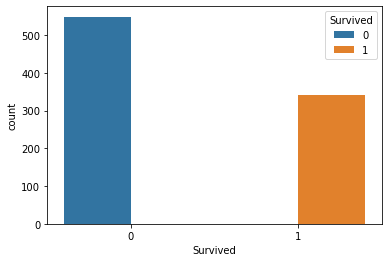

In [16]:
sns.countplot(x='Survived',hue='Survived',data=raw_train)

Survived is skewed. The count of people who died is more than that of the people who survived.

##### Pclass

In [17]:
raw_train['Pclass']

0      3
1      1
2      3
3      1
4      3
      ..
886    2
887    1
888    3
889    1
890    3
Name: Pclass, Length: 891, dtype: int64

In [18]:
raw_train['Pclass'].value_counts()

3    491
1    216
2    184
Name: Pclass, dtype: int64

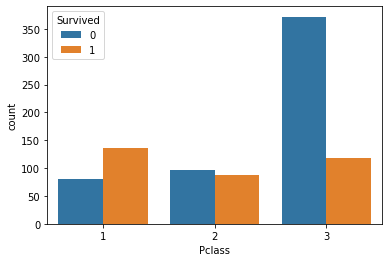

In [19]:
sns.countplot(x='Pclass',hue='Survived',data=raw_train)

In [20]:
print('Correlation between Pclass and Survived: ',round(raw_train.corr()['Survived']['Pclass'],2))

Correlation between Pclass and Survived:  -0.34


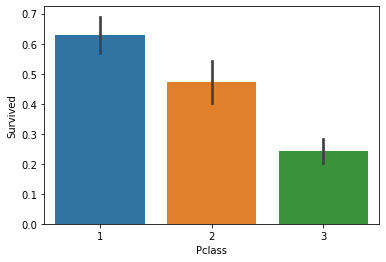

In [21]:
sns.barplot(x='Pclass',y='Survived',data=raw_train)

Using the barplot and the correlation number, we can effectively confirm that the lower your class, the less chance you have of surviving. With that being said, we will need to keep Pclass, it proves to be important.

##### Name

In [22]:
raw_train['Name']

0                                Braund, Mr. Owen Harris
1      Cumings, Mrs. John Bradley (Florence Briggs Th...
2                                 Heikkinen, Miss. Laina
3           Futrelle, Mrs. Jacques Heath (Lily May Peel)
4                               Allen, Mr. William Henry
                             ...                        
886                                Montvila, Rev. Juozas
887                         Graham, Miss. Margaret Edith
888             Johnston, Miss. Catherine Helen "Carrie"
889                                Behr, Mr. Karl Howell
890                                  Dooley, Mr. Patrick
Name: Name, Length: 891, dtype: object

In [23]:
raw_train['Name'].value_counts()

Sivic, Mr. Husein                                      1
Caldwell, Mrs. Albert Francis (Sylvia Mae Harbaugh)    1
Carter, Master. William Thornton II                    1
Taussig, Miss. Ruth                                    1
Hocking, Mrs. Elizabeth (Eliza Needs)                  1
                                                      ..
Persson, Mr. Ernst Ulrik                               1
Davis, Miss. Mary                                      1
Milling, Mr. Jacob Christian                           1
Lobb, Mr. William Arthur                               1
Harris, Mrs. Henry Birkhardt (Irene Wallach)           1
Name: Name, Length: 891, dtype: int64

There are too many unique names. It won't be fruitful to use. Therefore, we will remove it. However, an interesting fact to note is that each name has a title. A Title feature may prove useful. We will experiment with this later on.

##### Sex

In [24]:
raw_train['Sex']

0        male
1      female
2      female
3      female
4        male
        ...  
886      male
887    female
888    female
889      male
890      male
Name: Sex, Length: 891, dtype: object

In [25]:
raw_train['Sex'].value_counts()

male      577
female    314
Name: Sex, dtype: int64

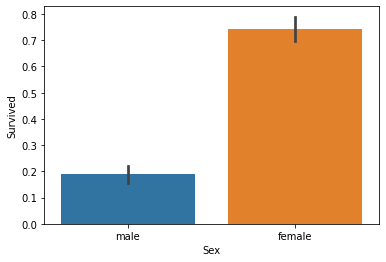

In [26]:
sns.barplot(x='Sex',y='Survived',data=raw_train)

Even though there were more males aboard, women had a far higher rate of survival. Therefore, we will definitely need to keep the Sex feature.

##### Age

In [27]:
raw_train['Age']

0      22.0
1      38.0
2      26.0
3      35.0
4      35.0
       ... 
886    27.0
887    19.0
888     NaN
889    26.0
890    32.0
Name: Age, Length: 891, dtype: float64

In [28]:
print('Correlation between Age and Survived: ',round(raw_train.corr()['Survived']['Age'],2))

Correlation between Age and Survived:  -0.08


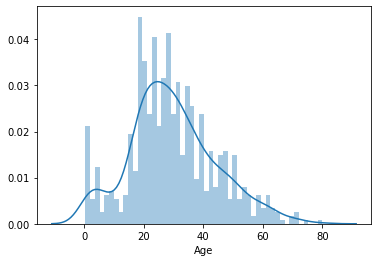

In [29]:
sns.distplot(a=raw_train['Age'],bins=50)

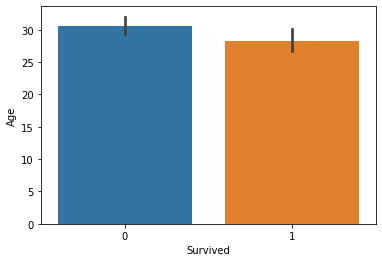

In [30]:
sns.barplot(x='Survived',y='Age',data=raw_train)

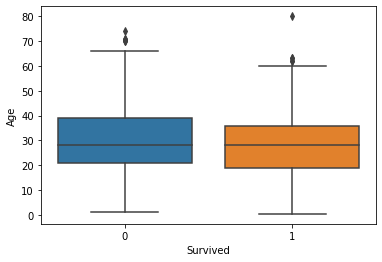

In [31]:
sns.boxplot(x='Survived',y='Age',data=raw_train)

Age has a moderate,negative correlation with Survived. Additionally, if we look at the boxplots, we can see that the Survived Age boxplot has a much smaller range. We can state with confidence that the younger you are the higher chance you have of surviving. Keeping Age.

##### SibSp

In [32]:
print('Correlation between SibSp & Survived: ',round(raw_train.corr()['Survived']['SibSp'],2))

Correlation between SibSp & Survived:  -0.04


In [33]:
raw_train['SibSp']

0      1
1      1
2      0
3      1
4      0
      ..
886    0
887    0
888    1
889    0
890    0
Name: SibSp, Length: 891, dtype: int64

In [34]:
raw_train['SibSp'].value_counts()

0    608
1    209
2     28
4     18
3     16
8      7
5      5
Name: SibSp, dtype: int64

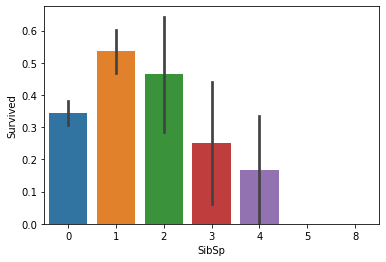

In [35]:
sns.barplot(x='SibSp',y='Survived',data=raw_train)

There doesn't seem to be a clear relationship between SibSp and Survived. Therefore, I will remove it. However, I would like to try to convert the SibSp values into Yes & No instead of numbers. 

##### Parch

In [36]:
raw_train['Parch']

0      0
1      0
2      0
3      0
4      0
      ..
886    0
887    0
888    2
889    0
890    0
Name: Parch, Length: 891, dtype: int64

In [37]:
raw_train['Parch'].value_counts()

0    678
1    118
2     80
5      5
3      5
4      4
6      1
Name: Parch, dtype: int64

In [38]:
print('Correlation between Parch & Survived: ', round(raw_train.corr()['Survived']['Parch'],2))

Correlation between Parch & Survived:  0.08


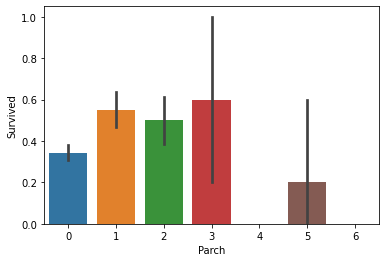

In [39]:
sns.barplot(x='Parch',y='Survived',data=raw_train)

Parch doesn't seem to have a clear relationship with Survived. With that beind said, I will remove it. I may want to try replacing Parch with Yes & No.

##### Fare

In [40]:
raw_train['Fare']

0       7.2500
1      71.2833
2       7.9250
3      53.1000
4       8.0500
        ...   
886    13.0000
887    30.0000
888    23.4500
889    30.0000
890     7.7500
Name: Fare, Length: 891, dtype: float64

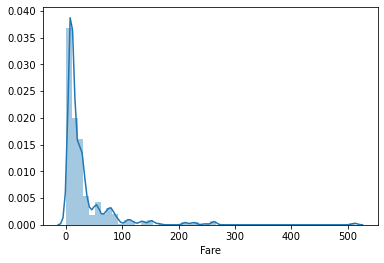

In [41]:
sns.distplot(a=raw_train['Fare'],bins=50)

In [42]:
print('Correlation between Fare & Survived: ',round(raw_train.corr()['Survived']['Fare'],2))

Correlation between Fare & Survived:  0.26


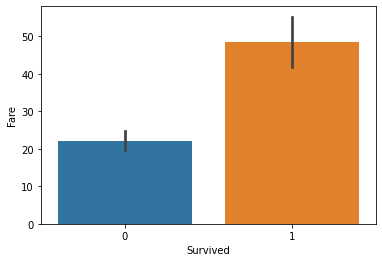

In [43]:
sns.barplot(x='Survived',y='Fare',data=raw_train)

Fare has a moderate, positive correlation with Survived. Using the barplots, we can see that passengers who paid higher fares were had a higher chance of surviving. We must keep this feature.

##### Cabin

In [44]:
raw_train['Cabin']

0       NaN
1       C85
2       NaN
3      C123
4       NaN
       ... 
886     NaN
887     B42
888     NaN
889    C148
890     NaN
Name: Cabin, Length: 891, dtype: object

In [45]:
raw_train['Cabin'].value_counts()

G6             4
B96 B98        4
C23 C25 C27    4
F33            3
D              3
              ..
E34            1
A24            1
E40            1
F E69          1
D37            1
Name: Cabin, Length: 147, dtype: int64

In [46]:
print('% of Missing Values: ',round((891-147)/891*100,2),'%')

% of Missing Values:  83.5 %


There is way too many missing values in Cabin. I am going to remove it. I may consider adding a Deck feature, which specifies which deck the passenger was living on.

##### Embarked

In [47]:
raw_train['Embarked']

0      S
1      C
2      S
3      S
4      S
      ..
886    S
887    S
888    S
889    C
890    Q
Name: Embarked, Length: 891, dtype: object

In [48]:
raw_train['Embarked'].value_counts()

S    644
C    168
Q     77
Name: Embarked, dtype: int64

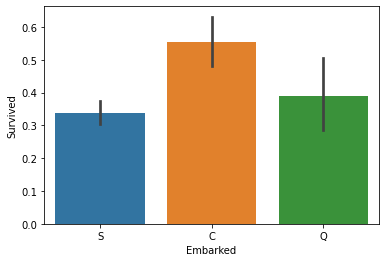

In [49]:
sns.barplot(x='Embarked',y='Survived',data=raw_train)

Looks like port of Embarkment does play a role. Certain ports had higher survival rates than others. I will keep this feature.

##### Ticket

In [50]:
raw_train['Ticket']

0             A/5 21171
1              PC 17599
2      STON/O2. 3101282
3                113803
4                373450
             ...       
886              211536
887              112053
888          W./C. 6607
889              111369
890              370376
Name: Ticket, Length: 891, dtype: object

In [51]:
raw_train['Ticket'].value_counts()

1601          7
347082        7
CA. 2343      7
CA 2144       6
3101295       6
             ..
A/5 21171     1
A/4. 20589    1
A/5 3536      1
367231        1
370371        1
Name: Ticket, Length: 681, dtype: int64

Ticket doesn't have a way to used at the moment. Also, I don't think that when a ship is sinking the Ticket of a passenger plays a role in their survival. Multiple people had the same ticket, which means that those people were traveling as a party. Maybe I could develop a Family feature (yes/no).

### Step 4: Feature Engineering

### Step 5: Data Preparation

In [52]:
# Importing the Libraries needed
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

In [53]:
# Splitting the training set into training and testing
train_set,test_set = train_test_split(raw_train,test_size=0.2,random_state=0)

#### Removing Unnecessary Features

In [54]:
train_set

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
140,141,0,3,"Boulos, Mrs. Joseph (Sultana)",female,NaN,0,2,2678,15.2458,NaN,C
439,440,0,2,"Kvillner, Mr. Johan Henrik Johannesson",male,31.0,0,0,C.A. 18723,10.5000,NaN,S
817,818,0,2,"Mallet, Mr. Albert",male,31.0,1,1,S.C./PARIS 2079,37.0042,NaN,C
378,379,0,3,"Betros, Mr. Tannous",male,20.0,0,0,2648,4.0125,NaN,C
491,492,0,3,"Windelov, Mr. Einar",male,21.0,0,0,SOTON/OQ 3101317,7.2500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
835,836,1,1,"Compton, Miss. Sara Rebecca",female,39.0,1,1,PC 17756,83.1583,E49,C
192,193,1,3,"Andersen-Jensen, Miss. Carla Christine Nielsine",female,19.0,1,0,350046,7.8542,NaN,S
629,630,0,3,"O'Connell, Mr. Patrick D",male,NaN,0,0,334912,7.7333,NaN,Q
559,560,1,3,"de Messemaeker, Mrs. Guillaume Joseph (Emma)",female,36.0,1,0,345572,17.4000,NaN,S


In [55]:
train_set = train_set.drop('PassengerId',axis=1)
train_set = train_set.drop('Name',axis=1)
train_set = train_set.drop('SibSp',axis=1)
train_set = train_set.drop('Parch',axis=1)
train_set = train_set.drop('Cabin',axis=1)
train_set = train_set.drop('Ticket',axis=1)
train_set

,Survived,Pclass,Sex,Age,Fare,Embarked
140,0,3,female,NaN,15.2458,C
439,0,2,male,31.0,10.5000,S
817,0,2,male,31.0,37.0042,C
378,0,3,male,20.0,4.0125,C
491,0,3,male,21.0,7.2500,S
...,...,...,...,...,...,...
835,1,1,female,39.0,83.1583,C
192,1,3,female,19.0,7.8542,S
629,0,3,male,NaN,7.7333,Q
559,1,3,female,36.0,17.4000,S


#### Preprocessing Pipelines

In [56]:
# Seperating Numerical & Categorical
num_attribs = ['Age','Fare']
cat_attribs = ['Sex','Embarked','Pclass']

# Seperating Target Variable & Features
labels = train_set['Survived'].values
train_set = train_set.drop('Survived',axis=1)

In [57]:
# Pipelines
num_pipeline = Pipeline([
    ('Imputer',SimpleImputer(strategy='mean')),
    ('Scaler',StandardScaler()),
])

cat_pipeline = Pipeline([
    ('Imputer',SimpleImputer(strategy='most_frequent')),
    ('Encoder',OneHotEncoder())
])

full_pipeline = ColumnTransformer(transformers=[
    ('num_pipeline',num_pipeline,num_attribs),
    ('cat_pipeline',cat_pipeline,cat_attribs),
],remainder='passthrough')

In [58]:
# Transforming the training set
train_prepared = full_pipeline.fit_transform(train_set)
train_prepared

array([[ 0.        , -0.33167904,  1.        , ...,  0.        ,
         0.        ,  1.        ],
       [ 0.09593203, -0.42640542,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       [ 0.09593203,  0.10261958,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [ 0.        , -0.48162887,  0.        , ...,  0.        ,
         0.        ,  1.        ],
       [ 0.47818735, -0.28868112,  1.        , ...,  0.        ,
         0.        ,  1.        ],
       [ 2.31301288,  0.14245584,  0.        , ...,  0.        ,
         1.        ,  0.        ]])

In [59]:
print('Shape of Prepared Training Data: ',train_prepared.shape)
print('Shape of Labels: ',labels.shape)

Shape of Prepared Training Data:  (712, 10)
Shape of Labels:  (712,)


### Step 6: Building Machine Learning Models

In [60]:
# Importing Libraries

# Metrics
from sklearn.metrics import f1_score, accuracy_score
from sklearn.model_selection import cross_val_predict

# Models
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier

In [61]:
# Function to Get Results
def fit_ml_algo(algo,X_train,y_train,cv):
    
    # Building the model
    model = algo.fit(X_train,y_train)
    
    # Training Accuracy
    train_acc = round(model.score(X_train,y_train)*100,2)
    
    # Cross Validation Accuracy
    cv_pred = cross_val_predict(model,X_train,y_train,cv=cv,n_jobs=-1)
    cv_acc = round(accuracy_score(y_train,cv_pred)*100,2)
    
    # F1-Score
    f1 = f1_score(y_train,cv_pred)
    
    # Returning all needed fields
    return train_acc, cv_acc, f1

#### Logistic Regression

In [62]:
# Building the Model
train_acc_log,cv_acc_log,f1_log = fit_ml_algo(LogisticRegression(random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_log,'%')
print('10 fold CV Accuracy: ',cv_acc_log,'%')
print('F1 Score: ',f1_log)

Training Accuracy:  79.07 %
10 fold CV Accuracy:  78.65 %
F1 Score:  0.7099236641221374


#### Stochastic Gradient Descent

In [63]:
# Building the Model
train_acc_sgd,cv_acc_sgd,f1_sgd = fit_ml_algo(SGDClassifier(random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_sgd,'%')
print('10 fold CV Accuracy: ',cv_acc_sgd,'%')
print('F1 Score: ',f1_sgd)

Training Accuracy:  75.98 %
10 fold CV Accuracy:  75.28 %
F1 Score:  0.6521739130434783


#### K Nearest Neighbors

In [64]:
# Building the Model
train_acc_knn,cv_acc_knn,f1_knn = fit_ml_algo(KNeighborsClassifier(),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_knn,'%')
print('10 fold CV Accuracy: ',cv_acc_knn,'%')
print('F1 Score: ',f1_knn)

Training Accuracy:  86.24 %
10 fold CV Accuracy:  80.2 %
F1 Score:  0.7251461988304093


#### Linear Support Vector Machine

In [65]:
# Building the Model
train_acc_svc,cv_acc_svc,f1_svc = fit_ml_algo(SVC(kernel='linear',random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_svc,'%')
print('10 fold CV Accuracy: ',cv_acc_svc,'%')
print('F1 Score: ',f1_svc)

Training Accuracy:  78.65 %
10 fold CV Accuracy:  78.65 %
F1 Score:  0.7076923076923076


#### Gaussian RBF Support Vector Machine

In [66]:
# Building the Model
train_acc_svcrbf,cv_acc_svcrbf,f1_svcrbf = fit_ml_algo(SVC(kernel='rbf',random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_svcrbf,'%')
print('10 fold CV Accuracy: ',cv_acc_svcrbf,'%')
print('F1 Score: ',f1_svcrbf)

Training Accuracy:  82.87 %
10 fold CV Accuracy:  81.88 %
F1 Score:  0.7261146496815287


#### Polynomial Support Vector Machine

In [67]:
# Building the Model
train_acc_svcpoly,cv_acc_svcpoly,f1_svcpoly = fit_ml_algo(SVC(kernel='poly',random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_svcpoly,'%')
print('10 fold CV Accuracy: ',cv_acc_svcpoly,'%')
print('F1 Score: ',f1_svcpoly)

Training Accuracy:  82.72 %
10 fold CV Accuracy:  81.88 %
F1 Score:  0.7237687366167023


#### Decision Tree

In [68]:
# Building the Model
train_acc_tree,cv_acc_tree,f1_tree = fit_ml_algo(DecisionTreeClassifier(random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_tree,'%')
print('10 fold CV Accuracy: ',cv_acc_tree,'%')
print('F1 Score: ',f1_tree)

Training Accuracy:  97.89 %
10 fold CV Accuracy:  75.98 %
F1 Score:  0.6850828729281768


#### Random Forest

In [69]:
# Building the Model
train_acc_forest,cv_acc_forest,f1_forest = fit_ml_algo(RandomForestClassifier(random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_forest,'%')
print('10 fold CV Accuracy: ',cv_acc_forest,'%')
print('F1 Score: ',f1_forest)

Training Accuracy:  97.89 %
10 fold CV Accuracy:  79.07 %
F1 Score:  0.7235621521335807


#### Extra Trees

In [70]:
# Building the Model
train_acc_extratree,cv_acc_extratree,f1_extratree = fit_ml_algo(ExtraTreesClassifier(random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_extratree,'%')
print('10 fold CV Accuracy: ',cv_acc_extratree,'%')
print('F1 Score: ',f1_extratree)

Training Accuracy:  97.89 %
10 fold CV Accuracy:  78.65 %
F1 Score:  0.7195571955719557


#### Gradient Boosting 

In [71]:
# Building the Model
train_acc_grad,cv_acc_grad,f1_grad = fit_ml_algo(GradientBoostingClassifier(random_state=42),train_prepared,labels,10)

# Printing out the evaluations
print('Training Accuracy: ',train_acc_grad,'%')
print('10 fold CV Accuracy: ',cv_acc_grad,'%')
print('F1 Score: ',f1_grad)

Training Accuracy:  89.33 %
10 fold CV Accuracy:  83.01 %
F1 Score:  0.7594433399602385


#### CatBoost

In [72]:
# Importing the needed modules
from catboost import CatBoostClassifier, Pool, cv

In [73]:
# Adjusting the form of the data for easier use
train_prepared_cat = pd.DataFrame(train_prepared)
labels_cat = pd.DataFrame(labels)
print('Type of Training Data: ', type(train_prepared_cat))
print('Type of Lables: ', type(labels_cat))

Type of Training Data:  <class 'pandas.core.frame.DataFrame'>
Type of Lables:  <class 'pandas.core.frame.DataFrame'>


In [74]:
# Checking the data
train_prepared_cat

,0,1,2,3,4,5,6,7,8,9
0,0.000000,-0.331679,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,0.095932,-0.426405,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.095932,0.102620,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
3,-0.745030,-0.555896,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
4,-0.668579,-0.491276,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
707,0.707541,1.023857,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
708,-0.821481,-0.479216,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
709,0.000000,-0.481629,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
710,0.478187,-0.288681,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [75]:
# Getting the Data Types bc categories need to be ints
train_prepared_cat.dtypes

0    float64
1    float64
2    float64
3    float64
4    float64
5    float64
6    float64
7    float64
8    float64
9    float64
dtype: object

In [76]:
# Converting categories to ints
convert_dict = {
     2:'int',
     3:'int',
     4:'int',
     5:'int',
     6:'int',
     7:'int',
     8:'int',
     9:'int',
}
train_prepared_cat = train_prepared_cat.astype(convert_dict)
train_prepared_cat.dtypes

0    float64
1    float64
2      int64
3      int64
4      int64
5      int64
6      int64
7      int64
8      int64
9      int64
dtype: object

In [77]:
# Getting the categorical features
cat_features = np.where(train_prepared_cat.dtypes != np.float)[0]
cat_features

array([2, 3, 4, 5, 6, 7, 8, 9])

In [78]:
# Preparing the Test set for the validation pool
test_prepared = test_set.copy()
test_prepared = test_prepared.drop('PassengerId',axis=1)
test_prepared = test_prepared.drop('Name',axis=1)
test_prepared = test_prepared.drop('SibSp',axis=1)
test_prepared = test_prepared.drop('Parch',axis=1)
test_prepared = test_prepared.drop('Cabin',axis=1)
test_prepared = test_prepared.drop('Ticket',axis=1)
test_prepared

,Survived,Pclass,Sex,Age,Fare,Embarked
495,0,3,male,NaN,14.4583,C
648,0,3,male,NaN,7.5500,S
278,0,3,male,7.0,29.1250,Q
31,1,1,female,NaN,146.5208,C
255,1,3,female,29.0,15.2458,C
...,...,...,...,...,...,...
780,1,3,female,13.0,7.2292,C
837,0,3,male,NaN,8.0500,S
215,1,1,female,31.0,113.2750,C
833,0,3,male,23.0,7.8542,S


In [79]:
# Separating labels and examples
labels_test = test_prepared['Survived']
test_prepared = test_prepared.drop('Survived',axis=1)
test_prepared

,Pclass,Sex,Age,Fare,Embarked
495,3,male,NaN,14.4583,C
648,3,male,NaN,7.5500,S
278,3,male,7.0,29.1250,Q
31,1,female,NaN,146.5208,C
255,3,female,29.0,15.2458,C
...,...,...,...,...,...
780,3,female,13.0,7.2292,C
837,3,male,NaN,8.0500,S
215,1,female,31.0,113.2750,C
833,3,male,23.0,7.8542,S


In [80]:
# Seperating Numerical & Categorical
num_attribs = ['Age','Fare']
cat_attribs = ['Sex','Embarked','Pclass']

# Transforming the test set
test_prepared = pd.DataFrame(full_pipeline.transform(test_prepared))
test_prepared

,0,1,2,3,4,5,6,7,8,9
0,0.000000,-0.347398,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
1,0.000000,-0.485288,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
2,-1.738894,-0.054650,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
3,0.000000,2.288576,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,-0.056970,-0.331679,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
174,-1.280187,-0.491691,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
175,0.000000,-0.475308,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
176,0.095932,1.624988,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
177,-0.515676,-0.479216,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


In [81]:
# Converting categories to ints
convert_dict = {
     2:'int',
     3:'int',
     4:'int',
     5:'int',
     6:'int',
     7:'int',
     8:'int',
     9:'int',
}
test_prepared_cat = test_prepared.astype(convert_dict)
test_prepared_cat.dtypes

0    float64
1    float64
2      int64
3      int64
4      int64
5      int64
6      int64
7      int64
8      int64
9      int64
dtype: object

In [82]:
# Getting the categorical features
cat_features_test = np.where(train_prepared_cat.dtypes != np.float)[0]
cat_features_test

array([2, 3, 4, 5, 6, 7, 8, 9])

In [83]:
# Creating the Training Pool
train_pool = Pool(
    data=train_prepared_cat,
    label=labels_cat,
    cat_features=cat_features
)

# Creating the Validation Pool
validation_pool = Pool(
    data=test_prepared_cat,
    label=labels_test,
    cat_features=cat_features_test,
)

In [84]:
# Building the model
catboost_clf = CatBoostClassifier(
    learning_rate=0.01,
    iterations=1000,
    loss_function='Logloss',
    custom_loss=['Accuracy','F1'],
    early_stopping_rounds=100,
)

# Fitting the model
catboost_clf.fit(
    train_pool,
    eval_set=validation_pool,
    plot=True,
)

# Getting Training Accuracy and F1-Score
acc_catboost = round(catboost_clf.score(train_pool)*100,2)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6868518	test: 0.6865898	best: 0.6865898 (0)	total: 54.5ms	remaining: 54.4s
1:	learn: 0.6807950	test: 0.6806522	best: 0.6806522 (1)	total: 55.9ms	remaining: 27.9s
2:	learn: 0.6741280	test: 0.6733131	best: 0.6733131 (2)	total: 57.2ms	remaining: 19s
3:	learn: 0.6678822	test: 0.6667351	best: 0.6667351 (3)	total: 58.5ms	remaining: 14.6s
4:	learn: 0.6623418	test: 0.6607776	best: 0.6607776 (4)	total: 59.8ms	remaining: 11.9s
5:	learn: 0.6562862	test: 0.6544589	best: 0.6544589 (5)	total: 61.1ms	remaining: 10.1s
6:	learn: 0.6505219	test: 0.6481148	best: 0.6481148 (6)	total: 62.9ms	remaining: 8.93s
7:	learn: 0.6446245	test: 0.6422300	best: 0.6422300 (7)	total: 64.2ms	remaining: 7.96s
8:	learn: 0.6398243	test: 0.6371848	best: 0.6371848 (8)	total: 65.5ms	remaining: 7.21s
9:	learn: 0.6343135	test: 0.6313945	best: 0.6313945 (9)	total: 66.8ms	remaining: 6.61s
10:	learn: 0.6299013	test: 0.6264998	best: 0.6264998 (10)	total: 67.7ms	remaining: 6.09s
11:	learn: 0.6250361	test: 0.6214550	best: 

133:	learn: 0.4127987	test: 0.4041266	best: 0.4041266 (133)	total: 221ms	remaining: 1.43s
134:	learn: 0.4126500	test: 0.4039786	best: 0.4039786 (134)	total: 221ms	remaining: 1.42s
135:	learn: 0.4120424	test: 0.4033810	best: 0.4033810 (135)	total: 223ms	remaining: 1.41s
136:	learn: 0.4115405	test: 0.4031500	best: 0.4031500 (136)	total: 224ms	remaining: 1.41s
137:	learn: 0.4109761	test: 0.4025255	best: 0.4025255 (137)	total: 226ms	remaining: 1.41s
138:	learn: 0.4103022	test: 0.4018885	best: 0.4018885 (138)	total: 227ms	remaining: 1.41s
139:	learn: 0.4098736	test: 0.4014454	best: 0.4014454 (139)	total: 228ms	remaining: 1.4s
140:	learn: 0.4093647	test: 0.4009163	best: 0.4009163 (140)	total: 230ms	remaining: 1.4s
141:	learn: 0.4089855	test: 0.4003860	best: 0.4003860 (141)	total: 231ms	remaining: 1.39s
142:	learn: 0.4087512	test: 0.4003191	best: 0.4003191 (142)	total: 233ms	remaining: 1.39s
143:	learn: 0.4082832	test: 0.4000183	best: 0.4000183 (143)	total: 234ms	remaining: 1.39s
144:	learn: 

251:	learn: 0.3742974	test: 0.3798879	best: 0.3798820 (250)	total: 387ms	remaining: 1.15s
252:	learn: 0.3740859	test: 0.3798940	best: 0.3798820 (250)	total: 389ms	remaining: 1.15s
253:	learn: 0.3737797	test: 0.3795217	best: 0.3795217 (253)	total: 390ms	remaining: 1.14s
254:	learn: 0.3735904	test: 0.3794399	best: 0.3794399 (254)	total: 391ms	remaining: 1.14s
255:	learn: 0.3733553	test: 0.3793067	best: 0.3793067 (255)	total: 392ms	remaining: 1.14s
256:	learn: 0.3730021	test: 0.3789919	best: 0.3789919 (256)	total: 394ms	remaining: 1.14s
257:	learn: 0.3727572	test: 0.3787920	best: 0.3787920 (257)	total: 395ms	remaining: 1.14s
258:	learn: 0.3725124	test: 0.3786222	best: 0.3786222 (258)	total: 396ms	remaining: 1.13s
259:	learn: 0.3722992	test: 0.3784485	best: 0.3784485 (259)	total: 398ms	remaining: 1.13s
260:	learn: 0.3720910	test: 0.3783487	best: 0.3783487 (260)	total: 399ms	remaining: 1.13s
261:	learn: 0.3720523	test: 0.3782974	best: 0.3782974 (261)	total: 400ms	remaining: 1.13s
262:	learn

386:	learn: 0.3501097	test: 0.3736749	best: 0.3735983 (378)	total: 554ms	remaining: 877ms
387:	learn: 0.3500580	test: 0.3736645	best: 0.3735983 (378)	total: 556ms	remaining: 878ms
388:	learn: 0.3499167	test: 0.3736872	best: 0.3735983 (378)	total: 558ms	remaining: 876ms
389:	learn: 0.3497014	test: 0.3737059	best: 0.3735983 (378)	total: 559ms	remaining: 874ms
390:	learn: 0.3495868	test: 0.3737027	best: 0.3735983 (378)	total: 560ms	remaining: 872ms
391:	learn: 0.3494833	test: 0.3737215	best: 0.3735983 (378)	total: 562ms	remaining: 871ms
392:	learn: 0.3494345	test: 0.3737348	best: 0.3735983 (378)	total: 563ms	remaining: 870ms
393:	learn: 0.3493214	test: 0.3737195	best: 0.3735983 (378)	total: 564ms	remaining: 868ms
394:	learn: 0.3490947	test: 0.3737040	best: 0.3735983 (378)	total: 566ms	remaining: 866ms
395:	learn: 0.3490177	test: 0.3737587	best: 0.3735983 (378)	total: 567ms	remaining: 864ms
396:	learn: 0.3489203	test: 0.3738416	best: 0.3735983 (378)	total: 568ms	remaining: 862ms
397:	learn

507:	learn: 0.3322920	test: 0.3700999	best: 0.3700999 (507)	total: 722ms	remaining: 699ms
508:	learn: 0.3320416	test: 0.3700980	best: 0.3700980 (508)	total: 723ms	remaining: 697ms
509:	learn: 0.3318812	test: 0.3701358	best: 0.3700980 (508)	total: 724ms	remaining: 696ms
510:	learn: 0.3318049	test: 0.3700656	best: 0.3700656 (510)	total: 728ms	remaining: 697ms
511:	learn: 0.3316442	test: 0.3704117	best: 0.3700656 (510)	total: 729ms	remaining: 695ms
512:	learn: 0.3315253	test: 0.3703652	best: 0.3700656 (510)	total: 731ms	remaining: 694ms
513:	learn: 0.3314555	test: 0.3703822	best: 0.3700656 (510)	total: 732ms	remaining: 692ms
514:	learn: 0.3311718	test: 0.3703982	best: 0.3700656 (510)	total: 734ms	remaining: 691ms
515:	learn: 0.3310825	test: 0.3704207	best: 0.3700656 (510)	total: 735ms	remaining: 690ms
516:	learn: 0.3310553	test: 0.3704764	best: 0.3700656 (510)	total: 736ms	remaining: 688ms
517:	learn: 0.3309489	test: 0.3705117	best: 0.3700656 (510)	total: 738ms	remaining: 687ms
518:	learn

645:	learn: 0.3148855	test: 0.3703231	best: 0.3697437 (560)	total: 1.1s	remaining: 605ms
646:	learn: 0.3147382	test: 0.3702396	best: 0.3697437 (560)	total: 1.14s	remaining: 621ms
647:	learn: 0.3146778	test: 0.3702468	best: 0.3697437 (560)	total: 1.14s	remaining: 620ms
648:	learn: 0.3146101	test: 0.3702190	best: 0.3697437 (560)	total: 1.14s	remaining: 618ms
649:	learn: 0.3144708	test: 0.3702880	best: 0.3697437 (560)	total: 1.14s	remaining: 616ms
650:	learn: 0.3142699	test: 0.3704249	best: 0.3697437 (560)	total: 1.15s	remaining: 615ms
651:	learn: 0.3142183	test: 0.3704285	best: 0.3697437 (560)	total: 1.15s	remaining: 613ms
652:	learn: 0.3141497	test: 0.3704099	best: 0.3697437 (560)	total: 1.15s	remaining: 611ms
653:	learn: 0.3139807	test: 0.3704985	best: 0.3697437 (560)	total: 1.15s	remaining: 610ms
654:	learn: 0.3138214	test: 0.3704753	best: 0.3697437 (560)	total: 1.15s	remaining: 608ms
655:	learn: 0.3136425	test: 0.3705769	best: 0.3697437 (560)	total: 1.16s	remaining: 606ms
656:	learn:

In [85]:
# Perform Cross Validation
params = catboost_clf.get_params()

cv_data = cv(
    train_pool,
    params=params,
    fold_count=10,
    plot=True,
)

# Getting the Best Testing Accuracy
acc_cv_catboost = round(np.max(cv_data['test-Accuracy-mean'])* 100, 2)
f1_cv_catboost = np.max(cv_data['test-F1-mean'])

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6878405	test: 0.6881359	best: 0.6881359 (0)	total: 458ms	remaining: 7m 37s
1:	learn: 0.6824148	test: 0.6831408	best: 0.6831408 (1)	total: 534ms	remaining: 4m 26s
2:	learn: 0.6767902	test: 0.6780128	best: 0.6780128 (2)	total: 1.03s	remaining: 5m 43s
3:	learn: 0.6721187	test: 0.6734782	best: 0.6734782 (3)	total: 1.37s	remaining: 5m 40s
4:	learn: 0.6659295	test: 0.6677923	best: 0.6677923 (4)	total: 1.41s	remaining: 4m 39s
5:	learn: 0.6601471	test: 0.6623600	best: 0.6623600 (5)	total: 1.46s	remaining: 4m 1s
6:	learn: 0.6553387	test: 0.6581839	best: 0.6581839 (6)	total: 1.51s	remaining: 3m 33s
7:	learn: 0.6501354	test: 0.6533354	best: 0.6533354 (7)	total: 1.6s	remaining: 3m 18s
8:	learn: 0.6447086	test: 0.6482620	best: 0.6482620 (8)	total: 1.64s	remaining: 3m
9:	learn: 0.6391679	test: 0.6433456	best: 0.6433456 (9)	total: 1.67s	remaining: 2m 45s
10:	learn: 0.6339512	test: 0.6385306	best: 0.6385306 (10)	total: 1.72s	remaining: 2m 34s
11:	learn: 0.6301662	test: 0.6349909	best: 0.63

94:	learn: 0.4403238	test: 0.4673362	best: 0.4673362 (94)	total: 7.8s	remaining: 1m 14s
95:	learn: 0.4393481	test: 0.4665845	best: 0.4665845 (95)	total: 7.84s	remaining: 1m 13s
96:	learn: 0.4385221	test: 0.4659723	best: 0.4659723 (96)	total: 7.87s	remaining: 1m 13s
97:	learn: 0.4377401	test: 0.4652691	best: 0.4652691 (97)	total: 7.9s	remaining: 1m 12s
98:	learn: 0.4368101	test: 0.4646552	best: 0.4646552 (98)	total: 7.94s	remaining: 1m 12s
99:	learn: 0.4358994	test: 0.4639904	best: 0.4639904 (99)	total: 7.98s	remaining: 1m 11s
100:	learn: 0.4349817	test: 0.4633179	best: 0.4633179 (100)	total: 8.08s	remaining: 1m 11s
101:	learn: 0.4341787	test: 0.4628662	best: 0.4628662 (101)	total: 8.14s	remaining: 1m 11s
102:	learn: 0.4334118	test: 0.4623552	best: 0.4623552 (102)	total: 8.21s	remaining: 1m 11s
103:	learn: 0.4328033	test: 0.4619237	best: 0.4619237 (103)	total: 8.25s	remaining: 1m 11s
104:	learn: 0.4319528	test: 0.4611640	best: 0.4611640 (104)	total: 8.32s	remaining: 1m 10s
105:	learn: 0

187:	learn: 0.3889117	test: 0.4378130	best: 0.4378130 (187)	total: 16s	remaining: 1m 9s
188:	learn: 0.3885654	test: 0.4376517	best: 0.4376517 (188)	total: 16.1s	remaining: 1m 9s
189:	learn: 0.3882460	test: 0.4375384	best: 0.4375384 (189)	total: 16.2s	remaining: 1m 9s
190:	learn: 0.3879335	test: 0.4374588	best: 0.4374588 (190)	total: 16.2s	remaining: 1m 8s
191:	learn: 0.3876444	test: 0.4374051	best: 0.4374051 (191)	total: 16.3s	remaining: 1m 8s
192:	learn: 0.3873605	test: 0.4372578	best: 0.4372578 (192)	total: 16.7s	remaining: 1m 9s
193:	learn: 0.3870272	test: 0.4371654	best: 0.4371654 (193)	total: 16.7s	remaining: 1m 9s
194:	learn: 0.3867004	test: 0.4370187	best: 0.4370187 (194)	total: 16.8s	remaining: 1m 9s
195:	learn: 0.3863868	test: 0.4368882	best: 0.4368882 (195)	total: 16.8s	remaining: 1m 8s
196:	learn: 0.3860487	test: 0.4367498	best: 0.4367498 (196)	total: 16.9s	remaining: 1m 8s
197:	learn: 0.3857185	test: 0.4365851	best: 0.4365851 (197)	total: 16.9s	remaining: 1m 8s
198:	learn: 

282:	learn: 0.3645902	test: 0.4312128	best: 0.4312128 (282)	total: 22s	remaining: 55.7s
283:	learn: 0.3643883	test: 0.4311276	best: 0.4311276 (283)	total: 22.2s	remaining: 55.9s
284:	learn: 0.3641773	test: 0.4310226	best: 0.4310226 (284)	total: 22.2s	remaining: 55.8s
285:	learn: 0.3639723	test: 0.4308995	best: 0.4308995 (285)	total: 22.3s	remaining: 55.7s
286:	learn: 0.3637292	test: 0.4308144	best: 0.4308144 (286)	total: 22.3s	remaining: 55.5s
287:	learn: 0.3634777	test: 0.4308069	best: 0.4308069 (287)	total: 22.4s	remaining: 55.3s
288:	learn: 0.3632587	test: 0.4306840	best: 0.4306840 (288)	total: 22.4s	remaining: 55.2s
289:	learn: 0.3630325	test: 0.4307590	best: 0.4306840 (288)	total: 22.5s	remaining: 55s
290:	learn: 0.3628478	test: 0.4308097	best: 0.4306840 (288)	total: 22.5s	remaining: 54.9s
291:	learn: 0.3626409	test: 0.4308504	best: 0.4306840 (288)	total: 22.6s	remaining: 54.7s
292:	learn: 0.3624372	test: 0.4308915	best: 0.4306840 (288)	total: 22.7s	remaining: 54.7s
293:	learn: 0.

375:	learn: 0.3468556	test: 0.4297234	best: 0.4295395 (361)	total: 29.3s	remaining: 48.7s
376:	learn: 0.3467022	test: 0.4296973	best: 0.4295395 (361)	total: 29.4s	remaining: 48.6s
377:	learn: 0.3465242	test: 0.4297344	best: 0.4295395 (361)	total: 29.4s	remaining: 48.4s
378:	learn: 0.3463561	test: 0.4297760	best: 0.4295395 (361)	total: 29.5s	remaining: 48.3s
379:	learn: 0.3461702	test: 0.4297674	best: 0.4295395 (361)	total: 29.5s	remaining: 48.2s
380:	learn: 0.3460523	test: 0.4298155	best: 0.4295395 (361)	total: 29.6s	remaining: 48.1s
381:	learn: 0.3458876	test: 0.4298019	best: 0.4295395 (361)	total: 29.6s	remaining: 47.9s
382:	learn: 0.3456920	test: 0.4298121	best: 0.4295395 (361)	total: 29.7s	remaining: 47.8s
383:	learn: 0.3454948	test: 0.4297699	best: 0.4295395 (361)	total: 29.8s	remaining: 47.8s
384:	learn: 0.3453514	test: 0.4297270	best: 0.4295395 (361)	total: 29.8s	remaining: 47.7s
385:	learn: 0.3451851	test: 0.4295980	best: 0.4295395 (361)	total: 29.9s	remaining: 47.5s
386:	learn

467:	learn: 0.3321698	test: 0.4294860	best: 0.4292879 (414)	total: 35.6s	remaining: 40.5s
468:	learn: 0.3319761	test: 0.4294450	best: 0.4292879 (414)	total: 35.7s	remaining: 40.4s
469:	learn: 0.3318157	test: 0.4294083	best: 0.4292879 (414)	total: 35.7s	remaining: 40.3s
470:	learn: 0.3316583	test: 0.4294336	best: 0.4292879 (414)	total: 35.8s	remaining: 40.2s
471:	learn: 0.3315243	test: 0.4294164	best: 0.4292879 (414)	total: 35.9s	remaining: 40.1s
472:	learn: 0.3313615	test: 0.4293467	best: 0.4292879 (414)	total: 35.9s	remaining: 40s
473:	learn: 0.3312484	test: 0.4292786	best: 0.4292786 (473)	total: 36s	remaining: 39.9s
474:	learn: 0.3311256	test: 0.4292575	best: 0.4292575 (474)	total: 36.1s	remaining: 39.9s
475:	learn: 0.3309830	test: 0.4292391	best: 0.4292391 (475)	total: 36.1s	remaining: 39.8s
476:	learn: 0.3308519	test: 0.4292526	best: 0.4292391 (475)	total: 37s	remaining: 40.6s
477:	learn: 0.3306985	test: 0.4292170	best: 0.4292170 (477)	total: 37s	remaining: 40.5s
478:	learn: 0.3305

559:	learn: 0.3193146	test: 0.4295510	best: 0.4291326 (485)	total: 43.2s	remaining: 34s
560:	learn: 0.3191910	test: 0.4294766	best: 0.4291326 (485)	total: 43.3s	remaining: 33.9s
561:	learn: 0.3190462	test: 0.4294543	best: 0.4291326 (485)	total: 43.3s	remaining: 33.8s
562:	learn: 0.3189506	test: 0.4294615	best: 0.4291326 (485)	total: 43.4s	remaining: 33.7s
563:	learn: 0.3188070	test: 0.4295327	best: 0.4291326 (485)	total: 43.4s	remaining: 33.6s
564:	learn: 0.3186815	test: 0.4294711	best: 0.4291326 (485)	total: 43.5s	remaining: 33.5s
565:	learn: 0.3185392	test: 0.4294836	best: 0.4291326 (485)	total: 43.5s	remaining: 33.4s
566:	learn: 0.3184278	test: 0.4294739	best: 0.4291326 (485)	total: 43.5s	remaining: 33.3s
567:	learn: 0.3182949	test: 0.4293981	best: 0.4291326 (485)	total: 43.6s	remaining: 33.2s
568:	learn: 0.3181524	test: 0.4293175	best: 0.4291326 (485)	total: 43.7s	remaining: 33.1s
569:	learn: 0.3179787	test: 0.4293383	best: 0.4291326 (485)	total: 43.8s	remaining: 33s
570:	learn: 0.

652:	learn: 0.3064157	test: 0.4298774	best: 0.4291242 (577)	total: 51.4s	remaining: 27.3s
653:	learn: 0.3062890	test: 0.4298204	best: 0.4291242 (577)	total: 51.4s	remaining: 27.2s
654:	learn: 0.3061399	test: 0.4298755	best: 0.4291242 (577)	total: 51.5s	remaining: 27.1s
655:	learn: 0.3059810	test: 0.4298458	best: 0.4291242 (577)	total: 51.5s	remaining: 27s
656:	learn: 0.3058770	test: 0.4298132	best: 0.4291242 (577)	total: 51.5s	remaining: 26.9s
657:	learn: 0.3057633	test: 0.4298273	best: 0.4291242 (577)	total: 51.6s	remaining: 26.8s
658:	learn: 0.3056354	test: 0.4298617	best: 0.4291242 (577)	total: 51.6s	remaining: 26.7s
659:	learn: 0.3055239	test: 0.4298968	best: 0.4291242 (577)	total: 51.8s	remaining: 26.7s
660:	learn: 0.3054099	test: 0.4298723	best: 0.4291242 (577)	total: 51.8s	remaining: 26.6s
661:	learn: 0.3053044	test: 0.4298668	best: 0.4291242 (577)	total: 51.9s	remaining: 26.5s
662:	learn: 0.3051231	test: 0.4299655	best: 0.4291242 (577)	total: 51.9s	remaining: 26.4s
663:	learn: 

In [86]:
# Printing out the results
print('Tree Count: ',catboost_clf.tree_count_)
print('Training Accuracy: ',acc_catboost,'%')
print('10 Fold CV Accuracy: ',acc_cv_catboost,'%')
print('F1 Score: ',f1_cv_catboost)

Tree Count:  561
Training Accuracy:  88.06 %
10 Fold CV Accuracy:  83.3 %
F1 Score:  0.759994672136217


## Step 7: Comparing Model Results

In [87]:
results = pd.DataFrame({
    'Model':['Logistic Regression','Stochastic Gradient Descent',
             'K-Nearest Neighbors','Linear Support Vector Machine',
            'Gaussian RBF Support Vector Machine','Polynomial Support Vector Machine',
            'Decision Tree','Random Forest','Extra Trees','Gradient Boosting',
            'CatBoost'],
    'Training Accuracy':[train_acc_log,train_acc_sgd,train_acc_knn,
                        train_acc_svc,train_acc_svcrbf,train_acc_svcpoly,
                        train_acc_tree,train_acc_forest,train_acc_extratree,
                        train_acc_grad,acc_catboost],
    '10-Fold CV Accuracy':[cv_acc_log,cv_acc_sgd,cv_acc_knn,
                        cv_acc_svc,cv_acc_svcrbf,cv_acc_svcpoly,
                        cv_acc_tree,cv_acc_forest,cv_acc_extratree,
                        cv_acc_grad,acc_cv_catboost],
    'F1 Score': [f1_log,f1_sgd,f1_knn,f1_svc,f1_svcrbf,f1_svcpoly,f1_tree,f1_forest,f1_extratree,f1_grad,
                 f1_cv_catboost],
    
})
results.sort_values(by='10-Fold CV Accuracy',ascending=False)

,Model,Training Accuracy,10-Fold CV Accuracy,F1 Score
10,CatBoost,88.06,83.30,0.759995
9,Gradient Boosting,89.33,83.01,0.759443
4,Gaussian RBF Support Vector Machine,82.87,81.88,0.726115
5,Polynomial Support Vector Machine,82.72,81.88,0.723769
2,K-Nearest Neighbors,86.24,80.20,0.725146
7,Random Forest,97.89,79.07,0.723562
0,Logistic Regression,79.07,78.65,0.709924
3,Linear Support Vector Machine,78.65,78.65,0.707692
8,Extra Trees,97.89,78.65,0.719557
6,Decision Tree,97.89,75.98,0.685083


## Step 8: Optimizing the Best Model

In [101]:
# Importing Needed Libraries
from sklearn.model_selection import GridSearchCV

In [152]:
# Setting Up for GridSearch

# A Fresh, New Model with the same parameters
catboost_clf_grid = CatBoostClassifier(learning_rate=0.01,
                                        iterations=1500,
                                        loss_function='Logloss',
                                        custom_loss=['Accuracy','F1'],
                                        early_stopping_rounds=100,
)

# Parameters for GridSearchCV
params = {
    'learning_rate':[0.0001,0.0003,0.001,0.003,0.01],
    'l2_leaf_reg':[3,6,9],
    'depth':[3,6,9],   
}

In [153]:
# Running Grid Search and fitting the model
grid_search = GridSearchCV(catboost_clf_grid,param_grid=params,cv=3)
results = grid_search.fit(train_prepared,labels)

0:	learn: 0.6930987	total: 1.09ms	remaining: 1.64s
1:	learn: 0.6930429	total: 2.11ms	remaining: 1.58s
2:	learn: 0.6929924	total: 3.43ms	remaining: 1.71s
3:	learn: 0.6929430	total: 4.16ms	remaining: 1.56s
4:	learn: 0.6928835	total: 5.01ms	remaining: 1.5s
5:	learn: 0.6928290	total: 5.74ms	remaining: 1.43s
6:	learn: 0.6927754	total: 6.46ms	remaining: 1.38s
7:	learn: 0.6927278	total: 7.16ms	remaining: 1.33s
8:	learn: 0.6926711	total: 7.99ms	remaining: 1.32s
9:	learn: 0.6926242	total: 8.81ms	remaining: 1.31s
10:	learn: 0.6925767	total: 9.49ms	remaining: 1.28s
11:	learn: 0.6925159	total: 10.2ms	remaining: 1.26s
12:	learn: 0.6924622	total: 11ms	remaining: 1.25s
13:	learn: 0.6924129	total: 11.7ms	remaining: 1.24s
14:	learn: 0.6923654	total: 12.4ms	remaining: 1.22s
15:	learn: 0.6923112	total: 13ms	remaining: 1.21s
16:	learn: 0.6922593	total: 13.7ms	remaining: 1.2s
17:	learn: 0.6921982	total: 14.5ms	remaining: 1.19s
18:	learn: 0.6921419	total: 15.2ms	remaining: 1.19s
19:	learn: 0.6920998	total: 

277:	learn: 0.6789784	total: 171ms	remaining: 750ms
278:	learn: 0.6789248	total: 171ms	remaining: 750ms
279:	learn: 0.6788670	total: 172ms	remaining: 750ms
280:	learn: 0.6788119	total: 173ms	remaining: 752ms
281:	learn: 0.6787661	total: 175ms	remaining: 755ms
282:	learn: 0.6787198	total: 175ms	remaining: 754ms
283:	learn: 0.6786611	total: 176ms	remaining: 754ms
284:	learn: 0.6786145	total: 177ms	remaining: 753ms
285:	learn: 0.6785574	total: 177ms	remaining: 753ms
286:	learn: 0.6785125	total: 178ms	remaining: 752ms
287:	learn: 0.6784552	total: 179ms	remaining: 752ms
288:	learn: 0.6784096	total: 179ms	remaining: 752ms
289:	learn: 0.6783685	total: 180ms	remaining: 751ms
290:	learn: 0.6783285	total: 181ms	remaining: 751ms
291:	learn: 0.6782804	total: 181ms	remaining: 751ms
292:	learn: 0.6782232	total: 182ms	remaining: 750ms
293:	learn: 0.6781766	total: 183ms	remaining: 750ms
294:	learn: 0.6781232	total: 184ms	remaining: 750ms
295:	learn: 0.6780724	total: 185ms	remaining: 751ms
296:	learn: 

512:	learn: 0.6677266	total: 339ms	remaining: 652ms
513:	learn: 0.6676809	total: 340ms	remaining: 652ms
514:	learn: 0.6676420	total: 341ms	remaining: 652ms
515:	learn: 0.6675945	total: 342ms	remaining: 652ms
516:	learn: 0.6675392	total: 343ms	remaining: 653ms
517:	learn: 0.6674877	total: 345ms	remaining: 653ms
518:	learn: 0.6674367	total: 345ms	remaining: 653ms
519:	learn: 0.6673894	total: 346ms	remaining: 652ms
520:	learn: 0.6673407	total: 347ms	remaining: 652ms
521:	learn: 0.6672984	total: 348ms	remaining: 652ms
522:	learn: 0.6672513	total: 348ms	remaining: 651ms
523:	learn: 0.6671960	total: 349ms	remaining: 651ms
524:	learn: 0.6671540	total: 351ms	remaining: 651ms
525:	learn: 0.6671123	total: 352ms	remaining: 652ms
526:	learn: 0.6670642	total: 353ms	remaining: 651ms
527:	learn: 0.6670272	total: 353ms	remaining: 650ms
528:	learn: 0.6669792	total: 354ms	remaining: 650ms
529:	learn: 0.6669297	total: 355ms	remaining: 650ms
530:	learn: 0.6668755	total: 356ms	remaining: 650ms
531:	learn: 

763:	learn: 0.6562109	total: 507ms	remaining: 489ms
764:	learn: 0.6561676	total: 508ms	remaining: 488ms
765:	learn: 0.6561205	total: 509ms	remaining: 488ms
766:	learn: 0.6560677	total: 510ms	remaining: 487ms
767:	learn: 0.6560255	total: 510ms	remaining: 486ms
768:	learn: 0.6559906	total: 511ms	remaining: 486ms
769:	learn: 0.6559518	total: 511ms	remaining: 485ms
770:	learn: 0.6559042	total: 512ms	remaining: 484ms
771:	learn: 0.6558634	total: 513ms	remaining: 483ms
772:	learn: 0.6558229	total: 513ms	remaining: 483ms
773:	learn: 0.6557725	total: 514ms	remaining: 482ms
774:	learn: 0.6557327	total: 515ms	remaining: 481ms
775:	learn: 0.6556805	total: 515ms	remaining: 481ms
776:	learn: 0.6556302	total: 516ms	remaining: 480ms
777:	learn: 0.6555880	total: 516ms	remaining: 479ms
778:	learn: 0.6555427	total: 517ms	remaining: 479ms
779:	learn: 0.6554962	total: 518ms	remaining: 478ms
780:	learn: 0.6554566	total: 519ms	remaining: 477ms
781:	learn: 0.6554105	total: 519ms	remaining: 477ms
782:	learn: 

1028:	learn: 0.6448082	total: 673ms	remaining: 308ms
1029:	learn: 0.6447593	total: 675ms	remaining: 308ms
1030:	learn: 0.6447200	total: 675ms	remaining: 307ms
1031:	learn: 0.6446872	total: 677ms	remaining: 307ms
1032:	learn: 0.6446482	total: 677ms	remaining: 306ms
1033:	learn: 0.6446048	total: 678ms	remaining: 305ms
1034:	learn: 0.6445602	total: 678ms	remaining: 305ms
1035:	learn: 0.6445221	total: 679ms	remaining: 304ms
1036:	learn: 0.6444771	total: 679ms	remaining: 303ms
1037:	learn: 0.6444314	total: 680ms	remaining: 303ms
1038:	learn: 0.6443953	total: 681ms	remaining: 302ms
1039:	learn: 0.6443507	total: 681ms	remaining: 301ms
1040:	learn: 0.6443174	total: 682ms	remaining: 301ms
1041:	learn: 0.6442735	total: 683ms	remaining: 300ms
1042:	learn: 0.6442345	total: 684ms	remaining: 300ms
1043:	learn: 0.6441861	total: 685ms	remaining: 299ms
1044:	learn: 0.6441470	total: 686ms	remaining: 299ms
1045:	learn: 0.6441107	total: 686ms	remaining: 298ms
1046:	learn: 0.6440616	total: 688ms	remaining:

1276:	learn: 0.6347330	total: 837ms	remaining: 146ms
1277:	learn: 0.6346906	total: 838ms	remaining: 146ms
1278:	learn: 0.6346560	total: 838ms	remaining: 145ms
1279:	learn: 0.6346127	total: 840ms	remaining: 144ms
1280:	learn: 0.6345690	total: 840ms	remaining: 144ms
1281:	learn: 0.6345277	total: 841ms	remaining: 143ms
1282:	learn: 0.6344890	total: 841ms	remaining: 142ms
1283:	learn: 0.6344457	total: 842ms	remaining: 142ms
1284:	learn: 0.6344043	total: 843ms	remaining: 141ms
1285:	learn: 0.6343681	total: 844ms	remaining: 140ms
1286:	learn: 0.6343205	total: 844ms	remaining: 140ms
1287:	learn: 0.6342724	total: 845ms	remaining: 139ms
1288:	learn: 0.6342243	total: 845ms	remaining: 138ms
1289:	learn: 0.6341775	total: 846ms	remaining: 138ms
1290:	learn: 0.6341291	total: 847ms	remaining: 137ms
1291:	learn: 0.6340882	total: 847ms	remaining: 136ms
1292:	learn: 0.6340569	total: 848ms	remaining: 136ms
1293:	learn: 0.6340146	total: 849ms	remaining: 135ms
1294:	learn: 0.6339763	total: 849ms	remaining:

0:	learn: 0.6931078	total: 1.08ms	remaining: 1.62s
1:	learn: 0.6930538	total: 2.1ms	remaining: 1.57s
2:	learn: 0.6930111	total: 2.75ms	remaining: 1.37s
3:	learn: 0.6929609	total: 3.38ms	remaining: 1.26s
4:	learn: 0.6929037	total: 4.13ms	remaining: 1.23s
5:	learn: 0.6928477	total: 4.77ms	remaining: 1.19s
6:	learn: 0.6927892	total: 5.4ms	remaining: 1.15s
7:	learn: 0.6927469	total: 6.03ms	remaining: 1.13s
8:	learn: 0.6926929	total: 6.65ms	remaining: 1.1s
9:	learn: 0.6926485	total: 7.3ms	remaining: 1.09s
10:	learn: 0.6926029	total: 7.86ms	remaining: 1.06s
11:	learn: 0.6925580	total: 8.49ms	remaining: 1.05s
12:	learn: 0.6925024	total: 9.11ms	remaining: 1.04s
13:	learn: 0.6924493	total: 9.71ms	remaining: 1.03s
14:	learn: 0.6923992	total: 10.5ms	remaining: 1.03s
15:	learn: 0.6923549	total: 11.1ms	remaining: 1.03s
16:	learn: 0.6923115	total: 11.9ms	remaining: 1.04s
17:	learn: 0.6922536	total: 13ms	remaining: 1.07s
18:	learn: 0.6921941	total: 13.9ms	remaining: 1.08s
19:	learn: 0.6921538	total: 

203:	learn: 0.6829375	total: 174ms	remaining: 1.1s
204:	learn: 0.6828993	total: 174ms	remaining: 1.1s
205:	learn: 0.6828453	total: 175ms	remaining: 1.1s
206:	learn: 0.6828012	total: 176ms	remaining: 1.1s
207:	learn: 0.6827510	total: 177ms	remaining: 1.1s
208:	learn: 0.6826967	total: 177ms	remaining: 1.09s
209:	learn: 0.6826399	total: 178ms	remaining: 1.09s
210:	learn: 0.6825882	total: 178ms	remaining: 1.09s
211:	learn: 0.6825456	total: 179ms	remaining: 1.09s
212:	learn: 0.6825050	total: 180ms	remaining: 1.09s
213:	learn: 0.6824514	total: 180ms	remaining: 1.08s
214:	learn: 0.6823960	total: 181ms	remaining: 1.08s
215:	learn: 0.6823428	total: 182ms	remaining: 1.08s
216:	learn: 0.6822943	total: 182ms	remaining: 1.08s
217:	learn: 0.6822403	total: 185ms	remaining: 1.09s
218:	learn: 0.6821887	total: 186ms	remaining: 1.09s
219:	learn: 0.6821354	total: 186ms	remaining: 1.08s
220:	learn: 0.6820816	total: 187ms	remaining: 1.08s
221:	learn: 0.6820271	total: 188ms	remaining: 1.08s
222:	learn: 0.681

480:	learn: 0.6697500	total: 343ms	remaining: 726ms
481:	learn: 0.6696966	total: 344ms	remaining: 726ms
482:	learn: 0.6696575	total: 344ms	remaining: 725ms
483:	learn: 0.6696051	total: 345ms	remaining: 725ms
484:	learn: 0.6695537	total: 346ms	remaining: 724ms
485:	learn: 0.6695036	total: 346ms	remaining: 723ms
486:	learn: 0.6694578	total: 347ms	remaining: 722ms
487:	learn: 0.6694069	total: 348ms	remaining: 721ms
488:	learn: 0.6693566	total: 348ms	remaining: 720ms
489:	learn: 0.6693127	total: 349ms	remaining: 719ms
490:	learn: 0.6692609	total: 349ms	remaining: 718ms
491:	learn: 0.6692249	total: 350ms	remaining: 717ms
492:	learn: 0.6691882	total: 351ms	remaining: 716ms
493:	learn: 0.6691494	total: 351ms	remaining: 716ms
494:	learn: 0.6690990	total: 352ms	remaining: 715ms
495:	learn: 0.6690633	total: 353ms	remaining: 714ms
496:	learn: 0.6690215	total: 354ms	remaining: 714ms
497:	learn: 0.6689713	total: 354ms	remaining: 713ms
498:	learn: 0.6689279	total: 356ms	remaining: 714ms
499:	learn: 

768:	learn: 0.6568844	total: 511ms	remaining: 486ms
769:	learn: 0.6568460	total: 512ms	remaining: 486ms
770:	learn: 0.6568009	total: 513ms	remaining: 485ms
771:	learn: 0.6567508	total: 514ms	remaining: 485ms
772:	learn: 0.6567156	total: 515ms	remaining: 484ms
773:	learn: 0.6566773	total: 515ms	remaining: 483ms
774:	learn: 0.6566307	total: 516ms	remaining: 482ms
775:	learn: 0.6565955	total: 516ms	remaining: 482ms
776:	learn: 0.6565609	total: 517ms	remaining: 481ms
777:	learn: 0.6565251	total: 518ms	remaining: 480ms
778:	learn: 0.6564764	total: 518ms	remaining: 480ms
779:	learn: 0.6564311	total: 519ms	remaining: 479ms
780:	learn: 0.6563879	total: 520ms	remaining: 478ms
781:	learn: 0.6563434	total: 520ms	remaining: 478ms
782:	learn: 0.6562929	total: 521ms	remaining: 477ms
783:	learn: 0.6562423	total: 522ms	remaining: 476ms
784:	learn: 0.6561979	total: 522ms	remaining: 476ms
785:	learn: 0.6561545	total: 524ms	remaining: 476ms
786:	learn: 0.6561040	total: 524ms	remaining: 475ms
787:	learn: 

1052:	learn: 0.6451104	total: 680ms	remaining: 288ms
1053:	learn: 0.6450633	total: 680ms	remaining: 288ms
1054:	learn: 0.6450339	total: 681ms	remaining: 287ms
1055:	learn: 0.6449892	total: 682ms	remaining: 287ms
1056:	learn: 0.6449432	total: 683ms	remaining: 286ms
1057:	learn: 0.6448968	total: 683ms	remaining: 285ms
1058:	learn: 0.6448633	total: 684ms	remaining: 285ms
1059:	learn: 0.6448240	total: 684ms	remaining: 284ms
1060:	learn: 0.6447759	total: 685ms	remaining: 283ms
1061:	learn: 0.6447421	total: 686ms	remaining: 283ms
1062:	learn: 0.6446974	total: 687ms	remaining: 282ms
1063:	learn: 0.6446513	total: 687ms	remaining: 282ms
1064:	learn: 0.6446070	total: 688ms	remaining: 281ms
1065:	learn: 0.6445710	total: 689ms	remaining: 280ms
1066:	learn: 0.6445264	total: 689ms	remaining: 280ms
1067:	learn: 0.6444967	total: 691ms	remaining: 279ms
1068:	learn: 0.6444493	total: 692ms	remaining: 279ms
1069:	learn: 0.6444080	total: 692ms	remaining: 278ms
1070:	learn: 0.6443754	total: 693ms	remaining:

1342:	learn: 0.6337640	total: 848ms	remaining: 99.1ms
1343:	learn: 0.6337196	total: 848ms	remaining: 98.5ms
1344:	learn: 0.6336902	total: 849ms	remaining: 97.8ms
1345:	learn: 0.6336464	total: 850ms	remaining: 97.2ms
1346:	learn: 0.6336081	total: 851ms	remaining: 96.6ms
1347:	learn: 0.6335656	total: 851ms	remaining: 96ms
1348:	learn: 0.6335310	total: 852ms	remaining: 95.4ms
1349:	learn: 0.6334964	total: 853ms	remaining: 94.7ms
1350:	learn: 0.6334520	total: 853ms	remaining: 94.1ms
1351:	learn: 0.6334242	total: 854ms	remaining: 93.5ms
1352:	learn: 0.6333907	total: 855ms	remaining: 92.9ms
1353:	learn: 0.6333535	total: 856ms	remaining: 92.3ms
1354:	learn: 0.6333135	total: 856ms	remaining: 91.6ms
1355:	learn: 0.6332763	total: 857ms	remaining: 91ms
1356:	learn: 0.6332455	total: 858ms	remaining: 90.4ms
1357:	learn: 0.6332060	total: 859ms	remaining: 89.9ms
1358:	learn: 0.6331626	total: 860ms	remaining: 89.3ms
1359:	learn: 0.6331237	total: 861ms	remaining: 88.7ms
1360:	learn: 0.6330807	total: 86

63:	learn: 0.6896764	total: 41.7ms	remaining: 935ms
64:	learn: 0.6896188	total: 42.4ms	remaining: 937ms
65:	learn: 0.6895793	total: 43.4ms	remaining: 944ms
66:	learn: 0.6895215	total: 44.1ms	remaining: 944ms
67:	learn: 0.6894625	total: 44.8ms	remaining: 944ms
68:	learn: 0.6894266	total: 45.5ms	remaining: 943ms
69:	learn: 0.6893633	total: 46ms	remaining: 941ms
70:	learn: 0.6893270	total: 46.7ms	remaining: 939ms
71:	learn: 0.6892685	total: 47.4ms	remaining: 940ms
72:	learn: 0.6892232	total: 48ms	remaining: 939ms
73:	learn: 0.6891787	total: 48.8ms	remaining: 940ms
74:	learn: 0.6891205	total: 49.4ms	remaining: 940ms
75:	learn: 0.6890700	total: 50.1ms	remaining: 939ms
76:	learn: 0.6890077	total: 50.8ms	remaining: 939ms
77:	learn: 0.6889480	total: 52.5ms	remaining: 958ms
78:	learn: 0.6889088	total: 53.6ms	remaining: 963ms
79:	learn: 0.6888466	total: 54.3ms	remaining: 964ms
80:	learn: 0.6887873	total: 54.9ms	remaining: 961ms
81:	learn: 0.6887202	total: 55.5ms	remaining: 960ms
82:	learn: 0.688

351:	learn: 0.6746794	total: 212ms	remaining: 692ms
352:	learn: 0.6746247	total: 213ms	remaining: 692ms
353:	learn: 0.6745654	total: 214ms	remaining: 693ms
354:	learn: 0.6745104	total: 215ms	remaining: 692ms
355:	learn: 0.6744511	total: 215ms	remaining: 692ms
356:	learn: 0.6743961	total: 216ms	remaining: 692ms
357:	learn: 0.6743373	total: 217ms	remaining: 691ms
358:	learn: 0.6743028	total: 217ms	remaining: 691ms
359:	learn: 0.6742565	total: 218ms	remaining: 690ms
360:	learn: 0.6742015	total: 219ms	remaining: 690ms
361:	learn: 0.6741448	total: 219ms	remaining: 690ms
362:	learn: 0.6740899	total: 220ms	remaining: 689ms
363:	learn: 0.6740526	total: 221ms	remaining: 689ms
364:	learn: 0.6739968	total: 222ms	remaining: 689ms
365:	learn: 0.6739562	total: 223ms	remaining: 691ms
366:	learn: 0.6738971	total: 224ms	remaining: 691ms
367:	learn: 0.6738502	total: 225ms	remaining: 692ms
368:	learn: 0.6737945	total: 226ms	remaining: 692ms
369:	learn: 0.6737333	total: 227ms	remaining: 693ms
370:	learn: 

630:	learn: 0.6608799	total: 382ms	remaining: 526ms
631:	learn: 0.6608291	total: 383ms	remaining: 526ms
632:	learn: 0.6607765	total: 384ms	remaining: 526ms
633:	learn: 0.6607210	total: 384ms	remaining: 525ms
634:	learn: 0.6606693	total: 385ms	remaining: 525ms
635:	learn: 0.6606162	total: 386ms	remaining: 524ms
636:	learn: 0.6605600	total: 387ms	remaining: 524ms
637:	learn: 0.6605040	total: 387ms	remaining: 523ms
638:	learn: 0.6604511	total: 388ms	remaining: 523ms
639:	learn: 0.6604153	total: 389ms	remaining: 522ms
640:	learn: 0.6603607	total: 389ms	remaining: 522ms
641:	learn: 0.6603257	total: 391ms	remaining: 522ms
642:	learn: 0.6602699	total: 392ms	remaining: 522ms
643:	learn: 0.6602183	total: 392ms	remaining: 521ms
644:	learn: 0.6601654	total: 393ms	remaining: 521ms
645:	learn: 0.6601324	total: 394ms	remaining: 521ms
646:	learn: 0.6600796	total: 395ms	remaining: 521ms
647:	learn: 0.6600431	total: 396ms	remaining: 521ms
648:	learn: 0.6599915	total: 397ms	remaining: 521ms
649:	learn: 

913:	learn: 0.6477407	total: 552ms	remaining: 354ms
914:	learn: 0.6476874	total: 553ms	remaining: 353ms
915:	learn: 0.6476388	total: 553ms	remaining: 353ms
916:	learn: 0.6476024	total: 554ms	remaining: 352ms
917:	learn: 0.6475525	total: 555ms	remaining: 352ms
918:	learn: 0.6475124	total: 555ms	remaining: 351ms
919:	learn: 0.6474625	total: 556ms	remaining: 351ms
920:	learn: 0.6474301	total: 557ms	remaining: 350ms
921:	learn: 0.6473808	total: 557ms	remaining: 349ms
922:	learn: 0.6473359	total: 558ms	remaining: 349ms
923:	learn: 0.6472862	total: 559ms	remaining: 348ms
924:	learn: 0.6472372	total: 560ms	remaining: 348ms
925:	learn: 0.6471850	total: 560ms	remaining: 347ms
926:	learn: 0.6471474	total: 561ms	remaining: 347ms
927:	learn: 0.6471138	total: 562ms	remaining: 346ms
928:	learn: 0.6470658	total: 562ms	remaining: 346ms
929:	learn: 0.6470241	total: 563ms	remaining: 345ms
930:	learn: 0.6469825	total: 563ms	remaining: 344ms
931:	learn: 0.6469329	total: 564ms	remaining: 344ms
932:	learn: 

1197:	learn: 0.6354570	total: 722ms	remaining: 182ms
1198:	learn: 0.6354083	total: 723ms	remaining: 181ms
1199:	learn: 0.6353660	total: 723ms	remaining: 181ms
1200:	learn: 0.6353283	total: 724ms	remaining: 180ms
1201:	learn: 0.6352992	total: 725ms	remaining: 180ms
1202:	learn: 0.6352524	total: 726ms	remaining: 179ms
1203:	learn: 0.6352061	total: 727ms	remaining: 179ms
1204:	learn: 0.6351568	total: 727ms	remaining: 178ms
1205:	learn: 0.6351189	total: 728ms	remaining: 177ms
1206:	learn: 0.6350673	total: 728ms	remaining: 177ms
1207:	learn: 0.6350295	total: 730ms	remaining: 176ms
1208:	learn: 0.6349938	total: 730ms	remaining: 176ms
1209:	learn: 0.6349553	total: 731ms	remaining: 175ms
1210:	learn: 0.6349084	total: 731ms	remaining: 175ms
1211:	learn: 0.6348574	total: 732ms	remaining: 174ms
1212:	learn: 0.6348109	total: 733ms	remaining: 173ms
1213:	learn: 0.6347714	total: 733ms	remaining: 173ms
1214:	learn: 0.6347248	total: 734ms	remaining: 172ms
1215:	learn: 0.6346796	total: 734ms	remaining:

1488:	learn: 0.6236001	total: 893ms	remaining: 6.6ms
1489:	learn: 0.6235692	total: 894ms	remaining: 6ms
1490:	learn: 0.6235332	total: 894ms	remaining: 5.4ms
1491:	learn: 0.6234894	total: 895ms	remaining: 4.8ms
1492:	learn: 0.6234429	total: 896ms	remaining: 4.2ms
1493:	learn: 0.6233981	total: 897ms	remaining: 3.6ms
1494:	learn: 0.6233625	total: 897ms	remaining: 3ms
1495:	learn: 0.6233331	total: 898ms	remaining: 2.4ms
1496:	learn: 0.6233068	total: 899ms	remaining: 1.8ms
1497:	learn: 0.6232769	total: 900ms	remaining: 1.2ms
1498:	learn: 0.6232299	total: 901ms	remaining: 600us
1499:	learn: 0.6231861	total: 901ms	remaining: 0us
0:	learn: 0.6930019	total: 1.17ms	remaining: 1.75s
1:	learn: 0.6928346	total: 2.12ms	remaining: 1.59s
2:	learn: 0.6926832	total: 3.04ms	remaining: 1.52s
3:	learn: 0.6925350	total: 3.6ms	remaining: 1.35s
4:	learn: 0.6923569	total: 4.19ms	remaining: 1.25s
5:	learn: 0.6921937	total: 4.78ms	remaining: 1.19s
6:	learn: 0.6920333	total: 5.41ms	remaining: 1.15s
7:	learn: 0.69

222:	learn: 0.6604891	total: 129ms	remaining: 736ms
223:	learn: 0.6603345	total: 129ms	remaining: 737ms
224:	learn: 0.6602180	total: 130ms	remaining: 737ms
225:	learn: 0.6600936	total: 131ms	remaining: 738ms
226:	learn: 0.6599527	total: 132ms	remaining: 738ms
227:	learn: 0.6598271	total: 132ms	remaining: 738ms
228:	learn: 0.6596950	total: 133ms	remaining: 738ms
229:	learn: 0.6595530	total: 134ms	remaining: 740ms
230:	learn: 0.6593993	total: 135ms	remaining: 740ms
231:	learn: 0.6592720	total: 136ms	remaining: 741ms
232:	learn: 0.6591489	total: 136ms	remaining: 741ms
233:	learn: 0.6590179	total: 137ms	remaining: 740ms
234:	learn: 0.6588808	total: 137ms	remaining: 739ms
235:	learn: 0.6587571	total: 138ms	remaining: 738ms
236:	learn: 0.6586296	total: 138ms	remaining: 738ms
237:	learn: 0.6585235	total: 139ms	remaining: 737ms
238:	learn: 0.6583762	total: 140ms	remaining: 736ms
239:	learn: 0.6582497	total: 140ms	remaining: 736ms
240:	learn: 0.6581042	total: 141ms	remaining: 736ms
241:	learn: 

508:	learn: 0.6249003	total: 298ms	remaining: 580ms
509:	learn: 0.6248127	total: 299ms	remaining: 580ms
510:	learn: 0.6246928	total: 299ms	remaining: 579ms
511:	learn: 0.6245903	total: 300ms	remaining: 579ms
512:	learn: 0.6244678	total: 301ms	remaining: 579ms
513:	learn: 0.6243473	total: 302ms	remaining: 579ms
514:	learn: 0.6242336	total: 303ms	remaining: 579ms
515:	learn: 0.6241094	total: 303ms	remaining: 579ms
516:	learn: 0.6239757	total: 304ms	remaining: 578ms
517:	learn: 0.6238732	total: 305ms	remaining: 578ms
518:	learn: 0.6237566	total: 305ms	remaining: 577ms
519:	learn: 0.6236597	total: 306ms	remaining: 577ms
520:	learn: 0.6235728	total: 306ms	remaining: 576ms
521:	learn: 0.6234371	total: 307ms	remaining: 575ms
522:	learn: 0.6233504	total: 307ms	remaining: 574ms
523:	learn: 0.6232357	total: 308ms	remaining: 574ms
524:	learn: 0.6231169	total: 309ms	remaining: 573ms
525:	learn: 0.6230243	total: 309ms	remaining: 572ms
526:	learn: 0.6229048	total: 310ms	remaining: 572ms
527:	learn: 

794:	learn: 0.5951412	total: 467ms	remaining: 414ms
795:	learn: 0.5950454	total: 468ms	remaining: 414ms
796:	learn: 0.5949298	total: 469ms	remaining: 413ms
797:	learn: 0.5948429	total: 469ms	remaining: 413ms
798:	learn: 0.5947495	total: 470ms	remaining: 412ms
799:	learn: 0.5946443	total: 471ms	remaining: 412ms
800:	learn: 0.5945404	total: 471ms	remaining: 411ms
801:	learn: 0.5944371	total: 472ms	remaining: 411ms
802:	learn: 0.5943564	total: 473ms	remaining: 410ms
803:	learn: 0.5942598	total: 474ms	remaining: 410ms
804:	learn: 0.5941734	total: 474ms	remaining: 409ms
805:	learn: 0.5940569	total: 475ms	remaining: 409ms
806:	learn: 0.5939531	total: 475ms	remaining: 408ms
807:	learn: 0.5938654	total: 476ms	remaining: 408ms
808:	learn: 0.5937862	total: 476ms	remaining: 407ms
809:	learn: 0.5937005	total: 477ms	remaining: 406ms
810:	learn: 0.5936052	total: 478ms	remaining: 406ms
811:	learn: 0.5935015	total: 478ms	remaining: 405ms
812:	learn: 0.5934218	total: 479ms	remaining: 405ms
813:	learn: 

1081:	learn: 0.5703607	total: 637ms	remaining: 246ms
1082:	learn: 0.5702639	total: 637ms	remaining: 245ms
1083:	learn: 0.5701803	total: 638ms	remaining: 245ms
1084:	learn: 0.5701194	total: 639ms	remaining: 244ms
1085:	learn: 0.5700352	total: 640ms	remaining: 244ms
1086:	learn: 0.5699549	total: 641ms	remaining: 243ms
1087:	learn: 0.5698968	total: 641ms	remaining: 243ms
1088:	learn: 0.5698379	total: 642ms	remaining: 242ms
1089:	learn: 0.5697488	total: 642ms	remaining: 242ms
1090:	learn: 0.5696622	total: 643ms	remaining: 241ms
1091:	learn: 0.5695805	total: 644ms	remaining: 241ms
1092:	learn: 0.5694966	total: 645ms	remaining: 240ms
1093:	learn: 0.5694092	total: 645ms	remaining: 239ms
1094:	learn: 0.5693257	total: 646ms	remaining: 239ms
1095:	learn: 0.5692510	total: 646ms	remaining: 238ms
1096:	learn: 0.5691727	total: 647ms	remaining: 238ms
1097:	learn: 0.5691150	total: 647ms	remaining: 237ms
1098:	learn: 0.5690153	total: 648ms	remaining: 236ms
1099:	learn: 0.5689331	total: 649ms	remaining:

1369:	learn: 0.5490604	total: 807ms	remaining: 76.5ms
1370:	learn: 0.5489884	total: 807ms	remaining: 76ms
1371:	learn: 0.5489178	total: 808ms	remaining: 75.4ms
1372:	learn: 0.5488608	total: 809ms	remaining: 74.8ms
1373:	learn: 0.5487839	total: 810ms	remaining: 74.3ms
1374:	learn: 0.5487011	total: 811ms	remaining: 73.7ms
1375:	learn: 0.5486408	total: 812ms	remaining: 73.2ms
1376:	learn: 0.5485613	total: 813ms	remaining: 72.6ms
1377:	learn: 0.5485029	total: 814ms	remaining: 72ms
1378:	learn: 0.5484403	total: 814ms	remaining: 71.4ms
1379:	learn: 0.5483768	total: 815ms	remaining: 70.9ms
1380:	learn: 0.5483063	total: 815ms	remaining: 70.3ms
1381:	learn: 0.5482545	total: 816ms	remaining: 69.7ms
1382:	learn: 0.5481860	total: 817ms	remaining: 69.1ms
1383:	learn: 0.5481181	total: 817ms	remaining: 68.5ms
1384:	learn: 0.5480535	total: 818ms	remaining: 67.9ms
1385:	learn: 0.5479722	total: 819ms	remaining: 67.4ms
1386:	learn: 0.5479011	total: 820ms	remaining: 66.8ms
1387:	learn: 0.5478320	total: 82

91:	learn: 0.6796701	total: 54.8ms	remaining: 839ms
92:	learn: 0.6795171	total: 55.8ms	remaining: 844ms
93:	learn: 0.6793586	total: 56.7ms	remaining: 848ms
94:	learn: 0.6791931	total: 57.5ms	remaining: 851ms
95:	learn: 0.6790329	total: 58.2ms	remaining: 851ms
96:	learn: 0.6789043	total: 58.8ms	remaining: 851ms
97:	learn: 0.6787646	total: 59.5ms	remaining: 851ms
98:	learn: 0.6786128	total: 60.1ms	remaining: 851ms
99:	learn: 0.6784534	total: 60.8ms	remaining: 852ms
100:	learn: 0.6782964	total: 61.5ms	remaining: 852ms
101:	learn: 0.6781347	total: 62.1ms	remaining: 852ms
102:	learn: 0.6779701	total: 62.8ms	remaining: 852ms
103:	learn: 0.6778131	total: 63.4ms	remaining: 851ms
104:	learn: 0.6776591	total: 64.3ms	remaining: 854ms
105:	learn: 0.6775116	total: 65ms	remaining: 854ms
106:	learn: 0.6774096	total: 65.5ms	remaining: 853ms
107:	learn: 0.6772481	total: 66.2ms	remaining: 853ms
108:	learn: 0.6770878	total: 66.9ms	remaining: 853ms
109:	learn: 0.6769251	total: 67.6ms	remaining: 854ms
110:

379:	learn: 0.6415524	total: 224ms	remaining: 660ms
380:	learn: 0.6414110	total: 224ms	remaining: 659ms
381:	learn: 0.6412771	total: 225ms	remaining: 659ms
382:	learn: 0.6411720	total: 226ms	remaining: 658ms
383:	learn: 0.6410364	total: 226ms	remaining: 658ms
384:	learn: 0.6409013	total: 227ms	remaining: 657ms
385:	learn: 0.6407775	total: 227ms	remaining: 657ms
386:	learn: 0.6406542	total: 228ms	remaining: 656ms
387:	learn: 0.6405230	total: 229ms	remaining: 655ms
388:	learn: 0.6404170	total: 229ms	remaining: 655ms
389:	learn: 0.6403159	total: 230ms	remaining: 654ms
390:	learn: 0.6402126	total: 230ms	remaining: 654ms
391:	learn: 0.6400845	total: 231ms	remaining: 654ms
392:	learn: 0.6399477	total: 232ms	remaining: 653ms
393:	learn: 0.6398164	total: 233ms	remaining: 653ms
394:	learn: 0.6396795	total: 233ms	remaining: 653ms
395:	learn: 0.6395421	total: 234ms	remaining: 653ms
396:	learn: 0.6394117	total: 235ms	remaining: 653ms
397:	learn: 0.6393184	total: 236ms	remaining: 654ms
398:	learn: 

660:	learn: 0.6110019	total: 390ms	remaining: 495ms
661:	learn: 0.6108938	total: 391ms	remaining: 495ms
662:	learn: 0.6108082	total: 392ms	remaining: 495ms
663:	learn: 0.6106897	total: 394ms	remaining: 496ms
664:	learn: 0.6106066	total: 394ms	remaining: 495ms
665:	learn: 0.6104927	total: 395ms	remaining: 495ms
666:	learn: 0.6104194	total: 396ms	remaining: 494ms
667:	learn: 0.6102996	total: 396ms	remaining: 494ms
668:	learn: 0.6101906	total: 397ms	remaining: 493ms
669:	learn: 0.6100732	total: 399ms	remaining: 494ms
670:	learn: 0.6099629	total: 399ms	remaining: 494ms
671:	learn: 0.6098863	total: 400ms	remaining: 493ms
672:	learn: 0.6097690	total: 401ms	remaining: 493ms
673:	learn: 0.6096535	total: 402ms	remaining: 492ms
674:	learn: 0.6095858	total: 403ms	remaining: 492ms
675:	learn: 0.6095080	total: 404ms	remaining: 492ms
676:	learn: 0.6094047	total: 404ms	remaining: 491ms
677:	learn: 0.6092886	total: 405ms	remaining: 491ms
678:	learn: 0.6091693	total: 406ms	remaining: 491ms
679:	learn: 

935:	learn: 0.5853805	total: 558ms	remaining: 336ms
936:	learn: 0.5852904	total: 559ms	remaining: 336ms
937:	learn: 0.5852162	total: 560ms	remaining: 335ms
938:	learn: 0.5851414	total: 561ms	remaining: 335ms
939:	learn: 0.5850421	total: 562ms	remaining: 335ms
940:	learn: 0.5849652	total: 563ms	remaining: 334ms
941:	learn: 0.5848707	total: 563ms	remaining: 334ms
942:	learn: 0.5847687	total: 564ms	remaining: 333ms
943:	learn: 0.5846731	total: 565ms	remaining: 333ms
944:	learn: 0.5845750	total: 566ms	remaining: 332ms
945:	learn: 0.5844871	total: 566ms	remaining: 332ms
946:	learn: 0.5843837	total: 568ms	remaining: 331ms
947:	learn: 0.5842969	total: 569ms	remaining: 331ms
948:	learn: 0.5842340	total: 569ms	remaining: 331ms
949:	learn: 0.5841366	total: 570ms	remaining: 330ms
950:	learn: 0.5840745	total: 571ms	remaining: 330ms
951:	learn: 0.5840025	total: 572ms	remaining: 329ms
952:	learn: 0.5839061	total: 573ms	remaining: 329ms
953:	learn: 0.5838052	total: 573ms	remaining: 328ms
954:	learn: 

1217:	learn: 0.5634883	total: 725ms	remaining: 168ms
1218:	learn: 0.5634325	total: 726ms	remaining: 167ms
1219:	learn: 0.5633601	total: 726ms	remaining: 167ms
1220:	learn: 0.5633007	total: 727ms	remaining: 166ms
1221:	learn: 0.5632471	total: 728ms	remaining: 166ms
1222:	learn: 0.5631636	total: 729ms	remaining: 165ms
1223:	learn: 0.5630757	total: 730ms	remaining: 165ms
1224:	learn: 0.5629934	total: 730ms	remaining: 164ms
1225:	learn: 0.5629480	total: 731ms	remaining: 163ms
1226:	learn: 0.5628602	total: 732ms	remaining: 163ms
1227:	learn: 0.5627997	total: 732ms	remaining: 162ms
1228:	learn: 0.5627367	total: 733ms	remaining: 162ms
1229:	learn: 0.5626746	total: 734ms	remaining: 161ms
1230:	learn: 0.5625872	total: 735ms	remaining: 161ms
1231:	learn: 0.5625323	total: 735ms	remaining: 160ms
1232:	learn: 0.5624603	total: 737ms	remaining: 160ms
1233:	learn: 0.5623851	total: 738ms	remaining: 159ms
1234:	learn: 0.5622998	total: 739ms	remaining: 159ms
1235:	learn: 0.5622179	total: 740ms	remaining:

0:	learn: 0.6929558	total: 1.2ms	remaining: 1.79s
1:	learn: 0.6927785	total: 2.17ms	remaining: 1.63s
2:	learn: 0.6926563	total: 3.01ms	remaining: 1.5s
3:	learn: 0.6924756	total: 3.73ms	remaining: 1.39s
4:	learn: 0.6922835	total: 4.32ms	remaining: 1.29s
5:	learn: 0.6921009	total: 4.95ms	remaining: 1.23s
6:	learn: 0.6919103	total: 5.63ms	remaining: 1.2s
7:	learn: 0.6917953	total: 6.29ms	remaining: 1.17s
8:	learn: 0.6916190	total: 6.92ms	remaining: 1.15s
9:	learn: 0.6914980	total: 8.52ms	remaining: 1.27s
10:	learn: 0.6913081	total: 9.14ms	remaining: 1.24s
11:	learn: 0.6911181	total: 9.75ms	remaining: 1.21s
12:	learn: 0.6909438	total: 10.3ms	remaining: 1.18s
13:	learn: 0.6908024	total: 11ms	remaining: 1.17s
14:	learn: 0.6906701	total: 11.6ms	remaining: 1.15s
15:	learn: 0.6904897	total: 12.6ms	remaining: 1.17s
16:	learn: 0.6903817	total: 13.5ms	remaining: 1.17s
17:	learn: 0.6901923	total: 14ms	remaining: 1.16s
18:	learn: 0.6900159	total: 14.8ms	remaining: 1.15s
19:	learn: 0.6898396	total: 1

303:	learn: 0.6480912	total: 170ms	remaining: 669ms
304:	learn: 0.6479939	total: 171ms	remaining: 669ms
305:	learn: 0.6478353	total: 172ms	remaining: 671ms
306:	learn: 0.6476918	total: 173ms	remaining: 671ms
307:	learn: 0.6475648	total: 173ms	remaining: 671ms
308:	learn: 0.6474158	total: 174ms	remaining: 670ms
309:	learn: 0.6472576	total: 175ms	remaining: 670ms
310:	learn: 0.6471377	total: 175ms	remaining: 670ms
311:	learn: 0.6469895	total: 176ms	remaining: 672ms
312:	learn: 0.6468421	total: 177ms	remaining: 672ms
313:	learn: 0.6466946	total: 178ms	remaining: 672ms
314:	learn: 0.6465455	total: 178ms	remaining: 671ms
315:	learn: 0.6464590	total: 179ms	remaining: 670ms
316:	learn: 0.6463119	total: 179ms	remaining: 670ms
317:	learn: 0.6461631	total: 180ms	remaining: 669ms
318:	learn: 0.6460179	total: 181ms	remaining: 668ms
319:	learn: 0.6459174	total: 181ms	remaining: 668ms
320:	learn: 0.6458311	total: 182ms	remaining: 667ms
321:	learn: 0.6457062	total: 182ms	remaining: 666ms
322:	learn: 

588:	learn: 0.6128171	total: 340ms	remaining: 525ms
589:	learn: 0.6127167	total: 340ms	remaining: 525ms
590:	learn: 0.6125962	total: 341ms	remaining: 524ms
591:	learn: 0.6124764	total: 342ms	remaining: 524ms
592:	learn: 0.6123438	total: 342ms	remaining: 524ms
593:	learn: 0.6122178	total: 343ms	remaining: 523ms
594:	learn: 0.6121164	total: 344ms	remaining: 523ms
595:	learn: 0.6120292	total: 345ms	remaining: 523ms
596:	learn: 0.6118993	total: 346ms	remaining: 523ms
597:	learn: 0.6118127	total: 346ms	remaining: 522ms
598:	learn: 0.6116764	total: 347ms	remaining: 522ms
599:	learn: 0.6115576	total: 348ms	remaining: 521ms
600:	learn: 0.6114632	total: 348ms	remaining: 521ms
601:	learn: 0.6113406	total: 349ms	remaining: 520ms
602:	learn: 0.6112459	total: 349ms	remaining: 519ms
603:	learn: 0.6111714	total: 350ms	remaining: 519ms
604:	learn: 0.6111014	total: 350ms	remaining: 518ms
605:	learn: 0.6109844	total: 351ms	remaining: 518ms
606:	learn: 0.6108884	total: 351ms	remaining: 517ms
607:	learn: 

871:	learn: 0.5848690	total: 509ms	remaining: 366ms
872:	learn: 0.5847689	total: 510ms	remaining: 366ms
873:	learn: 0.5846960	total: 510ms	remaining: 365ms
874:	learn: 0.5845860	total: 511ms	remaining: 365ms
875:	learn: 0.5845195	total: 512ms	remaining: 365ms
876:	learn: 0.5844366	total: 512ms	remaining: 364ms
877:	learn: 0.5843535	total: 514ms	remaining: 364ms
878:	learn: 0.5842415	total: 514ms	remaining: 363ms
879:	learn: 0.5841807	total: 515ms	remaining: 363ms
880:	learn: 0.5840807	total: 516ms	remaining: 362ms
881:	learn: 0.5839769	total: 516ms	remaining: 362ms
882:	learn: 0.5838723	total: 517ms	remaining: 361ms
883:	learn: 0.5837622	total: 518ms	remaining: 361ms
884:	learn: 0.5836815	total: 518ms	remaining: 360ms
885:	learn: 0.5835786	total: 519ms	remaining: 359ms
886:	learn: 0.5835089	total: 519ms	remaining: 359ms
887:	learn: 0.5834061	total: 520ms	remaining: 358ms
888:	learn: 0.5833067	total: 520ms	remaining: 358ms
889:	learn: 0.5832091	total: 521ms	remaining: 357ms
890:	learn: 

1155:	learn: 0.5615168	total: 678ms	remaining: 202ms
1156:	learn: 0.5614224	total: 679ms	remaining: 201ms
1157:	learn: 0.5613527	total: 679ms	remaining: 201ms
1158:	learn: 0.5612943	total: 680ms	remaining: 200ms
1159:	learn: 0.5612439	total: 680ms	remaining: 199ms
1160:	learn: 0.5611602	total: 682ms	remaining: 199ms
1161:	learn: 0.5611039	total: 682ms	remaining: 198ms
1162:	learn: 0.5610526	total: 683ms	remaining: 198ms
1163:	learn: 0.5610011	total: 683ms	remaining: 197ms
1164:	learn: 0.5609153	total: 684ms	remaining: 197ms
1165:	learn: 0.5608318	total: 685ms	remaining: 196ms
1166:	learn: 0.5607371	total: 685ms	remaining: 196ms
1167:	learn: 0.5606789	total: 686ms	remaining: 195ms
1168:	learn: 0.5606045	total: 686ms	remaining: 194ms
1169:	learn: 0.5605097	total: 687ms	remaining: 194ms
1170:	learn: 0.5604165	total: 688ms	remaining: 193ms
1171:	learn: 0.5603607	total: 688ms	remaining: 193ms
1172:	learn: 0.5602700	total: 689ms	remaining: 192ms
1173:	learn: 0.5602183	total: 689ms	remaining:

1438:	learn: 0.5415251	total: 846ms	remaining: 35.9ms
1439:	learn: 0.5414515	total: 846ms	remaining: 35.3ms
1440:	learn: 0.5413915	total: 847ms	remaining: 34.7ms
1441:	learn: 0.5413524	total: 848ms	remaining: 34.1ms
1442:	learn: 0.5412862	total: 849ms	remaining: 33.5ms
1443:	learn: 0.5412193	total: 850ms	remaining: 33ms
1444:	learn: 0.5411467	total: 850ms	remaining: 32.4ms
1445:	learn: 0.5410728	total: 851ms	remaining: 31.8ms
1446:	learn: 0.5410274	total: 852ms	remaining: 31.2ms
1447:	learn: 0.5409829	total: 852ms	remaining: 30.6ms
1448:	learn: 0.5409250	total: 853ms	remaining: 30ms
1449:	learn: 0.5408465	total: 854ms	remaining: 29.4ms
1450:	learn: 0.5408006	total: 854ms	remaining: 28.9ms
1451:	learn: 0.5407220	total: 855ms	remaining: 28.3ms
1452:	learn: 0.5406524	total: 856ms	remaining: 27.7ms
1453:	learn: 0.5405719	total: 856ms	remaining: 27.1ms
1454:	learn: 0.5405191	total: 857ms	remaining: 26.5ms
1455:	learn: 0.5404639	total: 857ms	remaining: 25.9ms
1456:	learn: 0.5404142	total: 85

157:	learn: 0.6232737	total: 92.9ms	remaining: 789ms
158:	learn: 0.6228779	total: 93.6ms	remaining: 789ms
159:	learn: 0.6224277	total: 94.5ms	remaining: 791ms
160:	learn: 0.6219786	total: 95.1ms	remaining: 791ms
161:	learn: 0.6216293	total: 95.7ms	remaining: 791ms
162:	learn: 0.6212954	total: 96.3ms	remaining: 790ms
163:	learn: 0.6209344	total: 96.9ms	remaining: 790ms
164:	learn: 0.6205962	total: 97.6ms	remaining: 789ms
165:	learn: 0.6201550	total: 98.2ms	remaining: 789ms
166:	learn: 0.6197569	total: 98.8ms	remaining: 789ms
167:	learn: 0.6193485	total: 99.4ms	remaining: 788ms
168:	learn: 0.6190312	total: 100ms	remaining: 788ms
169:	learn: 0.6186277	total: 101ms	remaining: 789ms
170:	learn: 0.6183277	total: 101ms	remaining: 788ms
171:	learn: 0.6179212	total: 102ms	remaining: 788ms
172:	learn: 0.6175461	total: 103ms	remaining: 788ms
173:	learn: 0.6171501	total: 103ms	remaining: 787ms
174:	learn: 0.6168126	total: 104ms	remaining: 787ms
175:	learn: 0.6164026	total: 105ms	remaining: 787ms
1

446:	learn: 0.5409398	total: 262ms	remaining: 617ms
447:	learn: 0.5406795	total: 263ms	remaining: 618ms
448:	learn: 0.5405140	total: 264ms	remaining: 618ms
449:	learn: 0.5402841	total: 265ms	remaining: 618ms
450:	learn: 0.5401404	total: 265ms	remaining: 617ms
451:	learn: 0.5399589	total: 266ms	remaining: 617ms
452:	learn: 0.5397317	total: 267ms	remaining: 616ms
453:	learn: 0.5395414	total: 267ms	remaining: 616ms
454:	learn: 0.5393327	total: 268ms	remaining: 615ms
455:	learn: 0.5391246	total: 269ms	remaining: 615ms
456:	learn: 0.5389523	total: 269ms	remaining: 615ms
457:	learn: 0.5386898	total: 270ms	remaining: 614ms
458:	learn: 0.5384756	total: 270ms	remaining: 613ms
459:	learn: 0.5383146	total: 271ms	remaining: 613ms
460:	learn: 0.5380993	total: 272ms	remaining: 612ms
461:	learn: 0.5378374	total: 272ms	remaining: 612ms
462:	learn: 0.5375763	total: 273ms	remaining: 611ms
463:	learn: 0.5373653	total: 274ms	remaining: 611ms
464:	learn: 0.5371565	total: 274ms	remaining: 611ms
465:	learn: 

724:	learn: 0.4942801	total: 432ms	remaining: 462ms
725:	learn: 0.4941863	total: 433ms	remaining: 461ms
726:	learn: 0.4940662	total: 434ms	remaining: 461ms
727:	learn: 0.4939400	total: 435ms	remaining: 461ms
728:	learn: 0.4938098	total: 436ms	remaining: 461ms
729:	learn: 0.4936772	total: 436ms	remaining: 460ms
730:	learn: 0.4935768	total: 437ms	remaining: 460ms
731:	learn: 0.4935030	total: 437ms	remaining: 459ms
732:	learn: 0.4933673	total: 438ms	remaining: 458ms
733:	learn: 0.4932414	total: 439ms	remaining: 458ms
734:	learn: 0.4930852	total: 440ms	remaining: 457ms
735:	learn: 0.4929320	total: 440ms	remaining: 457ms
736:	learn: 0.4928360	total: 441ms	remaining: 456ms
737:	learn: 0.4926871	total: 441ms	remaining: 456ms
738:	learn: 0.4925583	total: 442ms	remaining: 455ms
739:	learn: 0.4924187	total: 443ms	remaining: 455ms
740:	learn: 0.4923228	total: 444ms	remaining: 454ms
741:	learn: 0.4922508	total: 444ms	remaining: 454ms
742:	learn: 0.4921295	total: 445ms	remaining: 453ms
743:	learn: 

1008:	learn: 0.4661339	total: 603ms	remaining: 293ms
1009:	learn: 0.4660720	total: 603ms	remaining: 293ms
1010:	learn: 0.4660185	total: 604ms	remaining: 292ms
1011:	learn: 0.4659464	total: 605ms	remaining: 292ms
1012:	learn: 0.4658535	total: 606ms	remaining: 291ms
1013:	learn: 0.4657862	total: 606ms	remaining: 291ms
1014:	learn: 0.4656880	total: 607ms	remaining: 290ms
1015:	learn: 0.4655897	total: 608ms	remaining: 289ms
1016:	learn: 0.4655154	total: 608ms	remaining: 289ms
1017:	learn: 0.4654491	total: 609ms	remaining: 288ms
1018:	learn: 0.4653906	total: 610ms	remaining: 288ms
1019:	learn: 0.4652982	total: 611ms	remaining: 287ms
1020:	learn: 0.4652220	total: 611ms	remaining: 287ms
1021:	learn: 0.4651260	total: 612ms	remaining: 286ms
1022:	learn: 0.4650229	total: 613ms	remaining: 286ms
1023:	learn: 0.4649347	total: 614ms	remaining: 285ms
1024:	learn: 0.4648428	total: 614ms	remaining: 285ms
1025:	learn: 0.4647624	total: 616ms	remaining: 284ms
1026:	learn: 0.4646821	total: 617ms	remaining:

1289:	learn: 0.4484058	total: 773ms	remaining: 126ms
1290:	learn: 0.4483698	total: 774ms	remaining: 125ms
1291:	learn: 0.4483266	total: 775ms	remaining: 125ms
1292:	learn: 0.4482875	total: 776ms	remaining: 124ms
1293:	learn: 0.4482354	total: 776ms	remaining: 124ms
1294:	learn: 0.4481850	total: 777ms	remaining: 123ms
1295:	learn: 0.4481384	total: 778ms	remaining: 122ms
1296:	learn: 0.4480796	total: 778ms	remaining: 122ms
1297:	learn: 0.4480234	total: 779ms	remaining: 121ms
1298:	learn: 0.4479730	total: 780ms	remaining: 121ms
1299:	learn: 0.4479188	total: 781ms	remaining: 120ms
1300:	learn: 0.4478814	total: 782ms	remaining: 120ms
1301:	learn: 0.4478115	total: 783ms	remaining: 119ms
1302:	learn: 0.4477623	total: 784ms	remaining: 118ms
1303:	learn: 0.4476816	total: 784ms	remaining: 118ms
1304:	learn: 0.4476459	total: 786ms	remaining: 117ms
1305:	learn: 0.4476039	total: 787ms	remaining: 117ms
1306:	learn: 0.4475673	total: 787ms	remaining: 116ms
1307:	learn: 0.4475238	total: 788ms	remaining:

8:	learn: 0.6886408	total: 7.81ms	remaining: 1.29s
9:	learn: 0.6882051	total: 8.79ms	remaining: 1.31s
10:	learn: 0.6877580	total: 10.1ms	remaining: 1.36s
11:	learn: 0.6873180	total: 10.9ms	remaining: 1.35s
12:	learn: 0.6867752	total: 11.8ms	remaining: 1.34s
13:	learn: 0.6862561	total: 12.5ms	remaining: 1.32s
14:	learn: 0.6857685	total: 13.3ms	remaining: 1.32s
15:	learn: 0.6853386	total: 14.1ms	remaining: 1.31s
16:	learn: 0.6848128	total: 15ms	remaining: 1.31s
17:	learn: 0.6842511	total: 15.7ms	remaining: 1.29s
18:	learn: 0.6836752	total: 16.4ms	remaining: 1.28s
19:	learn: 0.6832875	total: 17ms	remaining: 1.26s
20:	learn: 0.6827994	total: 17.7ms	remaining: 1.25s
21:	learn: 0.6822329	total: 19ms	remaining: 1.28s
22:	learn: 0.6818007	total: 19.9ms	remaining: 1.28s
23:	learn: 0.6812395	total: 20.6ms	remaining: 1.26s
24:	learn: 0.6808615	total: 21.2ms	remaining: 1.25s
25:	learn: 0.6804304	total: 22.3ms	remaining: 1.26s
26:	learn: 0.6799239	total: 23.1ms	remaining: 1.26s
27:	learn: 0.6793979

298:	learn: 0.5800904	total: 178ms	remaining: 713ms
299:	learn: 0.5797899	total: 178ms	remaining: 713ms
300:	learn: 0.5795000	total: 179ms	remaining: 713ms
301:	learn: 0.5792593	total: 180ms	remaining: 713ms
302:	learn: 0.5789608	total: 180ms	remaining: 713ms
303:	learn: 0.5787037	total: 181ms	remaining: 713ms
304:	learn: 0.5784314	total: 182ms	remaining: 713ms
305:	learn: 0.5781080	total: 183ms	remaining: 712ms
306:	learn: 0.5777984	total: 183ms	remaining: 712ms
307:	learn: 0.5774835	total: 184ms	remaining: 712ms
308:	learn: 0.5771764	total: 185ms	remaining: 712ms
309:	learn: 0.5769590	total: 185ms	remaining: 711ms
310:	learn: 0.5766443	total: 186ms	remaining: 711ms
311:	learn: 0.5763456	total: 187ms	remaining: 712ms
312:	learn: 0.5760401	total: 188ms	remaining: 711ms
313:	learn: 0.5757182	total: 189ms	remaining: 714ms
314:	learn: 0.5754422	total: 190ms	remaining: 715ms
315:	learn: 0.5751926	total: 191ms	remaining: 716ms
316:	learn: 0.5749716	total: 192ms	remaining: 717ms
317:	learn: 

583:	learn: 0.5204636	total: 347ms	remaining: 544ms
584:	learn: 0.5203164	total: 348ms	remaining: 544ms
585:	learn: 0.5202024	total: 349ms	remaining: 544ms
586:	learn: 0.5200098	total: 350ms	remaining: 544ms
587:	learn: 0.5198142	total: 350ms	remaining: 543ms
588:	learn: 0.5196596	total: 351ms	remaining: 543ms
589:	learn: 0.5194897	total: 352ms	remaining: 542ms
590:	learn: 0.5193825	total: 352ms	remaining: 542ms
591:	learn: 0.5191935	total: 353ms	remaining: 542ms
592:	learn: 0.5190104	total: 354ms	remaining: 541ms
593:	learn: 0.5188459	total: 355ms	remaining: 541ms
594:	learn: 0.5187186	total: 355ms	remaining: 540ms
595:	learn: 0.5185424	total: 356ms	remaining: 540ms
596:	learn: 0.5184338	total: 357ms	remaining: 540ms
597:	learn: 0.5182979	total: 357ms	remaining: 539ms
598:	learn: 0.5181038	total: 358ms	remaining: 539ms
599:	learn: 0.5179790	total: 359ms	remaining: 539ms
600:	learn: 0.5178498	total: 360ms	remaining: 538ms
601:	learn: 0.5177155	total: 361ms	remaining: 538ms
602:	learn: 

872:	learn: 0.4852366	total: 516ms	remaining: 371ms
873:	learn: 0.4851589	total: 517ms	remaining: 371ms
874:	learn: 0.4850821	total: 518ms	remaining: 370ms
875:	learn: 0.4850083	total: 519ms	remaining: 370ms
876:	learn: 0.4848932	total: 520ms	remaining: 369ms
877:	learn: 0.4848175	total: 520ms	remaining: 369ms
878:	learn: 0.4847531	total: 521ms	remaining: 368ms
879:	learn: 0.4846806	total: 522ms	remaining: 368ms
880:	learn: 0.4845562	total: 522ms	remaining: 367ms
881:	learn: 0.4844892	total: 523ms	remaining: 367ms
882:	learn: 0.4844130	total: 524ms	remaining: 366ms
883:	learn: 0.4843332	total: 525ms	remaining: 366ms
884:	learn: 0.4842652	total: 526ms	remaining: 365ms
885:	learn: 0.4841893	total: 526ms	remaining: 365ms
886:	learn: 0.4840745	total: 527ms	remaining: 364ms
887:	learn: 0.4839955	total: 528ms	remaining: 364ms
888:	learn: 0.4838705	total: 529ms	remaining: 364ms
889:	learn: 0.4837824	total: 530ms	remaining: 363ms
890:	learn: 0.4837344	total: 531ms	remaining: 363ms
891:	learn: 

1156:	learn: 0.4644673	total: 688ms	remaining: 204ms
1157:	learn: 0.4644039	total: 689ms	remaining: 203ms
1158:	learn: 0.4643801	total: 690ms	remaining: 203ms
1159:	learn: 0.4643219	total: 690ms	remaining: 202ms
1160:	learn: 0.4642611	total: 691ms	remaining: 202ms
1161:	learn: 0.4641827	total: 692ms	remaining: 201ms
1162:	learn: 0.4640943	total: 692ms	remaining: 201ms
1163:	learn: 0.4640098	total: 693ms	remaining: 200ms
1164:	learn: 0.4639863	total: 694ms	remaining: 199ms
1165:	learn: 0.4638976	total: 694ms	remaining: 199ms
1166:	learn: 0.4638018	total: 695ms	remaining: 198ms
1167:	learn: 0.4637579	total: 696ms	remaining: 198ms
1168:	learn: 0.4636736	total: 697ms	remaining: 197ms
1169:	learn: 0.4636116	total: 697ms	remaining: 197ms
1170:	learn: 0.4635711	total: 698ms	remaining: 196ms
1171:	learn: 0.4634907	total: 699ms	remaining: 196ms
1172:	learn: 0.4634384	total: 700ms	remaining: 195ms
1173:	learn: 0.4634253	total: 701ms	remaining: 195ms
1174:	learn: 0.4633598	total: 702ms	remaining:

1438:	learn: 0.4508468	total: 857ms	remaining: 36.3ms
1439:	learn: 0.4507985	total: 858ms	remaining: 35.7ms
1440:	learn: 0.4507637	total: 859ms	remaining: 35.2ms
1441:	learn: 0.4507256	total: 860ms	remaining: 34.6ms
1442:	learn: 0.4506990	total: 860ms	remaining: 34ms
1443:	learn: 0.4506681	total: 861ms	remaining: 33.4ms
1444:	learn: 0.4506215	total: 862ms	remaining: 32.8ms
1445:	learn: 0.4505781	total: 862ms	remaining: 32.2ms
1446:	learn: 0.4505452	total: 863ms	remaining: 31.6ms
1447:	learn: 0.4505161	total: 864ms	remaining: 31ms
1448:	learn: 0.4504556	total: 865ms	remaining: 30.4ms
1449:	learn: 0.4504433	total: 866ms	remaining: 29.9ms
1450:	learn: 0.4504207	total: 867ms	remaining: 29.3ms
1451:	learn: 0.4503868	total: 867ms	remaining: 28.7ms
1452:	learn: 0.4503638	total: 868ms	remaining: 28.1ms
1453:	learn: 0.4502971	total: 869ms	remaining: 27.5ms
1454:	learn: 0.4502630	total: 870ms	remaining: 26.9ms
1455:	learn: 0.4502342	total: 871ms	remaining: 26.3ms
1456:	learn: 0.4501863	total: 87

164:	learn: 0.6179874	total: 95.3ms	remaining: 771ms
165:	learn: 0.6175675	total: 96ms	remaining: 772ms
166:	learn: 0.6173036	total: 97ms	remaining: 775ms
167:	learn: 0.6169727	total: 97.8ms	remaining: 775ms
168:	learn: 0.6165042	total: 98.4ms	remaining: 775ms
169:	learn: 0.6162061	total: 99.1ms	remaining: 775ms
170:	learn: 0.6157589	total: 100ms	remaining: 778ms
171:	learn: 0.6154811	total: 101ms	remaining: 777ms
172:	learn: 0.6152009	total: 101ms	remaining: 778ms
173:	learn: 0.6147954	total: 102ms	remaining: 777ms
174:	learn: 0.6143577	total: 103ms	remaining: 776ms
175:	learn: 0.6139489	total: 103ms	remaining: 776ms
176:	learn: 0.6135349	total: 104ms	remaining: 775ms
177:	learn: 0.6132744	total: 104ms	remaining: 774ms
178:	learn: 0.6128643	total: 105ms	remaining: 774ms
179:	learn: 0.6126089	total: 105ms	remaining: 773ms
180:	learn: 0.6122056	total: 106ms	remaining: 772ms
181:	learn: 0.6117943	total: 106ms	remaining: 771ms
182:	learn: 0.6114730	total: 107ms	remaining: 770ms
183:	learn

454:	learn: 0.5378555	total: 265ms	remaining: 609ms
455:	learn: 0.5376269	total: 266ms	remaining: 609ms
456:	learn: 0.5374897	total: 267ms	remaining: 610ms
457:	learn: 0.5372706	total: 268ms	remaining: 609ms
458:	learn: 0.5371216	total: 269ms	remaining: 609ms
459:	learn: 0.5369957	total: 269ms	remaining: 609ms
460:	learn: 0.5367614	total: 270ms	remaining: 609ms
461:	learn: 0.5365391	total: 271ms	remaining: 609ms
462:	learn: 0.5363783	total: 272ms	remaining: 609ms
463:	learn: 0.5361401	total: 272ms	remaining: 608ms
464:	learn: 0.5359818	total: 273ms	remaining: 608ms
465:	learn: 0.5357507	total: 274ms	remaining: 607ms
466:	learn: 0.5355010	total: 274ms	remaining: 607ms
467:	learn: 0.5353503	total: 275ms	remaining: 606ms
468:	learn: 0.5350814	total: 275ms	remaining: 605ms
469:	learn: 0.5349064	total: 276ms	remaining: 605ms
470:	learn: 0.5347546	total: 276ms	remaining: 604ms
471:	learn: 0.5346098	total: 277ms	remaining: 603ms
472:	learn: 0.5344040	total: 278ms	remaining: 603ms
473:	learn: 

736:	learn: 0.4939593	total: 436ms	remaining: 451ms
737:	learn: 0.4938753	total: 436ms	remaining: 450ms
738:	learn: 0.4937654	total: 437ms	remaining: 450ms
739:	learn: 0.4936810	total: 438ms	remaining: 450ms
740:	learn: 0.4936219	total: 438ms	remaining: 449ms
741:	learn: 0.4935607	total: 440ms	remaining: 449ms
742:	learn: 0.4934935	total: 440ms	remaining: 449ms
743:	learn: 0.4933871	total: 441ms	remaining: 448ms
744:	learn: 0.4932462	total: 442ms	remaining: 447ms
745:	learn: 0.4931473	total: 442ms	remaining: 447ms
746:	learn: 0.4930507	total: 443ms	remaining: 447ms
747:	learn: 0.4929264	total: 444ms	remaining: 446ms
748:	learn: 0.4928272	total: 444ms	remaining: 445ms
749:	learn: 0.4926960	total: 445ms	remaining: 445ms
750:	learn: 0.4926126	total: 445ms	remaining: 444ms
751:	learn: 0.4925398	total: 446ms	remaining: 444ms
752:	learn: 0.4924937	total: 446ms	remaining: 443ms
753:	learn: 0.4923489	total: 447ms	remaining: 442ms
754:	learn: 0.4922476	total: 448ms	remaining: 442ms
755:	learn: 

1018:	learn: 0.4684263	total: 605ms	remaining: 286ms
1019:	learn: 0.4684053	total: 606ms	remaining: 285ms
1020:	learn: 0.4683496	total: 607ms	remaining: 285ms
1021:	learn: 0.4682994	total: 609ms	remaining: 285ms
1022:	learn: 0.4682569	total: 609ms	remaining: 284ms
1023:	learn: 0.4682154	total: 610ms	remaining: 284ms
1024:	learn: 0.4681752	total: 611ms	remaining: 283ms
1025:	learn: 0.4681218	total: 611ms	remaining: 282ms
1026:	learn: 0.4680057	total: 612ms	remaining: 282ms
1027:	learn: 0.4679683	total: 613ms	remaining: 281ms
1028:	learn: 0.4679002	total: 614ms	remaining: 281ms
1029:	learn: 0.4677873	total: 614ms	remaining: 280ms
1030:	learn: 0.4676873	total: 615ms	remaining: 280ms
1031:	learn: 0.4675962	total: 615ms	remaining: 279ms
1032:	learn: 0.4675498	total: 616ms	remaining: 278ms
1033:	learn: 0.4675013	total: 616ms	remaining: 278ms
1034:	learn: 0.4674092	total: 617ms	remaining: 277ms
1035:	learn: 0.4673294	total: 618ms	remaining: 277ms
1036:	learn: 0.4672851	total: 618ms	remaining:

1292:	learn: 0.4535984	total: 776ms	remaining: 124ms
1293:	learn: 0.4535177	total: 777ms	remaining: 124ms
1294:	learn: 0.4534764	total: 778ms	remaining: 123ms
1295:	learn: 0.4534399	total: 779ms	remaining: 123ms
1296:	learn: 0.4533933	total: 779ms	remaining: 122ms
1297:	learn: 0.4533637	total: 780ms	remaining: 121ms
1298:	learn: 0.4533330	total: 781ms	remaining: 121ms
1299:	learn: 0.4533082	total: 781ms	remaining: 120ms
1300:	learn: 0.4532406	total: 782ms	remaining: 120ms
1301:	learn: 0.4531935	total: 783ms	remaining: 119ms
1302:	learn: 0.4531368	total: 783ms	remaining: 118ms
1303:	learn: 0.4530767	total: 784ms	remaining: 118ms
1304:	learn: 0.4530457	total: 785ms	remaining: 117ms
1305:	learn: 0.4529947	total: 785ms	remaining: 117ms
1306:	learn: 0.4529601	total: 786ms	remaining: 116ms
1307:	learn: 0.4529234	total: 787ms	remaining: 115ms
1308:	learn: 0.4528978	total: 787ms	remaining: 115ms
1309:	learn: 0.4528687	total: 788ms	remaining: 114ms
1310:	learn: 0.4528409	total: 789ms	remaining:

0:	learn: 0.6916963	total: 7.62ms	remaining: 11.4s
1:	learn: 0.6900349	total: 8.85ms	remaining: 6.63s
2:	learn: 0.6885401	total: 10.4ms	remaining: 5.2s
3:	learn: 0.6870861	total: 11.1ms	remaining: 4.14s
4:	learn: 0.6853442	total: 11.9ms	remaining: 3.56s
5:	learn: 0.6837606	total: 12.8ms	remaining: 3.19s
6:	learn: 0.6822117	total: 13.5ms	remaining: 2.88s
7:	learn: 0.6808480	total: 14.4ms	remaining: 2.68s
8:	learn: 0.6792306	total: 15.2ms	remaining: 2.51s
9:	learn: 0.6779033	total: 15.8ms	remaining: 2.36s
10:	learn: 0.6765709	total: 16.5ms	remaining: 2.24s
11:	learn: 0.6748572	total: 17.4ms	remaining: 2.16s
12:	learn: 0.6733637	total: 18.2ms	remaining: 2.08s
13:	learn: 0.6720036	total: 19.7ms	remaining: 2.09s
14:	learn: 0.6707038	total: 20.4ms	remaining: 2.02s
15:	learn: 0.6690354	total: 21.2ms	remaining: 1.97s
16:	learn: 0.6677757	total: 22ms	remaining: 1.92s
17:	learn: 0.6661406	total: 22.9ms	remaining: 1.89s
18:	learn: 0.6645396	total: 23.8ms	remaining: 1.86s
19:	learn: 0.6634299	tota

409:	learn: 0.4515101	total: 302ms	remaining: 804ms
410:	learn: 0.4513978	total: 303ms	remaining: 804ms
411:	learn: 0.4512536	total: 304ms	remaining: 803ms
412:	learn: 0.4510350	total: 305ms	remaining: 804ms
413:	learn: 0.4507505	total: 306ms	remaining: 804ms
414:	learn: 0.4505098	total: 307ms	remaining: 804ms
415:	learn: 0.4503724	total: 308ms	remaining: 804ms
416:	learn: 0.4502651	total: 310ms	remaining: 806ms
417:	learn: 0.4501533	total: 314ms	remaining: 812ms
418:	learn: 0.4499929	total: 314ms	remaining: 811ms
419:	learn: 0.4498605	total: 315ms	remaining: 811ms
420:	learn: 0.4496690	total: 316ms	remaining: 810ms
421:	learn: 0.4495059	total: 317ms	remaining: 810ms
422:	learn: 0.4493764	total: 318ms	remaining: 809ms
423:	learn: 0.4491912	total: 319ms	remaining: 809ms
424:	learn: 0.4490311	total: 319ms	remaining: 807ms
425:	learn: 0.4488553	total: 320ms	remaining: 806ms
426:	learn: 0.4487250	total: 320ms	remaining: 805ms
427:	learn: 0.4485600	total: 321ms	remaining: 804ms
428:	learn: 

670:	learn: 0.4212565	total: 473ms	remaining: 584ms
671:	learn: 0.4211617	total: 473ms	remaining: 583ms
672:	learn: 0.4210997	total: 475ms	remaining: 583ms
673:	learn: 0.4210287	total: 475ms	remaining: 583ms
674:	learn: 0.4209628	total: 476ms	remaining: 582ms
675:	learn: 0.4208309	total: 477ms	remaining: 581ms
676:	learn: 0.4207766	total: 478ms	remaining: 581ms
677:	learn: 0.4206989	total: 478ms	remaining: 580ms
678:	learn: 0.4206289	total: 480ms	remaining: 580ms
679:	learn: 0.4205577	total: 481ms	remaining: 580ms
680:	learn: 0.4204949	total: 482ms	remaining: 580ms
681:	learn: 0.4204123	total: 483ms	remaining: 579ms
682:	learn: 0.4203386	total: 484ms	remaining: 579ms
683:	learn: 0.4202724	total: 485ms	remaining: 578ms
684:	learn: 0.4201890	total: 486ms	remaining: 578ms
685:	learn: 0.4201233	total: 486ms	remaining: 577ms
686:	learn: 0.4200595	total: 487ms	remaining: 576ms
687:	learn: 0.4199556	total: 487ms	remaining: 575ms
688:	learn: 0.4198972	total: 488ms	remaining: 574ms
689:	learn: 

943:	learn: 0.4039770	total: 643ms	remaining: 379ms
944:	learn: 0.4039211	total: 644ms	remaining: 378ms
945:	learn: 0.4038321	total: 644ms	remaining: 377ms
946:	learn: 0.4037934	total: 645ms	remaining: 377ms
947:	learn: 0.4037199	total: 646ms	remaining: 376ms
948:	learn: 0.4036292	total: 646ms	remaining: 375ms
949:	learn: 0.4035648	total: 647ms	remaining: 375ms
950:	learn: 0.4035259	total: 648ms	remaining: 374ms
951:	learn: 0.4034831	total: 649ms	remaining: 373ms
952:	learn: 0.4034522	total: 649ms	remaining: 373ms
953:	learn: 0.4033576	total: 650ms	remaining: 372ms
954:	learn: 0.4032679	total: 651ms	remaining: 371ms
955:	learn: 0.4032308	total: 651ms	remaining: 371ms
956:	learn: 0.4031912	total: 652ms	remaining: 370ms
957:	learn: 0.4031375	total: 652ms	remaining: 369ms
958:	learn: 0.4030986	total: 653ms	remaining: 368ms
959:	learn: 0.4030639	total: 654ms	remaining: 368ms
960:	learn: 0.4030080	total: 654ms	remaining: 367ms
961:	learn: 0.4029610	total: 655ms	remaining: 366ms
962:	learn: 

1192:	learn: 0.3929142	total: 802ms	remaining: 206ms
1193:	learn: 0.3928765	total: 803ms	remaining: 206ms
1194:	learn: 0.3928444	total: 803ms	remaining: 205ms
1195:	learn: 0.3927909	total: 804ms	remaining: 204ms
1196:	learn: 0.3927685	total: 805ms	remaining: 204ms
1197:	learn: 0.3927440	total: 806ms	remaining: 203ms
1198:	learn: 0.3927257	total: 807ms	remaining: 203ms
1199:	learn: 0.3926786	total: 809ms	remaining: 202ms
1200:	learn: 0.3926499	total: 810ms	remaining: 202ms
1201:	learn: 0.3925624	total: 811ms	remaining: 201ms
1202:	learn: 0.3925472	total: 812ms	remaining: 200ms
1203:	learn: 0.3924930	total: 813ms	remaining: 200ms
1204:	learn: 0.3924638	total: 813ms	remaining: 199ms
1205:	learn: 0.3924051	total: 814ms	remaining: 199ms
1206:	learn: 0.3923285	total: 815ms	remaining: 198ms
1207:	learn: 0.3922832	total: 816ms	remaining: 197ms
1208:	learn: 0.3922363	total: 816ms	remaining: 196ms
1209:	learn: 0.3922060	total: 817ms	remaining: 196ms
1210:	learn: 0.3921968	total: 818ms	remaining:

1461:	learn: 0.3832736	total: 970ms	remaining: 25.2ms
1462:	learn: 0.3832580	total: 971ms	remaining: 24.6ms
1463:	learn: 0.3832308	total: 972ms	remaining: 23.9ms
1464:	learn: 0.3831666	total: 973ms	remaining: 23.2ms
1465:	learn: 0.3831593	total: 973ms	remaining: 22.6ms
1466:	learn: 0.3831411	total: 974ms	remaining: 21.9ms
1467:	learn: 0.3831038	total: 975ms	remaining: 21.2ms
1468:	learn: 0.3830859	total: 976ms	remaining: 20.6ms
1469:	learn: 0.3830422	total: 977ms	remaining: 19.9ms
1470:	learn: 0.3830199	total: 978ms	remaining: 19.3ms
1471:	learn: 0.3829776	total: 979ms	remaining: 18.6ms
1472:	learn: 0.3829304	total: 980ms	remaining: 18ms
1473:	learn: 0.3829106	total: 981ms	remaining: 17.3ms
1474:	learn: 0.3828778	total: 982ms	remaining: 16.6ms
1475:	learn: 0.3828362	total: 983ms	remaining: 16ms
1476:	learn: 0.3827964	total: 984ms	remaining: 15.3ms
1477:	learn: 0.3827705	total: 985ms	remaining: 14.7ms
1478:	learn: 0.3827235	total: 985ms	remaining: 14ms
1479:	learn: 0.3826992	total: 986m

172:	learn: 0.5310918	total: 100ms	remaining: 767ms
173:	learn: 0.5306437	total: 101ms	remaining: 766ms
174:	learn: 0.5302063	total: 101ms	remaining: 768ms
175:	learn: 0.5295867	total: 102ms	remaining: 769ms
176:	learn: 0.5289580	total: 103ms	remaining: 768ms
177:	learn: 0.5284400	total: 103ms	remaining: 768ms
178:	learn: 0.5278196	total: 105ms	remaining: 773ms
179:	learn: 0.5272876	total: 106ms	remaining: 774ms
180:	learn: 0.5268355	total: 106ms	remaining: 775ms
181:	learn: 0.5263303	total: 107ms	remaining: 775ms
182:	learn: 0.5258993	total: 108ms	remaining: 775ms
183:	learn: 0.5255232	total: 108ms	remaining: 774ms
184:	learn: 0.5250041	total: 109ms	remaining: 773ms
185:	learn: 0.5244866	total: 109ms	remaining: 773ms
186:	learn: 0.5239687	total: 110ms	remaining: 772ms
187:	learn: 0.5234353	total: 111ms	remaining: 772ms
188:	learn: 0.5228684	total: 111ms	remaining: 773ms
189:	learn: 0.5223427	total: 112ms	remaining: 772ms
190:	learn: 0.5218600	total: 113ms	remaining: 772ms
191:	learn: 

429:	learn: 0.4583754	total: 257ms	remaining: 638ms
430:	learn: 0.4581540	total: 258ms	remaining: 639ms
431:	learn: 0.4579973	total: 259ms	remaining: 640ms
432:	learn: 0.4579248	total: 260ms	remaining: 640ms
433:	learn: 0.4578417	total: 262ms	remaining: 643ms
434:	learn: 0.4576097	total: 262ms	remaining: 643ms
435:	learn: 0.4574783	total: 263ms	remaining: 642ms
436:	learn: 0.4573016	total: 264ms	remaining: 641ms
437:	learn: 0.4571187	total: 264ms	remaining: 641ms
438:	learn: 0.4570362	total: 265ms	remaining: 640ms
439:	learn: 0.4569803	total: 265ms	remaining: 639ms
440:	learn: 0.4568333	total: 266ms	remaining: 638ms
441:	learn: 0.4567313	total: 266ms	remaining: 637ms
442:	learn: 0.4566701	total: 267ms	remaining: 637ms
443:	learn: 0.4565027	total: 267ms	remaining: 636ms
444:	learn: 0.4562845	total: 268ms	remaining: 635ms
445:	learn: 0.4561515	total: 268ms	remaining: 634ms
446:	learn: 0.4559834	total: 269ms	remaining: 634ms
447:	learn: 0.4558859	total: 270ms	remaining: 634ms
448:	learn: 

646:	learn: 0.4360847	total: 414ms	remaining: 546ms
647:	learn: 0.4360004	total: 415ms	remaining: 546ms
648:	learn: 0.4359106	total: 417ms	remaining: 546ms
649:	learn: 0.4357979	total: 418ms	remaining: 546ms
650:	learn: 0.4356649	total: 419ms	remaining: 546ms
651:	learn: 0.4355734	total: 421ms	remaining: 547ms
652:	learn: 0.4355548	total: 421ms	remaining: 547ms
653:	learn: 0.4355205	total: 422ms	remaining: 546ms
654:	learn: 0.4354893	total: 423ms	remaining: 546ms
655:	learn: 0.4353830	total: 424ms	remaining: 546ms
656:	learn: 0.4352838	total: 425ms	remaining: 545ms
657:	learn: 0.4351928	total: 426ms	remaining: 545ms
658:	learn: 0.4351004	total: 427ms	remaining: 544ms
659:	learn: 0.4350484	total: 427ms	remaining: 544ms
660:	learn: 0.4350016	total: 429ms	remaining: 545ms
661:	learn: 0.4349088	total: 431ms	remaining: 546ms
662:	learn: 0.4348183	total: 432ms	remaining: 546ms
663:	learn: 0.4347669	total: 433ms	remaining: 545ms
664:	learn: 0.4347260	total: 434ms	remaining: 544ms
665:	learn: 

866:	learn: 0.4215576	total: 575ms	remaining: 420ms
867:	learn: 0.4215056	total: 576ms	remaining: 420ms
868:	learn: 0.4214349	total: 577ms	remaining: 419ms
869:	learn: 0.4213729	total: 578ms	remaining: 419ms
870:	learn: 0.4212618	total: 579ms	remaining: 418ms
871:	learn: 0.4211733	total: 580ms	remaining: 418ms
872:	learn: 0.4211649	total: 581ms	remaining: 417ms
873:	learn: 0.4210953	total: 582ms	remaining: 417ms
874:	learn: 0.4210236	total: 583ms	remaining: 417ms
875:	learn: 0.4209402	total: 584ms	remaining: 416ms
876:	learn: 0.4209138	total: 585ms	remaining: 415ms
877:	learn: 0.4208133	total: 585ms	remaining: 415ms
878:	learn: 0.4207502	total: 586ms	remaining: 414ms
879:	learn: 0.4206546	total: 587ms	remaining: 413ms
880:	learn: 0.4206044	total: 587ms	remaining: 413ms
881:	learn: 0.4205600	total: 588ms	remaining: 412ms
882:	learn: 0.4205335	total: 589ms	remaining: 411ms
883:	learn: 0.4204400	total: 589ms	remaining: 411ms
884:	learn: 0.4203913	total: 591ms	remaining: 410ms
885:	learn: 

1170:	learn: 0.4080167	total: 789ms	remaining: 222ms
1171:	learn: 0.4079532	total: 790ms	remaining: 221ms
1172:	learn: 0.4078777	total: 791ms	remaining: 220ms
1173:	learn: 0.4078431	total: 792ms	remaining: 220ms
1174:	learn: 0.4078372	total: 792ms	remaining: 219ms
1175:	learn: 0.4078140	total: 793ms	remaining: 218ms
1176:	learn: 0.4077753	total: 793ms	remaining: 218ms
1177:	learn: 0.4077558	total: 794ms	remaining: 217ms
1178:	learn: 0.4076561	total: 795ms	remaining: 216ms
1179:	learn: 0.4076057	total: 795ms	remaining: 216ms
1180:	learn: 0.4075690	total: 796ms	remaining: 215ms
1181:	learn: 0.4074876	total: 797ms	remaining: 214ms
1182:	learn: 0.4074430	total: 797ms	remaining: 214ms
1183:	learn: 0.4074067	total: 798ms	remaining: 213ms
1184:	learn: 0.4073809	total: 798ms	remaining: 212ms
1185:	learn: 0.4073551	total: 799ms	remaining: 212ms
1186:	learn: 0.4073039	total: 800ms	remaining: 211ms
1187:	learn: 0.4072565	total: 801ms	remaining: 210ms
1188:	learn: 0.4072284	total: 801ms	remaining:

1425:	learn: 0.3985598	total: 946ms	remaining: 49.1ms
1426:	learn: 0.3985189	total: 947ms	remaining: 48.5ms
1427:	learn: 0.3984851	total: 948ms	remaining: 47.8ms
1428:	learn: 0.3984035	total: 949ms	remaining: 47.1ms
1429:	learn: 0.3983484	total: 950ms	remaining: 46.5ms
1430:	learn: 0.3983386	total: 950ms	remaining: 45.8ms
1431:	learn: 0.3983156	total: 951ms	remaining: 45.1ms
1432:	learn: 0.3982911	total: 951ms	remaining: 44.5ms
1433:	learn: 0.3982643	total: 952ms	remaining: 43.8ms
1434:	learn: 0.3982469	total: 953ms	remaining: 43.2ms
1435:	learn: 0.3982189	total: 953ms	remaining: 42.5ms
1436:	learn: 0.3981670	total: 954ms	remaining: 41.8ms
1437:	learn: 0.3981143	total: 955ms	remaining: 41.2ms
1438:	learn: 0.3980925	total: 955ms	remaining: 40.5ms
1439:	learn: 0.3980700	total: 956ms	remaining: 39.8ms
1440:	learn: 0.3980574	total: 956ms	remaining: 39.2ms
1441:	learn: 0.3980151	total: 957ms	remaining: 38.5ms
1442:	learn: 0.3979693	total: 958ms	remaining: 37.8ms
1443:	learn: 0.3979502	total

166:	learn: 0.5274036	total: 96.1ms	remaining: 767ms
167:	learn: 0.5268783	total: 96.9ms	remaining: 768ms
168:	learn: 0.5265107	total: 97.8ms	remaining: 770ms
169:	learn: 0.5260779	total: 98.6ms	remaining: 771ms
170:	learn: 0.5253870	total: 99.3ms	remaining: 772ms
171:	learn: 0.5249954	total: 100ms	remaining: 772ms
172:	learn: 0.5246020	total: 101ms	remaining: 772ms
173:	learn: 0.5240145	total: 101ms	remaining: 772ms
174:	learn: 0.5236467	total: 102ms	remaining: 771ms
175:	learn: 0.5229869	total: 102ms	remaining: 771ms
176:	learn: 0.5223870	total: 103ms	remaining: 771ms
177:	learn: 0.5220368	total: 104ms	remaining: 771ms
178:	learn: 0.5214467	total: 104ms	remaining: 770ms
179:	learn: 0.5210793	total: 105ms	remaining: 769ms
180:	learn: 0.5204850	total: 105ms	remaining: 768ms
181:	learn: 0.5198923	total: 106ms	remaining: 768ms
182:	learn: 0.5193945	total: 107ms	remaining: 769ms
183:	learn: 0.5189802	total: 107ms	remaining: 769ms
184:	learn: 0.5183537	total: 108ms	remaining: 769ms
185:	le

453:	learn: 0.4506948	total: 266ms	remaining: 613ms
454:	learn: 0.4504432	total: 267ms	remaining: 613ms
455:	learn: 0.4502269	total: 268ms	remaining: 613ms
456:	learn: 0.4500712	total: 268ms	remaining: 613ms
457:	learn: 0.4500075	total: 269ms	remaining: 613ms
458:	learn: 0.4499342	total: 270ms	remaining: 612ms
459:	learn: 0.4498355	total: 271ms	remaining: 612ms
460:	learn: 0.4496071	total: 271ms	remaining: 611ms
461:	learn: 0.4495033	total: 272ms	remaining: 611ms
462:	learn: 0.4493800	total: 273ms	remaining: 611ms
463:	learn: 0.4492725	total: 273ms	remaining: 610ms
464:	learn: 0.4491801	total: 274ms	remaining: 610ms
465:	learn: 0.4490184	total: 275ms	remaining: 609ms
466:	learn: 0.4488369	total: 275ms	remaining: 609ms
467:	learn: 0.4487607	total: 276ms	remaining: 608ms
468:	learn: 0.4485371	total: 277ms	remaining: 608ms
469:	learn: 0.4484094	total: 278ms	remaining: 609ms
470:	learn: 0.4483436	total: 279ms	remaining: 610ms
471:	learn: 0.4482564	total: 280ms	remaining: 610ms
472:	learn: 

732:	learn: 0.4251749	total: 436ms	remaining: 457ms
733:	learn: 0.4251134	total: 437ms	remaining: 456ms
734:	learn: 0.4250107	total: 439ms	remaining: 457ms
735:	learn: 0.4249415	total: 440ms	remaining: 456ms
736:	learn: 0.4249152	total: 441ms	remaining: 456ms
737:	learn: 0.4248553	total: 442ms	remaining: 456ms
738:	learn: 0.4248071	total: 443ms	remaining: 456ms
739:	learn: 0.4247432	total: 444ms	remaining: 456ms
740:	learn: 0.4246031	total: 445ms	remaining: 456ms
741:	learn: 0.4245390	total: 446ms	remaining: 456ms
742:	learn: 0.4244656	total: 447ms	remaining: 456ms
743:	learn: 0.4244136	total: 448ms	remaining: 455ms
744:	learn: 0.4243837	total: 449ms	remaining: 455ms
745:	learn: 0.4243301	total: 450ms	remaining: 455ms
746:	learn: 0.4242907	total: 451ms	remaining: 455ms
747:	learn: 0.4242192	total: 452ms	remaining: 454ms
748:	learn: 0.4241570	total: 453ms	remaining: 454ms
749:	learn: 0.4241323	total: 454ms	remaining: 454ms
750:	learn: 0.4240708	total: 455ms	remaining: 453ms
751:	learn: 

1098:	learn: 0.4064472	total: 680ms	remaining: 248ms
1099:	learn: 0.4064211	total: 681ms	remaining: 248ms
1100:	learn: 0.4063958	total: 682ms	remaining: 247ms
1101:	learn: 0.4063719	total: 683ms	remaining: 247ms
1102:	learn: 0.4063299	total: 684ms	remaining: 246ms
1103:	learn: 0.4062867	total: 684ms	remaining: 245ms
1104:	learn: 0.4062571	total: 685ms	remaining: 245ms
1105:	learn: 0.4062287	total: 686ms	remaining: 244ms
1106:	learn: 0.4061890	total: 686ms	remaining: 244ms
1107:	learn: 0.4061370	total: 687ms	remaining: 243ms
1108:	learn: 0.4061190	total: 688ms	remaining: 242ms
1109:	learn: 0.4061055	total: 688ms	remaining: 242ms
1110:	learn: 0.4060383	total: 689ms	remaining: 241ms
1111:	learn: 0.4059944	total: 690ms	remaining: 241ms
1112:	learn: 0.4059703	total: 690ms	remaining: 240ms
1113:	learn: 0.4058943	total: 691ms	remaining: 239ms
1114:	learn: 0.4058774	total: 691ms	remaining: 239ms
1115:	learn: 0.4058532	total: 692ms	remaining: 238ms
1116:	learn: 0.4058020	total: 693ms	remaining:

1384:	learn: 0.3952593	total: 851ms	remaining: 70.7ms
1385:	learn: 0.3952179	total: 852ms	remaining: 70.1ms
1386:	learn: 0.3951647	total: 852ms	remaining: 69.4ms
1387:	learn: 0.3951499	total: 854ms	remaining: 68.9ms
1388:	learn: 0.3951173	total: 854ms	remaining: 68.3ms
1389:	learn: 0.3950843	total: 855ms	remaining: 67.7ms
1390:	learn: 0.3950753	total: 856ms	remaining: 67.1ms
1391:	learn: 0.3950190	total: 856ms	remaining: 66.4ms
1392:	learn: 0.3949797	total: 857ms	remaining: 65.8ms
1393:	learn: 0.3949198	total: 858ms	remaining: 65.2ms
1394:	learn: 0.3948505	total: 858ms	remaining: 64.6ms
1395:	learn: 0.3948256	total: 859ms	remaining: 64ms
1396:	learn: 0.3947055	total: 860ms	remaining: 63.4ms
1397:	learn: 0.3946930	total: 860ms	remaining: 62.8ms
1398:	learn: 0.3946681	total: 861ms	remaining: 62.2ms
1399:	learn: 0.3946551	total: 862ms	remaining: 61.5ms
1400:	learn: 0.3946395	total: 862ms	remaining: 60.9ms
1401:	learn: 0.3946190	total: 863ms	remaining: 60.3ms
1402:	learn: 0.3945964	total: 

108:	learn: 0.4576744	total: 64.6ms	remaining: 825ms
109:	learn: 0.4566239	total: 65.4ms	remaining: 826ms
110:	learn: 0.4555891	total: 66ms	remaining: 826ms
111:	learn: 0.4551367	total: 66.9ms	remaining: 829ms
112:	learn: 0.4542173	total: 67.6ms	remaining: 830ms
113:	learn: 0.4533720	total: 68.3ms	remaining: 831ms
114:	learn: 0.4529752	total: 69ms	remaining: 831ms
115:	learn: 0.4523792	total: 69.6ms	remaining: 831ms
116:	learn: 0.4519111	total: 70.3ms	remaining: 831ms
117:	learn: 0.4512550	total: 71.1ms	remaining: 832ms
118:	learn: 0.4506962	total: 71.8ms	remaining: 833ms
119:	learn: 0.4503296	total: 72.3ms	remaining: 831ms
120:	learn: 0.4496201	total: 72.9ms	remaining: 830ms
121:	learn: 0.4492750	total: 73.4ms	remaining: 829ms
122:	learn: 0.4487215	total: 74ms	remaining: 828ms
123:	learn: 0.4483044	total: 74.5ms	remaining: 827ms
124:	learn: 0.4475595	total: 75.1ms	remaining: 826ms
125:	learn: 0.4471003	total: 75.7ms	remaining: 826ms
126:	learn: 0.4467556	total: 76.5ms	remaining: 827ms

398:	learn: 0.3880936	total: 234ms	remaining: 646ms
399:	learn: 0.3879388	total: 235ms	remaining: 646ms
400:	learn: 0.3878904	total: 235ms	remaining: 645ms
401:	learn: 0.3878265	total: 237ms	remaining: 646ms
402:	learn: 0.3877334	total: 237ms	remaining: 646ms
403:	learn: 0.3876082	total: 238ms	remaining: 646ms
404:	learn: 0.3875600	total: 239ms	remaining: 645ms
405:	learn: 0.3872880	total: 239ms	remaining: 645ms
406:	learn: 0.3872134	total: 240ms	remaining: 644ms
407:	learn: 0.3871298	total: 241ms	remaining: 644ms
408:	learn: 0.3870205	total: 241ms	remaining: 644ms
409:	learn: 0.3869760	total: 242ms	remaining: 644ms
410:	learn: 0.3869240	total: 243ms	remaining: 643ms
411:	learn: 0.3867652	total: 243ms	remaining: 642ms
412:	learn: 0.3864056	total: 244ms	remaining: 642ms
413:	learn: 0.3863480	total: 244ms	remaining: 641ms
414:	learn: 0.3862345	total: 245ms	remaining: 641ms
415:	learn: 0.3861204	total: 246ms	remaining: 641ms
416:	learn: 0.3860427	total: 247ms	remaining: 642ms
417:	learn: 

682:	learn: 0.3608092	total: 405ms	remaining: 485ms
683:	learn: 0.3607557	total: 406ms	remaining: 484ms
684:	learn: 0.3606221	total: 407ms	remaining: 484ms
685:	learn: 0.3605098	total: 408ms	remaining: 484ms
686:	learn: 0.3603005	total: 409ms	remaining: 483ms
687:	learn: 0.3602001	total: 409ms	remaining: 483ms
688:	learn: 0.3600365	total: 410ms	remaining: 482ms
689:	learn: 0.3599796	total: 411ms	remaining: 482ms
690:	learn: 0.3598942	total: 411ms	remaining: 481ms
691:	learn: 0.3598544	total: 412ms	remaining: 481ms
692:	learn: 0.3597446	total: 413ms	remaining: 481ms
693:	learn: 0.3597093	total: 413ms	remaining: 480ms
694:	learn: 0.3596347	total: 414ms	remaining: 479ms
695:	learn: 0.3596000	total: 414ms	remaining: 479ms
696:	learn: 0.3595307	total: 415ms	remaining: 478ms
697:	learn: 0.3594940	total: 417ms	remaining: 479ms
698:	learn: 0.3594542	total: 417ms	remaining: 478ms
699:	learn: 0.3593810	total: 419ms	remaining: 479ms
700:	learn: 0.3593410	total: 420ms	remaining: 479ms
701:	learn: 

960:	learn: 0.3371024	total: 576ms	remaining: 323ms
961:	learn: 0.3370767	total: 577ms	remaining: 322ms
962:	learn: 0.3369351	total: 577ms	remaining: 322ms
963:	learn: 0.3369129	total: 578ms	remaining: 321ms
964:	learn: 0.3368748	total: 579ms	remaining: 321ms
965:	learn: 0.3367176	total: 580ms	remaining: 320ms
966:	learn: 0.3365698	total: 580ms	remaining: 320ms
967:	learn: 0.3364498	total: 581ms	remaining: 319ms
968:	learn: 0.3363124	total: 582ms	remaining: 319ms
969:	learn: 0.3362907	total: 583ms	remaining: 318ms
970:	learn: 0.3362182	total: 583ms	remaining: 318ms
971:	learn: 0.3360348	total: 584ms	remaining: 317ms
972:	learn: 0.3359593	total: 584ms	remaining: 317ms
973:	learn: 0.3358583	total: 585ms	remaining: 316ms
974:	learn: 0.3358416	total: 586ms	remaining: 316ms
975:	learn: 0.3357391	total: 587ms	remaining: 315ms
976:	learn: 0.3356210	total: 588ms	remaining: 315ms
977:	learn: 0.3355115	total: 589ms	remaining: 314ms
978:	learn: 0.3353181	total: 590ms	remaining: 314ms
979:	learn: 

1241:	learn: 0.3121646	total: 746ms	remaining: 155ms
1242:	learn: 0.3120126	total: 747ms	remaining: 154ms
1243:	learn: 0.3119685	total: 747ms	remaining: 154ms
1244:	learn: 0.3118213	total: 748ms	remaining: 153ms
1245:	learn: 0.3116824	total: 749ms	remaining: 153ms
1246:	learn: 0.3116063	total: 749ms	remaining: 152ms
1247:	learn: 0.3115704	total: 750ms	remaining: 151ms
1248:	learn: 0.3114702	total: 751ms	remaining: 151ms
1249:	learn: 0.3114573	total: 752ms	remaining: 150ms
1250:	learn: 0.3113708	total: 752ms	remaining: 150ms
1251:	learn: 0.3112428	total: 753ms	remaining: 149ms
1252:	learn: 0.3112221	total: 754ms	remaining: 149ms
1253:	learn: 0.3111505	total: 754ms	remaining: 148ms
1254:	learn: 0.3110455	total: 755ms	remaining: 147ms
1255:	learn: 0.3110238	total: 756ms	remaining: 147ms
1256:	learn: 0.3110045	total: 757ms	remaining: 146ms
1257:	learn: 0.3109452	total: 758ms	remaining: 146ms
1258:	learn: 0.3108646	total: 759ms	remaining: 145ms
1259:	learn: 0.3107148	total: 760ms	remaining:

0:	learn: 0.6892359	total: 1.21ms	remaining: 1.81s
1:	learn: 0.6839504	total: 2.01ms	remaining: 1.51s
2:	learn: 0.6798812	total: 2.83ms	remaining: 1.42s
3:	learn: 0.6751768	total: 3.61ms	remaining: 1.35s
4:	learn: 0.6699067	total: 4.78ms	remaining: 1.43s
5:	learn: 0.6648648	total: 5.41ms	remaining: 1.35s
6:	learn: 0.6596960	total: 5.99ms	remaining: 1.28s
7:	learn: 0.6560778	total: 6.59ms	remaining: 1.23s
8:	learn: 0.6515345	total: 7.3ms	remaining: 1.21s
9:	learn: 0.6478976	total: 7.85ms	remaining: 1.17s
10:	learn: 0.6442372	total: 8.38ms	remaining: 1.13s
11:	learn: 0.6395867	total: 8.98ms	remaining: 1.11s
12:	learn: 0.6354887	total: 9.54ms	remaining: 1.09s
13:	learn: 0.6321432	total: 10.2ms	remaining: 1.08s
14:	learn: 0.6287526	total: 10.8ms	remaining: 1.07s
15:	learn: 0.6243908	total: 11.5ms	remaining: 1.07s
16:	learn: 0.6214894	total: 12.2ms	remaining: 1.06s
17:	learn: 0.6189197	total: 12.8ms	remaining: 1.05s
18:	learn: 0.6155268	total: 13.4ms	remaining: 1.05s
19:	learn: 0.6116668	to

306:	learn: 0.4148993	total: 171ms	remaining: 664ms
307:	learn: 0.4147504	total: 171ms	remaining: 664ms
308:	learn: 0.4146992	total: 172ms	remaining: 663ms
309:	learn: 0.4144956	total: 173ms	remaining: 665ms
310:	learn: 0.4143218	total: 174ms	remaining: 665ms
311:	learn: 0.4141158	total: 175ms	remaining: 665ms
312:	learn: 0.4139455	total: 175ms	remaining: 665ms
313:	learn: 0.4138564	total: 176ms	remaining: 665ms
314:	learn: 0.4137623	total: 177ms	remaining: 665ms
315:	learn: 0.4136260	total: 177ms	remaining: 664ms
316:	learn: 0.4134785	total: 178ms	remaining: 664ms
317:	learn: 0.4133911	total: 179ms	remaining: 664ms
318:	learn: 0.4132757	total: 179ms	remaining: 664ms
319:	learn: 0.4131005	total: 180ms	remaining: 664ms
320:	learn: 0.4129821	total: 181ms	remaining: 664ms
321:	learn: 0.4128596	total: 182ms	remaining: 666ms
322:	learn: 0.4127159	total: 183ms	remaining: 667ms
323:	learn: 0.4125050	total: 184ms	remaining: 667ms
324:	learn: 0.4122936	total: 185ms	remaining: 668ms
325:	learn: 

590:	learn: 0.3823279	total: 340ms	remaining: 524ms
591:	learn: 0.3821421	total: 341ms	remaining: 523ms
592:	learn: 0.3820819	total: 342ms	remaining: 523ms
593:	learn: 0.3820328	total: 343ms	remaining: 523ms
594:	learn: 0.3819829	total: 344ms	remaining: 523ms
595:	learn: 0.3818917	total: 344ms	remaining: 522ms
596:	learn: 0.3818527	total: 345ms	remaining: 522ms
597:	learn: 0.3817703	total: 346ms	remaining: 521ms
598:	learn: 0.3816503	total: 346ms	remaining: 521ms
599:	learn: 0.3815081	total: 347ms	remaining: 520ms
600:	learn: 0.3814856	total: 348ms	remaining: 520ms
601:	learn: 0.3812938	total: 348ms	remaining: 520ms
602:	learn: 0.3812544	total: 349ms	remaining: 519ms
603:	learn: 0.3811999	total: 351ms	remaining: 520ms
604:	learn: 0.3811033	total: 351ms	remaining: 520ms
605:	learn: 0.3810552	total: 352ms	remaining: 520ms
606:	learn: 0.3808820	total: 353ms	remaining: 520ms
607:	learn: 0.3806481	total: 354ms	remaining: 520ms
608:	learn: 0.3804870	total: 355ms	remaining: 520ms
609:	learn: 

870:	learn: 0.3536855	total: 511ms	remaining: 369ms
871:	learn: 0.3536368	total: 512ms	remaining: 368ms
872:	learn: 0.3535540	total: 512ms	remaining: 368ms
873:	learn: 0.3534127	total: 513ms	remaining: 368ms
874:	learn: 0.3531884	total: 514ms	remaining: 367ms
875:	learn: 0.3530933	total: 515ms	remaining: 367ms
876:	learn: 0.3529475	total: 515ms	remaining: 366ms
877:	learn: 0.3528067	total: 516ms	remaining: 366ms
878:	learn: 0.3527172	total: 517ms	remaining: 365ms
879:	learn: 0.3526024	total: 518ms	remaining: 365ms
880:	learn: 0.3525537	total: 518ms	remaining: 364ms
881:	learn: 0.3525051	total: 519ms	remaining: 364ms
882:	learn: 0.3524568	total: 520ms	remaining: 364ms
883:	learn: 0.3523661	total: 521ms	remaining: 363ms
884:	learn: 0.3521467	total: 522ms	remaining: 363ms
885:	learn: 0.3521025	total: 523ms	remaining: 362ms
886:	learn: 0.3520423	total: 524ms	remaining: 362ms
887:	learn: 0.3519637	total: 525ms	remaining: 362ms
888:	learn: 0.3518205	total: 526ms	remaining: 362ms
889:	learn: 

1153:	learn: 0.3263826	total: 682ms	remaining: 204ms
1154:	learn: 0.3262716	total: 683ms	remaining: 204ms
1155:	learn: 0.3262122	total: 684ms	remaining: 203ms
1156:	learn: 0.3261808	total: 685ms	remaining: 203ms
1157:	learn: 0.3260565	total: 685ms	remaining: 202ms
1158:	learn: 0.3259828	total: 686ms	remaining: 202ms
1159:	learn: 0.3258856	total: 687ms	remaining: 201ms
1160:	learn: 0.3258228	total: 688ms	remaining: 201ms
1161:	learn: 0.3256237	total: 688ms	remaining: 200ms
1162:	learn: 0.3254942	total: 689ms	remaining: 200ms
1163:	learn: 0.3253728	total: 690ms	remaining: 199ms
1164:	learn: 0.3252428	total: 691ms	remaining: 199ms
1165:	learn: 0.3251370	total: 692ms	remaining: 198ms
1166:	learn: 0.3250102	total: 692ms	remaining: 198ms
1167:	learn: 0.3249628	total: 693ms	remaining: 197ms
1168:	learn: 0.3248148	total: 694ms	remaining: 196ms
1169:	learn: 0.3247484	total: 694ms	remaining: 196ms
1170:	learn: 0.3246157	total: 695ms	remaining: 195ms
1171:	learn: 0.3244937	total: 696ms	remaining:

1431:	learn: 0.3043656	total: 852ms	remaining: 40.4ms
1432:	learn: 0.3042779	total: 853ms	remaining: 39.9ms
1433:	learn: 0.3042049	total: 853ms	remaining: 39.3ms
1434:	learn: 0.3041731	total: 854ms	remaining: 38.7ms
1435:	learn: 0.3041240	total: 855ms	remaining: 38.1ms
1436:	learn: 0.3040184	total: 856ms	remaining: 37.5ms
1437:	learn: 0.3039060	total: 856ms	remaining: 36.9ms
1438:	learn: 0.3037965	total: 857ms	remaining: 36.3ms
1439:	learn: 0.3037059	total: 858ms	remaining: 35.7ms
1440:	learn: 0.3035822	total: 858ms	remaining: 35.1ms
1441:	learn: 0.3035339	total: 859ms	remaining: 34.5ms
1442:	learn: 0.3034481	total: 860ms	remaining: 34ms
1443:	learn: 0.3034109	total: 861ms	remaining: 33.4ms
1444:	learn: 0.3033969	total: 862ms	remaining: 32.8ms
1445:	learn: 0.3033121	total: 862ms	remaining: 32.2ms
1446:	learn: 0.3032033	total: 863ms	remaining: 31.6ms
1447:	learn: 0.3031231	total: 864ms	remaining: 31ms
1448:	learn: 0.3031072	total: 865ms	remaining: 30.5ms
1449:	learn: 0.3030071	total: 86

159:	learn: 0.4413027	total: 90.5ms	remaining: 758ms
160:	learn: 0.4407880	total: 91.2ms	remaining: 758ms
161:	learn: 0.4406406	total: 92.2ms	remaining: 762ms
162:	learn: 0.4404135	total: 92.9ms	remaining: 762ms
163:	learn: 0.4401120	total: 93.6ms	remaining: 762ms
164:	learn: 0.4398951	total: 94.2ms	remaining: 762ms
165:	learn: 0.4393001	total: 94.9ms	remaining: 762ms
166:	learn: 0.4389295	total: 95.5ms	remaining: 762ms
167:	learn: 0.4385808	total: 96.2ms	remaining: 763ms
168:	learn: 0.4383940	total: 97.4ms	remaining: 767ms
169:	learn: 0.4381194	total: 98.1ms	remaining: 767ms
170:	learn: 0.4378123	total: 98.8ms	remaining: 768ms
171:	learn: 0.4372359	total: 99.5ms	remaining: 768ms
172:	learn: 0.4366554	total: 100ms	remaining: 768ms
173:	learn: 0.4363958	total: 101ms	remaining: 768ms
174:	learn: 0.4360131	total: 102ms	remaining: 770ms
175:	learn: 0.4358034	total: 103ms	remaining: 773ms
176:	learn: 0.4355106	total: 103ms	remaining: 772ms
177:	learn: 0.4353220	total: 104ms	remaining: 774ms

447:	learn: 0.3892710	total: 261ms	remaining: 614ms
448:	learn: 0.3891402	total: 262ms	remaining: 614ms
449:	learn: 0.3891067	total: 263ms	remaining: 614ms
450:	learn: 0.3890277	total: 264ms	remaining: 614ms
451:	learn: 0.3889118	total: 265ms	remaining: 613ms
452:	learn: 0.3887398	total: 265ms	remaining: 613ms
453:	learn: 0.3885854	total: 266ms	remaining: 612ms
454:	learn: 0.3883208	total: 266ms	remaining: 612ms
455:	learn: 0.3882403	total: 268ms	remaining: 612ms
456:	learn: 0.3880953	total: 268ms	remaining: 612ms
457:	learn: 0.3879224	total: 269ms	remaining: 612ms
458:	learn: 0.3878585	total: 270ms	remaining: 612ms
459:	learn: 0.3877454	total: 271ms	remaining: 612ms
460:	learn: 0.3876685	total: 271ms	remaining: 611ms
461:	learn: 0.3874944	total: 272ms	remaining: 612ms
462:	learn: 0.3874039	total: 273ms	remaining: 611ms
463:	learn: 0.3873086	total: 274ms	remaining: 612ms
464:	learn: 0.3872168	total: 275ms	remaining: 612ms
465:	learn: 0.3871638	total: 276ms	remaining: 612ms
466:	learn: 

732:	learn: 0.3599676	total: 431ms	remaining: 451ms
733:	learn: 0.3598223	total: 432ms	remaining: 451ms
734:	learn: 0.3596418	total: 432ms	remaining: 450ms
735:	learn: 0.3595552	total: 433ms	remaining: 450ms
736:	learn: 0.3593523	total: 434ms	remaining: 449ms
737:	learn: 0.3591651	total: 435ms	remaining: 449ms
738:	learn: 0.3590133	total: 435ms	remaining: 448ms
739:	learn: 0.3588934	total: 437ms	remaining: 448ms
740:	learn: 0.3587595	total: 437ms	remaining: 448ms
741:	learn: 0.3586844	total: 438ms	remaining: 448ms
742:	learn: 0.3585458	total: 439ms	remaining: 447ms
743:	learn: 0.3585199	total: 440ms	remaining: 447ms
744:	learn: 0.3583226	total: 440ms	remaining: 446ms
745:	learn: 0.3582917	total: 441ms	remaining: 446ms
746:	learn: 0.3581349	total: 442ms	remaining: 445ms
747:	learn: 0.3580734	total: 443ms	remaining: 445ms
748:	learn: 0.3580153	total: 443ms	remaining: 445ms
749:	learn: 0.3579524	total: 445ms	remaining: 445ms
750:	learn: 0.3579150	total: 446ms	remaining: 444ms
751:	learn: 

1016:	learn: 0.3321984	total: 602ms	remaining: 286ms
1017:	learn: 0.3321129	total: 603ms	remaining: 285ms
1018:	learn: 0.3320858	total: 603ms	remaining: 285ms
1019:	learn: 0.3318865	total: 604ms	remaining: 284ms
1020:	learn: 0.3316942	total: 605ms	remaining: 284ms
1021:	learn: 0.3315863	total: 606ms	remaining: 283ms
1022:	learn: 0.3314888	total: 607ms	remaining: 283ms
1023:	learn: 0.3313366	total: 607ms	remaining: 282ms
1024:	learn: 0.3312040	total: 608ms	remaining: 282ms
1025:	learn: 0.3311741	total: 609ms	remaining: 281ms
1026:	learn: 0.3311177	total: 610ms	remaining: 281ms
1027:	learn: 0.3309197	total: 611ms	remaining: 280ms
1028:	learn: 0.3307490	total: 611ms	remaining: 280ms
1029:	learn: 0.3306538	total: 612ms	remaining: 279ms
1030:	learn: 0.3305149	total: 613ms	remaining: 279ms
1031:	learn: 0.3303805	total: 614ms	remaining: 278ms
1032:	learn: 0.3302604	total: 615ms	remaining: 278ms
1033:	learn: 0.3301897	total: 616ms	remaining: 277ms
1034:	learn: 0.3301445	total: 617ms	remaining:

1301:	learn: 0.3046117	total: 772ms	remaining: 117ms
1302:	learn: 0.3045299	total: 773ms	remaining: 117ms
1303:	learn: 0.3044700	total: 774ms	remaining: 116ms
1304:	learn: 0.3044581	total: 775ms	remaining: 116ms
1305:	learn: 0.3043540	total: 775ms	remaining: 115ms
1306:	learn: 0.3042375	total: 776ms	remaining: 115ms
1307:	learn: 0.3039970	total: 777ms	remaining: 114ms
1308:	learn: 0.3038279	total: 778ms	remaining: 113ms
1309:	learn: 0.3037434	total: 778ms	remaining: 113ms
1310:	learn: 0.3036816	total: 779ms	remaining: 112ms
1311:	learn: 0.3036293	total: 780ms	remaining: 112ms
1312:	learn: 0.3035538	total: 781ms	remaining: 111ms
1313:	learn: 0.3035007	total: 781ms	remaining: 111ms
1314:	learn: 0.3033647	total: 782ms	remaining: 110ms
1315:	learn: 0.3032907	total: 783ms	remaining: 109ms
1316:	learn: 0.3032392	total: 784ms	remaining: 109ms
1317:	learn: 0.3031635	total: 785ms	remaining: 108ms
1318:	learn: 0.3030851	total: 786ms	remaining: 108ms
1319:	learn: 0.3030126	total: 786ms	remaining:

22:	learn: 0.6919527	total: 16.6ms	remaining: 1.06s
23:	learn: 0.6919064	total: 17.4ms	remaining: 1.07s
24:	learn: 0.6918583	total: 18.1ms	remaining: 1.06s
25:	learn: 0.6918118	total: 19.3ms	remaining: 1.09s
26:	learn: 0.6917592	total: 20.8ms	remaining: 1.13s
27:	learn: 0.6917031	total: 21.7ms	remaining: 1.14s
28:	learn: 0.6916503	total: 22.3ms	remaining: 1.13s
29:	learn: 0.6915954	total: 23ms	remaining: 1.13s
30:	learn: 0.6915492	total: 23.7ms	remaining: 1.12s
31:	learn: 0.6914956	total: 24.5ms	remaining: 1.12s
32:	learn: 0.6914428	total: 25.2ms	remaining: 1.12s
33:	learn: 0.6913980	total: 25.9ms	remaining: 1.11s
34:	learn: 0.6913420	total: 26.6ms	remaining: 1.11s
35:	learn: 0.6912822	total: 27.2ms	remaining: 1.11s
36:	learn: 0.6912396	total: 28ms	remaining: 1.11s
37:	learn: 0.6911849	total: 29ms	remaining: 1.12s
38:	learn: 0.6911341	total: 29.8ms	remaining: 1.11s
39:	learn: 0.6910867	total: 30.4ms	remaining: 1.11s
40:	learn: 0.6910348	total: 31ms	remaining: 1.1s
41:	learn: 0.6909815	

304:	learn: 0.6777485	total: 187ms	remaining: 732ms
305:	learn: 0.6777040	total: 188ms	remaining: 732ms
306:	learn: 0.6776632	total: 189ms	remaining: 734ms
307:	learn: 0.6776136	total: 190ms	remaining: 734ms
308:	learn: 0.6775703	total: 190ms	remaining: 734ms
309:	learn: 0.6775150	total: 191ms	remaining: 733ms
310:	learn: 0.6774688	total: 192ms	remaining: 733ms
311:	learn: 0.6774170	total: 192ms	remaining: 732ms
312:	learn: 0.6773714	total: 193ms	remaining: 732ms
313:	learn: 0.6773212	total: 194ms	remaining: 732ms
314:	learn: 0.6772634	total: 194ms	remaining: 731ms
315:	learn: 0.6772200	total: 195ms	remaining: 730ms
316:	learn: 0.6771736	total: 196ms	remaining: 730ms
317:	learn: 0.6771219	total: 196ms	remaining: 729ms
318:	learn: 0.6770743	total: 197ms	remaining: 728ms
319:	learn: 0.6770217	total: 197ms	remaining: 727ms
320:	learn: 0.6769691	total: 198ms	remaining: 727ms
321:	learn: 0.6769185	total: 198ms	remaining: 726ms
322:	learn: 0.6768681	total: 199ms	remaining: 725ms
323:	learn: 

585:	learn: 0.6645034	total: 357ms	remaining: 556ms
586:	learn: 0.6644634	total: 357ms	remaining: 556ms
587:	learn: 0.6644122	total: 358ms	remaining: 556ms
588:	learn: 0.6643640	total: 359ms	remaining: 555ms
589:	learn: 0.6643158	total: 360ms	remaining: 555ms
590:	learn: 0.6642704	total: 360ms	remaining: 554ms
591:	learn: 0.6642304	total: 361ms	remaining: 554ms
592:	learn: 0.6641895	total: 362ms	remaining: 553ms
593:	learn: 0.6641532	total: 362ms	remaining: 552ms
594:	learn: 0.6641051	total: 363ms	remaining: 552ms
595:	learn: 0.6640653	total: 364ms	remaining: 551ms
596:	learn: 0.6640213	total: 364ms	remaining: 551ms
597:	learn: 0.6639809	total: 365ms	remaining: 550ms
598:	learn: 0.6639446	total: 365ms	remaining: 550ms
599:	learn: 0.6638934	total: 366ms	remaining: 549ms
600:	learn: 0.6638541	total: 366ms	remaining: 548ms
601:	learn: 0.6638074	total: 367ms	remaining: 548ms
602:	learn: 0.6637680	total: 368ms	remaining: 547ms
603:	learn: 0.6637317	total: 368ms	remaining: 546ms
604:	learn: 

871:	learn: 0.6518611	total: 526ms	remaining: 379ms
872:	learn: 0.6518248	total: 527ms	remaining: 379ms
873:	learn: 0.6517907	total: 528ms	remaining: 378ms
874:	learn: 0.6517512	total: 528ms	remaining: 377ms
875:	learn: 0.6517150	total: 529ms	remaining: 377ms
876:	learn: 0.6516735	total: 529ms	remaining: 376ms
877:	learn: 0.6516362	total: 530ms	remaining: 375ms
878:	learn: 0.6515972	total: 530ms	remaining: 375ms
879:	learn: 0.6515502	total: 531ms	remaining: 374ms
880:	learn: 0.6515161	total: 532ms	remaining: 373ms
881:	learn: 0.6514706	total: 532ms	remaining: 373ms
882:	learn: 0.6514329	total: 533ms	remaining: 372ms
883:	learn: 0.6513950	total: 533ms	remaining: 372ms
884:	learn: 0.6513440	total: 534ms	remaining: 371ms
885:	learn: 0.6513064	total: 534ms	remaining: 370ms
886:	learn: 0.6512684	total: 535ms	remaining: 370ms
887:	learn: 0.6512309	total: 535ms	remaining: 369ms
888:	learn: 0.6511805	total: 536ms	remaining: 368ms
889:	learn: 0.6511303	total: 537ms	remaining: 368ms
890:	learn: 

1159:	learn: 0.6399284	total: 695ms	remaining: 204ms
1160:	learn: 0.6398823	total: 695ms	remaining: 203ms
1161:	learn: 0.6398332	total: 697ms	remaining: 203ms
1162:	learn: 0.6397912	total: 697ms	remaining: 202ms
1163:	learn: 0.6397540	total: 698ms	remaining: 201ms
1164:	learn: 0.6397096	total: 698ms	remaining: 201ms
1165:	learn: 0.6396621	total: 699ms	remaining: 200ms
1166:	learn: 0.6396166	total: 700ms	remaining: 200ms
1167:	learn: 0.6395682	total: 700ms	remaining: 199ms
1168:	learn: 0.6395203	total: 701ms	remaining: 198ms
1169:	learn: 0.6394886	total: 702ms	remaining: 198ms
1170:	learn: 0.6394411	total: 702ms	remaining: 197ms
1171:	learn: 0.6393946	total: 703ms	remaining: 197ms
1172:	learn: 0.6393609	total: 703ms	remaining: 196ms
1173:	learn: 0.6393194	total: 704ms	remaining: 195ms
1174:	learn: 0.6392828	total: 704ms	remaining: 195ms
1175:	learn: 0.6392457	total: 705ms	remaining: 194ms
1176:	learn: 0.6392012	total: 705ms	remaining: 194ms
1177:	learn: 0.6391535	total: 706ms	remaining:

1449:	learn: 0.6283993	total: 864ms	remaining: 29.8ms
1450:	learn: 0.6283589	total: 864ms	remaining: 29.2ms
1451:	learn: 0.6283169	total: 865ms	remaining: 28.6ms
1452:	learn: 0.6282770	total: 866ms	remaining: 28ms
1453:	learn: 0.6282429	total: 866ms	remaining: 27.4ms
1454:	learn: 0.6282092	total: 867ms	remaining: 26.8ms
1455:	learn: 0.6281736	total: 868ms	remaining: 26.2ms
1456:	learn: 0.6281315	total: 868ms	remaining: 25.6ms
1457:	learn: 0.6280969	total: 869ms	remaining: 25ms
1458:	learn: 0.6280546	total: 870ms	remaining: 24.4ms
1459:	learn: 0.6280110	total: 870ms	remaining: 23.8ms
1460:	learn: 0.6279766	total: 871ms	remaining: 23.2ms
1461:	learn: 0.6279313	total: 871ms	remaining: 22.6ms
1462:	learn: 0.6278856	total: 872ms	remaining: 22.1ms
1463:	learn: 0.6278504	total: 873ms	remaining: 21.5ms
1464:	learn: 0.6278130	total: 873ms	remaining: 20.9ms
1465:	learn: 0.6277784	total: 874ms	remaining: 20.3ms
1466:	learn: 0.6277402	total: 874ms	remaining: 19.7ms
1467:	learn: 0.6277039	total: 87

181:	learn: 0.6841066	total: 101ms	remaining: 734ms
182:	learn: 0.6840636	total: 102ms	remaining: 736ms
183:	learn: 0.6840265	total: 103ms	remaining: 736ms
184:	learn: 0.6839761	total: 104ms	remaining: 738ms
185:	learn: 0.6839343	total: 105ms	remaining: 739ms
186:	learn: 0.6838927	total: 105ms	remaining: 739ms
187:	learn: 0.6838380	total: 106ms	remaining: 739ms
188:	learn: 0.6837817	total: 107ms	remaining: 739ms
189:	learn: 0.6837342	total: 107ms	remaining: 739ms
190:	learn: 0.6836796	total: 108ms	remaining: 740ms
191:	learn: 0.6836401	total: 109ms	remaining: 741ms
192:	learn: 0.6835893	total: 109ms	remaining: 740ms
193:	learn: 0.6835346	total: 110ms	remaining: 740ms
194:	learn: 0.6834852	total: 110ms	remaining: 739ms
195:	learn: 0.6834469	total: 111ms	remaining: 738ms
196:	learn: 0.6834034	total: 112ms	remaining: 738ms
197:	learn: 0.6833610	total: 112ms	remaining: 738ms
198:	learn: 0.6833075	total: 113ms	remaining: 741ms
199:	learn: 0.6832514	total: 114ms	remaining: 741ms
200:	learn: 

472:	learn: 0.6706495	total: 271ms	remaining: 588ms
473:	learn: 0.6706000	total: 272ms	remaining: 588ms
474:	learn: 0.6705491	total: 272ms	remaining: 588ms
475:	learn: 0.6705111	total: 273ms	remaining: 588ms
476:	learn: 0.6704708	total: 274ms	remaining: 588ms
477:	learn: 0.6704380	total: 275ms	remaining: 587ms
478:	learn: 0.6704052	total: 275ms	remaining: 587ms
479:	learn: 0.6703546	total: 276ms	remaining: 586ms
480:	learn: 0.6703023	total: 277ms	remaining: 586ms
481:	learn: 0.6702517	total: 277ms	remaining: 586ms
482:	learn: 0.6702011	total: 278ms	remaining: 585ms
483:	learn: 0.6701511	total: 279ms	remaining: 585ms
484:	learn: 0.6701135	total: 279ms	remaining: 585ms
485:	learn: 0.6700657	total: 280ms	remaining: 584ms
486:	learn: 0.6700176	total: 280ms	remaining: 583ms
487:	learn: 0.6699723	total: 281ms	remaining: 583ms
488:	learn: 0.6699195	total: 282ms	remaining: 583ms
489:	learn: 0.6698794	total: 283ms	remaining: 583ms
490:	learn: 0.6698265	total: 283ms	remaining: 582ms
491:	learn: 

758:	learn: 0.6581377	total: 442ms	remaining: 432ms
759:	learn: 0.6581031	total: 443ms	remaining: 431ms
760:	learn: 0.6580541	total: 444ms	remaining: 431ms
761:	learn: 0.6580100	total: 444ms	remaining: 430ms
762:	learn: 0.6579616	total: 445ms	remaining: 430ms
763:	learn: 0.6579196	total: 446ms	remaining: 429ms
764:	learn: 0.6578766	total: 446ms	remaining: 429ms
765:	learn: 0.6578325	total: 447ms	remaining: 428ms
766:	learn: 0.6577960	total: 448ms	remaining: 428ms
767:	learn: 0.6577571	total: 448ms	remaining: 427ms
768:	learn: 0.6577091	total: 449ms	remaining: 427ms
769:	learn: 0.6576754	total: 450ms	remaining: 426ms
770:	learn: 0.6576257	total: 450ms	remaining: 426ms
771:	learn: 0.6575880	total: 451ms	remaining: 425ms
772:	learn: 0.6575493	total: 452ms	remaining: 425ms
773:	learn: 0.6575073	total: 452ms	remaining: 424ms
774:	learn: 0.6574620	total: 453ms	remaining: 424ms
775:	learn: 0.6574261	total: 454ms	remaining: 424ms
776:	learn: 0.6573774	total: 455ms	remaining: 423ms
777:	learn: 

1053:	learn: 0.6457570	total: 613ms	remaining: 259ms
1054:	learn: 0.6457114	total: 614ms	remaining: 259ms
1055:	learn: 0.6456659	total: 615ms	remaining: 258ms
1056:	learn: 0.6456331	total: 615ms	remaining: 258ms
1057:	learn: 0.6455945	total: 616ms	remaining: 257ms
1058:	learn: 0.6455469	total: 617ms	remaining: 257ms
1059:	learn: 0.6455132	total: 618ms	remaining: 256ms
1060:	learn: 0.6454688	total: 618ms	remaining: 256ms
1061:	learn: 0.6454229	total: 619ms	remaining: 255ms
1062:	learn: 0.6453788	total: 620ms	remaining: 255ms
1063:	learn: 0.6453431	total: 620ms	remaining: 254ms
1064:	learn: 0.6452987	total: 621ms	remaining: 254ms
1065:	learn: 0.6452692	total: 622ms	remaining: 253ms
1066:	learn: 0.6452221	total: 623ms	remaining: 253ms
1067:	learn: 0.6451811	total: 623ms	remaining: 252ms
1068:	learn: 0.6451467	total: 624ms	remaining: 252ms
1069:	learn: 0.6451080	total: 625ms	remaining: 251ms
1070:	learn: 0.6450601	total: 627ms	remaining: 251ms
1071:	learn: 0.6450134	total: 627ms	remaining:

1339:	learn: 0.6346169	total: 784ms	remaining: 93.6ms
1340:	learn: 0.6345724	total: 784ms	remaining: 93ms
1341:	learn: 0.6345322	total: 785ms	remaining: 92.4ms
1342:	learn: 0.6345006	total: 785ms	remaining: 91.8ms
1343:	learn: 0.6344574	total: 786ms	remaining: 91.3ms
1344:	learn: 0.6344139	total: 787ms	remaining: 90.7ms
1345:	learn: 0.6343829	total: 788ms	remaining: 90.1ms
1346:	learn: 0.6343458	total: 788ms	remaining: 89.5ms
1347:	learn: 0.6343056	total: 789ms	remaining: 89ms
1348:	learn: 0.6342752	total: 790ms	remaining: 88.4ms
1349:	learn: 0.6342379	total: 790ms	remaining: 87.8ms
1350:	learn: 0.6341998	total: 791ms	remaining: 87.3ms
1351:	learn: 0.6341671	total: 792ms	remaining: 86.7ms
1352:	learn: 0.6341340	total: 793ms	remaining: 86.2ms
1353:	learn: 0.6340909	total: 794ms	remaining: 85.6ms
1354:	learn: 0.6340580	total: 795ms	remaining: 85ms
1355:	learn: 0.6340211	total: 795ms	remaining: 84.5ms
1356:	learn: 0.6339783	total: 796ms	remaining: 83.9ms
1357:	learn: 0.6339390	total: 797m

72:	learn: 0.6892800	total: 45.4ms	remaining: 887ms
73:	learn: 0.6892185	total: 46.1ms	remaining: 888ms
74:	learn: 0.6891808	total: 47ms	remaining: 893ms
75:	learn: 0.6891215	total: 47.7ms	remaining: 893ms
76:	learn: 0.6890642	total: 48.4ms	remaining: 894ms
77:	learn: 0.6890202	total: 49ms	remaining: 894ms
78:	learn: 0.6889678	total: 49.6ms	remaining: 893ms
79:	learn: 0.6889109	total: 50.2ms	remaining: 892ms
80:	learn: 0.6888536	total: 50.8ms	remaining: 891ms
81:	learn: 0.6888049	total: 51.5ms	remaining: 891ms
82:	learn: 0.6887480	total: 52.8ms	remaining: 902ms
83:	learn: 0.6886869	total: 53.6ms	remaining: 904ms
84:	learn: 0.6886297	total: 54.3ms	remaining: 904ms
85:	learn: 0.6885728	total: 55ms	remaining: 904ms
86:	learn: 0.6885141	total: 55.7ms	remaining: 904ms
87:	learn: 0.6884694	total: 56.3ms	remaining: 904ms
88:	learn: 0.6884134	total: 57.4ms	remaining: 911ms
89:	learn: 0.6883693	total: 58.2ms	remaining: 912ms
90:	learn: 0.6883222	total: 58.8ms	remaining: 911ms
91:	learn: 0.68826

374:	learn: 0.6738535	total: 215ms	remaining: 644ms
375:	learn: 0.6737996	total: 216ms	remaining: 645ms
376:	learn: 0.6737640	total: 216ms	remaining: 645ms
377:	learn: 0.6737102	total: 217ms	remaining: 645ms
378:	learn: 0.6736558	total: 218ms	remaining: 645ms
379:	learn: 0.6736004	total: 219ms	remaining: 644ms
380:	learn: 0.6735426	total: 219ms	remaining: 644ms
381:	learn: 0.6734969	total: 220ms	remaining: 644ms
382:	learn: 0.6734592	total: 221ms	remaining: 644ms
383:	learn: 0.6734217	total: 222ms	remaining: 644ms
384:	learn: 0.6733886	total: 222ms	remaining: 644ms
385:	learn: 0.6733353	total: 223ms	remaining: 644ms
386:	learn: 0.6732801	total: 224ms	remaining: 643ms
387:	learn: 0.6732222	total: 224ms	remaining: 643ms
388:	learn: 0.6731684	total: 225ms	remaining: 643ms
389:	learn: 0.6731134	total: 226ms	remaining: 643ms
390:	learn: 0.6730592	total: 227ms	remaining: 644ms
391:	learn: 0.6730019	total: 228ms	remaining: 645ms
392:	learn: 0.6729483	total: 229ms	remaining: 645ms
393:	learn: 

661:	learn: 0.6599979	total: 384ms	remaining: 486ms
662:	learn: 0.6599459	total: 385ms	remaining: 486ms
663:	learn: 0.6598923	total: 386ms	remaining: 487ms
664:	learn: 0.6598417	total: 387ms	remaining: 486ms
665:	learn: 0.6598089	total: 388ms	remaining: 486ms
666:	learn: 0.6597728	total: 388ms	remaining: 485ms
667:	learn: 0.6597227	total: 389ms	remaining: 485ms
668:	learn: 0.6596726	total: 390ms	remaining: 484ms
669:	learn: 0.6596365	total: 391ms	remaining: 484ms
670:	learn: 0.6595852	total: 392ms	remaining: 484ms
671:	learn: 0.6595524	total: 392ms	remaining: 484ms
672:	learn: 0.6594977	total: 393ms	remaining: 483ms
673:	learn: 0.6594451	total: 394ms	remaining: 483ms
674:	learn: 0.6593905	total: 395ms	remaining: 483ms
675:	learn: 0.6593484	total: 395ms	remaining: 482ms
676:	learn: 0.6592993	total: 396ms	remaining: 482ms
677:	learn: 0.6592445	total: 398ms	remaining: 482ms
678:	learn: 0.6592017	total: 398ms	remaining: 482ms
679:	learn: 0.6591443	total: 399ms	remaining: 482ms
680:	learn: 

947:	learn: 0.6472649	total: 555ms	remaining: 323ms
948:	learn: 0.6472134	total: 555ms	remaining: 322ms
949:	learn: 0.6471624	total: 556ms	remaining: 322ms
950:	learn: 0.6471244	total: 557ms	remaining: 321ms
951:	learn: 0.6470720	total: 557ms	remaining: 321ms
952:	learn: 0.6470245	total: 558ms	remaining: 320ms
953:	learn: 0.6469893	total: 559ms	remaining: 320ms
954:	learn: 0.6469551	total: 560ms	remaining: 320ms
955:	learn: 0.6469182	total: 561ms	remaining: 319ms
956:	learn: 0.6468690	total: 561ms	remaining: 319ms
957:	learn: 0.6468199	total: 562ms	remaining: 318ms
958:	learn: 0.6467802	total: 563ms	remaining: 317ms
959:	learn: 0.6467482	total: 564ms	remaining: 317ms
960:	learn: 0.6466991	total: 564ms	remaining: 317ms
961:	learn: 0.6466646	total: 565ms	remaining: 316ms
962:	learn: 0.6466168	total: 566ms	remaining: 315ms
963:	learn: 0.6465622	total: 567ms	remaining: 315ms
964:	learn: 0.6465262	total: 568ms	remaining: 315ms
965:	learn: 0.6464787	total: 569ms	remaining: 314ms
966:	learn: 

1236:	learn: 0.6351142	total: 725ms	remaining: 154ms
1237:	learn: 0.6350704	total: 726ms	remaining: 154ms
1238:	learn: 0.6350355	total: 727ms	remaining: 153ms
1239:	learn: 0.6350064	total: 727ms	remaining: 153ms
1240:	learn: 0.6349579	total: 728ms	remaining: 152ms
1241:	learn: 0.6349083	total: 729ms	remaining: 151ms
1242:	learn: 0.6348614	total: 730ms	remaining: 151ms
1243:	learn: 0.6348333	total: 731ms	remaining: 150ms
1244:	learn: 0.6348028	total: 731ms	remaining: 150ms
1245:	learn: 0.6347541	total: 732ms	remaining: 149ms
1246:	learn: 0.6347266	total: 733ms	remaining: 149ms
1247:	learn: 0.6346779	total: 733ms	remaining: 148ms
1248:	learn: 0.6346328	total: 734ms	remaining: 148ms
1249:	learn: 0.6345864	total: 735ms	remaining: 147ms
1250:	learn: 0.6345379	total: 736ms	remaining: 146ms
1251:	learn: 0.6344904	total: 737ms	remaining: 146ms
1252:	learn: 0.6344417	total: 737ms	remaining: 145ms
1253:	learn: 0.6344077	total: 738ms	remaining: 145ms
1254:	learn: 0.6343636	total: 739ms	remaining:

0:	learn: 0.6930029	total: 838us	remaining: 1.26s
1:	learn: 0.6928371	total: 1.88ms	remaining: 1.41s
2:	learn: 0.6926894	total: 2.54ms	remaining: 1.27s
3:	learn: 0.6925447	total: 3.12ms	remaining: 1.17s
4:	learn: 0.6923682	total: 3.7ms	remaining: 1.11s
5:	learn: 0.6922053	total: 4.34ms	remaining: 1.08s
6:	learn: 0.6920459	total: 5ms	remaining: 1.06s
7:	learn: 0.6919042	total: 5.65ms	remaining: 1.05s
8:	learn: 0.6917367	total: 6.34ms	remaining: 1.05s
9:	learn: 0.6915976	total: 6.92ms	remaining: 1.03s
10:	learn: 0.6914561	total: 7.49ms	remaining: 1.01s
11:	learn: 0.6912767	total: 8.03ms	remaining: 996ms
12:	learn: 0.6911165	total: 8.58ms	remaining: 982ms
13:	learn: 0.6909738	total: 9.14ms	remaining: 970ms
14:	learn: 0.6908325	total: 9.75ms	remaining: 965ms
15:	learn: 0.6906725	total: 10.4ms	remaining: 963ms
16:	learn: 0.6905338	total: 11ms	remaining: 961ms
17:	learn: 0.6903537	total: 11.6ms	remaining: 958ms
18:	learn: 0.6901886	total: 12.3ms	remaining: 955ms
19:	learn: 0.6900633	total: 1

287:	learn: 0.6522102	total: 166ms	remaining: 697ms
288:	learn: 0.6520879	total: 167ms	remaining: 698ms
289:	learn: 0.6519633	total: 167ms	remaining: 698ms
290:	learn: 0.6518440	total: 168ms	remaining: 699ms
291:	learn: 0.6516937	total: 169ms	remaining: 699ms
292:	learn: 0.6515523	total: 173ms	remaining: 713ms
293:	learn: 0.6514091	total: 174ms	remaining: 713ms
294:	learn: 0.6512590	total: 174ms	remaining: 712ms
295:	learn: 0.6511330	total: 175ms	remaining: 712ms
296:	learn: 0.6509978	total: 176ms	remaining: 712ms
297:	learn: 0.6508736	total: 176ms	remaining: 711ms
298:	learn: 0.6507570	total: 177ms	remaining: 711ms
299:	learn: 0.6506423	total: 178ms	remaining: 710ms
300:	learn: 0.6504961	total: 179ms	remaining: 712ms
301:	learn: 0.6503747	total: 179ms	remaining: 711ms
302:	learn: 0.6502354	total: 180ms	remaining: 711ms
303:	learn: 0.6501178	total: 180ms	remaining: 710ms
304:	learn: 0.6500096	total: 181ms	remaining: 711ms
305:	learn: 0.6498927	total: 182ms	remaining: 710ms
306:	learn: 

563:	learn: 0.6191827	total: 332ms	remaining: 551ms
564:	learn: 0.6190616	total: 333ms	remaining: 550ms
565:	learn: 0.6189463	total: 333ms	remaining: 550ms
566:	learn: 0.6188352	total: 334ms	remaining: 550ms
567:	learn: 0.6187042	total: 335ms	remaining: 549ms
568:	learn: 0.6186018	total: 335ms	remaining: 549ms
569:	learn: 0.6185038	total: 336ms	remaining: 548ms
570:	learn: 0.6183853	total: 336ms	remaining: 547ms
571:	learn: 0.6182909	total: 337ms	remaining: 547ms
572:	learn: 0.6181614	total: 338ms	remaining: 547ms
573:	learn: 0.6180632	total: 339ms	remaining: 546ms
574:	learn: 0.6179556	total: 339ms	remaining: 545ms
575:	learn: 0.6178276	total: 340ms	remaining: 545ms
576:	learn: 0.6177259	total: 340ms	remaining: 544ms
577:	learn: 0.6176124	total: 341ms	remaining: 544ms
578:	learn: 0.6174997	total: 341ms	remaining: 543ms
579:	learn: 0.6173888	total: 342ms	remaining: 542ms
580:	learn: 0.6172972	total: 342ms	remaining: 542ms
581:	learn: 0.6171853	total: 343ms	remaining: 541ms
582:	learn: 

844:	learn: 0.5909355	total: 499ms	remaining: 387ms
845:	learn: 0.5908583	total: 500ms	remaining: 387ms
846:	learn: 0.5907558	total: 501ms	remaining: 386ms
847:	learn: 0.5906719	total: 501ms	remaining: 386ms
848:	learn: 0.5905744	total: 502ms	remaining: 385ms
849:	learn: 0.5904904	total: 503ms	remaining: 384ms
850:	learn: 0.5903946	total: 503ms	remaining: 384ms
851:	learn: 0.5902996	total: 504ms	remaining: 383ms
852:	learn: 0.5902200	total: 505ms	remaining: 383ms
853:	learn: 0.5901190	total: 505ms	remaining: 382ms
854:	learn: 0.5900171	total: 506ms	remaining: 382ms
855:	learn: 0.5899364	total: 507ms	remaining: 381ms
856:	learn: 0.5898264	total: 507ms	remaining: 381ms
857:	learn: 0.5897324	total: 508ms	remaining: 380ms
858:	learn: 0.5896357	total: 508ms	remaining: 379ms
859:	learn: 0.5895416	total: 509ms	remaining: 379ms
860:	learn: 0.5894465	total: 509ms	remaining: 378ms
861:	learn: 0.5893667	total: 510ms	remaining: 377ms
862:	learn: 0.5892852	total: 511ms	remaining: 377ms
863:	learn: 

1128:	learn: 0.5672660	total: 668ms	remaining: 219ms
1129:	learn: 0.5671875	total: 669ms	remaining: 219ms
1130:	learn: 0.5671216	total: 670ms	remaining: 218ms
1131:	learn: 0.5670560	total: 670ms	remaining: 218ms
1132:	learn: 0.5669898	total: 671ms	remaining: 217ms
1133:	learn: 0.5668947	total: 672ms	remaining: 217ms
1134:	learn: 0.5668114	total: 672ms	remaining: 216ms
1135:	learn: 0.5667193	total: 673ms	remaining: 216ms
1136:	learn: 0.5666417	total: 674ms	remaining: 215ms
1137:	learn: 0.5665572	total: 674ms	remaining: 215ms
1138:	learn: 0.5664910	total: 675ms	remaining: 214ms
1139:	learn: 0.5664105	total: 676ms	remaining: 213ms
1140:	learn: 0.5663444	total: 676ms	remaining: 213ms
1141:	learn: 0.5662778	total: 677ms	remaining: 212ms
1142:	learn: 0.5662107	total: 677ms	remaining: 212ms
1143:	learn: 0.5661152	total: 678ms	remaining: 211ms
1144:	learn: 0.5660331	total: 679ms	remaining: 210ms
1145:	learn: 0.5659595	total: 679ms	remaining: 210ms
1146:	learn: 0.5658733	total: 680ms	remaining:

1416:	learn: 0.5466201	total: 838ms	remaining: 49.1ms
1417:	learn: 0.5465668	total: 839ms	remaining: 48.5ms
1418:	learn: 0.5464929	total: 839ms	remaining: 47.9ms
1419:	learn: 0.5464400	total: 840ms	remaining: 47.3ms
1420:	learn: 0.5463718	total: 841ms	remaining: 46.8ms
1421:	learn: 0.5462984	total: 842ms	remaining: 46.2ms
1422:	learn: 0.5462305	total: 843ms	remaining: 45.6ms
1423:	learn: 0.5461667	total: 843ms	remaining: 45ms
1424:	learn: 0.5461006	total: 844ms	remaining: 44.4ms
1425:	learn: 0.5460220	total: 844ms	remaining: 43.8ms
1426:	learn: 0.5459408	total: 845ms	remaining: 43.2ms
1427:	learn: 0.5458710	total: 846ms	remaining: 42.6ms
1428:	learn: 0.5458052	total: 846ms	remaining: 42.1ms
1429:	learn: 0.5457506	total: 847ms	remaining: 41.5ms
1430:	learn: 0.5456943	total: 848ms	remaining: 40.9ms
1431:	learn: 0.5456387	total: 848ms	remaining: 40.3ms
1432:	learn: 0.5455775	total: 849ms	remaining: 39.7ms
1433:	learn: 0.5455256	total: 849ms	remaining: 39.1ms
1434:	learn: 0.5454754	total: 

138:	learn: 0.6729757	total: 83ms	remaining: 813ms
139:	learn: 0.6728561	total: 83.8ms	remaining: 814ms
140:	learn: 0.6726946	total: 84.7ms	remaining: 817ms
141:	learn: 0.6725420	total: 85.4ms	remaining: 817ms
142:	learn: 0.6723951	total: 86.1ms	remaining: 817ms
143:	learn: 0.6722776	total: 86.8ms	remaining: 817ms
144:	learn: 0.6721359	total: 87.4ms	remaining: 817ms
145:	learn: 0.6719935	total: 88.1ms	remaining: 817ms
146:	learn: 0.6718339	total: 88.7ms	remaining: 816ms
147:	learn: 0.6717061	total: 89.4ms	remaining: 816ms
148:	learn: 0.6715460	total: 90ms	remaining: 816ms
149:	learn: 0.6713914	total: 90.6ms	remaining: 815ms
150:	learn: 0.6712467	total: 91.2ms	remaining: 815ms
151:	learn: 0.6710965	total: 91.8ms	remaining: 814ms
152:	learn: 0.6709391	total: 92.5ms	remaining: 814ms
153:	learn: 0.6707775	total: 93.1ms	remaining: 813ms
154:	learn: 0.6706248	total: 93.7ms	remaining: 813ms
155:	learn: 0.6704901	total: 94.7ms	remaining: 816ms
156:	learn: 0.6703368	total: 95.7ms	remaining: 818

392:	learn: 0.6406637	total: 252ms	remaining: 711ms
393:	learn: 0.6405565	total: 254ms	remaining: 712ms
394:	learn: 0.6404260	total: 255ms	remaining: 713ms
395:	learn: 0.6403350	total: 257ms	remaining: 717ms
396:	learn: 0.6402381	total: 262ms	remaining: 728ms
397:	learn: 0.6401404	total: 268ms	remaining: 742ms
398:	learn: 0.6400239	total: 269ms	remaining: 742ms
399:	learn: 0.6399365	total: 270ms	remaining: 743ms
400:	learn: 0.6398034	total: 276ms	remaining: 757ms
401:	learn: 0.6396629	total: 278ms	remaining: 758ms
402:	learn: 0.6395338	total: 279ms	remaining: 758ms
403:	learn: 0.6394005	total: 280ms	remaining: 758ms
404:	learn: 0.6392672	total: 280ms	remaining: 758ms
405:	learn: 0.6391674	total: 281ms	remaining: 758ms
406:	learn: 0.6390274	total: 282ms	remaining: 758ms
407:	learn: 0.6388914	total: 283ms	remaining: 758ms
408:	learn: 0.6387682	total: 284ms	remaining: 758ms
409:	learn: 0.6386491	total: 285ms	remaining: 758ms
410:	learn: 0.6385258	total: 286ms	remaining: 758ms
411:	learn: 

605:	learn: 0.6170216	total: 420ms	remaining: 620ms
606:	learn: 0.6169387	total: 421ms	remaining: 620ms
607:	learn: 0.6168220	total: 423ms	remaining: 620ms
608:	learn: 0.6167380	total: 424ms	remaining: 620ms
609:	learn: 0.6166547	total: 425ms	remaining: 619ms
610:	learn: 0.6165513	total: 425ms	remaining: 619ms
611:	learn: 0.6164622	total: 426ms	remaining: 619ms
612:	learn: 0.6163395	total: 427ms	remaining: 618ms
613:	learn: 0.6162617	total: 428ms	remaining: 617ms
614:	learn: 0.6161776	total: 429ms	remaining: 617ms
615:	learn: 0.6160710	total: 431ms	remaining: 618ms
616:	learn: 0.6159713	total: 432ms	remaining: 618ms
617:	learn: 0.6158752	total: 432ms	remaining: 617ms
618:	learn: 0.6157843	total: 433ms	remaining: 616ms
619:	learn: 0.6156922	total: 434ms	remaining: 616ms
620:	learn: 0.6155734	total: 435ms	remaining: 615ms
621:	learn: 0.6154654	total: 436ms	remaining: 615ms
622:	learn: 0.6153780	total: 436ms	remaining: 614ms
623:	learn: 0.6152565	total: 437ms	remaining: 613ms
624:	learn: 

877:	learn: 0.5915450	total: 587ms	remaining: 416ms
878:	learn: 0.5914432	total: 588ms	remaining: 415ms
879:	learn: 0.5913706	total: 589ms	remaining: 415ms
880:	learn: 0.5912832	total: 590ms	remaining: 414ms
881:	learn: 0.5912104	total: 590ms	remaining: 414ms
882:	learn: 0.5911100	total: 591ms	remaining: 413ms
883:	learn: 0.5910440	total: 592ms	remaining: 412ms
884:	learn: 0.5909445	total: 592ms	remaining: 412ms
885:	learn: 0.5908720	total: 593ms	remaining: 411ms
886:	learn: 0.5907687	total: 593ms	remaining: 410ms
887:	learn: 0.5906643	total: 594ms	remaining: 409ms
888:	learn: 0.5905645	total: 595ms	remaining: 409ms
889:	learn: 0.5904653	total: 595ms	remaining: 408ms
890:	learn: 0.5903599	total: 596ms	remaining: 407ms
891:	learn: 0.5902578	total: 597ms	remaining: 407ms
892:	learn: 0.5901638	total: 597ms	remaining: 406ms
893:	learn: 0.5900765	total: 598ms	remaining: 406ms
894:	learn: 0.5899807	total: 599ms	remaining: 405ms
895:	learn: 0.5899059	total: 600ms	remaining: 405ms
896:	learn: 

1158:	learn: 0.5690524	total: 756ms	remaining: 223ms
1159:	learn: 0.5689955	total: 757ms	remaining: 222ms
1160:	learn: 0.5689172	total: 758ms	remaining: 221ms
1161:	learn: 0.5688290	total: 759ms	remaining: 221ms
1162:	learn: 0.5687687	total: 759ms	remaining: 220ms
1163:	learn: 0.5687022	total: 760ms	remaining: 219ms
1164:	learn: 0.5686340	total: 761ms	remaining: 219ms
1165:	learn: 0.5685458	total: 762ms	remaining: 218ms
1166:	learn: 0.5684872	total: 763ms	remaining: 218ms
1167:	learn: 0.5684088	total: 764ms	remaining: 217ms
1168:	learn: 0.5683531	total: 764ms	remaining: 216ms
1169:	learn: 0.5683028	total: 765ms	remaining: 216ms
1170:	learn: 0.5682264	total: 766ms	remaining: 215ms
1171:	learn: 0.5681737	total: 767ms	remaining: 215ms
1172:	learn: 0.5680982	total: 768ms	remaining: 214ms
1173:	learn: 0.5680331	total: 769ms	remaining: 213ms
1174:	learn: 0.5679450	total: 770ms	remaining: 213ms
1175:	learn: 0.5678849	total: 771ms	remaining: 212ms
1176:	learn: 0.5678266	total: 772ms	remaining:

1445:	learn: 0.5500987	total: 927ms	remaining: 34.6ms
1446:	learn: 0.5500295	total: 927ms	remaining: 34ms
1447:	learn: 0.5499755	total: 928ms	remaining: 33.3ms
1448:	learn: 0.5499080	total: 929ms	remaining: 32.7ms
1449:	learn: 0.5498389	total: 930ms	remaining: 32.1ms
1450:	learn: 0.5497753	total: 930ms	remaining: 31.4ms
1451:	learn: 0.5497259	total: 932ms	remaining: 30.8ms
1452:	learn: 0.5496786	total: 932ms	remaining: 30.2ms
1453:	learn: 0.5496292	total: 933ms	remaining: 29.5ms
1454:	learn: 0.5495748	total: 934ms	remaining: 28.9ms
1455:	learn: 0.5495223	total: 935ms	remaining: 28.2ms
1456:	learn: 0.5494690	total: 935ms	remaining: 27.6ms
1457:	learn: 0.5493978	total: 936ms	remaining: 27ms
1458:	learn: 0.5493434	total: 937ms	remaining: 26.3ms
1459:	learn: 0.5492746	total: 937ms	remaining: 25.7ms
1460:	learn: 0.5491983	total: 938ms	remaining: 25ms
1461:	learn: 0.5491482	total: 939ms	remaining: 24.4ms
1462:	learn: 0.5490914	total: 940ms	remaining: 23.8ms
1463:	learn: 0.5490403	total: 941m

174:	learn: 0.6663001	total: 102ms	remaining: 773ms
175:	learn: 0.6661432	total: 103ms	remaining: 773ms
176:	learn: 0.6660391	total: 104ms	remaining: 775ms
177:	learn: 0.6658830	total: 104ms	remaining: 775ms
178:	learn: 0.6657796	total: 105ms	remaining: 775ms
179:	learn: 0.6656251	total: 106ms	remaining: 778ms
180:	learn: 0.6654681	total: 107ms	remaining: 778ms
181:	learn: 0.6653446	total: 113ms	remaining: 819ms
182:	learn: 0.6652185	total: 114ms	remaining: 821ms
183:	learn: 0.6650617	total: 115ms	remaining: 823ms
184:	learn: 0.6649463	total: 116ms	remaining: 825ms
185:	learn: 0.6648396	total: 117ms	remaining: 825ms
186:	learn: 0.6647304	total: 117ms	remaining: 824ms
187:	learn: 0.6645621	total: 118ms	remaining: 824ms
188:	learn: 0.6643954	total: 119ms	remaining: 823ms
189:	learn: 0.6642689	total: 119ms	remaining: 823ms
190:	learn: 0.6641123	total: 120ms	remaining: 823ms
191:	learn: 0.6640062	total: 121ms	remaining: 823ms
192:	learn: 0.6638543	total: 121ms	remaining: 821ms
193:	learn: 

460:	learn: 0.6293353	total: 273ms	remaining: 615ms
461:	learn: 0.6291950	total: 273ms	remaining: 614ms
462:	learn: 0.6290920	total: 274ms	remaining: 614ms
463:	learn: 0.6290026	total: 275ms	remaining: 614ms
464:	learn: 0.6288655	total: 276ms	remaining: 615ms
465:	learn: 0.6287354	total: 277ms	remaining: 614ms
466:	learn: 0.6286073	total: 277ms	remaining: 614ms
467:	learn: 0.6284747	total: 278ms	remaining: 613ms
468:	learn: 0.6283697	total: 279ms	remaining: 613ms
469:	learn: 0.6282433	total: 279ms	remaining: 612ms
470:	learn: 0.6281029	total: 280ms	remaining: 612ms
471:	learn: 0.6279651	total: 281ms	remaining: 612ms
472:	learn: 0.6278562	total: 282ms	remaining: 611ms
473:	learn: 0.6277709	total: 283ms	remaining: 612ms
474:	learn: 0.6276428	total: 283ms	remaining: 612ms
475:	learn: 0.6275540	total: 284ms	remaining: 611ms
476:	learn: 0.6274744	total: 285ms	remaining: 611ms
477:	learn: 0.6273345	total: 286ms	remaining: 612ms
478:	learn: 0.6272510	total: 287ms	remaining: 611ms
479:	learn: 

746:	learn: 0.5985821	total: 443ms	remaining: 446ms
747:	learn: 0.5984734	total: 443ms	remaining: 446ms
748:	learn: 0.5983850	total: 444ms	remaining: 445ms
749:	learn: 0.5982781	total: 445ms	remaining: 445ms
750:	learn: 0.5981711	total: 446ms	remaining: 445ms
751:	learn: 0.5980494	total: 447ms	remaining: 444ms
752:	learn: 0.5979589	total: 447ms	remaining: 444ms
753:	learn: 0.5978468	total: 448ms	remaining: 443ms
754:	learn: 0.5977420	total: 448ms	remaining: 443ms
755:	learn: 0.5976530	total: 449ms	remaining: 442ms
756:	learn: 0.5975675	total: 450ms	remaining: 442ms
757:	learn: 0.5974692	total: 451ms	remaining: 441ms
758:	learn: 0.5973783	total: 451ms	remaining: 441ms
759:	learn: 0.5972695	total: 452ms	remaining: 440ms
760:	learn: 0.5971575	total: 453ms	remaining: 440ms
761:	learn: 0.5970638	total: 454ms	remaining: 439ms
762:	learn: 0.5969550	total: 454ms	remaining: 439ms
763:	learn: 0.5968787	total: 455ms	remaining: 438ms
764:	learn: 0.5968066	total: 456ms	remaining: 438ms
765:	learn: 

1033:	learn: 0.5733537	total: 613ms	remaining: 276ms
1034:	learn: 0.5732542	total: 614ms	remaining: 276ms
1035:	learn: 0.5731840	total: 615ms	remaining: 276ms
1036:	learn: 0.5731315	total: 616ms	remaining: 275ms
1037:	learn: 0.5730423	total: 617ms	remaining: 274ms
1038:	learn: 0.5729660	total: 617ms	remaining: 274ms
1039:	learn: 0.5729070	total: 618ms	remaining: 273ms
1040:	learn: 0.5728073	total: 619ms	remaining: 273ms
1041:	learn: 0.5727461	total: 619ms	remaining: 272ms
1042:	learn: 0.5726447	total: 620ms	remaining: 272ms
1043:	learn: 0.5725460	total: 621ms	remaining: 271ms
1044:	learn: 0.5724867	total: 621ms	remaining: 270ms
1045:	learn: 0.5723988	total: 622ms	remaining: 270ms
1046:	learn: 0.5723340	total: 623ms	remaining: 269ms
1047:	learn: 0.5722710	total: 623ms	remaining: 269ms
1048:	learn: 0.5721804	total: 624ms	remaining: 268ms
1049:	learn: 0.5720918	total: 625ms	remaining: 268ms
1050:	learn: 0.5720004	total: 626ms	remaining: 267ms
1051:	learn: 0.5719312	total: 627ms	remaining:

1321:	learn: 0.5522564	total: 784ms	remaining: 106ms
1322:	learn: 0.5522101	total: 784ms	remaining: 105ms
1323:	learn: 0.5521549	total: 786ms	remaining: 104ms
1324:	learn: 0.5520775	total: 786ms	remaining: 104ms
1325:	learn: 0.5520009	total: 787ms	remaining: 103ms
1326:	learn: 0.5519412	total: 788ms	remaining: 103ms
1327:	learn: 0.5518560	total: 788ms	remaining: 102ms
1328:	learn: 0.5517710	total: 789ms	remaining: 102ms
1329:	learn: 0.5517036	total: 790ms	remaining: 101ms
1330:	learn: 0.5516184	total: 790ms	remaining: 100ms
1331:	learn: 0.5515683	total: 791ms	remaining: 99.8ms
1332:	learn: 0.5515173	total: 792ms	remaining: 99.2ms
1333:	learn: 0.5514372	total: 792ms	remaining: 98.6ms
1334:	learn: 0.5513619	total: 793ms	remaining: 98ms
1335:	learn: 0.5512877	total: 793ms	remaining: 97.4ms
1336:	learn: 0.5512135	total: 794ms	remaining: 96.8ms
1337:	learn: 0.5511599	total: 794ms	remaining: 96.2ms
1338:	learn: 0.5510789	total: 795ms	remaining: 95.6ms
1339:	learn: 0.5510214	total: 795ms	rema

45:	learn: 0.6703878	total: 29.8ms	remaining: 943ms
46:	learn: 0.6699756	total: 30.5ms	remaining: 944ms
47:	learn: 0.6695757	total: 31.1ms	remaining: 942ms
48:	learn: 0.6690179	total: 32.1ms	remaining: 950ms
49:	learn: 0.6685759	total: 33ms	remaining: 956ms
50:	learn: 0.6682043	total: 33.7ms	remaining: 958ms
51:	learn: 0.6678251	total: 34.7ms	remaining: 966ms
52:	learn: 0.6673996	total: 35.6ms	remaining: 973ms
53:	learn: 0.6669851	total: 36.7ms	remaining: 984ms
54:	learn: 0.6664804	total: 37.4ms	remaining: 984ms
55:	learn: 0.6659877	total: 38.1ms	remaining: 983ms
56:	learn: 0.6654694	total: 38.8ms	remaining: 983ms
57:	learn: 0.6650705	total: 39.5ms	remaining: 981ms
58:	learn: 0.6646235	total: 40.1ms	remaining: 979ms
59:	learn: 0.6641605	total: 40.7ms	remaining: 976ms
60:	learn: 0.6636429	total: 41.3ms	remaining: 974ms
61:	learn: 0.6631156	total: 42.1ms	remaining: 976ms
62:	learn: 0.6627121	total: 42.7ms	remaining: 974ms
63:	learn: 0.6622925	total: 43.4ms	remaining: 973ms
64:	learn: 0.6

341:	learn: 0.5653906	total: 198ms	remaining: 669ms
342:	learn: 0.5650980	total: 199ms	remaining: 670ms
343:	learn: 0.5647903	total: 199ms	remaining: 669ms
344:	learn: 0.5645239	total: 200ms	remaining: 670ms
345:	learn: 0.5643058	total: 201ms	remaining: 670ms
346:	learn: 0.5640292	total: 201ms	remaining: 669ms
347:	learn: 0.5637813	total: 202ms	remaining: 669ms
348:	learn: 0.5635676	total: 203ms	remaining: 669ms
349:	learn: 0.5632556	total: 203ms	remaining: 669ms
350:	learn: 0.5630396	total: 204ms	remaining: 668ms
351:	learn: 0.5628385	total: 205ms	remaining: 668ms
352:	learn: 0.5625278	total: 206ms	remaining: 668ms
353:	learn: 0.5622755	total: 206ms	remaining: 667ms
354:	learn: 0.5620598	total: 207ms	remaining: 667ms
355:	learn: 0.5618115	total: 207ms	remaining: 666ms
356:	learn: 0.5615514	total: 208ms	remaining: 665ms
357:	learn: 0.5613028	total: 208ms	remaining: 665ms
358:	learn: 0.5610712	total: 209ms	remaining: 664ms
359:	learn: 0.5608251	total: 209ms	remaining: 663ms
360:	learn: 

625:	learn: 0.5091378	total: 367ms	remaining: 513ms
626:	learn: 0.5089892	total: 368ms	remaining: 512ms
627:	learn: 0.5088417	total: 369ms	remaining: 512ms
628:	learn: 0.5087290	total: 370ms	remaining: 512ms
629:	learn: 0.5086006	total: 370ms	remaining: 511ms
630:	learn: 0.5084761	total: 371ms	remaining: 511ms
631:	learn: 0.5082885	total: 372ms	remaining: 511ms
632:	learn: 0.5080998	total: 373ms	remaining: 510ms
633:	learn: 0.5079413	total: 373ms	remaining: 510ms
634:	learn: 0.5078096	total: 374ms	remaining: 509ms
635:	learn: 0.5076292	total: 375ms	remaining: 509ms
636:	learn: 0.5074429	total: 375ms	remaining: 508ms
637:	learn: 0.5073310	total: 376ms	remaining: 508ms
638:	learn: 0.5071652	total: 376ms	remaining: 507ms
639:	learn: 0.5070033	total: 377ms	remaining: 507ms
640:	learn: 0.5068377	total: 378ms	remaining: 506ms
641:	learn: 0.5067158	total: 378ms	remaining: 506ms
642:	learn: 0.5065681	total: 379ms	remaining: 505ms
643:	learn: 0.5064029	total: 380ms	remaining: 505ms
644:	learn: 

914:	learn: 0.4763708	total: 538ms	remaining: 344ms
915:	learn: 0.4762881	total: 539ms	remaining: 344ms
916:	learn: 0.4761875	total: 540ms	remaining: 343ms
917:	learn: 0.4760865	total: 541ms	remaining: 343ms
918:	learn: 0.4759650	total: 541ms	remaining: 342ms
919:	learn: 0.4758675	total: 542ms	remaining: 342ms
920:	learn: 0.4757623	total: 543ms	remaining: 341ms
921:	learn: 0.4757101	total: 543ms	remaining: 341ms
922:	learn: 0.4756457	total: 544ms	remaining: 340ms
923:	learn: 0.4755506	total: 545ms	remaining: 340ms
924:	learn: 0.4754794	total: 546ms	remaining: 339ms
925:	learn: 0.4753581	total: 546ms	remaining: 339ms
926:	learn: 0.4752681	total: 547ms	remaining: 338ms
927:	learn: 0.4751902	total: 547ms	remaining: 337ms
928:	learn: 0.4750719	total: 548ms	remaining: 337ms
929:	learn: 0.4749710	total: 549ms	remaining: 336ms
930:	learn: 0.4748881	total: 549ms	remaining: 336ms
931:	learn: 0.4748026	total: 550ms	remaining: 335ms
932:	learn: 0.4747099	total: 551ms	remaining: 335ms
933:	learn: 

1198:	learn: 0.4559993	total: 709ms	remaining: 178ms
1199:	learn: 0.4559273	total: 710ms	remaining: 178ms
1200:	learn: 0.4558410	total: 711ms	remaining: 177ms
1201:	learn: 0.4557745	total: 712ms	remaining: 176ms
1202:	learn: 0.4557202	total: 712ms	remaining: 176ms
1203:	learn: 0.4556394	total: 713ms	remaining: 175ms
1204:	learn: 0.4555681	total: 714ms	remaining: 175ms
1205:	learn: 0.4554920	total: 714ms	remaining: 174ms
1206:	learn: 0.4554372	total: 715ms	remaining: 174ms
1207:	learn: 0.4553614	total: 716ms	remaining: 173ms
1208:	learn: 0.4552989	total: 717ms	remaining: 172ms
1209:	learn: 0.4552688	total: 717ms	remaining: 172ms
1210:	learn: 0.4552327	total: 718ms	remaining: 171ms
1211:	learn: 0.4551776	total: 718ms	remaining: 171ms
1212:	learn: 0.4551103	total: 719ms	remaining: 170ms
1213:	learn: 0.4550192	total: 720ms	remaining: 170ms
1214:	learn: 0.4549546	total: 720ms	remaining: 169ms
1215:	learn: 0.4548989	total: 721ms	remaining: 168ms
1216:	learn: 0.4548282	total: 721ms	remaining:

1485:	learn: 0.4424436	total: 880ms	remaining: 8.29ms
1486:	learn: 0.4423874	total: 881ms	remaining: 7.7ms
1487:	learn: 0.4423488	total: 882ms	remaining: 7.11ms
1488:	learn: 0.4423313	total: 882ms	remaining: 6.52ms
1489:	learn: 0.4422572	total: 883ms	remaining: 5.93ms
1490:	learn: 0.4422367	total: 884ms	remaining: 5.33ms
1491:	learn: 0.4421990	total: 884ms	remaining: 4.74ms
1492:	learn: 0.4421461	total: 885ms	remaining: 4.15ms
1493:	learn: 0.4420812	total: 886ms	remaining: 3.56ms
1494:	learn: 0.4420316	total: 886ms	remaining: 2.96ms
1495:	learn: 0.4420068	total: 887ms	remaining: 2.37ms
1496:	learn: 0.4419714	total: 888ms	remaining: 1.78ms
1497:	learn: 0.4419483	total: 888ms	remaining: 1.19ms
1498:	learn: 0.4419119	total: 889ms	remaining: 593us
1499:	learn: 0.4418626	total: 889ms	remaining: 0us
0:	learn: 0.6927650	total: 8.88ms	remaining: 13.3s
1:	learn: 0.6922292	total: 9.78ms	remaining: 7.32s
2:	learn: 0.6918172	total: 10.5ms	remaining: 5.22s
3:	learn: 0.6913296	total: 11.2ms	remainin

222:	learn: 0.6025450	total: 135ms	remaining: 772ms
223:	learn: 0.6021812	total: 136ms	remaining: 772ms
224:	learn: 0.6019243	total: 137ms	remaining: 774ms
225:	learn: 0.6016479	total: 137ms	remaining: 774ms
226:	learn: 0.6012936	total: 138ms	remaining: 774ms
227:	learn: 0.6009665	total: 139ms	remaining: 774ms
228:	learn: 0.6006167	total: 139ms	remaining: 773ms
229:	learn: 0.6003073	total: 140ms	remaining: 773ms
230:	learn: 0.6000485	total: 141ms	remaining: 773ms
231:	learn: 0.5997815	total: 141ms	remaining: 772ms
232:	learn: 0.5994828	total: 142ms	remaining: 772ms
233:	learn: 0.5992175	total: 143ms	remaining: 772ms
234:	learn: 0.5989369	total: 143ms	remaining: 771ms
235:	learn: 0.5986849	total: 144ms	remaining: 771ms
236:	learn: 0.5984766	total: 145ms	remaining: 770ms
237:	learn: 0.5982366	total: 145ms	remaining: 770ms
238:	learn: 0.5978746	total: 146ms	remaining: 770ms
239:	learn: 0.5975141	total: 147ms	remaining: 770ms
240:	learn: 0.5972398	total: 147ms	remaining: 769ms
241:	learn: 

514:	learn: 0.5332662	total: 305ms	remaining: 583ms
515:	learn: 0.5330507	total: 305ms	remaining: 582ms
516:	learn: 0.5328836	total: 306ms	remaining: 582ms
517:	learn: 0.5327302	total: 307ms	remaining: 581ms
518:	learn: 0.5325772	total: 307ms	remaining: 581ms
519:	learn: 0.5324544	total: 308ms	remaining: 580ms
520:	learn: 0.5322880	total: 308ms	remaining: 579ms
521:	learn: 0.5320816	total: 309ms	remaining: 579ms
522:	learn: 0.5318826	total: 309ms	remaining: 578ms
523:	learn: 0.5316855	total: 310ms	remaining: 577ms
524:	learn: 0.5315020	total: 311ms	remaining: 577ms
525:	learn: 0.5312940	total: 311ms	remaining: 576ms
526:	learn: 0.5310962	total: 312ms	remaining: 576ms
527:	learn: 0.5309365	total: 312ms	remaining: 575ms
528:	learn: 0.5307953	total: 313ms	remaining: 574ms
529:	learn: 0.5306497	total: 314ms	remaining: 574ms
530:	learn: 0.5304491	total: 314ms	remaining: 574ms
531:	learn: 0.5303281	total: 315ms	remaining: 573ms
532:	learn: 0.5301869	total: 316ms	remaining: 573ms
533:	learn: 

795:	learn: 0.4947009	total: 472ms	remaining: 418ms
796:	learn: 0.4945719	total: 473ms	remaining: 417ms
797:	learn: 0.4944789	total: 474ms	remaining: 417ms
798:	learn: 0.4944149	total: 475ms	remaining: 417ms
799:	learn: 0.4942757	total: 475ms	remaining: 416ms
800:	learn: 0.4941791	total: 476ms	remaining: 415ms
801:	learn: 0.4940728	total: 477ms	remaining: 415ms
802:	learn: 0.4939817	total: 477ms	remaining: 414ms
803:	learn: 0.4938665	total: 478ms	remaining: 414ms
804:	learn: 0.4937793	total: 479ms	remaining: 414ms
805:	learn: 0.4936493	total: 480ms	remaining: 413ms
806:	learn: 0.4935452	total: 480ms	remaining: 413ms
807:	learn: 0.4934361	total: 481ms	remaining: 412ms
808:	learn: 0.4933268	total: 482ms	remaining: 412ms
809:	learn: 0.4932581	total: 483ms	remaining: 411ms
810:	learn: 0.4931333	total: 483ms	remaining: 411ms
811:	learn: 0.4930049	total: 484ms	remaining: 410ms
812:	learn: 0.4928767	total: 485ms	remaining: 410ms
813:	learn: 0.4927960	total: 486ms	remaining: 410ms
814:	learn: 

1078:	learn: 0.4715543	total: 642ms	remaining: 250ms
1079:	learn: 0.4714823	total: 642ms	remaining: 250ms
1080:	learn: 0.4714295	total: 643ms	remaining: 249ms
1081:	learn: 0.4713336	total: 644ms	remaining: 249ms
1082:	learn: 0.4712630	total: 645ms	remaining: 248ms
1083:	learn: 0.4711855	total: 645ms	remaining: 248ms
1084:	learn: 0.4711435	total: 646ms	remaining: 247ms
1085:	learn: 0.4710568	total: 647ms	remaining: 247ms
1086:	learn: 0.4710036	total: 648ms	remaining: 246ms
1087:	learn: 0.4709299	total: 648ms	remaining: 245ms
1088:	learn: 0.4708692	total: 649ms	remaining: 245ms
1089:	learn: 0.4707827	total: 650ms	remaining: 244ms
1090:	learn: 0.4707126	total: 651ms	remaining: 244ms
1091:	learn: 0.4706267	total: 651ms	remaining: 243ms
1092:	learn: 0.4705833	total: 652ms	remaining: 243ms
1093:	learn: 0.4705224	total: 653ms	remaining: 242ms
1094:	learn: 0.4704434	total: 654ms	remaining: 242ms
1095:	learn: 0.4703582	total: 655ms	remaining: 242ms
1096:	learn: 0.4703151	total: 656ms	remaining:

1361:	learn: 0.4566375	total: 812ms	remaining: 82.3ms
1362:	learn: 0.4565995	total: 813ms	remaining: 81.7ms
1363:	learn: 0.4565783	total: 814ms	remaining: 81.2ms
1364:	learn: 0.4565264	total: 815ms	remaining: 80.6ms
1365:	learn: 0.4564745	total: 816ms	remaining: 80ms
1366:	learn: 0.4564302	total: 817ms	remaining: 79.5ms
1367:	learn: 0.4563917	total: 817ms	remaining: 78.9ms
1368:	learn: 0.4563488	total: 818ms	remaining: 78.3ms
1369:	learn: 0.4562775	total: 819ms	remaining: 77.7ms
1370:	learn: 0.4562601	total: 819ms	remaining: 77.1ms
1371:	learn: 0.4562115	total: 820ms	remaining: 76.5ms
1372:	learn: 0.4561723	total: 821ms	remaining: 75.9ms
1373:	learn: 0.4561086	total: 822ms	remaining: 75.3ms
1374:	learn: 0.4560690	total: 822ms	remaining: 74.8ms
1375:	learn: 0.4559995	total: 823ms	remaining: 74.2ms
1376:	learn: 0.4559424	total: 824ms	remaining: 73.6ms
1377:	learn: 0.4559049	total: 825ms	remaining: 73.1ms
1378:	learn: 0.4558364	total: 826ms	remaining: 72.5ms
1379:	learn: 0.4558081	total: 

93:	learn: 0.6478196	total: 56.5ms	remaining: 845ms
94:	learn: 0.6473064	total: 57.2ms	remaining: 846ms
95:	learn: 0.6468172	total: 58.1ms	remaining: 849ms
96:	learn: 0.6463078	total: 58.8ms	remaining: 850ms
97:	learn: 0.6459158	total: 59.9ms	remaining: 857ms
98:	learn: 0.6455111	total: 60.6ms	remaining: 857ms
99:	learn: 0.6450390	total: 61.2ms	remaining: 857ms
100:	learn: 0.6445537	total: 61.9ms	remaining: 857ms
101:	learn: 0.6441298	total: 62.6ms	remaining: 858ms
102:	learn: 0.6436254	total: 63.3ms	remaining: 858ms
103:	learn: 0.6431570	total: 64ms	remaining: 859ms
104:	learn: 0.6426568	total: 64.6ms	remaining: 859ms
105:	learn: 0.6421787	total: 65.3ms	remaining: 859ms
106:	learn: 0.6418978	total: 65.8ms	remaining: 856ms
107:	learn: 0.6414988	total: 66.4ms	remaining: 856ms
108:	learn: 0.6410077	total: 67.1ms	remaining: 856ms
109:	learn: 0.6405083	total: 67.9ms	remaining: 858ms
110:	learn: 0.6400108	total: 68.8ms	remaining: 861ms
111:	learn: 0.6397333	total: 69.6ms	remaining: 862ms
11

383:	learn: 0.5544877	total: 226ms	remaining: 657ms
384:	learn: 0.5542275	total: 227ms	remaining: 657ms
385:	learn: 0.5539955	total: 228ms	remaining: 659ms
386:	learn: 0.5537241	total: 229ms	remaining: 659ms
387:	learn: 0.5534324	total: 230ms	remaining: 658ms
388:	learn: 0.5532462	total: 230ms	remaining: 658ms
389:	learn: 0.5530506	total: 231ms	remaining: 657ms
390:	learn: 0.5527600	total: 232ms	remaining: 657ms
391:	learn: 0.5525701	total: 232ms	remaining: 657ms
392:	learn: 0.5524291	total: 233ms	remaining: 656ms
393:	learn: 0.5521614	total: 234ms	remaining: 656ms
394:	learn: 0.5518804	total: 235ms	remaining: 656ms
395:	learn: 0.5516647	total: 235ms	remaining: 656ms
396:	learn: 0.5514841	total: 236ms	remaining: 656ms
397:	learn: 0.5512920	total: 237ms	remaining: 656ms
398:	learn: 0.5510411	total: 238ms	remaining: 656ms
399:	learn: 0.5507642	total: 239ms	remaining: 656ms
400:	learn: 0.5505102	total: 240ms	remaining: 657ms
401:	learn: 0.5502339	total: 241ms	remaining: 657ms
402:	learn: 

668:	learn: 0.5043526	total: 397ms	remaining: 494ms
669:	learn: 0.5042253	total: 398ms	remaining: 493ms
670:	learn: 0.5041138	total: 399ms	remaining: 493ms
671:	learn: 0.5039387	total: 400ms	remaining: 493ms
672:	learn: 0.5037954	total: 401ms	remaining: 492ms
673:	learn: 0.5037047	total: 401ms	remaining: 492ms
674:	learn: 0.5036250	total: 402ms	remaining: 491ms
675:	learn: 0.5034440	total: 403ms	remaining: 491ms
676:	learn: 0.5032732	total: 403ms	remaining: 490ms
677:	learn: 0.5030999	total: 404ms	remaining: 490ms
678:	learn: 0.5030300	total: 405ms	remaining: 489ms
679:	learn: 0.5029241	total: 405ms	remaining: 489ms
680:	learn: 0.5028385	total: 406ms	remaining: 488ms
681:	learn: 0.5026862	total: 407ms	remaining: 488ms
682:	learn: 0.5025303	total: 408ms	remaining: 487ms
683:	learn: 0.5024279	total: 408ms	remaining: 487ms
684:	learn: 0.5023201	total: 410ms	remaining: 487ms
685:	learn: 0.5021811	total: 411ms	remaining: 487ms
686:	learn: 0.5021098	total: 412ms	remaining: 487ms
687:	learn: 

953:	learn: 0.4765917	total: 568ms	remaining: 325ms
954:	learn: 0.4765363	total: 569ms	remaining: 325ms
955:	learn: 0.4764202	total: 570ms	remaining: 324ms
956:	learn: 0.4762991	total: 571ms	remaining: 324ms
957:	learn: 0.4761799	total: 571ms	remaining: 323ms
958:	learn: 0.4760843	total: 572ms	remaining: 323ms
959:	learn: 0.4760099	total: 573ms	remaining: 322ms
960:	learn: 0.4759439	total: 573ms	remaining: 322ms
961:	learn: 0.4758780	total: 574ms	remaining: 321ms
962:	learn: 0.4757998	total: 575ms	remaining: 320ms
963:	learn: 0.4756853	total: 575ms	remaining: 320ms
964:	learn: 0.4755711	total: 576ms	remaining: 319ms
965:	learn: 0.4755329	total: 577ms	remaining: 319ms
966:	learn: 0.4754542	total: 577ms	remaining: 318ms
967:	learn: 0.4753969	total: 578ms	remaining: 317ms
968:	learn: 0.4753091	total: 578ms	remaining: 317ms
969:	learn: 0.4751930	total: 579ms	remaining: 316ms
970:	learn: 0.4751445	total: 579ms	remaining: 316ms
971:	learn: 0.4750916	total: 580ms	remaining: 315ms
972:	learn: 

1235:	learn: 0.4592258	total: 739ms	remaining: 158ms
1236:	learn: 0.4591671	total: 740ms	remaining: 157ms
1237:	learn: 0.4591000	total: 741ms	remaining: 157ms
1238:	learn: 0.4590751	total: 742ms	remaining: 156ms
1239:	learn: 0.4589855	total: 742ms	remaining: 156ms
1240:	learn: 0.4589026	total: 743ms	remaining: 155ms
1241:	learn: 0.4588197	total: 744ms	remaining: 154ms
1242:	learn: 0.4587832	total: 744ms	remaining: 154ms
1243:	learn: 0.4587130	total: 745ms	remaining: 153ms
1244:	learn: 0.4586743	total: 746ms	remaining: 153ms
1245:	learn: 0.4586488	total: 747ms	remaining: 152ms
1246:	learn: 0.4585991	total: 747ms	remaining: 152ms
1247:	learn: 0.4585575	total: 748ms	remaining: 151ms
1248:	learn: 0.4585229	total: 748ms	remaining: 150ms
1249:	learn: 0.4584914	total: 749ms	remaining: 150ms
1250:	learn: 0.4584468	total: 749ms	remaining: 149ms
1251:	learn: 0.4584127	total: 750ms	remaining: 149ms
1252:	learn: 0.4583482	total: 751ms	remaining: 148ms
1253:	learn: 0.4583198	total: 751ms	remaining:

0:	learn: 0.6917064	total: 1.17ms	remaining: 1.76s
1:	learn: 0.6900598	total: 2.22ms	remaining: 1.66s
2:	learn: 0.6886016	total: 7.12ms	remaining: 3.55s
3:	learn: 0.6871818	total: 7.94ms	remaining: 2.97s
4:	learn: 0.6854550	total: 8.57ms	remaining: 2.56s
5:	learn: 0.6838743	total: 9.19ms	remaining: 2.29s
6:	learn: 0.6823347	total: 9.83ms	remaining: 2.1s
7:	learn: 0.6809769	total: 10.5ms	remaining: 1.95s
8:	learn: 0.6793764	total: 11.1ms	remaining: 1.83s
9:	learn: 0.6780615	total: 11.7ms	remaining: 1.74s
10:	learn: 0.6767300	total: 12.4ms	remaining: 1.68s
11:	learn: 0.6750390	total: 13.1ms	remaining: 1.63s
12:	learn: 0.6735449	total: 13.8ms	remaining: 1.57s
13:	learn: 0.6722260	total: 14.4ms	remaining: 1.53s
14:	learn: 0.6709285	total: 15.2ms	remaining: 1.5s
15:	learn: 0.6692745	total: 15.8ms	remaining: 1.47s
16:	learn: 0.6680141	total: 16.5ms	remaining: 1.44s
17:	learn: 0.6663691	total: 17.1ms	remaining: 1.41s
18:	learn: 0.6648779	total: 17.7ms	remaining: 1.38s
19:	learn: 0.6637679	tot

285:	learn: 0.4809875	total: 171ms	remaining: 725ms
286:	learn: 0.4807447	total: 171ms	remaining: 725ms
287:	learn: 0.4803797	total: 172ms	remaining: 724ms
288:	learn: 0.4799922	total: 173ms	remaining: 726ms
289:	learn: 0.4797539	total: 174ms	remaining: 726ms
290:	learn: 0.4795765	total: 175ms	remaining: 725ms
291:	learn: 0.4791946	total: 175ms	remaining: 726ms
292:	learn: 0.4790348	total: 176ms	remaining: 725ms
293:	learn: 0.4786536	total: 177ms	remaining: 725ms
294:	learn: 0.4783839	total: 177ms	remaining: 724ms
295:	learn: 0.4781113	total: 178ms	remaining: 724ms
296:	learn: 0.4778703	total: 179ms	remaining: 724ms
297:	learn: 0.4776062	total: 179ms	remaining: 723ms
298:	learn: 0.4773847	total: 180ms	remaining: 722ms
299:	learn: 0.4770209	total: 180ms	remaining: 721ms
300:	learn: 0.4766790	total: 181ms	remaining: 721ms
301:	learn: 0.4763841	total: 181ms	remaining: 720ms
302:	learn: 0.4760938	total: 182ms	remaining: 719ms
303:	learn: 0.4759162	total: 183ms	remaining: 718ms
304:	learn: 

574:	learn: 0.4332823	total: 340ms	remaining: 547ms
575:	learn: 0.4331494	total: 341ms	remaining: 547ms
576:	learn: 0.4329747	total: 342ms	remaining: 547ms
577:	learn: 0.4328144	total: 343ms	remaining: 547ms
578:	learn: 0.4327677	total: 343ms	remaining: 546ms
579:	learn: 0.4326730	total: 344ms	remaining: 546ms
580:	learn: 0.4325806	total: 345ms	remaining: 545ms
581:	learn: 0.4324685	total: 345ms	remaining: 545ms
582:	learn: 0.4323214	total: 346ms	remaining: 544ms
583:	learn: 0.4322477	total: 347ms	remaining: 544ms
584:	learn: 0.4321934	total: 347ms	remaining: 543ms
585:	learn: 0.4320905	total: 348ms	remaining: 543ms
586:	learn: 0.4320082	total: 349ms	remaining: 543ms
587:	learn: 0.4319240	total: 349ms	remaining: 542ms
588:	learn: 0.4318347	total: 350ms	remaining: 541ms
589:	learn: 0.4317620	total: 351ms	remaining: 541ms
590:	learn: 0.4316432	total: 351ms	remaining: 540ms
591:	learn: 0.4315992	total: 352ms	remaining: 539ms
592:	learn: 0.4314793	total: 353ms	remaining: 539ms
593:	learn: 

856:	learn: 0.4128155	total: 510ms	remaining: 383ms
857:	learn: 0.4127688	total: 511ms	remaining: 382ms
858:	learn: 0.4127098	total: 512ms	remaining: 382ms
859:	learn: 0.4126853	total: 513ms	remaining: 382ms
860:	learn: 0.4126399	total: 513ms	remaining: 381ms
861:	learn: 0.4125849	total: 514ms	remaining: 381ms
862:	learn: 0.4125529	total: 515ms	remaining: 380ms
863:	learn: 0.4125214	total: 515ms	remaining: 379ms
864:	learn: 0.4124918	total: 516ms	remaining: 379ms
865:	learn: 0.4124441	total: 517ms	remaining: 378ms
866:	learn: 0.4124221	total: 518ms	remaining: 378ms
867:	learn: 0.4123738	total: 518ms	remaining: 377ms
868:	learn: 0.4122754	total: 519ms	remaining: 377ms
869:	learn: 0.4122459	total: 519ms	remaining: 376ms
870:	learn: 0.4122192	total: 520ms	remaining: 375ms
871:	learn: 0.4121904	total: 521ms	remaining: 375ms
872:	learn: 0.4121451	total: 521ms	remaining: 374ms
873:	learn: 0.4121081	total: 522ms	remaining: 374ms
874:	learn: 0.4120940	total: 522ms	remaining: 373ms
875:	learn: 

1136:	learn: 0.3998103	total: 682ms	remaining: 218ms
1137:	learn: 0.3997589	total: 682ms	remaining: 217ms
1138:	learn: 0.3996990	total: 683ms	remaining: 217ms
1139:	learn: 0.3996756	total: 684ms	remaining: 216ms
1140:	learn: 0.3996386	total: 685ms	remaining: 215ms
1141:	learn: 0.3996115	total: 685ms	remaining: 215ms
1142:	learn: 0.3995764	total: 686ms	remaining: 214ms
1143:	learn: 0.3995358	total: 687ms	remaining: 214ms
1144:	learn: 0.3995235	total: 687ms	remaining: 213ms
1145:	learn: 0.3994588	total: 688ms	remaining: 213ms
1146:	learn: 0.3994227	total: 689ms	remaining: 212ms
1147:	learn: 0.3993911	total: 690ms	remaining: 211ms
1148:	learn: 0.3993617	total: 690ms	remaining: 211ms
1149:	learn: 0.3992847	total: 691ms	remaining: 210ms
1150:	learn: 0.3992345	total: 691ms	remaining: 210ms
1151:	learn: 0.3992222	total: 692ms	remaining: 209ms
1152:	learn: 0.3991959	total: 693ms	remaining: 208ms
1153:	learn: 0.3991814	total: 693ms	remaining: 208ms
1154:	learn: 0.3991235	total: 694ms	remaining:

1417:	learn: 0.3902098	total: 852ms	remaining: 49.3ms
1418:	learn: 0.3901724	total: 853ms	remaining: 48.7ms
1419:	learn: 0.3901432	total: 854ms	remaining: 48.1ms
1420:	learn: 0.3901273	total: 855ms	remaining: 47.5ms
1421:	learn: 0.3900891	total: 855ms	remaining: 46.9ms
1422:	learn: 0.3900421	total: 856ms	remaining: 46.3ms
1423:	learn: 0.3899997	total: 857ms	remaining: 45.7ms
1424:	learn: 0.3899592	total: 858ms	remaining: 45.1ms
1425:	learn: 0.3899134	total: 858ms	remaining: 44.5ms
1426:	learn: 0.3898964	total: 859ms	remaining: 43.9ms
1427:	learn: 0.3898740	total: 860ms	remaining: 43.3ms
1428:	learn: 0.3898540	total: 860ms	remaining: 42.7ms
1429:	learn: 0.3898353	total: 861ms	remaining: 42.1ms
1430:	learn: 0.3897939	total: 862ms	remaining: 41.6ms
1431:	learn: 0.3897735	total: 863ms	remaining: 41ms
1432:	learn: 0.3897634	total: 863ms	remaining: 40.4ms
1433:	learn: 0.3897378	total: 864ms	remaining: 39.8ms
1434:	learn: 0.3897206	total: 865ms	remaining: 39.2ms
1435:	learn: 0.3897057	total: 

130:	learn: 0.5576246	total: 80.4ms	remaining: 840ms
131:	learn: 0.5570961	total: 81.2ms	remaining: 841ms
132:	learn: 0.5564230	total: 81.8ms	remaining: 840ms
133:	learn: 0.5559154	total: 82.5ms	remaining: 841ms
134:	learn: 0.5551193	total: 83.2ms	remaining: 841ms
135:	learn: 0.5543335	total: 83.9ms	remaining: 841ms
136:	learn: 0.5536568	total: 84.5ms	remaining: 841ms
137:	learn: 0.5528590	total: 85.2ms	remaining: 841ms
138:	learn: 0.5521116	total: 85.8ms	remaining: 840ms
139:	learn: 0.5515661	total: 86.5ms	remaining: 840ms
140:	learn: 0.5507812	total: 87.2ms	remaining: 840ms
141:	learn: 0.5500656	total: 87.9ms	remaining: 841ms
142:	learn: 0.5494027	total: 88.5ms	remaining: 840ms
143:	learn: 0.5488314	total: 89.3ms	remaining: 841ms
144:	learn: 0.5481975	total: 89.8ms	remaining: 839ms
145:	learn: 0.5475646	total: 90.4ms	remaining: 838ms
146:	learn: 0.5470905	total: 91ms	remaining: 837ms
147:	learn: 0.5465282	total: 91.5ms	remaining: 836ms
148:	learn: 0.5457812	total: 92.4ms	remaining: 8

411:	learn: 0.4628094	total: 251ms	remaining: 662ms
412:	learn: 0.4627081	total: 251ms	remaining: 662ms
413:	learn: 0.4625844	total: 252ms	remaining: 661ms
414:	learn: 0.4624863	total: 253ms	remaining: 662ms
415:	learn: 0.4624013	total: 254ms	remaining: 661ms
416:	learn: 0.4622809	total: 254ms	remaining: 661ms
417:	learn: 0.4620468	total: 255ms	remaining: 661ms
418:	learn: 0.4619261	total: 256ms	remaining: 660ms
419:	learn: 0.4618231	total: 257ms	remaining: 660ms
420:	learn: 0.4616937	total: 257ms	remaining: 659ms
421:	learn: 0.4615751	total: 258ms	remaining: 659ms
422:	learn: 0.4614727	total: 259ms	remaining: 658ms
423:	learn: 0.4613412	total: 259ms	remaining: 658ms
424:	learn: 0.4611005	total: 260ms	remaining: 657ms
425:	learn: 0.4609235	total: 260ms	remaining: 657ms
426:	learn: 0.4606854	total: 261ms	remaining: 656ms
427:	learn: 0.4605270	total: 262ms	remaining: 656ms
428:	learn: 0.4604402	total: 263ms	remaining: 655ms
429:	learn: 0.4602366	total: 263ms	remaining: 655ms
430:	learn: 

683:	learn: 0.4355143	total: 421ms	remaining: 502ms
684:	learn: 0.4354327	total: 422ms	remaining: 502ms
685:	learn: 0.4354074	total: 422ms	remaining: 501ms
686:	learn: 0.4353089	total: 423ms	remaining: 501ms
687:	learn: 0.4351767	total: 424ms	remaining: 500ms
688:	learn: 0.4351296	total: 425ms	remaining: 500ms
689:	learn: 0.4350715	total: 425ms	remaining: 499ms
690:	learn: 0.4350064	total: 426ms	remaining: 499ms
691:	learn: 0.4349175	total: 427ms	remaining: 498ms
692:	learn: 0.4348538	total: 427ms	remaining: 498ms
693:	learn: 0.4347642	total: 428ms	remaining: 497ms
694:	learn: 0.4346804	total: 429ms	remaining: 497ms
695:	learn: 0.4345781	total: 430ms	remaining: 496ms
696:	learn: 0.4345239	total: 430ms	remaining: 496ms
697:	learn: 0.4344383	total: 431ms	remaining: 495ms
698:	learn: 0.4344084	total: 431ms	remaining: 494ms
699:	learn: 0.4342782	total: 432ms	remaining: 494ms
700:	learn: 0.4342332	total: 433ms	remaining: 494ms
701:	learn: 0.4341759	total: 434ms	remaining: 493ms
702:	learn: 

957:	learn: 0.4199397	total: 592ms	remaining: 335ms
958:	learn: 0.4198694	total: 592ms	remaining: 334ms
959:	learn: 0.4198382	total: 593ms	remaining: 334ms
960:	learn: 0.4197719	total: 594ms	remaining: 333ms
961:	learn: 0.4196925	total: 595ms	remaining: 333ms
962:	learn: 0.4196648	total: 595ms	remaining: 332ms
963:	learn: 0.4195935	total: 596ms	remaining: 331ms
964:	learn: 0.4195242	total: 597ms	remaining: 331ms
965:	learn: 0.4195061	total: 598ms	remaining: 330ms
966:	learn: 0.4194538	total: 599ms	remaining: 330ms
967:	learn: 0.4194339	total: 600ms	remaining: 329ms
968:	learn: 0.4193789	total: 600ms	remaining: 329ms
969:	learn: 0.4193454	total: 601ms	remaining: 328ms
970:	learn: 0.4193288	total: 601ms	remaining: 328ms
971:	learn: 0.4192762	total: 602ms	remaining: 327ms
972:	learn: 0.4192189	total: 603ms	remaining: 326ms
973:	learn: 0.4191605	total: 604ms	remaining: 326ms
974:	learn: 0.4191493	total: 604ms	remaining: 325ms
975:	learn: 0.4191405	total: 605ms	remaining: 325ms
976:	learn: 

1234:	learn: 0.4089036	total: 762ms	remaining: 164ms
1235:	learn: 0.4088790	total: 763ms	remaining: 163ms
1236:	learn: 0.4088394	total: 764ms	remaining: 162ms
1237:	learn: 0.4088143	total: 765ms	remaining: 162ms
1238:	learn: 0.4087506	total: 765ms	remaining: 161ms
1239:	learn: 0.4087177	total: 766ms	remaining: 161ms
1240:	learn: 0.4086608	total: 767ms	remaining: 160ms
1241:	learn: 0.4086375	total: 767ms	remaining: 159ms
1242:	learn: 0.4085752	total: 768ms	remaining: 159ms
1243:	learn: 0.4085122	total: 769ms	remaining: 158ms
1244:	learn: 0.4084937	total: 770ms	remaining: 158ms
1245:	learn: 0.4084858	total: 771ms	remaining: 157ms
1246:	learn: 0.4084451	total: 771ms	remaining: 156ms
1247:	learn: 0.4083949	total: 772ms	remaining: 156ms
1248:	learn: 0.4083733	total: 773ms	remaining: 155ms
1249:	learn: 0.4083479	total: 774ms	remaining: 155ms
1250:	learn: 0.4083161	total: 774ms	remaining: 154ms
1251:	learn: 0.4083004	total: 775ms	remaining: 154ms
1252:	learn: 0.4082630	total: 776ms	remaining:

0:	learn: 0.6912697	total: 1.01ms	remaining: 1.52s
1:	learn: 0.6895495	total: 1.95ms	remaining: 1.46s
2:	learn: 0.6883627	total: 2.73ms	remaining: 1.36s
3:	learn: 0.6866410	total: 3.57ms	remaining: 1.34s
4:	learn: 0.6848242	total: 4.36ms	remaining: 1.3s
5:	learn: 0.6831135	total: 5.83ms	remaining: 1.45s
6:	learn: 0.6813065	total: 6.54ms	remaining: 1.39s
7:	learn: 0.6795084	total: 7.11ms	remaining: 1.32s
8:	learn: 0.6778885	total: 8.07ms	remaining: 1.34s
9:	learn: 0.6767689	total: 8.72ms	remaining: 1.3s
10:	learn: 0.6755198	total: 9.37ms	remaining: 1.27s
11:	learn: 0.6737836	total: 9.99ms	remaining: 1.24s
12:	learn: 0.6721753	total: 11ms	remaining: 1.25s
13:	learn: 0.6709004	total: 11.7ms	remaining: 1.24s
14:	learn: 0.6697073	total: 12.3ms	remaining: 1.22s
15:	learn: 0.6680887	total: 13ms	remaining: 1.2s
16:	learn: 0.6670007	total: 13.6ms	remaining: 1.18s
17:	learn: 0.6653119	total: 14.2ms	remaining: 1.17s
18:	learn: 0.6637636	total: 14.8ms	remaining: 1.16s
19:	learn: 0.6622255	total: 1

290:	learn: 0.4826662	total: 171ms	remaining: 709ms
291:	learn: 0.4825242	total: 172ms	remaining: 710ms
292:	learn: 0.4822903	total: 172ms	remaining: 709ms
293:	learn: 0.4819140	total: 173ms	remaining: 711ms
294:	learn: 0.4816111	total: 174ms	remaining: 711ms
295:	learn: 0.4813109	total: 175ms	remaining: 711ms
296:	learn: 0.4810924	total: 175ms	remaining: 710ms
297:	learn: 0.4808515	total: 176ms	remaining: 710ms
298:	learn: 0.4807360	total: 177ms	remaining: 712ms
299:	learn: 0.4805067	total: 178ms	remaining: 712ms
300:	learn: 0.4802336	total: 179ms	remaining: 712ms
301:	learn: 0.4800786	total: 179ms	remaining: 711ms
302:	learn: 0.4796980	total: 180ms	remaining: 710ms
303:	learn: 0.4793910	total: 180ms	remaining: 710ms
304:	learn: 0.4790863	total: 181ms	remaining: 710ms
305:	learn: 0.4788380	total: 182ms	remaining: 710ms
306:	learn: 0.4786503	total: 183ms	remaining: 709ms
307:	learn: 0.4784745	total: 183ms	remaining: 709ms
308:	learn: 0.4782956	total: 184ms	remaining: 709ms
309:	learn: 

570:	learn: 0.4408124	total: 342ms	remaining: 556ms
571:	learn: 0.4407564	total: 342ms	remaining: 555ms
572:	learn: 0.4405797	total: 343ms	remaining: 556ms
573:	learn: 0.4405236	total: 344ms	remaining: 555ms
574:	learn: 0.4403549	total: 345ms	remaining: 555ms
575:	learn: 0.4402526	total: 346ms	remaining: 554ms
576:	learn: 0.4401827	total: 346ms	remaining: 554ms
577:	learn: 0.4400351	total: 347ms	remaining: 553ms
578:	learn: 0.4398816	total: 348ms	remaining: 554ms
579:	learn: 0.4397185	total: 349ms	remaining: 553ms
580:	learn: 0.4396659	total: 349ms	remaining: 552ms
581:	learn: 0.4395769	total: 350ms	remaining: 552ms
582:	learn: 0.4394895	total: 351ms	remaining: 551ms
583:	learn: 0.4393970	total: 351ms	remaining: 551ms
584:	learn: 0.4393551	total: 352ms	remaining: 551ms
585:	learn: 0.4393130	total: 353ms	remaining: 550ms
586:	learn: 0.4392101	total: 354ms	remaining: 550ms
587:	learn: 0.4390991	total: 355ms	remaining: 550ms
588:	learn: 0.4389917	total: 356ms	remaining: 550ms
589:	learn: 

848:	learn: 0.4219062	total: 512ms	remaining: 393ms
849:	learn: 0.4218784	total: 513ms	remaining: 392ms
850:	learn: 0.4218487	total: 514ms	remaining: 392ms
851:	learn: 0.4218089	total: 515ms	remaining: 392ms
852:	learn: 0.4217597	total: 516ms	remaining: 391ms
853:	learn: 0.4217324	total: 517ms	remaining: 391ms
854:	learn: 0.4216667	total: 518ms	remaining: 390ms
855:	learn: 0.4215464	total: 518ms	remaining: 390ms
856:	learn: 0.4214829	total: 519ms	remaining: 389ms
857:	learn: 0.4214600	total: 520ms	remaining: 389ms
858:	learn: 0.4213955	total: 520ms	remaining: 388ms
859:	learn: 0.4213409	total: 521ms	remaining: 388ms
860:	learn: 0.4212175	total: 522ms	remaining: 387ms
861:	learn: 0.4211867	total: 523ms	remaining: 387ms
862:	learn: 0.4211321	total: 523ms	remaining: 386ms
863:	learn: 0.4210649	total: 524ms	remaining: 386ms
864:	learn: 0.4210175	total: 525ms	remaining: 386ms
865:	learn: 0.4209507	total: 526ms	remaining: 385ms
866:	learn: 0.4209214	total: 527ms	remaining: 385ms
867:	learn: 

1129:	learn: 0.4085177	total: 683ms	remaining: 223ms
1130:	learn: 0.4085077	total: 683ms	remaining: 223ms
1131:	learn: 0.4084834	total: 684ms	remaining: 222ms
1132:	learn: 0.4084499	total: 685ms	remaining: 222ms
1133:	learn: 0.4083591	total: 686ms	remaining: 221ms
1134:	learn: 0.4083295	total: 687ms	remaining: 221ms
1135:	learn: 0.4083193	total: 687ms	remaining: 220ms
1136:	learn: 0.4082979	total: 688ms	remaining: 220ms
1137:	learn: 0.4082191	total: 689ms	remaining: 219ms
1138:	learn: 0.4081777	total: 690ms	remaining: 219ms
1139:	learn: 0.4080780	total: 690ms	remaining: 218ms
1140:	learn: 0.4080640	total: 691ms	remaining: 217ms
1141:	learn: 0.4080364	total: 692ms	remaining: 217ms
1142:	learn: 0.4080238	total: 693ms	remaining: 216ms
1143:	learn: 0.4079799	total: 693ms	remaining: 216ms
1144:	learn: 0.4079601	total: 694ms	remaining: 215ms
1145:	learn: 0.4079476	total: 695ms	remaining: 215ms
1146:	learn: 0.4078501	total: 696ms	remaining: 214ms
1147:	learn: 0.4077773	total: 697ms	remaining:

1410:	learn: 0.3988507	total: 854ms	remaining: 53.8ms
1411:	learn: 0.3987486	total: 854ms	remaining: 53.2ms
1412:	learn: 0.3987350	total: 855ms	remaining: 52.7ms
1413:	learn: 0.3986981	total: 856ms	remaining: 52.1ms
1414:	learn: 0.3986744	total: 857ms	remaining: 51.5ms
1415:	learn: 0.3986674	total: 858ms	remaining: 50.9ms
1416:	learn: 0.3986561	total: 859ms	remaining: 50.3ms
1417:	learn: 0.3985727	total: 859ms	remaining: 49.7ms
1418:	learn: 0.3985514	total: 860ms	remaining: 49.1ms
1419:	learn: 0.3985225	total: 861ms	remaining: 48.5ms
1420:	learn: 0.3985068	total: 862ms	remaining: 47.9ms
1421:	learn: 0.3984778	total: 862ms	remaining: 47.3ms
1422:	learn: 0.3984542	total: 863ms	remaining: 46.7ms
1423:	learn: 0.3984299	total: 864ms	remaining: 46.1ms
1424:	learn: 0.3984067	total: 865ms	remaining: 45.5ms
1425:	learn: 0.3983664	total: 866ms	remaining: 44.9ms
1426:	learn: 0.3983566	total: 867ms	remaining: 44.3ms
1427:	learn: 0.3983423	total: 868ms	remaining: 43.7ms
1428:	learn: 0.3983050	total

132:	learn: 0.4493903	total: 80.6ms	remaining: 828ms
133:	learn: 0.4489128	total: 81.2ms	remaining: 828ms
134:	learn: 0.4481389	total: 82ms	remaining: 829ms
135:	learn: 0.4473829	total: 82.8ms	remaining: 831ms
136:	learn: 0.4467573	total: 83.6ms	remaining: 831ms
137:	learn: 0.4463994	total: 84.3ms	remaining: 832ms
138:	learn: 0.4460762	total: 84.9ms	remaining: 831ms
139:	learn: 0.4455278	total: 85.6ms	remaining: 831ms
140:	learn: 0.4453700	total: 86.3ms	remaining: 831ms
141:	learn: 0.4450781	total: 87ms	remaining: 832ms
142:	learn: 0.4445074	total: 87.7ms	remaining: 832ms
143:	learn: 0.4442643	total: 88.4ms	remaining: 833ms
144:	learn: 0.4436520	total: 89.1ms	remaining: 833ms
145:	learn: 0.4432547	total: 89.8ms	remaining: 833ms
146:	learn: 0.4427803	total: 90.5ms	remaining: 833ms
147:	learn: 0.4423904	total: 91.4ms	remaining: 835ms
148:	learn: 0.4419650	total: 92.3ms	remaining: 837ms
149:	learn: 0.4415994	total: 93.4ms	remaining: 840ms
150:	learn: 0.4413157	total: 94.5ms	remaining: 844

416:	learn: 0.3905496	total: 251ms	remaining: 653ms
417:	learn: 0.3904527	total: 252ms	remaining: 653ms
418:	learn: 0.3904122	total: 253ms	remaining: 654ms
419:	learn: 0.3902613	total: 254ms	remaining: 653ms
420:	learn: 0.3901853	total: 255ms	remaining: 653ms
421:	learn: 0.3900460	total: 256ms	remaining: 653ms
422:	learn: 0.3899715	total: 256ms	remaining: 653ms
423:	learn: 0.3899284	total: 257ms	remaining: 652ms
424:	learn: 0.3897625	total: 258ms	remaining: 652ms
425:	learn: 0.3896707	total: 258ms	remaining: 652ms
426:	learn: 0.3895221	total: 259ms	remaining: 651ms
427:	learn: 0.3893975	total: 260ms	remaining: 651ms
428:	learn: 0.3892938	total: 261ms	remaining: 651ms
429:	learn: 0.3892478	total: 261ms	remaining: 650ms
430:	learn: 0.3891482	total: 262ms	remaining: 650ms
431:	learn: 0.3890240	total: 263ms	remaining: 650ms
432:	learn: 0.3889175	total: 264ms	remaining: 651ms
433:	learn: 0.3888441	total: 265ms	remaining: 651ms
434:	learn: 0.3886827	total: 266ms	remaining: 651ms
435:	learn: 

692:	learn: 0.3664914	total: 421ms	remaining: 490ms
693:	learn: 0.3664185	total: 422ms	remaining: 490ms
694:	learn: 0.3663957	total: 422ms	remaining: 489ms
695:	learn: 0.3663305	total: 423ms	remaining: 489ms
696:	learn: 0.3663064	total: 425ms	remaining: 489ms
697:	learn: 0.3662835	total: 425ms	remaining: 489ms
698:	learn: 0.3662062	total: 426ms	remaining: 488ms
699:	learn: 0.3661695	total: 427ms	remaining: 488ms
700:	learn: 0.3661290	total: 428ms	remaining: 487ms
701:	learn: 0.3659694	total: 428ms	remaining: 487ms
702:	learn: 0.3659096	total: 429ms	remaining: 486ms
703:	learn: 0.3657558	total: 430ms	remaining: 486ms
704:	learn: 0.3657236	total: 431ms	remaining: 486ms
705:	learn: 0.3656342	total: 431ms	remaining: 485ms
706:	learn: 0.3655800	total: 432ms	remaining: 485ms
707:	learn: 0.3654685	total: 433ms	remaining: 485ms
708:	learn: 0.3653876	total: 434ms	remaining: 484ms
709:	learn: 0.3653571	total: 435ms	remaining: 484ms
710:	learn: 0.3652738	total: 436ms	remaining: 484ms
711:	learn: 

966:	learn: 0.3484431	total: 592ms	remaining: 326ms
967:	learn: 0.3483302	total: 592ms	remaining: 326ms
968:	learn: 0.3483176	total: 593ms	remaining: 325ms
969:	learn: 0.3482998	total: 594ms	remaining: 325ms
970:	learn: 0.3482300	total: 595ms	remaining: 324ms
971:	learn: 0.3480714	total: 596ms	remaining: 324ms
972:	learn: 0.3480506	total: 596ms	remaining: 323ms
973:	learn: 0.3480305	total: 597ms	remaining: 322ms
974:	learn: 0.3479208	total: 598ms	remaining: 322ms
975:	learn: 0.3479035	total: 598ms	remaining: 321ms
976:	learn: 0.3477929	total: 599ms	remaining: 321ms
977:	learn: 0.3477718	total: 600ms	remaining: 320ms
978:	learn: 0.3477488	total: 601ms	remaining: 320ms
979:	learn: 0.3477033	total: 601ms	remaining: 319ms
980:	learn: 0.3476890	total: 602ms	remaining: 319ms
981:	learn: 0.3476771	total: 603ms	remaining: 318ms
982:	learn: 0.3475630	total: 604ms	remaining: 318ms
983:	learn: 0.3474228	total: 605ms	remaining: 318ms
984:	learn: 0.3473121	total: 606ms	remaining: 317ms
985:	learn: 

1242:	learn: 0.3268530	total: 760ms	remaining: 157ms
1243:	learn: 0.3268426	total: 761ms	remaining: 157ms
1244:	learn: 0.3266849	total: 761ms	remaining: 156ms
1245:	learn: 0.3266429	total: 762ms	remaining: 155ms
1246:	learn: 0.3266097	total: 763ms	remaining: 155ms
1247:	learn: 0.3265943	total: 764ms	remaining: 154ms
1248:	learn: 0.3264391	total: 764ms	remaining: 154ms
1249:	learn: 0.3263654	total: 765ms	remaining: 153ms
1250:	learn: 0.3262705	total: 766ms	remaining: 152ms
1251:	learn: 0.3261864	total: 766ms	remaining: 152ms
1252:	learn: 0.3260784	total: 767ms	remaining: 151ms
1253:	learn: 0.3259892	total: 768ms	remaining: 151ms
1254:	learn: 0.3259439	total: 768ms	remaining: 150ms
1255:	learn: 0.3258413	total: 769ms	remaining: 149ms
1256:	learn: 0.3257290	total: 770ms	remaining: 149ms
1257:	learn: 0.3256048	total: 771ms	remaining: 148ms
1258:	learn: 0.3255480	total: 771ms	remaining: 148ms
1259:	learn: 0.3254208	total: 772ms	remaining: 147ms
1260:	learn: 0.3253461	total: 773ms	remaining:

0:	learn: 0.6893450	total: 1.2ms	remaining: 1.8s
1:	learn: 0.6840945	total: 2.23ms	remaining: 1.67s
2:	learn: 0.6801504	total: 3.24ms	remaining: 1.62s
3:	learn: 0.6755508	total: 3.92ms	remaining: 1.46s
4:	learn: 0.6703400	total: 4.6ms	remaining: 1.38s
5:	learn: 0.6653412	total: 5.26ms	remaining: 1.31s
6:	learn: 0.6601976	total: 5.89ms	remaining: 1.25s
7:	learn: 0.6566474	total: 6.52ms	remaining: 1.22s
8:	learn: 0.6521522	total: 7.15ms	remaining: 1.18s
9:	learn: 0.6485698	total: 7.81ms	remaining: 1.16s
10:	learn: 0.6449003	total: 8.43ms	remaining: 1.14s
11:	learn: 0.6402124	total: 9.01ms	remaining: 1.12s
12:	learn: 0.6361050	total: 9.64ms	remaining: 1.1s
13:	learn: 0.6328709	total: 10.4ms	remaining: 1.11s
14:	learn: 0.6295020	total: 11.1ms	remaining: 1.09s
15:	learn: 0.6251656	total: 11.6ms	remaining: 1.08s
16:	learn: 0.6222578	total: 12.2ms	remaining: 1.06s
17:	learn: 0.6182610	total: 12.8ms	remaining: 1.05s
18:	learn: 0.6144659	total: 13.4ms	remaining: 1.04s
19:	learn: 0.6118437	total

294:	learn: 0.4195691	total: 170ms	remaining: 695ms
295:	learn: 0.4193961	total: 171ms	remaining: 695ms
296:	learn: 0.4191972	total: 172ms	remaining: 696ms
297:	learn: 0.4190875	total: 172ms	remaining: 696ms
298:	learn: 0.4190209	total: 173ms	remaining: 695ms
299:	learn: 0.4189528	total: 174ms	remaining: 694ms
300:	learn: 0.4188281	total: 174ms	remaining: 694ms
301:	learn: 0.4187913	total: 175ms	remaining: 693ms
302:	learn: 0.4186214	total: 175ms	remaining: 692ms
303:	learn: 0.4185604	total: 176ms	remaining: 692ms
304:	learn: 0.4183392	total: 176ms	remaining: 691ms
305:	learn: 0.4183066	total: 177ms	remaining: 691ms
306:	learn: 0.4181434	total: 178ms	remaining: 690ms
307:	learn: 0.4181092	total: 178ms	remaining: 689ms
308:	learn: 0.4179134	total: 179ms	remaining: 689ms
309:	learn: 0.4176677	total: 179ms	remaining: 688ms
310:	learn: 0.4174579	total: 180ms	remaining: 688ms
311:	learn: 0.4174190	total: 180ms	remaining: 687ms
312:	learn: 0.4171563	total: 181ms	remaining: 686ms
313:	learn: 

565:	learn: 0.3905986	total: 337ms	remaining: 556ms
566:	learn: 0.3905367	total: 337ms	remaining: 555ms
567:	learn: 0.3904638	total: 339ms	remaining: 555ms
568:	learn: 0.3903559	total: 339ms	remaining: 555ms
569:	learn: 0.3903004	total: 340ms	remaining: 555ms
570:	learn: 0.3901725	total: 340ms	remaining: 554ms
571:	learn: 0.3901007	total: 341ms	remaining: 553ms
572:	learn: 0.3899512	total: 342ms	remaining: 553ms
573:	learn: 0.3898703	total: 342ms	remaining: 552ms
574:	learn: 0.3897884	total: 344ms	remaining: 553ms
575:	learn: 0.3896667	total: 344ms	remaining: 552ms
576:	learn: 0.3896238	total: 345ms	remaining: 552ms
577:	learn: 0.3895671	total: 346ms	remaining: 551ms
578:	learn: 0.3895433	total: 346ms	remaining: 551ms
579:	learn: 0.3894496	total: 347ms	remaining: 550ms
580:	learn: 0.3893500	total: 348ms	remaining: 550ms
581:	learn: 0.3892178	total: 348ms	remaining: 549ms
582:	learn: 0.3891455	total: 349ms	remaining: 549ms
583:	learn: 0.3891118	total: 350ms	remaining: 549ms
584:	learn: 

837:	learn: 0.3655385	total: 505ms	remaining: 399ms
838:	learn: 0.3654535	total: 505ms	remaining: 398ms
839:	learn: 0.3654357	total: 506ms	remaining: 398ms
840:	learn: 0.3653417	total: 507ms	remaining: 397ms
841:	learn: 0.3652726	total: 507ms	remaining: 396ms
842:	learn: 0.3652374	total: 508ms	remaining: 396ms
843:	learn: 0.3651461	total: 509ms	remaining: 395ms
844:	learn: 0.3651131	total: 509ms	remaining: 395ms
845:	learn: 0.3650825	total: 510ms	remaining: 394ms
846:	learn: 0.3649903	total: 511ms	remaining: 394ms
847:	learn: 0.3649336	total: 512ms	remaining: 393ms
848:	learn: 0.3647582	total: 512ms	remaining: 393ms
849:	learn: 0.3647025	total: 513ms	remaining: 392ms
850:	learn: 0.3646681	total: 513ms	remaining: 392ms
851:	learn: 0.3646010	total: 514ms	remaining: 391ms
852:	learn: 0.3644506	total: 515ms	remaining: 390ms
853:	learn: 0.3642940	total: 515ms	remaining: 390ms
854:	learn: 0.3642280	total: 516ms	remaining: 389ms
855:	learn: 0.3640762	total: 517ms	remaining: 389ms
856:	learn: 

1115:	learn: 0.3423656	total: 674ms	remaining: 232ms
1116:	learn: 0.3423233	total: 675ms	remaining: 231ms
1117:	learn: 0.3422959	total: 676ms	remaining: 231ms
1118:	learn: 0.3421934	total: 677ms	remaining: 230ms
1119:	learn: 0.3421365	total: 677ms	remaining: 230ms
1120:	learn: 0.3421107	total: 678ms	remaining: 229ms
1121:	learn: 0.3420059	total: 679ms	remaining: 229ms
1122:	learn: 0.3418383	total: 680ms	remaining: 228ms
1123:	learn: 0.3416428	total: 680ms	remaining: 228ms
1124:	learn: 0.3415930	total: 681ms	remaining: 227ms
1125:	learn: 0.3415266	total: 682ms	remaining: 226ms
1126:	learn: 0.3414193	total: 682ms	remaining: 226ms
1127:	learn: 0.3413228	total: 683ms	remaining: 225ms
1128:	learn: 0.3412521	total: 684ms	remaining: 225ms
1129:	learn: 0.3411768	total: 685ms	remaining: 224ms
1130:	learn: 0.3410752	total: 686ms	remaining: 224ms
1131:	learn: 0.3409754	total: 688ms	remaining: 224ms
1132:	learn: 0.3408897	total: 689ms	remaining: 223ms
1133:	learn: 0.3408378	total: 690ms	remaining:

1391:	learn: 0.3205341	total: 844ms	remaining: 65.5ms
1392:	learn: 0.3204749	total: 845ms	remaining: 64.9ms
1393:	learn: 0.3203328	total: 846ms	remaining: 64.3ms
1394:	learn: 0.3203184	total: 847ms	remaining: 63.7ms
1395:	learn: 0.3202030	total: 847ms	remaining: 63.1ms
1396:	learn: 0.3200738	total: 848ms	remaining: 62.5ms
1397:	learn: 0.3200221	total: 849ms	remaining: 62ms
1398:	learn: 0.3199413	total: 850ms	remaining: 61.4ms
1399:	learn: 0.3198532	total: 851ms	remaining: 60.8ms
1400:	learn: 0.3198047	total: 851ms	remaining: 60.2ms
1401:	learn: 0.3197847	total: 852ms	remaining: 59.6ms
1402:	learn: 0.3196907	total: 853ms	remaining: 59ms
1403:	learn: 0.3196755	total: 853ms	remaining: 58.3ms
1404:	learn: 0.3196044	total: 854ms	remaining: 57.7ms
1405:	learn: 0.3194945	total: 855ms	remaining: 57.1ms
1406:	learn: 0.3193977	total: 855ms	remaining: 56.5ms
1407:	learn: 0.3193806	total: 856ms	remaining: 55.9ms
1408:	learn: 0.3192716	total: 857ms	remaining: 55.3ms
1409:	learn: 0.3192468	total: 85

107:	learn: 0.4667379	total: 63.9ms	remaining: 824ms
108:	learn: 0.4662769	total: 64.7ms	remaining: 825ms
109:	learn: 0.4655735	total: 65.6ms	remaining: 828ms
110:	learn: 0.4652015	total: 66.3ms	remaining: 829ms
111:	learn: 0.4644982	total: 67.4ms	remaining: 836ms
112:	learn: 0.4634220	total: 68.1ms	remaining: 836ms
113:	learn: 0.4629159	total: 68.7ms	remaining: 836ms
114:	learn: 0.4623709	total: 69.4ms	remaining: 835ms
115:	learn: 0.4614620	total: 70.2ms	remaining: 837ms
116:	learn: 0.4610234	total: 70.9ms	remaining: 838ms
117:	learn: 0.4605692	total: 71.5ms	remaining: 837ms
118:	learn: 0.4602803	total: 72ms	remaining: 836ms
119:	learn: 0.4599904	total: 72.8ms	remaining: 838ms
120:	learn: 0.4590503	total: 73.5ms	remaining: 838ms
121:	learn: 0.4587733	total: 74.2ms	remaining: 838ms
122:	learn: 0.4580585	total: 74.9ms	remaining: 838ms
123:	learn: 0.4575247	total: 75.6ms	remaining: 838ms
124:	learn: 0.4572618	total: 76.4ms	remaining: 840ms
125:	learn: 0.4569442	total: 77.5ms	remaining: 8

383:	learn: 0.4013525	total: 231ms	remaining: 670ms
384:	learn: 0.4012739	total: 231ms	remaining: 670ms
385:	learn: 0.4011596	total: 232ms	remaining: 670ms
386:	learn: 0.4010729	total: 233ms	remaining: 670ms
387:	learn: 0.4009862	total: 234ms	remaining: 670ms
388:	learn: 0.4009007	total: 235ms	remaining: 670ms
389:	learn: 0.4008025	total: 235ms	remaining: 669ms
390:	learn: 0.4004527	total: 236ms	remaining: 669ms
391:	learn: 0.4004149	total: 237ms	remaining: 669ms
392:	learn: 0.4003483	total: 237ms	remaining: 668ms
393:	learn: 0.4002963	total: 238ms	remaining: 668ms
394:	learn: 0.4001480	total: 239ms	remaining: 668ms
395:	learn: 0.4000578	total: 239ms	remaining: 668ms
396:	learn: 0.3999157	total: 240ms	remaining: 667ms
397:	learn: 0.3998611	total: 241ms	remaining: 667ms
398:	learn: 0.3997874	total: 242ms	remaining: 667ms
399:	learn: 0.3996160	total: 243ms	remaining: 668ms
400:	learn: 0.3995102	total: 244ms	remaining: 668ms
401:	learn: 0.3994466	total: 245ms	remaining: 668ms
402:	learn: 

667:	learn: 0.3742682	total: 400ms	remaining: 499ms
668:	learn: 0.3742201	total: 401ms	remaining: 498ms
669:	learn: 0.3741484	total: 403ms	remaining: 499ms
670:	learn: 0.3741211	total: 403ms	remaining: 498ms
671:	learn: 0.3740046	total: 404ms	remaining: 498ms
672:	learn: 0.3739598	total: 405ms	remaining: 497ms
673:	learn: 0.3738757	total: 406ms	remaining: 497ms
674:	learn: 0.3737050	total: 407ms	remaining: 497ms
675:	learn: 0.3735538	total: 407ms	remaining: 497ms
676:	learn: 0.3735002	total: 408ms	remaining: 496ms
677:	learn: 0.3734761	total: 409ms	remaining: 495ms
678:	learn: 0.3734279	total: 409ms	remaining: 495ms
679:	learn: 0.3734068	total: 410ms	remaining: 495ms
680:	learn: 0.3733792	total: 411ms	remaining: 494ms
681:	learn: 0.3733229	total: 412ms	remaining: 494ms
682:	learn: 0.3731636	total: 413ms	remaining: 494ms
683:	learn: 0.3729870	total: 414ms	remaining: 493ms
684:	learn: 0.3728783	total: 415ms	remaining: 493ms
685:	learn: 0.3728557	total: 415ms	remaining: 493ms
686:	learn: 

953:	learn: 0.3498831	total: 571ms	remaining: 327ms
954:	learn: 0.3497439	total: 572ms	remaining: 327ms
955:	learn: 0.3497180	total: 573ms	remaining: 326ms
956:	learn: 0.3496694	total: 574ms	remaining: 326ms
957:	learn: 0.3496573	total: 575ms	remaining: 325ms
958:	learn: 0.3496498	total: 575ms	remaining: 325ms
959:	learn: 0.3495577	total: 576ms	remaining: 324ms
960:	learn: 0.3494184	total: 577ms	remaining: 324ms
961:	learn: 0.3494069	total: 577ms	remaining: 323ms
962:	learn: 0.3493970	total: 578ms	remaining: 322ms
963:	learn: 0.3493737	total: 579ms	remaining: 322ms
964:	learn: 0.3493663	total: 580ms	remaining: 321ms
965:	learn: 0.3492506	total: 580ms	remaining: 321ms
966:	learn: 0.3492234	total: 581ms	remaining: 320ms
967:	learn: 0.3490918	total: 582ms	remaining: 320ms
968:	learn: 0.3489270	total: 583ms	remaining: 319ms
969:	learn: 0.3489163	total: 584ms	remaining: 319ms
970:	learn: 0.3488932	total: 585ms	remaining: 319ms
971:	learn: 0.3487562	total: 586ms	remaining: 318ms
972:	learn: 

1233:	learn: 0.3276436	total: 742ms	remaining: 160ms
1234:	learn: 0.3275605	total: 743ms	remaining: 159ms
1235:	learn: 0.3273920	total: 744ms	remaining: 159ms
1236:	learn: 0.3273123	total: 744ms	remaining: 158ms
1237:	learn: 0.3272338	total: 745ms	remaining: 158ms
1238:	learn: 0.3272005	total: 746ms	remaining: 157ms
1239:	learn: 0.3271201	total: 746ms	remaining: 157ms
1240:	learn: 0.3269214	total: 747ms	remaining: 156ms
1241:	learn: 0.3267559	total: 748ms	remaining: 155ms
1242:	learn: 0.3266773	total: 749ms	remaining: 155ms
1243:	learn: 0.3266596	total: 749ms	remaining: 154ms
1244:	learn: 0.3265239	total: 750ms	remaining: 154ms
1245:	learn: 0.3264212	total: 751ms	remaining: 153ms
1246:	learn: 0.3263065	total: 752ms	remaining: 152ms
1247:	learn: 0.3262487	total: 752ms	remaining: 152ms
1248:	learn: 0.3261423	total: 753ms	remaining: 151ms
1249:	learn: 0.3260650	total: 754ms	remaining: 151ms
1250:	learn: 0.3259798	total: 755ms	remaining: 150ms
1251:	learn: 0.3258424	total: 756ms	remaining:

0:	learn: 0.6930994	total: 1.17ms	remaining: 1.75s
1:	learn: 0.6930447	total: 2.18ms	remaining: 1.63s
2:	learn: 0.6929966	total: 2.86ms	remaining: 1.43s
3:	learn: 0.6929493	total: 3.73ms	remaining: 1.4s
4:	learn: 0.6928911	total: 4.4ms	remaining: 1.32s
5:	learn: 0.6928370	total: 5.05ms	remaining: 1.26s
6:	learn: 0.6927839	total: 5.66ms	remaining: 1.21s
7:	learn: 0.6927364	total: 6.32ms	remaining: 1.18s
8:	learn: 0.6926810	total: 6.95ms	remaining: 1.15s
9:	learn: 0.6926349	total: 7.6ms	remaining: 1.13s
10:	learn: 0.6925875	total: 8.21ms	remaining: 1.11s
11:	learn: 0.6925280	total: 8.84ms	remaining: 1.1s
12:	learn: 0.6924743	total: 9.45ms	remaining: 1.08s
13:	learn: 0.6924274	total: 10.1ms	remaining: 1.07s
14:	learn: 0.6923802	total: 10.7ms	remaining: 1.06s
15:	learn: 0.6923269	total: 11.5ms	remaining: 1.07s
16:	learn: 0.6922803	total: 12.2ms	remaining: 1.06s
17:	learn: 0.6922204	total: 12.7ms	remaining: 1.05s
18:	learn: 0.6921657	total: 13.3ms	remaining: 1.03s
19:	learn: 0.6921236	total

296:	learn: 0.6783127	total: 170ms	remaining: 689ms
297:	learn: 0.6782655	total: 171ms	remaining: 690ms
298:	learn: 0.6782149	total: 172ms	remaining: 689ms
299:	learn: 0.6781686	total: 172ms	remaining: 690ms
300:	learn: 0.6781246	total: 173ms	remaining: 689ms
301:	learn: 0.6780810	total: 174ms	remaining: 689ms
302:	learn: 0.6780266	total: 174ms	remaining: 688ms
303:	learn: 0.6779812	total: 175ms	remaining: 687ms
304:	learn: 0.6779293	total: 175ms	remaining: 687ms
305:	learn: 0.6778844	total: 176ms	remaining: 686ms
306:	learn: 0.6778433	total: 176ms	remaining: 686ms
307:	learn: 0.6777989	total: 177ms	remaining: 685ms
308:	learn: 0.6777581	total: 177ms	remaining: 684ms
309:	learn: 0.6777095	total: 178ms	remaining: 683ms
310:	learn: 0.6776661	total: 179ms	remaining: 683ms
311:	learn: 0.6776114	total: 179ms	remaining: 682ms
312:	learn: 0.6775660	total: 180ms	remaining: 682ms
313:	learn: 0.6775153	total: 180ms	remaining: 682ms
314:	learn: 0.6774698	total: 181ms	remaining: 681ms
315:	learn: 

582:	learn: 0.6649483	total: 338ms	remaining: 531ms
583:	learn: 0.6649011	total: 338ms	remaining: 531ms
584:	learn: 0.6648601	total: 339ms	remaining: 530ms
585:	learn: 0.6648063	total: 340ms	remaining: 530ms
586:	learn: 0.6647698	total: 340ms	remaining: 529ms
587:	learn: 0.6647207	total: 341ms	remaining: 529ms
588:	learn: 0.6646666	total: 342ms	remaining: 528ms
589:	learn: 0.6646141	total: 342ms	remaining: 528ms
590:	learn: 0.6645702	total: 343ms	remaining: 527ms
591:	learn: 0.6645231	total: 343ms	remaining: 527ms
592:	learn: 0.6644734	total: 344ms	remaining: 526ms
593:	learn: 0.6644239	total: 345ms	remaining: 526ms
594:	learn: 0.6643699	total: 345ms	remaining: 525ms
595:	learn: 0.6643305	total: 346ms	remaining: 525ms
596:	learn: 0.6642835	total: 346ms	remaining: 524ms
597:	learn: 0.6642390	total: 347ms	remaining: 523ms
598:	learn: 0.6641909	total: 347ms	remaining: 523ms
599:	learn: 0.6641523	total: 348ms	remaining: 522ms
600:	learn: 0.6641116	total: 349ms	remaining: 522ms
601:	learn: 

868:	learn: 0.6523409	total: 505ms	remaining: 367ms
869:	learn: 0.6523019	total: 506ms	remaining: 366ms
870:	learn: 0.6522566	total: 507ms	remaining: 366ms
871:	learn: 0.6522180	total: 507ms	remaining: 365ms
872:	learn: 0.6521763	total: 508ms	remaining: 365ms
873:	learn: 0.6521364	total: 509ms	remaining: 364ms
874:	learn: 0.6520925	total: 509ms	remaining: 364ms
875:	learn: 0.6520422	total: 510ms	remaining: 363ms
876:	learn: 0.6520050	total: 510ms	remaining: 363ms
877:	learn: 0.6519652	total: 511ms	remaining: 362ms
878:	learn: 0.6519275	total: 512ms	remaining: 362ms
879:	learn: 0.6518885	total: 512ms	remaining: 361ms
880:	learn: 0.6518498	total: 513ms	remaining: 360ms
881:	learn: 0.6518118	total: 514ms	remaining: 360ms
882:	learn: 0.6517696	total: 514ms	remaining: 359ms
883:	learn: 0.6517354	total: 515ms	remaining: 359ms
884:	learn: 0.6516971	total: 515ms	remaining: 358ms
885:	learn: 0.6516596	total: 516ms	remaining: 358ms
886:	learn: 0.6516090	total: 516ms	remaining: 357ms
887:	learn: 

1155:	learn: 0.6405182	total: 674ms	remaining: 201ms
1156:	learn: 0.6404843	total: 675ms	remaining: 200ms
1157:	learn: 0.6404360	total: 675ms	remaining: 199ms
1158:	learn: 0.6403963	total: 676ms	remaining: 199ms
1159:	learn: 0.6403617	total: 677ms	remaining: 198ms
1160:	learn: 0.6403249	total: 678ms	remaining: 198ms
1161:	learn: 0.6402874	total: 678ms	remaining: 197ms
1162:	learn: 0.6402514	total: 679ms	remaining: 197ms
1163:	learn: 0.6402156	total: 680ms	remaining: 196ms
1164:	learn: 0.6401801	total: 681ms	remaining: 196ms
1165:	learn: 0.6401334	total: 681ms	remaining: 195ms
1166:	learn: 0.6400902	total: 682ms	remaining: 195ms
1167:	learn: 0.6400496	total: 683ms	remaining: 194ms
1168:	learn: 0.6400112	total: 683ms	remaining: 193ms
1169:	learn: 0.6399794	total: 684ms	remaining: 193ms
1170:	learn: 0.6399476	total: 684ms	remaining: 192ms
1171:	learn: 0.6399012	total: 685ms	remaining: 192ms
1172:	learn: 0.6398627	total: 685ms	remaining: 191ms
1173:	learn: 0.6398309	total: 686ms	remaining:

1445:	learn: 0.6292201	total: 845ms	remaining: 31.5ms
1446:	learn: 0.6291838	total: 845ms	remaining: 31ms
1447:	learn: 0.6291418	total: 846ms	remaining: 30.4ms
1448:	learn: 0.6291120	total: 847ms	remaining: 29.8ms
1449:	learn: 0.6290765	total: 848ms	remaining: 29.2ms
1450:	learn: 0.6290411	total: 849ms	remaining: 28.7ms
1451:	learn: 0.6289996	total: 849ms	remaining: 28.1ms
1452:	learn: 0.6289668	total: 850ms	remaining: 27.5ms
1453:	learn: 0.6289251	total: 851ms	remaining: 26.9ms
1454:	learn: 0.6288910	total: 852ms	remaining: 26.3ms
1455:	learn: 0.6288509	total: 852ms	remaining: 25.8ms
1456:	learn: 0.6288093	total: 853ms	remaining: 25.2ms
1457:	learn: 0.6287700	total: 854ms	remaining: 24.6ms
1458:	learn: 0.6287360	total: 854ms	remaining: 24ms
1459:	learn: 0.6287026	total: 855ms	remaining: 23.4ms
1460:	learn: 0.6286676	total: 855ms	remaining: 22.8ms
1461:	learn: 0.6286256	total: 856ms	remaining: 22.2ms
1462:	learn: 0.6285910	total: 857ms	remaining: 21.7ms
1463:	learn: 0.6285491	total: 85

174:	learn: 0.6845602	total: 102ms	remaining: 770ms
175:	learn: 0.6845077	total: 102ms	remaining: 770ms
176:	learn: 0.6844540	total: 103ms	remaining: 773ms
177:	learn: 0.6844149	total: 104ms	remaining: 773ms
178:	learn: 0.6843653	total: 105ms	remaining: 773ms
179:	learn: 0.6843158	total: 105ms	remaining: 773ms
180:	learn: 0.6842716	total: 107ms	remaining: 777ms
181:	learn: 0.6842223	total: 107ms	remaining: 777ms
182:	learn: 0.6841825	total: 108ms	remaining: 777ms
183:	learn: 0.6841298	total: 109ms	remaining: 777ms
184:	learn: 0.6840795	total: 109ms	remaining: 776ms
185:	learn: 0.6840300	total: 110ms	remaining: 777ms
186:	learn: 0.6839797	total: 111ms	remaining: 777ms
187:	learn: 0.6839273	total: 111ms	remaining: 776ms
188:	learn: 0.6838787	total: 112ms	remaining: 775ms
189:	learn: 0.6838263	total: 113ms	remaining: 776ms
190:	learn: 0.6837769	total: 113ms	remaining: 776ms
191:	learn: 0.6837285	total: 114ms	remaining: 776ms
192:	learn: 0.6836919	total: 115ms	remaining: 777ms
193:	learn: 

461:	learn: 0.6713608	total: 272ms	remaining: 611ms
462:	learn: 0.6713172	total: 273ms	remaining: 610ms
463:	learn: 0.6712661	total: 274ms	remaining: 611ms
464:	learn: 0.6712263	total: 274ms	remaining: 610ms
465:	learn: 0.6711798	total: 275ms	remaining: 610ms
466:	learn: 0.6711301	total: 275ms	remaining: 609ms
467:	learn: 0.6710910	total: 276ms	remaining: 609ms
468:	learn: 0.6710499	total: 277ms	remaining: 608ms
469:	learn: 0.6709983	total: 277ms	remaining: 608ms
470:	learn: 0.6709480	total: 278ms	remaining: 607ms
471:	learn: 0.6708945	total: 278ms	remaining: 606ms
472:	learn: 0.6708563	total: 279ms	remaining: 606ms
473:	learn: 0.6708032	total: 279ms	remaining: 605ms
474:	learn: 0.6707549	total: 280ms	remaining: 605ms
475:	learn: 0.6707060	total: 281ms	remaining: 604ms
476:	learn: 0.6706682	total: 282ms	remaining: 604ms
477:	learn: 0.6706278	total: 282ms	remaining: 603ms
478:	learn: 0.6705950	total: 283ms	remaining: 603ms
479:	learn: 0.6705429	total: 284ms	remaining: 602ms
480:	learn: 

747:	learn: 0.6589385	total: 439ms	remaining: 441ms
748:	learn: 0.6588928	total: 439ms	remaining: 441ms
749:	learn: 0.6588549	total: 440ms	remaining: 440ms
750:	learn: 0.6588134	total: 441ms	remaining: 440ms
751:	learn: 0.6587654	total: 441ms	remaining: 439ms
752:	learn: 0.6587155	total: 443ms	remaining: 439ms
753:	learn: 0.6586687	total: 443ms	remaining: 439ms
754:	learn: 0.6586327	total: 444ms	remaining: 438ms
755:	learn: 0.6585864	total: 444ms	remaining: 437ms
756:	learn: 0.6585480	total: 445ms	remaining: 437ms
757:	learn: 0.6585165	total: 446ms	remaining: 436ms
758:	learn: 0.6584770	total: 446ms	remaining: 436ms
759:	learn: 0.6584300	total: 447ms	remaining: 435ms
760:	learn: 0.6583848	total: 448ms	remaining: 435ms
761:	learn: 0.6583504	total: 449ms	remaining: 434ms
762:	learn: 0.6583018	total: 449ms	remaining: 434ms
763:	learn: 0.6582588	total: 450ms	remaining: 433ms
764:	learn: 0.6582113	total: 451ms	remaining: 433ms
765:	learn: 0.6581696	total: 452ms	remaining: 433ms
766:	learn: 

1038:	learn: 0.6469672	total: 607ms	remaining: 269ms
1039:	learn: 0.6469308	total: 608ms	remaining: 269ms
1040:	learn: 0.6468852	total: 609ms	remaining: 268ms
1041:	learn: 0.6468446	total: 610ms	remaining: 268ms
1042:	learn: 0.6467993	total: 611ms	remaining: 268ms
1043:	learn: 0.6467678	total: 611ms	remaining: 267ms
1044:	learn: 0.6467203	total: 612ms	remaining: 266ms
1045:	learn: 0.6466762	total: 613ms	remaining: 266ms
1046:	learn: 0.6466316	total: 613ms	remaining: 265ms
1047:	learn: 0.6466029	total: 614ms	remaining: 265ms
1048:	learn: 0.6465582	total: 614ms	remaining: 264ms
1049:	learn: 0.6465222	total: 615ms	remaining: 264ms
1050:	learn: 0.6464760	total: 616ms	remaining: 263ms
1051:	learn: 0.6464428	total: 616ms	remaining: 263ms
1052:	learn: 0.6464046	total: 617ms	remaining: 262ms
1053:	learn: 0.6463643	total: 618ms	remaining: 262ms
1054:	learn: 0.6463191	total: 619ms	remaining: 261ms
1055:	learn: 0.6462897	total: 619ms	remaining: 260ms
1056:	learn: 0.6462458	total: 620ms	remaining:

1325:	learn: 0.6358558	total: 777ms	remaining: 102ms
1326:	learn: 0.6358250	total: 778ms	remaining: 101ms
1327:	learn: 0.6357806	total: 778ms	remaining: 101ms
1328:	learn: 0.6357461	total: 779ms	remaining: 100ms
1329:	learn: 0.6357007	total: 780ms	remaining: 99.7ms
1330:	learn: 0.6356644	total: 781ms	remaining: 99.1ms
1331:	learn: 0.6356296	total: 781ms	remaining: 98.5ms
1332:	learn: 0.6355882	total: 782ms	remaining: 98ms
1333:	learn: 0.6355572	total: 783ms	remaining: 97.4ms
1334:	learn: 0.6355172	total: 783ms	remaining: 96.8ms
1335:	learn: 0.6354756	total: 784ms	remaining: 96.2ms
1336:	learn: 0.6354453	total: 785ms	remaining: 95.7ms
1337:	learn: 0.6354038	total: 786ms	remaining: 95.1ms
1338:	learn: 0.6353589	total: 786ms	remaining: 94.5ms
1339:	learn: 0.6353321	total: 787ms	remaining: 93.9ms
1340:	learn: 0.6352886	total: 788ms	remaining: 93.4ms
1341:	learn: 0.6352443	total: 789ms	remaining: 92.9ms
1342:	learn: 0.6352109	total: 790ms	remaining: 92.3ms
1343:	learn: 0.6351667	total: 791m

53:	learn: 0.6902922	total: 34.4ms	remaining: 922ms
54:	learn: 0.6902312	total: 35.3ms	remaining: 929ms
55:	learn: 0.6901703	total: 36.3ms	remaining: 936ms
56:	learn: 0.6901302	total: 37ms	remaining: 937ms
57:	learn: 0.6900913	total: 37.7ms	remaining: 937ms
58:	learn: 0.6900328	total: 38.4ms	remaining: 937ms
59:	learn: 0.6899765	total: 39ms	remaining: 936ms
60:	learn: 0.6899359	total: 39.8ms	remaining: 939ms
61:	learn: 0.6898956	total: 40.5ms	remaining: 940ms
62:	learn: 0.6898387	total: 41.2ms	remaining: 940ms
63:	learn: 0.6897831	total: 41.9ms	remaining: 940ms
64:	learn: 0.6897270	total: 42.7ms	remaining: 942ms
65:	learn: 0.6896879	total: 43.4ms	remaining: 942ms
66:	learn: 0.6896310	total: 44ms	remaining: 941ms
67:	learn: 0.6895750	total: 44.7ms	remaining: 941ms
68:	learn: 0.6895397	total: 45.3ms	remaining: 940ms
69:	learn: 0.6894801	total: 46.1ms	remaining: 941ms
70:	learn: 0.6894407	total: 47.1ms	remaining: 948ms
71:	learn: 0.6893851	total: 47.8ms	remaining: 947ms
72:	learn: 0.68934

353:	learn: 0.6752385	total: 205ms	remaining: 662ms
354:	learn: 0.6751862	total: 205ms	remaining: 662ms
355:	learn: 0.6751303	total: 207ms	remaining: 664ms
356:	learn: 0.6750781	total: 207ms	remaining: 664ms
357:	learn: 0.6750208	total: 208ms	remaining: 664ms
358:	learn: 0.6749864	total: 209ms	remaining: 663ms
359:	learn: 0.6749424	total: 209ms	remaining: 663ms
360:	learn: 0.6748902	total: 210ms	remaining: 662ms
361:	learn: 0.6748353	total: 211ms	remaining: 662ms
362:	learn: 0.6747832	total: 211ms	remaining: 662ms
363:	learn: 0.6747463	total: 212ms	remaining: 662ms
364:	learn: 0.6746936	total: 213ms	remaining: 661ms
365:	learn: 0.6746579	total: 213ms	remaining: 661ms
366:	learn: 0.6746006	total: 214ms	remaining: 661ms
367:	learn: 0.6745624	total: 215ms	remaining: 661ms
368:	learn: 0.6745097	total: 216ms	remaining: 661ms
369:	learn: 0.6744522	total: 217ms	remaining: 661ms
370:	learn: 0.6744190	total: 217ms	remaining: 662ms
371:	learn: 0.6743640	total: 218ms	remaining: 662ms
372:	learn: 

638:	learn: 0.6616722	total: 375ms	remaining: 505ms
639:	learn: 0.6616366	total: 375ms	remaining: 505ms
640:	learn: 0.6615836	total: 376ms	remaining: 504ms
641:	learn: 0.6615503	total: 377ms	remaining: 504ms
642:	learn: 0.6614960	total: 378ms	remaining: 504ms
643:	learn: 0.6614469	total: 378ms	remaining: 503ms
644:	learn: 0.6613951	total: 379ms	remaining: 503ms
645:	learn: 0.6613622	total: 380ms	remaining: 502ms
646:	learn: 0.6613120	total: 380ms	remaining: 502ms
647:	learn: 0.6612764	total: 381ms	remaining: 501ms
648:	learn: 0.6612274	total: 382ms	remaining: 501ms
649:	learn: 0.6611733	total: 383ms	remaining: 500ms
650:	learn: 0.6611354	total: 383ms	remaining: 500ms
651:	learn: 0.6610825	total: 384ms	remaining: 500ms
652:	learn: 0.6610488	total: 385ms	remaining: 499ms
653:	learn: 0.6610090	total: 386ms	remaining: 499ms
654:	learn: 0.6609733	total: 386ms	remaining: 499ms
655:	learn: 0.6609359	total: 387ms	remaining: 498ms
656:	learn: 0.6608827	total: 388ms	remaining: 498ms
657:	learn: 

933:	learn: 0.6486415	total: 545ms	remaining: 330ms
934:	learn: 0.6486042	total: 546ms	remaining: 330ms
935:	learn: 0.6485563	total: 546ms	remaining: 329ms
936:	learn: 0.6485096	total: 547ms	remaining: 329ms
937:	learn: 0.6484728	total: 548ms	remaining: 328ms
938:	learn: 0.6484241	total: 549ms	remaining: 328ms
939:	learn: 0.6483773	total: 549ms	remaining: 327ms
940:	learn: 0.6483411	total: 550ms	remaining: 327ms
941:	learn: 0.6483070	total: 551ms	remaining: 326ms
942:	learn: 0.6482540	total: 551ms	remaining: 326ms
943:	learn: 0.6482029	total: 552ms	remaining: 325ms
944:	learn: 0.6481518	total: 553ms	remaining: 325ms
945:	learn: 0.6481050	total: 554ms	remaining: 324ms
946:	learn: 0.6480716	total: 554ms	remaining: 324ms
947:	learn: 0.6480335	total: 555ms	remaining: 323ms
948:	learn: 0.6479829	total: 556ms	remaining: 323ms
949:	learn: 0.6479364	total: 557ms	remaining: 323ms
950:	learn: 0.6478894	total: 558ms	remaining: 322ms
951:	learn: 0.6478383	total: 559ms	remaining: 322ms
952:	learn: 

1221:	learn: 0.6365997	total: 715ms	remaining: 163ms
1222:	learn: 0.6365726	total: 715ms	remaining: 162ms
1223:	learn: 0.6365299	total: 716ms	remaining: 161ms
1224:	learn: 0.6364815	total: 717ms	remaining: 161ms
1225:	learn: 0.6364321	total: 717ms	remaining: 160ms
1226:	learn: 0.6363870	total: 718ms	remaining: 160ms
1227:	learn: 0.6363564	total: 719ms	remaining: 159ms
1228:	learn: 0.6363096	total: 719ms	remaining: 159ms
1229:	learn: 0.6362613	total: 720ms	remaining: 158ms
1230:	learn: 0.6362271	total: 721ms	remaining: 158ms
1231:	learn: 0.6361829	total: 722ms	remaining: 157ms
1232:	learn: 0.6361401	total: 722ms	remaining: 156ms
1233:	learn: 0.6360960	total: 723ms	remaining: 156ms
1234:	learn: 0.6360583	total: 724ms	remaining: 155ms
1235:	learn: 0.6360155	total: 725ms	remaining: 155ms
1236:	learn: 0.6359812	total: 725ms	remaining: 154ms
1237:	learn: 0.6359520	total: 727ms	remaining: 154ms
1238:	learn: 0.6359079	total: 728ms	remaining: 153ms
1239:	learn: 0.6358640	total: 729ms	remaining:

0:	learn: 0.6930040	total: 1.24ms	remaining: 1.86s
1:	learn: 0.6928398	total: 2.23ms	remaining: 1.67s
2:	learn: 0.6926956	total: 2.91ms	remaining: 1.45s
3:	learn: 0.6925538	total: 3.48ms	remaining: 1.3s
4:	learn: 0.6923796	total: 4.23ms	remaining: 1.26s
5:	learn: 0.6922177	total: 5.05ms	remaining: 1.26s
6:	learn: 0.6920587	total: 5.68ms	remaining: 1.21s
7:	learn: 0.6919168	total: 6.39ms	remaining: 1.19s
8:	learn: 0.6917511	total: 6.99ms	remaining: 1.16s
9:	learn: 0.6916133	total: 7.68ms	remaining: 1.15s
10:	learn: 0.6914718	total: 8.29ms	remaining: 1.12s
11:	learn: 0.6912941	total: 8.91ms	remaining: 1.1s
12:	learn: 0.6911340	total: 9.54ms	remaining: 1.09s
13:	learn: 0.6909940	total: 10.1ms	remaining: 1.07s
14:	learn: 0.6908531	total: 10.7ms	remaining: 1.06s
15:	learn: 0.6906943	total: 11.4ms	remaining: 1.05s
16:	learn: 0.6905556	total: 12.1ms	remaining: 1.05s
17:	learn: 0.6903770	total: 12.7ms	remaining: 1.04s
18:	learn: 0.6902143	total: 13.3ms	remaining: 1.03s
19:	learn: 0.6900890	tot

293:	learn: 0.6514939	total: 171ms	remaining: 703ms
294:	learn: 0.6513537	total: 172ms	remaining: 703ms
295:	learn: 0.6512127	total: 173ms	remaining: 703ms
296:	learn: 0.6510641	total: 174ms	remaining: 703ms
297:	learn: 0.6509391	total: 174ms	remaining: 703ms
298:	learn: 0.6508052	total: 175ms	remaining: 703ms
299:	learn: 0.6506825	total: 176ms	remaining: 702ms
300:	learn: 0.6505667	total: 176ms	remaining: 702ms
301:	learn: 0.6504527	total: 177ms	remaining: 702ms
302:	learn: 0.6503079	total: 178ms	remaining: 702ms
303:	learn: 0.6501879	total: 178ms	remaining: 702ms
304:	learn: 0.6500505	total: 179ms	remaining: 701ms
305:	learn: 0.6499331	total: 180ms	remaining: 701ms
306:	learn: 0.6498259	total: 180ms	remaining: 701ms
307:	learn: 0.6497091	total: 181ms	remaining: 701ms
308:	learn: 0.6496025	total: 182ms	remaining: 701ms
309:	learn: 0.6494745	total: 183ms	remaining: 701ms
310:	learn: 0.6493616	total: 183ms	remaining: 700ms
311:	learn: 0.6492163	total: 184ms	remaining: 701ms
312:	learn: 

586:	learn: 0.6169497	total: 340ms	remaining: 529ms
587:	learn: 0.6168632	total: 341ms	remaining: 529ms
588:	learn: 0.6167750	total: 342ms	remaining: 529ms
589:	learn: 0.6166808	total: 343ms	remaining: 529ms
590:	learn: 0.6165720	total: 344ms	remaining: 529ms
591:	learn: 0.6164727	total: 345ms	remaining: 528ms
592:	learn: 0.6163463	total: 345ms	remaining: 528ms
593:	learn: 0.6162470	total: 346ms	remaining: 528ms
594:	learn: 0.6161269	total: 347ms	remaining: 527ms
595:	learn: 0.6160310	total: 347ms	remaining: 527ms
596:	learn: 0.6159407	total: 348ms	remaining: 526ms
597:	learn: 0.6158434	total: 349ms	remaining: 526ms
598:	learn: 0.6157171	total: 350ms	remaining: 526ms
599:	learn: 0.6156086	total: 350ms	remaining: 526ms
600:	learn: 0.6155149	total: 351ms	remaining: 525ms
601:	learn: 0.6154072	total: 352ms	remaining: 525ms
602:	learn: 0.6152982	total: 353ms	remaining: 525ms
603:	learn: 0.6151936	total: 354ms	remaining: 525ms
604:	learn: 0.6150693	total: 355ms	remaining: 525ms
605:	learn: 

874:	learn: 0.5887345	total: 512ms	remaining: 366ms
875:	learn: 0.5886573	total: 513ms	remaining: 365ms
876:	learn: 0.5885788	total: 514ms	remaining: 365ms
877:	learn: 0.5884998	total: 514ms	remaining: 364ms
878:	learn: 0.5884300	total: 515ms	remaining: 364ms
879:	learn: 0.5883222	total: 516ms	remaining: 363ms
880:	learn: 0.5882421	total: 516ms	remaining: 363ms
881:	learn: 0.5881638	total: 517ms	remaining: 362ms
882:	learn: 0.5880678	total: 518ms	remaining: 362ms
883:	learn: 0.5879594	total: 519ms	remaining: 361ms
884:	learn: 0.5878830	total: 519ms	remaining: 361ms
885:	learn: 0.5878073	total: 520ms	remaining: 360ms
886:	learn: 0.5877294	total: 521ms	remaining: 360ms
887:	learn: 0.5876225	total: 522ms	remaining: 359ms
888:	learn: 0.5875390	total: 522ms	remaining: 359ms
889:	learn: 0.5874328	total: 523ms	remaining: 359ms
890:	learn: 0.5873339	total: 524ms	remaining: 358ms
891:	learn: 0.5872263	total: 525ms	remaining: 358ms
892:	learn: 0.5871182	total: 527ms	remaining: 358ms
893:	learn: 

1161:	learn: 0.5650522	total: 683ms	remaining: 199ms
1162:	learn: 0.5649758	total: 684ms	remaining: 198ms
1163:	learn: 0.5649085	total: 685ms	remaining: 198ms
1164:	learn: 0.5648258	total: 686ms	remaining: 197ms
1165:	learn: 0.5647350	total: 686ms	remaining: 197ms
1166:	learn: 0.5646505	total: 687ms	remaining: 196ms
1167:	learn: 0.5645579	total: 688ms	remaining: 195ms
1168:	learn: 0.5644665	total: 688ms	remaining: 195ms
1169:	learn: 0.5644115	total: 689ms	remaining: 194ms
1170:	learn: 0.5643217	total: 690ms	remaining: 194ms
1171:	learn: 0.5642520	total: 690ms	remaining: 193ms
1172:	learn: 0.5641782	total: 691ms	remaining: 193ms
1173:	learn: 0.5641157	total: 692ms	remaining: 192ms
1174:	learn: 0.5640492	total: 693ms	remaining: 192ms
1175:	learn: 0.5639830	total: 693ms	remaining: 191ms
1176:	learn: 0.5639000	total: 694ms	remaining: 190ms
1177:	learn: 0.5638105	total: 695ms	remaining: 190ms
1178:	learn: 0.5637410	total: 697ms	remaining: 190ms
1179:	learn: 0.5636779	total: 698ms	remaining:

1449:	learn: 0.5450808	total: 854ms	remaining: 29.4ms
1450:	learn: 0.5450152	total: 855ms	remaining: 28.9ms
1451:	learn: 0.5449604	total: 856ms	remaining: 28.3ms
1452:	learn: 0.5448948	total: 856ms	remaining: 27.7ms
1453:	learn: 0.5448341	total: 857ms	remaining: 27.1ms
1454:	learn: 0.5447628	total: 858ms	remaining: 26.5ms
1455:	learn: 0.5447070	total: 859ms	remaining: 25.9ms
1456:	learn: 0.5446460	total: 859ms	remaining: 25.4ms
1457:	learn: 0.5445731	total: 860ms	remaining: 24.8ms
1458:	learn: 0.5445150	total: 861ms	remaining: 24.2ms
1459:	learn: 0.5444369	total: 862ms	remaining: 23.6ms
1460:	learn: 0.5443579	total: 862ms	remaining: 23ms
1461:	learn: 0.5443020	total: 863ms	remaining: 22.4ms
1462:	learn: 0.5442416	total: 864ms	remaining: 21.8ms
1463:	learn: 0.5441871	total: 864ms	remaining: 21.3ms
1464:	learn: 0.5441262	total: 865ms	remaining: 20.7ms
1465:	learn: 0.5440664	total: 867ms	remaining: 20.1ms
1466:	learn: 0.5440085	total: 868ms	remaining: 19.5ms
1467:	learn: 0.5439580	total: 

180:	learn: 0.6675154	total: 105ms	remaining: 762ms
181:	learn: 0.6673781	total: 105ms	remaining: 762ms
182:	learn: 0.6672678	total: 106ms	remaining: 763ms
183:	learn: 0.6671210	total: 107ms	remaining: 763ms
184:	learn: 0.6669814	total: 107ms	remaining: 764ms
185:	learn: 0.6668438	total: 108ms	remaining: 764ms
186:	learn: 0.6667040	total: 109ms	remaining: 764ms
187:	learn: 0.6665584	total: 109ms	remaining: 764ms
188:	learn: 0.6664233	total: 110ms	remaining: 764ms
189:	learn: 0.6662780	total: 111ms	remaining: 764ms
190:	learn: 0.6661409	total: 111ms	remaining: 764ms
191:	learn: 0.6660069	total: 112ms	remaining: 764ms
192:	learn: 0.6659065	total: 113ms	remaining: 764ms
193:	learn: 0.6657881	total: 114ms	remaining: 764ms
194:	learn: 0.6656891	total: 114ms	remaining: 764ms
195:	learn: 0.6655425	total: 115ms	remaining: 767ms
196:	learn: 0.6654397	total: 116ms	remaining: 769ms
197:	learn: 0.6653006	total: 117ms	remaining: 769ms
198:	learn: 0.6651561	total: 118ms	remaining: 769ms
199:	learn: 

472:	learn: 0.6319344	total: 274ms	remaining: 595ms
473:	learn: 0.6318153	total: 275ms	remaining: 595ms
474:	learn: 0.6317231	total: 276ms	remaining: 595ms
475:	learn: 0.6315971	total: 277ms	remaining: 595ms
476:	learn: 0.6314658	total: 277ms	remaining: 595ms
477:	learn: 0.6313418	total: 278ms	remaining: 594ms
478:	learn: 0.6312519	total: 279ms	remaining: 594ms
479:	learn: 0.6311346	total: 279ms	remaining: 593ms
480:	learn: 0.6310425	total: 280ms	remaining: 593ms
481:	learn: 0.6309296	total: 281ms	remaining: 593ms
482:	learn: 0.6308038	total: 281ms	remaining: 592ms
483:	learn: 0.6307090	total: 282ms	remaining: 592ms
484:	learn: 0.6305827	total: 283ms	remaining: 592ms
485:	learn: 0.6304608	total: 284ms	remaining: 592ms
486:	learn: 0.6303443	total: 285ms	remaining: 593ms
487:	learn: 0.6302289	total: 286ms	remaining: 593ms
488:	learn: 0.6301383	total: 287ms	remaining: 593ms
489:	learn: 0.6300519	total: 288ms	remaining: 593ms
490:	learn: 0.6299321	total: 289ms	remaining: 593ms
491:	learn: 

758:	learn: 0.6028740	total: 445ms	remaining: 435ms
759:	learn: 0.6028000	total: 446ms	remaining: 434ms
760:	learn: 0.6026917	total: 447ms	remaining: 434ms
761:	learn: 0.6025972	total: 448ms	remaining: 434ms
762:	learn: 0.6024915	total: 448ms	remaining: 433ms
763:	learn: 0.6023891	total: 449ms	remaining: 433ms
764:	learn: 0.6022977	total: 450ms	remaining: 432ms
765:	learn: 0.6022169	total: 451ms	remaining: 432ms
766:	learn: 0.6021405	total: 451ms	remaining: 431ms
767:	learn: 0.6020580	total: 452ms	remaining: 431ms
768:	learn: 0.6019528	total: 453ms	remaining: 430ms
769:	learn: 0.6018815	total: 453ms	remaining: 430ms
770:	learn: 0.6017720	total: 454ms	remaining: 429ms
771:	learn: 0.6016911	total: 455ms	remaining: 429ms
772:	learn: 0.6016067	total: 455ms	remaining: 428ms
773:	learn: 0.6015178	total: 456ms	remaining: 427ms
774:	learn: 0.6014195	total: 456ms	remaining: 427ms
775:	learn: 0.6013439	total: 457ms	remaining: 426ms
776:	learn: 0.6012379	total: 457ms	remaining: 426ms
777:	learn: 

1053:	learn: 0.5780132	total: 615ms	remaining: 260ms
1054:	learn: 0.5779270	total: 616ms	remaining: 260ms
1055:	learn: 0.5778590	total: 617ms	remaining: 259ms
1056:	learn: 0.5777840	total: 618ms	remaining: 259ms
1057:	learn: 0.5776882	total: 618ms	remaining: 258ms
1058:	learn: 0.5776112	total: 619ms	remaining: 258ms
1059:	learn: 0.5775363	total: 620ms	remaining: 257ms
1060:	learn: 0.5774432	total: 620ms	remaining: 257ms
1061:	learn: 0.5773700	total: 621ms	remaining: 256ms
1062:	learn: 0.5772810	total: 622ms	remaining: 256ms
1063:	learn: 0.5771994	total: 622ms	remaining: 255ms
1064:	learn: 0.5771341	total: 623ms	remaining: 254ms
1065:	learn: 0.5770725	total: 624ms	remaining: 254ms
1066:	learn: 0.5770027	total: 624ms	remaining: 253ms
1067:	learn: 0.5769409	total: 625ms	remaining: 253ms
1068:	learn: 0.5768738	total: 625ms	remaining: 252ms
1069:	learn: 0.5768121	total: 626ms	remaining: 252ms
1070:	learn: 0.5767268	total: 627ms	remaining: 251ms
1071:	learn: 0.5766357	total: 627ms	remaining:

1342:	learn: 0.5574869	total: 786ms	remaining: 91.9ms
1343:	learn: 0.5574336	total: 787ms	remaining: 91.3ms
1344:	learn: 0.5573576	total: 788ms	remaining: 90.8ms
1345:	learn: 0.5573028	total: 788ms	remaining: 90.2ms
1346:	learn: 0.5572493	total: 789ms	remaining: 89.6ms
1347:	learn: 0.5571726	total: 790ms	remaining: 89ms
1348:	learn: 0.5571031	total: 790ms	remaining: 88.5ms
1349:	learn: 0.5570522	total: 791ms	remaining: 87.9ms
1350:	learn: 0.5569894	total: 792ms	remaining: 87.3ms
1351:	learn: 0.5569248	total: 793ms	remaining: 86.8ms
1352:	learn: 0.5568698	total: 794ms	remaining: 86.2ms
1353:	learn: 0.5568156	total: 794ms	remaining: 85.6ms
1354:	learn: 0.5567399	total: 795ms	remaining: 85.1ms
1355:	learn: 0.5566862	total: 795ms	remaining: 84.5ms
1356:	learn: 0.5566364	total: 796ms	remaining: 83.9ms
1357:	learn: 0.5565620	total: 796ms	remaining: 83.3ms
1358:	learn: 0.5564950	total: 797ms	remaining: 82.7ms
1359:	learn: 0.5564195	total: 798ms	remaining: 82.1ms
1360:	learn: 0.5563415	total: 

64:	learn: 0.6829801	total: 38.8ms	remaining: 857ms
65:	learn: 0.6828663	total: 39.5ms	remaining: 858ms
66:	learn: 0.6827006	total: 40.2ms	remaining: 859ms
67:	learn: 0.6825373	total: 40.9ms	remaining: 861ms
68:	learn: 0.6824348	total: 41.6ms	remaining: 863ms
69:	learn: 0.6822612	total: 42.3ms	remaining: 863ms
70:	learn: 0.6821464	total: 42.9ms	remaining: 863ms
71:	learn: 0.6819849	total: 43.5ms	remaining: 863ms
72:	learn: 0.6818539	total: 44.4ms	remaining: 867ms
73:	learn: 0.6817052	total: 45.6ms	remaining: 878ms
74:	learn: 0.6815436	total: 46.2ms	remaining: 878ms
75:	learn: 0.6814095	total: 46.8ms	remaining: 877ms
76:	learn: 0.6812331	total: 47.4ms	remaining: 875ms
77:	learn: 0.6810654	total: 48ms	remaining: 876ms
78:	learn: 0.6809575	total: 48.6ms	remaining: 874ms
79:	learn: 0.6807826	total: 49.2ms	remaining: 874ms
80:	learn: 0.6806205	total: 49.9ms	remaining: 874ms
81:	learn: 0.6804381	total: 50.5ms	remaining: 873ms
82:	learn: 0.6802740	total: 51.1ms	remaining: 873ms
83:	learn: 0.6

358:	learn: 0.6430854	total: 209ms	remaining: 664ms
359:	learn: 0.6429509	total: 210ms	remaining: 664ms
360:	learn: 0.6428562	total: 210ms	remaining: 664ms
361:	learn: 0.6427219	total: 211ms	remaining: 664ms
362:	learn: 0.6425856	total: 212ms	remaining: 664ms
363:	learn: 0.6424851	total: 213ms	remaining: 663ms
364:	learn: 0.6423515	total: 213ms	remaining: 663ms
365:	learn: 0.6422577	total: 214ms	remaining: 662ms
366:	learn: 0.6421511	total: 215ms	remaining: 664ms
367:	learn: 0.6420076	total: 216ms	remaining: 663ms
368:	learn: 0.6419054	total: 216ms	remaining: 663ms
369:	learn: 0.6417566	total: 217ms	remaining: 663ms
370:	learn: 0.6416213	total: 217ms	remaining: 662ms
371:	learn: 0.6414829	total: 218ms	remaining: 661ms
372:	learn: 0.6413419	total: 219ms	remaining: 660ms
373:	learn: 0.6412432	total: 219ms	remaining: 660ms
374:	learn: 0.6411046	total: 220ms	remaining: 659ms
375:	learn: 0.6409692	total: 220ms	remaining: 659ms
376:	learn: 0.6408804	total: 221ms	remaining: 658ms
377:	learn: 

644:	learn: 0.6103625	total: 379ms	remaining: 502ms
645:	learn: 0.6102805	total: 379ms	remaining: 502ms
646:	learn: 0.6101493	total: 380ms	remaining: 501ms
647:	learn: 0.6100671	total: 381ms	remaining: 501ms
648:	learn: 0.6099491	total: 382ms	remaining: 501ms
649:	learn: 0.6098375	total: 382ms	remaining: 500ms
650:	learn: 0.6097567	total: 384ms	remaining: 500ms
651:	learn: 0.6096690	total: 384ms	remaining: 500ms
652:	learn: 0.6095902	total: 385ms	remaining: 499ms
653:	learn: 0.6094761	total: 386ms	remaining: 499ms
654:	learn: 0.6093972	total: 386ms	remaining: 499ms
655:	learn: 0.6092742	total: 387ms	remaining: 498ms
656:	learn: 0.6091531	total: 388ms	remaining: 497ms
657:	learn: 0.6090797	total: 388ms	remaining: 497ms
658:	learn: 0.6089972	total: 389ms	remaining: 496ms
659:	learn: 0.6088729	total: 389ms	remaining: 495ms
660:	learn: 0.6087620	total: 390ms	remaining: 495ms
661:	learn: 0.6086447	total: 390ms	remaining: 494ms
662:	learn: 0.6085231	total: 391ms	remaining: 494ms
663:	learn: 

936:	learn: 0.5829882	total: 550ms	remaining: 330ms
937:	learn: 0.5829306	total: 550ms	remaining: 330ms
938:	learn: 0.5828582	total: 551ms	remaining: 329ms
939:	learn: 0.5827590	total: 552ms	remaining: 329ms
940:	learn: 0.5826755	total: 553ms	remaining: 329ms
941:	learn: 0.5825817	total: 554ms	remaining: 328ms
942:	learn: 0.5825068	total: 555ms	remaining: 328ms
943:	learn: 0.5824096	total: 555ms	remaining: 327ms
944:	learn: 0.5823445	total: 556ms	remaining: 327ms
945:	learn: 0.5822768	total: 557ms	remaining: 326ms
946:	learn: 0.5822015	total: 557ms	remaining: 326ms
947:	learn: 0.5820976	total: 558ms	remaining: 325ms
948:	learn: 0.5820332	total: 559ms	remaining: 324ms
949:	learn: 0.5819385	total: 560ms	remaining: 324ms
950:	learn: 0.5818330	total: 560ms	remaining: 323ms
951:	learn: 0.5817385	total: 561ms	remaining: 323ms
952:	learn: 0.5816778	total: 562ms	remaining: 322ms
953:	learn: 0.5816191	total: 562ms	remaining: 322ms
954:	learn: 0.5815139	total: 563ms	remaining: 321ms
955:	learn: 

1220:	learn: 0.5608459	total: 719ms	remaining: 164ms
1221:	learn: 0.5607555	total: 720ms	remaining: 164ms
1222:	learn: 0.5607101	total: 721ms	remaining: 163ms
1223:	learn: 0.5606321	total: 722ms	remaining: 163ms
1224:	learn: 0.5605387	total: 723ms	remaining: 162ms
1225:	learn: 0.5604618	total: 723ms	remaining: 162ms
1226:	learn: 0.5603845	total: 724ms	remaining: 161ms
1227:	learn: 0.5602956	total: 725ms	remaining: 161ms
1228:	learn: 0.5602179	total: 725ms	remaining: 160ms
1229:	learn: 0.5601340	total: 726ms	remaining: 159ms
1230:	learn: 0.5600837	total: 727ms	remaining: 159ms
1231:	learn: 0.5600192	total: 727ms	remaining: 158ms
1232:	learn: 0.5599529	total: 728ms	remaining: 158ms
1233:	learn: 0.5599002	total: 728ms	remaining: 157ms
1234:	learn: 0.5598491	total: 729ms	remaining: 156ms
1235:	learn: 0.5597588	total: 730ms	remaining: 156ms
1236:	learn: 0.5596698	total: 731ms	remaining: 155ms
1237:	learn: 0.5596131	total: 731ms	remaining: 155ms
1238:	learn: 0.5595267	total: 732ms	remaining:

0:	learn: 0.6926701	total: 1.01ms	remaining: 1.51s
1:	learn: 0.6921237	total: 1.95ms	remaining: 1.46s
2:	learn: 0.6916445	total: 2.67ms	remaining: 1.33s
3:	learn: 0.6911744	total: 3.4ms	remaining: 1.27s
4:	learn: 0.6905969	total: 4.05ms	remaining: 1.21s
5:	learn: 0.6900612	total: 4.63ms	remaining: 1.15s
6:	learn: 0.6895362	total: 5.43ms	remaining: 1.16s
7:	learn: 0.6890682	total: 6.06ms	remaining: 1.13s
8:	learn: 0.6885223	total: 6.7ms	remaining: 1.11s
9:	learn: 0.6880696	total: 7.46ms	remaining: 1.11s
10:	learn: 0.6876053	total: 8.1ms	remaining: 1.1s
11:	learn: 0.6870219	total: 8.71ms	remaining: 1.08s
12:	learn: 0.6864977	total: 9.34ms	remaining: 1.07s
13:	learn: 0.6860405	total: 9.98ms	remaining: 1.06s
14:	learn: 0.6855812	total: 10.6ms	remaining: 1.05s
15:	learn: 0.6850635	total: 11.3ms	remaining: 1.05s
16:	learn: 0.6846123	total: 11.9ms	remaining: 1.04s
17:	learn: 0.6840306	total: 12.6ms	remaining: 1.04s
18:	learn: 0.6835023	total: 13.2ms	remaining: 1.03s
19:	learn: 0.6830977	total

309:	learn: 0.5752476	total: 171ms	remaining: 655ms
310:	learn: 0.5749755	total: 171ms	remaining: 655ms
311:	learn: 0.5747471	total: 172ms	remaining: 655ms
312:	learn: 0.5744284	total: 173ms	remaining: 657ms
313:	learn: 0.5741784	total: 174ms	remaining: 657ms
314:	learn: 0.5738923	total: 175ms	remaining: 657ms
315:	learn: 0.5736480	total: 176ms	remaining: 658ms
316:	learn: 0.5733669	total: 176ms	remaining: 658ms
317:	learn: 0.5730796	total: 177ms	remaining: 658ms
318:	learn: 0.5728472	total: 178ms	remaining: 658ms
319:	learn: 0.5725189	total: 178ms	remaining: 657ms
320:	learn: 0.5722333	total: 179ms	remaining: 657ms
321:	learn: 0.5719770	total: 180ms	remaining: 657ms
322:	learn: 0.5716856	total: 180ms	remaining: 656ms
323:	learn: 0.5714601	total: 181ms	remaining: 656ms
324:	learn: 0.5711395	total: 181ms	remaining: 655ms
325:	learn: 0.5708668	total: 182ms	remaining: 655ms
326:	learn: 0.5705507	total: 183ms	remaining: 655ms
327:	learn: 0.5703304	total: 183ms	remaining: 655ms
328:	learn: 

594:	learn: 0.5157400	total: 340ms	remaining: 518ms
595:	learn: 0.5156175	total: 341ms	remaining: 517ms
596:	learn: 0.5154565	total: 342ms	remaining: 517ms
597:	learn: 0.5153314	total: 343ms	remaining: 517ms
598:	learn: 0.5151606	total: 343ms	remaining: 516ms
599:	learn: 0.5150285	total: 344ms	remaining: 517ms
600:	learn: 0.5148368	total: 345ms	remaining: 516ms
601:	learn: 0.5146853	total: 346ms	remaining: 516ms
602:	learn: 0.5145536	total: 346ms	remaining: 515ms
603:	learn: 0.5144209	total: 347ms	remaining: 515ms
604:	learn: 0.5142614	total: 348ms	remaining: 515ms
605:	learn: 0.5141302	total: 349ms	remaining: 514ms
606:	learn: 0.5139626	total: 349ms	remaining: 514ms
607:	learn: 0.5138321	total: 350ms	remaining: 513ms
608:	learn: 0.5137120	total: 350ms	remaining: 512ms
609:	learn: 0.5135356	total: 351ms	remaining: 512ms
610:	learn: 0.5133830	total: 352ms	remaining: 512ms
611:	learn: 0.5132300	total: 352ms	remaining: 511ms
612:	learn: 0.5131081	total: 353ms	remaining: 511ms
613:	learn: 

879:	learn: 0.4808636	total: 511ms	remaining: 360ms
880:	learn: 0.4807876	total: 512ms	remaining: 360ms
881:	learn: 0.4806839	total: 513ms	remaining: 359ms
882:	learn: 0.4805576	total: 513ms	remaining: 359ms
883:	learn: 0.4804657	total: 514ms	remaining: 358ms
884:	learn: 0.4804009	total: 515ms	remaining: 358ms
885:	learn: 0.4803146	total: 515ms	remaining: 357ms
886:	learn: 0.4801906	total: 516ms	remaining: 357ms
887:	learn: 0.4801031	total: 517ms	remaining: 356ms
888:	learn: 0.4800069	total: 518ms	remaining: 356ms
889:	learn: 0.4799158	total: 518ms	remaining: 355ms
890:	learn: 0.4797851	total: 519ms	remaining: 355ms
891:	learn: 0.4796992	total: 519ms	remaining: 354ms
892:	learn: 0.4796131	total: 520ms	remaining: 353ms
893:	learn: 0.4795309	total: 521ms	remaining: 353ms
894:	learn: 0.4794318	total: 521ms	remaining: 352ms
895:	learn: 0.4793360	total: 522ms	remaining: 352ms
896:	learn: 0.4792682	total: 522ms	remaining: 351ms
897:	learn: 0.4791656	total: 523ms	remaining: 351ms
898:	learn: 

1164:	learn: 0.4600951	total: 681ms	remaining: 196ms
1165:	learn: 0.4600412	total: 682ms	remaining: 195ms
1166:	learn: 0.4599917	total: 683ms	remaining: 195ms
1167:	learn: 0.4599617	total: 684ms	remaining: 194ms
1168:	learn: 0.4599208	total: 684ms	remaining: 194ms
1169:	learn: 0.4598402	total: 685ms	remaining: 193ms
1170:	learn: 0.4597773	total: 686ms	remaining: 193ms
1171:	learn: 0.4597392	total: 686ms	remaining: 192ms
1172:	learn: 0.4596848	total: 687ms	remaining: 192ms
1173:	learn: 0.4596305	total: 688ms	remaining: 191ms
1174:	learn: 0.4595624	total: 688ms	remaining: 190ms
1175:	learn: 0.4595043	total: 689ms	remaining: 190ms
1176:	learn: 0.4594665	total: 690ms	remaining: 189ms
1177:	learn: 0.4593966	total: 690ms	remaining: 189ms
1178:	learn: 0.4593273	total: 691ms	remaining: 188ms
1179:	learn: 0.4592539	total: 691ms	remaining: 187ms
1180:	learn: 0.4591939	total: 692ms	remaining: 187ms
1181:	learn: 0.4591522	total: 693ms	remaining: 186ms
1182:	learn: 0.4590849	total: 694ms	remaining:

1455:	learn: 0.4459759	total: 851ms	remaining: 25.7ms
1456:	learn: 0.4459112	total: 852ms	remaining: 25.2ms
1457:	learn: 0.4458656	total: 854ms	remaining: 24.6ms
1458:	learn: 0.4458002	total: 854ms	remaining: 24ms
1459:	learn: 0.4457529	total: 855ms	remaining: 23.4ms
1460:	learn: 0.4457150	total: 856ms	remaining: 22.8ms
1461:	learn: 0.4456777	total: 856ms	remaining: 22.3ms
1462:	learn: 0.4456594	total: 857ms	remaining: 21.7ms
1463:	learn: 0.4456162	total: 858ms	remaining: 21.1ms
1464:	learn: 0.4455737	total: 859ms	remaining: 20.5ms
1465:	learn: 0.4455279	total: 859ms	remaining: 19.9ms
1466:	learn: 0.4454918	total: 860ms	remaining: 19.3ms
1467:	learn: 0.4454404	total: 860ms	remaining: 18.8ms
1468:	learn: 0.4453926	total: 861ms	remaining: 18.2ms
1469:	learn: 0.4453253	total: 862ms	remaining: 17.6ms
1470:	learn: 0.4452930	total: 862ms	remaining: 17ms
1471:	learn: 0.4452561	total: 863ms	remaining: 16.4ms
1472:	learn: 0.4452109	total: 864ms	remaining: 15.8ms
1473:	learn: 0.4451733	total: 86

187:	learn: 0.6161203	total: 107ms	remaining: 745ms
188:	learn: 0.6158568	total: 107ms	remaining: 746ms
189:	learn: 0.6154692	total: 108ms	remaining: 747ms
190:	learn: 0.6151580	total: 109ms	remaining: 748ms
191:	learn: 0.6148614	total: 110ms	remaining: 748ms
192:	learn: 0.6145274	total: 110ms	remaining: 748ms
193:	learn: 0.6142468	total: 111ms	remaining: 748ms
194:	learn: 0.6139522	total: 112ms	remaining: 748ms
195:	learn: 0.6136591	total: 112ms	remaining: 748ms
196:	learn: 0.6132618	total: 113ms	remaining: 748ms
197:	learn: 0.6129538	total: 114ms	remaining: 748ms
198:	learn: 0.6126696	total: 114ms	remaining: 747ms
199:	learn: 0.6122923	total: 115ms	remaining: 749ms
200:	learn: 0.6119160	total: 116ms	remaining: 751ms
201:	learn: 0.6116639	total: 117ms	remaining: 751ms
202:	learn: 0.6112857	total: 118ms	remaining: 751ms
203:	learn: 0.6109027	total: 118ms	remaining: 751ms
204:	learn: 0.6105269	total: 119ms	remaining: 751ms
205:	learn: 0.6102808	total: 120ms	remaining: 751ms
206:	learn: 

475:	learn: 0.5425667	total: 277ms	remaining: 596ms
476:	learn: 0.5423294	total: 278ms	remaining: 596ms
477:	learn: 0.5421094	total: 279ms	remaining: 596ms
478:	learn: 0.5419496	total: 279ms	remaining: 595ms
479:	learn: 0.5418256	total: 280ms	remaining: 595ms
480:	learn: 0.5416596	total: 280ms	remaining: 594ms
481:	learn: 0.5414654	total: 281ms	remaining: 593ms
482:	learn: 0.5412452	total: 281ms	remaining: 593ms
483:	learn: 0.5410857	total: 282ms	remaining: 592ms
484:	learn: 0.5408627	total: 283ms	remaining: 591ms
485:	learn: 0.5406508	total: 283ms	remaining: 591ms
486:	learn: 0.5404515	total: 284ms	remaining: 591ms
487:	learn: 0.5402596	total: 285ms	remaining: 590ms
488:	learn: 0.5401137	total: 285ms	remaining: 590ms
489:	learn: 0.5399427	total: 286ms	remaining: 590ms
490:	learn: 0.5397372	total: 287ms	remaining: 589ms
491:	learn: 0.5395171	total: 288ms	remaining: 589ms
492:	learn: 0.5393801	total: 289ms	remaining: 589ms
493:	learn: 0.5392324	total: 289ms	remaining: 589ms
494:	learn: 

758:	learn: 0.5011159	total: 446ms	remaining: 435ms
759:	learn: 0.5010111	total: 446ms	remaining: 435ms
760:	learn: 0.5008931	total: 447ms	remaining: 434ms
761:	learn: 0.5007548	total: 448ms	remaining: 434ms
762:	learn: 0.5006415	total: 449ms	remaining: 433ms
763:	learn: 0.5005428	total: 449ms	remaining: 433ms
764:	learn: 0.5004550	total: 450ms	remaining: 432ms
765:	learn: 0.5003459	total: 451ms	remaining: 432ms
766:	learn: 0.5002513	total: 451ms	remaining: 431ms
767:	learn: 0.5001156	total: 452ms	remaining: 431ms
768:	learn: 0.5000703	total: 453ms	remaining: 430ms
769:	learn: 0.4999293	total: 453ms	remaining: 430ms
770:	learn: 0.4998385	total: 454ms	remaining: 429ms
771:	learn: 0.4997373	total: 455ms	remaining: 429ms
772:	learn: 0.4996327	total: 456ms	remaining: 429ms
773:	learn: 0.4995178	total: 457ms	remaining: 428ms
774:	learn: 0.4993854	total: 458ms	remaining: 428ms
775:	learn: 0.4992883	total: 459ms	remaining: 428ms
776:	learn: 0.4992148	total: 460ms	remaining: 428ms
777:	learn: 

975:	learn: 0.4811408	total: 599ms	remaining: 322ms
976:	learn: 0.4810612	total: 600ms	remaining: 321ms
977:	learn: 0.4809777	total: 601ms	remaining: 321ms
978:	learn: 0.4809238	total: 603ms	remaining: 321ms
979:	learn: 0.4808265	total: 603ms	remaining: 320ms
980:	learn: 0.4807436	total: 604ms	remaining: 320ms
981:	learn: 0.4806587	total: 605ms	remaining: 319ms
982:	learn: 0.4805781	total: 606ms	remaining: 319ms
983:	learn: 0.4804793	total: 607ms	remaining: 318ms
984:	learn: 0.4804047	total: 608ms	remaining: 318ms
985:	learn: 0.4803436	total: 609ms	remaining: 318ms
986:	learn: 0.4802797	total: 611ms	remaining: 317ms
987:	learn: 0.4802349	total: 612ms	remaining: 317ms
988:	learn: 0.4801660	total: 613ms	remaining: 317ms
989:	learn: 0.4801158	total: 614ms	remaining: 316ms
990:	learn: 0.4800363	total: 615ms	remaining: 316ms
991:	learn: 0.4799466	total: 615ms	remaining: 315ms
992:	learn: 0.4798469	total: 616ms	remaining: 314ms
993:	learn: 0.4797516	total: 617ms	remaining: 314ms
994:	learn: 

1181:	learn: 0.4681299	total: 755ms	remaining: 203ms
1182:	learn: 0.4680401	total: 756ms	remaining: 203ms
1183:	learn: 0.4680035	total: 758ms	remaining: 202ms
1184:	learn: 0.4679253	total: 759ms	remaining: 202ms
1185:	learn: 0.4678486	total: 760ms	remaining: 201ms
1186:	learn: 0.4677850	total: 761ms	remaining: 201ms
1187:	learn: 0.4677449	total: 762ms	remaining: 200ms
1188:	learn: 0.4677069	total: 762ms	remaining: 199ms
1189:	learn: 0.4676401	total: 763ms	remaining: 199ms
1190:	learn: 0.4675617	total: 764ms	remaining: 198ms
1191:	learn: 0.4675148	total: 765ms	remaining: 198ms
1192:	learn: 0.4674678	total: 766ms	remaining: 197ms
1193:	learn: 0.4673857	total: 767ms	remaining: 197ms
1194:	learn: 0.4673518	total: 768ms	remaining: 196ms
1195:	learn: 0.4672993	total: 768ms	remaining: 195ms
1196:	learn: 0.4672713	total: 769ms	remaining: 195ms
1197:	learn: 0.4672209	total: 770ms	remaining: 194ms
1198:	learn: 0.4671452	total: 770ms	remaining: 193ms
1199:	learn: 0.4670936	total: 771ms	remaining:

1446:	learn: 0.4555321	total: 922ms	remaining: 33.8ms
1447:	learn: 0.4555042	total: 922ms	remaining: 33.1ms
1448:	learn: 0.4554399	total: 923ms	remaining: 32.5ms
1449:	learn: 0.4554048	total: 924ms	remaining: 31.9ms
1450:	learn: 0.4553753	total: 925ms	remaining: 31.2ms
1451:	learn: 0.4553289	total: 925ms	remaining: 30.6ms
1452:	learn: 0.4552893	total: 926ms	remaining: 30ms
1453:	learn: 0.4552738	total: 927ms	remaining: 29.3ms
1454:	learn: 0.4552418	total: 928ms	remaining: 28.7ms
1455:	learn: 0.4551883	total: 929ms	remaining: 28.1ms
1456:	learn: 0.4551615	total: 929ms	remaining: 27.4ms
1457:	learn: 0.4551012	total: 930ms	remaining: 26.8ms
1458:	learn: 0.4550443	total: 931ms	remaining: 26.2ms
1459:	learn: 0.4550297	total: 932ms	remaining: 25.5ms
1460:	learn: 0.4549930	total: 933ms	remaining: 24.9ms
1461:	learn: 0.4549624	total: 934ms	remaining: 24.3ms
1462:	learn: 0.4549328	total: 934ms	remaining: 23.6ms
1463:	learn: 0.4549075	total: 935ms	remaining: 23ms
1464:	learn: 0.4548951	total: 93

171:	learn: 0.6180552	total: 97.4ms	remaining: 752ms
172:	learn: 0.6178108	total: 98ms	remaining: 752ms
173:	learn: 0.6173783	total: 99.1ms	remaining: 755ms
174:	learn: 0.6169566	total: 99.7ms	remaining: 755ms
175:	learn: 0.6165529	total: 100ms	remaining: 755ms
176:	learn: 0.6162916	total: 101ms	remaining: 754ms
177:	learn: 0.6158599	total: 102ms	remaining: 755ms
178:	learn: 0.6154418	total: 102ms	remaining: 754ms
179:	learn: 0.6150150	total: 103ms	remaining: 755ms
180:	learn: 0.6147177	total: 103ms	remaining: 754ms
181:	learn: 0.6144436	total: 104ms	remaining: 755ms
182:	learn: 0.6141718	total: 105ms	remaining: 754ms
183:	learn: 0.6137798	total: 105ms	remaining: 754ms
184:	learn: 0.6135150	total: 106ms	remaining: 757ms
185:	learn: 0.6132816	total: 107ms	remaining: 755ms
186:	learn: 0.6128570	total: 108ms	remaining: 757ms
187:	learn: 0.6124687	total: 109ms	remaining: 758ms
188:	learn: 0.6120508	total: 109ms	remaining: 758ms
189:	learn: 0.6117003	total: 110ms	remaining: 758ms
190:	learn

457:	learn: 0.5397549	total: 267ms	remaining: 607ms
458:	learn: 0.5396048	total: 267ms	remaining: 606ms
459:	learn: 0.5394796	total: 268ms	remaining: 607ms
460:	learn: 0.5392584	total: 269ms	remaining: 606ms
461:	learn: 0.5390460	total: 270ms	remaining: 606ms
462:	learn: 0.5387964	total: 270ms	remaining: 605ms
463:	learn: 0.5385653	total: 271ms	remaining: 605ms
464:	learn: 0.5384051	total: 272ms	remaining: 604ms
465:	learn: 0.5381748	total: 272ms	remaining: 604ms
466:	learn: 0.5379313	total: 273ms	remaining: 604ms
467:	learn: 0.5377817	total: 274ms	remaining: 604ms
468:	learn: 0.5375272	total: 275ms	remaining: 604ms
469:	learn: 0.5373594	total: 275ms	remaining: 604ms
470:	learn: 0.5372056	total: 276ms	remaining: 603ms
471:	learn: 0.5369603	total: 277ms	remaining: 603ms
472:	learn: 0.5367672	total: 278ms	remaining: 603ms
473:	learn: 0.5365579	total: 279ms	remaining: 604ms
474:	learn: 0.5364110	total: 280ms	remaining: 603ms
475:	learn: 0.5362666	total: 280ms	remaining: 603ms
476:	learn: 

739:	learn: 0.4973986	total: 435ms	remaining: 447ms
740:	learn: 0.4973112	total: 436ms	remaining: 446ms
741:	learn: 0.4971730	total: 436ms	remaining: 446ms
742:	learn: 0.4970207	total: 437ms	remaining: 445ms
743:	learn: 0.4969070	total: 438ms	remaining: 445ms
744:	learn: 0.4967829	total: 438ms	remaining: 444ms
745:	learn: 0.4966554	total: 439ms	remaining: 444ms
746:	learn: 0.4965324	total: 440ms	remaining: 443ms
747:	learn: 0.4963798	total: 440ms	remaining: 443ms
748:	learn: 0.4962946	total: 441ms	remaining: 442ms
749:	learn: 0.4962262	total: 442ms	remaining: 442ms
750:	learn: 0.4961802	total: 443ms	remaining: 442ms
751:	learn: 0.4960389	total: 444ms	remaining: 441ms
752:	learn: 0.4959357	total: 444ms	remaining: 441ms
753:	learn: 0.4958662	total: 445ms	remaining: 440ms
754:	learn: 0.4957778	total: 445ms	remaining: 439ms
755:	learn: 0.4956756	total: 446ms	remaining: 439ms
756:	learn: 0.4955448	total: 446ms	remaining: 438ms
757:	learn: 0.4954487	total: 447ms	remaining: 438ms
758:	learn: 

1027:	learn: 0.4726893	total: 605ms	remaining: 278ms
1028:	learn: 0.4726276	total: 606ms	remaining: 277ms
1029:	learn: 0.4725180	total: 607ms	remaining: 277ms
1030:	learn: 0.4724180	total: 608ms	remaining: 276ms
1031:	learn: 0.4723338	total: 608ms	remaining: 276ms
1032:	learn: 0.4722889	total: 609ms	remaining: 275ms
1033:	learn: 0.4722454	total: 610ms	remaining: 275ms
1034:	learn: 0.4721569	total: 610ms	remaining: 274ms
1035:	learn: 0.4720816	total: 611ms	remaining: 274ms
1036:	learn: 0.4720386	total: 612ms	remaining: 273ms
1037:	learn: 0.4719779	total: 613ms	remaining: 273ms
1038:	learn: 0.4718991	total: 613ms	remaining: 272ms
1039:	learn: 0.4718483	total: 614ms	remaining: 271ms
1040:	learn: 0.4717462	total: 614ms	remaining: 271ms
1041:	learn: 0.4717111	total: 615ms	remaining: 270ms
1042:	learn: 0.4716327	total: 616ms	remaining: 270ms
1043:	learn: 0.4715822	total: 616ms	remaining: 269ms
1044:	learn: 0.4715588	total: 617ms	remaining: 269ms
1045:	learn: 0.4715111	total: 617ms	remaining:

1317:	learn: 0.4571054	total: 776ms	remaining: 107ms
1318:	learn: 0.4570628	total: 777ms	remaining: 107ms
1319:	learn: 0.4570412	total: 778ms	remaining: 106ms
1320:	learn: 0.4570003	total: 778ms	remaining: 105ms
1321:	learn: 0.4569675	total: 779ms	remaining: 105ms
1322:	learn: 0.4569361	total: 780ms	remaining: 104ms
1323:	learn: 0.4569029	total: 780ms	remaining: 104ms
1324:	learn: 0.4568587	total: 781ms	remaining: 103ms
1325:	learn: 0.4567850	total: 782ms	remaining: 103ms
1326:	learn: 0.4567194	total: 783ms	remaining: 102ms
1327:	learn: 0.4566798	total: 783ms	remaining: 101ms
1328:	learn: 0.4566484	total: 784ms	remaining: 101ms
1329:	learn: 0.4566085	total: 784ms	remaining: 100ms
1330:	learn: 0.4565784	total: 785ms	remaining: 99.7ms
1331:	learn: 0.4565471	total: 786ms	remaining: 99.1ms
1332:	learn: 0.4565105	total: 786ms	remaining: 98.5ms
1333:	learn: 0.4564373	total: 787ms	remaining: 97.9ms
1334:	learn: 0.4563601	total: 787ms	remaining: 97.3ms
1335:	learn: 0.4563297	total: 788ms	remai

44:	learn: 0.6321450	total: 30.2ms	remaining: 976ms
45:	learn: 0.6310751	total: 30.9ms	remaining: 976ms
46:	learn: 0.6298505	total: 31.8ms	remaining: 984ms
47:	learn: 0.6285072	total: 32.5ms	remaining: 984ms
48:	learn: 0.6272620	total: 33.2ms	remaining: 983ms
49:	learn: 0.6260916	total: 34.3ms	remaining: 995ms
50:	learn: 0.6249526	total: 35ms	remaining: 994ms
51:	learn: 0.6240784	total: 35.5ms	remaining: 990ms
52:	learn: 0.6227713	total: 36.4ms	remaining: 994ms
53:	learn: 0.6216271	total: 37ms	remaining: 991ms
54:	learn: 0.6203369	total: 37.6ms	remaining: 987ms
55:	learn: 0.6192840	total: 38.1ms	remaining: 983ms
56:	learn: 0.6183826	total: 38.7ms	remaining: 979ms
57:	learn: 0.6174012	total: 39.2ms	remaining: 975ms
58:	learn: 0.6164142	total: 39.8ms	remaining: 973ms
59:	learn: 0.6151399	total: 40.4ms	remaining: 971ms
60:	learn: 0.6138587	total: 41.1ms	remaining: 969ms
61:	learn: 0.6127099	total: 41.7ms	remaining: 966ms
62:	learn: 0.6117928	total: 42.4ms	remaining: 968ms
63:	learn: 0.610

317:	learn: 0.4745704	total: 193ms	remaining: 716ms
318:	learn: 0.4743107	total: 193ms	remaining: 715ms
319:	learn: 0.4741227	total: 194ms	remaining: 716ms
320:	learn: 0.4739731	total: 195ms	remaining: 716ms
321:	learn: 0.4737142	total: 196ms	remaining: 717ms
322:	learn: 0.4733780	total: 197ms	remaining: 717ms
323:	learn: 0.4732430	total: 197ms	remaining: 716ms
324:	learn: 0.4730528	total: 198ms	remaining: 716ms
325:	learn: 0.4727982	total: 199ms	remaining: 716ms
326:	learn: 0.4725693	total: 199ms	remaining: 715ms
327:	learn: 0.4723001	total: 200ms	remaining: 715ms
328:	learn: 0.4720316	total: 201ms	remaining: 714ms
329:	learn: 0.4717082	total: 201ms	remaining: 713ms
330:	learn: 0.4715542	total: 202ms	remaining: 713ms
331:	learn: 0.4714600	total: 202ms	remaining: 712ms
332:	learn: 0.4712353	total: 203ms	remaining: 711ms
333:	learn: 0.4709154	total: 203ms	remaining: 710ms
334:	learn: 0.4705837	total: 204ms	remaining: 709ms
335:	learn: 0.4702690	total: 205ms	remaining: 709ms
336:	learn: 

600:	learn: 0.4330411	total: 362ms	remaining: 542ms
601:	learn: 0.4329118	total: 363ms	remaining: 541ms
602:	learn: 0.4328363	total: 364ms	remaining: 541ms
603:	learn: 0.4327723	total: 365ms	remaining: 541ms
604:	learn: 0.4327045	total: 365ms	remaining: 541ms
605:	learn: 0.4326200	total: 366ms	remaining: 540ms
606:	learn: 0.4324944	total: 367ms	remaining: 540ms
607:	learn: 0.4323923	total: 368ms	remaining: 539ms
608:	learn: 0.4323198	total: 368ms	remaining: 539ms
609:	learn: 0.4322599	total: 369ms	remaining: 538ms
610:	learn: 0.4321625	total: 370ms	remaining: 538ms
611:	learn: 0.4321239	total: 370ms	remaining: 537ms
612:	learn: 0.4320043	total: 371ms	remaining: 537ms
613:	learn: 0.4319206	total: 372ms	remaining: 536ms
614:	learn: 0.4318506	total: 372ms	remaining: 536ms
615:	learn: 0.4318154	total: 373ms	remaining: 535ms
616:	learn: 0.4317423	total: 373ms	remaining: 534ms
617:	learn: 0.4316653	total: 374ms	remaining: 534ms
618:	learn: 0.4315735	total: 375ms	remaining: 533ms
619:	learn: 

883:	learn: 0.4141159	total: 533ms	remaining: 372ms
884:	learn: 0.4140901	total: 534ms	remaining: 371ms
885:	learn: 0.4140289	total: 535ms	remaining: 371ms
886:	learn: 0.4139918	total: 536ms	remaining: 370ms
887:	learn: 0.4139668	total: 537ms	remaining: 370ms
888:	learn: 0.4139098	total: 537ms	remaining: 369ms
889:	learn: 0.4138614	total: 538ms	remaining: 369ms
890:	learn: 0.4138122	total: 539ms	remaining: 368ms
891:	learn: 0.4137706	total: 539ms	remaining: 368ms
892:	learn: 0.4136637	total: 540ms	remaining: 367ms
893:	learn: 0.4135948	total: 541ms	remaining: 367ms
894:	learn: 0.4135527	total: 541ms	remaining: 366ms
895:	learn: 0.4135144	total: 542ms	remaining: 365ms
896:	learn: 0.4134738	total: 543ms	remaining: 365ms
897:	learn: 0.4134367	total: 543ms	remaining: 364ms
898:	learn: 0.4133840	total: 544ms	remaining: 364ms
899:	learn: 0.4133233	total: 545ms	remaining: 363ms
900:	learn: 0.4132530	total: 546ms	remaining: 363ms
901:	learn: 0.4131986	total: 546ms	remaining: 362ms
902:	learn: 

1167:	learn: 0.4012741	total: 704ms	remaining: 200ms
1168:	learn: 0.4012596	total: 705ms	remaining: 200ms
1169:	learn: 0.4012472	total: 706ms	remaining: 199ms
1170:	learn: 0.4011782	total: 707ms	remaining: 199ms
1171:	learn: 0.4011435	total: 708ms	remaining: 198ms
1172:	learn: 0.4011222	total: 708ms	remaining: 197ms
1173:	learn: 0.4010937	total: 709ms	remaining: 197ms
1174:	learn: 0.4010527	total: 710ms	remaining: 196ms
1175:	learn: 0.4010399	total: 710ms	remaining: 196ms
1176:	learn: 0.4010008	total: 711ms	remaining: 195ms
1177:	learn: 0.4009379	total: 712ms	remaining: 195ms
1178:	learn: 0.4009216	total: 712ms	remaining: 194ms
1179:	learn: 0.4008827	total: 713ms	remaining: 193ms
1180:	learn: 0.4008486	total: 714ms	remaining: 193ms
1181:	learn: 0.4007822	total: 714ms	remaining: 192ms
1182:	learn: 0.4007457	total: 715ms	remaining: 192ms
1183:	learn: 0.4007250	total: 716ms	remaining: 191ms
1184:	learn: 0.4006946	total: 717ms	remaining: 190ms
1185:	learn: 0.4006668	total: 717ms	remaining:

1455:	learn: 0.3919099	total: 875ms	remaining: 26.4ms
1456:	learn: 0.3918743	total: 876ms	remaining: 25.9ms
1457:	learn: 0.3918562	total: 877ms	remaining: 25.3ms
1458:	learn: 0.3918427	total: 878ms	remaining: 24.7ms
1459:	learn: 0.3918370	total: 878ms	remaining: 24.1ms
1460:	learn: 0.3917916	total: 879ms	remaining: 23.5ms
1461:	learn: 0.3917635	total: 880ms	remaining: 22.9ms
1462:	learn: 0.3917390	total: 881ms	remaining: 22.3ms
1463:	learn: 0.3917094	total: 881ms	remaining: 21.7ms
1464:	learn: 0.3916937	total: 882ms	remaining: 21.1ms
1465:	learn: 0.3916058	total: 883ms	remaining: 20.5ms
1466:	learn: 0.3915987	total: 883ms	remaining: 19.9ms
1467:	learn: 0.3915842	total: 884ms	remaining: 19.3ms
1468:	learn: 0.3915417	total: 885ms	remaining: 18.7ms
1469:	learn: 0.3915309	total: 885ms	remaining: 18.1ms
1470:	learn: 0.3915065	total: 886ms	remaining: 17.5ms
1471:	learn: 0.3914786	total: 887ms	remaining: 16.9ms
1472:	learn: 0.3914008	total: 888ms	remaining: 16.3ms
1473:	learn: 0.3913846	total

181:	learn: 0.5287568	total: 107ms	remaining: 772ms
182:	learn: 0.5283815	total: 107ms	remaining: 773ms
183:	learn: 0.5278778	total: 108ms	remaining: 775ms
184:	learn: 0.5273729	total: 109ms	remaining: 775ms
185:	learn: 0.5268610	total: 110ms	remaining: 775ms
186:	learn: 0.5263294	total: 110ms	remaining: 775ms
187:	learn: 0.5257889	total: 111ms	remaining: 775ms
188:	learn: 0.5252646	total: 112ms	remaining: 775ms
189:	learn: 0.5247800	total: 112ms	remaining: 775ms
190:	learn: 0.5243016	total: 113ms	remaining: 777ms
191:	learn: 0.5239558	total: 114ms	remaining: 777ms
192:	learn: 0.5235626	total: 115ms	remaining: 777ms
193:	learn: 0.5232585	total: 115ms	remaining: 777ms
194:	learn: 0.5227139	total: 116ms	remaining: 777ms
195:	learn: 0.5223828	total: 117ms	remaining: 777ms
196:	learn: 0.5218440	total: 117ms	remaining: 777ms
197:	learn: 0.5213711	total: 118ms	remaining: 778ms
198:	learn: 0.5210936	total: 119ms	remaining: 778ms
199:	learn: 0.5207541	total: 120ms	remaining: 778ms
200:	learn: 

467:	learn: 0.4583382	total: 277ms	remaining: 611ms
468:	learn: 0.4581750	total: 278ms	remaining: 611ms
469:	learn: 0.4580689	total: 279ms	remaining: 611ms
470:	learn: 0.4579835	total: 280ms	remaining: 611ms
471:	learn: 0.4579145	total: 280ms	remaining: 611ms
472:	learn: 0.4577910	total: 281ms	remaining: 610ms
473:	learn: 0.4576982	total: 282ms	remaining: 610ms
474:	learn: 0.4576660	total: 282ms	remaining: 609ms
475:	learn: 0.4575704	total: 283ms	remaining: 609ms
476:	learn: 0.4574509	total: 284ms	remaining: 609ms
477:	learn: 0.4573555	total: 285ms	remaining: 609ms
478:	learn: 0.4571731	total: 286ms	remaining: 609ms
479:	learn: 0.4570775	total: 286ms	remaining: 608ms
480:	learn: 0.4569538	total: 287ms	remaining: 608ms
481:	learn: 0.4567377	total: 288ms	remaining: 608ms
482:	learn: 0.4566444	total: 289ms	remaining: 609ms
483:	learn: 0.4564706	total: 290ms	remaining: 610ms
484:	learn: 0.4563730	total: 292ms	remaining: 610ms
485:	learn: 0.4562008	total: 293ms	remaining: 610ms
486:	learn: 

747:	learn: 0.4339805	total: 447ms	remaining: 449ms
748:	learn: 0.4338688	total: 448ms	remaining: 449ms
749:	learn: 0.4337987	total: 449ms	remaining: 449ms
750:	learn: 0.4337483	total: 450ms	remaining: 448ms
751:	learn: 0.4336830	total: 450ms	remaining: 448ms
752:	learn: 0.4336482	total: 451ms	remaining: 447ms
753:	learn: 0.4336104	total: 452ms	remaining: 447ms
754:	learn: 0.4335178	total: 452ms	remaining: 446ms
755:	learn: 0.4334282	total: 453ms	remaining: 446ms
756:	learn: 0.4333828	total: 454ms	remaining: 445ms
757:	learn: 0.4333034	total: 454ms	remaining: 445ms
758:	learn: 0.4332427	total: 455ms	remaining: 444ms
759:	learn: 0.4331783	total: 456ms	remaining: 444ms
760:	learn: 0.4330948	total: 457ms	remaining: 443ms
761:	learn: 0.4330087	total: 457ms	remaining: 443ms
762:	learn: 0.4329582	total: 459ms	remaining: 443ms
763:	learn: 0.4328962	total: 460ms	remaining: 443ms
764:	learn: 0.4328216	total: 461ms	remaining: 443ms
765:	learn: 0.4327703	total: 462ms	remaining: 443ms
766:	learn: 

1015:	learn: 0.4203289	total: 619ms	remaining: 295ms
1016:	learn: 0.4203020	total: 620ms	remaining: 294ms
1017:	learn: 0.4202526	total: 621ms	remaining: 294ms
1018:	learn: 0.4202254	total: 622ms	remaining: 293ms
1019:	learn: 0.4201637	total: 622ms	remaining: 293ms
1020:	learn: 0.4201452	total: 623ms	remaining: 292ms
1021:	learn: 0.4201149	total: 624ms	remaining: 292ms
1022:	learn: 0.4200618	total: 624ms	remaining: 291ms
1023:	learn: 0.4200049	total: 625ms	remaining: 291ms
1024:	learn: 0.4199611	total: 626ms	remaining: 290ms
1025:	learn: 0.4199505	total: 627ms	remaining: 290ms
1026:	learn: 0.4198863	total: 628ms	remaining: 289ms
1027:	learn: 0.4198437	total: 629ms	remaining: 289ms
1028:	learn: 0.4198126	total: 630ms	remaining: 288ms
1029:	learn: 0.4197961	total: 630ms	remaining: 288ms
1030:	learn: 0.4197349	total: 631ms	remaining: 287ms
1031:	learn: 0.4196841	total: 632ms	remaining: 287ms
1032:	learn: 0.4196590	total: 633ms	remaining: 286ms
1033:	learn: 0.4196132	total: 634ms	remaining:

1297:	learn: 0.4097953	total: 789ms	remaining: 123ms
1298:	learn: 0.4097824	total: 790ms	remaining: 122ms
1299:	learn: 0.4097442	total: 790ms	remaining: 122ms
1300:	learn: 0.4097193	total: 791ms	remaining: 121ms
1301:	learn: 0.4096872	total: 792ms	remaining: 120ms
1302:	learn: 0.4096352	total: 793ms	remaining: 120ms
1303:	learn: 0.4096100	total: 793ms	remaining: 119ms
1304:	learn: 0.4095831	total: 794ms	remaining: 119ms
1305:	learn: 0.4095261	total: 795ms	remaining: 118ms
1306:	learn: 0.4094745	total: 796ms	remaining: 117ms
1307:	learn: 0.4094612	total: 796ms	remaining: 117ms
1308:	learn: 0.4094453	total: 797ms	remaining: 116ms
1309:	learn: 0.4094079	total: 798ms	remaining: 116ms
1310:	learn: 0.4093551	total: 799ms	remaining: 115ms
1311:	learn: 0.4093121	total: 800ms	remaining: 115ms
1312:	learn: 0.4092801	total: 801ms	remaining: 114ms
1313:	learn: 0.4092349	total: 802ms	remaining: 113ms
1314:	learn: 0.4092067	total: 803ms	remaining: 113ms
1315:	learn: 0.4091678	total: 804ms	remaining:

21:	learn: 0.6594524	total: 15.5ms	remaining: 1.04s
22:	learn: 0.6583904	total: 16.3ms	remaining: 1.05s
23:	learn: 0.6569074	total: 17.2ms	remaining: 1.05s
24:	learn: 0.6559175	total: 18.2ms	remaining: 1.07s
25:	learn: 0.6543739	total: 19.1ms	remaining: 1.08s
26:	learn: 0.6531889	total: 20ms	remaining: 1.09s
27:	learn: 0.6517757	total: 20.8ms	remaining: 1.09s
28:	learn: 0.6507867	total: 21.7ms	remaining: 1.1s
29:	learn: 0.6492548	total: 22.6ms	remaining: 1.11s
30:	learn: 0.6476933	total: 23.8ms	remaining: 1.13s
31:	learn: 0.6462145	total: 24.5ms	remaining: 1.13s
32:	learn: 0.6452309	total: 25.2ms	remaining: 1.12s
33:	learn: 0.6438625	total: 25.8ms	remaining: 1.11s
34:	learn: 0.6425145	total: 26.5ms	remaining: 1.11s
35:	learn: 0.6410413	total: 27.3ms	remaining: 1.11s
36:	learn: 0.6401535	total: 28.1ms	remaining: 1.11s
37:	learn: 0.6386985	total: 29.4ms	remaining: 1.13s
38:	learn: 0.6372289	total: 30.2ms	remaining: 1.13s
39:	learn: 0.6362666	total: 30.8ms	remaining: 1.12s
40:	learn: 0.63

312:	learn: 0.4798503	total: 185ms	remaining: 700ms
313:	learn: 0.4794972	total: 185ms	remaining: 700ms
314:	learn: 0.4792876	total: 186ms	remaining: 701ms
315:	learn: 0.4789383	total: 187ms	remaining: 701ms
316:	learn: 0.4785995	total: 188ms	remaining: 701ms
317:	learn: 0.4784226	total: 188ms	remaining: 700ms
318:	learn: 0.4782994	total: 189ms	remaining: 700ms
319:	learn: 0.4781225	total: 190ms	remaining: 700ms
320:	learn: 0.4779632	total: 190ms	remaining: 699ms
321:	learn: 0.4778255	total: 191ms	remaining: 699ms
322:	learn: 0.4776314	total: 192ms	remaining: 699ms
323:	learn: 0.4773828	total: 193ms	remaining: 700ms
324:	learn: 0.4770528	total: 193ms	remaining: 699ms
325:	learn: 0.4769170	total: 194ms	remaining: 699ms
326:	learn: 0.4768013	total: 195ms	remaining: 699ms
327:	learn: 0.4766233	total: 196ms	remaining: 700ms
328:	learn: 0.4763599	total: 197ms	remaining: 701ms
329:	learn: 0.4760779	total: 198ms	remaining: 701ms
330:	learn: 0.4759375	total: 199ms	remaining: 702ms
331:	learn: 

593:	learn: 0.4408507	total: 354ms	remaining: 540ms
594:	learn: 0.4407581	total: 355ms	remaining: 540ms
595:	learn: 0.4406957	total: 356ms	remaining: 540ms
596:	learn: 0.4405323	total: 357ms	remaining: 540ms
597:	learn: 0.4404526	total: 357ms	remaining: 539ms
598:	learn: 0.4404050	total: 358ms	remaining: 539ms
599:	learn: 0.4403461	total: 359ms	remaining: 538ms
600:	learn: 0.4402835	total: 360ms	remaining: 538ms
601:	learn: 0.4401925	total: 360ms	remaining: 538ms
602:	learn: 0.4401414	total: 362ms	remaining: 538ms
603:	learn: 0.4400455	total: 362ms	remaining: 537ms
604:	learn: 0.4400000	total: 363ms	remaining: 537ms
605:	learn: 0.4399339	total: 364ms	remaining: 537ms
606:	learn: 0.4399017	total: 364ms	remaining: 536ms
607:	learn: 0.4397579	total: 365ms	remaining: 536ms
608:	learn: 0.4395975	total: 366ms	remaining: 536ms
609:	learn: 0.4395514	total: 367ms	remaining: 536ms
610:	learn: 0.4394598	total: 368ms	remaining: 536ms
611:	learn: 0.4394044	total: 369ms	remaining: 535ms
612:	learn: 

873:	learn: 0.4231210	total: 525ms	remaining: 376ms
874:	learn: 0.4230918	total: 525ms	remaining: 375ms
875:	learn: 0.4230564	total: 526ms	remaining: 375ms
876:	learn: 0.4230108	total: 527ms	remaining: 374ms
877:	learn: 0.4228831	total: 528ms	remaining: 374ms
878:	learn: 0.4228512	total: 528ms	remaining: 373ms
879:	learn: 0.4228224	total: 529ms	remaining: 373ms
880:	learn: 0.4227919	total: 530ms	remaining: 373ms
881:	learn: 0.4227642	total: 531ms	remaining: 372ms
882:	learn: 0.4227211	total: 532ms	remaining: 371ms
883:	learn: 0.4226567	total: 532ms	remaining: 371ms
884:	learn: 0.4225773	total: 533ms	remaining: 370ms
885:	learn: 0.4225225	total: 534ms	remaining: 370ms
886:	learn: 0.4225015	total: 535ms	remaining: 369ms
887:	learn: 0.4224542	total: 536ms	remaining: 369ms
888:	learn: 0.4223943	total: 536ms	remaining: 369ms
889:	learn: 0.4223769	total: 537ms	remaining: 368ms
890:	learn: 0.4223297	total: 538ms	remaining: 368ms
891:	learn: 0.4222397	total: 539ms	remaining: 367ms
892:	learn: 

1157:	learn: 0.4109953	total: 696ms	remaining: 205ms
1158:	learn: 0.4109633	total: 696ms	remaining: 205ms
1159:	learn: 0.4109238	total: 697ms	remaining: 204ms
1160:	learn: 0.4108912	total: 698ms	remaining: 204ms
1161:	learn: 0.4108630	total: 699ms	remaining: 203ms
1162:	learn: 0.4107911	total: 700ms	remaining: 203ms
1163:	learn: 0.4107785	total: 700ms	remaining: 202ms
1164:	learn: 0.4107530	total: 701ms	remaining: 202ms
1165:	learn: 0.4107263	total: 702ms	remaining: 201ms
1166:	learn: 0.4107048	total: 702ms	remaining: 200ms
1167:	learn: 0.4106891	total: 703ms	remaining: 200ms
1168:	learn: 0.4105888	total: 704ms	remaining: 199ms
1169:	learn: 0.4105483	total: 704ms	remaining: 199ms
1170:	learn: 0.4105315	total: 705ms	remaining: 198ms
1171:	learn: 0.4105116	total: 705ms	remaining: 197ms
1172:	learn: 0.4104829	total: 706ms	remaining: 197ms
1173:	learn: 0.4104584	total: 706ms	remaining: 196ms
1174:	learn: 0.4103829	total: 707ms	remaining: 196ms
1175:	learn: 0.4103557	total: 708ms	remaining:

1443:	learn: 0.4014363	total: 866ms	remaining: 33.6ms
1444:	learn: 0.4013954	total: 866ms	remaining: 33ms
1445:	learn: 0.4013825	total: 867ms	remaining: 32.4ms
1446:	learn: 0.4013702	total: 868ms	remaining: 31.8ms
1447:	learn: 0.4013310	total: 869ms	remaining: 31.2ms
1448:	learn: 0.4012701	total: 870ms	remaining: 30.6ms
1449:	learn: 0.4012471	total: 871ms	remaining: 30ms
1450:	learn: 0.4011829	total: 871ms	remaining: 29.4ms
1451:	learn: 0.4011590	total: 872ms	remaining: 28.8ms
1452:	learn: 0.4011405	total: 873ms	remaining: 28.2ms
1453:	learn: 0.4010947	total: 873ms	remaining: 27.6ms
1454:	learn: 0.4010296	total: 874ms	remaining: 27ms
1455:	learn: 0.4010062	total: 875ms	remaining: 26.4ms
1456:	learn: 0.4009884	total: 875ms	remaining: 25.8ms
1457:	learn: 0.4009599	total: 876ms	remaining: 25.2ms
1458:	learn: 0.4009481	total: 876ms	remaining: 24.6ms
1459:	learn: 0.4009078	total: 877ms	remaining: 24ms
1460:	learn: 0.4008885	total: 878ms	remaining: 23.4ms
1461:	learn: 0.4008699	total: 878ms	

171:	learn: 0.4381972	total: 96.2ms	remaining: 743ms
172:	learn: 0.4378286	total: 96.9ms	remaining: 743ms
173:	learn: 0.4375047	total: 97.4ms	remaining: 743ms
174:	learn: 0.4372798	total: 98.1ms	remaining: 743ms
175:	learn: 0.4370035	total: 98.8ms	remaining: 743ms
176:	learn: 0.4367005	total: 99.4ms	remaining: 743ms
177:	learn: 0.4364581	total: 99.9ms	remaining: 742ms
178:	learn: 0.4361774	total: 100ms	remaining: 742ms
179:	learn: 0.4358868	total: 101ms	remaining: 741ms
180:	learn: 0.4354321	total: 102ms	remaining: 741ms
181:	learn: 0.4350861	total: 102ms	remaining: 740ms
182:	learn: 0.4348769	total: 103ms	remaining: 739ms
183:	learn: 0.4344600	total: 103ms	remaining: 738ms
184:	learn: 0.4340111	total: 104ms	remaining: 738ms
185:	learn: 0.4337088	total: 104ms	remaining: 738ms
186:	learn: 0.4335531	total: 105ms	remaining: 737ms
187:	learn: 0.4330565	total: 106ms	remaining: 736ms
188:	learn: 0.4328950	total: 106ms	remaining: 736ms
189:	learn: 0.4327491	total: 107ms	remaining: 735ms
190:	

451:	learn: 0.3922176	total: 263ms	remaining: 609ms
452:	learn: 0.3921175	total: 263ms	remaining: 609ms
453:	learn: 0.3919875	total: 264ms	remaining: 608ms
454:	learn: 0.3919624	total: 265ms	remaining: 610ms
455:	learn: 0.3918887	total: 266ms	remaining: 609ms
456:	learn: 0.3918018	total: 267ms	remaining: 608ms
457:	learn: 0.3916761	total: 267ms	remaining: 608ms
458:	learn: 0.3916186	total: 268ms	remaining: 607ms
459:	learn: 0.3915451	total: 268ms	remaining: 607ms
460:	learn: 0.3913402	total: 269ms	remaining: 606ms
461:	learn: 0.3912019	total: 270ms	remaining: 606ms
462:	learn: 0.3910997	total: 270ms	remaining: 605ms
463:	learn: 0.3909460	total: 271ms	remaining: 604ms
464:	learn: 0.3908413	total: 271ms	remaining: 604ms
465:	learn: 0.3907951	total: 272ms	remaining: 603ms
466:	learn: 0.3905667	total: 272ms	remaining: 602ms
467:	learn: 0.3905007	total: 273ms	remaining: 602ms
468:	learn: 0.3904327	total: 273ms	remaining: 601ms
469:	learn: 0.3903110	total: 274ms	remaining: 600ms
470:	learn: 

726:	learn: 0.3707574	total: 431ms	remaining: 459ms
727:	learn: 0.3706657	total: 432ms	remaining: 458ms
728:	learn: 0.3706398	total: 433ms	remaining: 458ms
729:	learn: 0.3705755	total: 433ms	remaining: 457ms
730:	learn: 0.3705269	total: 434ms	remaining: 456ms
731:	learn: 0.3704320	total: 435ms	remaining: 456ms
732:	learn: 0.3704087	total: 435ms	remaining: 455ms
733:	learn: 0.3703918	total: 436ms	remaining: 455ms
734:	learn: 0.3703712	total: 436ms	remaining: 454ms
735:	learn: 0.3703463	total: 437ms	remaining: 454ms
736:	learn: 0.3702350	total: 438ms	remaining: 453ms
737:	learn: 0.3702172	total: 438ms	remaining: 452ms
738:	learn: 0.3700967	total: 439ms	remaining: 452ms
739:	learn: 0.3699633	total: 439ms	remaining: 451ms
740:	learn: 0.3699470	total: 440ms	remaining: 451ms
741:	learn: 0.3699165	total: 440ms	remaining: 450ms
742:	learn: 0.3699032	total: 441ms	remaining: 449ms
743:	learn: 0.3698872	total: 442ms	remaining: 449ms
744:	learn: 0.3698712	total: 442ms	remaining: 448ms
745:	learn: 

1005:	learn: 0.3549054	total: 599ms	remaining: 294ms
1006:	learn: 0.3547768	total: 600ms	remaining: 294ms
1007:	learn: 0.3547666	total: 601ms	remaining: 293ms
1008:	learn: 0.3546639	total: 601ms	remaining: 293ms
1009:	learn: 0.3546505	total: 602ms	remaining: 292ms
1010:	learn: 0.3546065	total: 603ms	remaining: 291ms
1011:	learn: 0.3544504	total: 603ms	remaining: 291ms
1012:	learn: 0.3544272	total: 604ms	remaining: 290ms
1013:	learn: 0.3543608	total: 605ms	remaining: 290ms
1014:	learn: 0.3543503	total: 605ms	remaining: 289ms
1015:	learn: 0.3541780	total: 606ms	remaining: 289ms
1016:	learn: 0.3541648	total: 606ms	remaining: 288ms
1017:	learn: 0.3539674	total: 607ms	remaining: 287ms
1018:	learn: 0.3538345	total: 608ms	remaining: 287ms
1019:	learn: 0.3536931	total: 608ms	remaining: 286ms
1020:	learn: 0.3535838	total: 609ms	remaining: 286ms
1021:	learn: 0.3534837	total: 609ms	remaining: 285ms
1022:	learn: 0.3533711	total: 610ms	remaining: 284ms
1023:	learn: 0.3533283	total: 611ms	remaining:

1283:	learn: 0.3375715	total: 769ms	remaining: 129ms
1284:	learn: 0.3374951	total: 769ms	remaining: 129ms
1285:	learn: 0.3374835	total: 770ms	remaining: 128ms
1286:	learn: 0.3374784	total: 771ms	remaining: 128ms
1287:	learn: 0.3374052	total: 772ms	remaining: 127ms
1288:	learn: 0.3373255	total: 773ms	remaining: 126ms
1289:	learn: 0.3372538	total: 773ms	remaining: 126ms
1290:	learn: 0.3372156	total: 774ms	remaining: 125ms
1291:	learn: 0.3372067	total: 775ms	remaining: 125ms
1292:	learn: 0.3371647	total: 775ms	remaining: 124ms
1293:	learn: 0.3371331	total: 776ms	remaining: 124ms
1294:	learn: 0.3371186	total: 777ms	remaining: 123ms
1295:	learn: 0.3371124	total: 777ms	remaining: 122ms
1296:	learn: 0.3370003	total: 778ms	remaining: 122ms
1297:	learn: 0.3369958	total: 778ms	remaining: 121ms
1298:	learn: 0.3369868	total: 779ms	remaining: 121ms
1299:	learn: 0.3369778	total: 780ms	remaining: 120ms
1300:	learn: 0.3368371	total: 780ms	remaining: 119ms
1301:	learn: 0.3367410	total: 781ms	remaining:

12:	learn: 0.6368100	total: 10.7ms	remaining: 1.22s
13:	learn: 0.6336424	total: 11.5ms	remaining: 1.22s
14:	learn: 0.6302943	total: 12.2ms	remaining: 1.21s
15:	learn: 0.6260121	total: 13.1ms	remaining: 1.22s
16:	learn: 0.6230970	total: 14.1ms	remaining: 1.23s
17:	learn: 0.6191296	total: 14.8ms	remaining: 1.22s
18:	learn: 0.6154137	total: 15.4ms	remaining: 1.2s
19:	learn: 0.6127977	total: 16.1ms	remaining: 1.19s
20:	learn: 0.6095085	total: 16.9ms	remaining: 1.19s
21:	learn: 0.6056785	total: 18ms	remaining: 1.21s
22:	learn: 0.6028722	total: 18.5ms	remaining: 1.19s
23:	learn: 0.5993010	total: 19.2ms	remaining: 1.18s
24:	learn: 0.5967376	total: 19.7ms	remaining: 1.16s
25:	learn: 0.5942659	total: 20.3ms	remaining: 1.15s
26:	learn: 0.5911599	total: 21.2ms	remaining: 1.15s
27:	learn: 0.5880173	total: 22.1ms	remaining: 1.16s
28:	learn: 0.5852616	total: 22.7ms	remaining: 1.15s
29:	learn: 0.5822700	total: 23.9ms	remaining: 1.17s
30:	learn: 0.5790063	total: 24.6ms	remaining: 1.17s
31:	learn: 0.57

306:	learn: 0.4203687	total: 180ms	remaining: 700ms
307:	learn: 0.4202689	total: 181ms	remaining: 700ms
308:	learn: 0.4200026	total: 182ms	remaining: 700ms
309:	learn: 0.4197963	total: 182ms	remaining: 700ms
310:	learn: 0.4196450	total: 183ms	remaining: 700ms
311:	learn: 0.4194994	total: 184ms	remaining: 699ms
312:	learn: 0.4193718	total: 184ms	remaining: 699ms
313:	learn: 0.4192336	total: 185ms	remaining: 698ms
314:	learn: 0.4190640	total: 186ms	remaining: 698ms
315:	learn: 0.4188724	total: 186ms	remaining: 698ms
316:	learn: 0.4186372	total: 187ms	remaining: 698ms
317:	learn: 0.4185914	total: 188ms	remaining: 697ms
318:	learn: 0.4184696	total: 188ms	remaining: 697ms
319:	learn: 0.4183054	total: 189ms	remaining: 696ms
320:	learn: 0.4180777	total: 189ms	remaining: 696ms
321:	learn: 0.4178789	total: 190ms	remaining: 695ms
322:	learn: 0.4176926	total: 191ms	remaining: 695ms
323:	learn: 0.4175556	total: 192ms	remaining: 695ms
324:	learn: 0.4173297	total: 192ms	remaining: 696ms
325:	learn: 

584:	learn: 0.3918394	total: 349ms	remaining: 546ms
585:	learn: 0.3917769	total: 350ms	remaining: 545ms
586:	learn: 0.3916968	total: 351ms	remaining: 546ms
587:	learn: 0.3916269	total: 351ms	remaining: 545ms
588:	learn: 0.3915653	total: 352ms	remaining: 545ms
589:	learn: 0.3914573	total: 353ms	remaining: 544ms
590:	learn: 0.3913867	total: 353ms	remaining: 543ms
591:	learn: 0.3913125	total: 354ms	remaining: 543ms
592:	learn: 0.3912304	total: 355ms	remaining: 542ms
593:	learn: 0.3910997	total: 355ms	remaining: 542ms
594:	learn: 0.3910563	total: 356ms	remaining: 541ms
595:	learn: 0.3909910	total: 356ms	remaining: 541ms
596:	learn: 0.3909294	total: 357ms	remaining: 540ms
597:	learn: 0.3907771	total: 358ms	remaining: 540ms
598:	learn: 0.3906551	total: 359ms	remaining: 539ms
599:	learn: 0.3905094	total: 359ms	remaining: 539ms
600:	learn: 0.3903420	total: 360ms	remaining: 539ms
601:	learn: 0.3902899	total: 361ms	remaining: 539ms
602:	learn: 0.3902437	total: 362ms	remaining: 538ms
603:	learn: 

871:	learn: 0.3680786	total: 519ms	remaining: 374ms
872:	learn: 0.3679380	total: 519ms	remaining: 373ms
873:	learn: 0.3679071	total: 520ms	remaining: 373ms
874:	learn: 0.3678766	total: 521ms	remaining: 372ms
875:	learn: 0.3678610	total: 522ms	remaining: 372ms
876:	learn: 0.3678004	total: 522ms	remaining: 371ms
877:	learn: 0.3676847	total: 523ms	remaining: 370ms
878:	learn: 0.3675757	total: 524ms	remaining: 370ms
879:	learn: 0.3675364	total: 524ms	remaining: 369ms
880:	learn: 0.3674033	total: 525ms	remaining: 369ms
881:	learn: 0.3673133	total: 526ms	remaining: 368ms
882:	learn: 0.3672164	total: 526ms	remaining: 368ms
883:	learn: 0.3670834	total: 527ms	remaining: 367ms
884:	learn: 0.3670624	total: 528ms	remaining: 367ms
885:	learn: 0.3670037	total: 528ms	remaining: 366ms
886:	learn: 0.3669233	total: 529ms	remaining: 366ms
887:	learn: 0.3667911	total: 531ms	remaining: 366ms
888:	learn: 0.3667673	total: 531ms	remaining: 365ms
889:	learn: 0.3666748	total: 532ms	remaining: 365ms
890:	learn: 

1150:	learn: 0.3467622	total: 687ms	remaining: 208ms
1151:	learn: 0.3466989	total: 688ms	remaining: 208ms
1152:	learn: 0.3466281	total: 689ms	remaining: 207ms
1153:	learn: 0.3466110	total: 690ms	remaining: 207ms
1154:	learn: 0.3465545	total: 690ms	remaining: 206ms
1155:	learn: 0.3464776	total: 691ms	remaining: 206ms
1156:	learn: 0.3464265	total: 692ms	remaining: 205ms
1157:	learn: 0.3463759	total: 692ms	remaining: 205ms
1158:	learn: 0.3461893	total: 693ms	remaining: 204ms
1159:	learn: 0.3461137	total: 694ms	remaining: 203ms
1160:	learn: 0.3460325	total: 695ms	remaining: 203ms
1161:	learn: 0.3459338	total: 695ms	remaining: 202ms
1162:	learn: 0.3458362	total: 696ms	remaining: 202ms
1163:	learn: 0.3458132	total: 697ms	remaining: 201ms
1164:	learn: 0.3457229	total: 698ms	remaining: 201ms
1165:	learn: 0.3456544	total: 699ms	remaining: 200ms
1166:	learn: 0.3456029	total: 700ms	remaining: 200ms
1167:	learn: 0.3455170	total: 701ms	remaining: 199ms
1168:	learn: 0.3453731	total: 701ms	remaining:

1434:	learn: 0.3279698	total: 857ms	remaining: 38.8ms
1435:	learn: 0.3279234	total: 858ms	remaining: 38.2ms
1436:	learn: 0.3278818	total: 859ms	remaining: 37.7ms
1437:	learn: 0.3277817	total: 860ms	remaining: 37.1ms
1438:	learn: 0.3276590	total: 861ms	remaining: 36.5ms
1439:	learn: 0.3275728	total: 861ms	remaining: 35.9ms
1440:	learn: 0.3274584	total: 862ms	remaining: 35.3ms
1441:	learn: 0.3274023	total: 863ms	remaining: 34.7ms
1442:	learn: 0.3273684	total: 863ms	remaining: 34.1ms
1443:	learn: 0.3273498	total: 864ms	remaining: 33.5ms
1444:	learn: 0.3273067	total: 865ms	remaining: 32.9ms
1445:	learn: 0.3272567	total: 865ms	remaining: 32.3ms
1446:	learn: 0.3271405	total: 866ms	remaining: 31.7ms
1447:	learn: 0.3271285	total: 868ms	remaining: 31.2ms
1448:	learn: 0.3271194	total: 868ms	remaining: 30.6ms
1449:	learn: 0.3270777	total: 869ms	remaining: 30ms
1450:	learn: 0.3269719	total: 870ms	remaining: 29.4ms
1451:	learn: 0.3268956	total: 872ms	remaining: 28.8ms
1452:	learn: 0.3268202	total: 

161:	learn: 0.4444971	total: 93.9ms	remaining: 775ms
162:	learn: 0.4443021	total: 94.7ms	remaining: 777ms
163:	learn: 0.4440557	total: 95.3ms	remaining: 777ms
164:	learn: 0.4437191	total: 96.3ms	remaining: 779ms
165:	learn: 0.4433099	total: 97ms	remaining: 780ms
166:	learn: 0.4430798	total: 97.7ms	remaining: 780ms
167:	learn: 0.4427791	total: 98.3ms	remaining: 779ms
168:	learn: 0.4425521	total: 98.9ms	remaining: 779ms
169:	learn: 0.4422984	total: 99.7ms	remaining: 780ms
170:	learn: 0.4421356	total: 100ms	remaining: 780ms
171:	learn: 0.4418971	total: 101ms	remaining: 780ms
172:	learn: 0.4416725	total: 102ms	remaining: 785ms
173:	learn: 0.4413354	total: 103ms	remaining: 785ms
174:	learn: 0.4411968	total: 104ms	remaining: 785ms
175:	learn: 0.4409168	total: 104ms	remaining: 786ms
176:	learn: 0.4407280	total: 105ms	remaining: 786ms
177:	learn: 0.4404358	total: 106ms	remaining: 787ms
178:	learn: 0.4402910	total: 107ms	remaining: 788ms
179:	learn: 0.4397573	total: 107ms	remaining: 788ms
180:	

449:	learn: 0.3974166	total: 264ms	remaining: 616ms
450:	learn: 0.3973488	total: 265ms	remaining: 616ms
451:	learn: 0.3973122	total: 266ms	remaining: 616ms
452:	learn: 0.3971680	total: 266ms	remaining: 615ms
453:	learn: 0.3970732	total: 267ms	remaining: 615ms
454:	learn: 0.3968081	total: 268ms	remaining: 615ms
455:	learn: 0.3967810	total: 268ms	remaining: 615ms
456:	learn: 0.3966149	total: 269ms	remaining: 614ms
457:	learn: 0.3965623	total: 270ms	remaining: 614ms
458:	learn: 0.3965289	total: 271ms	remaining: 615ms
459:	learn: 0.3963727	total: 272ms	remaining: 614ms
460:	learn: 0.3962208	total: 272ms	remaining: 614ms
461:	learn: 0.3960230	total: 273ms	remaining: 614ms
462:	learn: 0.3959791	total: 274ms	remaining: 614ms
463:	learn: 0.3959327	total: 275ms	remaining: 614ms
464:	learn: 0.3958251	total: 276ms	remaining: 614ms
465:	learn: 0.3956948	total: 276ms	remaining: 613ms
466:	learn: 0.3956381	total: 278ms	remaining: 614ms
467:	learn: 0.3955345	total: 278ms	remaining: 614ms
468:	learn: 

731:	learn: 0.3753293	total: 433ms	remaining: 455ms
732:	learn: 0.3752593	total: 434ms	remaining: 455ms
733:	learn: 0.3751387	total: 435ms	remaining: 454ms
734:	learn: 0.3749289	total: 436ms	remaining: 454ms
735:	learn: 0.3748708	total: 437ms	remaining: 453ms
736:	learn: 0.3748540	total: 438ms	remaining: 453ms
737:	learn: 0.3746852	total: 438ms	remaining: 452ms
738:	learn: 0.3746692	total: 439ms	remaining: 452ms
739:	learn: 0.3745614	total: 440ms	remaining: 452ms
740:	learn: 0.3745446	total: 441ms	remaining: 451ms
741:	learn: 0.3745289	total: 441ms	remaining: 451ms
742:	learn: 0.3744488	total: 442ms	remaining: 450ms
743:	learn: 0.3743899	total: 443ms	remaining: 450ms
744:	learn: 0.3743063	total: 444ms	remaining: 450ms
745:	learn: 0.3742145	total: 445ms	remaining: 449ms
746:	learn: 0.3741363	total: 445ms	remaining: 449ms
747:	learn: 0.3740919	total: 446ms	remaining: 449ms
748:	learn: 0.3740353	total: 447ms	remaining: 448ms
749:	learn: 0.3740237	total: 448ms	remaining: 448ms
750:	learn: 

1014:	learn: 0.3563787	total: 605ms	remaining: 289ms
1015:	learn: 0.3563570	total: 606ms	remaining: 288ms
1016:	learn: 0.3562138	total: 606ms	remaining: 288ms
1017:	learn: 0.3561922	total: 607ms	remaining: 288ms
1018:	learn: 0.3561830	total: 608ms	remaining: 287ms
1019:	learn: 0.3560578	total: 609ms	remaining: 286ms
1020:	learn: 0.3559173	total: 609ms	remaining: 286ms
1021:	learn: 0.3559082	total: 611ms	remaining: 286ms
1022:	learn: 0.3557946	total: 611ms	remaining: 285ms
1023:	learn: 0.3556722	total: 612ms	remaining: 284ms
1024:	learn: 0.3555614	total: 613ms	remaining: 284ms
1025:	learn: 0.3553287	total: 613ms	remaining: 283ms
1026:	learn: 0.3553196	total: 614ms	remaining: 283ms
1027:	learn: 0.3553105	total: 615ms	remaining: 282ms
1028:	learn: 0.3551924	total: 615ms	remaining: 282ms
1029:	learn: 0.3549804	total: 616ms	remaining: 281ms
1030:	learn: 0.3548615	total: 616ms	remaining: 280ms
1031:	learn: 0.3547910	total: 617ms	remaining: 280ms
1032:	learn: 0.3547831	total: 618ms	remaining:

1297:	learn: 0.3340404	total: 777ms	remaining: 121ms
1298:	learn: 0.3339108	total: 778ms	remaining: 120ms
1299:	learn: 0.3338373	total: 779ms	remaining: 120ms
1300:	learn: 0.3338222	total: 780ms	remaining: 119ms
1301:	learn: 0.3338110	total: 781ms	remaining: 119ms
1302:	learn: 0.3336561	total: 781ms	remaining: 118ms
1303:	learn: 0.3335048	total: 782ms	remaining: 118ms
1304:	learn: 0.3334256	total: 783ms	remaining: 117ms
1305:	learn: 0.3333580	total: 783ms	remaining: 116ms
1306:	learn: 0.3333426	total: 784ms	remaining: 116ms
1307:	learn: 0.3332565	total: 785ms	remaining: 115ms
1308:	learn: 0.3332499	total: 785ms	remaining: 115ms
1309:	learn: 0.3331651	total: 786ms	remaining: 114ms
1310:	learn: 0.3329680	total: 787ms	remaining: 113ms
1311:	learn: 0.3328962	total: 787ms	remaining: 113ms
1312:	learn: 0.3327756	total: 788ms	remaining: 112ms
1313:	learn: 0.3327182	total: 788ms	remaining: 112ms
1314:	learn: 0.3325463	total: 789ms	remaining: 111ms
1315:	learn: 0.3325396	total: 789ms	remaining:

18:	learn: 0.6919936	total: 21.1ms	remaining: 1.65s
19:	learn: 0.6919387	total: 22.7ms	remaining: 1.68s
20:	learn: 0.6918803	total: 24ms	remaining: 1.69s
21:	learn: 0.6918105	total: 25.2ms	remaining: 1.7s
22:	learn: 0.6917399	total: 26.4ms	remaining: 1.7s
23:	learn: 0.6916759	total: 27.6ms	remaining: 1.7s
24:	learn: 0.6916177	total: 28.9ms	remaining: 1.7s
25:	learn: 0.6915501	total: 29.9ms	remaining: 1.7s
26:	learn: 0.6914789	total: 31ms	remaining: 1.69s
27:	learn: 0.6914374	total: 31.5ms	remaining: 1.66s
28:	learn: 0.6913646	total: 32.5ms	remaining: 1.65s
29:	learn: 0.6913053	total: 33.5ms	remaining: 1.64s
30:	learn: 0.6912407	total: 34.6ms	remaining: 1.64s
31:	learn: 0.6911917	total: 35.8ms	remaining: 1.64s
32:	learn: 0.6911259	total: 36.7ms	remaining: 1.63s
33:	learn: 0.6910744	total: 38.3ms	remaining: 1.65s
34:	learn: 0.6910262	total: 39.1ms	remaining: 1.63s
35:	learn: 0.6909587	total: 40.6ms	remaining: 1.65s
36:	learn: 0.6908872	total: 41.6ms	remaining: 1.64s
37:	learn: 0.6908458	

212:	learn: 0.6802088	total: 197ms	remaining: 1.19s
213:	learn: 0.6801490	total: 198ms	remaining: 1.19s
214:	learn: 0.6801044	total: 199ms	remaining: 1.19s
215:	learn: 0.6800427	total: 200ms	remaining: 1.19s
216:	learn: 0.6799914	total: 202ms	remaining: 1.19s
217:	learn: 0.6799279	total: 203ms	remaining: 1.2s
218:	learn: 0.6798670	total: 204ms	remaining: 1.2s
219:	learn: 0.6798020	total: 205ms	remaining: 1.2s
220:	learn: 0.6797624	total: 206ms	remaining: 1.19s
221:	learn: 0.6797149	total: 207ms	remaining: 1.19s
222:	learn: 0.6796638	total: 207ms	remaining: 1.19s
223:	learn: 0.6796022	total: 209ms	remaining: 1.19s
224:	learn: 0.6795337	total: 210ms	remaining: 1.19s
225:	learn: 0.6794716	total: 214ms	remaining: 1.21s
226:	learn: 0.6794088	total: 215ms	remaining: 1.21s
227:	learn: 0.6793434	total: 217ms	remaining: 1.21s
228:	learn: 0.6792750	total: 218ms	remaining: 1.21s
229:	learn: 0.6792251	total: 219ms	remaining: 1.21s
230:	learn: 0.6791686	total: 220ms	remaining: 1.21s
231:	learn: 0.6

397:	learn: 0.6694832	total: 370ms	remaining: 1.02s
398:	learn: 0.6694181	total: 372ms	remaining: 1.03s
399:	learn: 0.6693617	total: 373ms	remaining: 1.03s
400:	learn: 0.6693059	total: 374ms	remaining: 1.02s
401:	learn: 0.6692492	total: 376ms	remaining: 1.02s
402:	learn: 0.6691914	total: 377ms	remaining: 1.02s
403:	learn: 0.6691297	total: 378ms	remaining: 1.02s
404:	learn: 0.6690734	total: 379ms	remaining: 1.02s
405:	learn: 0.6690144	total: 380ms	remaining: 1.02s
406:	learn: 0.6689495	total: 381ms	remaining: 1.02s
407:	learn: 0.6688932	total: 381ms	remaining: 1.02s
408:	learn: 0.6688317	total: 382ms	remaining: 1.02s
409:	learn: 0.6687940	total: 383ms	remaining: 1.02s
410:	learn: 0.6687457	total: 384ms	remaining: 1.02s
411:	learn: 0.6686875	total: 385ms	remaining: 1.02s
412:	learn: 0.6686231	total: 386ms	remaining: 1.02s
413:	learn: 0.6685801	total: 387ms	remaining: 1.01s
414:	learn: 0.6685263	total: 388ms	remaining: 1.01s
415:	learn: 0.6684769	total: 389ms	remaining: 1.01s
416:	learn: 

587:	learn: 0.6588423	total: 547ms	remaining: 849ms
588:	learn: 0.6587890	total: 549ms	remaining: 849ms
589:	learn: 0.6587239	total: 550ms	remaining: 848ms
590:	learn: 0.6586624	total: 551ms	remaining: 848ms
591:	learn: 0.6586052	total: 552ms	remaining: 847ms
592:	learn: 0.6585455	total: 553ms	remaining: 846ms
593:	learn: 0.6584846	total: 554ms	remaining: 845ms
594:	learn: 0.6584485	total: 555ms	remaining: 844ms
595:	learn: 0.6583935	total: 556ms	remaining: 843ms
596:	learn: 0.6583331	total: 557ms	remaining: 842ms
597:	learn: 0.6582787	total: 558ms	remaining: 841ms
598:	learn: 0.6582156	total: 559ms	remaining: 840ms
599:	learn: 0.6581514	total: 560ms	remaining: 840ms
600:	learn: 0.6580868	total: 561ms	remaining: 840ms
601:	learn: 0.6580280	total: 563ms	remaining: 839ms
602:	learn: 0.6579711	total: 564ms	remaining: 838ms
603:	learn: 0.6579087	total: 565ms	remaining: 838ms
604:	learn: 0.6578451	total: 566ms	remaining: 837ms
605:	learn: 0.6577769	total: 567ms	remaining: 836ms
606:	learn: 

777:	learn: 0.6486748	total: 723ms	remaining: 671ms
778:	learn: 0.6486129	total: 724ms	remaining: 671ms
779:	learn: 0.6485528	total: 726ms	remaining: 670ms
780:	learn: 0.6484974	total: 727ms	remaining: 669ms
781:	learn: 0.6484498	total: 728ms	remaining: 668ms
782:	learn: 0.6483921	total: 729ms	remaining: 667ms
783:	learn: 0.6483379	total: 730ms	remaining: 666ms
784:	learn: 0.6482907	total: 730ms	remaining: 665ms
785:	learn: 0.6482283	total: 731ms	remaining: 664ms
786:	learn: 0.6481728	total: 732ms	remaining: 664ms
787:	learn: 0.6481208	total: 733ms	remaining: 663ms
788:	learn: 0.6480614	total: 734ms	remaining: 662ms
789:	learn: 0.6480113	total: 736ms	remaining: 661ms
790:	learn: 0.6479675	total: 737ms	remaining: 660ms
791:	learn: 0.6479066	total: 738ms	remaining: 660ms
792:	learn: 0.6478513	total: 739ms	remaining: 659ms
793:	learn: 0.6477939	total: 740ms	remaining: 658ms
794:	learn: 0.6477595	total: 741ms	remaining: 657ms
795:	learn: 0.6477022	total: 742ms	remaining: 656ms
796:	learn: 

965:	learn: 0.6387735	total: 900ms	remaining: 498ms
966:	learn: 0.6387201	total: 901ms	remaining: 497ms
967:	learn: 0.6386776	total: 904ms	remaining: 497ms
968:	learn: 0.6386419	total: 904ms	remaining: 496ms
969:	learn: 0.6385880	total: 905ms	remaining: 495ms
970:	learn: 0.6385385	total: 907ms	remaining: 494ms
971:	learn: 0.6384979	total: 908ms	remaining: 493ms
972:	learn: 0.6384487	total: 909ms	remaining: 492ms
973:	learn: 0.6383983	total: 910ms	remaining: 491ms
974:	learn: 0.6383374	total: 911ms	remaining: 491ms
975:	learn: 0.6382880	total: 912ms	remaining: 490ms
976:	learn: 0.6382415	total: 914ms	remaining: 489ms
977:	learn: 0.6381850	total: 915ms	remaining: 488ms
978:	learn: 0.6381522	total: 915ms	remaining: 487ms
979:	learn: 0.6380998	total: 916ms	remaining: 486ms
980:	learn: 0.6380627	total: 917ms	remaining: 485ms
981:	learn: 0.6380014	total: 918ms	remaining: 484ms
982:	learn: 0.6379506	total: 919ms	remaining: 484ms
983:	learn: 0.6379064	total: 920ms	remaining: 483ms
984:	learn: 

1156:	learn: 0.6294209	total: 1.08s	remaining: 319ms
1157:	learn: 0.6293703	total: 1.08s	remaining: 318ms
1158:	learn: 0.6293353	total: 1.08s	remaining: 317ms
1159:	learn: 0.6292792	total: 1.08s	remaining: 316ms
1160:	learn: 0.6292409	total: 1.08s	remaining: 316ms
1161:	learn: 0.6291984	total: 1.08s	remaining: 315ms
1162:	learn: 0.6291458	total: 1.08s	remaining: 314ms
1163:	learn: 0.6290987	total: 1.08s	remaining: 313ms
1164:	learn: 0.6290453	total: 1.08s	remaining: 312ms
1165:	learn: 0.6289900	total: 1.09s	remaining: 311ms
1166:	learn: 0.6289575	total: 1.09s	remaining: 310ms
1167:	learn: 0.6289157	total: 1.09s	remaining: 309ms
1168:	learn: 0.6288751	total: 1.09s	remaining: 309ms
1169:	learn: 0.6288288	total: 1.09s	remaining: 308ms
1170:	learn: 0.6287905	total: 1.09s	remaining: 307ms
1171:	learn: 0.6287444	total: 1.09s	remaining: 306ms
1172:	learn: 0.6287008	total: 1.09s	remaining: 305ms
1173:	learn: 0.6286471	total: 1.09s	remaining: 304ms
1174:	learn: 0.6285934	total: 1.1s	remaining: 

1349:	learn: 0.6202611	total: 1.25s	remaining: 139ms
1350:	learn: 0.6202309	total: 1.25s	remaining: 138ms
1351:	learn: 0.6201847	total: 1.26s	remaining: 138ms
1352:	learn: 0.6201271	total: 1.26s	remaining: 137ms
1353:	learn: 0.6200725	total: 1.26s	remaining: 136ms
1354:	learn: 0.6200200	total: 1.26s	remaining: 135ms
1355:	learn: 0.6199642	total: 1.26s	remaining: 134ms
1356:	learn: 0.6199239	total: 1.26s	remaining: 133ms
1357:	learn: 0.6198940	total: 1.26s	remaining: 132ms
1358:	learn: 0.6198488	total: 1.26s	remaining: 131ms
1359:	learn: 0.6197996	total: 1.26s	remaining: 130ms
1360:	learn: 0.6197545	total: 1.27s	remaining: 129ms
1361:	learn: 0.6197085	total: 1.27s	remaining: 128ms
1362:	learn: 0.6196580	total: 1.27s	remaining: 128ms
1363:	learn: 0.6196110	total: 1.27s	remaining: 127ms
1364:	learn: 0.6195793	total: 1.27s	remaining: 126ms
1365:	learn: 0.6195287	total: 1.27s	remaining: 125ms
1366:	learn: 0.6194828	total: 1.27s	remaining: 124ms
1367:	learn: 0.6194351	total: 1.27s	remaining:

180:	learn: 0.6824214	total: 173ms	remaining: 1.26s
181:	learn: 0.6823615	total: 175ms	remaining: 1.26s
182:	learn: 0.6823041	total: 176ms	remaining: 1.27s
183:	learn: 0.6822528	total: 177ms	remaining: 1.27s
184:	learn: 0.6821908	total: 179ms	remaining: 1.27s
185:	learn: 0.6821308	total: 179ms	remaining: 1.27s
186:	learn: 0.6820669	total: 181ms	remaining: 1.27s
187:	learn: 0.6820112	total: 182ms	remaining: 1.27s
188:	learn: 0.6819603	total: 183ms	remaining: 1.27s
189:	learn: 0.6819005	total: 184ms	remaining: 1.27s
190:	learn: 0.6818398	total: 185ms	remaining: 1.26s
191:	learn: 0.6817790	total: 186ms	remaining: 1.26s
192:	learn: 0.6817167	total: 187ms	remaining: 1.26s
193:	learn: 0.6816516	total: 188ms	remaining: 1.26s
194:	learn: 0.6815884	total: 189ms	remaining: 1.27s
195:	learn: 0.6815275	total: 191ms	remaining: 1.27s
196:	learn: 0.6814688	total: 192ms	remaining: 1.27s
197:	learn: 0.6814053	total: 193ms	remaining: 1.27s
198:	learn: 0.6813448	total: 194ms	remaining: 1.27s
199:	learn: 

369:	learn: 0.6716958	total: 352ms	remaining: 1.07s
370:	learn: 0.6716480	total: 353ms	remaining: 1.07s
371:	learn: 0.6715906	total: 354ms	remaining: 1.07s
372:	learn: 0.6715571	total: 355ms	remaining: 1.07s
373:	learn: 0.6715117	total: 356ms	remaining: 1.07s
374:	learn: 0.6714584	total: 357ms	remaining: 1.07s
375:	learn: 0.6713947	total: 358ms	remaining: 1.07s
376:	learn: 0.6713349	total: 359ms	remaining: 1.07s
377:	learn: 0.6712760	total: 360ms	remaining: 1.07s
378:	learn: 0.6712186	total: 361ms	remaining: 1.07s
379:	learn: 0.6711552	total: 362ms	remaining: 1.07s
380:	learn: 0.6711105	total: 363ms	remaining: 1.07s
381:	learn: 0.6710563	total: 364ms	remaining: 1.06s
382:	learn: 0.6709940	total: 365ms	remaining: 1.06s
383:	learn: 0.6709453	total: 366ms	remaining: 1.06s
384:	learn: 0.6708874	total: 368ms	remaining: 1.06s
385:	learn: 0.6708421	total: 369ms	remaining: 1.06s
386:	learn: 0.6707790	total: 370ms	remaining: 1.06s
387:	learn: 0.6707137	total: 371ms	remaining: 1.06s
388:	learn: 

558:	learn: 0.6614330	total: 530ms	remaining: 892ms
559:	learn: 0.6613779	total: 531ms	remaining: 892ms
560:	learn: 0.6613325	total: 532ms	remaining: 891ms
561:	learn: 0.6612708	total: 534ms	remaining: 891ms
562:	learn: 0.6612137	total: 535ms	remaining: 890ms
563:	learn: 0.6611544	total: 536ms	remaining: 890ms
564:	learn: 0.6611088	total: 537ms	remaining: 889ms
565:	learn: 0.6610650	total: 538ms	remaining: 887ms
566:	learn: 0.6610043	total: 539ms	remaining: 886ms
567:	learn: 0.6609634	total: 540ms	remaining: 886ms
568:	learn: 0.6609135	total: 540ms	remaining: 884ms
569:	learn: 0.6608557	total: 541ms	remaining: 883ms
570:	learn: 0.6608003	total: 542ms	remaining: 882ms
571:	learn: 0.6607408	total: 544ms	remaining: 883ms
572:	learn: 0.6607090	total: 545ms	remaining: 881ms
573:	learn: 0.6606654	total: 545ms	remaining: 880ms
574:	learn: 0.6606273	total: 546ms	remaining: 878ms
575:	learn: 0.6605691	total: 547ms	remaining: 878ms
576:	learn: 0.6605146	total: 548ms	remaining: 877ms
577:	learn: 

751:	learn: 0.6514712	total: 708ms	remaining: 704ms
752:	learn: 0.6514171	total: 710ms	remaining: 704ms
753:	learn: 0.6513657	total: 711ms	remaining: 703ms
754:	learn: 0.6513081	total: 712ms	remaining: 703ms
755:	learn: 0.6512524	total: 713ms	remaining: 702ms
756:	learn: 0.6511999	total: 715ms	remaining: 701ms
757:	learn: 0.6511484	total: 716ms	remaining: 700ms
758:	learn: 0.6510999	total: 717ms	remaining: 700ms
759:	learn: 0.6510508	total: 718ms	remaining: 699ms
760:	learn: 0.6509910	total: 718ms	remaining: 698ms
761:	learn: 0.6509443	total: 719ms	remaining: 697ms
762:	learn: 0.6508863	total: 721ms	remaining: 696ms
763:	learn: 0.6508343	total: 722ms	remaining: 696ms
764:	learn: 0.6507826	total: 724ms	remaining: 695ms
765:	learn: 0.6507287	total: 725ms	remaining: 695ms
766:	learn: 0.6506755	total: 726ms	remaining: 694ms
767:	learn: 0.6506452	total: 727ms	remaining: 692ms
768:	learn: 0.6505902	total: 728ms	remaining: 692ms
769:	learn: 0.6505491	total: 729ms	remaining: 691ms
770:	learn: 

937:	learn: 0.6419690	total: 887ms	remaining: 531ms
938:	learn: 0.6419167	total: 888ms	remaining: 531ms
939:	learn: 0.6418654	total: 890ms	remaining: 530ms
940:	learn: 0.6418281	total: 891ms	remaining: 529ms
941:	learn: 0.6417803	total: 892ms	remaining: 528ms
942:	learn: 0.6417279	total: 893ms	remaining: 528ms
943:	learn: 0.6416859	total: 894ms	remaining: 527ms
944:	learn: 0.6416384	total: 895ms	remaining: 526ms
945:	learn: 0.6415921	total: 896ms	remaining: 525ms
946:	learn: 0.6415422	total: 898ms	remaining: 524ms
947:	learn: 0.6414901	total: 899ms	remaining: 524ms
948:	learn: 0.6414572	total: 900ms	remaining: 522ms
949:	learn: 0.6414096	total: 901ms	remaining: 522ms
950:	learn: 0.6413657	total: 902ms	remaining: 521ms
951:	learn: 0.6413123	total: 903ms	remaining: 520ms
952:	learn: 0.6412568	total: 904ms	remaining: 519ms
953:	learn: 0.6412073	total: 906ms	remaining: 518ms
954:	learn: 0.6411505	total: 907ms	remaining: 517ms
955:	learn: 0.6410948	total: 908ms	remaining: 517ms
956:	learn: 

1125:	learn: 0.6329325	total: 1.06s	remaining: 354ms
1126:	learn: 0.6328865	total: 1.07s	remaining: 353ms
1127:	learn: 0.6328379	total: 1.07s	remaining: 352ms
1128:	learn: 0.6327839	total: 1.07s	remaining: 351ms
1129:	learn: 0.6327557	total: 1.07s	remaining: 350ms
1130:	learn: 0.6327086	total: 1.07s	remaining: 349ms
1131:	learn: 0.6326595	total: 1.07s	remaining: 348ms
1132:	learn: 0.6326133	total: 1.07s	remaining: 348ms
1133:	learn: 0.6325611	total: 1.07s	remaining: 347ms
1134:	learn: 0.6325145	total: 1.07s	remaining: 346ms
1135:	learn: 0.6324597	total: 1.08s	remaining: 345ms
1136:	learn: 0.6324056	total: 1.08s	remaining: 344ms
1137:	learn: 0.6323567	total: 1.08s	remaining: 343ms
1138:	learn: 0.6323067	total: 1.08s	remaining: 342ms
1139:	learn: 0.6322520	total: 1.08s	remaining: 342ms
1140:	learn: 0.6322031	total: 1.08s	remaining: 341ms
1141:	learn: 0.6321755	total: 1.08s	remaining: 340ms
1142:	learn: 0.6321269	total: 1.08s	remaining: 339ms
1143:	learn: 0.6320742	total: 1.08s	remaining:

1311:	learn: 0.6242848	total: 1.24s	remaining: 178ms
1312:	learn: 0.6242381	total: 1.25s	remaining: 177ms
1313:	learn: 0.6241829	total: 1.25s	remaining: 176ms
1314:	learn: 0.6241314	total: 1.25s	remaining: 175ms
1315:	learn: 0.6240842	total: 1.25s	remaining: 175ms
1316:	learn: 0.6240307	total: 1.25s	remaining: 174ms
1317:	learn: 0.6239847	total: 1.25s	remaining: 173ms
1318:	learn: 0.6239355	total: 1.25s	remaining: 172ms
1319:	learn: 0.6238890	total: 1.25s	remaining: 171ms
1320:	learn: 0.6238442	total: 1.25s	remaining: 170ms
1321:	learn: 0.6237970	total: 1.26s	remaining: 169ms
1322:	learn: 0.6237479	total: 1.26s	remaining: 168ms
1323:	learn: 0.6237216	total: 1.26s	remaining: 167ms
1324:	learn: 0.6236708	total: 1.26s	remaining: 166ms
1325:	learn: 0.6236173	total: 1.26s	remaining: 166ms
1326:	learn: 0.6235800	total: 1.26s	remaining: 165ms
1327:	learn: 0.6235359	total: 1.26s	remaining: 164ms
1328:	learn: 0.6234865	total: 1.26s	remaining: 163ms
1329:	learn: 0.6234393	total: 1.26s	remaining:

1493:	learn: 0.6161113	total: 1.42s	remaining: 5.71ms
1494:	learn: 0.6160655	total: 1.42s	remaining: 4.76ms
1495:	learn: 0.6160376	total: 1.42s	remaining: 3.81ms
1496:	learn: 0.6159984	total: 1.42s	remaining: 2.85ms
1497:	learn: 0.6159470	total: 1.43s	remaining: 1.9ms
1498:	learn: 0.6159012	total: 1.43s	remaining: 952us
1499:	learn: 0.6158689	total: 1.43s	remaining: 0us
0:	learn: 0.6930803	total: 1.38ms	remaining: 2.06s
1:	learn: 0.6930246	total: 2.73ms	remaining: 2.04s
2:	learn: 0.6929590	total: 3.63ms	remaining: 1.81s
3:	learn: 0.6929123	total: 4.47ms	remaining: 1.67s
4:	learn: 0.6928617	total: 5.19ms	remaining: 1.55s
5:	learn: 0.6927960	total: 5.87ms	remaining: 1.46s
6:	learn: 0.6927254	total: 6.88ms	remaining: 1.47s
7:	learn: 0.6926612	total: 8ms	remaining: 1.49s
8:	learn: 0.6926044	total: 8.84ms	remaining: 1.46s
9:	learn: 0.6925417	total: 9.85ms	remaining: 1.47s
10:	learn: 0.6924734	total: 10.9ms	remaining: 1.47s
11:	learn: 0.6924021	total: 11.9ms	remaining: 1.48s
12:	learn: 0.692

339:	learn: 0.6722415	total: 305ms	remaining: 1.04s
340:	learn: 0.6721829	total: 306ms	remaining: 1.04s
341:	learn: 0.6721147	total: 307ms	remaining: 1.04s
342:	learn: 0.6720713	total: 308ms	remaining: 1.04s
343:	learn: 0.6720057	total: 310ms	remaining: 1.04s
344:	learn: 0.6719622	total: 311ms	remaining: 1.04s
345:	learn: 0.6719223	total: 312ms	remaining: 1.04s
346:	learn: 0.6718552	total: 312ms	remaining: 1.04s
347:	learn: 0.6717926	total: 314ms	remaining: 1.04s
348:	learn: 0.6717312	total: 315ms	remaining: 1.04s
349:	learn: 0.6716640	total: 316ms	remaining: 1.04s
350:	learn: 0.6716040	total: 317ms	remaining: 1.04s
351:	learn: 0.6715418	total: 318ms	remaining: 1.03s
352:	learn: 0.6714791	total: 319ms	remaining: 1.03s
353:	learn: 0.6714117	total: 320ms	remaining: 1.03s
354:	learn: 0.6713512	total: 321ms	remaining: 1.03s
355:	learn: 0.6713010	total: 322ms	remaining: 1.03s
356:	learn: 0.6712379	total: 323ms	remaining: 1.03s
357:	learn: 0.6711775	total: 324ms	remaining: 1.03s
358:	learn: 

529:	learn: 0.6611841	total: 480ms	remaining: 878ms
530:	learn: 0.6611262	total: 481ms	remaining: 878ms
531:	learn: 0.6610675	total: 482ms	remaining: 878ms
532:	learn: 0.6610093	total: 484ms	remaining: 877ms
533:	learn: 0.6609440	total: 485ms	remaining: 878ms
534:	learn: 0.6608836	total: 487ms	remaining: 878ms
535:	learn: 0.6608262	total: 488ms	remaining: 878ms
536:	learn: 0.6607747	total: 489ms	remaining: 876ms
537:	learn: 0.6607179	total: 490ms	remaining: 875ms
538:	learn: 0.6606523	total: 491ms	remaining: 875ms
539:	learn: 0.6605910	total: 492ms	remaining: 874ms
540:	learn: 0.6605278	total: 493ms	remaining: 874ms
541:	learn: 0.6604910	total: 493ms	remaining: 872ms
542:	learn: 0.6604301	total: 495ms	remaining: 872ms
543:	learn: 0.6603682	total: 496ms	remaining: 871ms
544:	learn: 0.6603030	total: 497ms	remaining: 870ms
545:	learn: 0.6602449	total: 498ms	remaining: 869ms
546:	learn: 0.6601797	total: 499ms	remaining: 869ms
547:	learn: 0.6601256	total: 500ms	remaining: 868ms
548:	learn: 

718:	learn: 0.6505488	total: 657ms	remaining: 714ms
719:	learn: 0.6504871	total: 659ms	remaining: 714ms
720:	learn: 0.6504320	total: 660ms	remaining: 713ms
721:	learn: 0.6503703	total: 662ms	remaining: 713ms
722:	learn: 0.6503128	total: 663ms	remaining: 712ms
723:	learn: 0.6502501	total: 664ms	remaining: 712ms
724:	learn: 0.6501876	total: 665ms	remaining: 711ms
725:	learn: 0.6501305	total: 667ms	remaining: 711ms
726:	learn: 0.6500709	total: 668ms	remaining: 710ms
727:	learn: 0.6500189	total: 669ms	remaining: 710ms
728:	learn: 0.6499611	total: 670ms	remaining: 709ms
729:	learn: 0.6499071	total: 671ms	remaining: 708ms
730:	learn: 0.6498455	total: 672ms	remaining: 707ms
731:	learn: 0.6497863	total: 673ms	remaining: 706ms
732:	learn: 0.6497302	total: 674ms	remaining: 705ms
733:	learn: 0.6496964	total: 675ms	remaining: 704ms
734:	learn: 0.6496405	total: 676ms	remaining: 703ms
735:	learn: 0.6495892	total: 677ms	remaining: 702ms
736:	learn: 0.6495515	total: 678ms	remaining: 702ms
737:	learn: 

905:	learn: 0.6403749	total: 834ms	remaining: 547ms
906:	learn: 0.6403195	total: 835ms	remaining: 546ms
907:	learn: 0.6402625	total: 837ms	remaining: 546ms
908:	learn: 0.6402155	total: 838ms	remaining: 545ms
909:	learn: 0.6401866	total: 838ms	remaining: 544ms
910:	learn: 0.6401288	total: 840ms	remaining: 543ms
911:	learn: 0.6400787	total: 840ms	remaining: 542ms
912:	learn: 0.6400245	total: 842ms	remaining: 541ms
913:	learn: 0.6399701	total: 843ms	remaining: 540ms
914:	learn: 0.6399098	total: 844ms	remaining: 540ms
915:	learn: 0.6398533	total: 846ms	remaining: 539ms
916:	learn: 0.6398066	total: 847ms	remaining: 538ms
917:	learn: 0.6397521	total: 848ms	remaining: 537ms
918:	learn: 0.6397052	total: 848ms	remaining: 536ms
919:	learn: 0.6396764	total: 849ms	remaining: 535ms
920:	learn: 0.6396190	total: 850ms	remaining: 534ms
921:	learn: 0.6395657	total: 851ms	remaining: 533ms
922:	learn: 0.6395096	total: 852ms	remaining: 532ms
923:	learn: 0.6394808	total: 852ms	remaining: 531ms
924:	learn: 

1096:	learn: 0.6305424	total: 1.01s	remaining: 372ms
1097:	learn: 0.6304881	total: 1.01s	remaining: 371ms
1098:	learn: 0.6304360	total: 1.01s	remaining: 370ms
1099:	learn: 0.6303853	total: 1.01s	remaining: 369ms
1100:	learn: 0.6303333	total: 1.02s	remaining: 369ms
1101:	learn: 0.6302782	total: 1.02s	remaining: 368ms
1102:	learn: 0.6302388	total: 1.02s	remaining: 367ms
1103:	learn: 0.6301861	total: 1.02s	remaining: 366ms
1104:	learn: 0.6301323	total: 1.02s	remaining: 365ms
1105:	learn: 0.6300799	total: 1.02s	remaining: 364ms
1106:	learn: 0.6300351	total: 1.02s	remaining: 363ms
1107:	learn: 0.6299852	total: 1.02s	remaining: 362ms
1108:	learn: 0.6299370	total: 1.02s	remaining: 361ms
1109:	learn: 0.6298839	total: 1.02s	remaining: 360ms
1110:	learn: 0.6298466	total: 1.03s	remaining: 359ms
1111:	learn: 0.6297939	total: 1.03s	remaining: 358ms
1112:	learn: 0.6297665	total: 1.03s	remaining: 357ms
1113:	learn: 0.6297172	total: 1.03s	remaining: 356ms
1114:	learn: 0.6296822	total: 1.03s	remaining:

1285:	learn: 0.6212301	total: 1.19s	remaining: 198ms
1286:	learn: 0.6211829	total: 1.19s	remaining: 197ms
1287:	learn: 0.6211358	total: 1.19s	remaining: 196ms
1288:	learn: 0.6210856	total: 1.19s	remaining: 195ms
1289:	learn: 0.6210420	total: 1.19s	remaining: 194ms
1290:	learn: 0.6210085	total: 1.2s	remaining: 194ms
1291:	learn: 0.6209513	total: 1.2s	remaining: 193ms
1292:	learn: 0.6209120	total: 1.2s	remaining: 192ms
1293:	learn: 0.6208858	total: 1.2s	remaining: 191ms
1294:	learn: 0.6208327	total: 1.2s	remaining: 190ms
1295:	learn: 0.6207937	total: 1.2s	remaining: 189ms
1296:	learn: 0.6207580	total: 1.2s	remaining: 188ms
1297:	learn: 0.6207196	total: 1.2s	remaining: 187ms
1298:	learn: 0.6206798	total: 1.2s	remaining: 186ms
1299:	learn: 0.6206321	total: 1.2s	remaining: 185ms
1300:	learn: 0.6205955	total: 1.21s	remaining: 184ms
1301:	learn: 0.6205417	total: 1.21s	remaining: 183ms
1302:	learn: 0.6204866	total: 1.21s	remaining: 183ms
1303:	learn: 0.6204438	total: 1.21s	remaining: 182ms
130

1476:	learn: 0.6123095	total: 1.37s	remaining: 21.3ms
1477:	learn: 0.6122669	total: 1.37s	remaining: 20.4ms
1478:	learn: 0.6122198	total: 1.37s	remaining: 19.5ms
1479:	learn: 0.6121686	total: 1.37s	remaining: 18.5ms
1480:	learn: 0.6121231	total: 1.37s	remaining: 17.6ms
1481:	learn: 0.6120684	total: 1.37s	remaining: 16.7ms
1482:	learn: 0.6120282	total: 1.38s	remaining: 15.8ms
1483:	learn: 0.6120029	total: 1.38s	remaining: 14.8ms
1484:	learn: 0.6119571	total: 1.38s	remaining: 13.9ms
1485:	learn: 0.6119162	total: 1.38s	remaining: 13ms
1486:	learn: 0.6118819	total: 1.38s	remaining: 12.1ms
1487:	learn: 0.6118289	total: 1.38s	remaining: 11.1ms
1488:	learn: 0.6117815	total: 1.38s	remaining: 10.2ms
1489:	learn: 0.6117296	total: 1.38s	remaining: 9.27ms
1490:	learn: 0.6116955	total: 1.38s	remaining: 8.35ms
1491:	learn: 0.6116486	total: 1.38s	remaining: 7.42ms
1492:	learn: 0.6115983	total: 1.39s	remaining: 6.5ms
1493:	learn: 0.6115497	total: 1.39s	remaining: 5.57ms
1494:	learn: 0.6115019	total: 1

292:	learn: 0.6431888	total: 278ms	remaining: 1.15s
293:	learn: 0.6430588	total: 280ms	remaining: 1.15s
294:	learn: 0.6428771	total: 282ms	remaining: 1.15s
295:	learn: 0.6427099	total: 283ms	remaining: 1.15s
296:	learn: 0.6425829	total: 285ms	remaining: 1.15s
297:	learn: 0.6424143	total: 287ms	remaining: 1.16s
298:	learn: 0.6422241	total: 289ms	remaining: 1.16s
299:	learn: 0.6420410	total: 323ms	remaining: 1.29s
300:	learn: 0.6418759	total: 324ms	remaining: 1.29s
301:	learn: 0.6417229	total: 326ms	remaining: 1.29s
302:	learn: 0.6415852	total: 327ms	remaining: 1.29s
303:	learn: 0.6414565	total: 328ms	remaining: 1.29s
304:	learn: 0.6413279	total: 329ms	remaining: 1.29s
305:	learn: 0.6412279	total: 329ms	remaining: 1.28s
306:	learn: 0.6410579	total: 331ms	remaining: 1.28s
307:	learn: 0.6409443	total: 332ms	remaining: 1.28s
308:	learn: 0.6407913	total: 333ms	remaining: 1.28s
309:	learn: 0.6406151	total: 334ms	remaining: 1.28s
310:	learn: 0.6404894	total: 335ms	remaining: 1.28s
311:	learn: 

470:	learn: 0.6169615	total: 597ms	remaining: 1.3s
471:	learn: 0.6168732	total: 598ms	remaining: 1.3s
472:	learn: 0.6167511	total: 599ms	remaining: 1.3s
473:	learn: 0.6165866	total: 601ms	remaining: 1.3s
474:	learn: 0.6164499	total: 602ms	remaining: 1.3s
475:	learn: 0.6163309	total: 604ms	remaining: 1.3s
476:	learn: 0.6161876	total: 606ms	remaining: 1.3s
477:	learn: 0.6160303	total: 607ms	remaining: 1.3s
478:	learn: 0.6159329	total: 608ms	remaining: 1.29s
479:	learn: 0.6157959	total: 609ms	remaining: 1.29s
480:	learn: 0.6156310	total: 610ms	remaining: 1.29s
481:	learn: 0.6155158	total: 611ms	remaining: 1.29s
482:	learn: 0.6153974	total: 612ms	remaining: 1.29s
483:	learn: 0.6152502	total: 613ms	remaining: 1.29s
484:	learn: 0.6150821	total: 614ms	remaining: 1.28s
485:	learn: 0.6149466	total: 615ms	remaining: 1.28s
486:	learn: 0.6148026	total: 616ms	remaining: 1.28s
487:	learn: 0.6146584	total: 617ms	remaining: 1.28s
488:	learn: 0.6145241	total: 618ms	remaining: 1.28s
489:	learn: 0.614390

780:	learn: 0.5777682	total: 939ms	remaining: 864ms
781:	learn: 0.5776383	total: 941ms	remaining: 864ms
782:	learn: 0.5775309	total: 943ms	remaining: 863ms
783:	learn: 0.5774382	total: 944ms	remaining: 862ms
784:	learn: 0.5773082	total: 946ms	remaining: 861ms
785:	learn: 0.5771883	total: 947ms	remaining: 860ms
786:	learn: 0.5770639	total: 948ms	remaining: 859ms
787:	learn: 0.5769941	total: 949ms	remaining: 857ms
788:	learn: 0.5768828	total: 950ms	remaining: 856ms
789:	learn: 0.5767582	total: 951ms	remaining: 855ms
790:	learn: 0.5766494	total: 952ms	remaining: 854ms
791:	learn: 0.5765578	total: 953ms	remaining: 852ms
792:	learn: 0.5764425	total: 955ms	remaining: 851ms
793:	learn: 0.5763096	total: 956ms	remaining: 850ms
794:	learn: 0.5762285	total: 956ms	remaining: 848ms
795:	learn: 0.5760929	total: 957ms	remaining: 847ms
796:	learn: 0.5759629	total: 959ms	remaining: 846ms
797:	learn: 0.5758724	total: 960ms	remaining: 845ms
798:	learn: 0.5757703	total: 961ms	remaining: 843ms
799:	learn: 

962:	learn: 0.5581689	total: 1.12s	remaining: 623ms
963:	learn: 0.5580613	total: 1.12s	remaining: 622ms
964:	learn: 0.5579433	total: 1.12s	remaining: 621ms
965:	learn: 0.5578613	total: 1.12s	remaining: 620ms
966:	learn: 0.5577774	total: 1.12s	remaining: 619ms
967:	learn: 0.5576733	total: 1.12s	remaining: 618ms
968:	learn: 0.5575908	total: 1.12s	remaining: 616ms
969:	learn: 0.5574826	total: 1.13s	remaining: 615ms
970:	learn: 0.5574035	total: 1.13s	remaining: 614ms
971:	learn: 0.5573427	total: 1.13s	remaining: 613ms
972:	learn: 0.5572540	total: 1.13s	remaining: 611ms
973:	learn: 0.5571431	total: 1.13s	remaining: 610ms
974:	learn: 0.5570403	total: 1.13s	remaining: 609ms
975:	learn: 0.5569550	total: 1.13s	remaining: 608ms
976:	learn: 0.5568370	total: 1.13s	remaining: 607ms
977:	learn: 0.5567115	total: 1.13s	remaining: 606ms
978:	learn: 0.5566360	total: 1.14s	remaining: 605ms
979:	learn: 0.5565514	total: 1.14s	remaining: 604ms
980:	learn: 0.5564263	total: 1.14s	remaining: 602ms
981:	learn: 

1149:	learn: 0.5401287	total: 1.29s	remaining: 394ms
1150:	learn: 0.5400196	total: 1.3s	remaining: 393ms
1151:	learn: 0.5399273	total: 1.3s	remaining: 392ms
1152:	learn: 0.5398318	total: 1.3s	remaining: 391ms
1153:	learn: 0.5397658	total: 1.3s	remaining: 390ms
1154:	learn: 0.5396600	total: 1.3s	remaining: 389ms
1155:	learn: 0.5395508	total: 1.3s	remaining: 388ms
1156:	learn: 0.5394439	total: 1.3s	remaining: 387ms
1157:	learn: 0.5393834	total: 1.3s	remaining: 385ms
1158:	learn: 0.5392766	total: 1.31s	remaining: 384ms
1159:	learn: 0.5391754	total: 1.31s	remaining: 383ms
1160:	learn: 0.5390669	total: 1.31s	remaining: 382ms
1161:	learn: 0.5389846	total: 1.31s	remaining: 381ms
1162:	learn: 0.5388795	total: 1.31s	remaining: 380ms
1163:	learn: 0.5387727	total: 1.31s	remaining: 379ms
1164:	learn: 0.5387064	total: 1.31s	remaining: 378ms
1165:	learn: 0.5386538	total: 1.31s	remaining: 376ms
1166:	learn: 0.5385805	total: 1.31s	remaining: 375ms
1167:	learn: 0.5384828	total: 1.32s	remaining: 374ms
1

1332:	learn: 0.5240606	total: 1.47s	remaining: 184ms
1333:	learn: 0.5239658	total: 1.47s	remaining: 183ms
1334:	learn: 0.5238771	total: 1.47s	remaining: 182ms
1335:	learn: 0.5238268	total: 1.47s	remaining: 181ms
1336:	learn: 0.5237220	total: 1.47s	remaining: 180ms
1337:	learn: 0.5236293	total: 1.48s	remaining: 179ms
1338:	learn: 0.5235276	total: 1.48s	remaining: 178ms
1339:	learn: 0.5234453	total: 1.48s	remaining: 177ms
1340:	learn: 0.5233715	total: 1.48s	remaining: 175ms
1341:	learn: 0.5232948	total: 1.48s	remaining: 174ms
1342:	learn: 0.5232330	total: 1.48s	remaining: 173ms
1343:	learn: 0.5231767	total: 1.48s	remaining: 172ms
1344:	learn: 0.5230866	total: 1.48s	remaining: 171ms
1345:	learn: 0.5229927	total: 1.48s	remaining: 170ms
1346:	learn: 0.5229003	total: 1.49s	remaining: 169ms
1347:	learn: 0.5228139	total: 1.49s	remaining: 168ms
1348:	learn: 0.5227251	total: 1.49s	remaining: 167ms
1349:	learn: 0.5226371	total: 1.49s	remaining: 165ms
1350:	learn: 0.5225449	total: 1.49s	remaining:

0:	learn: 0.6929652	total: 1.41ms	remaining: 2.11s
1:	learn: 0.6928010	total: 3.26ms	remaining: 2.44s
2:	learn: 0.6926497	total: 4.32ms	remaining: 2.16s
3:	learn: 0.6924915	total: 5.19ms	remaining: 1.94s
4:	learn: 0.6923615	total: 5.92ms	remaining: 1.77s
5:	learn: 0.6922040	total: 6.6ms	remaining: 1.64s
6:	learn: 0.6920257	total: 7.66ms	remaining: 1.63s
7:	learn: 0.6918441	total: 8.65ms	remaining: 1.61s
8:	learn: 0.6916398	total: 9.64ms	remaining: 1.6s
9:	learn: 0.6914630	total: 10.5ms	remaining: 1.56s
10:	learn: 0.6912691	total: 11.5ms	remaining: 1.55s
11:	learn: 0.6911173	total: 12.3ms	remaining: 1.52s
12:	learn: 0.6909334	total: 13.4ms	remaining: 1.53s
13:	learn: 0.6907334	total: 14.5ms	remaining: 1.54s
14:	learn: 0.6905629	total: 15.5ms	remaining: 1.54s
15:	learn: 0.6903690	total: 16.5ms	remaining: 1.53s
16:	learn: 0.6901808	total: 17.5ms	remaining: 1.53s
17:	learn: 0.6900308	total: 18.5ms	remaining: 1.52s
18:	learn: 0.6898385	total: 19.7ms	remaining: 1.53s
19:	learn: 0.6897012	tot

195:	learn: 0.6600376	total: 180ms	remaining: 1.2s
196:	learn: 0.6598559	total: 182ms	remaining: 1.2s
197:	learn: 0.6597005	total: 184ms	remaining: 1.21s
198:	learn: 0.6595371	total: 185ms	remaining: 1.21s
199:	learn: 0.6593797	total: 186ms	remaining: 1.21s
200:	learn: 0.6592197	total: 187ms	remaining: 1.21s
201:	learn: 0.6590635	total: 188ms	remaining: 1.21s
202:	learn: 0.6589027	total: 189ms	remaining: 1.21s
203:	learn: 0.6587350	total: 190ms	remaining: 1.21s
204:	learn: 0.6585804	total: 191ms	remaining: 1.21s
205:	learn: 0.6584288	total: 192ms	remaining: 1.21s
206:	learn: 0.6582674	total: 193ms	remaining: 1.21s
207:	learn: 0.6581382	total: 194ms	remaining: 1.2s
208:	learn: 0.6579646	total: 195ms	remaining: 1.2s
209:	learn: 0.6578006	total: 196ms	remaining: 1.2s
210:	learn: 0.6576299	total: 197ms	remaining: 1.2s
211:	learn: 0.6574626	total: 198ms	remaining: 1.2s
212:	learn: 0.6573054	total: 200ms	remaining: 1.21s
213:	learn: 0.6571498	total: 201ms	remaining: 1.21s
214:	learn: 0.65700

375:	learn: 0.6327683	total: 358ms	remaining: 1.07s
376:	learn: 0.6326201	total: 360ms	remaining: 1.07s
377:	learn: 0.6324585	total: 361ms	remaining: 1.07s
378:	learn: 0.6323186	total: 362ms	remaining: 1.07s
379:	learn: 0.6321920	total: 363ms	remaining: 1.07s
380:	learn: 0.6320324	total: 364ms	remaining: 1.07s
381:	learn: 0.6318804	total: 366ms	remaining: 1.07s
382:	learn: 0.6317559	total: 367ms	remaining: 1.07s
383:	learn: 0.6316183	total: 367ms	remaining: 1.07s
384:	learn: 0.6314716	total: 368ms	remaining: 1.07s
385:	learn: 0.6313302	total: 370ms	remaining: 1.07s
386:	learn: 0.6312047	total: 370ms	remaining: 1.06s
387:	learn: 0.6310705	total: 371ms	remaining: 1.06s
388:	learn: 0.6309252	total: 373ms	remaining: 1.06s
389:	learn: 0.6307665	total: 374ms	remaining: 1.06s
390:	learn: 0.6306213	total: 375ms	remaining: 1.06s
391:	learn: 0.6304901	total: 376ms	remaining: 1.06s
392:	learn: 0.6303404	total: 377ms	remaining: 1.06s
393:	learn: 0.6302110	total: 378ms	remaining: 1.06s
394:	learn: 

551:	learn: 0.6094339	total: 533ms	remaining: 915ms
552:	learn: 0.6093007	total: 534ms	remaining: 914ms
553:	learn: 0.6091778	total: 535ms	remaining: 914ms
554:	learn: 0.6090682	total: 536ms	remaining: 913ms
555:	learn: 0.6089956	total: 537ms	remaining: 911ms
556:	learn: 0.6088584	total: 538ms	remaining: 911ms
557:	learn: 0.6087256	total: 539ms	remaining: 910ms
558:	learn: 0.6085869	total: 540ms	remaining: 909ms
559:	learn: 0.6084321	total: 541ms	remaining: 908ms
560:	learn: 0.6083090	total: 542ms	remaining: 907ms
561:	learn: 0.6081780	total: 543ms	remaining: 906ms
562:	learn: 0.6080496	total: 544ms	remaining: 905ms
563:	learn: 0.6079198	total: 545ms	remaining: 905ms
564:	learn: 0.6077821	total: 547ms	remaining: 904ms
565:	learn: 0.6076537	total: 547ms	remaining: 903ms
566:	learn: 0.6075131	total: 549ms	remaining: 903ms
567:	learn: 0.6073909	total: 550ms	remaining: 903ms
568:	learn: 0.6072923	total: 551ms	remaining: 901ms
569:	learn: 0.6071918	total: 552ms	remaining: 900ms
570:	learn: 

731:	learn: 0.5880428	total: 708ms	remaining: 743ms
732:	learn: 0.5879258	total: 709ms	remaining: 742ms
733:	learn: 0.5878041	total: 710ms	remaining: 741ms
734:	learn: 0.5876977	total: 711ms	remaining: 741ms
735:	learn: 0.5875866	total: 713ms	remaining: 740ms
736:	learn: 0.5874770	total: 714ms	remaining: 739ms
737:	learn: 0.5873638	total: 715ms	remaining: 738ms
738:	learn: 0.5872464	total: 716ms	remaining: 737ms
739:	learn: 0.5871302	total: 717ms	remaining: 736ms
740:	learn: 0.5870296	total: 718ms	remaining: 736ms
741:	learn: 0.5869122	total: 719ms	remaining: 735ms
742:	learn: 0.5867955	total: 720ms	remaining: 734ms
743:	learn: 0.5866767	total: 722ms	remaining: 733ms
744:	learn: 0.5865508	total: 723ms	remaining: 733ms
745:	learn: 0.5864239	total: 724ms	remaining: 732ms
746:	learn: 0.5863610	total: 725ms	remaining: 731ms
747:	learn: 0.5862380	total: 726ms	remaining: 730ms
748:	learn: 0.5861225	total: 727ms	remaining: 729ms
749:	learn: 0.5859957	total: 728ms	remaining: 728ms
750:	learn: 

908:	learn: 0.5689734	total: 884ms	remaining: 575ms
909:	learn: 0.5688572	total: 886ms	remaining: 574ms
910:	learn: 0.5687463	total: 887ms	remaining: 573ms
911:	learn: 0.5686499	total: 888ms	remaining: 572ms
912:	learn: 0.5685303	total: 889ms	remaining: 571ms
913:	learn: 0.5684129	total: 890ms	remaining: 571ms
914:	learn: 0.5683112	total: 891ms	remaining: 570ms
915:	learn: 0.5681926	total: 892ms	remaining: 569ms
916:	learn: 0.5680829	total: 893ms	remaining: 568ms
917:	learn: 0.5680032	total: 895ms	remaining: 567ms
918:	learn: 0.5678928	total: 896ms	remaining: 566ms
919:	learn: 0.5677918	total: 897ms	remaining: 565ms
920:	learn: 0.5676851	total: 898ms	remaining: 565ms
921:	learn: 0.5675765	total: 900ms	remaining: 564ms
922:	learn: 0.5674778	total: 900ms	remaining: 563ms
923:	learn: 0.5673709	total: 902ms	remaining: 562ms
924:	learn: 0.5672673	total: 903ms	remaining: 561ms
925:	learn: 0.5671581	total: 904ms	remaining: 561ms
926:	learn: 0.5670379	total: 905ms	remaining: 560ms
927:	learn: 

1185:	learn: 0.5431953	total: 1.23s	remaining: 326ms
1186:	learn: 0.5431045	total: 1.23s	remaining: 325ms
1187:	learn: 0.5430018	total: 1.23s	remaining: 324ms
1188:	learn: 0.5429193	total: 1.24s	remaining: 323ms
1189:	learn: 0.5428354	total: 1.24s	remaining: 322ms
1190:	learn: 0.5427359	total: 1.24s	remaining: 321ms
1191:	learn: 0.5426826	total: 1.24s	remaining: 320ms
1192:	learn: 0.5425974	total: 1.24s	remaining: 319ms
1193:	learn: 0.5425185	total: 1.24s	remaining: 318ms
1194:	learn: 0.5424190	total: 1.24s	remaining: 317ms
1195:	learn: 0.5423336	total: 1.24s	remaining: 316ms
1196:	learn: 0.5422554	total: 1.24s	remaining: 315ms
1197:	learn: 0.5421697	total: 1.25s	remaining: 314ms
1198:	learn: 0.5420670	total: 1.25s	remaining: 313ms
1199:	learn: 0.5419913	total: 1.25s	remaining: 312ms
1200:	learn: 0.5419037	total: 1.25s	remaining: 311ms
1201:	learn: 0.5418338	total: 1.25s	remaining: 310ms
1202:	learn: 0.5417564	total: 1.25s	remaining: 309ms
1203:	learn: 0.5416749	total: 1.25s	remaining:

1360:	learn: 0.5287839	total: 1.41s	remaining: 144ms
1361:	learn: 0.5286991	total: 1.41s	remaining: 143ms
1362:	learn: 0.5286206	total: 1.41s	remaining: 142ms
1363:	learn: 0.5285561	total: 1.41s	remaining: 141ms
1364:	learn: 0.5284659	total: 1.41s	remaining: 140ms
1365:	learn: 0.5283816	total: 1.41s	remaining: 139ms
1366:	learn: 0.5283230	total: 1.41s	remaining: 138ms
1367:	learn: 0.5282555	total: 1.41s	remaining: 137ms
1368:	learn: 0.5281937	total: 1.42s	remaining: 136ms
1369:	learn: 0.5281069	total: 1.42s	remaining: 134ms
1370:	learn: 0.5280190	total: 1.42s	remaining: 133ms
1371:	learn: 0.5279351	total: 1.42s	remaining: 132ms
1372:	learn: 0.5278540	total: 1.42s	remaining: 131ms
1373:	learn: 0.5277687	total: 1.42s	remaining: 130ms
1374:	learn: 0.5276977	total: 1.42s	remaining: 129ms
1375:	learn: 0.5276202	total: 1.42s	remaining: 128ms
1376:	learn: 0.5275502	total: 1.42s	remaining: 127ms
1377:	learn: 0.5274790	total: 1.43s	remaining: 126ms
1378:	learn: 0.5273926	total: 1.43s	remaining:

186:	learn: 0.6591878	total: 179ms	remaining: 1.26s
187:	learn: 0.6590634	total: 182ms	remaining: 1.27s
188:	learn: 0.6589075	total: 183ms	remaining: 1.27s
189:	learn: 0.6587805	total: 184ms	remaining: 1.26s
190:	learn: 0.6586273	total: 184ms	remaining: 1.26s
191:	learn: 0.6584598	total: 185ms	remaining: 1.26s
192:	learn: 0.6582873	total: 186ms	remaining: 1.26s
193:	learn: 0.6581071	total: 188ms	remaining: 1.26s
194:	learn: 0.6579080	total: 189ms	remaining: 1.26s
195:	learn: 0.6577283	total: 190ms	remaining: 1.26s
196:	learn: 0.6575338	total: 191ms	remaining: 1.26s
197:	learn: 0.6573547	total: 192ms	remaining: 1.26s
198:	learn: 0.6571897	total: 193ms	remaining: 1.26s
199:	learn: 0.6570232	total: 194ms	remaining: 1.26s
200:	learn: 0.6568726	total: 195ms	remaining: 1.26s
201:	learn: 0.6566948	total: 196ms	remaining: 1.26s
202:	learn: 0.6564989	total: 198ms	remaining: 1.26s
203:	learn: 0.6563049	total: 199ms	remaining: 1.26s
204:	learn: 0.6561602	total: 200ms	remaining: 1.26s
205:	learn: 

373:	learn: 0.6293601	total: 355ms	remaining: 1.07s
374:	learn: 0.6291903	total: 357ms	remaining: 1.07s
375:	learn: 0.6290425	total: 357ms	remaining: 1.07s
376:	learn: 0.6288725	total: 359ms	remaining: 1.07s
377:	learn: 0.6287442	total: 360ms	remaining: 1.07s
378:	learn: 0.6285814	total: 361ms	remaining: 1.07s
379:	learn: 0.6284278	total: 362ms	remaining: 1.07s
380:	learn: 0.6282589	total: 363ms	remaining: 1.06s
381:	learn: 0.6281043	total: 364ms	remaining: 1.06s
382:	learn: 0.6279536	total: 365ms	remaining: 1.06s
383:	learn: 0.6278620	total: 366ms	remaining: 1.06s
384:	learn: 0.6277104	total: 367ms	remaining: 1.06s
385:	learn: 0.6275738	total: 368ms	remaining: 1.06s
386:	learn: 0.6274299	total: 369ms	remaining: 1.06s
387:	learn: 0.6272778	total: 370ms	remaining: 1.06s
388:	learn: 0.6271966	total: 370ms	remaining: 1.06s
389:	learn: 0.6270389	total: 371ms	remaining: 1.06s
390:	learn: 0.6268771	total: 373ms	remaining: 1.06s
391:	learn: 0.6267231	total: 374ms	remaining: 1.06s
392:	learn: 

564:	learn: 0.6027521	total: 532ms	remaining: 880ms
565:	learn: 0.6026033	total: 533ms	remaining: 880ms
566:	learn: 0.6024506	total: 534ms	remaining: 879ms
567:	learn: 0.6023273	total: 535ms	remaining: 878ms
568:	learn: 0.6021750	total: 536ms	remaining: 878ms
569:	learn: 0.6020340	total: 538ms	remaining: 877ms
570:	learn: 0.6018964	total: 539ms	remaining: 876ms
571:	learn: 0.6017367	total: 540ms	remaining: 876ms
572:	learn: 0.6016317	total: 541ms	remaining: 875ms
573:	learn: 0.6015177	total: 542ms	remaining: 874ms
574:	learn: 0.6013695	total: 543ms	remaining: 874ms
575:	learn: 0.6012265	total: 544ms	remaining: 873ms
576:	learn: 0.6011561	total: 545ms	remaining: 871ms
577:	learn: 0.6010184	total: 546ms	remaining: 871ms
578:	learn: 0.6009028	total: 546ms	remaining: 869ms
579:	learn: 0.6007604	total: 548ms	remaining: 869ms
580:	learn: 0.6006076	total: 549ms	remaining: 868ms
581:	learn: 0.6004794	total: 550ms	remaining: 867ms
582:	learn: 0.6003288	total: 551ms	remaining: 867ms
583:	learn: 

755:	learn: 0.5794346	total: 708ms	remaining: 697ms
756:	learn: 0.5793145	total: 709ms	remaining: 696ms
757:	learn: 0.5791977	total: 710ms	remaining: 695ms
758:	learn: 0.5790642	total: 711ms	remaining: 695ms
759:	learn: 0.5789334	total: 713ms	remaining: 694ms
760:	learn: 0.5788162	total: 714ms	remaining: 694ms
761:	learn: 0.5786795	total: 716ms	remaining: 693ms
762:	learn: 0.5785509	total: 717ms	remaining: 692ms
763:	learn: 0.5784611	total: 718ms	remaining: 692ms
764:	learn: 0.5783264	total: 719ms	remaining: 691ms
765:	learn: 0.5782353	total: 720ms	remaining: 690ms
766:	learn: 0.5781293	total: 721ms	remaining: 689ms
767:	learn: 0.5780483	total: 722ms	remaining: 688ms
768:	learn: 0.5779390	total: 723ms	remaining: 687ms
769:	learn: 0.5778079	total: 724ms	remaining: 686ms
770:	learn: 0.5777027	total: 725ms	remaining: 686ms
771:	learn: 0.5775925	total: 726ms	remaining: 684ms
772:	learn: 0.5774553	total: 727ms	remaining: 683ms
773:	learn: 0.5773300	total: 728ms	remaining: 683ms
774:	learn: 

946:	learn: 0.5582871	total: 885ms	remaining: 517ms
947:	learn: 0.5581729	total: 887ms	remaining: 516ms
948:	learn: 0.5580528	total: 889ms	remaining: 516ms
949:	learn: 0.5579541	total: 890ms	remaining: 515ms
950:	learn: 0.5578617	total: 891ms	remaining: 514ms
951:	learn: 0.5577428	total: 893ms	remaining: 514ms
952:	learn: 0.5576265	total: 894ms	remaining: 513ms
953:	learn: 0.5575120	total: 895ms	remaining: 512ms
954:	learn: 0.5573794	total: 896ms	remaining: 512ms
955:	learn: 0.5573094	total: 897ms	remaining: 511ms
956:	learn: 0.5571901	total: 898ms	remaining: 510ms
957:	learn: 0.5571346	total: 899ms	remaining: 509ms
958:	learn: 0.5570049	total: 900ms	remaining: 508ms
959:	learn: 0.5569152	total: 901ms	remaining: 507ms
960:	learn: 0.5567996	total: 902ms	remaining: 506ms
961:	learn: 0.5567120	total: 903ms	remaining: 505ms
962:	learn: 0.5566067	total: 904ms	remaining: 504ms
963:	learn: 0.5565541	total: 905ms	remaining: 503ms
964:	learn: 0.5564715	total: 906ms	remaining: 502ms
965:	learn: 

1136:	learn: 0.5401180	total: 1.06s	remaining: 340ms
1137:	learn: 0.5400257	total: 1.06s	remaining: 339ms
1138:	learn: 0.5399282	total: 1.07s	remaining: 338ms
1139:	learn: 0.5398311	total: 1.07s	remaining: 337ms
1140:	learn: 0.5397406	total: 1.07s	remaining: 336ms
1141:	learn: 0.5396447	total: 1.07s	remaining: 336ms
1142:	learn: 0.5395450	total: 1.07s	remaining: 335ms
1143:	learn: 0.5394414	total: 1.07s	remaining: 334ms
1144:	learn: 0.5393430	total: 1.07s	remaining: 333ms
1145:	learn: 0.5392341	total: 1.08s	remaining: 332ms
1146:	learn: 0.5391508	total: 1.08s	remaining: 332ms
1147:	learn: 0.5390496	total: 1.08s	remaining: 331ms
1148:	learn: 0.5389845	total: 1.08s	remaining: 330ms
1149:	learn: 0.5388645	total: 1.08s	remaining: 329ms
1150:	learn: 0.5387670	total: 1.08s	remaining: 328ms
1151:	learn: 0.5386966	total: 1.08s	remaining: 327ms
1152:	learn: 0.5385897	total: 1.08s	remaining: 326ms
1153:	learn: 0.5384687	total: 1.08s	remaining: 325ms
1154:	learn: 0.5384231	total: 1.08s	remaining:

1325:	learn: 0.5238722	total: 1.24s	remaining: 163ms
1326:	learn: 0.5237941	total: 1.24s	remaining: 162ms
1327:	learn: 0.5237006	total: 1.25s	remaining: 161ms
1328:	learn: 0.5236010	total: 1.25s	remaining: 160ms
1329:	learn: 0.5235151	total: 1.25s	remaining: 159ms
1330:	learn: 0.5234315	total: 1.25s	remaining: 159ms
1331:	learn: 0.5233644	total: 1.25s	remaining: 158ms
1332:	learn: 0.5232943	total: 1.25s	remaining: 157ms
1333:	learn: 0.5232057	total: 1.25s	remaining: 156ms
1334:	learn: 0.5231202	total: 1.25s	remaining: 155ms
1335:	learn: 0.5230666	total: 1.25s	remaining: 154ms
1336:	learn: 0.5229690	total: 1.25s	remaining: 153ms
1337:	learn: 0.5228845	total: 1.25s	remaining: 152ms
1338:	learn: 0.5228076	total: 1.26s	remaining: 151ms
1339:	learn: 0.5227227	total: 1.26s	remaining: 150ms
1340:	learn: 0.5226830	total: 1.26s	remaining: 149ms
1341:	learn: 0.5226085	total: 1.26s	remaining: 148ms
1342:	learn: 0.5225303	total: 1.26s	remaining: 147ms
1343:	learn: 0.5224674	total: 1.26s	remaining:

0:	learn: 0.6926175	total: 1.18ms	remaining: 1.77s
1:	learn: 0.6920330	total: 2.39ms	remaining: 1.79s
2:	learn: 0.6914902	total: 3.29ms	remaining: 1.64s
3:	learn: 0.6909219	total: 4.13ms	remaining: 1.54s
4:	learn: 0.6902146	total: 5.1ms	remaining: 1.52s
5:	learn: 0.6896022	total: 6.12ms	remaining: 1.52s
6:	learn: 0.6890535	total: 7.16ms	remaining: 1.53s
7:	learn: 0.6884948	total: 8.18ms	remaining: 1.52s
8:	learn: 0.6878005	total: 9.05ms	remaining: 1.5s
9:	learn: 0.6871118	total: 10.1ms	remaining: 1.5s
10:	learn: 0.6864191	total: 11.1ms	remaining: 1.51s
11:	learn: 0.6860127	total: 11.6ms	remaining: 1.44s
12:	learn: 0.6854126	total: 12.5ms	remaining: 1.43s
13:	learn: 0.6847672	total: 13.5ms	remaining: 1.43s
14:	learn: 0.6840238	total: 14.4ms	remaining: 1.43s
15:	learn: 0.6835224	total: 15.1ms	remaining: 1.4s
16:	learn: 0.6829741	total: 16ms	remaining: 1.4s
17:	learn: 0.6823293	total: 16.9ms	remaining: 1.39s
18:	learn: 0.6816684	total: 17.9ms	remaining: 1.39s
19:	learn: 0.6810295	total: 1

198:	learn: 0.5923034	total: 178ms	remaining: 1.17s
199:	learn: 0.5918974	total: 180ms	remaining: 1.17s
200:	learn: 0.5915641	total: 181ms	remaining: 1.17s
201:	learn: 0.5911500	total: 182ms	remaining: 1.17s
202:	learn: 0.5907344	total: 184ms	remaining: 1.17s
203:	learn: 0.5903043	total: 185ms	remaining: 1.18s
204:	learn: 0.5899553	total: 186ms	remaining: 1.18s
205:	learn: 0.5895082	total: 187ms	remaining: 1.18s
206:	learn: 0.5891188	total: 189ms	remaining: 1.18s
207:	learn: 0.5888387	total: 189ms	remaining: 1.18s
208:	learn: 0.5883679	total: 191ms	remaining: 1.18s
209:	learn: 0.5880081	total: 192ms	remaining: 1.18s
210:	learn: 0.5875377	total: 193ms	remaining: 1.18s
211:	learn: 0.5871478	total: 194ms	remaining: 1.18s
212:	learn: 0.5867535	total: 195ms	remaining: 1.18s
213:	learn: 0.5863787	total: 196ms	remaining: 1.18s
214:	learn: 0.5860006	total: 197ms	remaining: 1.18s
215:	learn: 0.5856721	total: 198ms	remaining: 1.18s
216:	learn: 0.5853808	total: 199ms	remaining: 1.18s
217:	learn: 

388:	learn: 0.5280000	total: 355ms	remaining: 1.01s
389:	learn: 0.5276875	total: 357ms	remaining: 1.01s
390:	learn: 0.5273998	total: 358ms	remaining: 1.01s
391:	learn: 0.5271073	total: 362ms	remaining: 1.02s
392:	learn: 0.5267572	total: 364ms	remaining: 1.02s
393:	learn: 0.5265250	total: 365ms	remaining: 1.02s
394:	learn: 0.5263077	total: 366ms	remaining: 1.02s
395:	learn: 0.5260279	total: 367ms	remaining: 1.02s
396:	learn: 0.5256998	total: 368ms	remaining: 1.02s
397:	learn: 0.5253738	total: 369ms	remaining: 1.02s
398:	learn: 0.5250389	total: 370ms	remaining: 1.02s
399:	learn: 0.5247750	total: 372ms	remaining: 1.02s
400:	learn: 0.5244771	total: 373ms	remaining: 1.02s
401:	learn: 0.5243225	total: 373ms	remaining: 1.02s
402:	learn: 0.5240218	total: 375ms	remaining: 1.02s
403:	learn: 0.5238562	total: 375ms	remaining: 1.02s
404:	learn: 0.5235109	total: 376ms	remaining: 1.02s
405:	learn: 0.5232991	total: 377ms	remaining: 1.01s
406:	learn: 0.5230616	total: 378ms	remaining: 1.01s
407:	learn: 

577:	learn: 0.4831528	total: 532ms	remaining: 849ms
578:	learn: 0.4829605	total: 533ms	remaining: 849ms
579:	learn: 0.4827447	total: 535ms	remaining: 848ms
580:	learn: 0.4825767	total: 536ms	remaining: 848ms
581:	learn: 0.4823716	total: 538ms	remaining: 848ms
582:	learn: 0.4821443	total: 539ms	remaining: 848ms
583:	learn: 0.4819055	total: 540ms	remaining: 847ms
584:	learn: 0.4816609	total: 541ms	remaining: 847ms
585:	learn: 0.4815631	total: 542ms	remaining: 845ms
586:	learn: 0.4813654	total: 543ms	remaining: 845ms
587:	learn: 0.4812680	total: 544ms	remaining: 844ms
588:	learn: 0.4810702	total: 545ms	remaining: 843ms
589:	learn: 0.4808490	total: 546ms	remaining: 842ms
590:	learn: 0.4806636	total: 547ms	remaining: 841ms
591:	learn: 0.4804659	total: 548ms	remaining: 841ms
592:	learn: 0.4802710	total: 549ms	remaining: 840ms
593:	learn: 0.4800278	total: 550ms	remaining: 839ms
594:	learn: 0.4798096	total: 551ms	remaining: 839ms
595:	learn: 0.4795576	total: 552ms	remaining: 838ms
596:	learn: 

766:	learn: 0.4520832	total: 709ms	remaining: 678ms
767:	learn: 0.4519319	total: 710ms	remaining: 677ms
768:	learn: 0.4517796	total: 712ms	remaining: 677ms
769:	learn: 0.4516530	total: 713ms	remaining: 676ms
770:	learn: 0.4514672	total: 714ms	remaining: 675ms
771:	learn: 0.4513381	total: 715ms	remaining: 675ms
772:	learn: 0.4512257	total: 717ms	remaining: 674ms
773:	learn: 0.4511639	total: 717ms	remaining: 673ms
774:	learn: 0.4510020	total: 719ms	remaining: 672ms
775:	learn: 0.4508519	total: 720ms	remaining: 672ms
776:	learn: 0.4507752	total: 721ms	remaining: 671ms
777:	learn: 0.4506707	total: 721ms	remaining: 670ms
778:	learn: 0.4505455	total: 722ms	remaining: 669ms
779:	learn: 0.4503694	total: 724ms	remaining: 668ms
780:	learn: 0.4502983	total: 725ms	remaining: 667ms
781:	learn: 0.4501744	total: 725ms	remaining: 666ms
782:	learn: 0.4500245	total: 727ms	remaining: 665ms
783:	learn: 0.4498540	total: 728ms	remaining: 664ms
784:	learn: 0.4497360	total: 729ms	remaining: 664ms
785:	learn: 

953:	learn: 0.4290253	total: 887ms	remaining: 507ms
954:	learn: 0.4289187	total: 888ms	remaining: 507ms
955:	learn: 0.4288233	total: 889ms	remaining: 506ms
956:	learn: 0.4287443	total: 891ms	remaining: 505ms
957:	learn: 0.4286966	total: 891ms	remaining: 504ms
958:	learn: 0.4285708	total: 893ms	remaining: 504ms
959:	learn: 0.4284830	total: 894ms	remaining: 503ms
960:	learn: 0.4284033	total: 895ms	remaining: 502ms
961:	learn: 0.4282880	total: 897ms	remaining: 501ms
962:	learn: 0.4281709	total: 898ms	remaining: 501ms
963:	learn: 0.4280166	total: 899ms	remaining: 500ms
964:	learn: 0.4278795	total: 901ms	remaining: 499ms
965:	learn: 0.4277864	total: 902ms	remaining: 499ms
966:	learn: 0.4277163	total: 903ms	remaining: 498ms
967:	learn: 0.4276766	total: 904ms	remaining: 497ms
968:	learn: 0.4275395	total: 905ms	remaining: 496ms
969:	learn: 0.4274094	total: 906ms	remaining: 495ms
970:	learn: 0.4273201	total: 907ms	remaining: 494ms
971:	learn: 0.4272034	total: 908ms	remaining: 493ms
972:	learn: 

1137:	learn: 0.4119634	total: 1.06s	remaining: 339ms
1138:	learn: 0.4118679	total: 1.07s	remaining: 338ms
1139:	learn: 0.4118355	total: 1.07s	remaining: 337ms
1140:	learn: 0.4117982	total: 1.07s	remaining: 336ms
1141:	learn: 0.4116775	total: 1.07s	remaining: 335ms
1142:	learn: 0.4116267	total: 1.07s	remaining: 334ms
1143:	learn: 0.4115730	total: 1.07s	remaining: 333ms
1144:	learn: 0.4114925	total: 1.07s	remaining: 333ms
1145:	learn: 0.4114018	total: 1.07s	remaining: 332ms
1146:	learn: 0.4113165	total: 1.07s	remaining: 331ms
1147:	learn: 0.4112281	total: 1.08s	remaining: 330ms
1148:	learn: 0.4111947	total: 1.08s	remaining: 329ms
1149:	learn: 0.4111323	total: 1.08s	remaining: 328ms
1150:	learn: 0.4110595	total: 1.08s	remaining: 327ms
1151:	learn: 0.4109628	total: 1.08s	remaining: 327ms
1152:	learn: 0.4108580	total: 1.08s	remaining: 326ms
1153:	learn: 0.4107813	total: 1.08s	remaining: 325ms
1154:	learn: 0.4107148	total: 1.08s	remaining: 324ms
1155:	learn: 0.4106038	total: 1.08s	remaining:

1322:	learn: 0.3986077	total: 1.24s	remaining: 166ms
1323:	learn: 0.3985341	total: 1.24s	remaining: 165ms
1324:	learn: 0.3984640	total: 1.25s	remaining: 165ms
1325:	learn: 0.3984200	total: 1.25s	remaining: 164ms
1326:	learn: 0.3983638	total: 1.25s	remaining: 163ms
1327:	learn: 0.3983158	total: 1.25s	remaining: 162ms
1328:	learn: 0.3982360	total: 1.25s	remaining: 161ms
1329:	learn: 0.3981593	total: 1.25s	remaining: 160ms
1330:	learn: 0.3980849	total: 1.25s	remaining: 159ms
1331:	learn: 0.3979877	total: 1.25s	remaining: 158ms
1332:	learn: 0.3979536	total: 1.25s	remaining: 157ms
1333:	learn: 0.3978921	total: 1.26s	remaining: 156ms
1334:	learn: 0.3978535	total: 1.26s	remaining: 155ms
1335:	learn: 0.3977968	total: 1.26s	remaining: 155ms
1336:	learn: 0.3977485	total: 1.26s	remaining: 154ms
1337:	learn: 0.3976642	total: 1.26s	remaining: 153ms
1338:	learn: 0.3975750	total: 1.26s	remaining: 152ms
1339:	learn: 0.3974978	total: 1.26s	remaining: 151ms
1340:	learn: 0.3974405	total: 1.26s	remaining:

0:	learn: 0.6925409	total: 1.57ms	remaining: 2.35s
1:	learn: 0.6919947	total: 3.06ms	remaining: 2.29s
2:	learn: 0.6914921	total: 3.9ms	remaining: 1.95s
3:	learn: 0.6909674	total: 4.71ms	remaining: 1.76s
4:	learn: 0.6905368	total: 5.34ms	remaining: 1.6s
5:	learn: 0.6900158	total: 6.12ms	remaining: 1.52s
6:	learn: 0.6894267	total: 7.47ms	remaining: 1.59s
7:	learn: 0.6888274	total: 8.45ms	remaining: 1.58s
8:	learn: 0.6881539	total: 9.46ms	remaining: 1.57s
9:	learn: 0.6875725	total: 10.3ms	remaining: 1.54s
10:	learn: 0.6869253	total: 11.3ms	remaining: 1.52s
11:	learn: 0.6864282	total: 12.1ms	remaining: 1.5s
12:	learn: 0.6858260	total: 13.2ms	remaining: 1.51s
13:	learn: 0.6851708	total: 14.2ms	remaining: 1.51s
14:	learn: 0.6845572	total: 15.3ms	remaining: 1.51s
15:	learn: 0.6839219	total: 16.3ms	remaining: 1.51s
16:	learn: 0.6833089	total: 17.4ms	remaining: 1.51s
17:	learn: 0.6828223	total: 18.3ms	remaining: 1.51s
18:	learn: 0.6821978	total: 19.2ms	remaining: 1.5s
19:	learn: 0.6817539	total

198:	learn: 0.5966838	total: 179ms	remaining: 1.17s
199:	learn: 0.5962294	total: 180ms	remaining: 1.17s
200:	learn: 0.5958235	total: 182ms	remaining: 1.17s
201:	learn: 0.5953884	total: 183ms	remaining: 1.17s
202:	learn: 0.5949699	total: 184ms	remaining: 1.18s
203:	learn: 0.5945435	total: 185ms	remaining: 1.18s
204:	learn: 0.5941528	total: 186ms	remaining: 1.18s
205:	learn: 0.5938208	total: 188ms	remaining: 1.18s
206:	learn: 0.5933710	total: 189ms	remaining: 1.18s
207:	learn: 0.5929899	total: 190ms	remaining: 1.18s
208:	learn: 0.5926606	total: 190ms	remaining: 1.18s
209:	learn: 0.5922404	total: 192ms	remaining: 1.18s
210:	learn: 0.5919188	total: 193ms	remaining: 1.18s
211:	learn: 0.5915647	total: 193ms	remaining: 1.17s
212:	learn: 0.5913489	total: 194ms	remaining: 1.17s
213:	learn: 0.5909368	total: 195ms	remaining: 1.17s
214:	learn: 0.5905587	total: 196ms	remaining: 1.17s
215:	learn: 0.5901821	total: 197ms	remaining: 1.17s
216:	learn: 0.5897726	total: 198ms	remaining: 1.17s
217:	learn: 

387:	learn: 0.5346562	total: 356ms	remaining: 1.02s
388:	learn: 0.5344243	total: 357ms	remaining: 1.02s
389:	learn: 0.5341779	total: 358ms	remaining: 1.02s
390:	learn: 0.5338955	total: 359ms	remaining: 1.02s
391:	learn: 0.5335872	total: 360ms	remaining: 1.02s
392:	learn: 0.5333030	total: 362ms	remaining: 1.02s
393:	learn: 0.5329740	total: 363ms	remaining: 1.02s
394:	learn: 0.5326873	total: 364ms	remaining: 1.02s
395:	learn: 0.5324531	total: 364ms	remaining: 1.01s
396:	learn: 0.5321709	total: 366ms	remaining: 1.01s
397:	learn: 0.5318820	total: 367ms	remaining: 1.01s
398:	learn: 0.5315718	total: 368ms	remaining: 1.01s
399:	learn: 0.5312588	total: 369ms	remaining: 1.01s
400:	learn: 0.5310023	total: 370ms	remaining: 1.01s
401:	learn: 0.5307203	total: 371ms	remaining: 1.01s
402:	learn: 0.5304096	total: 372ms	remaining: 1.01s
403:	learn: 0.5301846	total: 373ms	remaining: 1.01s
404:	learn: 0.5299601	total: 374ms	remaining: 1.01s
405:	learn: 0.5296625	total: 375ms	remaining: 1.01s
406:	learn: 

572:	learn: 0.4922782	total: 531ms	remaining: 859ms
573:	learn: 0.4921909	total: 532ms	remaining: 858ms
574:	learn: 0.4919757	total: 533ms	remaining: 858ms
575:	learn: 0.4917648	total: 534ms	remaining: 857ms
576:	learn: 0.4915670	total: 536ms	remaining: 857ms
577:	learn: 0.4913737	total: 537ms	remaining: 856ms
578:	learn: 0.4911969	total: 538ms	remaining: 856ms
579:	learn: 0.4909840	total: 539ms	remaining: 855ms
580:	learn: 0.4907621	total: 540ms	remaining: 854ms
581:	learn: 0.4905281	total: 541ms	remaining: 854ms
582:	learn: 0.4902989	total: 543ms	remaining: 854ms
583:	learn: 0.4900686	total: 544ms	remaining: 853ms
584:	learn: 0.4899433	total: 544ms	remaining: 851ms
585:	learn: 0.4897298	total: 546ms	remaining: 852ms
586:	learn: 0.4895244	total: 547ms	remaining: 851ms
587:	learn: 0.4893766	total: 548ms	remaining: 850ms
588:	learn: 0.4892198	total: 549ms	remaining: 849ms
589:	learn: 0.4890322	total: 550ms	remaining: 848ms
590:	learn: 0.4888840	total: 550ms	remaining: 847ms
591:	learn: 

760:	learn: 0.4619143	total: 707ms	remaining: 687ms
761:	learn: 0.4617513	total: 708ms	remaining: 686ms
762:	learn: 0.4616122	total: 710ms	remaining: 686ms
763:	learn: 0.4615115	total: 711ms	remaining: 685ms
764:	learn: 0.4613703	total: 712ms	remaining: 684ms
765:	learn: 0.4612308	total: 714ms	remaining: 684ms
766:	learn: 0.4610812	total: 715ms	remaining: 683ms
767:	learn: 0.4609407	total: 716ms	remaining: 683ms
768:	learn: 0.4607879	total: 717ms	remaining: 682ms
769:	learn: 0.4606816	total: 719ms	remaining: 681ms
770:	learn: 0.4605417	total: 720ms	remaining: 681ms
771:	learn: 0.4604881	total: 720ms	remaining: 679ms
772:	learn: 0.4603397	total: 722ms	remaining: 679ms
773:	learn: 0.4602499	total: 723ms	remaining: 678ms
774:	learn: 0.4600899	total: 724ms	remaining: 677ms
775:	learn: 0.4599322	total: 725ms	remaining: 676ms
776:	learn: 0.4598063	total: 726ms	remaining: 675ms
777:	learn: 0.4596803	total: 727ms	remaining: 674ms
778:	learn: 0.4595393	total: 728ms	remaining: 673ms
779:	learn: 

945:	learn: 0.4399998	total: 886ms	remaining: 519ms
946:	learn: 0.4398663	total: 888ms	remaining: 518ms
947:	learn: 0.4397388	total: 889ms	remaining: 518ms
948:	learn: 0.4396253	total: 890ms	remaining: 517ms
949:	learn: 0.4395093	total: 892ms	remaining: 516ms
950:	learn: 0.4394043	total: 893ms	remaining: 515ms
951:	learn: 0.4393074	total: 894ms	remaining: 515ms
952:	learn: 0.4391791	total: 895ms	remaining: 514ms
953:	learn: 0.4390706	total: 897ms	remaining: 513ms
954:	learn: 0.4389640	total: 898ms	remaining: 513ms
955:	learn: 0.4388543	total: 899ms	remaining: 512ms
956:	learn: 0.4387280	total: 900ms	remaining: 511ms
957:	learn: 0.4386106	total: 902ms	remaining: 510ms
958:	learn: 0.4385147	total: 902ms	remaining: 509ms
959:	learn: 0.4383992	total: 903ms	remaining: 508ms
960:	learn: 0.4383145	total: 905ms	remaining: 507ms
961:	learn: 0.4382358	total: 906ms	remaining: 506ms
962:	learn: 0.4381188	total: 907ms	remaining: 506ms
963:	learn: 0.4380089	total: 908ms	remaining: 505ms
964:	learn: 

1130:	learn: 0.4236064	total: 1.06s	remaining: 347ms
1131:	learn: 0.4235252	total: 1.06s	remaining: 346ms
1132:	learn: 0.4234450	total: 1.07s	remaining: 346ms
1133:	learn: 0.4233706	total: 1.07s	remaining: 345ms
1134:	learn: 0.4232914	total: 1.07s	remaining: 344ms
1135:	learn: 0.4232030	total: 1.07s	remaining: 343ms
1136:	learn: 0.4231806	total: 1.07s	remaining: 342ms
1137:	learn: 0.4230921	total: 1.07s	remaining: 341ms
1138:	learn: 0.4230436	total: 1.07s	remaining: 340ms
1139:	learn: 0.4229466	total: 1.07s	remaining: 339ms
1140:	learn: 0.4229085	total: 1.08s	remaining: 339ms
1141:	learn: 0.4228089	total: 1.08s	remaining: 338ms
1142:	learn: 0.4227156	total: 1.08s	remaining: 337ms
1143:	learn: 0.4226493	total: 1.08s	remaining: 336ms
1144:	learn: 0.4225499	total: 1.08s	remaining: 335ms
1145:	learn: 0.4224750	total: 1.08s	remaining: 334ms
1146:	learn: 0.4223723	total: 1.08s	remaining: 333ms
1147:	learn: 0.4222818	total: 1.08s	remaining: 332ms
1148:	learn: 0.4222340	total: 1.08s	remaining:

1316:	learn: 0.4108082	total: 1.24s	remaining: 173ms
1317:	learn: 0.4107377	total: 1.24s	remaining: 172ms
1318:	learn: 0.4106531	total: 1.25s	remaining: 171ms
1319:	learn: 0.4105825	total: 1.25s	remaining: 170ms
1320:	learn: 0.4105265	total: 1.25s	remaining: 169ms
1321:	learn: 0.4104421	total: 1.25s	remaining: 168ms
1322:	learn: 0.4103624	total: 1.25s	remaining: 167ms
1323:	learn: 0.4102699	total: 1.25s	remaining: 166ms
1324:	learn: 0.4101947	total: 1.25s	remaining: 166ms
1325:	learn: 0.4101483	total: 1.25s	remaining: 165ms
1326:	learn: 0.4100677	total: 1.26s	remaining: 164ms
1327:	learn: 0.4100512	total: 1.26s	remaining: 163ms
1328:	learn: 0.4099989	total: 1.26s	remaining: 162ms
1329:	learn: 0.4099724	total: 1.26s	remaining: 161ms
1330:	learn: 0.4099088	total: 1.26s	remaining: 160ms
1331:	learn: 0.4098766	total: 1.26s	remaining: 159ms
1332:	learn: 0.4098308	total: 1.26s	remaining: 158ms
1333:	learn: 0.4097562	total: 1.26s	remaining: 157ms
1334:	learn: 0.4096886	total: 1.26s	remaining:

0:	learn: 0.6924785	total: 1.94ms	remaining: 2.9s
1:	learn: 0.6919233	total: 3.45ms	remaining: 2.58s
2:	learn: 0.6912497	total: 4.3ms	remaining: 2.14s
3:	learn: 0.6907859	total: 5.12ms	remaining: 1.91s
4:	learn: 0.6902848	total: 5.84ms	remaining: 1.75s
5:	learn: 0.6896338	total: 6.51ms	remaining: 1.62s
6:	learn: 0.6889353	total: 7.67ms	remaining: 1.64s
7:	learn: 0.6883028	total: 8.74ms	remaining: 1.63s
8:	learn: 0.6877438	total: 9.58ms	remaining: 1.59s
9:	learn: 0.6871148	total: 10.6ms	remaining: 1.58s
10:	learn: 0.6864451	total: 11.6ms	remaining: 1.57s
11:	learn: 0.6857464	total: 12.7ms	remaining: 1.57s
12:	learn: 0.6853942	total: 13.3ms	remaining: 1.52s
13:	learn: 0.6847383	total: 14.3ms	remaining: 1.52s
14:	learn: 0.6840487	total: 15.3ms	remaining: 1.51s
15:	learn: 0.6832719	total: 16.3ms	remaining: 1.51s
16:	learn: 0.6826308	total: 17.3ms	remaining: 1.51s
17:	learn: 0.6819807	total: 18.2ms	remaining: 1.5s
18:	learn: 0.6813462	total: 19.2ms	remaining: 1.49s
19:	learn: 0.6807861	tota

198:	learn: 0.5898755	total: 181ms	remaining: 1.18s
199:	learn: 0.5894693	total: 182ms	remaining: 1.18s
200:	learn: 0.5890487	total: 183ms	remaining: 1.18s
201:	learn: 0.5886150	total: 185ms	remaining: 1.19s
202:	learn: 0.5881625	total: 186ms	remaining: 1.19s
203:	learn: 0.5876791	total: 187ms	remaining: 1.19s
204:	learn: 0.5873222	total: 188ms	remaining: 1.19s
205:	learn: 0.5868911	total: 189ms	remaining: 1.19s
206:	learn: 0.5864869	total: 190ms	remaining: 1.18s
207:	learn: 0.5861889	total: 190ms	remaining: 1.18s
208:	learn: 0.5857656	total: 191ms	remaining: 1.18s
209:	learn: 0.5853721	total: 192ms	remaining: 1.18s
210:	learn: 0.5851128	total: 192ms	remaining: 1.18s
211:	learn: 0.5846640	total: 193ms	remaining: 1.18s
212:	learn: 0.5841871	total: 194ms	remaining: 1.17s
213:	learn: 0.5836901	total: 196ms	remaining: 1.18s
214:	learn: 0.5833896	total: 197ms	remaining: 1.18s
215:	learn: 0.5829563	total: 198ms	remaining: 1.18s
216:	learn: 0.5825148	total: 199ms	remaining: 1.18s
217:	learn: 

394:	learn: 0.5257103	total: 358ms	remaining: 1s
395:	learn: 0.5254360	total: 359ms	remaining: 1s
396:	learn: 0.5251402	total: 361ms	remaining: 1s
397:	learn: 0.5248424	total: 362ms	remaining: 1s
398:	learn: 0.5245522	total: 363ms	remaining: 1s
399:	learn: 0.5242575	total: 365ms	remaining: 1s
400:	learn: 0.5239771	total: 366ms	remaining: 1s
401:	learn: 0.5237611	total: 367ms	remaining: 1s
402:	learn: 0.5234548	total: 368ms	remaining: 1s
403:	learn: 0.5231582	total: 369ms	remaining: 1s
404:	learn: 0.5228976	total: 370ms	remaining: 1s
405:	learn: 0.5226082	total: 371ms	remaining: 1s
406:	learn: 0.5223928	total: 372ms	remaining: 1000ms
407:	learn: 0.5220943	total: 373ms	remaining: 999ms
408:	learn: 0.5219639	total: 374ms	remaining: 998ms
409:	learn: 0.5216636	total: 375ms	remaining: 998ms
410:	learn: 0.5215256	total: 376ms	remaining: 997ms
411:	learn: 0.5213007	total: 377ms	remaining: 995ms
412:	learn: 0.5210160	total: 378ms	remaining: 994ms
413:	learn: 0.5207872	total: 379ms	remaining: 9

584:	learn: 0.4824590	total: 535ms	remaining: 837ms
585:	learn: 0.4822891	total: 536ms	remaining: 836ms
586:	learn: 0.4821030	total: 538ms	remaining: 836ms
587:	learn: 0.4819962	total: 539ms	remaining: 835ms
588:	learn: 0.4817686	total: 540ms	remaining: 835ms
589:	learn: 0.4815640	total: 541ms	remaining: 835ms
590:	learn: 0.4813587	total: 542ms	remaining: 834ms
591:	learn: 0.4812317	total: 544ms	remaining: 834ms
592:	learn: 0.4809845	total: 545ms	remaining: 833ms
593:	learn: 0.4808184	total: 546ms	remaining: 832ms
594:	learn: 0.4806069	total: 546ms	remaining: 831ms
595:	learn: 0.4804293	total: 547ms	remaining: 830ms
596:	learn: 0.4802219	total: 549ms	remaining: 830ms
597:	learn: 0.4800361	total: 550ms	remaining: 829ms
598:	learn: 0.4797966	total: 551ms	remaining: 829ms
599:	learn: 0.4796992	total: 552ms	remaining: 829ms
600:	learn: 0.4795026	total: 553ms	remaining: 828ms
601:	learn: 0.4792966	total: 554ms	remaining: 827ms
602:	learn: 0.4791021	total: 555ms	remaining: 826ms
603:	learn: 

769:	learn: 0.4522345	total: 714ms	remaining: 677ms
770:	learn: 0.4520626	total: 715ms	remaining: 676ms
771:	learn: 0.4519391	total: 716ms	remaining: 676ms
772:	learn: 0.4518755	total: 717ms	remaining: 674ms
773:	learn: 0.4517701	total: 718ms	remaining: 674ms
774:	learn: 0.4516167	total: 719ms	remaining: 673ms
775:	learn: 0.4515249	total: 721ms	remaining: 672ms
776:	learn: 0.4514281	total: 722ms	remaining: 672ms
777:	learn: 0.4513316	total: 722ms	remaining: 670ms
778:	learn: 0.4511925	total: 723ms	remaining: 670ms
779:	learn: 0.4510603	total: 724ms	remaining: 668ms
780:	learn: 0.4509338	total: 725ms	remaining: 668ms
781:	learn: 0.4508235	total: 726ms	remaining: 667ms
782:	learn: 0.4507283	total: 728ms	remaining: 666ms
783:	learn: 0.4506020	total: 729ms	remaining: 666ms
784:	learn: 0.4504462	total: 730ms	remaining: 665ms
785:	learn: 0.4503108	total: 731ms	remaining: 664ms
786:	learn: 0.4502235	total: 732ms	remaining: 663ms
787:	learn: 0.4500888	total: 734ms	remaining: 663ms
788:	learn: 

953:	learn: 0.4302394	total: 893ms	remaining: 511ms
954:	learn: 0.4301102	total: 894ms	remaining: 510ms
955:	learn: 0.4299640	total: 896ms	remaining: 510ms
956:	learn: 0.4298864	total: 897ms	remaining: 509ms
957:	learn: 0.4297827	total: 899ms	remaining: 509ms
958:	learn: 0.4296971	total: 900ms	remaining: 508ms
959:	learn: 0.4295879	total: 901ms	remaining: 507ms
960:	learn: 0.4294720	total: 902ms	remaining: 506ms
961:	learn: 0.4293438	total: 903ms	remaining: 505ms
962:	learn: 0.4292005	total: 904ms	remaining: 504ms
963:	learn: 0.4290613	total: 906ms	remaining: 504ms
964:	learn: 0.4289329	total: 907ms	remaining: 503ms
965:	learn: 0.4288626	total: 908ms	remaining: 502ms
966:	learn: 0.4287507	total: 909ms	remaining: 501ms
967:	learn: 0.4286737	total: 910ms	remaining: 500ms
968:	learn: 0.4286231	total: 911ms	remaining: 499ms
969:	learn: 0.4285495	total: 912ms	remaining: 498ms
970:	learn: 0.4284022	total: 913ms	remaining: 498ms
971:	learn: 0.4282825	total: 914ms	remaining: 497ms
972:	learn: 

1136:	learn: 0.4139218	total: 1.07s	remaining: 342ms
1137:	learn: 0.4138599	total: 1.07s	remaining: 341ms
1138:	learn: 0.4137812	total: 1.07s	remaining: 340ms
1139:	learn: 0.4137349	total: 1.07s	remaining: 340ms
1140:	learn: 0.4136251	total: 1.08s	remaining: 339ms
1141:	learn: 0.4135230	total: 1.08s	remaining: 338ms
1142:	learn: 0.4134504	total: 1.08s	remaining: 337ms
1143:	learn: 0.4133768	total: 1.08s	remaining: 336ms
1144:	learn: 0.4133097	total: 1.08s	remaining: 336ms
1145:	learn: 0.4132751	total: 1.08s	remaining: 335ms
1146:	learn: 0.4132127	total: 1.08s	remaining: 334ms
1147:	learn: 0.4131590	total: 1.09s	remaining: 333ms
1148:	learn: 0.4130774	total: 1.09s	remaining: 332ms
1149:	learn: 0.4130029	total: 1.09s	remaining: 331ms
1150:	learn: 0.4129149	total: 1.09s	remaining: 331ms
1151:	learn: 0.4128597	total: 1.09s	remaining: 330ms
1152:	learn: 0.4127585	total: 1.09s	remaining: 329ms
1153:	learn: 0.4126685	total: 1.09s	remaining: 328ms
1154:	learn: 0.4125863	total: 1.09s	remaining:

1311:	learn: 0.4016716	total: 1.25s	remaining: 179ms
1312:	learn: 0.4015943	total: 1.25s	remaining: 178ms
1313:	learn: 0.4015201	total: 1.25s	remaining: 177ms
1314:	learn: 0.4014445	total: 1.25s	remaining: 176ms
1315:	learn: 0.4013659	total: 1.25s	remaining: 176ms
1316:	learn: 0.4013074	total: 1.26s	remaining: 175ms
1317:	learn: 0.4012375	total: 1.26s	remaining: 174ms
1318:	learn: 0.4011693	total: 1.26s	remaining: 173ms
1319:	learn: 0.4010833	total: 1.26s	remaining: 172ms
1320:	learn: 0.4010330	total: 1.26s	remaining: 171ms
1321:	learn: 0.4009738	total: 1.26s	remaining: 170ms
1322:	learn: 0.4009000	total: 1.26s	remaining: 169ms
1323:	learn: 0.4008366	total: 1.27s	remaining: 168ms
1324:	learn: 0.4007534	total: 1.27s	remaining: 167ms
1325:	learn: 0.4006807	total: 1.27s	remaining: 166ms
1326:	learn: 0.4005923	total: 1.27s	remaining: 166ms
1327:	learn: 0.4005377	total: 1.27s	remaining: 165ms
1328:	learn: 0.4004361	total: 1.27s	remaining: 164ms
1329:	learn: 0.4003374	total: 1.27s	remaining:

1483:	learn: 0.3917504	total: 1.43s	remaining: 15.4ms
1484:	learn: 0.3917193	total: 1.43s	remaining: 14.4ms
1485:	learn: 0.3916946	total: 1.43s	remaining: 13.5ms
1486:	learn: 0.3916210	total: 1.43s	remaining: 12.5ms
1487:	learn: 0.3915711	total: 1.43s	remaining: 11.6ms
1488:	learn: 0.3915150	total: 1.43s	remaining: 10.6ms
1489:	learn: 0.3914895	total: 1.44s	remaining: 9.63ms
1490:	learn: 0.3914643	total: 1.44s	remaining: 8.67ms
1491:	learn: 0.3914002	total: 1.44s	remaining: 7.71ms
1492:	learn: 0.3913574	total: 1.44s	remaining: 6.75ms
1493:	learn: 0.3913155	total: 1.44s	remaining: 5.78ms
1494:	learn: 0.3912710	total: 1.44s	remaining: 4.82ms
1495:	learn: 0.3911996	total: 1.44s	remaining: 3.86ms
1496:	learn: 0.3911820	total: 1.44s	remaining: 2.89ms
1497:	learn: 0.3911678	total: 1.44s	remaining: 1.93ms
1498:	learn: 0.3911114	total: 1.45s	remaining: 964us
1499:	learn: 0.3910833	total: 1.45s	remaining: 0us
0:	learn: 0.6915602	total: 1.06ms	remaining: 1.59s
1:	learn: 0.6898153	total: 2.18ms	r

312:	learn: 0.4308925	total: 294ms	remaining: 1.11s
313:	learn: 0.4305674	total: 296ms	remaining: 1.12s
314:	learn: 0.4303486	total: 297ms	remaining: 1.12s
315:	learn: 0.4300836	total: 298ms	remaining: 1.12s
316:	learn: 0.4297241	total: 299ms	remaining: 1.12s
317:	learn: 0.4292749	total: 301ms	remaining: 1.12s
318:	learn: 0.4290162	total: 302ms	remaining: 1.12s
319:	learn: 0.4287649	total: 303ms	remaining: 1.12s
320:	learn: 0.4283902	total: 304ms	remaining: 1.12s
321:	learn: 0.4279862	total: 306ms	remaining: 1.12s
322:	learn: 0.4276470	total: 307ms	remaining: 1.12s
323:	learn: 0.4273112	total: 308ms	remaining: 1.12s
324:	learn: 0.4269772	total: 309ms	remaining: 1.12s
325:	learn: 0.4267460	total: 310ms	remaining: 1.12s
326:	learn: 0.4265201	total: 311ms	remaining: 1.12s
327:	learn: 0.4262342	total: 312ms	remaining: 1.11s
328:	learn: 0.4258600	total: 313ms	remaining: 1.11s
329:	learn: 0.4257424	total: 313ms	remaining: 1.11s
330:	learn: 0.4255285	total: 314ms	remaining: 1.11s
331:	learn: 

497:	learn: 0.3885581	total: 471ms	remaining: 948ms
498:	learn: 0.3884789	total: 473ms	remaining: 948ms
499:	learn: 0.3883493	total: 474ms	remaining: 948ms
500:	learn: 0.3881636	total: 475ms	remaining: 948ms
501:	learn: 0.3879815	total: 477ms	remaining: 947ms
502:	learn: 0.3877658	total: 478ms	remaining: 947ms
503:	learn: 0.3875760	total: 480ms	remaining: 948ms
504:	learn: 0.3874041	total: 481ms	remaining: 948ms
505:	learn: 0.3872450	total: 483ms	remaining: 949ms
506:	learn: 0.3869859	total: 486ms	remaining: 951ms
507:	learn: 0.3868088	total: 487ms	remaining: 950ms
508:	learn: 0.3867378	total: 487ms	remaining: 949ms
509:	learn: 0.3865683	total: 488ms	remaining: 948ms
510:	learn: 0.3864421	total: 490ms	remaining: 948ms
511:	learn: 0.3863031	total: 491ms	remaining: 947ms
512:	learn: 0.3861046	total: 492ms	remaining: 947ms
513:	learn: 0.3859795	total: 493ms	remaining: 947ms
514:	learn: 0.3858483	total: 495ms	remaining: 946ms
515:	learn: 0.3856806	total: 496ms	remaining: 945ms
516:	learn: 

786:	learn: 0.3537884	total: 799ms	remaining: 724ms
787:	learn: 0.3535968	total: 800ms	remaining: 723ms
788:	learn: 0.3535358	total: 801ms	remaining: 722ms
789:	learn: 0.3534297	total: 803ms	remaining: 722ms
790:	learn: 0.3533152	total: 804ms	remaining: 721ms
791:	learn: 0.3532127	total: 805ms	remaining: 720ms
792:	learn: 0.3531384	total: 807ms	remaining: 719ms
793:	learn: 0.3530439	total: 808ms	remaining: 719ms
794:	learn: 0.3529356	total: 809ms	remaining: 718ms
795:	learn: 0.3528787	total: 811ms	remaining: 717ms
796:	learn: 0.3527576	total: 812ms	remaining: 716ms
797:	learn: 0.3527158	total: 813ms	remaining: 715ms
798:	learn: 0.3526589	total: 814ms	remaining: 714ms
799:	learn: 0.3526085	total: 815ms	remaining: 713ms
800:	learn: 0.3525736	total: 816ms	remaining: 712ms
801:	learn: 0.3524225	total: 817ms	remaining: 711ms
802:	learn: 0.3523193	total: 818ms	remaining: 710ms
803:	learn: 0.3522419	total: 819ms	remaining: 709ms
804:	learn: 0.3522353	total: 820ms	remaining: 708ms
805:	learn: 

967:	learn: 0.3391834	total: 977ms	remaining: 537ms
968:	learn: 0.3390813	total: 979ms	remaining: 536ms
969:	learn: 0.3390160	total: 980ms	remaining: 536ms
970:	learn: 0.3389745	total: 981ms	remaining: 535ms
971:	learn: 0.3388932	total: 983ms	remaining: 534ms
972:	learn: 0.3388143	total: 984ms	remaining: 533ms
973:	learn: 0.3387529	total: 985ms	remaining: 532ms
974:	learn: 0.3386566	total: 987ms	remaining: 531ms
975:	learn: 0.3385750	total: 989ms	remaining: 531ms
976:	learn: 0.3385149	total: 990ms	remaining: 530ms
977:	learn: 0.3384348	total: 991ms	remaining: 529ms
978:	learn: 0.3383670	total: 992ms	remaining: 528ms
979:	learn: 0.3382834	total: 993ms	remaining: 527ms
980:	learn: 0.3382360	total: 994ms	remaining: 526ms
981:	learn: 0.3381634	total: 995ms	remaining: 525ms
982:	learn: 0.3380460	total: 996ms	remaining: 524ms
983:	learn: 0.3379618	total: 997ms	remaining: 523ms
984:	learn: 0.3379237	total: 998ms	remaining: 522ms
985:	learn: 0.3378317	total: 999ms	remaining: 521ms
986:	learn: 

1146:	learn: 0.3274763	total: 1.16s	remaining: 356ms
1147:	learn: 0.3273894	total: 1.16s	remaining: 355ms
1148:	learn: 0.3273107	total: 1.16s	remaining: 354ms
1149:	learn: 0.3272475	total: 1.16s	remaining: 353ms
1150:	learn: 0.3271795	total: 1.16s	remaining: 352ms
1151:	learn: 0.3271327	total: 1.16s	remaining: 351ms
1152:	learn: 0.3270685	total: 1.16s	remaining: 350ms
1153:	learn: 0.3269919	total: 1.16s	remaining: 349ms
1154:	learn: 0.3269457	total: 1.17s	remaining: 348ms
1155:	learn: 0.3268661	total: 1.17s	remaining: 347ms
1156:	learn: 0.3268138	total: 1.17s	remaining: 346ms
1157:	learn: 0.3267624	total: 1.17s	remaining: 345ms
1158:	learn: 0.3266868	total: 1.17s	remaining: 344ms
1159:	learn: 0.3266035	total: 1.17s	remaining: 343ms
1160:	learn: 0.3264483	total: 1.17s	remaining: 342ms
1161:	learn: 0.3263994	total: 1.17s	remaining: 341ms
1162:	learn: 0.3263965	total: 1.17s	remaining: 340ms
1163:	learn: 0.3263206	total: 1.18s	remaining: 339ms
1164:	learn: 0.3262811	total: 1.18s	remaining:

1327:	learn: 0.3168209	total: 1.33s	remaining: 173ms
1328:	learn: 0.3167912	total: 1.33s	remaining: 172ms
1329:	learn: 0.3167638	total: 1.34s	remaining: 171ms
1330:	learn: 0.3166780	total: 1.34s	remaining: 170ms
1331:	learn: 0.3165879	total: 1.34s	remaining: 169ms
1332:	learn: 0.3165416	total: 1.34s	remaining: 168ms
1333:	learn: 0.3164685	total: 1.34s	remaining: 167ms
1334:	learn: 0.3164498	total: 1.34s	remaining: 166ms
1335:	learn: 0.3164139	total: 1.34s	remaining: 165ms
1336:	learn: 0.3163618	total: 1.34s	remaining: 164ms
1337:	learn: 0.3162999	total: 1.34s	remaining: 163ms
1338:	learn: 0.3162878	total: 1.35s	remaining: 162ms
1339:	learn: 0.3161954	total: 1.35s	remaining: 161ms
1340:	learn: 0.3161378	total: 1.35s	remaining: 160ms
1341:	learn: 0.3160322	total: 1.35s	remaining: 159ms
1342:	learn: 0.3159673	total: 1.35s	remaining: 158ms
1343:	learn: 0.3158862	total: 1.35s	remaining: 157ms
1344:	learn: 0.3158178	total: 1.35s	remaining: 156ms
1345:	learn: 0.3157892	total: 1.35s	remaining:

0:	learn: 0.6913308	total: 1.22ms	remaining: 1.83s
1:	learn: 0.6897014	total: 2.6ms	remaining: 1.95s
2:	learn: 0.6882089	total: 3.56ms	remaining: 1.78s
3:	learn: 0.6866567	total: 4.41ms	remaining: 1.65s
4:	learn: 0.6853893	total: 5.1ms	remaining: 1.52s
5:	learn: 0.6838608	total: 5.85ms	remaining: 1.46s
6:	learn: 0.6821373	total: 6.83ms	remaining: 1.46s
7:	learn: 0.6803901	total: 8.1ms	remaining: 1.51s
8:	learn: 0.6784330	total: 9.13ms	remaining: 1.51s
9:	learn: 0.6767552	total: 9.94ms	remaining: 1.48s
10:	learn: 0.6748913	total: 11ms	remaining: 1.49s
11:	learn: 0.6731818	total: 12.1ms	remaining: 1.51s
12:	learn: 0.6721769	total: 12.7ms	remaining: 1.45s
13:	learn: 0.6702775	total: 13.7ms	remaining: 1.45s
14:	learn: 0.6685661	total: 14.7ms	remaining: 1.45s
15:	learn: 0.6667463	total: 15.6ms	remaining: 1.45s
16:	learn: 0.6651157	total: 16.7ms	remaining: 1.45s
17:	learn: 0.6635297	total: 17.6ms	remaining: 1.45s
18:	learn: 0.6618899	total: 18.6ms	remaining: 1.45s
19:	learn: 0.6601176	total:

199:	learn: 0.4888128	total: 178ms	remaining: 1.16s
200:	learn: 0.4884917	total: 179ms	remaining: 1.16s
201:	learn: 0.4880103	total: 180ms	remaining: 1.16s
202:	learn: 0.4875135	total: 181ms	remaining: 1.16s
203:	learn: 0.4868560	total: 183ms	remaining: 1.16s
204:	learn: 0.4863973	total: 183ms	remaining: 1.16s
205:	learn: 0.4859649	total: 184ms	remaining: 1.16s
206:	learn: 0.4855327	total: 185ms	remaining: 1.15s
207:	learn: 0.4849227	total: 186ms	remaining: 1.15s
208:	learn: 0.4845440	total: 187ms	remaining: 1.15s
209:	learn: 0.4839847	total: 187ms	remaining: 1.15s
210:	learn: 0.4833540	total: 188ms	remaining: 1.15s
211:	learn: 0.4828151	total: 190ms	remaining: 1.15s
212:	learn: 0.4823722	total: 191ms	remaining: 1.15s
213:	learn: 0.4818695	total: 192ms	remaining: 1.15s
214:	learn: 0.4814176	total: 193ms	remaining: 1.15s
215:	learn: 0.4808954	total: 194ms	remaining: 1.15s
216:	learn: 0.4803513	total: 195ms	remaining: 1.15s
217:	learn: 0.4799591	total: 196ms	remaining: 1.15s
218:	learn: 

386:	learn: 0.4242373	total: 354ms	remaining: 1.02s
387:	learn: 0.4240362	total: 355ms	remaining: 1.02s
388:	learn: 0.4237367	total: 357ms	remaining: 1.02s
389:	learn: 0.4235108	total: 358ms	remaining: 1.02s
390:	learn: 0.4233338	total: 359ms	remaining: 1.02s
391:	learn: 0.4230870	total: 360ms	remaining: 1.02s
392:	learn: 0.4229544	total: 361ms	remaining: 1.02s
393:	learn: 0.4226716	total: 362ms	remaining: 1.02s
394:	learn: 0.4223752	total: 363ms	remaining: 1.01s
395:	learn: 0.4221140	total: 364ms	remaining: 1.01s
396:	learn: 0.4218447	total: 365ms	remaining: 1.01s
397:	learn: 0.4216073	total: 366ms	remaining: 1.01s
398:	learn: 0.4214399	total: 367ms	remaining: 1.01s
399:	learn: 0.4212702	total: 368ms	remaining: 1.01s
400:	learn: 0.4210585	total: 369ms	remaining: 1.01s
401:	learn: 0.4209725	total: 370ms	remaining: 1.01s
402:	learn: 0.4207612	total: 371ms	remaining: 1.01s
403:	learn: 0.4205456	total: 372ms	remaining: 1.01s
404:	learn: 0.4203080	total: 374ms	remaining: 1.01s
405:	learn: 

567:	learn: 0.3934777	total: 530ms	remaining: 870ms
568:	learn: 0.3934158	total: 531ms	remaining: 869ms
569:	learn: 0.3933399	total: 532ms	remaining: 869ms
570:	learn: 0.3932180	total: 534ms	remaining: 869ms
571:	learn: 0.3931243	total: 535ms	remaining: 868ms
572:	learn: 0.3929741	total: 536ms	remaining: 868ms
573:	learn: 0.3928368	total: 537ms	remaining: 867ms
574:	learn: 0.3927923	total: 538ms	remaining: 866ms
575:	learn: 0.3927032	total: 539ms	remaining: 865ms
576:	learn: 0.3925475	total: 540ms	remaining: 864ms
577:	learn: 0.3924028	total: 542ms	remaining: 864ms
578:	learn: 0.3922886	total: 543ms	remaining: 863ms
579:	learn: 0.3921196	total: 544ms	remaining: 863ms
580:	learn: 0.3920709	total: 545ms	remaining: 862ms
581:	learn: 0.3919797	total: 546ms	remaining: 861ms
582:	learn: 0.3918908	total: 547ms	remaining: 861ms
583:	learn: 0.3917191	total: 548ms	remaining: 860ms
584:	learn: 0.3915880	total: 549ms	remaining: 859ms
585:	learn: 0.3914604	total: 550ms	remaining: 858ms
586:	learn: 

745:	learn: 0.3740445	total: 707ms	remaining: 715ms
746:	learn: 0.3739509	total: 708ms	remaining: 714ms
747:	learn: 0.3738565	total: 710ms	remaining: 714ms
748:	learn: 0.3737377	total: 711ms	remaining: 713ms
749:	learn: 0.3736395	total: 712ms	remaining: 712ms
750:	learn: 0.3735462	total: 715ms	remaining: 713ms
751:	learn: 0.3734451	total: 716ms	remaining: 712ms
752:	learn: 0.3733593	total: 717ms	remaining: 711ms
753:	learn: 0.3732803	total: 718ms	remaining: 711ms
754:	learn: 0.3731739	total: 719ms	remaining: 710ms
755:	learn: 0.3730718	total: 721ms	remaining: 709ms
756:	learn: 0.3729883	total: 722ms	remaining: 708ms
757:	learn: 0.3729180	total: 723ms	remaining: 708ms
758:	learn: 0.3728329	total: 724ms	remaining: 707ms
759:	learn: 0.3727811	total: 725ms	remaining: 706ms
760:	learn: 0.3726519	total: 726ms	remaining: 705ms
761:	learn: 0.3725526	total: 727ms	remaining: 704ms
762:	learn: 0.3724498	total: 728ms	remaining: 704ms
763:	learn: 0.3724141	total: 729ms	remaining: 702ms
764:	learn: 

922:	learn: 0.3599118	total: 884ms	remaining: 553ms
923:	learn: 0.3598550	total: 886ms	remaining: 552ms
924:	learn: 0.3597356	total: 887ms	remaining: 551ms
925:	learn: 0.3596736	total: 888ms	remaining: 551ms
926:	learn: 0.3596356	total: 889ms	remaining: 550ms
927:	learn: 0.3595748	total: 890ms	remaining: 549ms
928:	learn: 0.3595057	total: 892ms	remaining: 548ms
929:	learn: 0.3594153	total: 893ms	remaining: 547ms
930:	learn: 0.3593107	total: 894ms	remaining: 546ms
931:	learn: 0.3592207	total: 895ms	remaining: 546ms
932:	learn: 0.3591660	total: 896ms	remaining: 545ms
933:	learn: 0.3591056	total: 897ms	remaining: 544ms
934:	learn: 0.3590449	total: 899ms	remaining: 543ms
935:	learn: 0.3589262	total: 900ms	remaining: 542ms
936:	learn: 0.3589109	total: 901ms	remaining: 541ms
937:	learn: 0.3588812	total: 902ms	remaining: 540ms
938:	learn: 0.3587512	total: 903ms	remaining: 539ms
939:	learn: 0.3586499	total: 904ms	remaining: 538ms
940:	learn: 0.3585622	total: 905ms	remaining: 538ms
941:	learn: 

1102:	learn: 0.3478504	total: 1.06s	remaining: 382ms
1103:	learn: 0.3477789	total: 1.06s	remaining: 382ms
1104:	learn: 0.3477279	total: 1.06s	remaining: 381ms
1105:	learn: 0.3477007	total: 1.07s	remaining: 380ms
1106:	learn: 0.3476488	total: 1.07s	remaining: 379ms
1107:	learn: 0.3475673	total: 1.07s	remaining: 378ms
1108:	learn: 0.3474926	total: 1.07s	remaining: 377ms
1109:	learn: 0.3474156	total: 1.07s	remaining: 376ms
1110:	learn: 0.3473513	total: 1.07s	remaining: 375ms
1111:	learn: 0.3472917	total: 1.07s	remaining: 374ms
1112:	learn: 0.3472168	total: 1.07s	remaining: 374ms
1113:	learn: 0.3471360	total: 1.07s	remaining: 373ms
1114:	learn: 0.3470827	total: 1.08s	remaining: 372ms
1115:	learn: 0.3470231	total: 1.08s	remaining: 371ms
1116:	learn: 0.3469914	total: 1.08s	remaining: 370ms
1117:	learn: 0.3469246	total: 1.08s	remaining: 369ms
1118:	learn: 0.3468380	total: 1.08s	remaining: 368ms
1119:	learn: 0.3467931	total: 1.08s	remaining: 367ms
1120:	learn: 0.3466836	total: 1.08s	remaining:

1281:	learn: 0.3370104	total: 1.24s	remaining: 211ms
1282:	learn: 0.3369231	total: 1.24s	remaining: 210ms
1283:	learn: 0.3368738	total: 1.24s	remaining: 209ms
1284:	learn: 0.3368469	total: 1.24s	remaining: 208ms
1285:	learn: 0.3367798	total: 1.25s	remaining: 207ms
1286:	learn: 0.3366973	total: 1.25s	remaining: 206ms
1287:	learn: 0.3366295	total: 1.25s	remaining: 205ms
1288:	learn: 0.3365706	total: 1.25s	remaining: 204ms
1289:	learn: 0.3364988	total: 1.25s	remaining: 204ms
1290:	learn: 0.3364128	total: 1.25s	remaining: 203ms
1291:	learn: 0.3363665	total: 1.25s	remaining: 202ms
1292:	learn: 0.3362978	total: 1.25s	remaining: 201ms
1293:	learn: 0.3362590	total: 1.25s	remaining: 200ms
1294:	learn: 0.3361966	total: 1.26s	remaining: 199ms
1295:	learn: 0.3361275	total: 1.26s	remaining: 198ms
1296:	learn: 0.3360522	total: 1.26s	remaining: 197ms
1297:	learn: 0.3359523	total: 1.26s	remaining: 196ms
1298:	learn: 0.3358751	total: 1.26s	remaining: 195ms
1299:	learn: 0.3358018	total: 1.26s	remaining:

1463:	learn: 0.3268158	total: 1.42s	remaining: 34.9ms
1464:	learn: 0.3267627	total: 1.42s	remaining: 33.9ms
1465:	learn: 0.3267056	total: 1.42s	remaining: 33ms
1466:	learn: 0.3265301	total: 1.42s	remaining: 32ms
1467:	learn: 0.3264823	total: 1.42s	remaining: 31.1ms
1468:	learn: 0.3264222	total: 1.43s	remaining: 30.1ms
1469:	learn: 0.3263738	total: 1.43s	remaining: 29.1ms
1470:	learn: 0.3263452	total: 1.43s	remaining: 28.2ms
1471:	learn: 0.3263207	total: 1.43s	remaining: 27.2ms
1472:	learn: 0.3262780	total: 1.43s	remaining: 26.2ms
1473:	learn: 0.3262637	total: 1.43s	remaining: 25.3ms
1474:	learn: 0.3262134	total: 1.43s	remaining: 24.3ms
1475:	learn: 0.3261818	total: 1.43s	remaining: 23.3ms
1476:	learn: 0.3261310	total: 1.44s	remaining: 22.3ms
1477:	learn: 0.3260895	total: 1.44s	remaining: 21.4ms
1478:	learn: 0.3260329	total: 1.44s	remaining: 20.4ms
1479:	learn: 0.3259688	total: 1.44s	remaining: 19.4ms
1480:	learn: 0.3258993	total: 1.44s	remaining: 18.5ms
1481:	learn: 0.3258386	total: 1.

291:	learn: 0.4383795	total: 269ms	remaining: 1.11s
292:	learn: 0.4381340	total: 270ms	remaining: 1.11s
293:	learn: 0.4376254	total: 271ms	remaining: 1.11s
294:	learn: 0.4373190	total: 273ms	remaining: 1.11s
295:	learn: 0.4370478	total: 274ms	remaining: 1.11s
296:	learn: 0.4367393	total: 275ms	remaining: 1.11s
297:	learn: 0.4364322	total: 276ms	remaining: 1.11s
298:	learn: 0.4362143	total: 277ms	remaining: 1.11s
299:	learn: 0.4357895	total: 278ms	remaining: 1.11s
300:	learn: 0.4354883	total: 279ms	remaining: 1.11s
301:	learn: 0.4350727	total: 280ms	remaining: 1.11s
302:	learn: 0.4348245	total: 281ms	remaining: 1.11s
303:	learn: 0.4344316	total: 282ms	remaining: 1.11s
304:	learn: 0.4342149	total: 283ms	remaining: 1.11s
305:	learn: 0.4339091	total: 284ms	remaining: 1.11s
306:	learn: 0.4334714	total: 286ms	remaining: 1.11s
307:	learn: 0.4330999	total: 287ms	remaining: 1.11s
308:	learn: 0.4327455	total: 288ms	remaining: 1.11s
309:	learn: 0.4325075	total: 289ms	remaining: 1.11s
310:	learn: 

475:	learn: 0.3952642	total: 447ms	remaining: 963ms
476:	learn: 0.3951233	total: 449ms	remaining: 963ms
477:	learn: 0.3949554	total: 450ms	remaining: 963ms
478:	learn: 0.3947798	total: 451ms	remaining: 962ms
479:	learn: 0.3946638	total: 453ms	remaining: 962ms
480:	learn: 0.3944637	total: 454ms	remaining: 962ms
481:	learn: 0.3942700	total: 455ms	remaining: 962ms
482:	learn: 0.3940407	total: 456ms	remaining: 961ms
483:	learn: 0.3938708	total: 457ms	remaining: 960ms
484:	learn: 0.3936687	total: 458ms	remaining: 959ms
485:	learn: 0.3935263	total: 459ms	remaining: 958ms
486:	learn: 0.3933457	total: 460ms	remaining: 957ms
487:	learn: 0.3931486	total: 461ms	remaining: 957ms
488:	learn: 0.3929468	total: 463ms	remaining: 957ms
489:	learn: 0.3927616	total: 464ms	remaining: 956ms
490:	learn: 0.3926863	total: 465ms	remaining: 956ms
491:	learn: 0.3925530	total: 466ms	remaining: 955ms
492:	learn: 0.3924835	total: 467ms	remaining: 954ms
493:	learn: 0.3923586	total: 468ms	remaining: 953ms
494:	learn: 

659:	learn: 0.3705802	total: 627ms	remaining: 797ms
660:	learn: 0.3704954	total: 628ms	remaining: 798ms
661:	learn: 0.3704166	total: 630ms	remaining: 797ms
662:	learn: 0.3703201	total: 631ms	remaining: 796ms
663:	learn: 0.3701929	total: 632ms	remaining: 796ms
664:	learn: 0.3700880	total: 633ms	remaining: 795ms
665:	learn: 0.3698747	total: 634ms	remaining: 794ms
666:	learn: 0.3698036	total: 635ms	remaining: 793ms
667:	learn: 0.3697275	total: 636ms	remaining: 793ms
668:	learn: 0.3696142	total: 637ms	remaining: 792ms
669:	learn: 0.3695613	total: 638ms	remaining: 790ms
670:	learn: 0.3694727	total: 640ms	remaining: 790ms
671:	learn: 0.3693554	total: 641ms	remaining: 790ms
672:	learn: 0.3692975	total: 642ms	remaining: 788ms
673:	learn: 0.3690963	total: 643ms	remaining: 788ms
674:	learn: 0.3690530	total: 644ms	remaining: 787ms
675:	learn: 0.3689417	total: 645ms	remaining: 786ms
676:	learn: 0.3688942	total: 646ms	remaining: 785ms
677:	learn: 0.3688285	total: 648ms	remaining: 785ms
678:	learn: 

843:	learn: 0.3538495	total: 805ms	remaining: 626ms
844:	learn: 0.3538108	total: 807ms	remaining: 625ms
845:	learn: 0.3537648	total: 808ms	remaining: 625ms
846:	learn: 0.3536834	total: 809ms	remaining: 624ms
847:	learn: 0.3536268	total: 811ms	remaining: 623ms
848:	learn: 0.3535803	total: 812ms	remaining: 623ms
849:	learn: 0.3535292	total: 813ms	remaining: 622ms
850:	learn: 0.3534941	total: 814ms	remaining: 621ms
851:	learn: 0.3534282	total: 815ms	remaining: 620ms
852:	learn: 0.3533069	total: 816ms	remaining: 619ms
853:	learn: 0.3532226	total: 817ms	remaining: 618ms
854:	learn: 0.3531803	total: 818ms	remaining: 617ms
855:	learn: 0.3531422	total: 820ms	remaining: 617ms
856:	learn: 0.3530417	total: 821ms	remaining: 616ms
857:	learn: 0.3529778	total: 822ms	remaining: 615ms
858:	learn: 0.3528709	total: 823ms	remaining: 614ms
859:	learn: 0.3528085	total: 825ms	remaining: 614ms
860:	learn: 0.3527503	total: 826ms	remaining: 613ms
861:	learn: 0.3526143	total: 827ms	remaining: 612ms
862:	learn: 

1023:	learn: 0.3410887	total: 984ms	remaining: 457ms
1024:	learn: 0.3410434	total: 985ms	remaining: 457ms
1025:	learn: 0.3409715	total: 986ms	remaining: 456ms
1026:	learn: 0.3409145	total: 988ms	remaining: 455ms
1027:	learn: 0.3408030	total: 989ms	remaining: 454ms
1028:	learn: 0.3407315	total: 991ms	remaining: 453ms
1029:	learn: 0.3406412	total: 992ms	remaining: 453ms
1030:	learn: 0.3405824	total: 993ms	remaining: 452ms
1031:	learn: 0.3405535	total: 994ms	remaining: 451ms
1032:	learn: 0.3405032	total: 995ms	remaining: 450ms
1033:	learn: 0.3404719	total: 996ms	remaining: 449ms
1034:	learn: 0.3403726	total: 998ms	remaining: 448ms
1035:	learn: 0.3403181	total: 999ms	remaining: 447ms
1036:	learn: 0.3402955	total: 1000ms	remaining: 446ms
1037:	learn: 0.3402435	total: 1s	remaining: 446ms
1038:	learn: 0.3401572	total: 1s	remaining: 445ms
1039:	learn: 0.3401006	total: 1s	remaining: 444ms
1040:	learn: 0.3400480	total: 1s	remaining: 443ms
1041:	learn: 0.3400051	total: 1s	remaining: 442ms
1042:	l

1205:	learn: 0.3296105	total: 1.16s	remaining: 283ms
1206:	learn: 0.3295252	total: 1.16s	remaining: 283ms
1207:	learn: 0.3295002	total: 1.17s	remaining: 282ms
1208:	learn: 0.3294315	total: 1.17s	remaining: 281ms
1209:	learn: 0.3293856	total: 1.17s	remaining: 280ms
1210:	learn: 0.3293623	total: 1.17s	remaining: 279ms
1211:	learn: 0.3293024	total: 1.17s	remaining: 278ms
1212:	learn: 0.3292690	total: 1.17s	remaining: 277ms
1213:	learn: 0.3292147	total: 1.17s	remaining: 276ms
1214:	learn: 0.3291311	total: 1.17s	remaining: 275ms
1215:	learn: 0.3291307	total: 1.17s	remaining: 274ms
1216:	learn: 0.3290870	total: 1.18s	remaining: 273ms
1217:	learn: 0.3290418	total: 1.18s	remaining: 272ms
1218:	learn: 0.3290054	total: 1.18s	remaining: 271ms
1219:	learn: 0.3289614	total: 1.18s	remaining: 271ms
1220:	learn: 0.3289112	total: 1.18s	remaining: 270ms
1221:	learn: 0.3288884	total: 1.18s	remaining: 269ms
1222:	learn: 0.3287565	total: 1.18s	remaining: 268ms
1223:	learn: 0.3287212	total: 1.18s	remaining:

1388:	learn: 0.3189962	total: 1.34s	remaining: 107ms
1389:	learn: 0.3189514	total: 1.34s	remaining: 106ms
1390:	learn: 0.3189192	total: 1.34s	remaining: 105ms
1391:	learn: 0.3188697	total: 1.34s	remaining: 104ms
1392:	learn: 0.3188295	total: 1.35s	remaining: 103ms
1393:	learn: 0.3187807	total: 1.35s	remaining: 103ms
1394:	learn: 0.3187219	total: 1.35s	remaining: 102ms
1395:	learn: 0.3186815	total: 1.35s	remaining: 101ms
1396:	learn: 0.3186517	total: 1.35s	remaining: 99.7ms
1397:	learn: 0.3185735	total: 1.35s	remaining: 98.7ms
1398:	learn: 0.3185638	total: 1.35s	remaining: 97.7ms
1399:	learn: 0.3184909	total: 1.35s	remaining: 96.8ms
1400:	learn: 0.3184446	total: 1.35s	remaining: 95.8ms
1401:	learn: 0.3184130	total: 1.36s	remaining: 94.9ms
1402:	learn: 0.3183975	total: 1.36s	remaining: 93.9ms
1403:	learn: 0.3183494	total: 1.36s	remaining: 93ms
1404:	learn: 0.3183137	total: 1.36s	remaining: 92ms
1405:	learn: 0.3182805	total: 1.36s	remaining: 91ms
1406:	learn: 0.3181739	total: 1.36s	remain

212:	learn: 0.3627324	total: 199ms	remaining: 1.2s
213:	learn: 0.3624878	total: 200ms	remaining: 1.2s
214:	learn: 0.3621859	total: 201ms	remaining: 1.2s
215:	learn: 0.3617721	total: 203ms	remaining: 1.2s
216:	learn: 0.3613679	total: 204ms	remaining: 1.21s
217:	learn: 0.3611360	total: 205ms	remaining: 1.21s
218:	learn: 0.3609100	total: 206ms	remaining: 1.21s
219:	learn: 0.3603553	total: 208ms	remaining: 1.21s
220:	learn: 0.3600393	total: 209ms	remaining: 1.21s
221:	learn: 0.3594762	total: 210ms	remaining: 1.21s
222:	learn: 0.3591967	total: 211ms	remaining: 1.21s
223:	learn: 0.3589857	total: 212ms	remaining: 1.21s
224:	learn: 0.3585890	total: 213ms	remaining: 1.21s
225:	learn: 0.3583523	total: 214ms	remaining: 1.21s
226:	learn: 0.3579332	total: 216ms	remaining: 1.21s
227:	learn: 0.3576401	total: 217ms	remaining: 1.21s
228:	learn: 0.3571981	total: 218ms	remaining: 1.21s
229:	learn: 0.3570026	total: 219ms	remaining: 1.21s
230:	learn: 0.3568626	total: 220ms	remaining: 1.21s
231:	learn: 0.35

396:	learn: 0.3170947	total: 377ms	remaining: 1.05s
397:	learn: 0.3169336	total: 378ms	remaining: 1.05s
398:	learn: 0.3167555	total: 380ms	remaining: 1.05s
399:	learn: 0.3166689	total: 381ms	remaining: 1.05s
400:	learn: 0.3165661	total: 382ms	remaining: 1.05s
401:	learn: 0.3163375	total: 384ms	remaining: 1.05s
402:	learn: 0.3160155	total: 385ms	remaining: 1.05s
403:	learn: 0.3159034	total: 386ms	remaining: 1.05s
404:	learn: 0.3155779	total: 387ms	remaining: 1.05s
405:	learn: 0.3153406	total: 389ms	remaining: 1.05s
406:	learn: 0.3149584	total: 390ms	remaining: 1.05s
407:	learn: 0.3146260	total: 391ms	remaining: 1.05s
408:	learn: 0.3144339	total: 392ms	remaining: 1.05s
409:	learn: 0.3144077	total: 393ms	remaining: 1.04s
410:	learn: 0.3142516	total: 394ms	remaining: 1.04s
411:	learn: 0.3139847	total: 395ms	remaining: 1.04s
412:	learn: 0.3136689	total: 396ms	remaining: 1.04s
413:	learn: 0.3133895	total: 397ms	remaining: 1.04s
414:	learn: 0.3130091	total: 398ms	remaining: 1.04s
415:	learn: 

575:	learn: 0.2859386	total: 555ms	remaining: 891ms
576:	learn: 0.2857379	total: 556ms	remaining: 890ms
577:	learn: 0.2855001	total: 558ms	remaining: 890ms
578:	learn: 0.2854197	total: 559ms	remaining: 889ms
579:	learn: 0.2852041	total: 560ms	remaining: 889ms
580:	learn: 0.2850818	total: 562ms	remaining: 888ms
581:	learn: 0.2850108	total: 563ms	remaining: 888ms
582:	learn: 0.2847933	total: 564ms	remaining: 888ms
583:	learn: 0.2844866	total: 566ms	remaining: 887ms
584:	learn: 0.2842100	total: 567ms	remaining: 887ms
585:	learn: 0.2840734	total: 569ms	remaining: 887ms
586:	learn: 0.2839388	total: 570ms	remaining: 886ms
587:	learn: 0.2837089	total: 571ms	remaining: 885ms
588:	learn: 0.2835605	total: 572ms	remaining: 884ms
589:	learn: 0.2834530	total: 573ms	remaining: 884ms
590:	learn: 0.2832415	total: 574ms	remaining: 883ms
591:	learn: 0.2830369	total: 575ms	remaining: 882ms
592:	learn: 0.2828454	total: 576ms	remaining: 881ms
593:	learn: 0.2827520	total: 577ms	remaining: 880ms
594:	learn: 

754:	learn: 0.2592601	total: 734ms	remaining: 724ms
755:	learn: 0.2591507	total: 736ms	remaining: 724ms
756:	learn: 0.2590456	total: 737ms	remaining: 723ms
757:	learn: 0.2588929	total: 738ms	remaining: 722ms
758:	learn: 0.2587861	total: 739ms	remaining: 722ms
759:	learn: 0.2587140	total: 741ms	remaining: 721ms
760:	learn: 0.2586116	total: 742ms	remaining: 720ms
761:	learn: 0.2585212	total: 743ms	remaining: 720ms
762:	learn: 0.2584274	total: 745ms	remaining: 720ms
763:	learn: 0.2582654	total: 746ms	remaining: 719ms
764:	learn: 0.2581676	total: 747ms	remaining: 718ms
765:	learn: 0.2580384	total: 748ms	remaining: 717ms
766:	learn: 0.2579372	total: 749ms	remaining: 716ms
767:	learn: 0.2577958	total: 750ms	remaining: 715ms
768:	learn: 0.2574241	total: 751ms	remaining: 714ms
769:	learn: 0.2572513	total: 752ms	remaining: 713ms
770:	learn: 0.2569380	total: 754ms	remaining: 712ms
771:	learn: 0.2568526	total: 755ms	remaining: 712ms
772:	learn: 0.2565898	total: 756ms	remaining: 711ms
773:	learn: 

925:	learn: 0.2365453	total: 913ms	remaining: 566ms
926:	learn: 0.2363071	total: 915ms	remaining: 565ms
927:	learn: 0.2361084	total: 916ms	remaining: 565ms
928:	learn: 0.2359164	total: 917ms	remaining: 564ms
929:	learn: 0.2358892	total: 918ms	remaining: 563ms
930:	learn: 0.2357292	total: 920ms	remaining: 562ms
931:	learn: 0.2354636	total: 921ms	remaining: 561ms
932:	learn: 0.2353251	total: 923ms	remaining: 561ms
933:	learn: 0.2352447	total: 924ms	remaining: 560ms
934:	learn: 0.2350131	total: 925ms	remaining: 559ms
935:	learn: 0.2347885	total: 926ms	remaining: 558ms
936:	learn: 0.2345723	total: 927ms	remaining: 557ms
937:	learn: 0.2345164	total: 928ms	remaining: 556ms
938:	learn: 0.2344123	total: 930ms	remaining: 555ms
939:	learn: 0.2343747	total: 931ms	remaining: 554ms
940:	learn: 0.2342973	total: 932ms	remaining: 554ms
941:	learn: 0.2341397	total: 933ms	remaining: 553ms
942:	learn: 0.2339993	total: 934ms	remaining: 552ms
943:	learn: 0.2339589	total: 935ms	remaining: 551ms
944:	learn: 

1102:	learn: 0.2162059	total: 1.09s	remaining: 393ms
1103:	learn: 0.2160400	total: 1.09s	remaining: 392ms
1104:	learn: 0.2159036	total: 1.09s	remaining: 391ms
1105:	learn: 0.2158220	total: 1.09s	remaining: 390ms
1106:	learn: 0.2156575	total: 1.1s	remaining: 389ms
1107:	learn: 0.2154751	total: 1.1s	remaining: 389ms
1108:	learn: 0.2154660	total: 1.1s	remaining: 388ms
1109:	learn: 0.2152538	total: 1.1s	remaining: 387ms
1110:	learn: 0.2150717	total: 1.1s	remaining: 386ms
1111:	learn: 0.2149112	total: 1.1s	remaining: 385ms
1112:	learn: 0.2148288	total: 1.1s	remaining: 384ms
1113:	learn: 0.2147871	total: 1.1s	remaining: 383ms
1114:	learn: 0.2147349	total: 1.1s	remaining: 382ms
1115:	learn: 0.2145512	total: 1.11s	remaining: 381ms
1116:	learn: 0.2145052	total: 1.11s	remaining: 380ms
1117:	learn: 0.2144434	total: 1.11s	remaining: 379ms
1118:	learn: 0.2143634	total: 1.11s	remaining: 378ms
1119:	learn: 0.2143505	total: 1.11s	remaining: 377ms
1120:	learn: 0.2143411	total: 1.11s	remaining: 376ms
11

1280:	learn: 0.1981689	total: 1.27s	remaining: 217ms
1281:	learn: 0.1981218	total: 1.27s	remaining: 216ms
1282:	learn: 0.1979450	total: 1.27s	remaining: 215ms
1283:	learn: 0.1978874	total: 1.27s	remaining: 214ms
1284:	learn: 0.1977177	total: 1.27s	remaining: 213ms
1285:	learn: 0.1976643	total: 1.28s	remaining: 212ms
1286:	learn: 0.1976401	total: 1.28s	remaining: 211ms
1287:	learn: 0.1976324	total: 1.28s	remaining: 210ms
1288:	learn: 0.1975549	total: 1.28s	remaining: 209ms
1289:	learn: 0.1975214	total: 1.28s	remaining: 208ms
1290:	learn: 0.1974042	total: 1.28s	remaining: 207ms
1291:	learn: 0.1972375	total: 1.28s	remaining: 206ms
1292:	learn: 0.1970879	total: 1.28s	remaining: 205ms
1293:	learn: 0.1970240	total: 1.28s	remaining: 204ms
1294:	learn: 0.1968743	total: 1.28s	remaining: 204ms
1295:	learn: 0.1967595	total: 1.29s	remaining: 203ms
1296:	learn: 0.1966390	total: 1.29s	remaining: 202ms
1297:	learn: 0.1966117	total: 1.29s	remaining: 201ms
1298:	learn: 0.1965755	total: 1.29s	remaining:

1457:	learn: 0.1814459	total: 1.45s	remaining: 41.7ms
1458:	learn: 0.1814158	total: 1.45s	remaining: 40.7ms
1459:	learn: 0.1814041	total: 1.45s	remaining: 39.7ms
1460:	learn: 0.1813782	total: 1.45s	remaining: 38.8ms
1461:	learn: 0.1813362	total: 1.45s	remaining: 37.8ms
1462:	learn: 0.1813183	total: 1.45s	remaining: 36.8ms
1463:	learn: 0.1812414	total: 1.46s	remaining: 35.8ms
1464:	learn: 0.1812310	total: 1.46s	remaining: 34.8ms
1465:	learn: 0.1810806	total: 1.46s	remaining: 33.8ms
1466:	learn: 0.1809166	total: 1.46s	remaining: 32.8ms
1467:	learn: 0.1807850	total: 1.46s	remaining: 31.8ms
1468:	learn: 0.1807636	total: 1.46s	remaining: 30.8ms
1469:	learn: 0.1806412	total: 1.46s	remaining: 29.8ms
1470:	learn: 0.1805609	total: 1.46s	remaining: 28.8ms
1471:	learn: 0.1804908	total: 1.46s	remaining: 27.9ms
1472:	learn: 0.1804117	total: 1.47s	remaining: 26.9ms
1473:	learn: 0.1802650	total: 1.47s	remaining: 25.9ms
1474:	learn: 0.1802549	total: 1.47s	remaining: 24.9ms
1475:	learn: 0.1801789	total

271:	learn: 0.3613556	total: 257ms	remaining: 1.16s
272:	learn: 0.3609222	total: 259ms	remaining: 1.16s
273:	learn: 0.3607432	total: 260ms	remaining: 1.16s
274:	learn: 0.3604789	total: 262ms	remaining: 1.17s
275:	learn: 0.3603474	total: 263ms	remaining: 1.16s
276:	learn: 0.3600682	total: 264ms	remaining: 1.16s
277:	learn: 0.3598632	total: 265ms	remaining: 1.16s
278:	learn: 0.3596490	total: 266ms	remaining: 1.16s
279:	learn: 0.3594546	total: 267ms	remaining: 1.16s
280:	learn: 0.3591132	total: 268ms	remaining: 1.16s
281:	learn: 0.3587802	total: 269ms	remaining: 1.16s
282:	learn: 0.3586091	total: 270ms	remaining: 1.16s
283:	learn: 0.3584527	total: 271ms	remaining: 1.16s
284:	learn: 0.3579832	total: 272ms	remaining: 1.16s
285:	learn: 0.3577419	total: 273ms	remaining: 1.16s
286:	learn: 0.3576493	total: 274ms	remaining: 1.16s
287:	learn: 0.3574651	total: 275ms	remaining: 1.16s
288:	learn: 0.3571016	total: 277ms	remaining: 1.16s
289:	learn: 0.3569359	total: 278ms	remaining: 1.16s
290:	learn: 

450:	learn: 0.3239063	total: 435ms	remaining: 1.01s
451:	learn: 0.3235831	total: 436ms	remaining: 1.01s
452:	learn: 0.3234374	total: 438ms	remaining: 1.01s
453:	learn: 0.3232195	total: 439ms	remaining: 1.01s
454:	learn: 0.3230179	total: 440ms	remaining: 1.01s
455:	learn: 0.3228508	total: 441ms	remaining: 1.01s
456:	learn: 0.3227857	total: 442ms	remaining: 1.01s
457:	learn: 0.3226879	total: 443ms	remaining: 1.01s
458:	learn: 0.3224231	total: 444ms	remaining: 1.01s
459:	learn: 0.3222988	total: 446ms	remaining: 1.01s
460:	learn: 0.3220472	total: 447ms	remaining: 1.01s
461:	learn: 0.3217598	total: 448ms	remaining: 1.01s
462:	learn: 0.3215581	total: 449ms	remaining: 1s
463:	learn: 0.3214665	total: 450ms	remaining: 1s
464:	learn: 0.3212530	total: 451ms	remaining: 1s
465:	learn: 0.3209997	total: 453ms	remaining: 1s
466:	learn: 0.3208353	total: 454ms	remaining: 1s
467:	learn: 0.3205787	total: 455ms	remaining: 1s
468:	learn: 0.3203216	total: 456ms	remaining: 1s
469:	learn: 0.3201610	total: 457m

630:	learn: 0.2930714	total: 612ms	remaining: 842ms
631:	learn: 0.2929893	total: 613ms	remaining: 842ms
632:	learn: 0.2928503	total: 615ms	remaining: 842ms
633:	learn: 0.2928085	total: 616ms	remaining: 841ms
634:	learn: 0.2926481	total: 617ms	remaining: 840ms
635:	learn: 0.2925057	total: 618ms	remaining: 840ms
636:	learn: 0.2923635	total: 619ms	remaining: 839ms
637:	learn: 0.2922047	total: 620ms	remaining: 838ms
638:	learn: 0.2920550	total: 621ms	remaining: 837ms
639:	learn: 0.2919669	total: 623ms	remaining: 837ms
640:	learn: 0.2917903	total: 624ms	remaining: 836ms
641:	learn: 0.2916842	total: 625ms	remaining: 835ms
642:	learn: 0.2915288	total: 626ms	remaining: 834ms
643:	learn: 0.2912357	total: 627ms	remaining: 834ms
644:	learn: 0.2910633	total: 628ms	remaining: 833ms
645:	learn: 0.2907222	total: 630ms	remaining: 832ms
646:	learn: 0.2905116	total: 631ms	remaining: 831ms
647:	learn: 0.2904614	total: 632ms	remaining: 831ms
648:	learn: 0.2902800	total: 633ms	remaining: 830ms
649:	learn: 

808:	learn: 0.2628915	total: 789ms	remaining: 674ms
809:	learn: 0.2626699	total: 791ms	remaining: 673ms
810:	learn: 0.2625904	total: 792ms	remaining: 673ms
811:	learn: 0.2624990	total: 793ms	remaining: 672ms
812:	learn: 0.2622854	total: 794ms	remaining: 671ms
813:	learn: 0.2621528	total: 796ms	remaining: 671ms
814:	learn: 0.2618983	total: 797ms	remaining: 670ms
815:	learn: 0.2616805	total: 798ms	remaining: 669ms
816:	learn: 0.2616032	total: 799ms	remaining: 668ms
817:	learn: 0.2615561	total: 801ms	remaining: 667ms
818:	learn: 0.2614228	total: 802ms	remaining: 667ms
819:	learn: 0.2611187	total: 803ms	remaining: 666ms
820:	learn: 0.2609049	total: 804ms	remaining: 665ms
821:	learn: 0.2608031	total: 805ms	remaining: 664ms
822:	learn: 0.2606539	total: 807ms	remaining: 664ms
823:	learn: 0.2605808	total: 808ms	remaining: 663ms
824:	learn: 0.2604646	total: 809ms	remaining: 662ms
825:	learn: 0.2601767	total: 810ms	remaining: 661ms
826:	learn: 0.2599944	total: 811ms	remaining: 660ms
827:	learn: 

986:	learn: 0.2346122	total: 968ms	remaining: 503ms
987:	learn: 0.2344012	total: 970ms	remaining: 502ms
988:	learn: 0.2342730	total: 971ms	remaining: 502ms
989:	learn: 0.2340777	total: 972ms	remaining: 501ms
990:	learn: 0.2338552	total: 973ms	remaining: 500ms
991:	learn: 0.2337544	total: 975ms	remaining: 499ms
992:	learn: 0.2336333	total: 976ms	remaining: 498ms
993:	learn: 0.2334709	total: 977ms	remaining: 497ms
994:	learn: 0.2334343	total: 978ms	remaining: 497ms
995:	learn: 0.2334022	total: 980ms	remaining: 496ms
996:	learn: 0.2331137	total: 981ms	remaining: 495ms
997:	learn: 0.2329994	total: 982ms	remaining: 494ms
998:	learn: 0.2328221	total: 983ms	remaining: 493ms
999:	learn: 0.2326255	total: 985ms	remaining: 492ms
1000:	learn: 0.2323131	total: 986ms	remaining: 491ms
1001:	learn: 0.2321296	total: 987ms	remaining: 490ms
1002:	learn: 0.2319444	total: 988ms	remaining: 489ms
1003:	learn: 0.2318004	total: 989ms	remaining: 488ms
1004:	learn: 0.2316216	total: 990ms	remaining: 487ms
1005:	l

1163:	learn: 0.2119864	total: 1.15s	remaining: 331ms
1164:	learn: 0.2118591	total: 1.15s	remaining: 330ms
1165:	learn: 0.2116443	total: 1.15s	remaining: 330ms
1166:	learn: 0.2115501	total: 1.15s	remaining: 329ms
1167:	learn: 0.2115208	total: 1.15s	remaining: 328ms
1168:	learn: 0.2114536	total: 1.15s	remaining: 327ms
1169:	learn: 0.2114228	total: 1.16s	remaining: 326ms
1170:	learn: 0.2113721	total: 1.16s	remaining: 325ms
1171:	learn: 0.2112493	total: 1.16s	remaining: 324ms
1172:	learn: 0.2110393	total: 1.16s	remaining: 323ms
1173:	learn: 0.2109168	total: 1.16s	remaining: 322ms
1174:	learn: 0.2107356	total: 1.16s	remaining: 321ms
1175:	learn: 0.2106286	total: 1.16s	remaining: 320ms
1176:	learn: 0.2104874	total: 1.16s	remaining: 319ms
1177:	learn: 0.2103508	total: 1.17s	remaining: 318ms
1178:	learn: 0.2103127	total: 1.17s	remaining: 317ms
1179:	learn: 0.2102303	total: 1.17s	remaining: 316ms
1180:	learn: 0.2100957	total: 1.17s	remaining: 316ms
1181:	learn: 0.2099405	total: 1.17s	remaining:

1340:	learn: 0.1929611	total: 1.33s	remaining: 157ms
1341:	learn: 0.1928659	total: 1.33s	remaining: 156ms
1342:	learn: 0.1928044	total: 1.33s	remaining: 155ms
1343:	learn: 0.1927811	total: 1.33s	remaining: 154ms
1344:	learn: 0.1927617	total: 1.33s	remaining: 153ms
1345:	learn: 0.1927139	total: 1.33s	remaining: 152ms
1346:	learn: 0.1926108	total: 1.33s	remaining: 152ms
1347:	learn: 0.1924356	total: 1.33s	remaining: 151ms
1348:	learn: 0.1923404	total: 1.34s	remaining: 150ms
1349:	learn: 0.1921710	total: 1.34s	remaining: 149ms
1350:	learn: 0.1919981	total: 1.34s	remaining: 148ms
1351:	learn: 0.1918821	total: 1.34s	remaining: 147ms
1352:	learn: 0.1918324	total: 1.34s	remaining: 146ms
1353:	learn: 0.1917258	total: 1.34s	remaining: 145ms
1354:	learn: 0.1916293	total: 1.34s	remaining: 144ms
1355:	learn: 0.1915660	total: 1.34s	remaining: 143ms
1356:	learn: 0.1915594	total: 1.34s	remaining: 142ms
1357:	learn: 0.1913774	total: 1.35s	remaining: 141ms
1358:	learn: 0.1912467	total: 1.35s	remaining:

0:	learn: 0.6865039	total: 1.39ms	remaining: 2.09s
1:	learn: 0.6810994	total: 2.75ms	remaining: 2.06s
2:	learn: 0.6748567	total: 3.66ms	remaining: 1.83s
3:	learn: 0.6705212	total: 4.48ms	remaining: 1.68s
4:	learn: 0.6659185	total: 5.14ms	remaining: 1.54s
5:	learn: 0.6598209	total: 6.13ms	remaining: 1.52s
6:	learn: 0.6557086	total: 7.38ms	remaining: 1.57s
7:	learn: 0.6502619	total: 8.44ms	remaining: 1.57s
8:	learn: 0.6447383	total: 9.47ms	remaining: 1.57s
9:	learn: 0.6390585	total: 10.3ms	remaining: 1.54s
10:	learn: 0.6336651	total: 11.3ms	remaining: 1.54s
11:	learn: 0.6279732	total: 12.3ms	remaining: 1.52s
12:	learn: 0.6222926	total: 13.3ms	remaining: 1.52s
13:	learn: 0.6172410	total: 14.2ms	remaining: 1.51s
14:	learn: 0.6117875	total: 15.2ms	remaining: 1.5s
15:	learn: 0.6065498	total: 15.9ms	remaining: 1.48s
16:	learn: 0.6021266	total: 16.9ms	remaining: 1.47s
17:	learn: 0.5975708	total: 17.9ms	remaining: 1.48s
18:	learn: 0.5939454	total: 19ms	remaining: 1.48s
19:	learn: 0.5906489	tota

191:	learn: 0.3739871	total: 179ms	remaining: 1.22s
192:	learn: 0.3736904	total: 180ms	remaining: 1.22s
193:	learn: 0.3735563	total: 181ms	remaining: 1.22s
194:	learn: 0.3729342	total: 182ms	remaining: 1.22s
195:	learn: 0.3725579	total: 183ms	remaining: 1.22s
196:	learn: 0.3722704	total: 185ms	remaining: 1.22s
197:	learn: 0.3718008	total: 186ms	remaining: 1.22s
198:	learn: 0.3714423	total: 187ms	remaining: 1.22s
199:	learn: 0.3712464	total: 188ms	remaining: 1.22s
200:	learn: 0.3705595	total: 189ms	remaining: 1.22s
201:	learn: 0.3703800	total: 190ms	remaining: 1.22s
202:	learn: 0.3699177	total: 192ms	remaining: 1.23s
203:	learn: 0.3697258	total: 193ms	remaining: 1.23s
204:	learn: 0.3693387	total: 194ms	remaining: 1.22s
205:	learn: 0.3686703	total: 195ms	remaining: 1.22s
206:	learn: 0.3682573	total: 196ms	remaining: 1.22s
207:	learn: 0.3680363	total: 197ms	remaining: 1.22s
208:	learn: 0.3677945	total: 198ms	remaining: 1.22s
209:	learn: 0.3675854	total: 199ms	remaining: 1.22s
210:	learn: 

371:	learn: 0.3282754	total: 356ms	remaining: 1.08s
372:	learn: 0.3279317	total: 357ms	remaining: 1.08s
373:	learn: 0.3276840	total: 358ms	remaining: 1.08s
374:	learn: 0.3273768	total: 360ms	remaining: 1.08s
375:	learn: 0.3271445	total: 361ms	remaining: 1.08s
376:	learn: 0.3269915	total: 362ms	remaining: 1.08s
377:	learn: 0.3269007	total: 363ms	remaining: 1.08s
378:	learn: 0.3267388	total: 364ms	remaining: 1.08s
379:	learn: 0.3264533	total: 365ms	remaining: 1.08s
380:	learn: 0.3262724	total: 367ms	remaining: 1.08s
381:	learn: 0.3261203	total: 368ms	remaining: 1.08s
382:	learn: 0.3258679	total: 369ms	remaining: 1.08s
383:	learn: 0.3257053	total: 370ms	remaining: 1.07s
384:	learn: 0.3256424	total: 371ms	remaining: 1.07s
385:	learn: 0.3254126	total: 372ms	remaining: 1.07s
386:	learn: 0.3252086	total: 373ms	remaining: 1.07s
387:	learn: 0.3249483	total: 374ms	remaining: 1.07s
388:	learn: 0.3246344	total: 375ms	remaining: 1.07s
389:	learn: 0.3245425	total: 376ms	remaining: 1.07s
390:	learn: 

550:	learn: 0.2941763	total: 534ms	remaining: 919ms
551:	learn: 0.2941303	total: 535ms	remaining: 919ms
552:	learn: 0.2938515	total: 536ms	remaining: 918ms
553:	learn: 0.2936758	total: 537ms	remaining: 918ms
554:	learn: 0.2935661	total: 538ms	remaining: 916ms
555:	learn: 0.2934166	total: 539ms	remaining: 916ms
556:	learn: 0.2932251	total: 540ms	remaining: 915ms
557:	learn: 0.2929811	total: 542ms	remaining: 914ms
558:	learn: 0.2928870	total: 543ms	remaining: 915ms
559:	learn: 0.2928117	total: 545ms	remaining: 914ms
560:	learn: 0.2926869	total: 546ms	remaining: 913ms
561:	learn: 0.2925926	total: 547ms	remaining: 912ms
562:	learn: 0.2925815	total: 547ms	remaining: 911ms
563:	learn: 0.2925588	total: 548ms	remaining: 909ms
564:	learn: 0.2923838	total: 549ms	remaining: 908ms
565:	learn: 0.2923082	total: 550ms	remaining: 907ms
566:	learn: 0.2921513	total: 551ms	remaining: 906ms
567:	learn: 0.2919663	total: 552ms	remaining: 905ms
568:	learn: 0.2918616	total: 553ms	remaining: 904ms
569:	learn: 

731:	learn: 0.2663065	total: 712ms	remaining: 747ms
732:	learn: 0.2662223	total: 713ms	remaining: 746ms
733:	learn: 0.2660019	total: 714ms	remaining: 745ms
734:	learn: 0.2659235	total: 716ms	remaining: 745ms
735:	learn: 0.2656227	total: 717ms	remaining: 744ms
736:	learn: 0.2654835	total: 718ms	remaining: 743ms
737:	learn: 0.2653889	total: 719ms	remaining: 742ms
738:	learn: 0.2652863	total: 720ms	remaining: 741ms
739:	learn: 0.2651969	total: 721ms	remaining: 740ms
740:	learn: 0.2649559	total: 722ms	remaining: 739ms
741:	learn: 0.2649055	total: 723ms	remaining: 738ms
742:	learn: 0.2647048	total: 724ms	remaining: 737ms
743:	learn: 0.2644644	total: 725ms	remaining: 736ms
744:	learn: 0.2642983	total: 726ms	remaining: 735ms
745:	learn: 0.2641539	total: 727ms	remaining: 734ms
746:	learn: 0.2639736	total: 728ms	remaining: 734ms
747:	learn: 0.2639239	total: 729ms	remaining: 733ms
748:	learn: 0.2638210	total: 730ms	remaining: 732ms
749:	learn: 0.2637556	total: 731ms	remaining: 731ms
750:	learn: 

909:	learn: 0.2386748	total: 890ms	remaining: 577ms
910:	learn: 0.2383364	total: 891ms	remaining: 576ms
911:	learn: 0.2381030	total: 892ms	remaining: 575ms
912:	learn: 0.2378699	total: 894ms	remaining: 575ms
913:	learn: 0.2375899	total: 895ms	remaining: 574ms
914:	learn: 0.2375425	total: 896ms	remaining: 573ms
915:	learn: 0.2374938	total: 897ms	remaining: 572ms
916:	learn: 0.2374717	total: 898ms	remaining: 571ms
917:	learn: 0.2372005	total: 899ms	remaining: 570ms
918:	learn: 0.2371423	total: 900ms	remaining: 569ms
919:	learn: 0.2370395	total: 901ms	remaining: 568ms
920:	learn: 0.2369564	total: 902ms	remaining: 567ms
921:	learn: 0.2369118	total: 903ms	remaining: 566ms
922:	learn: 0.2367904	total: 904ms	remaining: 565ms
923:	learn: 0.2366522	total: 905ms	remaining: 564ms
924:	learn: 0.2365775	total: 907ms	remaining: 564ms
925:	learn: 0.2365346	total: 908ms	remaining: 563ms
926:	learn: 0.2362654	total: 910ms	remaining: 562ms
927:	learn: 0.2361508	total: 911ms	remaining: 561ms
928:	learn: 

1085:	learn: 0.2162525	total: 1.07s	remaining: 408ms
1086:	learn: 0.2161634	total: 1.07s	remaining: 407ms
1087:	learn: 0.2161439	total: 1.07s	remaining: 406ms
1088:	learn: 0.2160572	total: 1.07s	remaining: 405ms
1089:	learn: 0.2158697	total: 1.07s	remaining: 404ms
1090:	learn: 0.2157522	total: 1.07s	remaining: 403ms
1091:	learn: 0.2155363	total: 1.08s	remaining: 402ms
1092:	learn: 0.2155178	total: 1.08s	remaining: 401ms
1093:	learn: 0.2153217	total: 1.08s	remaining: 400ms
1094:	learn: 0.2150591	total: 1.08s	remaining: 399ms
1095:	learn: 0.2148805	total: 1.08s	remaining: 398ms
1096:	learn: 0.2146968	total: 1.08s	remaining: 397ms
1097:	learn: 0.2145888	total: 1.08s	remaining: 396ms
1098:	learn: 0.2144475	total: 1.08s	remaining: 395ms
1099:	learn: 0.2144354	total: 1.08s	remaining: 395ms
1100:	learn: 0.2142116	total: 1.09s	remaining: 394ms
1101:	learn: 0.2140619	total: 1.09s	remaining: 393ms
1102:	learn: 0.2138476	total: 1.09s	remaining: 392ms
1103:	learn: 0.2137729	total: 1.09s	remaining:

1261:	learn: 0.1957941	total: 1.25s	remaining: 235ms
1262:	learn: 0.1957394	total: 1.25s	remaining: 234ms
1263:	learn: 0.1955971	total: 1.25s	remaining: 233ms
1264:	learn: 0.1953690	total: 1.25s	remaining: 232ms
1265:	learn: 0.1952507	total: 1.25s	remaining: 231ms
1266:	learn: 0.1950251	total: 1.25s	remaining: 231ms
1267:	learn: 0.1949829	total: 1.25s	remaining: 230ms
1268:	learn: 0.1949149	total: 1.25s	remaining: 229ms
1269:	learn: 0.1948350	total: 1.26s	remaining: 228ms
1270:	learn: 0.1947080	total: 1.26s	remaining: 227ms
1271:	learn: 0.1946175	total: 1.26s	remaining: 226ms
1272:	learn: 0.1945777	total: 1.26s	remaining: 225ms
1273:	learn: 0.1944582	total: 1.26s	remaining: 224ms
1274:	learn: 0.1943869	total: 1.26s	remaining: 223ms
1275:	learn: 0.1942645	total: 1.26s	remaining: 222ms
1276:	learn: 0.1940546	total: 1.26s	remaining: 221ms
1277:	learn: 0.1939547	total: 1.26s	remaining: 220ms
1278:	learn: 0.1938922	total: 1.27s	remaining: 219ms
1279:	learn: 0.1937848	total: 1.27s	remaining:

1436:	learn: 0.1790956	total: 1.43s	remaining: 62.5ms
1437:	learn: 0.1790210	total: 1.43s	remaining: 61.5ms
1438:	learn: 0.1789708	total: 1.43s	remaining: 60.5ms
1439:	learn: 0.1788906	total: 1.43s	remaining: 59.5ms
1440:	learn: 0.1788620	total: 1.43s	remaining: 58.6ms
1441:	learn: 0.1788222	total: 1.43s	remaining: 57.6ms
1442:	learn: 0.1786791	total: 1.43s	remaining: 56.6ms
1443:	learn: 0.1785136	total: 1.43s	remaining: 55.6ms
1444:	learn: 0.1784885	total: 1.43s	remaining: 54.6ms
1445:	learn: 0.1783429	total: 1.44s	remaining: 53.6ms
1446:	learn: 0.1783002	total: 1.44s	remaining: 52.6ms
1447:	learn: 0.1782460	total: 1.44s	remaining: 51.6ms
1448:	learn: 0.1781284	total: 1.44s	remaining: 50.6ms
1449:	learn: 0.1780779	total: 1.44s	remaining: 49.7ms
1450:	learn: 0.1779621	total: 1.44s	remaining: 48.7ms
1451:	learn: 0.1778180	total: 1.44s	remaining: 47.7ms
1452:	learn: 0.1777991	total: 1.44s	remaining: 46.7ms
1453:	learn: 0.1777753	total: 1.45s	remaining: 45.7ms
1454:	learn: 0.1775552	total

254:	learn: 0.6785325	total: 236ms	remaining: 1.15s
255:	learn: 0.6784689	total: 238ms	remaining: 1.15s
256:	learn: 0.6784081	total: 239ms	remaining: 1.15s
257:	learn: 0.6783510	total: 240ms	remaining: 1.15s
258:	learn: 0.6783055	total: 240ms	remaining: 1.15s
259:	learn: 0.6782662	total: 241ms	remaining: 1.15s
260:	learn: 0.6782127	total: 242ms	remaining: 1.15s
261:	learn: 0.6781549	total: 243ms	remaining: 1.15s
262:	learn: 0.6780938	total: 244ms	remaining: 1.15s
263:	learn: 0.6780430	total: 245ms	remaining: 1.15s
264:	learn: 0.6779856	total: 246ms	remaining: 1.15s
265:	learn: 0.6779403	total: 247ms	remaining: 1.14s
266:	learn: 0.6778878	total: 247ms	remaining: 1.14s
267:	learn: 0.6778287	total: 249ms	remaining: 1.14s
268:	learn: 0.6777669	total: 250ms	remaining: 1.14s
269:	learn: 0.6777074	total: 251ms	remaining: 1.14s
270:	learn: 0.6776430	total: 252ms	remaining: 1.14s
271:	learn: 0.6775866	total: 253ms	remaining: 1.14s
272:	learn: 0.6775286	total: 254ms	remaining: 1.14s
273:	learn: 

444:	learn: 0.6681522	total: 412ms	remaining: 978ms
445:	learn: 0.6680966	total: 414ms	remaining: 979ms
446:	learn: 0.6680439	total: 415ms	remaining: 978ms
447:	learn: 0.6679946	total: 416ms	remaining: 977ms
448:	learn: 0.6679353	total: 417ms	remaining: 977ms
449:	learn: 0.6678755	total: 418ms	remaining: 976ms
450:	learn: 0.6678309	total: 419ms	remaining: 975ms
451:	learn: 0.6677729	total: 420ms	remaining: 975ms
452:	learn: 0.6677229	total: 421ms	remaining: 974ms
453:	learn: 0.6676604	total: 422ms	remaining: 973ms
454:	learn: 0.6676129	total: 423ms	remaining: 973ms
455:	learn: 0.6675532	total: 424ms	remaining: 972ms
456:	learn: 0.6675085	total: 426ms	remaining: 971ms
457:	learn: 0.6674685	total: 426ms	remaining: 970ms
458:	learn: 0.6674146	total: 428ms	remaining: 970ms
459:	learn: 0.6673654	total: 428ms	remaining: 968ms
460:	learn: 0.6673264	total: 429ms	remaining: 967ms
461:	learn: 0.6672890	total: 430ms	remaining: 965ms
462:	learn: 0.6672454	total: 430ms	remaining: 964ms
463:	learn: 

624:	learn: 0.6588648	total: 581ms	remaining: 814ms
625:	learn: 0.6588082	total: 584ms	remaining: 815ms
626:	learn: 0.6587532	total: 586ms	remaining: 816ms
627:	learn: 0.6587057	total: 587ms	remaining: 816ms
628:	learn: 0.6586548	total: 588ms	remaining: 815ms
629:	learn: 0.6586103	total: 590ms	remaining: 815ms
630:	learn: 0.6585626	total: 591ms	remaining: 814ms
631:	learn: 0.6585122	total: 593ms	remaining: 815ms
632:	learn: 0.6584570	total: 594ms	remaining: 814ms
633:	learn: 0.6584039	total: 596ms	remaining: 814ms
634:	learn: 0.6583514	total: 597ms	remaining: 813ms
635:	learn: 0.6582905	total: 598ms	remaining: 812ms
636:	learn: 0.6582348	total: 599ms	remaining: 812ms
637:	learn: 0.6581731	total: 600ms	remaining: 811ms
638:	learn: 0.6581206	total: 601ms	remaining: 810ms
639:	learn: 0.6580847	total: 602ms	remaining: 809ms
640:	learn: 0.6580442	total: 602ms	remaining: 807ms
641:	learn: 0.6579909	total: 603ms	remaining: 807ms
642:	learn: 0.6579397	total: 605ms	remaining: 806ms
643:	learn: 

927:	learn: 0.6436088	total: 927ms	remaining: 571ms
928:	learn: 0.6435565	total: 928ms	remaining: 571ms
929:	learn: 0.6435057	total: 930ms	remaining: 570ms
930:	learn: 0.6434483	total: 931ms	remaining: 569ms
931:	learn: 0.6433995	total: 932ms	remaining: 568ms
932:	learn: 0.6433432	total: 933ms	remaining: 567ms
933:	learn: 0.6432955	total: 935ms	remaining: 566ms
934:	learn: 0.6432389	total: 936ms	remaining: 566ms
935:	learn: 0.6431830	total: 937ms	remaining: 565ms
936:	learn: 0.6431303	total: 939ms	remaining: 564ms
937:	learn: 0.6430830	total: 940ms	remaining: 563ms
938:	learn: 0.6430336	total: 941ms	remaining: 562ms
939:	learn: 0.6429790	total: 942ms	remaining: 561ms
940:	learn: 0.6429224	total: 943ms	remaining: 560ms
941:	learn: 0.6428770	total: 944ms	remaining: 559ms
942:	learn: 0.6428211	total: 945ms	remaining: 558ms
943:	learn: 0.6427714	total: 947ms	remaining: 557ms
944:	learn: 0.6427219	total: 948ms	remaining: 556ms
945:	learn: 0.6426719	total: 949ms	remaining: 555ms
946:	learn: 

1115:	learn: 0.6346123	total: 1.1s	remaining: 380ms
1116:	learn: 0.6345581	total: 1.11s	remaining: 379ms
1117:	learn: 0.6345119	total: 1.11s	remaining: 378ms
1118:	learn: 0.6344695	total: 1.11s	remaining: 377ms
1119:	learn: 0.6344195	total: 1.11s	remaining: 376ms
1120:	learn: 0.6343702	total: 1.11s	remaining: 376ms
1121:	learn: 0.6343299	total: 1.11s	remaining: 375ms
1122:	learn: 0.6342763	total: 1.11s	remaining: 374ms
1123:	learn: 0.6342333	total: 1.11s	remaining: 373ms
1124:	learn: 0.6341922	total: 1.11s	remaining: 372ms
1125:	learn: 0.6341415	total: 1.12s	remaining: 371ms
1126:	learn: 0.6340961	total: 1.12s	remaining: 370ms
1127:	learn: 0.6340501	total: 1.12s	remaining: 369ms
1128:	learn: 0.6340073	total: 1.12s	remaining: 368ms
1129:	learn: 0.6339633	total: 1.12s	remaining: 367ms
1130:	learn: 0.6339193	total: 1.12s	remaining: 366ms
1131:	learn: 0.6338742	total: 1.12s	remaining: 365ms
1132:	learn: 0.6338199	total: 1.12s	remaining: 364ms
1133:	learn: 0.6337671	total: 1.12s	remaining: 

1305:	learn: 0.6258547	total: 1.28s	remaining: 190ms
1306:	learn: 0.6258107	total: 1.28s	remaining: 189ms
1307:	learn: 0.6257681	total: 1.28s	remaining: 188ms
1308:	learn: 0.6257222	total: 1.28s	remaining: 187ms
1309:	learn: 0.6256676	total: 1.28s	remaining: 186ms
1310:	learn: 0.6256208	total: 1.29s	remaining: 186ms
1311:	learn: 0.6255742	total: 1.29s	remaining: 185ms
1312:	learn: 0.6255237	total: 1.29s	remaining: 184ms
1313:	learn: 0.6254810	total: 1.29s	remaining: 183ms
1314:	learn: 0.6254296	total: 1.29s	remaining: 182ms
1315:	learn: 0.6253774	total: 1.29s	remaining: 181ms
1316:	learn: 0.6253268	total: 1.29s	remaining: 180ms
1317:	learn: 0.6252818	total: 1.29s	remaining: 179ms
1318:	learn: 0.6252328	total: 1.29s	remaining: 178ms
1319:	learn: 0.6251934	total: 1.3s	remaining: 177ms
1320:	learn: 0.6251471	total: 1.3s	remaining: 176ms
1321:	learn: 0.6251029	total: 1.3s	remaining: 175ms
1322:	learn: 0.6250578	total: 1.3s	remaining: 174ms
1323:	learn: 0.6250086	total: 1.3s	remaining: 173m

1493:	learn: 0.6175110	total: 1.46s	remaining: 5.86ms
1494:	learn: 0.6174697	total: 1.46s	remaining: 4.88ms
1495:	learn: 0.6174237	total: 1.46s	remaining: 3.9ms
1496:	learn: 0.6173905	total: 1.46s	remaining: 2.93ms
1497:	learn: 0.6173424	total: 1.46s	remaining: 1.95ms
1498:	learn: 0.6173048	total: 1.46s	remaining: 976us
1499:	learn: 0.6172554	total: 1.47s	remaining: 0us
0:	learn: 0.6930888	total: 1.53ms	remaining: 2.29s
1:	learn: 0.6930375	total: 2.9ms	remaining: 2.17s
2:	learn: 0.6929884	total: 3.79ms	remaining: 1.89s
3:	learn: 0.6929361	total: 4.59ms	remaining: 1.72s
4:	learn: 0.6928928	total: 5.29ms	remaining: 1.58s
5:	learn: 0.6928407	total: 5.99ms	remaining: 1.49s
6:	learn: 0.6927837	total: 7.07ms	remaining: 1.51s
7:	learn: 0.6927254	total: 8.15ms	remaining: 1.52s
8:	learn: 0.6926606	total: 9.2ms	remaining: 1.52s
9:	learn: 0.6926026	total: 10ms	remaining: 1.49s
10:	learn: 0.6925400	total: 11ms	remaining: 1.49s
11:	learn: 0.6924906	total: 11.8ms	remaining: 1.47s
12:	learn: 0.692433

337:	learn: 0.6746438	total: 306ms	remaining: 1.05s
338:	learn: 0.6745888	total: 308ms	remaining: 1.05s
339:	learn: 0.6745466	total: 309ms	remaining: 1.05s
340:	learn: 0.6744976	total: 310ms	remaining: 1.05s
341:	learn: 0.6744504	total: 311ms	remaining: 1.05s
342:	learn: 0.6743922	total: 313ms	remaining: 1.05s
343:	learn: 0.6743348	total: 314ms	remaining: 1.05s
344:	learn: 0.6742841	total: 315ms	remaining: 1.05s
345:	learn: 0.6742244	total: 316ms	remaining: 1.05s
346:	learn: 0.6741677	total: 317ms	remaining: 1.05s
347:	learn: 0.6741180	total: 318ms	remaining: 1.05s
348:	learn: 0.6740602	total: 319ms	remaining: 1.05s
349:	learn: 0.6739980	total: 320ms	remaining: 1.05s
350:	learn: 0.6739407	total: 321ms	remaining: 1.05s
351:	learn: 0.6738892	total: 321ms	remaining: 1.05s
352:	learn: 0.6738362	total: 322ms	remaining: 1.05s
353:	learn: 0.6737825	total: 324ms	remaining: 1.05s
354:	learn: 0.6737409	total: 325ms	remaining: 1.05s
355:	learn: 0.6736902	total: 326ms	remaining: 1.05s
356:	learn: 

529:	learn: 0.6646618	total: 483ms	remaining: 884ms
530:	learn: 0.6646120	total: 485ms	remaining: 884ms
531:	learn: 0.6645578	total: 486ms	remaining: 884ms
532:	learn: 0.6645057	total: 487ms	remaining: 884ms
533:	learn: 0.6644571	total: 488ms	remaining: 883ms
534:	learn: 0.6644012	total: 490ms	remaining: 884ms
535:	learn: 0.6643528	total: 491ms	remaining: 883ms
536:	learn: 0.6643114	total: 492ms	remaining: 882ms
537:	learn: 0.6642610	total: 493ms	remaining: 881ms
538:	learn: 0.6642107	total: 494ms	remaining: 880ms
539:	learn: 0.6641579	total: 495ms	remaining: 880ms
540:	learn: 0.6641032	total: 496ms	remaining: 879ms
541:	learn: 0.6640529	total: 496ms	remaining: 877ms
542:	learn: 0.6640070	total: 497ms	remaining: 877ms
543:	learn: 0.6639561	total: 498ms	remaining: 876ms
544:	learn: 0.6638956	total: 500ms	remaining: 876ms
545:	learn: 0.6638400	total: 501ms	remaining: 875ms
546:	learn: 0.6637893	total: 502ms	remaining: 875ms
547:	learn: 0.6637365	total: 503ms	remaining: 875ms
548:	learn: 

719:	learn: 0.6551805	total: 662ms	remaining: 717ms
720:	learn: 0.6551283	total: 663ms	remaining: 716ms
721:	learn: 0.6550929	total: 665ms	remaining: 716ms
722:	learn: 0.6550380	total: 666ms	remaining: 716ms
723:	learn: 0.6549850	total: 667ms	remaining: 715ms
724:	learn: 0.6549374	total: 668ms	remaining: 714ms
725:	learn: 0.6548845	total: 669ms	remaining: 714ms
726:	learn: 0.6548318	total: 670ms	remaining: 713ms
727:	learn: 0.6547814	total: 671ms	remaining: 712ms
728:	learn: 0.6547273	total: 672ms	remaining: 711ms
729:	learn: 0.6546746	total: 673ms	remaining: 710ms
730:	learn: 0.6546328	total: 674ms	remaining: 709ms
731:	learn: 0.6545988	total: 675ms	remaining: 708ms
732:	learn: 0.6545509	total: 676ms	remaining: 707ms
733:	learn: 0.6544991	total: 677ms	remaining: 707ms
734:	learn: 0.6544455	total: 678ms	remaining: 706ms
735:	learn: 0.6543949	total: 680ms	remaining: 705ms
736:	learn: 0.6543421	total: 680ms	remaining: 705ms
737:	learn: 0.6542884	total: 681ms	remaining: 704ms
738:	learn: 

907:	learn: 0.6461614	total: 839ms	remaining: 547ms
908:	learn: 0.6461111	total: 840ms	remaining: 546ms
909:	learn: 0.6460637	total: 842ms	remaining: 546ms
910:	learn: 0.6460151	total: 843ms	remaining: 545ms
911:	learn: 0.6459672	total: 844ms	remaining: 544ms
912:	learn: 0.6459189	total: 845ms	remaining: 543ms
913:	learn: 0.6458687	total: 846ms	remaining: 543ms
914:	learn: 0.6458201	total: 847ms	remaining: 542ms
915:	learn: 0.6457688	total: 848ms	remaining: 541ms
916:	learn: 0.6457288	total: 849ms	remaining: 540ms
917:	learn: 0.6456742	total: 850ms	remaining: 539ms
918:	learn: 0.6456448	total: 851ms	remaining: 538ms
919:	learn: 0.6456154	total: 851ms	remaining: 537ms
920:	learn: 0.6455751	total: 853ms	remaining: 536ms
921:	learn: 0.6455236	total: 854ms	remaining: 535ms
922:	learn: 0.6454759	total: 855ms	remaining: 535ms
923:	learn: 0.6454262	total: 856ms	remaining: 534ms
924:	learn: 0.6453699	total: 857ms	remaining: 533ms
925:	learn: 0.6453207	total: 858ms	remaining: 532ms
926:	learn: 

1093:	learn: 0.6375569	total: 1.02s	remaining: 377ms
1094:	learn: 0.6375046	total: 1.02s	remaining: 377ms
1095:	learn: 0.6374654	total: 1.02s	remaining: 376ms
1096:	learn: 0.6374146	total: 1.02s	remaining: 375ms
1097:	learn: 0.6373649	total: 1.02s	remaining: 374ms
1098:	learn: 0.6373178	total: 1.02s	remaining: 374ms
1099:	learn: 0.6372679	total: 1.02s	remaining: 373ms
1100:	learn: 0.6372233	total: 1.02s	remaining: 372ms
1101:	learn: 0.6371762	total: 1.03s	remaining: 371ms
1102:	learn: 0.6371345	total: 1.03s	remaining: 370ms
1103:	learn: 0.6370850	total: 1.03s	remaining: 369ms
1104:	learn: 0.6370354	total: 1.03s	remaining: 368ms
1105:	learn: 0.6369834	total: 1.03s	remaining: 367ms
1106:	learn: 0.6369328	total: 1.03s	remaining: 366ms
1107:	learn: 0.6368833	total: 1.03s	remaining: 366ms
1108:	learn: 0.6368340	total: 1.03s	remaining: 365ms
1109:	learn: 0.6367915	total: 1.03s	remaining: 364ms
1110:	learn: 0.6367423	total: 1.04s	remaining: 363ms
1111:	learn: 0.6366979	total: 1.04s	remaining:

1281:	learn: 0.6290190	total: 1.2s	remaining: 203ms
1282:	learn: 0.6289920	total: 1.2s	remaining: 202ms
1283:	learn: 0.6289495	total: 1.2s	remaining: 202ms
1284:	learn: 0.6289117	total: 1.2s	remaining: 201ms
1285:	learn: 0.6288639	total: 1.2s	remaining: 200ms
1286:	learn: 0.6288222	total: 1.2s	remaining: 199ms
1287:	learn: 0.6287941	total: 1.2s	remaining: 198ms
1288:	learn: 0.6287447	total: 1.2s	remaining: 197ms
1289:	learn: 0.6286957	total: 1.2s	remaining: 196ms
1290:	learn: 0.6286472	total: 1.21s	remaining: 195ms
1291:	learn: 0.6286028	total: 1.21s	remaining: 194ms
1292:	learn: 0.6285617	total: 1.21s	remaining: 193ms
1293:	learn: 0.6285169	total: 1.21s	remaining: 192ms
1294:	learn: 0.6284735	total: 1.21s	remaining: 192ms
1295:	learn: 0.6284250	total: 1.21s	remaining: 191ms
1296:	learn: 0.6283789	total: 1.21s	remaining: 190ms
1297:	learn: 0.6283330	total: 1.21s	remaining: 189ms
1298:	learn: 0.6283030	total: 1.21s	remaining: 188ms
1299:	learn: 0.6282575	total: 1.21s	remaining: 187ms
13

1471:	learn: 0.6207223	total: 1.37s	remaining: 26.1ms
1472:	learn: 0.6206787	total: 1.38s	remaining: 25.2ms
1473:	learn: 0.6206351	total: 1.38s	remaining: 24.3ms
1474:	learn: 0.6205987	total: 1.38s	remaining: 23.4ms
1475:	learn: 0.6205547	total: 1.38s	remaining: 22.4ms
1476:	learn: 0.6205087	total: 1.38s	remaining: 21.5ms
1477:	learn: 0.6204651	total: 1.38s	remaining: 20.6ms
1478:	learn: 0.6204168	total: 1.38s	remaining: 19.6ms
1479:	learn: 0.6203724	total: 1.38s	remaining: 18.7ms
1480:	learn: 0.6203426	total: 1.38s	remaining: 17.8ms
1481:	learn: 0.6202955	total: 1.39s	remaining: 16.8ms
1482:	learn: 0.6202623	total: 1.39s	remaining: 15.9ms
1483:	learn: 0.6202182	total: 1.39s	remaining: 15ms
1484:	learn: 0.6201784	total: 1.39s	remaining: 14ms
1485:	learn: 0.6201517	total: 1.39s	remaining: 13.1ms
1486:	learn: 0.6201099	total: 1.39s	remaining: 12.2ms
1487:	learn: 0.6200642	total: 1.39s	remaining: 11.2ms
1488:	learn: 0.6200238	total: 1.39s	remaining: 10.3ms
1489:	learn: 0.6199815	total: 1.

306:	learn: 0.6751717	total: 280ms	remaining: 1.09s
307:	learn: 0.6751156	total: 282ms	remaining: 1.09s
308:	learn: 0.6750515	total: 283ms	remaining: 1.09s
309:	learn: 0.6749947	total: 284ms	remaining: 1.09s
310:	learn: 0.6749610	total: 285ms	remaining: 1.09s
311:	learn: 0.6749026	total: 286ms	remaining: 1.09s
312:	learn: 0.6748491	total: 287ms	remaining: 1.09s
313:	learn: 0.6748063	total: 288ms	remaining: 1.09s
314:	learn: 0.6747449	total: 290ms	remaining: 1.09s
315:	learn: 0.6746904	total: 291ms	remaining: 1.09s
316:	learn: 0.6746245	total: 292ms	remaining: 1.09s
317:	learn: 0.6745647	total: 293ms	remaining: 1.09s
318:	learn: 0.6745034	total: 294ms	remaining: 1.09s
319:	learn: 0.6744397	total: 296ms	remaining: 1.09s
320:	learn: 0.6743871	total: 297ms	remaining: 1.09s
321:	learn: 0.6743329	total: 297ms	remaining: 1.09s
322:	learn: 0.6742903	total: 298ms	remaining: 1.09s
323:	learn: 0.6742360	total: 299ms	remaining: 1.08s
324:	learn: 0.6741800	total: 300ms	remaining: 1.08s
325:	learn: 

497:	learn: 0.6646664	total: 457ms	remaining: 919ms
498:	learn: 0.6646119	total: 458ms	remaining: 919ms
499:	learn: 0.6645522	total: 460ms	remaining: 919ms
500:	learn: 0.6645004	total: 461ms	remaining: 919ms
501:	learn: 0.6644418	total: 462ms	remaining: 919ms
502:	learn: 0.6643865	total: 463ms	remaining: 919ms
503:	learn: 0.6643229	total: 465ms	remaining: 918ms
504:	learn: 0.6642869	total: 466ms	remaining: 918ms
505:	learn: 0.6642548	total: 467ms	remaining: 917ms
506:	learn: 0.6641976	total: 468ms	remaining: 917ms
507:	learn: 0.6641373	total: 469ms	remaining: 917ms
508:	learn: 0.6640854	total: 470ms	remaining: 915ms
509:	learn: 0.6640226	total: 471ms	remaining: 915ms
510:	learn: 0.6639708	total: 473ms	remaining: 914ms
511:	learn: 0.6639192	total: 473ms	remaining: 913ms
512:	learn: 0.6638630	total: 474ms	remaining: 913ms
513:	learn: 0.6638097	total: 475ms	remaining: 912ms
514:	learn: 0.6637469	total: 476ms	remaining: 911ms
515:	learn: 0.6636893	total: 477ms	remaining: 910ms
516:	learn: 

691:	learn: 0.6544341	total: 634ms	remaining: 740ms
692:	learn: 0.6543786	total: 635ms	remaining: 739ms
693:	learn: 0.6543210	total: 636ms	remaining: 739ms
694:	learn: 0.6542754	total: 637ms	remaining: 738ms
695:	learn: 0.6542231	total: 638ms	remaining: 737ms
696:	learn: 0.6541853	total: 640ms	remaining: 737ms
697:	learn: 0.6541351	total: 641ms	remaining: 736ms
698:	learn: 0.6540801	total: 642ms	remaining: 735ms
699:	learn: 0.6540306	total: 643ms	remaining: 735ms
700:	learn: 0.6539803	total: 644ms	remaining: 734ms
701:	learn: 0.6539261	total: 645ms	remaining: 734ms
702:	learn: 0.6538747	total: 646ms	remaining: 733ms
703:	learn: 0.6538211	total: 647ms	remaining: 732ms
704:	learn: 0.6537628	total: 649ms	remaining: 731ms
705:	learn: 0.6537129	total: 650ms	remaining: 731ms
706:	learn: 0.6536637	total: 651ms	remaining: 730ms
707:	learn: 0.6536071	total: 652ms	remaining: 729ms
708:	learn: 0.6535519	total: 653ms	remaining: 728ms
709:	learn: 0.6535031	total: 654ms	remaining: 728ms
710:	learn: 

881:	learn: 0.6446134	total: 811ms	remaining: 569ms
882:	learn: 0.6445650	total: 813ms	remaining: 568ms
883:	learn: 0.6445149	total: 814ms	remaining: 567ms
884:	learn: 0.6444635	total: 815ms	remaining: 567ms
885:	learn: 0.6444243	total: 817ms	remaining: 566ms
886:	learn: 0.6443704	total: 818ms	remaining: 565ms
887:	learn: 0.6443152	total: 819ms	remaining: 565ms
888:	learn: 0.6442655	total: 821ms	remaining: 564ms
889:	learn: 0.6442119	total: 822ms	remaining: 563ms
890:	learn: 0.6441587	total: 823ms	remaining: 563ms
891:	learn: 0.6441070	total: 825ms	remaining: 562ms
892:	learn: 0.6440541	total: 826ms	remaining: 562ms
893:	learn: 0.6440046	total: 827ms	remaining: 561ms
894:	learn: 0.6439537	total: 828ms	remaining: 560ms
895:	learn: 0.6439060	total: 829ms	remaining: 559ms
896:	learn: 0.6438671	total: 830ms	remaining: 558ms
897:	learn: 0.6438159	total: 831ms	remaining: 557ms
898:	learn: 0.6437706	total: 832ms	remaining: 556ms
899:	learn: 0.6437190	total: 833ms	remaining: 555ms
900:	learn: 

1059:	learn: 0.6358443	total: 983ms	remaining: 408ms
1060:	learn: 0.6357917	total: 985ms	remaining: 407ms
1061:	learn: 0.6357437	total: 986ms	remaining: 407ms
1062:	learn: 0.6357157	total: 987ms	remaining: 406ms
1063:	learn: 0.6356655	total: 988ms	remaining: 405ms
1064:	learn: 0.6356204	total: 989ms	remaining: 404ms
1065:	learn: 0.6355704	total: 990ms	remaining: 403ms
1066:	learn: 0.6355219	total: 991ms	remaining: 402ms
1067:	learn: 0.6354668	total: 993ms	remaining: 402ms
1068:	learn: 0.6354161	total: 994ms	remaining: 401ms
1069:	learn: 0.6353649	total: 995ms	remaining: 400ms
1070:	learn: 0.6353115	total: 997ms	remaining: 399ms
1071:	learn: 0.6352681	total: 998ms	remaining: 398ms
1072:	learn: 0.6352193	total: 999ms	remaining: 397ms
1073:	learn: 0.6351659	total: 1000ms	remaining: 396ms
1074:	learn: 0.6351203	total: 1s	remaining: 395ms
1075:	learn: 0.6350702	total: 1s	remaining: 395ms
1076:	learn: 0.6350176	total: 1s	remaining: 394ms
1077:	learn: 0.6349667	total: 1s	remaining: 393ms
1078

1249:	learn: 0.6270631	total: 1.16s	remaining: 232ms
1250:	learn: 0.6270190	total: 1.16s	remaining: 231ms
1251:	learn: 0.6269706	total: 1.16s	remaining: 230ms
1252:	learn: 0.6269190	total: 1.16s	remaining: 229ms
1253:	learn: 0.6268709	total: 1.16s	remaining: 228ms
1254:	learn: 0.6268220	total: 1.17s	remaining: 228ms
1255:	learn: 0.6267890	total: 1.17s	remaining: 227ms
1256:	learn: 0.6267426	total: 1.17s	remaining: 226ms
1257:	learn: 0.6266875	total: 1.17s	remaining: 225ms
1258:	learn: 0.6266407	total: 1.17s	remaining: 224ms
1259:	learn: 0.6265910	total: 1.17s	remaining: 223ms
1260:	learn: 0.6265396	total: 1.17s	remaining: 222ms
1261:	learn: 0.6264936	total: 1.17s	remaining: 221ms
1262:	learn: 0.6264489	total: 1.18s	remaining: 221ms
1263:	learn: 0.6264057	total: 1.18s	remaining: 220ms
1264:	learn: 0.6263621	total: 1.18s	remaining: 219ms
1265:	learn: 0.6263157	total: 1.18s	remaining: 218ms
1266:	learn: 0.6262665	total: 1.18s	remaining: 217ms
1267:	learn: 0.6262171	total: 1.18s	remaining:

1439:	learn: 0.6184068	total: 1.34s	remaining: 55.7ms
1440:	learn: 0.6183711	total: 1.34s	remaining: 54.8ms
1441:	learn: 0.6183409	total: 1.34s	remaining: 53.9ms
1442:	learn: 0.6182964	total: 1.34s	remaining: 53ms
1443:	learn: 0.6182603	total: 1.34s	remaining: 52.1ms
1444:	learn: 0.6182159	total: 1.34s	remaining: 51.1ms
1445:	learn: 0.6181706	total: 1.34s	remaining: 50.2ms
1446:	learn: 0.6181316	total: 1.35s	remaining: 49.3ms
1447:	learn: 0.6180864	total: 1.35s	remaining: 48.4ms
1448:	learn: 0.6180426	total: 1.35s	remaining: 47.5ms
1449:	learn: 0.6180170	total: 1.35s	remaining: 46.6ms
1450:	learn: 0.6179700	total: 1.35s	remaining: 45.6ms
1451:	learn: 0.6179187	total: 1.35s	remaining: 44.7ms
1452:	learn: 0.6178681	total: 1.35s	remaining: 43.8ms
1453:	learn: 0.6178203	total: 1.35s	remaining: 42.8ms
1454:	learn: 0.6177754	total: 1.35s	remaining: 41.9ms
1455:	learn: 0.6177270	total: 1.35s	remaining: 41ms
1456:	learn: 0.6176803	total: 1.36s	remaining: 40ms
1457:	learn: 0.6176349	total: 1.36

279:	learn: 0.6476757	total: 253ms	remaining: 1.1s
280:	learn: 0.6475018	total: 255ms	remaining: 1.1s
281:	learn: 0.6473613	total: 256ms	remaining: 1.11s
282:	learn: 0.6472124	total: 257ms	remaining: 1.1s
283:	learn: 0.6470538	total: 259ms	remaining: 1.11s
284:	learn: 0.6469113	total: 260ms	remaining: 1.11s
285:	learn: 0.6467669	total: 261ms	remaining: 1.11s
286:	learn: 0.6466252	total: 262ms	remaining: 1.11s
287:	learn: 0.6464959	total: 264ms	remaining: 1.11s
288:	learn: 0.6463462	total: 265ms	remaining: 1.11s
289:	learn: 0.6462043	total: 266ms	remaining: 1.11s
290:	learn: 0.6460536	total: 267ms	remaining: 1.11s
291:	learn: 0.6459056	total: 268ms	remaining: 1.11s
292:	learn: 0.6457443	total: 268ms	remaining: 1.1s
293:	learn: 0.6456006	total: 269ms	remaining: 1.1s
294:	learn: 0.6454216	total: 271ms	remaining: 1.1s
295:	learn: 0.6452655	total: 272ms	remaining: 1.1s
296:	learn: 0.6451163	total: 273ms	remaining: 1.11s
297:	learn: 0.6449585	total: 275ms	remaining: 1.11s
298:	learn: 0.64483

473:	learn: 0.6201059	total: 432ms	remaining: 935ms
474:	learn: 0.6199602	total: 434ms	remaining: 936ms
475:	learn: 0.6198294	total: 435ms	remaining: 936ms
476:	learn: 0.6196914	total: 436ms	remaining: 936ms
477:	learn: 0.6195405	total: 438ms	remaining: 936ms
478:	learn: 0.6194082	total: 439ms	remaining: 935ms
479:	learn: 0.6192597	total: 440ms	remaining: 934ms
480:	learn: 0.6191120	total: 440ms	remaining: 933ms
481:	learn: 0.6189897	total: 442ms	remaining: 933ms
482:	learn: 0.6188747	total: 443ms	remaining: 932ms
483:	learn: 0.6187556	total: 443ms	remaining: 931ms
484:	learn: 0.6186309	total: 444ms	remaining: 930ms
485:	learn: 0.6185171	total: 445ms	remaining: 928ms
486:	learn: 0.6184049	total: 446ms	remaining: 928ms
487:	learn: 0.6182874	total: 447ms	remaining: 927ms
488:	learn: 0.6181437	total: 448ms	remaining: 927ms
489:	learn: 0.6179961	total: 450ms	remaining: 928ms
490:	learn: 0.6178686	total: 451ms	remaining: 927ms
491:	learn: 0.6177347	total: 452ms	remaining: 926ms
492:	learn: 

665:	learn: 0.5962494	total: 610ms	remaining: 764ms
666:	learn: 0.5961429	total: 611ms	remaining: 764ms
667:	learn: 0.5960507	total: 613ms	remaining: 763ms
668:	learn: 0.5959587	total: 614ms	remaining: 763ms
669:	learn: 0.5958275	total: 615ms	remaining: 762ms
670:	learn: 0.5957080	total: 616ms	remaining: 762ms
671:	learn: 0.5955955	total: 617ms	remaining: 761ms
672:	learn: 0.5954875	total: 618ms	remaining: 760ms
673:	learn: 0.5953607	total: 619ms	remaining: 759ms
674:	learn: 0.5952746	total: 620ms	remaining: 758ms
675:	learn: 0.5951786	total: 621ms	remaining: 757ms
676:	learn: 0.5950697	total: 622ms	remaining: 756ms
677:	learn: 0.5949482	total: 623ms	remaining: 756ms
678:	learn: 0.5948254	total: 625ms	remaining: 755ms
679:	learn: 0.5946881	total: 626ms	remaining: 755ms
680:	learn: 0.5945704	total: 627ms	remaining: 755ms
681:	learn: 0.5944332	total: 628ms	remaining: 754ms
682:	learn: 0.5943103	total: 629ms	remaining: 753ms
683:	learn: 0.5942041	total: 631ms	remaining: 752ms
684:	learn: 

855:	learn: 0.5753020	total: 788ms	remaining: 592ms
856:	learn: 0.5751983	total: 789ms	remaining: 592ms
857:	learn: 0.5750743	total: 790ms	remaining: 591ms
858:	learn: 0.5749469	total: 792ms	remaining: 591ms
859:	learn: 0.5748417	total: 793ms	remaining: 590ms
860:	learn: 0.5747269	total: 794ms	remaining: 589ms
861:	learn: 0.5746194	total: 795ms	remaining: 588ms
862:	learn: 0.5745240	total: 796ms	remaining: 588ms
863:	learn: 0.5744268	total: 797ms	remaining: 587ms
864:	learn: 0.5743048	total: 798ms	remaining: 586ms
865:	learn: 0.5741874	total: 799ms	remaining: 585ms
866:	learn: 0.5740764	total: 800ms	remaining: 584ms
867:	learn: 0.5740096	total: 801ms	remaining: 583ms
868:	learn: 0.5738911	total: 802ms	remaining: 583ms
869:	learn: 0.5737821	total: 804ms	remaining: 582ms
870:	learn: 0.5736761	total: 805ms	remaining: 581ms
871:	learn: 0.5735880	total: 806ms	remaining: 580ms
872:	learn: 0.5734814	total: 807ms	remaining: 580ms
873:	learn: 0.5733912	total: 809ms	remaining: 579ms
874:	learn: 

1042:	learn: 0.5568661	total: 966ms	remaining: 423ms
1043:	learn: 0.5567837	total: 967ms	remaining: 422ms
1044:	learn: 0.5566698	total: 968ms	remaining: 422ms
1045:	learn: 0.5565703	total: 970ms	remaining: 421ms
1046:	learn: 0.5564938	total: 970ms	remaining: 420ms
1047:	learn: 0.5564008	total: 972ms	remaining: 419ms
1048:	learn: 0.5563159	total: 973ms	remaining: 418ms
1049:	learn: 0.5562205	total: 974ms	remaining: 417ms
1050:	learn: 0.5561364	total: 975ms	remaining: 416ms
1051:	learn: 0.5560218	total: 976ms	remaining: 416ms
1052:	learn: 0.5559221	total: 977ms	remaining: 415ms
1053:	learn: 0.5558137	total: 978ms	remaining: 414ms
1054:	learn: 0.5557338	total: 980ms	remaining: 413ms
1055:	learn: 0.5556356	total: 981ms	remaining: 413ms
1056:	learn: 0.5555482	total: 982ms	remaining: 412ms
1057:	learn: 0.5554354	total: 983ms	remaining: 411ms
1058:	learn: 0.5553237	total: 985ms	remaining: 410ms
1059:	learn: 0.5552160	total: 986ms	remaining: 409ms
1060:	learn: 0.5551579	total: 986ms	remaining:

1230:	learn: 0.5400167	total: 1.14s	remaining: 250ms
1231:	learn: 0.5399168	total: 1.15s	remaining: 249ms
1232:	learn: 0.5398289	total: 1.15s	remaining: 249ms
1233:	learn: 0.5397347	total: 1.15s	remaining: 248ms
1234:	learn: 0.5396564	total: 1.15s	remaining: 247ms
1235:	learn: 0.5395676	total: 1.15s	remaining: 246ms
1236:	learn: 0.5394742	total: 1.15s	remaining: 245ms
1237:	learn: 0.5393767	total: 1.15s	remaining: 244ms
1238:	learn: 0.5392886	total: 1.16s	remaining: 243ms
1239:	learn: 0.5392094	total: 1.16s	remaining: 242ms
1240:	learn: 0.5391052	total: 1.16s	remaining: 242ms
1241:	learn: 0.5390289	total: 1.16s	remaining: 241ms
1242:	learn: 0.5389678	total: 1.16s	remaining: 240ms
1243:	learn: 0.5388822	total: 1.16s	remaining: 239ms
1244:	learn: 0.5387885	total: 1.16s	remaining: 238ms
1245:	learn: 0.5387113	total: 1.16s	remaining: 237ms
1246:	learn: 0.5386221	total: 1.16s	remaining: 236ms
1247:	learn: 0.5385247	total: 1.16s	remaining: 235ms
1248:	learn: 0.5384313	total: 1.17s	remaining:

1416:	learn: 0.5249375	total: 1.32s	remaining: 77.5ms
1417:	learn: 0.5248811	total: 1.32s	remaining: 76.6ms
1418:	learn: 0.5248010	total: 1.32s	remaining: 75.7ms
1419:	learn: 0.5247122	total: 1.33s	remaining: 74.7ms
1420:	learn: 0.5246546	total: 1.33s	remaining: 73.8ms
1421:	learn: 0.5245743	total: 1.33s	remaining: 72.9ms
1422:	learn: 0.5244940	total: 1.33s	remaining: 72ms
1423:	learn: 0.5244193	total: 1.33s	remaining: 71ms
1424:	learn: 0.5243371	total: 1.33s	remaining: 70.1ms
1425:	learn: 0.5242561	total: 1.33s	remaining: 69.2ms
1426:	learn: 0.5241920	total: 1.33s	remaining: 68.3ms
1427:	learn: 0.5241300	total: 1.33s	remaining: 67.4ms
1428:	learn: 0.5240486	total: 1.34s	remaining: 66.4ms
1429:	learn: 0.5240042	total: 1.34s	remaining: 65.5ms
1430:	learn: 0.5239253	total: 1.34s	remaining: 64.6ms
1431:	learn: 0.5238572	total: 1.34s	remaining: 63.6ms
1432:	learn: 0.5237714	total: 1.34s	remaining: 62.7ms
1433:	learn: 0.5237271	total: 1.34s	remaining: 61.7ms
1434:	learn: 0.5236346	total: 1.

241:	learn: 0.6551744	total: 222ms	remaining: 1.15s
242:	learn: 0.6550284	total: 223ms	remaining: 1.15s
243:	learn: 0.6548808	total: 224ms	remaining: 1.15s
244:	learn: 0.6547266	total: 225ms	remaining: 1.15s
245:	learn: 0.6545683	total: 227ms	remaining: 1.16s
246:	learn: 0.6544314	total: 228ms	remaining: 1.16s
247:	learn: 0.6542866	total: 229ms	remaining: 1.15s
248:	learn: 0.6541349	total: 230ms	remaining: 1.16s
249:	learn: 0.6540217	total: 231ms	remaining: 1.15s
250:	learn: 0.6538759	total: 232ms	remaining: 1.16s
251:	learn: 0.6537048	total: 233ms	remaining: 1.16s
252:	learn: 0.6535500	total: 235ms	remaining: 1.16s
253:	learn: 0.6533991	total: 236ms	remaining: 1.16s
254:	learn: 0.6532284	total: 237ms	remaining: 1.16s
255:	learn: 0.6530970	total: 238ms	remaining: 1.16s
256:	learn: 0.6529388	total: 239ms	remaining: 1.16s
257:	learn: 0.6527885	total: 240ms	remaining: 1.16s
258:	learn: 0.6526441	total: 241ms	remaining: 1.15s
259:	learn: 0.6525267	total: 242ms	remaining: 1.15s
260:	learn: 

431:	learn: 0.6289533	total: 398ms	remaining: 985ms
432:	learn: 0.6288197	total: 400ms	remaining: 985ms
433:	learn: 0.6286937	total: 401ms	remaining: 985ms
434:	learn: 0.6285668	total: 402ms	remaining: 985ms
435:	learn: 0.6284328	total: 404ms	remaining: 985ms
436:	learn: 0.6283166	total: 405ms	remaining: 985ms
437:	learn: 0.6281670	total: 407ms	remaining: 986ms
438:	learn: 0.6280223	total: 408ms	remaining: 986ms
439:	learn: 0.6278838	total: 410ms	remaining: 989ms
440:	learn: 0.6277646	total: 411ms	remaining: 988ms
441:	learn: 0.6276191	total: 413ms	remaining: 987ms
442:	learn: 0.6274823	total: 413ms	remaining: 986ms
443:	learn: 0.6273545	total: 414ms	remaining: 985ms
444:	learn: 0.6272032	total: 415ms	remaining: 985ms
445:	learn: 0.6270706	total: 416ms	remaining: 984ms
446:	learn: 0.6269353	total: 417ms	remaining: 983ms
447:	learn: 0.6267987	total: 418ms	remaining: 983ms
448:	learn: 0.6266613	total: 419ms	remaining: 982ms
449:	learn: 0.6265215	total: 421ms	remaining: 981ms
450:	learn: 

620:	learn: 0.6053955	total: 576ms	remaining: 815ms
621:	learn: 0.6052737	total: 577ms	remaining: 814ms
622:	learn: 0.6051420	total: 578ms	remaining: 814ms
623:	learn: 0.6050192	total: 579ms	remaining: 813ms
624:	learn: 0.6048882	total: 580ms	remaining: 813ms
625:	learn: 0.6047505	total: 582ms	remaining: 812ms
626:	learn: 0.6046520	total: 582ms	remaining: 811ms
627:	learn: 0.6045274	total: 584ms	remaining: 811ms
628:	learn: 0.6044029	total: 585ms	remaining: 810ms
629:	learn: 0.6042946	total: 587ms	remaining: 810ms
630:	learn: 0.6041731	total: 588ms	remaining: 809ms
631:	learn: 0.6040578	total: 589ms	remaining: 808ms
632:	learn: 0.6039325	total: 590ms	remaining: 808ms
633:	learn: 0.6038573	total: 590ms	remaining: 806ms
634:	learn: 0.6037313	total: 591ms	remaining: 806ms
635:	learn: 0.6036268	total: 592ms	remaining: 804ms
636:	learn: 0.6035016	total: 593ms	remaining: 803ms
637:	learn: 0.6033754	total: 594ms	remaining: 803ms
638:	learn: 0.6032567	total: 595ms	remaining: 802ms
639:	learn: 

807:	learn: 0.5850247	total: 751ms	remaining: 643ms
808:	learn: 0.5849257	total: 752ms	remaining: 642ms
809:	learn: 0.5848102	total: 754ms	remaining: 642ms
810:	learn: 0.5846917	total: 755ms	remaining: 641ms
811:	learn: 0.5845725	total: 756ms	remaining: 640ms
812:	learn: 0.5844540	total: 757ms	remaining: 640ms
813:	learn: 0.5843440	total: 759ms	remaining: 639ms
814:	learn: 0.5842386	total: 760ms	remaining: 639ms
815:	learn: 0.5841403	total: 761ms	remaining: 638ms
816:	learn: 0.5840343	total: 762ms	remaining: 637ms
817:	learn: 0.5839236	total: 763ms	remaining: 636ms
818:	learn: 0.5838105	total: 764ms	remaining: 635ms
819:	learn: 0.5836981	total: 765ms	remaining: 635ms
820:	learn: 0.5835879	total: 766ms	remaining: 634ms
821:	learn: 0.5834798	total: 767ms	remaining: 633ms
822:	learn: 0.5833707	total: 768ms	remaining: 632ms
823:	learn: 0.5832503	total: 769ms	remaining: 631ms
824:	learn: 0.5831521	total: 770ms	remaining: 630ms
825:	learn: 0.5830323	total: 772ms	remaining: 630ms
826:	learn: 

992:	learn: 0.5667311	total: 929ms	remaining: 474ms
993:	learn: 0.5666412	total: 930ms	remaining: 474ms
994:	learn: 0.5665433	total: 932ms	remaining: 473ms
995:	learn: 0.5664820	total: 932ms	remaining: 472ms
996:	learn: 0.5664287	total: 934ms	remaining: 471ms
997:	learn: 0.5663311	total: 935ms	remaining: 470ms
998:	learn: 0.5662263	total: 936ms	remaining: 469ms
999:	learn: 0.5661250	total: 937ms	remaining: 469ms
1000:	learn: 0.5660321	total: 938ms	remaining: 468ms
1001:	learn: 0.5659364	total: 939ms	remaining: 467ms
1002:	learn: 0.5658411	total: 940ms	remaining: 466ms
1003:	learn: 0.5657425	total: 941ms	remaining: 465ms
1004:	learn: 0.5656453	total: 942ms	remaining: 464ms
1005:	learn: 0.5655509	total: 944ms	remaining: 463ms
1006:	learn: 0.5654784	total: 945ms	remaining: 462ms
1007:	learn: 0.5653819	total: 946ms	remaining: 462ms
1008:	learn: 0.5653010	total: 946ms	remaining: 461ms
1009:	learn: 0.5652038	total: 948ms	remaining: 460ms
1010:	learn: 0.5651510	total: 948ms	remaining: 459ms
1

1180:	learn: 0.5503464	total: 1.11s	remaining: 299ms
1181:	learn: 0.5502609	total: 1.11s	remaining: 298ms
1182:	learn: 0.5501712	total: 1.11s	remaining: 297ms
1183:	learn: 0.5500887	total: 1.11s	remaining: 297ms
1184:	learn: 0.5500020	total: 1.11s	remaining: 296ms
1185:	learn: 0.5499506	total: 1.11s	remaining: 295ms
1186:	learn: 0.5498593	total: 1.11s	remaining: 294ms
1187:	learn: 0.5497734	total: 1.11s	remaining: 293ms
1188:	learn: 0.5496823	total: 1.12s	remaining: 292ms
1189:	learn: 0.5495872	total: 1.12s	remaining: 291ms
1190:	learn: 0.5495007	total: 1.12s	remaining: 290ms
1191:	learn: 0.5494039	total: 1.12s	remaining: 289ms
1192:	learn: 0.5493065	total: 1.12s	remaining: 288ms
1193:	learn: 0.5492259	total: 1.12s	remaining: 287ms
1194:	learn: 0.5491318	total: 1.12s	remaining: 286ms
1195:	learn: 0.5490775	total: 1.12s	remaining: 285ms
1196:	learn: 0.5489952	total: 1.12s	remaining: 285ms
1197:	learn: 0.5489195	total: 1.13s	remaining: 284ms
1198:	learn: 0.5488278	total: 1.13s	remaining:

1369:	learn: 0.5352972	total: 1.28s	remaining: 122ms
1370:	learn: 0.5352304	total: 1.28s	remaining: 121ms
1371:	learn: 0.5351611	total: 1.29s	remaining: 120ms
1372:	learn: 0.5350874	total: 1.29s	remaining: 119ms
1373:	learn: 0.5350088	total: 1.29s	remaining: 118ms
1374:	learn: 0.5349299	total: 1.29s	remaining: 117ms
1375:	learn: 0.5348814	total: 1.29s	remaining: 116ms
1376:	learn: 0.5348007	total: 1.29s	remaining: 115ms
1377:	learn: 0.5347275	total: 1.29s	remaining: 115ms
1378:	learn: 0.5346369	total: 1.29s	remaining: 114ms
1379:	learn: 0.5345831	total: 1.29s	remaining: 113ms
1380:	learn: 0.5344968	total: 1.3s	remaining: 112ms
1381:	learn: 0.5344187	total: 1.3s	remaining: 111ms
1382:	learn: 0.5343483	total: 1.3s	remaining: 110ms
1383:	learn: 0.5342683	total: 1.3s	remaining: 109ms
1384:	learn: 0.5342121	total: 1.3s	remaining: 108ms
1385:	learn: 0.5341340	total: 1.3s	remaining: 107ms
1386:	learn: 0.5340566	total: 1.3s	remaining: 106ms
1387:	learn: 0.5339759	total: 1.3s	remaining: 105ms
1

204:	learn: 0.6582157	total: 189ms	remaining: 1.2s
205:	learn: 0.6581219	total: 190ms	remaining: 1.19s
206:	learn: 0.6579475	total: 191ms	remaining: 1.2s
207:	learn: 0.6577733	total: 193ms	remaining: 1.2s
208:	learn: 0.6576217	total: 193ms	remaining: 1.19s
209:	learn: 0.6574411	total: 195ms	remaining: 1.2s
210:	learn: 0.6572812	total: 196ms	remaining: 1.2s
211:	learn: 0.6571041	total: 197ms	remaining: 1.2s
212:	learn: 0.6569437	total: 198ms	remaining: 1.2s
213:	learn: 0.6567931	total: 199ms	remaining: 1.2s
214:	learn: 0.6567000	total: 199ms	remaining: 1.19s
215:	learn: 0.6565279	total: 200ms	remaining: 1.19s
216:	learn: 0.6563525	total: 202ms	remaining: 1.19s
217:	learn: 0.6561867	total: 203ms	remaining: 1.19s
218:	learn: 0.6560593	total: 204ms	remaining: 1.19s
219:	learn: 0.6558897	total: 205ms	remaining: 1.19s
220:	learn: 0.6557140	total: 206ms	remaining: 1.19s
221:	learn: 0.6555384	total: 207ms	remaining: 1.19s
222:	learn: 0.6553909	total: 208ms	remaining: 1.19s
223:	learn: 0.655232

398:	learn: 0.6297394	total: 366ms	remaining: 1.01s
399:	learn: 0.6295906	total: 367ms	remaining: 1.01s
400:	learn: 0.6294310	total: 368ms	remaining: 1.01s
401:	learn: 0.6292754	total: 369ms	remaining: 1.01s
402:	learn: 0.6291312	total: 370ms	remaining: 1.01s
403:	learn: 0.6290260	total: 372ms	remaining: 1.01s
404:	learn: 0.6289432	total: 372ms	remaining: 1.01s
405:	learn: 0.6287866	total: 373ms	remaining: 1.01s
406:	learn: 0.6286336	total: 374ms	remaining: 1s
407:	learn: 0.6284715	total: 375ms	remaining: 1s
408:	learn: 0.6283471	total: 376ms	remaining: 1s
409:	learn: 0.6282087	total: 377ms	remaining: 1s
410:	learn: 0.6280544	total: 379ms	remaining: 1s
411:	learn: 0.6279033	total: 380ms	remaining: 1s
412:	learn: 0.6277416	total: 382ms	remaining: 1s
413:	learn: 0.6275935	total: 383ms	remaining: 1s
414:	learn: 0.6274609	total: 383ms	remaining: 1s
415:	learn: 0.6272997	total: 385ms	remaining: 1s
416:	learn: 0.6271565	total: 386ms	remaining: 1s
417:	learn: 0.6270128	total: 387ms	remaining:

589:	learn: 0.6045678	total: 543ms	remaining: 837ms
590:	learn: 0.6044362	total: 544ms	remaining: 836ms
591:	learn: 0.6043186	total: 545ms	remaining: 836ms
592:	learn: 0.6041828	total: 546ms	remaining: 835ms
593:	learn: 0.6040635	total: 547ms	remaining: 835ms
594:	learn: 0.6039490	total: 548ms	remaining: 834ms
595:	learn: 0.6038576	total: 549ms	remaining: 833ms
596:	learn: 0.6037304	total: 550ms	remaining: 832ms
597:	learn: 0.6035886	total: 551ms	remaining: 831ms
598:	learn: 0.6034782	total: 552ms	remaining: 830ms
599:	learn: 0.6033577	total: 553ms	remaining: 830ms
600:	learn: 0.6032419	total: 554ms	remaining: 829ms
601:	learn: 0.6031071	total: 556ms	remaining: 829ms
602:	learn: 0.6029785	total: 557ms	remaining: 828ms
603:	learn: 0.6028410	total: 558ms	remaining: 828ms
604:	learn: 0.6027036	total: 559ms	remaining: 827ms
605:	learn: 0.6025853	total: 560ms	remaining: 826ms
606:	learn: 0.6024496	total: 561ms	remaining: 826ms
607:	learn: 0.6023089	total: 563ms	remaining: 825ms
608:	learn: 

781:	learn: 0.5823208	total: 719ms	remaining: 661ms
782:	learn: 0.5822158	total: 721ms	remaining: 660ms
783:	learn: 0.5820994	total: 722ms	remaining: 659ms
784:	learn: 0.5819810	total: 723ms	remaining: 659ms
785:	learn: 0.5818612	total: 724ms	remaining: 658ms
786:	learn: 0.5817334	total: 726ms	remaining: 658ms
787:	learn: 0.5816196	total: 727ms	remaining: 657ms
788:	learn: 0.5815478	total: 727ms	remaining: 656ms
789:	learn: 0.5814416	total: 728ms	remaining: 654ms
790:	learn: 0.5813234	total: 730ms	remaining: 654ms
791:	learn: 0.5812623	total: 730ms	remaining: 653ms
792:	learn: 0.5811606	total: 731ms	remaining: 652ms
793:	learn: 0.5810643	total: 733ms	remaining: 652ms
794:	learn: 0.5809460	total: 734ms	remaining: 651ms
795:	learn: 0.5808361	total: 735ms	remaining: 650ms
796:	learn: 0.5807146	total: 736ms	remaining: 649ms
797:	learn: 0.5806269	total: 737ms	remaining: 649ms
798:	learn: 0.5805126	total: 739ms	remaining: 648ms
799:	learn: 0.5804519	total: 739ms	remaining: 647ms
800:	learn: 

974:	learn: 0.5622738	total: 897ms	remaining: 483ms
975:	learn: 0.5621595	total: 899ms	remaining: 482ms
976:	learn: 0.5620461	total: 900ms	remaining: 482ms
977:	learn: 0.5619670	total: 901ms	remaining: 481ms
978:	learn: 0.5618713	total: 902ms	remaining: 480ms
979:	learn: 0.5617802	total: 903ms	remaining: 479ms
980:	learn: 0.5616799	total: 904ms	remaining: 479ms
981:	learn: 0.5615665	total: 906ms	remaining: 478ms
982:	learn: 0.5614782	total: 907ms	remaining: 477ms
983:	learn: 0.5613701	total: 908ms	remaining: 476ms
984:	learn: 0.5613047	total: 909ms	remaining: 476ms
985:	learn: 0.5612155	total: 910ms	remaining: 475ms
986:	learn: 0.5611289	total: 911ms	remaining: 474ms
987:	learn: 0.5610174	total: 912ms	remaining: 473ms
988:	learn: 0.5609628	total: 913ms	remaining: 472ms
989:	learn: 0.5608498	total: 914ms	remaining: 471ms
990:	learn: 0.5607407	total: 915ms	remaining: 470ms
991:	learn: 0.5606315	total: 916ms	remaining: 469ms
992:	learn: 0.5605323	total: 917ms	remaining: 468ms
993:	learn: 

1169:	learn: 0.5447963	total: 1.07s	remaining: 303ms
1170:	learn: 0.5447079	total: 1.08s	remaining: 302ms
1171:	learn: 0.5446168	total: 1.08s	remaining: 302ms
1172:	learn: 0.5445127	total: 1.08s	remaining: 301ms
1173:	learn: 0.5444156	total: 1.08s	remaining: 300ms
1174:	learn: 0.5443349	total: 1.08s	remaining: 299ms
1175:	learn: 0.5442565	total: 1.08s	remaining: 298ms
1176:	learn: 0.5441650	total: 1.08s	remaining: 297ms
1177:	learn: 0.5440979	total: 1.08s	remaining: 297ms
1178:	learn: 0.5440120	total: 1.09s	remaining: 296ms
1179:	learn: 0.5439534	total: 1.09s	remaining: 295ms
1180:	learn: 0.5438610	total: 1.09s	remaining: 294ms
1181:	learn: 0.5437754	total: 1.09s	remaining: 293ms
1182:	learn: 0.5436895	total: 1.09s	remaining: 292ms
1183:	learn: 0.5435912	total: 1.09s	remaining: 291ms
1184:	learn: 0.5435135	total: 1.09s	remaining: 291ms
1185:	learn: 0.5434677	total: 1.09s	remaining: 290ms
1186:	learn: 0.5433866	total: 1.09s	remaining: 289ms
1187:	learn: 0.5433326	total: 1.09s	remaining:

1358:	learn: 0.5293002	total: 1.25s	remaining: 130ms
1359:	learn: 0.5292106	total: 1.25s	remaining: 129ms
1360:	learn: 0.5291382	total: 1.25s	remaining: 128ms
1361:	learn: 0.5290512	total: 1.26s	remaining: 127ms
1362:	learn: 0.5289815	total: 1.26s	remaining: 126ms
1363:	learn: 0.5289375	total: 1.26s	remaining: 126ms
1364:	learn: 0.5288481	total: 1.26s	remaining: 125ms
1365:	learn: 0.5287612	total: 1.26s	remaining: 124ms
1366:	learn: 0.5286904	total: 1.26s	remaining: 123ms
1367:	learn: 0.5286105	total: 1.26s	remaining: 122ms
1368:	learn: 0.5285286	total: 1.26s	remaining: 121ms
1369:	learn: 0.5284418	total: 1.27s	remaining: 120ms
1370:	learn: 0.5283529	total: 1.27s	remaining: 119ms
1371:	learn: 0.5282741	total: 1.27s	remaining: 118ms
1372:	learn: 0.5281884	total: 1.27s	remaining: 117ms
1373:	learn: 0.5281209	total: 1.27s	remaining: 117ms
1374:	learn: 0.5280372	total: 1.27s	remaining: 116ms
1375:	learn: 0.5279972	total: 1.27s	remaining: 115ms
1376:	learn: 0.5279287	total: 1.27s	remaining:

196:	learn: 0.5977908	total: 181ms	remaining: 1.2s
197:	learn: 0.5973496	total: 183ms	remaining: 1.2s
198:	learn: 0.5969327	total: 184ms	remaining: 1.2s
199:	learn: 0.5965709	total: 185ms	remaining: 1.2s
200:	learn: 0.5961931	total: 186ms	remaining: 1.2s
201:	learn: 0.5957758	total: 188ms	remaining: 1.21s
202:	learn: 0.5954395	total: 189ms	remaining: 1.21s
203:	learn: 0.5950582	total: 190ms	remaining: 1.21s
204:	learn: 0.5946773	total: 192ms	remaining: 1.21s
205:	learn: 0.5942199	total: 193ms	remaining: 1.21s
206:	learn: 0.5937658	total: 194ms	remaining: 1.21s
207:	learn: 0.5933819	total: 195ms	remaining: 1.21s
208:	learn: 0.5929906	total: 196ms	remaining: 1.21s
209:	learn: 0.5925851	total: 197ms	remaining: 1.21s
210:	learn: 0.5921459	total: 198ms	remaining: 1.21s
211:	learn: 0.5917997	total: 199ms	remaining: 1.21s
212:	learn: 0.5913520	total: 200ms	remaining: 1.21s
213:	learn: 0.5909884	total: 201ms	remaining: 1.21s
214:	learn: 0.5906096	total: 202ms	remaining: 1.21s
215:	learn: 0.590

388:	learn: 0.5354798	total: 359ms	remaining: 1.03s
389:	learn: 0.5351586	total: 361ms	remaining: 1.03s
390:	learn: 0.5349009	total: 362ms	remaining: 1.03s
391:	learn: 0.5347384	total: 363ms	remaining: 1.02s
392:	learn: 0.5344620	total: 364ms	remaining: 1.03s
393:	learn: 0.5341572	total: 366ms	remaining: 1.03s
394:	learn: 0.5338379	total: 367ms	remaining: 1.03s
395:	learn: 0.5335645	total: 368ms	remaining: 1.03s
396:	learn: 0.5332287	total: 370ms	remaining: 1.03s
397:	learn: 0.5330061	total: 371ms	remaining: 1.03s
398:	learn: 0.5327842	total: 372ms	remaining: 1.02s
399:	learn: 0.5325232	total: 373ms	remaining: 1.02s
400:	learn: 0.5322663	total: 374ms	remaining: 1.02s
401:	learn: 0.5319573	total: 375ms	remaining: 1.02s
402:	learn: 0.5316491	total: 376ms	remaining: 1.02s
403:	learn: 0.5313895	total: 377ms	remaining: 1.02s
404:	learn: 0.5311032	total: 378ms	remaining: 1.02s
405:	learn: 0.5308194	total: 379ms	remaining: 1.02s
406:	learn: 0.5305586	total: 380ms	remaining: 1.02s
407:	learn: 

577:	learn: 0.4920489	total: 537ms	remaining: 857ms
578:	learn: 0.4918328	total: 538ms	remaining: 856ms
579:	learn: 0.4917299	total: 539ms	remaining: 855ms
580:	learn: 0.4915024	total: 540ms	remaining: 855ms
581:	learn: 0.4913335	total: 542ms	remaining: 855ms
582:	learn: 0.4911096	total: 543ms	remaining: 854ms
583:	learn: 0.4909143	total: 544ms	remaining: 854ms
584:	learn: 0.4906782	total: 546ms	remaining: 853ms
585:	learn: 0.4904566	total: 547ms	remaining: 853ms
586:	learn: 0.4902175	total: 548ms	remaining: 853ms
587:	learn: 0.4900232	total: 549ms	remaining: 852ms
588:	learn: 0.4898163	total: 551ms	remaining: 852ms
589:	learn: 0.4896715	total: 551ms	remaining: 851ms
590:	learn: 0.4894885	total: 552ms	remaining: 849ms
591:	learn: 0.4893041	total: 553ms	remaining: 849ms
592:	learn: 0.4891196	total: 555ms	remaining: 848ms
593:	learn: 0.4888839	total: 556ms	remaining: 847ms
594:	learn: 0.4887408	total: 556ms	remaining: 846ms
595:	learn: 0.4885976	total: 557ms	remaining: 845ms
596:	learn: 

765:	learn: 0.4615907	total: 714ms	remaining: 684ms
766:	learn: 0.4614886	total: 715ms	remaining: 684ms
767:	learn: 0.4613052	total: 717ms	remaining: 683ms
768:	learn: 0.4612012	total: 718ms	remaining: 682ms
769:	learn: 0.4610182	total: 719ms	remaining: 682ms
770:	learn: 0.4608885	total: 720ms	remaining: 681ms
771:	learn: 0.4607339	total: 721ms	remaining: 680ms
772:	learn: 0.4605401	total: 722ms	remaining: 679ms
773:	learn: 0.4604755	total: 723ms	remaining: 678ms
774:	learn: 0.4603264	total: 724ms	remaining: 677ms
775:	learn: 0.4601544	total: 725ms	remaining: 676ms
776:	learn: 0.4599968	total: 726ms	remaining: 675ms
777:	learn: 0.4598243	total: 727ms	remaining: 674ms
778:	learn: 0.4597225	total: 728ms	remaining: 673ms
779:	learn: 0.4596224	total: 728ms	remaining: 672ms
780:	learn: 0.4594701	total: 729ms	remaining: 672ms
781:	learn: 0.4593202	total: 731ms	remaining: 671ms
782:	learn: 0.4592400	total: 732ms	remaining: 670ms
783:	learn: 0.4591339	total: 733ms	remaining: 669ms
784:	learn: 

929:	learn: 0.4411702	total: 891ms	remaining: 546ms
930:	learn: 0.4410594	total: 893ms	remaining: 546ms
931:	learn: 0.4409334	total: 895ms	remaining: 545ms
932:	learn: 0.4408131	total: 898ms	remaining: 546ms
933:	learn: 0.4407110	total: 899ms	remaining: 545ms
934:	learn: 0.4405863	total: 900ms	remaining: 544ms
935:	learn: 0.4404778	total: 902ms	remaining: 543ms
936:	learn: 0.4403493	total: 903ms	remaining: 542ms
937:	learn: 0.4402547	total: 904ms	remaining: 541ms
938:	learn: 0.4401624	total: 905ms	remaining: 541ms
939:	learn: 0.4400444	total: 907ms	remaining: 540ms
940:	learn: 0.4399335	total: 909ms	remaining: 540ms
941:	learn: 0.4398847	total: 910ms	remaining: 539ms
942:	learn: 0.4397729	total: 911ms	remaining: 538ms
943:	learn: 0.4396630	total: 912ms	remaining: 537ms
944:	learn: 0.4395784	total: 914ms	remaining: 537ms
945:	learn: 0.4394676	total: 915ms	remaining: 536ms
946:	learn: 0.4393569	total: 916ms	remaining: 535ms
947:	learn: 0.4392488	total: 917ms	remaining: 534ms
948:	learn: 

1233:	learn: 0.4152390	total: 1.24s	remaining: 268ms
1234:	learn: 0.4151510	total: 1.25s	remaining: 267ms
1235:	learn: 0.4150492	total: 1.25s	remaining: 266ms
1236:	learn: 0.4149942	total: 1.25s	remaining: 265ms
1237:	learn: 0.4149295	total: 1.25s	remaining: 264ms
1238:	learn: 0.4148914	total: 1.25s	remaining: 263ms
1239:	learn: 0.4148106	total: 1.25s	remaining: 262ms
1240:	learn: 0.4147517	total: 1.25s	remaining: 261ms
1241:	learn: 0.4146575	total: 1.25s	remaining: 260ms
1242:	learn: 0.4145784	total: 1.25s	remaining: 259ms
1243:	learn: 0.4144852	total: 1.26s	remaining: 259ms
1244:	learn: 0.4144180	total: 1.26s	remaining: 258ms
1245:	learn: 0.4143338	total: 1.26s	remaining: 257ms
1246:	learn: 0.4142498	total: 1.26s	remaining: 256ms
1247:	learn: 0.4141693	total: 1.26s	remaining: 255ms
1248:	learn: 0.4141201	total: 1.26s	remaining: 254ms
1249:	learn: 0.4140625	total: 1.26s	remaining: 253ms
1250:	learn: 0.4140119	total: 1.26s	remaining: 252ms
1251:	learn: 0.4139249	total: 1.26s	remaining:

1414:	learn: 0.4039525	total: 1.42s	remaining: 85.4ms
1415:	learn: 0.4038991	total: 1.42s	remaining: 84.4ms
1416:	learn: 0.4038322	total: 1.42s	remaining: 83.4ms
1417:	learn: 0.4037846	total: 1.43s	remaining: 82.5ms
1418:	learn: 0.4037195	total: 1.43s	remaining: 81.5ms
1419:	learn: 0.4036903	total: 1.43s	remaining: 80.5ms
1420:	learn: 0.4036251	total: 1.43s	remaining: 79.5ms
1421:	learn: 0.4035782	total: 1.43s	remaining: 78.5ms
1422:	learn: 0.4035158	total: 1.43s	remaining: 77.4ms
1423:	learn: 0.4034447	total: 1.43s	remaining: 76.4ms
1424:	learn: 0.4034068	total: 1.43s	remaining: 75.5ms
1425:	learn: 0.4033303	total: 1.44s	remaining: 74.5ms
1426:	learn: 0.4032586	total: 1.44s	remaining: 73.5ms
1427:	learn: 0.4032107	total: 1.44s	remaining: 72.5ms
1428:	learn: 0.4031639	total: 1.44s	remaining: 71.5ms
1429:	learn: 0.4031185	total: 1.44s	remaining: 70.5ms
1430:	learn: 0.4030777	total: 1.44s	remaining: 69.5ms
1431:	learn: 0.4030047	total: 1.44s	remaining: 68.5ms
1432:	learn: 0.4029331	total

244:	learn: 0.5845929	total: 223ms	remaining: 1.14s
245:	learn: 0.5842571	total: 224ms	remaining: 1.14s
246:	learn: 0.5838779	total: 225ms	remaining: 1.14s
247:	learn: 0.5836225	total: 226ms	remaining: 1.14s
248:	learn: 0.5832885	total: 228ms	remaining: 1.14s
249:	learn: 0.5829143	total: 229ms	remaining: 1.14s
250:	learn: 0.5825510	total: 230ms	remaining: 1.14s
251:	learn: 0.5821990	total: 231ms	remaining: 1.14s
252:	learn: 0.5817903	total: 232ms	remaining: 1.15s
253:	learn: 0.5814929	total: 234ms	remaining: 1.15s
254:	learn: 0.5811238	total: 235ms	remaining: 1.15s
255:	learn: 0.5807591	total: 236ms	remaining: 1.15s
256:	learn: 0.5804198	total: 237ms	remaining: 1.15s
257:	learn: 0.5800515	total: 238ms	remaining: 1.15s
258:	learn: 0.5797870	total: 239ms	remaining: 1.14s
259:	learn: 0.5795914	total: 240ms	remaining: 1.14s
260:	learn: 0.5792124	total: 241ms	remaining: 1.14s
261:	learn: 0.5789899	total: 241ms	remaining: 1.14s
262:	learn: 0.5785963	total: 242ms	remaining: 1.14s
263:	learn: 

435:	learn: 0.5296761	total: 400ms	remaining: 977ms
436:	learn: 0.5294585	total: 402ms	remaining: 977ms
437:	learn: 0.5292765	total: 403ms	remaining: 976ms
438:	learn: 0.5291116	total: 404ms	remaining: 976ms
439:	learn: 0.5288516	total: 405ms	remaining: 976ms
440:	learn: 0.5287005	total: 406ms	remaining: 975ms
441:	learn: 0.5285747	total: 407ms	remaining: 974ms
442:	learn: 0.5283229	total: 408ms	remaining: 974ms
443:	learn: 0.5280686	total: 410ms	remaining: 975ms
444:	learn: 0.5277933	total: 411ms	remaining: 975ms
445:	learn: 0.5275260	total: 413ms	remaining: 975ms
446:	learn: 0.5272821	total: 414ms	remaining: 974ms
447:	learn: 0.5270165	total: 415ms	remaining: 974ms
448:	learn: 0.5267778	total: 416ms	remaining: 974ms
449:	learn: 0.5265355	total: 418ms	remaining: 974ms
450:	learn: 0.5262957	total: 419ms	remaining: 974ms
451:	learn: 0.5260443	total: 419ms	remaining: 973ms
452:	learn: 0.5258088	total: 421ms	remaining: 972ms
453:	learn: 0.5255623	total: 422ms	remaining: 971ms
454:	learn: 

622:	learn: 0.4920964	total: 578ms	remaining: 814ms
623:	learn: 0.4919102	total: 579ms	remaining: 813ms
624:	learn: 0.4917248	total: 581ms	remaining: 813ms
625:	learn: 0.4915968	total: 582ms	remaining: 812ms
626:	learn: 0.4913927	total: 583ms	remaining: 812ms
627:	learn: 0.4912662	total: 584ms	remaining: 811ms
628:	learn: 0.4910938	total: 586ms	remaining: 811ms
629:	learn: 0.4909991	total: 587ms	remaining: 811ms
630:	learn: 0.4908300	total: 588ms	remaining: 810ms
631:	learn: 0.4906964	total: 589ms	remaining: 809ms
632:	learn: 0.4905152	total: 590ms	remaining: 808ms
633:	learn: 0.4903293	total: 591ms	remaining: 807ms
634:	learn: 0.4901628	total: 592ms	remaining: 807ms
635:	learn: 0.4900355	total: 593ms	remaining: 806ms
636:	learn: 0.4898709	total: 594ms	remaining: 805ms
637:	learn: 0.4897312	total: 595ms	remaining: 804ms
638:	learn: 0.4895917	total: 596ms	remaining: 803ms
639:	learn: 0.4894413	total: 597ms	remaining: 802ms
640:	learn: 0.4892415	total: 598ms	remaining: 802ms
641:	learn: 

810:	learn: 0.4646238	total: 756ms	remaining: 642ms
811:	learn: 0.4644732	total: 757ms	remaining: 641ms
812:	learn: 0.4643451	total: 758ms	remaining: 641ms
813:	learn: 0.4642630	total: 759ms	remaining: 640ms
814:	learn: 0.4641225	total: 761ms	remaining: 639ms
815:	learn: 0.4640018	total: 762ms	remaining: 639ms
816:	learn: 0.4638942	total: 764ms	remaining: 638ms
817:	learn: 0.4637667	total: 765ms	remaining: 638ms
818:	learn: 0.4636035	total: 766ms	remaining: 637ms
819:	learn: 0.4634693	total: 768ms	remaining: 637ms
820:	learn: 0.4633452	total: 769ms	remaining: 636ms
821:	learn: 0.4632053	total: 770ms	remaining: 635ms
822:	learn: 0.4630944	total: 771ms	remaining: 634ms
823:	learn: 0.4629957	total: 772ms	remaining: 633ms
824:	learn: 0.4628681	total: 773ms	remaining: 633ms
825:	learn: 0.4627267	total: 774ms	remaining: 632ms
826:	learn: 0.4625928	total: 775ms	remaining: 631ms
827:	learn: 0.4625275	total: 776ms	remaining: 629ms
828:	learn: 0.4623965	total: 777ms	remaining: 629ms
829:	learn: 

991:	learn: 0.4453323	total: 933ms	remaining: 478ms
992:	learn: 0.4452858	total: 934ms	remaining: 477ms
993:	learn: 0.4451919	total: 935ms	remaining: 476ms
994:	learn: 0.4450981	total: 937ms	remaining: 475ms
995:	learn: 0.4450272	total: 938ms	remaining: 475ms
996:	learn: 0.4449277	total: 939ms	remaining: 474ms
997:	learn: 0.4448180	total: 940ms	remaining: 473ms
998:	learn: 0.4447342	total: 942ms	remaining: 472ms
999:	learn: 0.4446108	total: 943ms	remaining: 472ms
1000:	learn: 0.4444993	total: 945ms	remaining: 471ms
1001:	learn: 0.4444571	total: 946ms	remaining: 470ms
1002:	learn: 0.4443669	total: 947ms	remaining: 469ms
1003:	learn: 0.4442653	total: 948ms	remaining: 468ms
1004:	learn: 0.4441375	total: 949ms	remaining: 468ms
1005:	learn: 0.4440753	total: 950ms	remaining: 467ms
1006:	learn: 0.4440047	total: 951ms	remaining: 466ms
1007:	learn: 0.4439143	total: 952ms	remaining: 465ms
1008:	learn: 0.4438259	total: 953ms	remaining: 464ms
1009:	learn: 0.4437468	total: 954ms	remaining: 463ms
10

1175:	learn: 0.4302361	total: 1.11s	remaining: 306ms
1176:	learn: 0.4301623	total: 1.11s	remaining: 305ms
1177:	learn: 0.4301133	total: 1.11s	remaining: 305ms
1178:	learn: 0.4300425	total: 1.11s	remaining: 304ms
1179:	learn: 0.4299613	total: 1.12s	remaining: 303ms
1180:	learn: 0.4298840	total: 1.12s	remaining: 302ms
1181:	learn: 0.4298071	total: 1.12s	remaining: 301ms
1182:	learn: 0.4297206	total: 1.12s	remaining: 300ms
1183:	learn: 0.4296540	total: 1.12s	remaining: 299ms
1184:	learn: 0.4296091	total: 1.12s	remaining: 299ms
1185:	learn: 0.4295384	total: 1.12s	remaining: 298ms
1186:	learn: 0.4294605	total: 1.13s	remaining: 297ms
1187:	learn: 0.4293988	total: 1.13s	remaining: 296ms
1188:	learn: 0.4293417	total: 1.13s	remaining: 295ms
1189:	learn: 0.4292600	total: 1.13s	remaining: 294ms
1190:	learn: 0.4291677	total: 1.13s	remaining: 293ms
1191:	learn: 0.4290964	total: 1.13s	remaining: 292ms
1192:	learn: 0.4290660	total: 1.13s	remaining: 291ms
1193:	learn: 0.4289725	total: 1.13s	remaining:

1357:	learn: 0.4184626	total: 1.29s	remaining: 135ms
1358:	learn: 0.4184276	total: 1.29s	remaining: 134ms
1359:	learn: 0.4183517	total: 1.29s	remaining: 133ms
1360:	learn: 0.4182822	total: 1.29s	remaining: 132ms
1361:	learn: 0.4182084	total: 1.3s	remaining: 131ms
1362:	learn: 0.4181607	total: 1.3s	remaining: 130ms
1363:	learn: 0.4181122	total: 1.3s	remaining: 129ms
1364:	learn: 0.4180355	total: 1.3s	remaining: 129ms
1365:	learn: 0.4179770	total: 1.3s	remaining: 128ms
1366:	learn: 0.4179113	total: 1.3s	remaining: 127ms
1367:	learn: 0.4178823	total: 1.3s	remaining: 126ms
1368:	learn: 0.4178338	total: 1.3s	remaining: 125ms
1369:	learn: 0.4177725	total: 1.3s	remaining: 124ms
1370:	learn: 0.4177062	total: 1.3s	remaining: 123ms
1371:	learn: 0.4176733	total: 1.31s	remaining: 122ms
1372:	learn: 0.4176134	total: 1.31s	remaining: 121ms
1373:	learn: 0.4175984	total: 1.31s	remaining: 120ms
1374:	learn: 0.4175394	total: 1.31s	remaining: 119ms
1375:	learn: 0.4174794	total: 1.31s	remaining: 118ms
137

194:	learn: 0.5970752	total: 179ms	remaining: 1.19s
195:	learn: 0.5966205	total: 180ms	remaining: 1.2s
196:	learn: 0.5961995	total: 181ms	remaining: 1.2s
197:	learn: 0.5958190	total: 182ms	remaining: 1.2s
198:	learn: 0.5954298	total: 184ms	remaining: 1.2s
199:	learn: 0.5950394	total: 185ms	remaining: 1.2s
200:	learn: 0.5946252	total: 187ms	remaining: 1.21s
201:	learn: 0.5941970	total: 188ms	remaining: 1.21s
202:	learn: 0.5937519	total: 189ms	remaining: 1.21s
203:	learn: 0.5934117	total: 191ms	remaining: 1.21s
204:	learn: 0.5930027	total: 192ms	remaining: 1.21s
205:	learn: 0.5925708	total: 193ms	remaining: 1.21s
206:	learn: 0.5922728	total: 194ms	remaining: 1.21s
207:	learn: 0.5918711	total: 195ms	remaining: 1.21s
208:	learn: 0.5914735	total: 195ms	remaining: 1.21s
209:	learn: 0.5912089	total: 196ms	remaining: 1.2s
210:	learn: 0.5907938	total: 197ms	remaining: 1.2s
211:	learn: 0.5903976	total: 198ms	remaining: 1.2s
212:	learn: 0.5900060	total: 199ms	remaining: 1.2s
213:	learn: 0.5896271

388:	learn: 0.5339638	total: 355ms	remaining: 1.01s
389:	learn: 0.5337502	total: 356ms	remaining: 1.01s
390:	learn: 0.5335090	total: 357ms	remaining: 1.01s
391:	learn: 0.5331985	total: 359ms	remaining: 1.01s
392:	learn: 0.5329322	total: 360ms	remaining: 1.01s
393:	learn: 0.5327926	total: 361ms	remaining: 1.01s
394:	learn: 0.5325176	total: 362ms	remaining: 1.01s
395:	learn: 0.5322238	total: 363ms	remaining: 1.01s
396:	learn: 0.5319602	total: 365ms	remaining: 1.01s
397:	learn: 0.5316569	total: 366ms	remaining: 1.01s
398:	learn: 0.5313652	total: 367ms	remaining: 1.01s
399:	learn: 0.5310874	total: 369ms	remaining: 1.01s
400:	learn: 0.5308610	total: 370ms	remaining: 1.01s
401:	learn: 0.5305609	total: 371ms	remaining: 1.01s
402:	learn: 0.5302575	total: 372ms	remaining: 1.01s
403:	learn: 0.5299822	total: 373ms	remaining: 1.01s
404:	learn: 0.5297927	total: 374ms	remaining: 1.01s
405:	learn: 0.5296096	total: 375ms	remaining: 1.01s
406:	learn: 0.5293222	total: 376ms	remaining: 1.01s
407:	learn: 

577:	learn: 0.4924670	total: 533ms	remaining: 850ms
578:	learn: 0.4922344	total: 534ms	remaining: 850ms
579:	learn: 0.4921450	total: 535ms	remaining: 848ms
580:	learn: 0.4919537	total: 536ms	remaining: 848ms
581:	learn: 0.4918159	total: 538ms	remaining: 848ms
582:	learn: 0.4916274	total: 539ms	remaining: 848ms
583:	learn: 0.4914279	total: 540ms	remaining: 847ms
584:	learn: 0.4912247	total: 541ms	remaining: 847ms
585:	learn: 0.4909966	total: 543ms	remaining: 846ms
586:	learn: 0.4908178	total: 543ms	remaining: 845ms
587:	learn: 0.4906678	total: 545ms	remaining: 845ms
588:	learn: 0.4905237	total: 546ms	remaining: 844ms
589:	learn: 0.4904315	total: 546ms	remaining: 843ms
590:	learn: 0.4902754	total: 547ms	remaining: 841ms
591:	learn: 0.4900873	total: 548ms	remaining: 840ms
592:	learn: 0.4899097	total: 549ms	remaining: 839ms
593:	learn: 0.4896989	total: 550ms	remaining: 838ms
594:	learn: 0.4894793	total: 551ms	remaining: 837ms
595:	learn: 0.4892973	total: 552ms	remaining: 837ms
596:	learn: 

767:	learn: 0.4627719	total: 710ms	remaining: 677ms
768:	learn: 0.4626819	total: 711ms	remaining: 676ms
769:	learn: 0.4625180	total: 713ms	remaining: 676ms
770:	learn: 0.4624341	total: 713ms	remaining: 675ms
771:	learn: 0.4622567	total: 715ms	remaining: 674ms
772:	learn: 0.4620782	total: 716ms	remaining: 674ms
773:	learn: 0.4619131	total: 717ms	remaining: 673ms
774:	learn: 0.4617686	total: 719ms	remaining: 672ms
775:	learn: 0.4617123	total: 719ms	remaining: 671ms
776:	learn: 0.4615465	total: 721ms	remaining: 670ms
777:	learn: 0.4614612	total: 722ms	remaining: 670ms
778:	learn: 0.4613815	total: 723ms	remaining: 669ms
779:	learn: 0.4612388	total: 724ms	remaining: 668ms
780:	learn: 0.4611502	total: 725ms	remaining: 667ms
781:	learn: 0.4610071	total: 726ms	remaining: 666ms
782:	learn: 0.4608508	total: 727ms	remaining: 665ms
783:	learn: 0.4606850	total: 728ms	remaining: 664ms
784:	learn: 0.4605799	total: 729ms	remaining: 664ms
785:	learn: 0.4604319	total: 730ms	remaining: 663ms
786:	learn: 

954:	learn: 0.4413345	total: 887ms	remaining: 506ms
955:	learn: 0.4412137	total: 889ms	remaining: 506ms
956:	learn: 0.4411560	total: 890ms	remaining: 505ms
957:	learn: 0.4410545	total: 891ms	remaining: 504ms
958:	learn: 0.4409369	total: 892ms	remaining: 503ms
959:	learn: 0.4408715	total: 894ms	remaining: 503ms
960:	learn: 0.4407825	total: 895ms	remaining: 502ms
961:	learn: 0.4406659	total: 896ms	remaining: 501ms
962:	learn: 0.4405408	total: 897ms	remaining: 500ms
963:	learn: 0.4404623	total: 899ms	remaining: 500ms
964:	learn: 0.4403472	total: 900ms	remaining: 499ms
965:	learn: 0.4402333	total: 901ms	remaining: 498ms
966:	learn: 0.4401011	total: 902ms	remaining: 497ms
967:	learn: 0.4400020	total: 903ms	remaining: 496ms
968:	learn: 0.4399659	total: 903ms	remaining: 495ms
969:	learn: 0.4398442	total: 904ms	remaining: 494ms
970:	learn: 0.4398039	total: 905ms	remaining: 493ms
971:	learn: 0.4397246	total: 906ms	remaining: 492ms
972:	learn: 0.4396129	total: 907ms	remaining: 491ms
973:	learn: 

1138:	learn: 0.4252981	total: 1.06s	remaining: 338ms
1139:	learn: 0.4252093	total: 1.07s	remaining: 337ms
1140:	learn: 0.4251119	total: 1.07s	remaining: 336ms
1141:	learn: 0.4250407	total: 1.07s	remaining: 335ms
1142:	learn: 0.4249281	total: 1.07s	remaining: 334ms
1143:	learn: 0.4248498	total: 1.07s	remaining: 334ms
1144:	learn: 0.4247994	total: 1.07s	remaining: 333ms
1145:	learn: 0.4247419	total: 1.07s	remaining: 332ms
1146:	learn: 0.4246363	total: 1.07s	remaining: 331ms
1147:	learn: 0.4245634	total: 1.07s	remaining: 330ms
1148:	learn: 0.4244703	total: 1.08s	remaining: 329ms
1149:	learn: 0.4244095	total: 1.08s	remaining: 328ms
1150:	learn: 0.4243502	total: 1.08s	remaining: 327ms
1151:	learn: 0.4242418	total: 1.08s	remaining: 326ms
1152:	learn: 0.4241457	total: 1.08s	remaining: 325ms
1153:	learn: 0.4240585	total: 1.08s	remaining: 324ms
1154:	learn: 0.4240075	total: 1.08s	remaining: 323ms
1155:	learn: 0.4239335	total: 1.08s	remaining: 323ms
1156:	learn: 0.4238779	total: 1.08s	remaining:

1323:	learn: 0.4128981	total: 1.24s	remaining: 165ms
1324:	learn: 0.4128176	total: 1.24s	remaining: 164ms
1325:	learn: 0.4127743	total: 1.25s	remaining: 163ms
1326:	learn: 0.4127352	total: 1.25s	remaining: 163ms
1327:	learn: 0.4126769	total: 1.25s	remaining: 162ms
1328:	learn: 0.4126332	total: 1.25s	remaining: 161ms
1329:	learn: 0.4125783	total: 1.25s	remaining: 160ms
1330:	learn: 0.4124965	total: 1.25s	remaining: 159ms
1331:	learn: 0.4124324	total: 1.25s	remaining: 158ms
1332:	learn: 0.4123612	total: 1.25s	remaining: 157ms
1333:	learn: 0.4122869	total: 1.25s	remaining: 156ms
1334:	learn: 0.4121932	total: 1.25s	remaining: 155ms
1335:	learn: 0.4120975	total: 1.26s	remaining: 154ms
1336:	learn: 0.4120393	total: 1.26s	remaining: 153ms
1337:	learn: 0.4119928	total: 1.26s	remaining: 152ms
1338:	learn: 0.4119533	total: 1.26s	remaining: 151ms
1339:	learn: 0.4119190	total: 1.26s	remaining: 151ms
1340:	learn: 0.4119019	total: 1.26s	remaining: 150ms
1341:	learn: 0.4118318	total: 1.26s	remaining:

0:	learn: 0.6915986	total: 1.42ms	remaining: 2.13s
1:	learn: 0.6899801	total: 3.07ms	remaining: 2.3s
2:	learn: 0.6884225	total: 3.93ms	remaining: 1.96s
3:	learn: 0.6867628	total: 4.74ms	remaining: 1.77s
4:	learn: 0.6853218	total: 5.42ms	remaining: 1.62s
5:	learn: 0.6837549	total: 6.12ms	remaining: 1.52s
6:	learn: 0.6820617	total: 7.23ms	remaining: 1.54s
7:	learn: 0.6804033	total: 8.28ms	remaining: 1.54s
8:	learn: 0.6784931	total: 9.32ms	remaining: 1.54s
9:	learn: 0.6768307	total: 10.1ms	remaining: 1.51s
10:	learn: 0.6750608	total: 11.1ms	remaining: 1.5s
11:	learn: 0.6735607	total: 11.8ms	remaining: 1.47s
12:	learn: 0.6716873	total: 12.8ms	remaining: 1.46s
13:	learn: 0.6697401	total: 13.8ms	remaining: 1.47s
14:	learn: 0.6680784	total: 14.7ms	remaining: 1.46s
15:	learn: 0.6663409	total: 15.7ms	remaining: 1.46s
16:	learn: 0.6647699	total: 16.8ms	remaining: 1.46s
17:	learn: 0.6633545	total: 17.8ms	remaining: 1.46s
18:	learn: 0.6616580	total: 18.7ms	remaining: 1.46s
19:	learn: 0.6602082	tot

198:	learn: 0.4880727	total: 180ms	remaining: 1.18s
199:	learn: 0.4874081	total: 182ms	remaining: 1.18s
200:	learn: 0.4869756	total: 183ms	remaining: 1.18s
201:	learn: 0.4864692	total: 184ms	remaining: 1.18s
202:	learn: 0.4859404	total: 185ms	remaining: 1.18s
203:	learn: 0.4852646	total: 186ms	remaining: 1.18s
204:	learn: 0.4846103	total: 187ms	remaining: 1.18s
205:	learn: 0.4840780	total: 188ms	remaining: 1.18s
206:	learn: 0.4835406	total: 189ms	remaining: 1.18s
207:	learn: 0.4829950	total: 190ms	remaining: 1.18s
208:	learn: 0.4823778	total: 191ms	remaining: 1.18s
209:	learn: 0.4819257	total: 192ms	remaining: 1.18s
210:	learn: 0.4813029	total: 193ms	remaining: 1.18s
211:	learn: 0.4808178	total: 194ms	remaining: 1.18s
212:	learn: 0.4803122	total: 195ms	remaining: 1.18s
213:	learn: 0.4798630	total: 196ms	remaining: 1.18s
214:	learn: 0.4793931	total: 197ms	remaining: 1.18s
215:	learn: 0.4789565	total: 198ms	remaining: 1.18s
216:	learn: 0.4786711	total: 199ms	remaining: 1.18s
217:	learn: 

385:	learn: 0.4208724	total: 356ms	remaining: 1.03s
386:	learn: 0.4206362	total: 357ms	remaining: 1.03s
387:	learn: 0.4203529	total: 358ms	remaining: 1.03s
388:	learn: 0.4200288	total: 360ms	remaining: 1.03s
389:	learn: 0.4198847	total: 361ms	remaining: 1.03s
390:	learn: 0.4197840	total: 362ms	remaining: 1.02s
391:	learn: 0.4194933	total: 363ms	remaining: 1.02s
392:	learn: 0.4192365	total: 364ms	remaining: 1.02s
393:	learn: 0.4189439	total: 364ms	remaining: 1.02s
394:	learn: 0.4186630	total: 366ms	remaining: 1.02s
395:	learn: 0.4184325	total: 366ms	remaining: 1.02s
396:	learn: 0.4181422	total: 367ms	remaining: 1.02s
397:	learn: 0.4178257	total: 369ms	remaining: 1.02s
398:	learn: 0.4176047	total: 370ms	remaining: 1.02s
399:	learn: 0.4173889	total: 371ms	remaining: 1.02s
400:	learn: 0.4171143	total: 372ms	remaining: 1.02s
401:	learn: 0.4168216	total: 373ms	remaining: 1.02s
402:	learn: 0.4165482	total: 374ms	remaining: 1.02s
403:	learn: 0.4163554	total: 375ms	remaining: 1.02s
404:	learn: 

568:	learn: 0.3896845	total: 532ms	remaining: 871ms
569:	learn: 0.3895280	total: 533ms	remaining: 870ms
570:	learn: 0.3894601	total: 535ms	remaining: 870ms
571:	learn: 0.3893434	total: 536ms	remaining: 869ms
572:	learn: 0.3892256	total: 537ms	remaining: 869ms
573:	learn: 0.3890531	total: 538ms	remaining: 868ms
574:	learn: 0.3889472	total: 539ms	remaining: 867ms
575:	learn: 0.3888087	total: 540ms	remaining: 866ms
576:	learn: 0.3887528	total: 541ms	remaining: 865ms
577:	learn: 0.3886125	total: 542ms	remaining: 864ms
578:	learn: 0.3885190	total: 543ms	remaining: 863ms
579:	learn: 0.3883510	total: 544ms	remaining: 863ms
580:	learn: 0.3882198	total: 545ms	remaining: 862ms
581:	learn: 0.3880759	total: 546ms	remaining: 862ms
582:	learn: 0.3879109	total: 547ms	remaining: 861ms
583:	learn: 0.3877582	total: 549ms	remaining: 860ms
584:	learn: 0.3876688	total: 550ms	remaining: 860ms
585:	learn: 0.3875336	total: 551ms	remaining: 859ms
586:	learn: 0.3874048	total: 552ms	remaining: 859ms
587:	learn: 

749:	learn: 0.3700866	total: 709ms	remaining: 709ms
750:	learn: 0.3700286	total: 710ms	remaining: 708ms
751:	learn: 0.3699346	total: 712ms	remaining: 708ms
752:	learn: 0.3698345	total: 714ms	remaining: 708ms
753:	learn: 0.3697339	total: 715ms	remaining: 707ms
754:	learn: 0.3696257	total: 716ms	remaining: 707ms
755:	learn: 0.3695681	total: 717ms	remaining: 706ms
756:	learn: 0.3694511	total: 718ms	remaining: 705ms
757:	learn: 0.3694187	total: 719ms	remaining: 704ms
758:	learn: 0.3693130	total: 720ms	remaining: 703ms
759:	learn: 0.3692483	total: 721ms	remaining: 702ms
760:	learn: 0.3691888	total: 722ms	remaining: 701ms
761:	learn: 0.3691386	total: 723ms	remaining: 700ms
762:	learn: 0.3690863	total: 724ms	remaining: 699ms
763:	learn: 0.3690347	total: 725ms	remaining: 699ms
764:	learn: 0.3689185	total: 726ms	remaining: 698ms
765:	learn: 0.3688490	total: 727ms	remaining: 697ms
766:	learn: 0.3687780	total: 728ms	remaining: 696ms
767:	learn: 0.3687198	total: 730ms	remaining: 695ms
768:	learn: 

931:	learn: 0.3555878	total: 887ms	remaining: 541ms
932:	learn: 0.3554996	total: 888ms	remaining: 540ms
933:	learn: 0.3554365	total: 890ms	remaining: 539ms
934:	learn: 0.3553385	total: 891ms	remaining: 539ms
935:	learn: 0.3552599	total: 892ms	remaining: 538ms
936:	learn: 0.3551920	total: 894ms	remaining: 537ms
937:	learn: 0.3551311	total: 895ms	remaining: 536ms
938:	learn: 0.3550842	total: 896ms	remaining: 535ms
939:	learn: 0.3550328	total: 897ms	remaining: 534ms
940:	learn: 0.3549677	total: 898ms	remaining: 533ms
941:	learn: 0.3548679	total: 899ms	remaining: 533ms
942:	learn: 0.3547802	total: 900ms	remaining: 532ms
943:	learn: 0.3546959	total: 902ms	remaining: 531ms
944:	learn: 0.3546204	total: 903ms	remaining: 530ms
945:	learn: 0.3545459	total: 904ms	remaining: 529ms
946:	learn: 0.3544585	total: 905ms	remaining: 529ms
947:	learn: 0.3543897	total: 906ms	remaining: 528ms
948:	learn: 0.3543079	total: 908ms	remaining: 527ms
949:	learn: 0.3542540	total: 909ms	remaining: 526ms
950:	learn: 

1112:	learn: 0.3440755	total: 1.07s	remaining: 371ms
1113:	learn: 0.3440381	total: 1.07s	remaining: 370ms
1114:	learn: 0.3439880	total: 1.07s	remaining: 369ms
1115:	learn: 0.3439373	total: 1.07s	remaining: 368ms
1116:	learn: 0.3438434	total: 1.07s	remaining: 367ms
1117:	learn: 0.3437748	total: 1.07s	remaining: 367ms
1118:	learn: 0.3437134	total: 1.07s	remaining: 366ms
1119:	learn: 0.3436703	total: 1.07s	remaining: 365ms
1120:	learn: 0.3436014	total: 1.08s	remaining: 364ms
1121:	learn: 0.3435784	total: 1.08s	remaining: 363ms
1122:	learn: 0.3435393	total: 1.08s	remaining: 362ms
1123:	learn: 0.3434636	total: 1.08s	remaining: 361ms
1124:	learn: 0.3433836	total: 1.08s	remaining: 360ms
1125:	learn: 0.3433389	total: 1.08s	remaining: 359ms
1126:	learn: 0.3432745	total: 1.08s	remaining: 358ms
1127:	learn: 0.3432204	total: 1.08s	remaining: 358ms
1128:	learn: 0.3431570	total: 1.08s	remaining: 357ms
1129:	learn: 0.3430920	total: 1.09s	remaining: 356ms
1130:	learn: 0.3430400	total: 1.09s	remaining:

1295:	learn: 0.3335709	total: 1.25s	remaining: 196ms
1296:	learn: 0.3335256	total: 1.25s	remaining: 195ms
1297:	learn: 0.3334915	total: 1.25s	remaining: 194ms
1298:	learn: 0.3334679	total: 1.25s	remaining: 193ms
1299:	learn: 0.3334096	total: 1.25s	remaining: 192ms
1300:	learn: 0.3333280	total: 1.25s	remaining: 192ms
1301:	learn: 0.3332296	total: 1.25s	remaining: 191ms
1302:	learn: 0.3331712	total: 1.25s	remaining: 190ms
1303:	learn: 0.3331499	total: 1.25s	remaining: 189ms
1304:	learn: 0.3331017	total: 1.26s	remaining: 188ms
1305:	learn: 0.3330488	total: 1.26s	remaining: 187ms
1306:	learn: 0.3329722	total: 1.26s	remaining: 186ms
1307:	learn: 0.3329447	total: 1.26s	remaining: 185ms
1308:	learn: 0.3328916	total: 1.26s	remaining: 184ms
1309:	learn: 0.3328465	total: 1.26s	remaining: 183ms
1310:	learn: 0.3328161	total: 1.26s	remaining: 182ms
1311:	learn: 0.3327682	total: 1.26s	remaining: 181ms
1312:	learn: 0.3326711	total: 1.26s	remaining: 180ms
1313:	learn: 0.3326115	total: 1.27s	remaining:

1477:	learn: 0.3246582	total: 1.42s	remaining: 21.2ms
1478:	learn: 0.3246350	total: 1.43s	remaining: 20.2ms
1479:	learn: 0.3245945	total: 1.44s	remaining: 19.4ms
1480:	learn: 0.3245185	total: 1.44s	remaining: 18.5ms
1481:	learn: 0.3244790	total: 1.44s	remaining: 17.5ms
1482:	learn: 0.3244414	total: 1.44s	remaining: 16.5ms
1483:	learn: 0.3244180	total: 1.44s	remaining: 15.6ms
1484:	learn: 0.3243847	total: 1.45s	remaining: 14.6ms
1485:	learn: 0.3243494	total: 1.45s	remaining: 13.6ms
1486:	learn: 0.3243091	total: 1.45s	remaining: 12.7ms
1487:	learn: 0.3242798	total: 1.45s	remaining: 11.7ms
1488:	learn: 0.3242402	total: 1.45s	remaining: 10.7ms
1489:	learn: 0.3242091	total: 1.45s	remaining: 9.76ms
1490:	learn: 0.3241681	total: 1.46s	remaining: 8.79ms
1491:	learn: 0.3241437	total: 1.46s	remaining: 7.82ms
1492:	learn: 0.3241064	total: 1.46s	remaining: 6.84ms
1493:	learn: 0.3240898	total: 1.46s	remaining: 5.87ms
1494:	learn: 0.3240409	total: 1.47s	remaining: 4.9ms
1495:	learn: 0.3240170	total:

270:	learn: 0.4641303	total: 252ms	remaining: 1.14s
271:	learn: 0.4637242	total: 253ms	remaining: 1.14s
272:	learn: 0.4632718	total: 254ms	remaining: 1.14s
273:	learn: 0.4630585	total: 255ms	remaining: 1.14s
274:	learn: 0.4626885	total: 257ms	remaining: 1.14s
275:	learn: 0.4622206	total: 258ms	remaining: 1.14s
276:	learn: 0.4618290	total: 259ms	remaining: 1.14s
277:	learn: 0.4614720	total: 260ms	remaining: 1.14s
278:	learn: 0.4610552	total: 261ms	remaining: 1.14s
279:	learn: 0.4606403	total: 262ms	remaining: 1.14s
280:	learn: 0.4602695	total: 264ms	remaining: 1.14s
281:	learn: 0.4598384	total: 265ms	remaining: 1.14s
282:	learn: 0.4594269	total: 265ms	remaining: 1.14s
283:	learn: 0.4591219	total: 266ms	remaining: 1.14s
284:	learn: 0.4587363	total: 268ms	remaining: 1.14s
285:	learn: 0.4583945	total: 269ms	remaining: 1.14s
286:	learn: 0.4580242	total: 270ms	remaining: 1.14s
287:	learn: 0.4577622	total: 271ms	remaining: 1.14s
288:	learn: 0.4574077	total: 272ms	remaining: 1.14s
289:	learn: 

453:	learn: 0.4179266	total: 429ms	remaining: 988ms
454:	learn: 0.4177616	total: 430ms	remaining: 988ms
455:	learn: 0.4176180	total: 432ms	remaining: 989ms
456:	learn: 0.4174807	total: 433ms	remaining: 988ms
457:	learn: 0.4172737	total: 434ms	remaining: 988ms
458:	learn: 0.4170688	total: 436ms	remaining: 988ms
459:	learn: 0.4169308	total: 437ms	remaining: 987ms
460:	learn: 0.4167774	total: 438ms	remaining: 987ms
461:	learn: 0.4166102	total: 439ms	remaining: 986ms
462:	learn: 0.4164552	total: 440ms	remaining: 986ms
463:	learn: 0.4163072	total: 441ms	remaining: 985ms
464:	learn: 0.4160428	total: 442ms	remaining: 984ms
465:	learn: 0.4158980	total: 443ms	remaining: 983ms
466:	learn: 0.4157433	total: 444ms	remaining: 983ms
467:	learn: 0.4155759	total: 445ms	remaining: 982ms
468:	learn: 0.4153678	total: 447ms	remaining: 982ms
469:	learn: 0.4153296	total: 448ms	remaining: 981ms
470:	learn: 0.4152056	total: 449ms	remaining: 980ms
471:	learn: 0.4150121	total: 450ms	remaining: 979ms
472:	learn: 

634:	learn: 0.3943219	total: 607ms	remaining: 826ms
635:	learn: 0.3941874	total: 608ms	remaining: 827ms
636:	learn: 0.3941453	total: 610ms	remaining: 826ms
637:	learn: 0.3940865	total: 611ms	remaining: 825ms
638:	learn: 0.3939780	total: 612ms	remaining: 825ms
639:	learn: 0.3938498	total: 613ms	remaining: 824ms
640:	learn: 0.3937248	total: 614ms	remaining: 823ms
641:	learn: 0.3935829	total: 615ms	remaining: 822ms
642:	learn: 0.3935552	total: 617ms	remaining: 822ms
643:	learn: 0.3933903	total: 618ms	remaining: 821ms
644:	learn: 0.3932694	total: 619ms	remaining: 820ms
645:	learn: 0.3931617	total: 620ms	remaining: 819ms
646:	learn: 0.3931029	total: 621ms	remaining: 818ms
647:	learn: 0.3929959	total: 622ms	remaining: 818ms
648:	learn: 0.3929323	total: 623ms	remaining: 817ms
649:	learn: 0.3928138	total: 624ms	remaining: 816ms
650:	learn: 0.3926876	total: 625ms	remaining: 815ms
651:	learn: 0.3925737	total: 626ms	remaining: 814ms
652:	learn: 0.3925005	total: 627ms	remaining: 814ms
653:	learn: 

813:	learn: 0.3785958	total: 784ms	remaining: 661ms
814:	learn: 0.3785167	total: 785ms	remaining: 660ms
815:	learn: 0.3784270	total: 787ms	remaining: 660ms
816:	learn: 0.3783627	total: 788ms	remaining: 659ms
817:	learn: 0.3783000	total: 789ms	remaining: 658ms
818:	learn: 0.3782344	total: 791ms	remaining: 657ms
819:	learn: 0.3781555	total: 792ms	remaining: 657ms
820:	learn: 0.3781126	total: 793ms	remaining: 656ms
821:	learn: 0.3780437	total: 794ms	remaining: 655ms
822:	learn: 0.3779523	total: 795ms	remaining: 654ms
823:	learn: 0.3778839	total: 796ms	remaining: 653ms
824:	learn: 0.3778351	total: 797ms	remaining: 652ms
825:	learn: 0.3777662	total: 798ms	remaining: 651ms
826:	learn: 0.3776940	total: 799ms	remaining: 650ms
827:	learn: 0.3776227	total: 800ms	remaining: 649ms
828:	learn: 0.3775543	total: 801ms	remaining: 648ms
829:	learn: 0.3774556	total: 802ms	remaining: 648ms
830:	learn: 0.3773598	total: 804ms	remaining: 647ms
831:	learn: 0.3772550	total: 805ms	remaining: 646ms
832:	learn: 

990:	learn: 0.3663367	total: 963ms	remaining: 494ms
991:	learn: 0.3662677	total: 964ms	remaining: 493ms
992:	learn: 0.3662057	total: 965ms	remaining: 493ms
993:	learn: 0.3661170	total: 966ms	remaining: 492ms
994:	learn: 0.3660041	total: 968ms	remaining: 491ms
995:	learn: 0.3659709	total: 969ms	remaining: 490ms
996:	learn: 0.3659567	total: 970ms	remaining: 490ms
997:	learn: 0.3659046	total: 971ms	remaining: 489ms
998:	learn: 0.3658141	total: 972ms	remaining: 488ms
999:	learn: 0.3657622	total: 973ms	remaining: 487ms
1000:	learn: 0.3657274	total: 974ms	remaining: 486ms
1001:	learn: 0.3656509	total: 975ms	remaining: 485ms
1002:	learn: 0.3655368	total: 976ms	remaining: 484ms
1003:	learn: 0.3654289	total: 978ms	remaining: 483ms
1004:	learn: 0.3653913	total: 979ms	remaining: 482ms
1005:	learn: 0.3653490	total: 980ms	remaining: 481ms
1006:	learn: 0.3652873	total: 981ms	remaining: 480ms
1007:	learn: 0.3652553	total: 982ms	remaining: 480ms
1008:	learn: 0.3652070	total: 984ms	remaining: 479ms
100

1172:	learn: 0.3563385	total: 1.14s	remaining: 318ms
1173:	learn: 0.3562594	total: 1.14s	remaining: 317ms
1174:	learn: 0.3561755	total: 1.14s	remaining: 317ms
1175:	learn: 0.3561393	total: 1.15s	remaining: 316ms
1176:	learn: 0.3560912	total: 1.15s	remaining: 315ms
1177:	learn: 0.3560257	total: 1.15s	remaining: 314ms
1178:	learn: 0.3559914	total: 1.15s	remaining: 313ms
1179:	learn: 0.3559334	total: 1.15s	remaining: 312ms
1180:	learn: 0.3558702	total: 1.15s	remaining: 311ms
1181:	learn: 0.3558317	total: 1.15s	remaining: 310ms
1182:	learn: 0.3557664	total: 1.15s	remaining: 309ms
1183:	learn: 0.3556976	total: 1.15s	remaining: 308ms
1184:	learn: 0.3556593	total: 1.16s	remaining: 307ms
1185:	learn: 0.3556125	total: 1.16s	remaining: 306ms
1186:	learn: 0.3555865	total: 1.16s	remaining: 305ms
1187:	learn: 0.3554865	total: 1.16s	remaining: 304ms
1188:	learn: 0.3554295	total: 1.16s	remaining: 303ms
1189:	learn: 0.3553778	total: 1.16s	remaining: 303ms
1190:	learn: 0.3552826	total: 1.16s	remaining:

1354:	learn: 0.3468005	total: 1.32s	remaining: 141ms
1355:	learn: 0.3467121	total: 1.32s	remaining: 140ms
1356:	learn: 0.3466028	total: 1.32s	remaining: 139ms
1357:	learn: 0.3466008	total: 1.32s	remaining: 138ms
1358:	learn: 0.3465177	total: 1.32s	remaining: 137ms
1359:	learn: 0.3464266	total: 1.33s	remaining: 137ms
1360:	learn: 0.3463600	total: 1.33s	remaining: 136ms
1361:	learn: 0.3463357	total: 1.33s	remaining: 135ms
1362:	learn: 0.3462686	total: 1.33s	remaining: 134ms
1363:	learn: 0.3462304	total: 1.33s	remaining: 133ms
1364:	learn: 0.3461652	total: 1.33s	remaining: 132ms
1365:	learn: 0.3461151	total: 1.33s	remaining: 131ms
1366:	learn: 0.3460860	total: 1.33s	remaining: 130ms
1367:	learn: 0.3460536	total: 1.33s	remaining: 129ms
1368:	learn: 0.3459896	total: 1.34s	remaining: 128ms
1369:	learn: 0.3459458	total: 1.34s	remaining: 127ms
1370:	learn: 0.3459061	total: 1.34s	remaining: 126ms
1371:	learn: 0.3458594	total: 1.34s	remaining: 125ms
1372:	learn: 0.3458341	total: 1.34s	remaining:

201:	learn: 0.4872924	total: 180ms	remaining: 1.15s
202:	learn: 0.4870422	total: 180ms	remaining: 1.15s
203:	learn: 0.4863477	total: 182ms	remaining: 1.15s
204:	learn: 0.4858126	total: 183ms	remaining: 1.16s
205:	learn: 0.4853518	total: 184ms	remaining: 1.16s
206:	learn: 0.4848494	total: 185ms	remaining: 1.16s
207:	learn: 0.4842162	total: 187ms	remaining: 1.16s
208:	learn: 0.4835803	total: 188ms	remaining: 1.16s
209:	learn: 0.4830047	total: 189ms	remaining: 1.16s
210:	learn: 0.4825936	total: 190ms	remaining: 1.16s
211:	learn: 0.4822563	total: 191ms	remaining: 1.16s
212:	learn: 0.4817057	total: 192ms	remaining: 1.16s
213:	learn: 0.4811493	total: 193ms	remaining: 1.16s
214:	learn: 0.4806356	total: 194ms	remaining: 1.16s
215:	learn: 0.4801443	total: 195ms	remaining: 1.16s
216:	learn: 0.4795965	total: 196ms	remaining: 1.16s
217:	learn: 0.4790690	total: 197ms	remaining: 1.16s
218:	learn: 0.4788055	total: 198ms	remaining: 1.16s
219:	learn: 0.4785061	total: 199ms	remaining: 1.16s
220:	learn: 

390:	learn: 0.4237031	total: 357ms	remaining: 1.01s
391:	learn: 0.4234458	total: 358ms	remaining: 1.01s
392:	learn: 0.4233088	total: 360ms	remaining: 1.01s
393:	learn: 0.4231017	total: 361ms	remaining: 1.01s
394:	learn: 0.4228328	total: 362ms	remaining: 1.01s
395:	learn: 0.4226054	total: 363ms	remaining: 1.01s
396:	learn: 0.4224170	total: 365ms	remaining: 1.01s
397:	learn: 0.4222418	total: 366ms	remaining: 1.01s
398:	learn: 0.4220263	total: 367ms	remaining: 1.01s
399:	learn: 0.4218546	total: 369ms	remaining: 1.01s
400:	learn: 0.4215297	total: 370ms	remaining: 1.01s
401:	learn: 0.4213366	total: 371ms	remaining: 1.01s
402:	learn: 0.4210791	total: 372ms	remaining: 1.01s
403:	learn: 0.4209444	total: 373ms	remaining: 1.01s
404:	learn: 0.4208204	total: 374ms	remaining: 1.01s
405:	learn: 0.4206386	total: 375ms	remaining: 1.01s
406:	learn: 0.4203521	total: 376ms	remaining: 1.01s
407:	learn: 0.4201184	total: 377ms	remaining: 1.01s
408:	learn: 0.4199701	total: 378ms	remaining: 1.01s
409:	learn: 

573:	learn: 0.3927318	total: 536ms	remaining: 864ms
574:	learn: 0.3925753	total: 537ms	remaining: 864ms
575:	learn: 0.3924591	total: 539ms	remaining: 864ms
576:	learn: 0.3923653	total: 540ms	remaining: 864ms
577:	learn: 0.3922742	total: 541ms	remaining: 863ms
578:	learn: 0.3920947	total: 542ms	remaining: 863ms
579:	learn: 0.3919711	total: 543ms	remaining: 862ms
580:	learn: 0.3918928	total: 544ms	remaining: 861ms
581:	learn: 0.3917687	total: 545ms	remaining: 860ms
582:	learn: 0.3916525	total: 546ms	remaining: 859ms
583:	learn: 0.3914971	total: 547ms	remaining: 858ms
584:	learn: 0.3914195	total: 548ms	remaining: 857ms
585:	learn: 0.3912527	total: 549ms	remaining: 856ms
586:	learn: 0.3911162	total: 550ms	remaining: 855ms
587:	learn: 0.3909767	total: 551ms	remaining: 854ms
588:	learn: 0.3909037	total: 552ms	remaining: 854ms
589:	learn: 0.3907292	total: 553ms	remaining: 853ms
590:	learn: 0.3906584	total: 555ms	remaining: 853ms
591:	learn: 0.3905945	total: 556ms	remaining: 853ms
592:	learn: 

754:	learn: 0.3738296	total: 714ms	remaining: 705ms
755:	learn: 0.3737794	total: 716ms	remaining: 705ms
756:	learn: 0.3736350	total: 717ms	remaining: 704ms
757:	learn: 0.3735677	total: 719ms	remaining: 703ms
758:	learn: 0.3735006	total: 720ms	remaining: 703ms
759:	learn: 0.3733709	total: 721ms	remaining: 702ms
760:	learn: 0.3732309	total: 722ms	remaining: 701ms
761:	learn: 0.3731070	total: 723ms	remaining: 700ms
762:	learn: 0.3730179	total: 724ms	remaining: 699ms
763:	learn: 0.3729293	total: 725ms	remaining: 698ms
764:	learn: 0.3728051	total: 726ms	remaining: 697ms
765:	learn: 0.3726780	total: 727ms	remaining: 696ms
766:	learn: 0.3725664	total: 728ms	remaining: 695ms
767:	learn: 0.3725069	total: 729ms	remaining: 695ms
768:	learn: 0.3723820	total: 730ms	remaining: 694ms
769:	learn: 0.3722247	total: 731ms	remaining: 693ms
770:	learn: 0.3721014	total: 733ms	remaining: 693ms
771:	learn: 0.3720102	total: 734ms	remaining: 692ms
772:	learn: 0.3719535	total: 735ms	remaining: 691ms
773:	learn: 

932:	learn: 0.3591997	total: 893ms	remaining: 543ms
933:	learn: 0.3591629	total: 894ms	remaining: 542ms
934:	learn: 0.3591094	total: 896ms	remaining: 541ms
935:	learn: 0.3589959	total: 897ms	remaining: 540ms
936:	learn: 0.3589288	total: 898ms	remaining: 540ms
937:	learn: 0.3588398	total: 900ms	remaining: 539ms
938:	learn: 0.3587080	total: 901ms	remaining: 538ms
939:	learn: 0.3586017	total: 902ms	remaining: 538ms
940:	learn: 0.3585018	total: 903ms	remaining: 537ms
941:	learn: 0.3584037	total: 904ms	remaining: 536ms
942:	learn: 0.3583663	total: 905ms	remaining: 535ms
943:	learn: 0.3583009	total: 907ms	remaining: 534ms
944:	learn: 0.3582275	total: 908ms	remaining: 533ms
945:	learn: 0.3581761	total: 909ms	remaining: 532ms
946:	learn: 0.3581220	total: 910ms	remaining: 532ms
947:	learn: 0.3580897	total: 912ms	remaining: 531ms
948:	learn: 0.3579865	total: 913ms	remaining: 530ms
949:	learn: 0.3579021	total: 914ms	remaining: 529ms
950:	learn: 0.3578569	total: 915ms	remaining: 528ms
951:	learn: 

1111:	learn: 0.3477497	total: 1.07s	remaining: 374ms
1112:	learn: 0.3476961	total: 1.07s	remaining: 373ms
1113:	learn: 0.3476659	total: 1.07s	remaining: 372ms
1114:	learn: 0.3476175	total: 1.07s	remaining: 371ms
1115:	learn: 0.3475928	total: 1.08s	remaining: 370ms
1116:	learn: 0.3474908	total: 1.08s	remaining: 370ms
1117:	learn: 0.3474350	total: 1.08s	remaining: 369ms
1118:	learn: 0.3473597	total: 1.08s	remaining: 368ms
1119:	learn: 0.3473064	total: 1.08s	remaining: 367ms
1120:	learn: 0.3472254	total: 1.08s	remaining: 366ms
1121:	learn: 0.3471601	total: 1.08s	remaining: 365ms
1122:	learn: 0.3471087	total: 1.08s	remaining: 364ms
1123:	learn: 0.3470294	total: 1.08s	remaining: 363ms
1124:	learn: 0.3469678	total: 1.09s	remaining: 362ms
1125:	learn: 0.3468978	total: 1.09s	remaining: 362ms
1126:	learn: 0.3468657	total: 1.09s	remaining: 361ms
1127:	learn: 0.3467248	total: 1.09s	remaining: 360ms
1128:	learn: 0.3466944	total: 1.09s	remaining: 359ms
1129:	learn: 0.3466366	total: 1.09s	remaining:

1292:	learn: 0.3370664	total: 1.25s	remaining: 200ms
1293:	learn: 0.3369616	total: 1.25s	remaining: 200ms
1294:	learn: 0.3369596	total: 1.25s	remaining: 198ms
1295:	learn: 0.3368770	total: 1.25s	remaining: 198ms
1296:	learn: 0.3368643	total: 1.26s	remaining: 197ms
1297:	learn: 0.3368458	total: 1.26s	remaining: 196ms
1298:	learn: 0.3368266	total: 1.26s	remaining: 195ms
1299:	learn: 0.3367462	total: 1.26s	remaining: 194ms
1300:	learn: 0.3366341	total: 1.26s	remaining: 193ms
1301:	learn: 0.3366068	total: 1.26s	remaining: 192ms
1302:	learn: 0.3365923	total: 1.26s	remaining: 191ms
1303:	learn: 0.3365231	total: 1.26s	remaining: 190ms
1304:	learn: 0.3364667	total: 1.26s	remaining: 189ms
1305:	learn: 0.3364286	total: 1.27s	remaining: 188ms
1306:	learn: 0.3363419	total: 1.27s	remaining: 187ms
1307:	learn: 0.3363365	total: 1.27s	remaining: 186ms
1308:	learn: 0.3362736	total: 1.27s	remaining: 185ms
1309:	learn: 0.3362306	total: 1.27s	remaining: 184ms
1310:	learn: 0.3361940	total: 1.27s	remaining:

1472:	learn: 0.3279042	total: 1.43s	remaining: 26.2ms
1473:	learn: 0.3278037	total: 1.43s	remaining: 25.3ms
1474:	learn: 0.3277612	total: 1.43s	remaining: 24.3ms
1475:	learn: 0.3277031	total: 1.43s	remaining: 23.3ms
1476:	learn: 0.3276811	total: 1.44s	remaining: 22.4ms
1477:	learn: 0.3275846	total: 1.44s	remaining: 21.4ms
1478:	learn: 0.3274760	total: 1.44s	remaining: 20.4ms
1479:	learn: 0.3274187	total: 1.44s	remaining: 19.4ms
1480:	learn: 0.3273303	total: 1.44s	remaining: 18.5ms
1481:	learn: 0.3272921	total: 1.44s	remaining: 17.5ms
1482:	learn: 0.3272557	total: 1.44s	remaining: 16.5ms
1483:	learn: 0.3272106	total: 1.44s	remaining: 15.6ms
1484:	learn: 0.3271858	total: 1.44s	remaining: 14.6ms
1485:	learn: 0.3271326	total: 1.45s	remaining: 13.6ms
1486:	learn: 0.3270885	total: 1.45s	remaining: 12.7ms
1487:	learn: 0.3270308	total: 1.45s	remaining: 11.7ms
1488:	learn: 0.3269490	total: 1.45s	remaining: 10.7ms
1489:	learn: 0.3269320	total: 1.45s	remaining: 9.73ms
1490:	learn: 0.3268642	total

296:	learn: 0.3527097	total: 280ms	remaining: 1.13s
297:	learn: 0.3523702	total: 281ms	remaining: 1.13s
298:	learn: 0.3521319	total: 282ms	remaining: 1.13s
299:	learn: 0.3519500	total: 284ms	remaining: 1.13s
300:	learn: 0.3517731	total: 285ms	remaining: 1.13s
301:	learn: 0.3516307	total: 287ms	remaining: 1.14s
302:	learn: 0.3516046	total: 287ms	remaining: 1.13s
303:	learn: 0.3512225	total: 288ms	remaining: 1.13s
304:	learn: 0.3512083	total: 289ms	remaining: 1.13s
305:	learn: 0.3509953	total: 290ms	remaining: 1.13s
306:	learn: 0.3507606	total: 291ms	remaining: 1.13s
307:	learn: 0.3505710	total: 293ms	remaining: 1.13s
308:	learn: 0.3503489	total: 294ms	remaining: 1.13s
309:	learn: 0.3501677	total: 295ms	remaining: 1.13s
310:	learn: 0.3500822	total: 296ms	remaining: 1.13s
311:	learn: 0.3498469	total: 297ms	remaining: 1.13s
312:	learn: 0.3496176	total: 298ms	remaining: 1.13s
313:	learn: 0.3494026	total: 299ms	remaining: 1.13s
314:	learn: 0.3490460	total: 301ms	remaining: 1.13s
315:	learn: 

478:	learn: 0.3193648	total: 458ms	remaining: 977ms
479:	learn: 0.3193006	total: 460ms	remaining: 977ms
480:	learn: 0.3191230	total: 461ms	remaining: 977ms
481:	learn: 0.3189299	total: 462ms	remaining: 977ms
482:	learn: 0.3188886	total: 464ms	remaining: 977ms
483:	learn: 0.3186396	total: 465ms	remaining: 976ms
484:	learn: 0.3185631	total: 466ms	remaining: 976ms
485:	learn: 0.3184389	total: 467ms	remaining: 975ms
486:	learn: 0.3183169	total: 469ms	remaining: 975ms
487:	learn: 0.3181885	total: 470ms	remaining: 975ms
488:	learn: 0.3180210	total: 471ms	remaining: 974ms
489:	learn: 0.3178567	total: 472ms	remaining: 973ms
490:	learn: 0.3175406	total: 473ms	remaining: 972ms
491:	learn: 0.3173836	total: 475ms	remaining: 972ms
492:	learn: 0.3172386	total: 476ms	remaining: 972ms
493:	learn: 0.3172021	total: 476ms	remaining: 970ms
494:	learn: 0.3169788	total: 478ms	remaining: 970ms
495:	learn: 0.3168246	total: 479ms	remaining: 969ms
496:	learn: 0.3166265	total: 480ms	remaining: 968ms
497:	learn: 

659:	learn: 0.2921143	total: 637ms	remaining: 811ms
660:	learn: 0.2919761	total: 638ms	remaining: 810ms
661:	learn: 0.2919126	total: 639ms	remaining: 809ms
662:	learn: 0.2918808	total: 641ms	remaining: 809ms
663:	learn: 0.2916096	total: 642ms	remaining: 808ms
664:	learn: 0.2914573	total: 643ms	remaining: 807ms
665:	learn: 0.2913550	total: 645ms	remaining: 807ms
666:	learn: 0.2912567	total: 646ms	remaining: 806ms
667:	learn: 0.2911305	total: 647ms	remaining: 806ms
668:	learn: 0.2910226	total: 648ms	remaining: 805ms
669:	learn: 0.2908249	total: 649ms	remaining: 804ms
670:	learn: 0.2905281	total: 650ms	remaining: 803ms
671:	learn: 0.2904212	total: 652ms	remaining: 803ms
672:	learn: 0.2903777	total: 653ms	remaining: 802ms
673:	learn: 0.2902696	total: 654ms	remaining: 801ms
674:	learn: 0.2902068	total: 655ms	remaining: 800ms
675:	learn: 0.2900671	total: 656ms	remaining: 800ms
676:	learn: 0.2900436	total: 657ms	remaining: 798ms
677:	learn: 0.2899924	total: 658ms	remaining: 798ms
678:	learn: 

834:	learn: 0.2746716	total: 814ms	remaining: 648ms
835:	learn: 0.2746190	total: 815ms	remaining: 647ms
836:	learn: 0.2745874	total: 817ms	remaining: 647ms
837:	learn: 0.2745319	total: 819ms	remaining: 647ms
838:	learn: 0.2743682	total: 820ms	remaining: 646ms
839:	learn: 0.2742858	total: 821ms	remaining: 645ms
840:	learn: 0.2742762	total: 823ms	remaining: 645ms
841:	learn: 0.2742003	total: 824ms	remaining: 644ms
842:	learn: 0.2740317	total: 825ms	remaining: 643ms
843:	learn: 0.2739790	total: 826ms	remaining: 642ms
844:	learn: 0.2738702	total: 828ms	remaining: 642ms
845:	learn: 0.2738669	total: 829ms	remaining: 641ms
846:	learn: 0.2737984	total: 830ms	remaining: 640ms
847:	learn: 0.2737338	total: 831ms	remaining: 639ms
848:	learn: 0.2737032	total: 832ms	remaining: 638ms
849:	learn: 0.2736413	total: 833ms	remaining: 637ms
850:	learn: 0.2735927	total: 834ms	remaining: 636ms
851:	learn: 0.2735527	total: 835ms	remaining: 635ms
852:	learn: 0.2733194	total: 836ms	remaining: 634ms
853:	learn: 

1011:	learn: 0.2591319	total: 992ms	remaining: 478ms
1012:	learn: 0.2589130	total: 993ms	remaining: 477ms
1013:	learn: 0.2588826	total: 995ms	remaining: 477ms
1014:	learn: 0.2588511	total: 996ms	remaining: 476ms
1015:	learn: 0.2586257	total: 997ms	remaining: 475ms
1016:	learn: 0.2586157	total: 999ms	remaining: 474ms
1017:	learn: 0.2584883	total: 1000ms	remaining: 473ms
1018:	learn: 0.2582723	total: 1s	remaining: 473ms
1019:	learn: 0.2582004	total: 1s	remaining: 472ms
1020:	learn: 0.2581037	total: 1s	remaining: 471ms
1021:	learn: 0.2579545	total: 1s	remaining: 470ms
1022:	learn: 0.2578788	total: 1.01s	remaining: 469ms
1023:	learn: 0.2577349	total: 1.01s	remaining: 468ms
1024:	learn: 0.2577224	total: 1.01s	remaining: 468ms
1025:	learn: 0.2576970	total: 1.01s	remaining: 467ms
1026:	learn: 0.2576636	total: 1.01s	remaining: 466ms
1027:	learn: 0.2576577	total: 1.01s	remaining: 465ms
1028:	learn: 0.2575254	total: 1.01s	remaining: 464ms
1029:	learn: 0.2575168	total: 1.01s	remaining: 463ms
1030

1189:	learn: 0.2395477	total: 1.17s	remaining: 305ms
1190:	learn: 0.2393660	total: 1.17s	remaining: 304ms
1191:	learn: 0.2391830	total: 1.17s	remaining: 303ms
1192:	learn: 0.2390658	total: 1.17s	remaining: 302ms
1193:	learn: 0.2389053	total: 1.18s	remaining: 301ms
1194:	learn: 0.2388257	total: 1.18s	remaining: 300ms
1195:	learn: 0.2386954	total: 1.18s	remaining: 300ms
1196:	learn: 0.2386690	total: 1.18s	remaining: 299ms
1197:	learn: 0.2385144	total: 1.18s	remaining: 298ms
1198:	learn: 0.2384762	total: 1.18s	remaining: 297ms
1199:	learn: 0.2383755	total: 1.18s	remaining: 296ms
1200:	learn: 0.2381693	total: 1.18s	remaining: 295ms
1201:	learn: 0.2381555	total: 1.19s	remaining: 294ms
1202:	learn: 0.2379917	total: 1.19s	remaining: 293ms
1203:	learn: 0.2378680	total: 1.19s	remaining: 292ms
1204:	learn: 0.2377319	total: 1.19s	remaining: 291ms
1205:	learn: 0.2376037	total: 1.19s	remaining: 290ms
1206:	learn: 0.2374525	total: 1.19s	remaining: 289ms
1207:	learn: 0.2373073	total: 1.19s	remaining:

1367:	learn: 0.2241745	total: 1.35s	remaining: 130ms
1368:	learn: 0.2241581	total: 1.35s	remaining: 129ms
1369:	learn: 0.2239805	total: 1.35s	remaining: 128ms
1370:	learn: 0.2239232	total: 1.35s	remaining: 127ms
1371:	learn: 0.2237972	total: 1.35s	remaining: 126ms
1372:	learn: 0.2237690	total: 1.36s	remaining: 125ms
1373:	learn: 0.2235374	total: 1.36s	remaining: 124ms
1374:	learn: 0.2234951	total: 1.36s	remaining: 123ms
1375:	learn: 0.2234131	total: 1.36s	remaining: 123ms
1376:	learn: 0.2233478	total: 1.36s	remaining: 122ms
1377:	learn: 0.2232303	total: 1.36s	remaining: 121ms
1378:	learn: 0.2232228	total: 1.36s	remaining: 120ms
1379:	learn: 0.2231012	total: 1.36s	remaining: 119ms
1380:	learn: 0.2230149	total: 1.36s	remaining: 118ms
1381:	learn: 0.2227978	total: 1.37s	remaining: 117ms
1382:	learn: 0.2227554	total: 1.37s	remaining: 116ms
1383:	learn: 0.2225555	total: 1.37s	remaining: 115ms
1384:	learn: 0.2225139	total: 1.37s	remaining: 114ms
1385:	learn: 0.2225007	total: 1.37s	remaining:

188:	learn: 0.3941883	total: 180ms	remaining: 1.25s
189:	learn: 0.3936961	total: 181ms	remaining: 1.25s
190:	learn: 0.3934308	total: 182ms	remaining: 1.25s
191:	learn: 0.3929553	total: 183ms	remaining: 1.25s
192:	learn: 0.3927438	total: 185ms	remaining: 1.25s
193:	learn: 0.3924572	total: 186ms	remaining: 1.25s
194:	learn: 0.3920770	total: 187ms	remaining: 1.25s
195:	learn: 0.3918159	total: 188ms	remaining: 1.25s
196:	learn: 0.3914920	total: 189ms	remaining: 1.25s
197:	learn: 0.3911902	total: 190ms	remaining: 1.25s
198:	learn: 0.3910354	total: 191ms	remaining: 1.25s
199:	learn: 0.3907456	total: 192ms	remaining: 1.25s
200:	learn: 0.3903099	total: 193ms	remaining: 1.25s
201:	learn: 0.3900625	total: 194ms	remaining: 1.25s
202:	learn: 0.3897522	total: 195ms	remaining: 1.25s
203:	learn: 0.3894632	total: 196ms	remaining: 1.25s
204:	learn: 0.3891721	total: 197ms	remaining: 1.25s
205:	learn: 0.3887817	total: 198ms	remaining: 1.25s
206:	learn: 0.3884783	total: 200ms	remaining: 1.25s
207:	learn: 

372:	learn: 0.3535803	total: 358ms	remaining: 1.08s
373:	learn: 0.3533505	total: 359ms	remaining: 1.08s
374:	learn: 0.3531925	total: 360ms	remaining: 1.08s
375:	learn: 0.3530313	total: 362ms	remaining: 1.08s
376:	learn: 0.3527415	total: 363ms	remaining: 1.08s
377:	learn: 0.3526353	total: 364ms	remaining: 1.08s
378:	learn: 0.3525244	total: 365ms	remaining: 1.08s
379:	learn: 0.3524142	total: 366ms	remaining: 1.08s
380:	learn: 0.3522971	total: 367ms	remaining: 1.08s
381:	learn: 0.3520191	total: 368ms	remaining: 1.08s
382:	learn: 0.3518499	total: 369ms	remaining: 1.08s
383:	learn: 0.3516949	total: 370ms	remaining: 1.08s
384:	learn: 0.3514688	total: 371ms	remaining: 1.07s
385:	learn: 0.3512640	total: 372ms	remaining: 1.07s
386:	learn: 0.3511229	total: 374ms	remaining: 1.07s
387:	learn: 0.3509077	total: 375ms	remaining: 1.07s
388:	learn: 0.3506974	total: 376ms	remaining: 1.07s
389:	learn: 0.3504369	total: 378ms	remaining: 1.07s
390:	learn: 0.3502928	total: 379ms	remaining: 1.07s
391:	learn: 

551:	learn: 0.3247002	total: 535ms	remaining: 918ms
552:	learn: 0.3244770	total: 536ms	remaining: 918ms
553:	learn: 0.3243474	total: 537ms	remaining: 917ms
554:	learn: 0.3241903	total: 538ms	remaining: 917ms
555:	learn: 0.3240285	total: 539ms	remaining: 916ms
556:	learn: 0.3239067	total: 541ms	remaining: 915ms
557:	learn: 0.3236678	total: 542ms	remaining: 914ms
558:	learn: 0.3234794	total: 543ms	remaining: 913ms
559:	learn: 0.3231883	total: 544ms	remaining: 912ms
560:	learn: 0.3228921	total: 545ms	remaining: 912ms
561:	learn: 0.3227317	total: 546ms	remaining: 911ms
562:	learn: 0.3225669	total: 547ms	remaining: 911ms
563:	learn: 0.3225227	total: 548ms	remaining: 910ms
564:	learn: 0.3223171	total: 549ms	remaining: 909ms
565:	learn: 0.3221155	total: 550ms	remaining: 908ms
566:	learn: 0.3219487	total: 552ms	remaining: 908ms
567:	learn: 0.3219086	total: 553ms	remaining: 907ms
568:	learn: 0.3218072	total: 554ms	remaining: 906ms
569:	learn: 0.3217426	total: 555ms	remaining: 905ms
570:	learn: 

728:	learn: 0.2977086	total: 712ms	remaining: 753ms
729:	learn: 0.2974699	total: 713ms	remaining: 752ms
730:	learn: 0.2974271	total: 714ms	remaining: 752ms
731:	learn: 0.2974085	total: 715ms	remaining: 750ms
732:	learn: 0.2973347	total: 716ms	remaining: 750ms
733:	learn: 0.2971897	total: 718ms	remaining: 749ms
734:	learn: 0.2970211	total: 719ms	remaining: 748ms
735:	learn: 0.2969048	total: 720ms	remaining: 747ms
736:	learn: 0.2967402	total: 721ms	remaining: 747ms
737:	learn: 0.2966382	total: 722ms	remaining: 746ms
738:	learn: 0.2965425	total: 723ms	remaining: 745ms
739:	learn: 0.2964111	total: 724ms	remaining: 744ms
740:	learn: 0.2963395	total: 726ms	remaining: 743ms
741:	learn: 0.2962414	total: 727ms	remaining: 742ms
742:	learn: 0.2959793	total: 728ms	remaining: 742ms
743:	learn: 0.2956781	total: 729ms	remaining: 741ms
744:	learn: 0.2954663	total: 731ms	remaining: 740ms
745:	learn: 0.2953148	total: 731ms	remaining: 739ms
746:	learn: 0.2951958	total: 732ms	remaining: 738ms
747:	learn: 

905:	learn: 0.2709959	total: 890ms	remaining: 584ms
906:	learn: 0.2708316	total: 892ms	remaining: 583ms
907:	learn: 0.2707764	total: 893ms	remaining: 582ms
908:	learn: 0.2706011	total: 894ms	remaining: 581ms
909:	learn: 0.2703867	total: 896ms	remaining: 581ms
910:	learn: 0.2702494	total: 897ms	remaining: 580ms
911:	learn: 0.2702153	total: 898ms	remaining: 579ms
912:	learn: 0.2701841	total: 899ms	remaining: 578ms
913:	learn: 0.2699861	total: 900ms	remaining: 577ms
914:	learn: 0.2697051	total: 901ms	remaining: 576ms
915:	learn: 0.2696802	total: 902ms	remaining: 575ms
916:	learn: 0.2695635	total: 905ms	remaining: 575ms
917:	learn: 0.2694167	total: 906ms	remaining: 574ms
918:	learn: 0.2691371	total: 906ms	remaining: 573ms
919:	learn: 0.2689620	total: 908ms	remaining: 572ms
920:	learn: 0.2689434	total: 909ms	remaining: 571ms
921:	learn: 0.2688290	total: 910ms	remaining: 570ms
922:	learn: 0.2685935	total: 911ms	remaining: 569ms
923:	learn: 0.2684950	total: 912ms	remaining: 568ms
924:	learn: 

1077:	learn: 0.2490842	total: 1.07s	remaining: 418ms
1078:	learn: 0.2489564	total: 1.07s	remaining: 417ms
1079:	learn: 0.2488260	total: 1.07s	remaining: 416ms
1080:	learn: 0.2485502	total: 1.07s	remaining: 415ms
1081:	learn: 0.2485244	total: 1.07s	remaining: 414ms
1082:	learn: 0.2484353	total: 1.07s	remaining: 413ms
1083:	learn: 0.2482906	total: 1.07s	remaining: 412ms
1084:	learn: 0.2482566	total: 1.07s	remaining: 411ms
1085:	learn: 0.2481063	total: 1.08s	remaining: 411ms
1086:	learn: 0.2480234	total: 1.08s	remaining: 410ms
1087:	learn: 0.2479151	total: 1.08s	remaining: 409ms
1088:	learn: 0.2476975	total: 1.08s	remaining: 408ms
1089:	learn: 0.2475397	total: 1.08s	remaining: 407ms
1090:	learn: 0.2474013	total: 1.08s	remaining: 406ms
1091:	learn: 0.2473475	total: 1.08s	remaining: 405ms
1092:	learn: 0.2472942	total: 1.08s	remaining: 404ms
1093:	learn: 0.2471847	total: 1.08s	remaining: 403ms
1094:	learn: 0.2470620	total: 1.09s	remaining: 402ms
1095:	learn: 0.2469327	total: 1.09s	remaining:

1256:	learn: 0.2300163	total: 1.25s	remaining: 241ms
1257:	learn: 0.2298402	total: 1.25s	remaining: 240ms
1258:	learn: 0.2297144	total: 1.25s	remaining: 239ms
1259:	learn: 0.2296086	total: 1.25s	remaining: 238ms
1260:	learn: 0.2295488	total: 1.25s	remaining: 237ms
1261:	learn: 0.2294659	total: 1.25s	remaining: 236ms
1262:	learn: 0.2294182	total: 1.25s	remaining: 235ms
1263:	learn: 0.2293890	total: 1.25s	remaining: 234ms
1264:	learn: 0.2293252	total: 1.26s	remaining: 233ms
1265:	learn: 0.2290951	total: 1.26s	remaining: 233ms
1266:	learn: 0.2290208	total: 1.26s	remaining: 232ms
1267:	learn: 0.2288598	total: 1.26s	remaining: 231ms
1268:	learn: 0.2287770	total: 1.26s	remaining: 230ms
1269:	learn: 0.2286401	total: 1.26s	remaining: 229ms
1270:	learn: 0.2286081	total: 1.26s	remaining: 228ms
1271:	learn: 0.2284980	total: 1.26s	remaining: 227ms
1272:	learn: 0.2283930	total: 1.27s	remaining: 226ms
1273:	learn: 0.2283190	total: 1.27s	remaining: 225ms
1274:	learn: 0.2282613	total: 1.27s	remaining:

1434:	learn: 0.2154360	total: 1.43s	remaining: 64.6ms
1435:	learn: 0.2153673	total: 1.43s	remaining: 63.6ms
1436:	learn: 0.2153585	total: 1.43s	remaining: 62.6ms
1437:	learn: 0.2152854	total: 1.43s	remaining: 61.6ms
1438:	learn: 0.2152235	total: 1.43s	remaining: 60.7ms
1439:	learn: 0.2151690	total: 1.43s	remaining: 59.7ms
1440:	learn: 0.2151481	total: 1.43s	remaining: 58.7ms
1441:	learn: 0.2150897	total: 1.43s	remaining: 57.7ms
1442:	learn: 0.2149570	total: 1.44s	remaining: 56.7ms
1443:	learn: 0.2148891	total: 1.44s	remaining: 55.7ms
1444:	learn: 0.2147575	total: 1.44s	remaining: 54.7ms
1445:	learn: 0.2146787	total: 1.44s	remaining: 53.7ms
1446:	learn: 0.2145416	total: 1.44s	remaining: 52.8ms
1447:	learn: 0.2144571	total: 1.44s	remaining: 51.8ms
1448:	learn: 0.2142655	total: 1.44s	remaining: 50.8ms
1449:	learn: 0.2141879	total: 1.44s	remaining: 49.8ms
1450:	learn: 0.2140857	total: 1.44s	remaining: 48.8ms
1451:	learn: 0.2139588	total: 1.45s	remaining: 47.8ms
1452:	learn: 0.2138891	total

255:	learn: 0.3669830	total: 241ms	remaining: 1.17s
256:	learn: 0.3667209	total: 242ms	remaining: 1.17s
257:	learn: 0.3662848	total: 244ms	remaining: 1.17s
258:	learn: 0.3661290	total: 245ms	remaining: 1.17s
259:	learn: 0.3656833	total: 246ms	remaining: 1.17s
260:	learn: 0.3652561	total: 247ms	remaining: 1.17s
261:	learn: 0.3650844	total: 249ms	remaining: 1.17s
262:	learn: 0.3646961	total: 250ms	remaining: 1.17s
263:	learn: 0.3641991	total: 251ms	remaining: 1.17s
264:	learn: 0.3641111	total: 252ms	remaining: 1.17s
265:	learn: 0.3639336	total: 253ms	remaining: 1.17s
266:	learn: 0.3636811	total: 254ms	remaining: 1.17s
267:	learn: 0.3634887	total: 255ms	remaining: 1.17s
268:	learn: 0.3633867	total: 256ms	remaining: 1.17s
269:	learn: 0.3632039	total: 257ms	remaining: 1.17s
270:	learn: 0.3629836	total: 258ms	remaining: 1.17s
271:	learn: 0.3627655	total: 260ms	remaining: 1.17s
272:	learn: 0.3625481	total: 261ms	remaining: 1.17s
273:	learn: 0.3622206	total: 262ms	remaining: 1.17s
274:	learn: 

436:	learn: 0.3298925	total: 420ms	remaining: 1.02s
437:	learn: 0.3298049	total: 421ms	remaining: 1.02s
438:	learn: 0.3297417	total: 422ms	remaining: 1.02s
439:	learn: 0.3296795	total: 424ms	remaining: 1.02s
440:	learn: 0.3294985	total: 425ms	remaining: 1.02s
441:	learn: 0.3293120	total: 427ms	remaining: 1.02s
442:	learn: 0.3291782	total: 428ms	remaining: 1.02s
443:	learn: 0.3289460	total: 429ms	remaining: 1.02s
444:	learn: 0.3288003	total: 430ms	remaining: 1.02s
445:	learn: 0.3284690	total: 431ms	remaining: 1.02s
446:	learn: 0.3282680	total: 432ms	remaining: 1.02s
447:	learn: 0.3280976	total: 433ms	remaining: 1.02s
448:	learn: 0.3278961	total: 434ms	remaining: 1.01s
449:	learn: 0.3278728	total: 435ms	remaining: 1.01s
450:	learn: 0.3277834	total: 436ms	remaining: 1.01s
451:	learn: 0.3276119	total: 437ms	remaining: 1.01s
452:	learn: 0.3274742	total: 439ms	remaining: 1.01s
453:	learn: 0.3273270	total: 440ms	remaining: 1.01s
454:	learn: 0.3271242	total: 441ms	remaining: 1.01s
455:	learn: 

617:	learn: 0.3036674	total: 598ms	remaining: 853ms
618:	learn: 0.3035504	total: 599ms	remaining: 852ms
619:	learn: 0.3033771	total: 600ms	remaining: 852ms
620:	learn: 0.3032991	total: 602ms	remaining: 851ms
621:	learn: 0.3032118	total: 603ms	remaining: 851ms
622:	learn: 0.3029426	total: 605ms	remaining: 852ms
623:	learn: 0.3028244	total: 606ms	remaining: 851ms
624:	learn: 0.3027308	total: 607ms	remaining: 850ms
625:	learn: 0.3025327	total: 608ms	remaining: 849ms
626:	learn: 0.3024917	total: 609ms	remaining: 848ms
627:	learn: 0.3024033	total: 610ms	remaining: 847ms
628:	learn: 0.3022569	total: 611ms	remaining: 847ms
629:	learn: 0.3021268	total: 613ms	remaining: 846ms
630:	learn: 0.3020224	total: 614ms	remaining: 845ms
631:	learn: 0.3016253	total: 615ms	remaining: 845ms
632:	learn: 0.3015599	total: 616ms	remaining: 844ms
633:	learn: 0.3013673	total: 618ms	remaining: 844ms
634:	learn: 0.3012458	total: 619ms	remaining: 843ms
635:	learn: 0.3011604	total: 620ms	remaining: 843ms
636:	learn: 

795:	learn: 0.2816420	total: 775ms	remaining: 686ms
796:	learn: 0.2816014	total: 776ms	remaining: 685ms
797:	learn: 0.2814928	total: 778ms	remaining: 684ms
798:	learn: 0.2812701	total: 779ms	remaining: 684ms
799:	learn: 0.2811909	total: 780ms	remaining: 683ms
800:	learn: 0.2811392	total: 782ms	remaining: 682ms
801:	learn: 0.2811100	total: 783ms	remaining: 682ms
802:	learn: 0.2810062	total: 784ms	remaining: 681ms
803:	learn: 0.2809037	total: 785ms	remaining: 680ms
804:	learn: 0.2808961	total: 786ms	remaining: 678ms
805:	learn: 0.2807361	total: 787ms	remaining: 677ms
806:	learn: 0.2806788	total: 788ms	remaining: 676ms
807:	learn: 0.2803218	total: 789ms	remaining: 676ms
808:	learn: 0.2802728	total: 790ms	remaining: 675ms
809:	learn: 0.2800923	total: 792ms	remaining: 674ms
810:	learn: 0.2800410	total: 793ms	remaining: 674ms
811:	learn: 0.2800286	total: 794ms	remaining: 672ms
812:	learn: 0.2796878	total: 795ms	remaining: 672ms
813:	learn: 0.2796137	total: 796ms	remaining: 671ms
814:	learn: 

971:	learn: 0.2614839	total: 953ms	remaining: 518ms
972:	learn: 0.2614125	total: 954ms	remaining: 517ms
973:	learn: 0.2613347	total: 955ms	remaining: 516ms
974:	learn: 0.2613231	total: 956ms	remaining: 515ms
975:	learn: 0.2612685	total: 958ms	remaining: 514ms
976:	learn: 0.2611754	total: 959ms	remaining: 513ms
977:	learn: 0.2610841	total: 960ms	remaining: 512ms
978:	learn: 0.2609745	total: 961ms	remaining: 511ms
979:	learn: 0.2609322	total: 962ms	remaining: 510ms
980:	learn: 0.2609059	total: 963ms	remaining: 509ms
981:	learn: 0.2608816	total: 964ms	remaining: 508ms
982:	learn: 0.2607872	total: 965ms	remaining: 508ms
983:	learn: 0.2607293	total: 966ms	remaining: 507ms
984:	learn: 0.2604737	total: 968ms	remaining: 506ms
985:	learn: 0.2603443	total: 969ms	remaining: 505ms
986:	learn: 0.2603097	total: 970ms	remaining: 504ms
987:	learn: 0.2601821	total: 971ms	remaining: 503ms
988:	learn: 0.2601410	total: 972ms	remaining: 502ms
989:	learn: 0.2601150	total: 973ms	remaining: 501ms
990:	learn: 

1147:	learn: 0.2413741	total: 1.13s	remaining: 346ms
1148:	learn: 0.2412293	total: 1.13s	remaining: 346ms
1149:	learn: 0.2411509	total: 1.13s	remaining: 345ms
1150:	learn: 0.2409648	total: 1.13s	remaining: 344ms
1151:	learn: 0.2409021	total: 1.13s	remaining: 343ms
1152:	learn: 0.2407190	total: 1.14s	remaining: 342ms
1153:	learn: 0.2406816	total: 1.14s	remaining: 341ms
1154:	learn: 0.2406719	total: 1.14s	remaining: 340ms
1155:	learn: 0.2406557	total: 1.14s	remaining: 339ms
1156:	learn: 0.2404800	total: 1.14s	remaining: 338ms
1157:	learn: 0.2404553	total: 1.14s	remaining: 337ms
1158:	learn: 0.2403952	total: 1.14s	remaining: 336ms
1159:	learn: 0.2403598	total: 1.14s	remaining: 335ms
1160:	learn: 0.2401581	total: 1.14s	remaining: 334ms
1161:	learn: 0.2399782	total: 1.15s	remaining: 333ms
1162:	learn: 0.2397553	total: 1.15s	remaining: 332ms
1163:	learn: 0.2395632	total: 1.15s	remaining: 331ms
1164:	learn: 0.2395107	total: 1.15s	remaining: 330ms
1165:	learn: 0.2394818	total: 1.15s	remaining:

1323:	learn: 0.2229922	total: 1.31s	remaining: 174ms
1324:	learn: 0.2228592	total: 1.31s	remaining: 173ms
1325:	learn: 0.2227239	total: 1.31s	remaining: 172ms
1326:	learn: 0.2226474	total: 1.31s	remaining: 171ms
1327:	learn: 0.2224553	total: 1.31s	remaining: 170ms
1328:	learn: 0.2223007	total: 1.31s	remaining: 169ms
1329:	learn: 0.2222937	total: 1.31s	remaining: 168ms
1330:	learn: 0.2221446	total: 1.31s	remaining: 167ms
1331:	learn: 0.2220102	total: 1.31s	remaining: 166ms
1332:	learn: 0.2219071	total: 1.32s	remaining: 165ms
1333:	learn: 0.2216722	total: 1.32s	remaining: 164ms
1334:	learn: 0.2216174	total: 1.32s	remaining: 163ms
1335:	learn: 0.2215063	total: 1.32s	remaining: 162ms
1336:	learn: 0.2214965	total: 1.32s	remaining: 161ms
1337:	learn: 0.2214426	total: 1.32s	remaining: 160ms
1338:	learn: 0.2214342	total: 1.32s	remaining: 159ms
1339:	learn: 0.2212895	total: 1.32s	remaining: 158ms
1340:	learn: 0.2212586	total: 1.32s	remaining: 157ms
1341:	learn: 0.2211322	total: 1.33s	remaining:

0:	learn: 0.6930965	total: 1.28ms	remaining: 1.92s
1:	learn: 0.6930450	total: 2.46ms	remaining: 1.84s
2:	learn: 0.6929935	total: 3.35ms	remaining: 1.67s
3:	learn: 0.6929376	total: 4.15ms	remaining: 1.55s
4:	learn: 0.6928866	total: 4.93ms	remaining: 1.48s
5:	learn: 0.6928335	total: 5.65ms	remaining: 1.41s
6:	learn: 0.6927761	total: 6.69ms	remaining: 1.43s
7:	learn: 0.6927205	total: 7.7ms	remaining: 1.44s
8:	learn: 0.6926554	total: 8.72ms	remaining: 1.44s
9:	learn: 0.6925982	total: 9.53ms	remaining: 1.42s
10:	learn: 0.6925385	total: 10.6ms	remaining: 1.43s
11:	learn: 0.6924857	total: 11.4ms	remaining: 1.41s
12:	learn: 0.6924221	total: 12.4ms	remaining: 1.42s
13:	learn: 0.6923561	total: 13.3ms	remaining: 1.42s
14:	learn: 0.6922996	total: 14.3ms	remaining: 1.41s
15:	learn: 0.6922384	total: 15.2ms	remaining: 1.41s
16:	learn: 0.6921836	total: 16.2ms	remaining: 1.41s
17:	learn: 0.6921320	total: 17.1ms	remaining: 1.41s
18:	learn: 0.6920725	total: 18.1ms	remaining: 1.41s
19:	learn: 0.6920199	to

199:	learn: 0.6820933	total: 180ms	remaining: 1.17s
200:	learn: 0.6820340	total: 182ms	remaining: 1.17s
201:	learn: 0.6819747	total: 183ms	remaining: 1.17s
202:	learn: 0.6819207	total: 184ms	remaining: 1.17s
203:	learn: 0.6818581	total: 185ms	remaining: 1.18s
204:	learn: 0.6818037	total: 186ms	remaining: 1.18s
205:	learn: 0.6817519	total: 187ms	remaining: 1.18s
206:	learn: 0.6816935	total: 189ms	remaining: 1.18s
207:	learn: 0.6816440	total: 189ms	remaining: 1.18s
208:	learn: 0.6815873	total: 191ms	remaining: 1.18s
209:	learn: 0.6815261	total: 192ms	remaining: 1.18s
210:	learn: 0.6814792	total: 193ms	remaining: 1.18s
211:	learn: 0.6814313	total: 194ms	remaining: 1.18s
212:	learn: 0.6813748	total: 195ms	remaining: 1.18s
213:	learn: 0.6813154	total: 196ms	remaining: 1.18s
214:	learn: 0.6812666	total: 197ms	remaining: 1.18s
215:	learn: 0.6812108	total: 198ms	remaining: 1.18s
216:	learn: 0.6811566	total: 199ms	remaining: 1.18s
217:	learn: 0.6811105	total: 200ms	remaining: 1.17s
218:	learn: 

396:	learn: 0.6716526	total: 357ms	remaining: 991ms
397:	learn: 0.6716093	total: 358ms	remaining: 991ms
398:	learn: 0.6715612	total: 359ms	remaining: 991ms
399:	learn: 0.6715185	total: 360ms	remaining: 991ms
400:	learn: 0.6714692	total: 362ms	remaining: 991ms
401:	learn: 0.6714088	total: 363ms	remaining: 991ms
402:	learn: 0.6713594	total: 364ms	remaining: 991ms
403:	learn: 0.6712985	total: 365ms	remaining: 991ms
404:	learn: 0.6712402	total: 366ms	remaining: 991ms
405:	learn: 0.6711784	total: 368ms	remaining: 991ms
406:	learn: 0.6711261	total: 369ms	remaining: 991ms
407:	learn: 0.6710861	total: 370ms	remaining: 989ms
408:	learn: 0.6710314	total: 371ms	remaining: 990ms
409:	learn: 0.6709733	total: 372ms	remaining: 989ms
410:	learn: 0.6709310	total: 373ms	remaining: 987ms
411:	learn: 0.6708783	total: 374ms	remaining: 987ms
412:	learn: 0.6708291	total: 374ms	remaining: 985ms
413:	learn: 0.6707777	total: 375ms	remaining: 983ms
414:	learn: 0.6707200	total: 376ms	remaining: 983ms
415:	learn: 

593:	learn: 0.6615923	total: 535ms	remaining: 816ms
594:	learn: 0.6615400	total: 536ms	remaining: 815ms
595:	learn: 0.6614842	total: 537ms	remaining: 815ms
596:	learn: 0.6614265	total: 539ms	remaining: 815ms
597:	learn: 0.6613783	total: 540ms	remaining: 814ms
598:	learn: 0.6613390	total: 541ms	remaining: 813ms
599:	learn: 0.6612849	total: 542ms	remaining: 813ms
600:	learn: 0.6612458	total: 543ms	remaining: 812ms
601:	learn: 0.6611955	total: 544ms	remaining: 812ms
602:	learn: 0.6611454	total: 545ms	remaining: 811ms
603:	learn: 0.6611056	total: 546ms	remaining: 810ms
604:	learn: 0.6610545	total: 547ms	remaining: 809ms
605:	learn: 0.6609986	total: 548ms	remaining: 809ms
606:	learn: 0.6609425	total: 549ms	remaining: 808ms
607:	learn: 0.6608917	total: 550ms	remaining: 807ms
608:	learn: 0.6608423	total: 551ms	remaining: 806ms
609:	learn: 0.6607872	total: 552ms	remaining: 805ms
610:	learn: 0.6607295	total: 553ms	remaining: 805ms
611:	learn: 0.6606861	total: 554ms	remaining: 804ms
612:	learn: 

785:	learn: 0.6520020	total: 712ms	remaining: 647ms
786:	learn: 0.6519639	total: 713ms	remaining: 646ms
787:	learn: 0.6519224	total: 715ms	remaining: 646ms
788:	learn: 0.6518764	total: 716ms	remaining: 645ms
789:	learn: 0.6518325	total: 717ms	remaining: 644ms
790:	learn: 0.6517888	total: 718ms	remaining: 643ms
791:	learn: 0.6517353	total: 719ms	remaining: 643ms
792:	learn: 0.6516831	total: 720ms	remaining: 642ms
793:	learn: 0.6516321	total: 722ms	remaining: 642ms
794:	learn: 0.6515974	total: 722ms	remaining: 640ms
795:	learn: 0.6515462	total: 724ms	remaining: 640ms
796:	learn: 0.6514983	total: 725ms	remaining: 639ms
797:	learn: 0.6514575	total: 726ms	remaining: 639ms
798:	learn: 0.6514180	total: 726ms	remaining: 637ms
799:	learn: 0.6513691	total: 727ms	remaining: 637ms
800:	learn: 0.6513174	total: 729ms	remaining: 636ms
801:	learn: 0.6512690	total: 730ms	remaining: 635ms
802:	learn: 0.6512107	total: 731ms	remaining: 634ms
803:	learn: 0.6511699	total: 732ms	remaining: 633ms
804:	learn: 

973:	learn: 0.6430236	total: 891ms	remaining: 481ms
974:	learn: 0.6429699	total: 892ms	remaining: 480ms
975:	learn: 0.6429234	total: 893ms	remaining: 480ms
976:	learn: 0.6428839	total: 895ms	remaining: 479ms
977:	learn: 0.6428378	total: 896ms	remaining: 478ms
978:	learn: 0.6427991	total: 897ms	remaining: 477ms
979:	learn: 0.6427534	total: 898ms	remaining: 477ms
980:	learn: 0.6427077	total: 900ms	remaining: 476ms
981:	learn: 0.6426542	total: 901ms	remaining: 475ms
982:	learn: 0.6426110	total: 902ms	remaining: 474ms
983:	learn: 0.6425693	total: 903ms	remaining: 474ms
984:	learn: 0.6425193	total: 904ms	remaining: 473ms
985:	learn: 0.6424862	total: 905ms	remaining: 472ms
986:	learn: 0.6424419	total: 906ms	remaining: 471ms
987:	learn: 0.6423887	total: 907ms	remaining: 470ms
988:	learn: 0.6423554	total: 907ms	remaining: 469ms
989:	learn: 0.6423043	total: 908ms	remaining: 468ms
990:	learn: 0.6422544	total: 910ms	remaining: 467ms
991:	learn: 0.6422076	total: 911ms	remaining: 466ms
992:	learn: 

1167:	learn: 0.6341919	total: 1.07s	remaining: 304ms
1168:	learn: 0.6341495	total: 1.07s	remaining: 303ms
1169:	learn: 0.6341103	total: 1.07s	remaining: 302ms
1170:	learn: 0.6340661	total: 1.07s	remaining: 301ms
1171:	learn: 0.6340157	total: 1.07s	remaining: 300ms
1172:	learn: 0.6339679	total: 1.07s	remaining: 299ms
1173:	learn: 0.6339210	total: 1.07s	remaining: 299ms
1174:	learn: 0.6338840	total: 1.07s	remaining: 298ms
1175:	learn: 0.6338370	total: 1.08s	remaining: 297ms
1176:	learn: 0.6337989	total: 1.08s	remaining: 296ms
1177:	learn: 0.6337624	total: 1.08s	remaining: 295ms
1178:	learn: 0.6337173	total: 1.08s	remaining: 294ms
1179:	learn: 0.6336770	total: 1.08s	remaining: 293ms
1180:	learn: 0.6336390	total: 1.08s	remaining: 292ms
1181:	learn: 0.6335905	total: 1.08s	remaining: 291ms
1182:	learn: 0.6335451	total: 1.08s	remaining: 290ms
1183:	learn: 0.6335134	total: 1.08s	remaining: 289ms
1184:	learn: 0.6334653	total: 1.08s	remaining: 289ms
1185:	learn: 0.6334248	total: 1.09s	remaining:

1358:	learn: 0.6257916	total: 1.25s	remaining: 129ms
1359:	learn: 0.6257406	total: 1.25s	remaining: 128ms
1360:	learn: 0.6256945	total: 1.25s	remaining: 127ms
1361:	learn: 0.6256537	total: 1.25s	remaining: 126ms
1362:	learn: 0.6256095	total: 1.25s	remaining: 126ms
1363:	learn: 0.6255705	total: 1.25s	remaining: 125ms
1364:	learn: 0.6255352	total: 1.25s	remaining: 124ms
1365:	learn: 0.6254884	total: 1.25s	remaining: 123ms
1366:	learn: 0.6254417	total: 1.25s	remaining: 122ms
1367:	learn: 0.6253938	total: 1.25s	remaining: 121ms
1368:	learn: 0.6253453	total: 1.25s	remaining: 120ms
1369:	learn: 0.6253008	total: 1.25s	remaining: 119ms
1370:	learn: 0.6252549	total: 1.26s	remaining: 118ms
1371:	learn: 0.6252085	total: 1.26s	remaining: 117ms
1372:	learn: 0.6251653	total: 1.26s	remaining: 116ms
1373:	learn: 0.6251186	total: 1.26s	remaining: 116ms
1374:	learn: 0.6250670	total: 1.26s	remaining: 115ms
1375:	learn: 0.6250199	total: 1.26s	remaining: 114ms
1376:	learn: 0.6249728	total: 1.26s	remaining:

196:	learn: 0.6826241	total: 180ms	remaining: 1.19s
197:	learn: 0.6825673	total: 181ms	remaining: 1.19s
198:	learn: 0.6825114	total: 183ms	remaining: 1.19s
199:	learn: 0.6824585	total: 184ms	remaining: 1.19s
200:	learn: 0.6824073	total: 185ms	remaining: 1.2s
201:	learn: 0.6823517	total: 186ms	remaining: 1.2s
202:	learn: 0.6822983	total: 187ms	remaining: 1.2s
203:	learn: 0.6822451	total: 189ms	remaining: 1.2s
204:	learn: 0.6821925	total: 190ms	remaining: 1.2s
205:	learn: 0.6821373	total: 191ms	remaining: 1.2s
206:	learn: 0.6820865	total: 192ms	remaining: 1.2s
207:	learn: 0.6820378	total: 193ms	remaining: 1.2s
208:	learn: 0.6819862	total: 194ms	remaining: 1.2s
209:	learn: 0.6819394	total: 195ms	remaining: 1.2s
210:	learn: 0.6818829	total: 196ms	remaining: 1.2s
211:	learn: 0.6818256	total: 197ms	remaining: 1.2s
212:	learn: 0.6817775	total: 199ms	remaining: 1.2s
213:	learn: 0.6817226	total: 200ms	remaining: 1.2s
214:	learn: 0.6816701	total: 201ms	remaining: 1.2s
215:	learn: 0.6816179	total

390:	learn: 0.6727948	total: 357ms	remaining: 1.01s
391:	learn: 0.6727460	total: 358ms	remaining: 1.01s
392:	learn: 0.6726976	total: 360ms	remaining: 1.01s
393:	learn: 0.6726535	total: 361ms	remaining: 1.01s
394:	learn: 0.6725983	total: 362ms	remaining: 1.01s
395:	learn: 0.6725430	total: 363ms	remaining: 1.01s
396:	learn: 0.6724897	total: 365ms	remaining: 1.01s
397:	learn: 0.6724402	total: 366ms	remaining: 1.01s
398:	learn: 0.6723882	total: 367ms	remaining: 1.01s
399:	learn: 0.6723503	total: 368ms	remaining: 1.01s
400:	learn: 0.6722954	total: 369ms	remaining: 1.01s
401:	learn: 0.6722391	total: 370ms	remaining: 1.01s
402:	learn: 0.6721847	total: 371ms	remaining: 1.01s
403:	learn: 0.6721314	total: 372ms	remaining: 1.01s
404:	learn: 0.6720759	total: 374ms	remaining: 1.01s
405:	learn: 0.6720231	total: 375ms	remaining: 1.01s
406:	learn: 0.6719701	total: 376ms	remaining: 1.01s
407:	learn: 0.6719215	total: 376ms	remaining: 1.01s
408:	learn: 0.6718628	total: 377ms	remaining: 1.01s
409:	learn: 

579:	learn: 0.6632631	total: 536ms	remaining: 850ms
580:	learn: 0.6632200	total: 537ms	remaining: 850ms
581:	learn: 0.6631768	total: 539ms	remaining: 850ms
582:	learn: 0.6631283	total: 540ms	remaining: 849ms
583:	learn: 0.6630712	total: 541ms	remaining: 849ms
584:	learn: 0.6630245	total: 542ms	remaining: 848ms
585:	learn: 0.6629721	total: 544ms	remaining: 848ms
586:	learn: 0.6629205	total: 545ms	remaining: 847ms
587:	learn: 0.6628687	total: 546ms	remaining: 847ms
588:	learn: 0.6628179	total: 547ms	remaining: 846ms
589:	learn: 0.6627860	total: 548ms	remaining: 845ms
590:	learn: 0.6627354	total: 549ms	remaining: 844ms
591:	learn: 0.6626884	total: 550ms	remaining: 844ms
592:	learn: 0.6626396	total: 551ms	remaining: 843ms
593:	learn: 0.6625835	total: 552ms	remaining: 842ms
594:	learn: 0.6625368	total: 553ms	remaining: 841ms
595:	learn: 0.6624940	total: 554ms	remaining: 840ms
596:	learn: 0.6624438	total: 555ms	remaining: 839ms
597:	learn: 0.6623992	total: 556ms	remaining: 838ms
598:	learn: 

772:	learn: 0.6541019	total: 714ms	remaining: 671ms
773:	learn: 0.6540490	total: 715ms	remaining: 671ms
774:	learn: 0.6540007	total: 716ms	remaining: 670ms
775:	learn: 0.6539688	total: 717ms	remaining: 669ms
776:	learn: 0.6539164	total: 718ms	remaining: 668ms
777:	learn: 0.6538798	total: 719ms	remaining: 668ms
778:	learn: 0.6538363	total: 721ms	remaining: 667ms
779:	learn: 0.6537825	total: 722ms	remaining: 667ms
780:	learn: 0.6537353	total: 723ms	remaining: 666ms
781:	learn: 0.6536863	total: 725ms	remaining: 665ms
782:	learn: 0.6536328	total: 726ms	remaining: 665ms
783:	learn: 0.6535798	total: 727ms	remaining: 664ms
784:	learn: 0.6535294	total: 728ms	remaining: 663ms
785:	learn: 0.6534809	total: 728ms	remaining: 662ms
786:	learn: 0.6534312	total: 729ms	remaining: 661ms
787:	learn: 0.6533874	total: 730ms	remaining: 660ms
788:	learn: 0.6533466	total: 731ms	remaining: 659ms
789:	learn: 0.6532982	total: 732ms	remaining: 658ms
790:	learn: 0.6532504	total: 733ms	remaining: 657ms
791:	learn: 

962:	learn: 0.6453513	total: 892ms	remaining: 497ms
963:	learn: 0.6453042	total: 893ms	remaining: 497ms
964:	learn: 0.6452510	total: 895ms	remaining: 496ms
965:	learn: 0.6452114	total: 895ms	remaining: 495ms
966:	learn: 0.6451654	total: 897ms	remaining: 494ms
967:	learn: 0.6451172	total: 898ms	remaining: 493ms
968:	learn: 0.6450729	total: 899ms	remaining: 493ms
969:	learn: 0.6450298	total: 900ms	remaining: 492ms
970:	learn: 0.6449840	total: 902ms	remaining: 491ms
971:	learn: 0.6449452	total: 903ms	remaining: 491ms
972:	learn: 0.6448959	total: 904ms	remaining: 490ms
973:	learn: 0.6448456	total: 905ms	remaining: 489ms
974:	learn: 0.6448032	total: 906ms	remaining: 488ms
975:	learn: 0.6447611	total: 907ms	remaining: 487ms
976:	learn: 0.6447172	total: 908ms	remaining: 486ms
977:	learn: 0.6446878	total: 908ms	remaining: 485ms
978:	learn: 0.6446500	total: 909ms	remaining: 484ms
979:	learn: 0.6446006	total: 910ms	remaining: 483ms
980:	learn: 0.6445714	total: 911ms	remaining: 482ms
981:	learn: 

1154:	learn: 0.6369402	total: 1.07s	remaining: 319ms
1155:	learn: 0.6368962	total: 1.07s	remaining: 319ms
1156:	learn: 0.6368477	total: 1.07s	remaining: 318ms
1157:	learn: 0.6368111	total: 1.07s	remaining: 317ms
1158:	learn: 0.6367702	total: 1.07s	remaining: 316ms
1159:	learn: 0.6367260	total: 1.07s	remaining: 315ms
1160:	learn: 0.6366833	total: 1.08s	remaining: 314ms
1161:	learn: 0.6366371	total: 1.08s	remaining: 313ms
1162:	learn: 0.6365872	total: 1.08s	remaining: 312ms
1163:	learn: 0.6365440	total: 1.08s	remaining: 312ms
1164:	learn: 0.6365025	total: 1.08s	remaining: 311ms
1165:	learn: 0.6364599	total: 1.08s	remaining: 310ms
1166:	learn: 0.6364155	total: 1.08s	remaining: 309ms
1167:	learn: 0.6363716	total: 1.08s	remaining: 308ms
1168:	learn: 0.6363349	total: 1.08s	remaining: 307ms
1169:	learn: 0.6362891	total: 1.08s	remaining: 306ms
1170:	learn: 0.6362387	total: 1.09s	remaining: 305ms
1171:	learn: 0.6361947	total: 1.09s	remaining: 304ms
1172:	learn: 0.6361451	total: 1.09s	remaining:

1344:	learn: 0.6288256	total: 1.25s	remaining: 144ms
1345:	learn: 0.6287830	total: 1.25s	remaining: 143ms
1346:	learn: 0.6287388	total: 1.25s	remaining: 142ms
1347:	learn: 0.6286917	total: 1.25s	remaining: 141ms
1348:	learn: 0.6286481	total: 1.25s	remaining: 140ms
1349:	learn: 0.6286048	total: 1.25s	remaining: 139ms
1350:	learn: 0.6285717	total: 1.26s	remaining: 139ms
1351:	learn: 0.6285245	total: 1.26s	remaining: 138ms
1352:	learn: 0.6284796	total: 1.26s	remaining: 137ms
1353:	learn: 0.6284382	total: 1.26s	remaining: 136ms
1354:	learn: 0.6283924	total: 1.26s	remaining: 135ms
1355:	learn: 0.6283457	total: 1.26s	remaining: 134ms
1356:	learn: 0.6283048	total: 1.26s	remaining: 133ms
1357:	learn: 0.6282610	total: 1.26s	remaining: 132ms
1358:	learn: 0.6282185	total: 1.26s	remaining: 131ms
1359:	learn: 0.6281728	total: 1.27s	remaining: 130ms
1360:	learn: 0.6281274	total: 1.27s	remaining: 129ms
1361:	learn: 0.6280826	total: 1.27s	remaining: 129ms
1362:	learn: 0.6280377	total: 1.27s	remaining:

0:	learn: 0.6930871	total: 1.11ms	remaining: 1.67s
1:	learn: 0.6930384	total: 2.56ms	remaining: 1.92s
2:	learn: 0.6929773	total: 3.77ms	remaining: 1.88s
3:	learn: 0.6929313	total: 4.64ms	remaining: 1.73s
4:	learn: 0.6928830	total: 5.38ms	remaining: 1.61s
5:	learn: 0.6928212	total: 6.08ms	remaining: 1.51s
6:	learn: 0.6927594	total: 7.13ms	remaining: 1.52s
7:	learn: 0.6926986	total: 7.97ms	remaining: 1.49s
8:	learn: 0.6926569	total: 8.66ms	remaining: 1.44s
9:	learn: 0.6925967	total: 9.37ms	remaining: 1.4s
10:	learn: 0.6925368	total: 10.5ms	remaining: 1.42s
11:	learn: 0.6924760	total: 11.5ms	remaining: 1.42s
12:	learn: 0.6924188	total: 12.3ms	remaining: 1.41s
13:	learn: 0.6923616	total: 13.4ms	remaining: 1.42s
14:	learn: 0.6922953	total: 14.3ms	remaining: 1.41s
15:	learn: 0.6922326	total: 15.3ms	remaining: 1.42s
16:	learn: 0.6921755	total: 16.3ms	remaining: 1.42s
17:	learn: 0.6921185	total: 17.3ms	remaining: 1.42s
18:	learn: 0.6920607	total: 18.3ms	remaining: 1.42s
19:	learn: 0.6919958	to

202:	learn: 0.6817166	total: 178ms	remaining: 1.14s
203:	learn: 0.6816624	total: 179ms	remaining: 1.14s
204:	learn: 0.6815998	total: 181ms	remaining: 1.14s
205:	learn: 0.6815386	total: 182ms	remaining: 1.14s
206:	learn: 0.6814858	total: 183ms	remaining: 1.14s
207:	learn: 0.6814314	total: 184ms	remaining: 1.14s
208:	learn: 0.6813765	total: 185ms	remaining: 1.14s
209:	learn: 0.6813140	total: 186ms	remaining: 1.14s
210:	learn: 0.6812539	total: 188ms	remaining: 1.15s
211:	learn: 0.6812193	total: 188ms	remaining: 1.14s
212:	learn: 0.6811641	total: 189ms	remaining: 1.14s
213:	learn: 0.6811096	total: 191ms	remaining: 1.14s
214:	learn: 0.6810490	total: 192ms	remaining: 1.14s
215:	learn: 0.6810086	total: 192ms	remaining: 1.14s
216:	learn: 0.6809465	total: 193ms	remaining: 1.14s
217:	learn: 0.6808892	total: 195ms	remaining: 1.14s
218:	learn: 0.6808342	total: 195ms	remaining: 1.14s
219:	learn: 0.6807807	total: 196ms	remaining: 1.14s
220:	learn: 0.6807258	total: 197ms	remaining: 1.14s
221:	learn: 

401:	learn: 0.6710273	total: 356ms	remaining: 971ms
402:	learn: 0.6709711	total: 357ms	remaining: 973ms
403:	learn: 0.6709137	total: 359ms	remaining: 973ms
404:	learn: 0.6708652	total: 360ms	remaining: 973ms
405:	learn: 0.6708179	total: 361ms	remaining: 972ms
406:	learn: 0.6707666	total: 362ms	remaining: 973ms
407:	learn: 0.6707148	total: 363ms	remaining: 971ms
408:	learn: 0.6706620	total: 364ms	remaining: 971ms
409:	learn: 0.6706043	total: 365ms	remaining: 971ms
410:	learn: 0.6705699	total: 366ms	remaining: 969ms
411:	learn: 0.6705238	total: 367ms	remaining: 969ms
412:	learn: 0.6704623	total: 368ms	remaining: 968ms
413:	learn: 0.6704074	total: 369ms	remaining: 968ms
414:	learn: 0.6703652	total: 371ms	remaining: 969ms
415:	learn: 0.6703101	total: 372ms	remaining: 968ms
416:	learn: 0.6702711	total: 372ms	remaining: 967ms
417:	learn: 0.6702118	total: 373ms	remaining: 966ms
418:	learn: 0.6701531	total: 374ms	remaining: 965ms
419:	learn: 0.6701183	total: 375ms	remaining: 964ms
420:	learn: 

592:	learn: 0.6612112	total: 535ms	remaining: 818ms
593:	learn: 0.6611565	total: 536ms	remaining: 817ms
594:	learn: 0.6611031	total: 543ms	remaining: 826ms
595:	learn: 0.6610488	total: 545ms	remaining: 826ms
596:	learn: 0.6610035	total: 547ms	remaining: 827ms
597:	learn: 0.6609501	total: 548ms	remaining: 827ms
598:	learn: 0.6608967	total: 549ms	remaining: 826ms
599:	learn: 0.6608424	total: 550ms	remaining: 825ms
600:	learn: 0.6607922	total: 551ms	remaining: 824ms
601:	learn: 0.6607378	total: 552ms	remaining: 824ms
602:	learn: 0.6606800	total: 553ms	remaining: 823ms
603:	learn: 0.6606284	total: 554ms	remaining: 822ms
604:	learn: 0.6605679	total: 555ms	remaining: 822ms
605:	learn: 0.6605183	total: 557ms	remaining: 821ms
606:	learn: 0.6604704	total: 558ms	remaining: 820ms
607:	learn: 0.6604290	total: 558ms	remaining: 819ms
608:	learn: 0.6603759	total: 559ms	remaining: 818ms
609:	learn: 0.6603222	total: 561ms	remaining: 818ms
610:	learn: 0.6602682	total: 562ms	remaining: 818ms
611:	learn: 

888:	learn: 0.6464604	total: 874ms	remaining: 601ms
889:	learn: 0.6464113	total: 876ms	remaining: 600ms
890:	learn: 0.6463584	total: 878ms	remaining: 600ms
891:	learn: 0.6463231	total: 880ms	remaining: 600ms
892:	learn: 0.6462757	total: 881ms	remaining: 599ms
893:	learn: 0.6462422	total: 882ms	remaining: 598ms
894:	learn: 0.6461962	total: 883ms	remaining: 597ms
895:	learn: 0.6461505	total: 885ms	remaining: 596ms
896:	learn: 0.6460978	total: 886ms	remaining: 595ms
897:	learn: 0.6460490	total: 887ms	remaining: 595ms
898:	learn: 0.6460165	total: 888ms	remaining: 594ms
899:	learn: 0.6459666	total: 889ms	remaining: 593ms
900:	learn: 0.6459144	total: 891ms	remaining: 592ms
901:	learn: 0.6458633	total: 892ms	remaining: 592ms
902:	learn: 0.6458144	total: 894ms	remaining: 591ms
903:	learn: 0.6457813	total: 895ms	remaining: 590ms
904:	learn: 0.6457313	total: 896ms	remaining: 589ms
905:	learn: 0.6456803	total: 897ms	remaining: 588ms
906:	learn: 0.6456345	total: 899ms	remaining: 588ms
907:	learn: 

1069:	learn: 0.6380379	total: 1.05s	remaining: 422ms
1070:	learn: 0.6379940	total: 1.05s	remaining: 422ms
1071:	learn: 0.6379416	total: 1.05s	remaining: 421ms
1072:	learn: 0.6378971	total: 1.05s	remaining: 420ms
1073:	learn: 0.6378466	total: 1.05s	remaining: 419ms
1074:	learn: 0.6378034	total: 1.06s	remaining: 418ms
1075:	learn: 0.6377539	total: 1.06s	remaining: 417ms
1076:	learn: 0.6377025	total: 1.06s	remaining: 416ms
1077:	learn: 0.6376597	total: 1.06s	remaining: 415ms
1078:	learn: 0.6376062	total: 1.06s	remaining: 414ms
1079:	learn: 0.6375543	total: 1.06s	remaining: 413ms
1080:	learn: 0.6375062	total: 1.06s	remaining: 412ms
1081:	learn: 0.6374737	total: 1.06s	remaining: 411ms
1082:	learn: 0.6374351	total: 1.06s	remaining: 410ms
1083:	learn: 0.6373896	total: 1.06s	remaining: 409ms
1084:	learn: 0.6373372	total: 1.07s	remaining: 408ms
1085:	learn: 0.6372921	total: 1.07s	remaining: 407ms
1086:	learn: 0.6372418	total: 1.07s	remaining: 406ms
1087:	learn: 0.6372041	total: 1.07s	remaining:

1261:	learn: 0.6294791	total: 1.23s	remaining: 231ms
1262:	learn: 0.6294411	total: 1.23s	remaining: 231ms
1263:	learn: 0.6293978	total: 1.23s	remaining: 230ms
1264:	learn: 0.6293510	total: 1.23s	remaining: 229ms
1265:	learn: 0.6293075	total: 1.23s	remaining: 228ms
1266:	learn: 0.6292682	total: 1.23s	remaining: 227ms
1267:	learn: 0.6292249	total: 1.23s	remaining: 226ms
1268:	learn: 0.6291792	total: 1.23s	remaining: 225ms
1269:	learn: 0.6291315	total: 1.23s	remaining: 224ms
1270:	learn: 0.6290819	total: 1.24s	remaining: 223ms
1271:	learn: 0.6290365	total: 1.24s	remaining: 222ms
1272:	learn: 0.6289919	total: 1.24s	remaining: 221ms
1273:	learn: 0.6289430	total: 1.24s	remaining: 220ms
1274:	learn: 0.6288950	total: 1.24s	remaining: 219ms
1275:	learn: 0.6288518	total: 1.24s	remaining: 218ms
1276:	learn: 0.6288068	total: 1.24s	remaining: 217ms
1277:	learn: 0.6287660	total: 1.24s	remaining: 216ms
1278:	learn: 0.6287251	total: 1.24s	remaining: 215ms
1279:	learn: 0.6286811	total: 1.24s	remaining:

1451:	learn: 0.6212288	total: 1.4s	remaining: 46.4ms
1452:	learn: 0.6211913	total: 1.4s	remaining: 45.4ms
1453:	learn: 0.6211655	total: 1.41s	remaining: 44.5ms
1454:	learn: 0.6211272	total: 1.41s	remaining: 43.5ms
1455:	learn: 0.6210836	total: 1.41s	remaining: 42.5ms
1456:	learn: 0.6210357	total: 1.41s	remaining: 41.6ms
1457:	learn: 0.6209911	total: 1.41s	remaining: 40.6ms
1458:	learn: 0.6209461	total: 1.41s	remaining: 39.6ms
1459:	learn: 0.6209106	total: 1.41s	remaining: 38.7ms
1460:	learn: 0.6208682	total: 1.41s	remaining: 37.7ms
1461:	learn: 0.6208252	total: 1.41s	remaining: 36.7ms
1462:	learn: 0.6207877	total: 1.41s	remaining: 35.8ms
1463:	learn: 0.6207446	total: 1.42s	remaining: 34.8ms
1464:	learn: 0.6207032	total: 1.42s	remaining: 33.8ms
1465:	learn: 0.6206776	total: 1.42s	remaining: 32.9ms
1466:	learn: 0.6206334	total: 1.42s	remaining: 31.9ms
1467:	learn: 0.6205850	total: 1.42s	remaining: 30.9ms
1468:	learn: 0.6205375	total: 1.42s	remaining: 30ms
1469:	learn: 0.6204913	total: 1.

284:	learn: 0.6489567	total: 258ms	remaining: 1.1s
285:	learn: 0.6488145	total: 259ms	remaining: 1.1s
286:	learn: 0.6486942	total: 260ms	remaining: 1.1s
287:	learn: 0.6485694	total: 261ms	remaining: 1.1s
288:	learn: 0.6484345	total: 262ms	remaining: 1.1s
289:	learn: 0.6482870	total: 263ms	remaining: 1.1s
290:	learn: 0.6481419	total: 265ms	remaining: 1.1s
291:	learn: 0.6479803	total: 266ms	remaining: 1.1s
292:	learn: 0.6478401	total: 267ms	remaining: 1.1s
293:	learn: 0.6476673	total: 268ms	remaining: 1.1s
294:	learn: 0.6475167	total: 269ms	remaining: 1.1s
295:	learn: 0.6473708	total: 270ms	remaining: 1.1s
296:	learn: 0.6472150	total: 271ms	remaining: 1.1s
297:	learn: 0.6470969	total: 272ms	remaining: 1.1s
298:	learn: 0.6469303	total: 274ms	remaining: 1.1s
299:	learn: 0.6467682	total: 275ms	remaining: 1.1s
300:	learn: 0.6466448	total: 276ms	remaining: 1.1s
301:	learn: 0.6464836	total: 276ms	remaining: 1.1s
302:	learn: 0.6463294	total: 278ms	remaining: 1.1s
303:	learn: 0.6461707	total: 27

476:	learn: 0.6227982	total: 434ms	remaining: 931ms
477:	learn: 0.6226947	total: 435ms	remaining: 930ms
478:	learn: 0.6225713	total: 436ms	remaining: 930ms
479:	learn: 0.6224278	total: 438ms	remaining: 930ms
480:	learn: 0.6223062	total: 439ms	remaining: 931ms
481:	learn: 0.6221729	total: 441ms	remaining: 931ms
482:	learn: 0.6220549	total: 441ms	remaining: 929ms
483:	learn: 0.6219401	total: 442ms	remaining: 928ms
484:	learn: 0.6218296	total: 443ms	remaining: 927ms
485:	learn: 0.6217119	total: 444ms	remaining: 926ms
486:	learn: 0.6215700	total: 445ms	remaining: 925ms
487:	learn: 0.6214263	total: 446ms	remaining: 925ms
488:	learn: 0.6213033	total: 447ms	remaining: 925ms
489:	learn: 0.6211756	total: 449ms	remaining: 925ms
490:	learn: 0.6210455	total: 450ms	remaining: 924ms
491:	learn: 0.6209153	total: 451ms	remaining: 923ms
492:	learn: 0.6207910	total: 452ms	remaining: 922ms
493:	learn: 0.6206815	total: 453ms	remaining: 922ms
494:	learn: 0.6205930	total: 453ms	remaining: 920ms
495:	learn: 

664:	learn: 0.5998755	total: 610ms	remaining: 766ms
665:	learn: 0.5997572	total: 612ms	remaining: 766ms
666:	learn: 0.5996703	total: 612ms	remaining: 765ms
667:	learn: 0.5995454	total: 614ms	remaining: 764ms
668:	learn: 0.5994558	total: 614ms	remaining: 763ms
669:	learn: 0.5993453	total: 616ms	remaining: 763ms
670:	learn: 0.5992221	total: 617ms	remaining: 763ms
671:	learn: 0.5991109	total: 618ms	remaining: 762ms
672:	learn: 0.5990151	total: 619ms	remaining: 761ms
673:	learn: 0.5989224	total: 620ms	remaining: 760ms
674:	learn: 0.5987902	total: 621ms	remaining: 759ms
675:	learn: 0.5986700	total: 622ms	remaining: 759ms
676:	learn: 0.5985660	total: 623ms	remaining: 758ms
677:	learn: 0.5984883	total: 624ms	remaining: 756ms
678:	learn: 0.5984107	total: 625ms	remaining: 755ms
679:	learn: 0.5982917	total: 626ms	remaining: 755ms
680:	learn: 0.5981847	total: 628ms	remaining: 755ms
681:	learn: 0.5980528	total: 630ms	remaining: 755ms
682:	learn: 0.5979571	total: 630ms	remaining: 754ms
683:	learn: 

855:	learn: 0.5794211	total: 789ms	remaining: 593ms
856:	learn: 0.5793029	total: 790ms	remaining: 593ms
857:	learn: 0.5791800	total: 792ms	remaining: 592ms
858:	learn: 0.5790767	total: 793ms	remaining: 592ms
859:	learn: 0.5789660	total: 794ms	remaining: 591ms
860:	learn: 0.5788627	total: 795ms	remaining: 590ms
861:	learn: 0.5787690	total: 797ms	remaining: 590ms
862:	learn: 0.5786757	total: 798ms	remaining: 589ms
863:	learn: 0.5785582	total: 799ms	remaining: 588ms
864:	learn: 0.5784458	total: 800ms	remaining: 587ms
865:	learn: 0.5783378	total: 802ms	remaining: 587ms
866:	learn: 0.5782699	total: 802ms	remaining: 586ms
867:	learn: 0.5781821	total: 803ms	remaining: 585ms
868:	learn: 0.5780617	total: 804ms	remaining: 584ms
869:	learn: 0.5779415	total: 805ms	remaining: 583ms
870:	learn: 0.5778369	total: 807ms	remaining: 583ms
871:	learn: 0.5777519	total: 808ms	remaining: 582ms
872:	learn: 0.5776843	total: 809ms	remaining: 581ms
873:	learn: 0.5775884	total: 810ms	remaining: 580ms
874:	learn: 

1048:	learn: 0.5612517	total: 966ms	remaining: 415ms
1049:	learn: 0.5611721	total: 968ms	remaining: 415ms
1050:	learn: 0.5610629	total: 969ms	remaining: 414ms
1051:	learn: 0.5609668	total: 971ms	remaining: 413ms
1052:	learn: 0.5608894	total: 971ms	remaining: 412ms
1053:	learn: 0.5608003	total: 973ms	remaining: 412ms
1054:	learn: 0.5607193	total: 974ms	remaining: 411ms
1055:	learn: 0.5606255	total: 975ms	remaining: 410ms
1056:	learn: 0.5605446	total: 976ms	remaining: 409ms
1057:	learn: 0.5604383	total: 978ms	remaining: 408ms
1058:	learn: 0.5603439	total: 979ms	remaining: 408ms
1059:	learn: 0.5602513	total: 980ms	remaining: 407ms
1060:	learn: 0.5601720	total: 981ms	remaining: 406ms
1061:	learn: 0.5600797	total: 982ms	remaining: 405ms
1062:	learn: 0.5599891	total: 984ms	remaining: 404ms
1063:	learn: 0.5598799	total: 985ms	remaining: 404ms
1064:	learn: 0.5597754	total: 986ms	remaining: 403ms
1065:	learn: 0.5596732	total: 987ms	remaining: 402ms
1066:	learn: 0.5596142	total: 987ms	remaining:

1243:	learn: 0.5447733	total: 1.14s	remaining: 236ms
1244:	learn: 0.5446904	total: 1.15s	remaining: 235ms
1245:	learn: 0.5446219	total: 1.15s	remaining: 234ms
1246:	learn: 0.5445353	total: 1.15s	remaining: 233ms
1247:	learn: 0.5444368	total: 1.15s	remaining: 232ms
1248:	learn: 0.5443556	total: 1.15s	remaining: 231ms
1249:	learn: 0.5442996	total: 1.15s	remaining: 230ms
1250:	learn: 0.5442277	total: 1.15s	remaining: 229ms
1251:	learn: 0.5441557	total: 1.15s	remaining: 229ms
1252:	learn: 0.5440707	total: 1.16s	remaining: 228ms
1253:	learn: 0.5439750	total: 1.16s	remaining: 227ms
1254:	learn: 0.5438920	total: 1.16s	remaining: 226ms
1255:	learn: 0.5437939	total: 1.16s	remaining: 225ms
1256:	learn: 0.5437129	total: 1.16s	remaining: 224ms
1257:	learn: 0.5436175	total: 1.16s	remaining: 224ms
1258:	learn: 0.5435274	total: 1.16s	remaining: 223ms
1259:	learn: 0.5434560	total: 1.16s	remaining: 222ms
1260:	learn: 0.5433683	total: 1.16s	remaining: 221ms
1261:	learn: 0.5432916	total: 1.17s	remaining:

1434:	learn: 0.5298176	total: 1.32s	remaining: 59.9ms
1435:	learn: 0.5297420	total: 1.32s	remaining: 59.1ms
1436:	learn: 0.5296578	total: 1.33s	remaining: 58.1ms
1437:	learn: 0.5296008	total: 1.33s	remaining: 57.2ms
1438:	learn: 0.5295238	total: 1.33s	remaining: 56.3ms
1439:	learn: 0.5294484	total: 1.33s	remaining: 55.4ms
1440:	learn: 0.5293756	total: 1.33s	remaining: 54.5ms
1441:	learn: 0.5292961	total: 1.33s	remaining: 53.6ms
1442:	learn: 0.5292169	total: 1.33s	remaining: 52.7ms
1443:	learn: 0.5291528	total: 1.33s	remaining: 51.8ms
1444:	learn: 0.5290923	total: 1.34s	remaining: 50.9ms
1445:	learn: 0.5290146	total: 1.34s	remaining: 50ms
1446:	learn: 0.5289696	total: 1.34s	remaining: 49ms
1447:	learn: 0.5288952	total: 1.34s	remaining: 48.1ms
1448:	learn: 0.5288260	total: 1.34s	remaining: 47.2ms
1449:	learn: 0.5287780	total: 1.34s	remaining: 46.2ms
1450:	learn: 0.5287245	total: 1.34s	remaining: 45.3ms
1451:	learn: 0.5286397	total: 1.34s	remaining: 44.4ms
1452:	learn: 0.5285631	total: 1.

281:	learn: 0.6509241	total: 250ms	remaining: 1.08s
282:	learn: 0.6508339	total: 251ms	remaining: 1.08s
283:	learn: 0.6506899	total: 252ms	remaining: 1.08s
284:	learn: 0.6505599	total: 254ms	remaining: 1.08s
285:	learn: 0.6504066	total: 255ms	remaining: 1.08s
286:	learn: 0.6502525	total: 255ms	remaining: 1.08s
287:	learn: 0.6501217	total: 257ms	remaining: 1.08s
288:	learn: 0.6499883	total: 258ms	remaining: 1.08s
289:	learn: 0.6498863	total: 259ms	remaining: 1.08s
290:	learn: 0.6497632	total: 260ms	remaining: 1.08s
291:	learn: 0.6496352	total: 262ms	remaining: 1.08s
292:	learn: 0.6495182	total: 263ms	remaining: 1.08s
293:	learn: 0.6493884	total: 264ms	remaining: 1.08s
294:	learn: 0.6492672	total: 265ms	remaining: 1.08s
295:	learn: 0.6491727	total: 265ms	remaining: 1.08s
296:	learn: 0.6490323	total: 266ms	remaining: 1.08s
297:	learn: 0.6488892	total: 268ms	remaining: 1.08s
298:	learn: 0.6487597	total: 269ms	remaining: 1.08s
299:	learn: 0.6486143	total: 270ms	remaining: 1.08s
300:	learn: 

471:	learn: 0.6262150	total: 427ms	remaining: 930ms
472:	learn: 0.6261247	total: 428ms	remaining: 929ms
473:	learn: 0.6259956	total: 429ms	remaining: 929ms
474:	learn: 0.6259169	total: 429ms	remaining: 927ms
475:	learn: 0.6257979	total: 430ms	remaining: 926ms
476:	learn: 0.6256652	total: 432ms	remaining: 926ms
477:	learn: 0.6255371	total: 433ms	remaining: 925ms
478:	learn: 0.6254058	total: 434ms	remaining: 925ms
479:	learn: 0.6252619	total: 435ms	remaining: 925ms
480:	learn: 0.6251405	total: 436ms	remaining: 924ms
481:	learn: 0.6250231	total: 437ms	remaining: 923ms
482:	learn: 0.6249104	total: 438ms	remaining: 922ms
483:	learn: 0.6247889	total: 439ms	remaining: 921ms
484:	learn: 0.6246586	total: 440ms	remaining: 921ms
485:	learn: 0.6245804	total: 440ms	remaining: 919ms
486:	learn: 0.6244382	total: 441ms	remaining: 918ms
487:	learn: 0.6243083	total: 442ms	remaining: 917ms
488:	learn: 0.6241752	total: 443ms	remaining: 917ms
489:	learn: 0.6240520	total: 445ms	remaining: 916ms
490:	learn: 

661:	learn: 0.6040769	total: 604ms	remaining: 764ms
662:	learn: 0.6040080	total: 605ms	remaining: 763ms
663:	learn: 0.6038969	total: 605ms	remaining: 762ms
664:	learn: 0.6037801	total: 607ms	remaining: 762ms
665:	learn: 0.6036817	total: 608ms	remaining: 761ms
666:	learn: 0.6035706	total: 609ms	remaining: 761ms
667:	learn: 0.6034537	total: 610ms	remaining: 760ms
668:	learn: 0.6033416	total: 612ms	remaining: 760ms
669:	learn: 0.6032323	total: 613ms	remaining: 759ms
670:	learn: 0.6031581	total: 613ms	remaining: 758ms
671:	learn: 0.6030280	total: 614ms	remaining: 757ms
672:	learn: 0.6029122	total: 615ms	remaining: 756ms
673:	learn: 0.6027875	total: 616ms	remaining: 755ms
674:	learn: 0.6026945	total: 617ms	remaining: 754ms
675:	learn: 0.6025754	total: 618ms	remaining: 753ms
676:	learn: 0.6025071	total: 618ms	remaining: 752ms
677:	learn: 0.6024011	total: 619ms	remaining: 751ms
678:	learn: 0.6022980	total: 620ms	remaining: 750ms
679:	learn: 0.6021733	total: 621ms	remaining: 749ms
680:	learn: 

852:	learn: 0.5841006	total: 782ms	remaining: 593ms
853:	learn: 0.5840019	total: 783ms	remaining: 593ms
854:	learn: 0.5838910	total: 785ms	remaining: 592ms
855:	learn: 0.5837836	total: 786ms	remaining: 591ms
856:	learn: 0.5836791	total: 787ms	remaining: 591ms
857:	learn: 0.5835874	total: 788ms	remaining: 590ms
858:	learn: 0.5834881	total: 789ms	remaining: 589ms
859:	learn: 0.5833924	total: 790ms	remaining: 588ms
860:	learn: 0.5832854	total: 791ms	remaining: 587ms
861:	learn: 0.5831763	total: 792ms	remaining: 586ms
862:	learn: 0.5830755	total: 793ms	remaining: 585ms
863:	learn: 0.5830054	total: 794ms	remaining: 584ms
864:	learn: 0.5829058	total: 795ms	remaining: 583ms
865:	learn: 0.5828057	total: 796ms	remaining: 582ms
866:	learn: 0.5827461	total: 796ms	remaining: 581ms
867:	learn: 0.5826780	total: 797ms	remaining: 581ms
868:	learn: 0.5826030	total: 798ms	remaining: 580ms
869:	learn: 0.5825395	total: 799ms	remaining: 579ms
870:	learn: 0.5824446	total: 800ms	remaining: 578ms
871:	learn: 

1041:	learn: 0.5667017	total: 961ms	remaining: 422ms
1042:	learn: 0.5666041	total: 962ms	remaining: 422ms
1043:	learn: 0.5665077	total: 963ms	remaining: 421ms
1044:	learn: 0.5664513	total: 964ms	remaining: 420ms
1045:	learn: 0.5663637	total: 965ms	remaining: 419ms
1046:	learn: 0.5662670	total: 967ms	remaining: 418ms
1047:	learn: 0.5661743	total: 968ms	remaining: 417ms
1048:	learn: 0.5660903	total: 969ms	remaining: 416ms
1049:	learn: 0.5660006	total: 970ms	remaining: 416ms
1050:	learn: 0.5659257	total: 971ms	remaining: 415ms
1051:	learn: 0.5658339	total: 971ms	remaining: 414ms
1052:	learn: 0.5657456	total: 972ms	remaining: 413ms
1053:	learn: 0.5656660	total: 973ms	remaining: 412ms
1054:	learn: 0.5655793	total: 975ms	remaining: 411ms
1055:	learn: 0.5654829	total: 976ms	remaining: 410ms
1056:	learn: 0.5653898	total: 977ms	remaining: 410ms
1057:	learn: 0.5653041	total: 978ms	remaining: 409ms
1058:	learn: 0.5652101	total: 980ms	remaining: 408ms
1059:	learn: 0.5651198	total: 980ms	remaining:

1231:	learn: 0.5509972	total: 1.14s	remaining: 248ms
1232:	learn: 0.5509052	total: 1.14s	remaining: 247ms
1233:	learn: 0.5508228	total: 1.14s	remaining: 246ms
1234:	learn: 0.5507602	total: 1.14s	remaining: 245ms
1235:	learn: 0.5506692	total: 1.14s	remaining: 244ms
1236:	learn: 0.5506233	total: 1.14s	remaining: 243ms
1237:	learn: 0.5505410	total: 1.14s	remaining: 242ms
1238:	learn: 0.5504641	total: 1.15s	remaining: 241ms
1239:	learn: 0.5503832	total: 1.15s	remaining: 240ms
1240:	learn: 0.5503009	total: 1.15s	remaining: 239ms
1241:	learn: 0.5502200	total: 1.15s	remaining: 238ms
1242:	learn: 0.5501394	total: 1.15s	remaining: 238ms
1243:	learn: 0.5500894	total: 1.15s	remaining: 237ms
1244:	learn: 0.5500176	total: 1.15s	remaining: 236ms
1245:	learn: 0.5499348	total: 1.15s	remaining: 235ms
1246:	learn: 0.5498510	total: 1.15s	remaining: 234ms
1247:	learn: 0.5497574	total: 1.15s	remaining: 233ms
1248:	learn: 0.5496712	total: 1.16s	remaining: 232ms
1249:	learn: 0.5495797	total: 1.16s	remaining:

1417:	learn: 0.5368254	total: 1.32s	remaining: 76.1ms
1418:	learn: 0.5367510	total: 1.32s	remaining: 75.2ms
1419:	learn: 0.5366757	total: 1.32s	remaining: 74.3ms
1420:	learn: 0.5366012	total: 1.32s	remaining: 73.4ms
1421:	learn: 0.5365188	total: 1.32s	remaining: 72.5ms
1422:	learn: 0.5364508	total: 1.32s	remaining: 71.6ms
1423:	learn: 0.5363671	total: 1.32s	remaining: 70.7ms
1424:	learn: 0.5362867	total: 1.32s	remaining: 69.7ms
1425:	learn: 0.5362158	total: 1.33s	remaining: 68.8ms
1426:	learn: 0.5361489	total: 1.33s	remaining: 67.9ms
1427:	learn: 0.5360680	total: 1.33s	remaining: 67ms
1428:	learn: 0.5359994	total: 1.33s	remaining: 66ms
1429:	learn: 0.5359260	total: 1.33s	remaining: 65.1ms
1430:	learn: 0.5358500	total: 1.33s	remaining: 64.2ms
1431:	learn: 0.5357782	total: 1.33s	remaining: 63.3ms
1432:	learn: 0.5357081	total: 1.33s	remaining: 62.4ms
1433:	learn: 0.5356322	total: 1.33s	remaining: 61.4ms
1434:	learn: 0.5355632	total: 1.34s	remaining: 60.5ms
1435:	learn: 0.5354919	total: 1.

253:	learn: 0.6524758	total: 228ms	remaining: 1.12s
254:	learn: 0.6523295	total: 229ms	remaining: 1.12s
255:	learn: 0.6521768	total: 230ms	remaining: 1.12s
256:	learn: 0.6520131	total: 231ms	remaining: 1.12s
257:	learn: 0.6518579	total: 233ms	remaining: 1.12s
258:	learn: 0.6517120	total: 233ms	remaining: 1.12s
259:	learn: 0.6515622	total: 234ms	remaining: 1.12s
260:	learn: 0.6514071	total: 235ms	remaining: 1.12s
261:	learn: 0.6512481	total: 237ms	remaining: 1.12s
262:	learn: 0.6511515	total: 237ms	remaining: 1.11s
263:	learn: 0.6510612	total: 238ms	remaining: 1.11s
264:	learn: 0.6509311	total: 239ms	remaining: 1.11s
265:	learn: 0.6507824	total: 240ms	remaining: 1.11s
266:	learn: 0.6506232	total: 242ms	remaining: 1.11s
267:	learn: 0.6505331	total: 242ms	remaining: 1.11s
268:	learn: 0.6503876	total: 243ms	remaining: 1.11s
269:	learn: 0.6502328	total: 244ms	remaining: 1.11s
270:	learn: 0.6500632	total: 245ms	remaining: 1.11s
271:	learn: 0.6499079	total: 247ms	remaining: 1.11s
272:	learn: 

449:	learn: 0.6257607	total: 406ms	remaining: 946ms
450:	learn: 0.6256299	total: 407ms	remaining: 946ms
451:	learn: 0.6255026	total: 408ms	remaining: 947ms
452:	learn: 0.6253625	total: 410ms	remaining: 947ms
453:	learn: 0.6252341	total: 411ms	remaining: 947ms
454:	learn: 0.6251320	total: 412ms	remaining: 946ms
455:	learn: 0.6250009	total: 413ms	remaining: 945ms
456:	learn: 0.6248679	total: 414ms	remaining: 944ms
457:	learn: 0.6247385	total: 415ms	remaining: 944ms
458:	learn: 0.6245980	total: 416ms	remaining: 944ms
459:	learn: 0.6244508	total: 417ms	remaining: 943ms
460:	learn: 0.6242998	total: 419ms	remaining: 945ms
461:	learn: 0.6241590	total: 420ms	remaining: 944ms
462:	learn: 0.6240164	total: 421ms	remaining: 943ms
463:	learn: 0.6238793	total: 422ms	remaining: 943ms
464:	learn: 0.6237415	total: 424ms	remaining: 943ms
465:	learn: 0.6236091	total: 425ms	remaining: 942ms
466:	learn: 0.6235230	total: 426ms	remaining: 941ms
467:	learn: 0.6233812	total: 427ms	remaining: 941ms
468:	learn: 

641:	learn: 0.6021211	total: 583ms	remaining: 780ms
642:	learn: 0.6020078	total: 584ms	remaining: 779ms
643:	learn: 0.6018702	total: 585ms	remaining: 778ms
644:	learn: 0.6017505	total: 587ms	remaining: 778ms
645:	learn: 0.6016127	total: 588ms	remaining: 777ms
646:	learn: 0.6014818	total: 589ms	remaining: 777ms
647:	learn: 0.6013678	total: 590ms	remaining: 776ms
648:	learn: 0.6012899	total: 592ms	remaining: 776ms
649:	learn: 0.6011771	total: 592ms	remaining: 775ms
650:	learn: 0.6010521	total: 594ms	remaining: 774ms
651:	learn: 0.6009360	total: 594ms	remaining: 773ms
652:	learn: 0.6008675	total: 595ms	remaining: 772ms
653:	learn: 0.6007633	total: 596ms	remaining: 771ms
654:	learn: 0.6006341	total: 597ms	remaining: 770ms
655:	learn: 0.6005122	total: 598ms	remaining: 770ms
656:	learn: 0.6003879	total: 600ms	remaining: 770ms
657:	learn: 0.6002599	total: 601ms	remaining: 769ms
658:	learn: 0.6001402	total: 602ms	remaining: 768ms
659:	learn: 0.6000165	total: 603ms	remaining: 767ms
660:	learn: 

816:	learn: 0.5829481	total: 753ms	remaining: 630ms
817:	learn: 0.5828482	total: 754ms	remaining: 629ms
818:	learn: 0.5827511	total: 755ms	remaining: 628ms
819:	learn: 0.5826351	total: 757ms	remaining: 627ms
820:	learn: 0.5825342	total: 757ms	remaining: 626ms
821:	learn: 0.5824358	total: 758ms	remaining: 625ms
822:	learn: 0.5823341	total: 759ms	remaining: 624ms
823:	learn: 0.5822300	total: 761ms	remaining: 624ms
824:	learn: 0.5821145	total: 762ms	remaining: 623ms
825:	learn: 0.5819908	total: 763ms	remaining: 623ms
826:	learn: 0.5818824	total: 764ms	remaining: 622ms
827:	learn: 0.5818103	total: 765ms	remaining: 621ms
828:	learn: 0.5817096	total: 766ms	remaining: 620ms
829:	learn: 0.5815960	total: 767ms	remaining: 619ms
830:	learn: 0.5814983	total: 769ms	remaining: 619ms
831:	learn: 0.5813869	total: 770ms	remaining: 618ms
832:	learn: 0.5812655	total: 771ms	remaining: 617ms
833:	learn: 0.5811512	total: 772ms	remaining: 616ms
834:	learn: 0.5810389	total: 773ms	remaining: 615ms
835:	learn: 

1008:	learn: 0.5641973	total: 928ms	remaining: 452ms
1009:	learn: 0.5641020	total: 930ms	remaining: 451ms
1010:	learn: 0.5639982	total: 931ms	remaining: 450ms
1011:	learn: 0.5639168	total: 932ms	remaining: 449ms
1012:	learn: 0.5638249	total: 933ms	remaining: 448ms
1013:	learn: 0.5637389	total: 934ms	remaining: 448ms
1014:	learn: 0.5636860	total: 934ms	remaining: 447ms
1015:	learn: 0.5635755	total: 936ms	remaining: 446ms
1016:	learn: 0.5634711	total: 937ms	remaining: 445ms
1017:	learn: 0.5633688	total: 938ms	remaining: 444ms
1018:	learn: 0.5632745	total: 939ms	remaining: 443ms
1019:	learn: 0.5631938	total: 940ms	remaining: 442ms
1020:	learn: 0.5630948	total: 942ms	remaining: 442ms
1021:	learn: 0.5630113	total: 943ms	remaining: 441ms
1022:	learn: 0.5629211	total: 944ms	remaining: 440ms
1023:	learn: 0.5628587	total: 945ms	remaining: 439ms
1024:	learn: 0.5627473	total: 946ms	remaining: 438ms
1025:	learn: 0.5626712	total: 947ms	remaining: 437ms
1026:	learn: 0.5625867	total: 948ms	remaining:

1197:	learn: 0.5479160	total: 1.1s	remaining: 279ms
1198:	learn: 0.5478125	total: 1.11s	remaining: 278ms
1199:	learn: 0.5477360	total: 1.11s	remaining: 277ms
1200:	learn: 0.5476488	total: 1.11s	remaining: 276ms
1201:	learn: 0.5475596	total: 1.11s	remaining: 275ms
1202:	learn: 0.5475133	total: 1.11s	remaining: 274ms
1203:	learn: 0.5474228	total: 1.11s	remaining: 273ms
1204:	learn: 0.5473505	total: 1.11s	remaining: 272ms
1205:	learn: 0.5472627	total: 1.11s	remaining: 271ms
1206:	learn: 0.5471720	total: 1.11s	remaining: 271ms
1207:	learn: 0.5470963	total: 1.12s	remaining: 270ms
1208:	learn: 0.5470014	total: 1.12s	remaining: 269ms
1209:	learn: 0.5469126	total: 1.12s	remaining: 268ms
1210:	learn: 0.5468529	total: 1.12s	remaining: 267ms
1211:	learn: 0.5467746	total: 1.12s	remaining: 266ms
1212:	learn: 0.5466924	total: 1.12s	remaining: 265ms
1213:	learn: 0.5466111	total: 1.12s	remaining: 264ms
1214:	learn: 0.5465170	total: 1.12s	remaining: 263ms
1215:	learn: 0.5464251	total: 1.12s	remaining: 

1387:	learn: 0.5328921	total: 1.28s	remaining: 103ms
1388:	learn: 0.5328397	total: 1.28s	remaining: 102ms
1389:	learn: 0.5327856	total: 1.28s	remaining: 102ms
1390:	learn: 0.5327137	total: 1.28s	remaining: 101ms
1391:	learn: 0.5326326	total: 1.28s	remaining: 99.8ms
1392:	learn: 0.5325416	total: 1.29s	remaining: 98.9ms
1393:	learn: 0.5324650	total: 1.29s	remaining: 98ms
1394:	learn: 0.5323937	total: 1.29s	remaining: 97ms
1395:	learn: 0.5323161	total: 1.29s	remaining: 96.1ms
1396:	learn: 0.5322447	total: 1.29s	remaining: 95.3ms
1397:	learn: 0.5321531	total: 1.29s	remaining: 94.4ms
1398:	learn: 0.5320680	total: 1.29s	remaining: 93.5ms
1399:	learn: 0.5319857	total: 1.29s	remaining: 92.6ms
1400:	learn: 0.5319073	total: 1.3s	remaining: 91.6ms
1401:	learn: 0.5318194	total: 1.3s	remaining: 90.7ms
1402:	learn: 0.5317507	total: 1.3s	remaining: 89.8ms
1403:	learn: 0.5316990	total: 1.3s	remaining: 88.9ms
1404:	learn: 0.5316262	total: 1.3s	remaining: 87.9ms
1405:	learn: 0.5315641	total: 1.3s	remain

225:	learn: 0.5904042	total: 205ms	remaining: 1.16s
226:	learn: 0.5900573	total: 207ms	remaining: 1.16s
227:	learn: 0.5896813	total: 208ms	remaining: 1.16s
228:	learn: 0.5892901	total: 209ms	remaining: 1.16s
229:	learn: 0.5889549	total: 210ms	remaining: 1.16s
230:	learn: 0.5885715	total: 211ms	remaining: 1.16s
231:	learn: 0.5881783	total: 213ms	remaining: 1.17s
232:	learn: 0.5877551	total: 214ms	remaining: 1.17s
233:	learn: 0.5874422	total: 215ms	remaining: 1.16s
234:	learn: 0.5870174	total: 217ms	remaining: 1.17s
235:	learn: 0.5866940	total: 217ms	remaining: 1.16s
236:	learn: 0.5862761	total: 218ms	remaining: 1.16s
237:	learn: 0.5859601	total: 219ms	remaining: 1.16s
238:	learn: 0.5856102	total: 220ms	remaining: 1.16s
239:	learn: 0.5852446	total: 221ms	remaining: 1.16s
240:	learn: 0.5848955	total: 222ms	remaining: 1.16s
241:	learn: 0.5845476	total: 223ms	remaining: 1.16s
242:	learn: 0.5841688	total: 224ms	remaining: 1.16s
243:	learn: 0.5837590	total: 225ms	remaining: 1.16s
244:	learn: 

422:	learn: 0.5316109	total: 383ms	remaining: 974ms
423:	learn: 0.5313629	total: 384ms	remaining: 975ms
424:	learn: 0.5311193	total: 385ms	remaining: 974ms
425:	learn: 0.5308565	total: 386ms	remaining: 974ms
426:	learn: 0.5306061	total: 388ms	remaining: 974ms
427:	learn: 0.5303903	total: 390ms	remaining: 976ms
428:	learn: 0.5301519	total: 390ms	remaining: 975ms
429:	learn: 0.5299207	total: 391ms	remaining: 974ms
430:	learn: 0.5296829	total: 392ms	remaining: 973ms
431:	learn: 0.5294145	total: 393ms	remaining: 972ms
432:	learn: 0.5291571	total: 394ms	remaining: 971ms
433:	learn: 0.5288784	total: 395ms	remaining: 971ms
434:	learn: 0.5286189	total: 396ms	remaining: 970ms
435:	learn: 0.5283498	total: 397ms	remaining: 969ms
436:	learn: 0.5281447	total: 398ms	remaining: 969ms
437:	learn: 0.5278596	total: 400ms	remaining: 969ms
438:	learn: 0.5276429	total: 401ms	remaining: 969ms
439:	learn: 0.5274680	total: 402ms	remaining: 969ms
440:	learn: 0.5272208	total: 403ms	remaining: 968ms
441:	learn: 

610:	learn: 0.4922543	total: 560ms	remaining: 815ms
611:	learn: 0.4920865	total: 561ms	remaining: 815ms
612:	learn: 0.4918799	total: 563ms	remaining: 815ms
613:	learn: 0.4917023	total: 564ms	remaining: 814ms
614:	learn: 0.4915133	total: 565ms	remaining: 814ms
615:	learn: 0.4913525	total: 567ms	remaining: 814ms
616:	learn: 0.4911883	total: 568ms	remaining: 813ms
617:	learn: 0.4910142	total: 569ms	remaining: 812ms
618:	learn: 0.4908353	total: 570ms	remaining: 811ms
619:	learn: 0.4906744	total: 571ms	remaining: 810ms
620:	learn: 0.4904657	total: 572ms	remaining: 809ms
621:	learn: 0.4903214	total: 573ms	remaining: 808ms
622:	learn: 0.4901540	total: 574ms	remaining: 808ms
623:	learn: 0.4900282	total: 575ms	remaining: 807ms
624:	learn: 0.4898507	total: 576ms	remaining: 806ms
625:	learn: 0.4896739	total: 577ms	remaining: 806ms
626:	learn: 0.4895269	total: 578ms	remaining: 805ms
627:	learn: 0.4893605	total: 579ms	remaining: 805ms
628:	learn: 0.4891872	total: 581ms	remaining: 804ms
629:	learn: 

800:	learn: 0.4641910	total: 738ms	remaining: 644ms
801:	learn: 0.4641278	total: 739ms	remaining: 643ms
802:	learn: 0.4639715	total: 740ms	remaining: 643ms
803:	learn: 0.4638312	total: 742ms	remaining: 642ms
804:	learn: 0.4636915	total: 743ms	remaining: 642ms
805:	learn: 0.4635714	total: 745ms	remaining: 641ms
806:	learn: 0.4634225	total: 746ms	remaining: 640ms
807:	learn: 0.4632899	total: 747ms	remaining: 639ms
808:	learn: 0.4631885	total: 748ms	remaining: 639ms
809:	learn: 0.4630839	total: 749ms	remaining: 638ms
810:	learn: 0.4629774	total: 750ms	remaining: 637ms
811:	learn: 0.4628274	total: 750ms	remaining: 636ms
812:	learn: 0.4626959	total: 751ms	remaining: 635ms
813:	learn: 0.4625437	total: 753ms	remaining: 634ms
814:	learn: 0.4624066	total: 754ms	remaining: 634ms
815:	learn: 0.4623215	total: 755ms	remaining: 633ms
816:	learn: 0.4621910	total: 756ms	remaining: 632ms
817:	learn: 0.4620553	total: 757ms	remaining: 631ms
818:	learn: 0.4619128	total: 758ms	remaining: 630ms
819:	learn: 

985:	learn: 0.4432545	total: 917ms	remaining: 478ms
986:	learn: 0.4432132	total: 917ms	remaining: 477ms
987:	learn: 0.4431175	total: 919ms	remaining: 476ms
988:	learn: 0.4430015	total: 920ms	remaining: 475ms
989:	learn: 0.4428959	total: 922ms	remaining: 475ms
990:	learn: 0.4427941	total: 923ms	remaining: 474ms
991:	learn: 0.4426891	total: 924ms	remaining: 473ms
992:	learn: 0.4425766	total: 925ms	remaining: 472ms
993:	learn: 0.4424928	total: 926ms	remaining: 471ms
994:	learn: 0.4423827	total: 927ms	remaining: 470ms
995:	learn: 0.4422657	total: 928ms	remaining: 470ms
996:	learn: 0.4421697	total: 929ms	remaining: 469ms
997:	learn: 0.4421153	total: 930ms	remaining: 468ms
998:	learn: 0.4420572	total: 931ms	remaining: 467ms
999:	learn: 0.4419878	total: 932ms	remaining: 466ms
1000:	learn: 0.4419162	total: 934ms	remaining: 465ms
1001:	learn: 0.4418058	total: 935ms	remaining: 465ms
1002:	learn: 0.4417323	total: 936ms	remaining: 464ms
1003:	learn: 0.4416408	total: 938ms	remaining: 463ms
1004:	le

1173:	learn: 0.4277810	total: 1.09s	remaining: 304ms
1174:	learn: 0.4277100	total: 1.1s	remaining: 303ms
1175:	learn: 0.4276164	total: 1.1s	remaining: 302ms
1176:	learn: 0.4275389	total: 1.1s	remaining: 302ms
1177:	learn: 0.4274500	total: 1.1s	remaining: 301ms
1178:	learn: 0.4274097	total: 1.1s	remaining: 300ms
1179:	learn: 0.4273494	total: 1.1s	remaining: 299ms
1180:	learn: 0.4272560	total: 1.1s	remaining: 298ms
1181:	learn: 0.4271760	total: 1.1s	remaining: 297ms
1182:	learn: 0.4271047	total: 1.11s	remaining: 296ms
1183:	learn: 0.4270362	total: 1.11s	remaining: 296ms
1184:	learn: 0.4269666	total: 1.11s	remaining: 295ms
1185:	learn: 0.4268728	total: 1.11s	remaining: 294ms
1186:	learn: 0.4267830	total: 1.11s	remaining: 293ms
1187:	learn: 0.4267157	total: 1.11s	remaining: 292ms
1188:	learn: 0.4266144	total: 1.11s	remaining: 291ms
1189:	learn: 0.4265383	total: 1.11s	remaining: 291ms
1190:	learn: 0.4264625	total: 1.12s	remaining: 290ms
1191:	learn: 0.4263982	total: 1.12s	remaining: 289ms
1

1357:	learn: 0.4153705	total: 1.27s	remaining: 133ms
1358:	learn: 0.4153037	total: 1.28s	remaining: 133ms
1359:	learn: 0.4152318	total: 1.28s	remaining: 132ms
1360:	learn: 0.4151637	total: 1.28s	remaining: 131ms
1361:	learn: 0.4150771	total: 1.28s	remaining: 130ms
1362:	learn: 0.4150284	total: 1.28s	remaining: 129ms
1363:	learn: 0.4149701	total: 1.28s	remaining: 128ms
1364:	learn: 0.4149267	total: 1.28s	remaining: 127ms
1365:	learn: 0.4148522	total: 1.28s	remaining: 126ms
1366:	learn: 0.4148334	total: 1.28s	remaining: 125ms
1367:	learn: 0.4147759	total: 1.29s	remaining: 124ms
1368:	learn: 0.4147534	total: 1.29s	remaining: 123ms
1369:	learn: 0.4147002	total: 1.29s	remaining: 122ms
1370:	learn: 0.4146116	total: 1.29s	remaining: 121ms
1371:	learn: 0.4145606	total: 1.29s	remaining: 120ms
1372:	learn: 0.4145091	total: 1.29s	remaining: 120ms
1373:	learn: 0.4144414	total: 1.29s	remaining: 119ms
1374:	learn: 0.4143723	total: 1.29s	remaining: 118ms
1375:	learn: 0.4143087	total: 1.29s	remaining:

200:	learn: 0.6033971	total: 179ms	remaining: 1.16s
201:	learn: 0.6030319	total: 180ms	remaining: 1.16s
202:	learn: 0.6026761	total: 181ms	remaining: 1.16s
203:	learn: 0.6023202	total: 183ms	remaining: 1.16s
204:	learn: 0.6019504	total: 184ms	remaining: 1.16s
205:	learn: 0.6015393	total: 185ms	remaining: 1.17s
206:	learn: 0.6011774	total: 187ms	remaining: 1.17s
207:	learn: 0.6007943	total: 188ms	remaining: 1.17s
208:	learn: 0.6004447	total: 189ms	remaining: 1.17s
209:	learn: 0.6001169	total: 190ms	remaining: 1.17s
210:	learn: 0.5997564	total: 191ms	remaining: 1.16s
211:	learn: 0.5994481	total: 191ms	remaining: 1.16s
212:	learn: 0.5990583	total: 192ms	remaining: 1.16s
213:	learn: 0.5986552	total: 193ms	remaining: 1.16s
214:	learn: 0.5982785	total: 195ms	remaining: 1.16s
215:	learn: 0.5979191	total: 196ms	remaining: 1.16s
216:	learn: 0.5975729	total: 197ms	remaining: 1.17s
217:	learn: 0.5971827	total: 198ms	remaining: 1.17s
218:	learn: 0.5968482	total: 199ms	remaining: 1.17s
219:	learn: 

392:	learn: 0.5450182	total: 356ms	remaining: 1s
393:	learn: 0.5447533	total: 357ms	remaining: 1s
394:	learn: 0.5445013	total: 358ms	remaining: 1s
395:	learn: 0.5442443	total: 359ms	remaining: 1s
396:	learn: 0.5440095	total: 361ms	remaining: 1s
397:	learn: 0.5437207	total: 362ms	remaining: 1s
398:	learn: 0.5434325	total: 363ms	remaining: 1s
399:	learn: 0.5431794	total: 364ms	remaining: 1s
400:	learn: 0.5428851	total: 365ms	remaining: 1s
401:	learn: 0.5426080	total: 366ms	remaining: 1s
402:	learn: 0.5423459	total: 367ms	remaining: 1000ms
403:	learn: 0.5421584	total: 368ms	remaining: 999ms
404:	learn: 0.5419460	total: 369ms	remaining: 999ms
405:	learn: 0.5416523	total: 371ms	remaining: 999ms
406:	learn: 0.5413870	total: 372ms	remaining: 999ms
407:	learn: 0.5411253	total: 373ms	remaining: 998ms
408:	learn: 0.5408524	total: 374ms	remaining: 998ms
409:	learn: 0.5405962	total: 375ms	remaining: 998ms
410:	learn: 0.5403296	total: 376ms	remaining: 997ms
411:	learn: 0.5401423	total: 377ms	remain

579:	learn: 0.5053768	total: 533ms	remaining: 846ms
580:	learn: 0.5051817	total: 535ms	remaining: 846ms
581:	learn: 0.5050884	total: 535ms	remaining: 844ms
582:	learn: 0.5049506	total: 536ms	remaining: 843ms
583:	learn: 0.5048154	total: 537ms	remaining: 842ms
584:	learn: 0.5046255	total: 539ms	remaining: 842ms
585:	learn: 0.5044999	total: 540ms	remaining: 842ms
586:	learn: 0.5043868	total: 540ms	remaining: 840ms
587:	learn: 0.5041869	total: 541ms	remaining: 840ms
588:	learn: 0.5040612	total: 542ms	remaining: 839ms
589:	learn: 0.5039002	total: 543ms	remaining: 838ms
590:	learn: 0.5037054	total: 544ms	remaining: 837ms
591:	learn: 0.5035331	total: 545ms	remaining: 836ms
592:	learn: 0.5033596	total: 546ms	remaining: 835ms
593:	learn: 0.5031979	total: 547ms	remaining: 835ms
594:	learn: 0.5029792	total: 548ms	remaining: 834ms
595:	learn: 0.5028015	total: 550ms	remaining: 834ms
596:	learn: 0.5026019	total: 551ms	remaining: 833ms
597:	learn: 0.5024046	total: 552ms	remaining: 832ms
598:	learn: 

769:	learn: 0.4767643	total: 710ms	remaining: 673ms
770:	learn: 0.4766316	total: 712ms	remaining: 673ms
771:	learn: 0.4764987	total: 713ms	remaining: 672ms
772:	learn: 0.4763365	total: 715ms	remaining: 672ms
773:	learn: 0.4761840	total: 716ms	remaining: 672ms
774:	learn: 0.4761185	total: 717ms	remaining: 671ms
775:	learn: 0.4759699	total: 718ms	remaining: 670ms
776:	learn: 0.4758737	total: 719ms	remaining: 669ms
777:	learn: 0.4757176	total: 720ms	remaining: 668ms
778:	learn: 0.4755697	total: 721ms	remaining: 667ms
779:	learn: 0.4754456	total: 722ms	remaining: 666ms
780:	learn: 0.4753085	total: 724ms	remaining: 666ms
781:	learn: 0.4751534	total: 725ms	remaining: 666ms
782:	learn: 0.4749933	total: 726ms	remaining: 665ms
783:	learn: 0.4748710	total: 728ms	remaining: 664ms
784:	learn: 0.4747445	total: 729ms	remaining: 664ms
785:	learn: 0.4745840	total: 730ms	remaining: 663ms
786:	learn: 0.4744601	total: 731ms	remaining: 662ms
787:	learn: 0.4743575	total: 732ms	remaining: 661ms
788:	learn: 

955:	learn: 0.4558258	total: 889ms	remaining: 506ms
956:	learn: 0.4557332	total: 891ms	remaining: 505ms
957:	learn: 0.4556184	total: 892ms	remaining: 505ms
958:	learn: 0.4555040	total: 894ms	remaining: 504ms
959:	learn: 0.4553975	total: 895ms	remaining: 503ms
960:	learn: 0.4553031	total: 896ms	remaining: 503ms
961:	learn: 0.4551746	total: 897ms	remaining: 502ms
962:	learn: 0.4550657	total: 898ms	remaining: 501ms
963:	learn: 0.4549651	total: 899ms	remaining: 500ms
964:	learn: 0.4548702	total: 900ms	remaining: 499ms
965:	learn: 0.4547875	total: 901ms	remaining: 498ms
966:	learn: 0.4547084	total: 902ms	remaining: 497ms
967:	learn: 0.4546041	total: 904ms	remaining: 497ms
968:	learn: 0.4545184	total: 905ms	remaining: 496ms
969:	learn: 0.4543937	total: 906ms	remaining: 495ms
970:	learn: 0.4543552	total: 907ms	remaining: 494ms
971:	learn: 0.4542471	total: 908ms	remaining: 493ms
972:	learn: 0.4541412	total: 910ms	remaining: 493ms
973:	learn: 0.4540269	total: 911ms	remaining: 492ms
974:	learn: 

1140:	learn: 0.4395844	total: 1.07s	remaining: 336ms
1141:	learn: 0.4394890	total: 1.07s	remaining: 336ms
1142:	learn: 0.4394133	total: 1.07s	remaining: 335ms
1143:	learn: 0.4393232	total: 1.07s	remaining: 334ms
1144:	learn: 0.4392570	total: 1.07s	remaining: 333ms
1145:	learn: 0.4391749	total: 1.07s	remaining: 332ms
1146:	learn: 0.4390907	total: 1.08s	remaining: 331ms
1147:	learn: 0.4390022	total: 1.08s	remaining: 330ms
1148:	learn: 0.4389207	total: 1.08s	remaining: 330ms
1149:	learn: 0.4388475	total: 1.08s	remaining: 329ms
1150:	learn: 0.4387697	total: 1.08s	remaining: 328ms
1151:	learn: 0.4387124	total: 1.08s	remaining: 327ms
1152:	learn: 0.4386554	total: 1.08s	remaining: 326ms
1153:	learn: 0.4385637	total: 1.08s	remaining: 325ms
1154:	learn: 0.4385247	total: 1.09s	remaining: 324ms
1155:	learn: 0.4384396	total: 1.09s	remaining: 324ms
1156:	learn: 0.4383775	total: 1.09s	remaining: 323ms
1157:	learn: 0.4382947	total: 1.09s	remaining: 322ms
1158:	learn: 0.4382121	total: 1.09s	remaining:

1325:	learn: 0.4275720	total: 1.25s	remaining: 164ms
1326:	learn: 0.4275171	total: 1.25s	remaining: 163ms
1327:	learn: 0.4274235	total: 1.25s	remaining: 162ms
1328:	learn: 0.4274052	total: 1.25s	remaining: 161ms
1329:	learn: 0.4273318	total: 1.25s	remaining: 160ms
1330:	learn: 0.4272697	total: 1.25s	remaining: 159ms
1331:	learn: 0.4271924	total: 1.25s	remaining: 158ms
1332:	learn: 0.4271547	total: 1.25s	remaining: 157ms
1333:	learn: 0.4270997	total: 1.26s	remaining: 156ms
1334:	learn: 0.4270605	total: 1.26s	remaining: 155ms
1335:	learn: 0.4270429	total: 1.26s	remaining: 155ms
1336:	learn: 0.4269659	total: 1.26s	remaining: 154ms
1337:	learn: 0.4269264	total: 1.26s	remaining: 153ms
1338:	learn: 0.4268573	total: 1.26s	remaining: 152ms
1339:	learn: 0.4268036	total: 1.26s	remaining: 151ms
1340:	learn: 0.4267758	total: 1.26s	remaining: 150ms
1341:	learn: 0.4267115	total: 1.26s	remaining: 149ms
1342:	learn: 0.4266451	total: 1.27s	remaining: 148ms
1343:	learn: 0.4265807	total: 1.27s	remaining:

0:	learn: 0.6925471	total: 1.22ms	remaining: 1.83s
1:	learn: 0.6920614	total: 2.62ms	remaining: 1.96s
2:	learn: 0.6914520	total: 3.61ms	remaining: 1.8s
3:	learn: 0.6909950	total: 4.54ms	remaining: 1.7s
4:	learn: 0.6905158	total: 5.22ms	remaining: 1.56s
5:	learn: 0.6899040	total: 5.93ms	remaining: 1.48s
6:	learn: 0.6892923	total: 6.99ms	remaining: 1.49s
7:	learn: 0.6886928	total: 7.74ms	remaining: 1.44s
8:	learn: 0.6882823	total: 8.37ms	remaining: 1.39s
9:	learn: 0.6876906	total: 9.11ms	remaining: 1.36s
10:	learn: 0.6871019	total: 10.1ms	remaining: 1.37s
11:	learn: 0.6865061	total: 11ms	remaining: 1.37s
12:	learn: 0.6859474	total: 11.8ms	remaining: 1.35s
13:	learn: 0.6853895	total: 12.8ms	remaining: 1.35s
14:	learn: 0.6847436	total: 13.7ms	remaining: 1.35s
15:	learn: 0.6841337	total: 14.7ms	remaining: 1.36s
16:	learn: 0.6835792	total: 15.6ms	remaining: 1.36s
17:	learn: 0.6830284	total: 16.5ms	remaining: 1.36s
18:	learn: 0.6824115	total: 17.5ms	remaining: 1.36s
19:	learn: 0.6818571	total

201:	learn: 0.5987528	total: 179ms	remaining: 1.15s
202:	learn: 0.5983384	total: 180ms	remaining: 1.15s
203:	learn: 0.5978942	total: 181ms	remaining: 1.15s
204:	learn: 0.5975465	total: 182ms	remaining: 1.15s
205:	learn: 0.5971848	total: 183ms	remaining: 1.15s
206:	learn: 0.5968181	total: 184ms	remaining: 1.15s
207:	learn: 0.5964485	total: 185ms	remaining: 1.15s
208:	learn: 0.5960128	total: 186ms	remaining: 1.15s
209:	learn: 0.5955984	total: 188ms	remaining: 1.15s
210:	learn: 0.5952978	total: 189ms	remaining: 1.15s
211:	learn: 0.5950044	total: 189ms	remaining: 1.15s
212:	learn: 0.5946097	total: 190ms	remaining: 1.15s
213:	learn: 0.5942061	total: 191ms	remaining: 1.15s
214:	learn: 0.5939075	total: 192ms	remaining: 1.15s
215:	learn: 0.5935184	total: 193ms	remaining: 1.15s
216:	learn: 0.5931376	total: 194ms	remaining: 1.15s
217:	learn: 0.5927690	total: 195ms	remaining: 1.14s
218:	learn: 0.5924105	total: 196ms	remaining: 1.14s
219:	learn: 0.5920194	total: 197ms	remaining: 1.14s
220:	learn: 

396:	learn: 0.5383062	total: 354ms	remaining: 983ms
397:	learn: 0.5380111	total: 355ms	remaining: 983ms
398:	learn: 0.5377415	total: 356ms	remaining: 983ms
399:	learn: 0.5376004	total: 357ms	remaining: 981ms
400:	learn: 0.5373315	total: 358ms	remaining: 980ms
401:	learn: 0.5370534	total: 359ms	remaining: 980ms
402:	learn: 0.5367979	total: 360ms	remaining: 980ms
403:	learn: 0.5365038	total: 361ms	remaining: 980ms
404:	learn: 0.5362391	total: 362ms	remaining: 979ms
405:	learn: 0.5359765	total: 363ms	remaining: 979ms
406:	learn: 0.5357787	total: 364ms	remaining: 978ms
407:	learn: 0.5354842	total: 365ms	remaining: 977ms
408:	learn: 0.5351984	total: 366ms	remaining: 976ms
409:	learn: 0.5349446	total: 367ms	remaining: 975ms
410:	learn: 0.5347562	total: 368ms	remaining: 974ms
411:	learn: 0.5345763	total: 369ms	remaining: 974ms
412:	learn: 0.5343009	total: 370ms	remaining: 974ms
413:	learn: 0.5340489	total: 371ms	remaining: 974ms
414:	learn: 0.5338376	total: 372ms	remaining: 973ms
415:	learn: 

580:	learn: 0.4986021	total: 530ms	remaining: 838ms
581:	learn: 0.4984629	total: 531ms	remaining: 837ms
582:	learn: 0.4982538	total: 532ms	remaining: 837ms
583:	learn: 0.4981619	total: 532ms	remaining: 835ms
584:	learn: 0.4979658	total: 534ms	remaining: 834ms
585:	learn: 0.4977819	total: 535ms	remaining: 834ms
586:	learn: 0.4975720	total: 536ms	remaining: 833ms
587:	learn: 0.4974004	total: 537ms	remaining: 832ms
588:	learn: 0.4971886	total: 538ms	remaining: 831ms
589:	learn: 0.4970047	total: 538ms	remaining: 831ms
590:	learn: 0.4967879	total: 539ms	remaining: 830ms
591:	learn: 0.4965791	total: 540ms	remaining: 829ms
592:	learn: 0.4963621	total: 541ms	remaining: 828ms
593:	learn: 0.4961997	total: 542ms	remaining: 827ms
594:	learn: 0.4960250	total: 543ms	remaining: 826ms
595:	learn: 0.4958512	total: 544ms	remaining: 825ms
596:	learn: 0.4956746	total: 545ms	remaining: 824ms
597:	learn: 0.4954632	total: 546ms	remaining: 823ms
598:	learn: 0.4953026	total: 547ms	remaining: 822ms
599:	learn: 

767:	learn: 0.4695830	total: 705ms	remaining: 672ms
768:	learn: 0.4694846	total: 706ms	remaining: 672ms
769:	learn: 0.4693389	total: 708ms	remaining: 671ms
770:	learn: 0.4691613	total: 709ms	remaining: 670ms
771:	learn: 0.4690206	total: 710ms	remaining: 670ms
772:	learn: 0.4688890	total: 712ms	remaining: 669ms
773:	learn: 0.4687272	total: 713ms	remaining: 668ms
774:	learn: 0.4686074	total: 714ms	remaining: 668ms
775:	learn: 0.4685364	total: 714ms	remaining: 666ms
776:	learn: 0.4684276	total: 715ms	remaining: 665ms
777:	learn: 0.4682831	total: 716ms	remaining: 664ms
778:	learn: 0.4681338	total: 717ms	remaining: 664ms
779:	learn: 0.4679962	total: 718ms	remaining: 663ms
780:	learn: 0.4678912	total: 719ms	remaining: 662ms
781:	learn: 0.4677341	total: 720ms	remaining: 661ms
782:	learn: 0.4676035	total: 721ms	remaining: 660ms
783:	learn: 0.4674708	total: 722ms	remaining: 659ms
784:	learn: 0.4673159	total: 723ms	remaining: 658ms
785:	learn: 0.4672072	total: 724ms	remaining: 658ms
786:	learn: 

949:	learn: 0.4487851	total: 881ms	remaining: 510ms
950:	learn: 0.4487068	total: 882ms	remaining: 509ms
951:	learn: 0.4485877	total: 883ms	remaining: 508ms
952:	learn: 0.4484778	total: 884ms	remaining: 508ms
953:	learn: 0.4483457	total: 886ms	remaining: 507ms
954:	learn: 0.4482567	total: 887ms	remaining: 506ms
955:	learn: 0.4481546	total: 888ms	remaining: 505ms
956:	learn: 0.4480231	total: 889ms	remaining: 505ms
957:	learn: 0.4478991	total: 890ms	remaining: 504ms
958:	learn: 0.4478060	total: 891ms	remaining: 503ms
959:	learn: 0.4477063	total: 892ms	remaining: 502ms
960:	learn: 0.4475933	total: 894ms	remaining: 501ms
961:	learn: 0.4474696	total: 895ms	remaining: 500ms
962:	learn: 0.4473500	total: 896ms	remaining: 500ms
963:	learn: 0.4473113	total: 896ms	remaining: 498ms
964:	learn: 0.4472050	total: 897ms	remaining: 498ms
965:	learn: 0.4470871	total: 899ms	remaining: 497ms
966:	learn: 0.4470488	total: 899ms	remaining: 496ms
967:	learn: 0.4469671	total: 900ms	remaining: 495ms
968:	learn: 

1132:	learn: 0.4328420	total: 1.06s	remaining: 343ms
1133:	learn: 0.4327338	total: 1.06s	remaining: 342ms
1134:	learn: 0.4326789	total: 1.06s	remaining: 341ms
1135:	learn: 0.4325801	total: 1.06s	remaining: 340ms
1136:	learn: 0.4325191	total: 1.06s	remaining: 340ms
1137:	learn: 0.4324493	total: 1.06s	remaining: 339ms
1138:	learn: 0.4323655	total: 1.06s	remaining: 338ms
1139:	learn: 0.4323319	total: 1.07s	remaining: 337ms
1140:	learn: 0.4322362	total: 1.07s	remaining: 336ms
1141:	learn: 0.4321372	total: 1.07s	remaining: 335ms
1142:	learn: 0.4320762	total: 1.07s	remaining: 334ms
1143:	learn: 0.4319882	total: 1.07s	remaining: 333ms
1144:	learn: 0.4318987	total: 1.07s	remaining: 332ms
1145:	learn: 0.4318177	total: 1.07s	remaining: 332ms
1146:	learn: 0.4317248	total: 1.07s	remaining: 331ms
1147:	learn: 0.4316543	total: 1.07s	remaining: 330ms
1148:	learn: 0.4315497	total: 1.08s	remaining: 329ms
1149:	learn: 0.4314728	total: 1.08s	remaining: 328ms
1150:	learn: 0.4314229	total: 1.08s	remaining:

1317:	learn: 0.4202289	total: 1.24s	remaining: 171ms
1318:	learn: 0.4201867	total: 1.24s	remaining: 170ms
1319:	learn: 0.4201411	total: 1.24s	remaining: 169ms
1320:	learn: 0.4200751	total: 1.24s	remaining: 168ms
1321:	learn: 0.4200121	total: 1.24s	remaining: 167ms
1322:	learn: 0.4199395	total: 1.24s	remaining: 166ms
1323:	learn: 0.4198861	total: 1.24s	remaining: 165ms
1324:	learn: 0.4198424	total: 1.25s	remaining: 164ms
1325:	learn: 0.4197800	total: 1.25s	remaining: 164ms
1326:	learn: 0.4197311	total: 1.25s	remaining: 163ms
1327:	learn: 0.4196531	total: 1.25s	remaining: 162ms
1328:	learn: 0.4195750	total: 1.25s	remaining: 161ms
1329:	learn: 0.4195374	total: 1.25s	remaining: 160ms
1330:	learn: 0.4195020	total: 1.25s	remaining: 159ms
1331:	learn: 0.4194223	total: 1.25s	remaining: 158ms
1332:	learn: 0.4193457	total: 1.25s	remaining: 157ms
1333:	learn: 0.4193260	total: 1.25s	remaining: 156ms
1334:	learn: 0.4192678	total: 1.26s	remaining: 155ms
1335:	learn: 0.4191836	total: 1.26s	remaining:

1499:	learn: 0.4099429	total: 1.42s	remaining: 0us
0:	learn: 0.6916302	total: 1.22ms	remaining: 1.83s
1:	learn: 0.6900949	total: 2.6ms	remaining: 1.95s
2:	learn: 0.6885715	total: 3.52ms	remaining: 1.76s
3:	learn: 0.6869257	total: 4.38ms	remaining: 1.64s
4:	learn: 0.6854977	total: 5.08ms	remaining: 1.52s
5:	learn: 0.6839521	total: 5.81ms	remaining: 1.45s
6:	learn: 0.6822923	total: 6.88ms	remaining: 1.47s
7:	learn: 0.6806916	total: 7.87ms	remaining: 1.47s
8:	learn: 0.6788241	total: 8.95ms	remaining: 1.48s
9:	learn: 0.6772002	total: 9.78ms	remaining: 1.46s
10:	learn: 0.6755116	total: 10.8ms	remaining: 1.46s
11:	learn: 0.6740342	total: 11.6ms	remaining: 1.44s
12:	learn: 0.6722520	total: 12.6ms	remaining: 1.44s
13:	learn: 0.6704091	total: 13.7ms	remaining: 1.45s
14:	learn: 0.6687931	total: 14.6ms	remaining: 1.45s
15:	learn: 0.6671150	total: 15.5ms	remaining: 1.44s
16:	learn: 0.6656194	total: 16.5ms	remaining: 1.44s
17:	learn: 0.6642302	total: 17.5ms	remaining: 1.44s
18:	learn: 0.6626213	tot

336:	learn: 0.4414038	total: 308ms	remaining: 1.06s
337:	learn: 0.4411206	total: 309ms	remaining: 1.06s
338:	learn: 0.4407842	total: 310ms	remaining: 1.06s
339:	learn: 0.4405044	total: 312ms	remaining: 1.06s
340:	learn: 0.4402238	total: 313ms	remaining: 1.06s
341:	learn: 0.4399500	total: 314ms	remaining: 1.06s
342:	learn: 0.4397403	total: 315ms	remaining: 1.06s
343:	learn: 0.4393491	total: 316ms	remaining: 1.06s
344:	learn: 0.4390665	total: 317ms	remaining: 1.06s
345:	learn: 0.4387349	total: 319ms	remaining: 1.06s
346:	learn: 0.4383878	total: 320ms	remaining: 1.06s
347:	learn: 0.4381286	total: 322ms	remaining: 1.06s
348:	learn: 0.4377790	total: 323ms	remaining: 1.06s
349:	learn: 0.4374706	total: 324ms	remaining: 1.06s
350:	learn: 0.4372074	total: 326ms	remaining: 1.06s
351:	learn: 0.4370148	total: 327ms	remaining: 1.06s
352:	learn: 0.4367124	total: 328ms	remaining: 1.06s
353:	learn: 0.4363498	total: 329ms	remaining: 1.06s
354:	learn: 0.4361346	total: 330ms	remaining: 1.06s
355:	learn: 

518:	learn: 0.4055910	total: 485ms	remaining: 917ms
519:	learn: 0.4054394	total: 487ms	remaining: 917ms
520:	learn: 0.4052882	total: 488ms	remaining: 917ms
521:	learn: 0.4052098	total: 489ms	remaining: 917ms
522:	learn: 0.4050175	total: 491ms	remaining: 916ms
523:	learn: 0.4048901	total: 492ms	remaining: 916ms
524:	learn: 0.4047901	total: 493ms	remaining: 916ms
525:	learn: 0.4046993	total: 494ms	remaining: 915ms
526:	learn: 0.4045497	total: 495ms	remaining: 915ms
527:	learn: 0.4043897	total: 497ms	remaining: 914ms
528:	learn: 0.4042552	total: 498ms	remaining: 914ms
529:	learn: 0.4041344	total: 499ms	remaining: 914ms
530:	learn: 0.4039525	total: 500ms	remaining: 913ms
531:	learn: 0.4038220	total: 501ms	remaining: 912ms
532:	learn: 0.4036802	total: 503ms	remaining: 912ms
533:	learn: 0.4035764	total: 504ms	remaining: 911ms
534:	learn: 0.4034409	total: 505ms	remaining: 910ms
535:	learn: 0.4032576	total: 506ms	remaining: 910ms
536:	learn: 0.4030797	total: 507ms	remaining: 909ms
537:	learn: 

699:	learn: 0.3851728	total: 663ms	remaining: 757ms
700:	learn: 0.3850955	total: 664ms	remaining: 757ms
701:	learn: 0.3849700	total: 665ms	remaining: 756ms
702:	learn: 0.3848660	total: 667ms	remaining: 756ms
703:	learn: 0.3847989	total: 668ms	remaining: 755ms
704:	learn: 0.3847272	total: 669ms	remaining: 755ms
705:	learn: 0.3846165	total: 670ms	remaining: 754ms
706:	learn: 0.3845377	total: 671ms	remaining: 753ms
707:	learn: 0.3844262	total: 673ms	remaining: 752ms
708:	learn: 0.3843176	total: 674ms	remaining: 752ms
709:	learn: 0.3842552	total: 676ms	remaining: 752ms
710:	learn: 0.3841614	total: 677ms	remaining: 751ms
711:	learn: 0.3840414	total: 678ms	remaining: 750ms
712:	learn: 0.3839667	total: 680ms	remaining: 750ms
713:	learn: 0.3838719	total: 681ms	remaining: 749ms
714:	learn: 0.3838322	total: 681ms	remaining: 748ms
715:	learn: 0.3836992	total: 683ms	remaining: 747ms
716:	learn: 0.3836347	total: 684ms	remaining: 747ms
717:	learn: 0.3834867	total: 685ms	remaining: 746ms
718:	learn: 

880:	learn: 0.3699164	total: 841ms	remaining: 591ms
881:	learn: 0.3698043	total: 842ms	remaining: 590ms
882:	learn: 0.3697465	total: 844ms	remaining: 590ms
883:	learn: 0.3696383	total: 846ms	remaining: 589ms
884:	learn: 0.3696295	total: 846ms	remaining: 588ms
885:	learn: 0.3695722	total: 848ms	remaining: 587ms
886:	learn: 0.3695209	total: 849ms	remaining: 587ms
887:	learn: 0.3694520	total: 850ms	remaining: 586ms
888:	learn: 0.3693723	total: 851ms	remaining: 585ms
889:	learn: 0.3693100	total: 853ms	remaining: 585ms
890:	learn: 0.3692375	total: 854ms	remaining: 584ms
891:	learn: 0.3691477	total: 856ms	remaining: 583ms
892:	learn: 0.3690794	total: 857ms	remaining: 583ms
893:	learn: 0.3689581	total: 858ms	remaining: 582ms
894:	learn: 0.3688965	total: 859ms	remaining: 581ms
895:	learn: 0.3687750	total: 860ms	remaining: 580ms
896:	learn: 0.3686839	total: 861ms	remaining: 579ms
897:	learn: 0.3686222	total: 862ms	remaining: 578ms
898:	learn: 0.3685671	total: 863ms	remaining: 577ms
899:	learn: 

1059:	learn: 0.3581050	total: 1.02s	remaining: 423ms
1060:	learn: 0.3580462	total: 1.02s	remaining: 422ms
1061:	learn: 0.3580017	total: 1.02s	remaining: 422ms
1062:	learn: 0.3579301	total: 1.02s	remaining: 421ms
1063:	learn: 0.3578704	total: 1.02s	remaining: 420ms
1064:	learn: 0.3578458	total: 1.03s	remaining: 419ms
1065:	learn: 0.3577822	total: 1.03s	remaining: 418ms
1066:	learn: 0.3577523	total: 1.03s	remaining: 418ms
1067:	learn: 0.3576447	total: 1.03s	remaining: 417ms
1068:	learn: 0.3576289	total: 1.03s	remaining: 416ms
1069:	learn: 0.3575801	total: 1.03s	remaining: 415ms
1070:	learn: 0.3575077	total: 1.03s	remaining: 414ms
1071:	learn: 0.3574485	total: 1.03s	remaining: 413ms
1072:	learn: 0.3574379	total: 1.04s	remaining: 412ms
1073:	learn: 0.3573667	total: 1.04s	remaining: 411ms
1074:	learn: 0.3573146	total: 1.04s	remaining: 410ms
1075:	learn: 0.3572218	total: 1.04s	remaining: 410ms
1076:	learn: 0.3571307	total: 1.04s	remaining: 409ms
1077:	learn: 0.3570460	total: 1.04s	remaining:

1242:	learn: 0.3481628	total: 1.2s	remaining: 248ms
1243:	learn: 0.3481421	total: 1.2s	remaining: 247ms
1244:	learn: 0.3480971	total: 1.2s	remaining: 246ms
1245:	learn: 0.3480370	total: 1.2s	remaining: 245ms
1246:	learn: 0.3479579	total: 1.2s	remaining: 244ms
1247:	learn: 0.3478967	total: 1.2s	remaining: 243ms
1248:	learn: 0.3478595	total: 1.21s	remaining: 242ms
1249:	learn: 0.3478078	total: 1.21s	remaining: 241ms
1250:	learn: 0.3477289	total: 1.21s	remaining: 241ms
1251:	learn: 0.3476684	total: 1.21s	remaining: 240ms
1252:	learn: 0.3476392	total: 1.21s	remaining: 239ms
1253:	learn: 0.3475866	total: 1.21s	remaining: 238ms
1254:	learn: 0.3475140	total: 1.21s	remaining: 237ms
1255:	learn: 0.3474701	total: 1.21s	remaining: 236ms
1256:	learn: 0.3474545	total: 1.22s	remaining: 235ms
1257:	learn: 0.3473994	total: 1.22s	remaining: 234ms
1258:	learn: 0.3473242	total: 1.22s	remaining: 233ms
1259:	learn: 0.3472778	total: 1.22s	remaining: 232ms
1260:	learn: 0.3472178	total: 1.22s	remaining: 231ms

1425:	learn: 0.3386409	total: 1.38s	remaining: 71.5ms
1426:	learn: 0.3386199	total: 1.38s	remaining: 70.6ms
1427:	learn: 0.3385906	total: 1.38s	remaining: 69.6ms
1428:	learn: 0.3385475	total: 1.38s	remaining: 68.6ms
1429:	learn: 0.3385131	total: 1.38s	remaining: 67.7ms
1430:	learn: 0.3384643	total: 1.38s	remaining: 66.7ms
1431:	learn: 0.3384279	total: 1.39s	remaining: 65.8ms
1432:	learn: 0.3383455	total: 1.39s	remaining: 64.8ms
1433:	learn: 0.3383098	total: 1.39s	remaining: 63.9ms
1434:	learn: 0.3382534	total: 1.39s	remaining: 62.9ms
1435:	learn: 0.3381986	total: 1.39s	remaining: 62ms
1436:	learn: 0.3381710	total: 1.39s	remaining: 61ms
1437:	learn: 0.3381359	total: 1.39s	remaining: 60ms
1438:	learn: 0.3380650	total: 1.39s	remaining: 59.1ms
1439:	learn: 0.3380045	total: 1.39s	remaining: 58.1ms
1440:	learn: 0.3379658	total: 1.4s	remaining: 57.1ms
1441:	learn: 0.3378804	total: 1.4s	remaining: 56.2ms
1442:	learn: 0.3378331	total: 1.4s	remaining: 55.2ms
1443:	learn: 0.3378000	total: 1.4s	re

253:	learn: 0.4786311	total: 231ms	remaining: 1.13s
254:	learn: 0.4784482	total: 232ms	remaining: 1.13s
255:	learn: 0.4780703	total: 233ms	remaining: 1.13s
256:	learn: 0.4776151	total: 234ms	remaining: 1.13s
257:	learn: 0.4772404	total: 236ms	remaining: 1.13s
258:	learn: 0.4768633	total: 237ms	remaining: 1.13s
259:	learn: 0.4765452	total: 238ms	remaining: 1.14s
260:	learn: 0.4761217	total: 239ms	remaining: 1.13s
261:	learn: 0.4756321	total: 240ms	remaining: 1.13s
262:	learn: 0.4752084	total: 241ms	remaining: 1.13s
263:	learn: 0.4747896	total: 242ms	remaining: 1.13s
264:	learn: 0.4743757	total: 243ms	remaining: 1.13s
265:	learn: 0.4739234	total: 244ms	remaining: 1.13s
266:	learn: 0.4736932	total: 244ms	remaining: 1.13s
267:	learn: 0.4732802	total: 245ms	remaining: 1.13s
268:	learn: 0.4728790	total: 246ms	remaining: 1.13s
269:	learn: 0.4724603	total: 248ms	remaining: 1.13s
270:	learn: 0.4722466	total: 248ms	remaining: 1.13s
271:	learn: 0.4718640	total: 249ms	remaining: 1.13s
272:	learn: 

538:	learn: 0.4144305	total: 587ms	remaining: 1.05s
539:	learn: 0.4143079	total: 588ms	remaining: 1.04s
540:	learn: 0.4141607	total: 590ms	remaining: 1.04s
541:	learn: 0.4140218	total: 591ms	remaining: 1.04s
542:	learn: 0.4139239	total: 592ms	remaining: 1.04s
543:	learn: 0.4137777	total: 593ms	remaining: 1.04s
544:	learn: 0.4136135	total: 595ms	remaining: 1.04s
545:	learn: 0.4134543	total: 596ms	remaining: 1.04s
546:	learn: 0.4132902	total: 597ms	remaining: 1.04s
547:	learn: 0.4131147	total: 598ms	remaining: 1.04s
548:	learn: 0.4129914	total: 600ms	remaining: 1.04s
549:	learn: 0.4128571	total: 601ms	remaining: 1.04s
550:	learn: 0.4127123	total: 603ms	remaining: 1.04s
551:	learn: 0.4126531	total: 604ms	remaining: 1.04s
552:	learn: 0.4125023	total: 605ms	remaining: 1.04s
553:	learn: 0.4123526	total: 606ms	remaining: 1.03s
554:	learn: 0.4121784	total: 608ms	remaining: 1.03s
555:	learn: 0.4120951	total: 609ms	remaining: 1.03s
556:	learn: 0.4119652	total: 610ms	remaining: 1.03s
557:	learn: 

708:	learn: 0.3965324	total: 759ms	remaining: 847ms
709:	learn: 0.3964979	total: 761ms	remaining: 846ms
710:	learn: 0.3963813	total: 762ms	remaining: 846ms
711:	learn: 0.3962478	total: 763ms	remaining: 845ms
712:	learn: 0.3961375	total: 764ms	remaining: 844ms
713:	learn: 0.3960387	total: 766ms	remaining: 843ms
714:	learn: 0.3959581	total: 767ms	remaining: 842ms
715:	learn: 0.3958542	total: 768ms	remaining: 841ms
716:	learn: 0.3957441	total: 769ms	remaining: 840ms
717:	learn: 0.3957009	total: 770ms	remaining: 839ms
718:	learn: 0.3956304	total: 771ms	remaining: 838ms
719:	learn: 0.3955460	total: 772ms	remaining: 837ms
720:	learn: 0.3954008	total: 774ms	remaining: 836ms
721:	learn: 0.3953371	total: 775ms	remaining: 835ms
722:	learn: 0.3952211	total: 776ms	remaining: 834ms
723:	learn: 0.3951432	total: 777ms	remaining: 833ms
724:	learn: 0.3950148	total: 779ms	remaining: 833ms
725:	learn: 0.3949311	total: 780ms	remaining: 832ms
726:	learn: 0.3948824	total: 781ms	remaining: 830ms
727:	learn: 

886:	learn: 0.3829201	total: 935ms	remaining: 647ms
887:	learn: 0.3828459	total: 937ms	remaining: 646ms
888:	learn: 0.3828129	total: 938ms	remaining: 645ms
889:	learn: 0.3827606	total: 939ms	remaining: 644ms
890:	learn: 0.3827096	total: 941ms	remaining: 643ms
891:	learn: 0.3826799	total: 942ms	remaining: 642ms
892:	learn: 0.3826438	total: 943ms	remaining: 641ms
893:	learn: 0.3825874	total: 944ms	remaining: 640ms
894:	learn: 0.3825000	total: 945ms	remaining: 639ms
895:	learn: 0.3824001	total: 946ms	remaining: 638ms
896:	learn: 0.3823281	total: 947ms	remaining: 637ms
897:	learn: 0.3822617	total: 948ms	remaining: 636ms
898:	learn: 0.3822004	total: 950ms	remaining: 635ms
899:	learn: 0.3821050	total: 951ms	remaining: 634ms
900:	learn: 0.3820282	total: 953ms	remaining: 633ms
901:	learn: 0.3819253	total: 953ms	remaining: 632ms
902:	learn: 0.3818825	total: 955ms	remaining: 631ms
903:	learn: 0.3818078	total: 956ms	remaining: 630ms
904:	learn: 0.3817119	total: 957ms	remaining: 629ms
905:	learn: 

1066:	learn: 0.3717375	total: 1.11s	remaining: 452ms
1067:	learn: 0.3717034	total: 1.11s	remaining: 451ms
1068:	learn: 0.3716699	total: 1.12s	remaining: 450ms
1069:	learn: 0.3716223	total: 1.12s	remaining: 449ms
1070:	learn: 0.3715472	total: 1.12s	remaining: 449ms
1071:	learn: 0.3715184	total: 1.12s	remaining: 447ms
1072:	learn: 0.3714894	total: 1.12s	remaining: 446ms
1073:	learn: 0.3714421	total: 1.12s	remaining: 445ms
1074:	learn: 0.3713718	total: 1.12s	remaining: 444ms
1075:	learn: 0.3713610	total: 1.12s	remaining: 443ms
1076:	learn: 0.3712783	total: 1.13s	remaining: 442ms
1077:	learn: 0.3712261	total: 1.13s	remaining: 441ms
1078:	learn: 0.3711743	total: 1.13s	remaining: 441ms
1079:	learn: 0.3711470	total: 1.13s	remaining: 439ms
1080:	learn: 0.3710292	total: 1.13s	remaining: 438ms
1081:	learn: 0.3709760	total: 1.13s	remaining: 437ms
1082:	learn: 0.3709421	total: 1.13s	remaining: 436ms
1083:	learn: 0.3708550	total: 1.13s	remaining: 435ms
1084:	learn: 0.3707972	total: 1.14s	remaining:

1246:	learn: 0.3624388	total: 1.29s	remaining: 263ms
1247:	learn: 0.3624057	total: 1.29s	remaining: 262ms
1248:	learn: 0.3623722	total: 1.3s	remaining: 261ms
1249:	learn: 0.3623265	total: 1.3s	remaining: 260ms
1250:	learn: 0.3622722	total: 1.3s	remaining: 259ms
1251:	learn: 0.3622261	total: 1.3s	remaining: 258ms
1252:	learn: 0.3621928	total: 1.3s	remaining: 257ms
1253:	learn: 0.3621425	total: 1.3s	remaining: 256ms
1254:	learn: 0.3621096	total: 1.3s	remaining: 255ms
1255:	learn: 0.3620541	total: 1.31s	remaining: 254ms
1256:	learn: 0.3619889	total: 1.31s	remaining: 253ms
1257:	learn: 0.3619358	total: 1.31s	remaining: 252ms
1258:	learn: 0.3618934	total: 1.31s	remaining: 251ms
1259:	learn: 0.3618214	total: 1.31s	remaining: 250ms
1260:	learn: 0.3617527	total: 1.31s	remaining: 249ms
1261:	learn: 0.3617062	total: 1.31s	remaining: 248ms
1262:	learn: 0.3616780	total: 1.31s	remaining: 247ms
1263:	learn: 0.3616419	total: 1.31s	remaining: 246ms
1264:	learn: 0.3616043	total: 1.32s	remaining: 245ms


1427:	learn: 0.3538245	total: 1.47s	remaining: 74.3ms
1428:	learn: 0.3537829	total: 1.47s	remaining: 73.3ms
1429:	learn: 0.3537473	total: 1.48s	remaining: 72.2ms
1430:	learn: 0.3537081	total: 1.48s	remaining: 71.2ms
1431:	learn: 0.3536482	total: 1.48s	remaining: 70.2ms
1432:	learn: 0.3535967	total: 1.48s	remaining: 69.2ms
1433:	learn: 0.3535427	total: 1.48s	remaining: 68.2ms
1434:	learn: 0.3534796	total: 1.48s	remaining: 67.1ms
1435:	learn: 0.3534258	total: 1.48s	remaining: 66.1ms
1436:	learn: 0.3534004	total: 1.49s	remaining: 65.1ms
1437:	learn: 0.3533326	total: 1.49s	remaining: 64.1ms
1438:	learn: 0.3532985	total: 1.49s	remaining: 63ms
1439:	learn: 0.3532232	total: 1.49s	remaining: 62ms
1440:	learn: 0.3531604	total: 1.49s	remaining: 61ms
1441:	learn: 0.3531272	total: 1.49s	remaining: 60ms
1442:	learn: 0.3530943	total: 1.49s	remaining: 58.9ms
1443:	learn: 0.3530440	total: 1.49s	remaining: 57.9ms
1444:	learn: 0.3530042	total: 1.49s	remaining: 56.9ms
1445:	learn: 0.3529590	total: 1.49s	

256:	learn: 0.4713418	total: 232ms	remaining: 1.12s
257:	learn: 0.4708744	total: 233ms	remaining: 1.12s
258:	learn: 0.4703856	total: 235ms	remaining: 1.12s
259:	learn: 0.4701593	total: 236ms	remaining: 1.12s
260:	learn: 0.4697361	total: 237ms	remaining: 1.12s
261:	learn: 0.4692887	total: 238ms	remaining: 1.12s
262:	learn: 0.4688420	total: 239ms	remaining: 1.13s
263:	learn: 0.4683885	total: 241ms	remaining: 1.13s
264:	learn: 0.4679355	total: 242ms	remaining: 1.13s
265:	learn: 0.4675331	total: 243ms	remaining: 1.13s
266:	learn: 0.4670838	total: 244ms	remaining: 1.13s
267:	learn: 0.4666191	total: 246ms	remaining: 1.13s
268:	learn: 0.4662127	total: 247ms	remaining: 1.13s
269:	learn: 0.4658286	total: 248ms	remaining: 1.13s
270:	learn: 0.4654581	total: 249ms	remaining: 1.13s
271:	learn: 0.4650798	total: 250ms	remaining: 1.13s
272:	learn: 0.4646304	total: 251ms	remaining: 1.13s
273:	learn: 0.4641664	total: 252ms	remaining: 1.13s
274:	learn: 0.4637214	total: 253ms	remaining: 1.13s
275:	learn: 

442:	learn: 0.4214264	total: 410ms	remaining: 979ms
443:	learn: 0.4211491	total: 412ms	remaining: 980ms
444:	learn: 0.4209499	total: 413ms	remaining: 979ms
445:	learn: 0.4207250	total: 414ms	remaining: 979ms
446:	learn: 0.4204609	total: 416ms	remaining: 979ms
447:	learn: 0.4204388	total: 416ms	remaining: 977ms
448:	learn: 0.4203030	total: 417ms	remaining: 977ms
449:	learn: 0.4201074	total: 419ms	remaining: 978ms
450:	learn: 0.4198713	total: 420ms	remaining: 977ms
451:	learn: 0.4196999	total: 421ms	remaining: 977ms
452:	learn: 0.4195323	total: 423ms	remaining: 977ms
453:	learn: 0.4193098	total: 424ms	remaining: 976ms
454:	learn: 0.4190944	total: 425ms	remaining: 975ms
455:	learn: 0.4188752	total: 426ms	remaining: 975ms
456:	learn: 0.4188018	total: 426ms	remaining: 973ms
457:	learn: 0.4186640	total: 427ms	remaining: 972ms
458:	learn: 0.4185703	total: 428ms	remaining: 971ms
459:	learn: 0.4182847	total: 429ms	remaining: 970ms
460:	learn: 0.4180713	total: 430ms	remaining: 969ms
461:	learn: 

624:	learn: 0.3954878	total: 588ms	remaining: 823ms
625:	learn: 0.3954484	total: 589ms	remaining: 822ms
626:	learn: 0.3953017	total: 590ms	remaining: 822ms
627:	learn: 0.3951135	total: 591ms	remaining: 821ms
628:	learn: 0.3950603	total: 592ms	remaining: 820ms
629:	learn: 0.3948455	total: 594ms	remaining: 820ms
630:	learn: 0.3946400	total: 595ms	remaining: 819ms
631:	learn: 0.3945071	total: 596ms	remaining: 819ms
632:	learn: 0.3943956	total: 597ms	remaining: 818ms
633:	learn: 0.3942406	total: 598ms	remaining: 817ms
634:	learn: 0.3941084	total: 600ms	remaining: 817ms
635:	learn: 0.3940006	total: 601ms	remaining: 816ms
636:	learn: 0.3939277	total: 602ms	remaining: 815ms
637:	learn: 0.3938405	total: 603ms	remaining: 814ms
638:	learn: 0.3936655	total: 604ms	remaining: 814ms
639:	learn: 0.3934812	total: 605ms	remaining: 813ms
640:	learn: 0.3934086	total: 606ms	remaining: 812ms
641:	learn: 0.3932740	total: 607ms	remaining: 811ms
642:	learn: 0.3931254	total: 608ms	remaining: 811ms
643:	learn: 

803:	learn: 0.3783011	total: 765ms	remaining: 663ms
804:	learn: 0.3781682	total: 767ms	remaining: 662ms
805:	learn: 0.3781186	total: 768ms	remaining: 661ms
806:	learn: 0.3780130	total: 769ms	remaining: 660ms
807:	learn: 0.3779802	total: 771ms	remaining: 660ms
808:	learn: 0.3779376	total: 772ms	remaining: 659ms
809:	learn: 0.3778880	total: 773ms	remaining: 659ms
810:	learn: 0.3778257	total: 774ms	remaining: 658ms
811:	learn: 0.3777457	total: 776ms	remaining: 657ms
812:	learn: 0.3776159	total: 777ms	remaining: 656ms
813:	learn: 0.3775585	total: 778ms	remaining: 655ms
814:	learn: 0.3773834	total: 779ms	remaining: 654ms
815:	learn: 0.3773055	total: 780ms	remaining: 654ms
816:	learn: 0.3772689	total: 781ms	remaining: 653ms
817:	learn: 0.3771995	total: 782ms	remaining: 652ms
818:	learn: 0.3771123	total: 783ms	remaining: 651ms
819:	learn: 0.3770189	total: 784ms	remaining: 650ms
820:	learn: 0.3769363	total: 785ms	remaining: 649ms
821:	learn: 0.3768405	total: 786ms	remaining: 648ms
822:	learn: 

982:	learn: 0.3654748	total: 943ms	remaining: 496ms
983:	learn: 0.3654210	total: 944ms	remaining: 495ms
984:	learn: 0.3653238	total: 946ms	remaining: 494ms
985:	learn: 0.3652799	total: 947ms	remaining: 494ms
986:	learn: 0.3652752	total: 948ms	remaining: 493ms
987:	learn: 0.3652216	total: 949ms	remaining: 492ms
988:	learn: 0.3651470	total: 950ms	remaining: 491ms
989:	learn: 0.3650637	total: 951ms	remaining: 490ms
990:	learn: 0.3650266	total: 952ms	remaining: 489ms
991:	learn: 0.3649446	total: 953ms	remaining: 488ms
992:	learn: 0.3648993	total: 954ms	remaining: 487ms
993:	learn: 0.3648663	total: 955ms	remaining: 486ms
994:	learn: 0.3647857	total: 956ms	remaining: 485ms
995:	learn: 0.3647352	total: 957ms	remaining: 484ms
996:	learn: 0.3646983	total: 958ms	remaining: 483ms
997:	learn: 0.3646445	total: 960ms	remaining: 483ms
998:	learn: 0.3646121	total: 961ms	remaining: 482ms
999:	learn: 0.3645818	total: 962ms	remaining: 481ms
1000:	learn: 0.3645299	total: 963ms	remaining: 480ms
1001:	learn

1164:	learn: 0.3551820	total: 1.12s	remaining: 322ms
1165:	learn: 0.3551214	total: 1.12s	remaining: 322ms
1166:	learn: 0.3550569	total: 1.12s	remaining: 321ms
1167:	learn: 0.3549975	total: 1.13s	remaining: 320ms
1168:	learn: 0.3549080	total: 1.13s	remaining: 319ms
1169:	learn: 0.3548425	total: 1.13s	remaining: 318ms
1170:	learn: 0.3547708	total: 1.13s	remaining: 317ms
1171:	learn: 0.3547022	total: 1.13s	remaining: 316ms
1172:	learn: 0.3546757	total: 1.13s	remaining: 315ms
1173:	learn: 0.3546671	total: 1.13s	remaining: 314ms
1174:	learn: 0.3546457	total: 1.13s	remaining: 313ms
1175:	learn: 0.3546218	total: 1.13s	remaining: 312ms
1176:	learn: 0.3545749	total: 1.13s	remaining: 311ms
1177:	learn: 0.3545170	total: 1.14s	remaining: 310ms
1178:	learn: 0.3544504	total: 1.14s	remaining: 309ms
1179:	learn: 0.3543653	total: 1.14s	remaining: 309ms
1180:	learn: 0.3543209	total: 1.14s	remaining: 308ms
1181:	learn: 0.3542339	total: 1.14s	remaining: 307ms
1182:	learn: 0.3542312	total: 1.14s	remaining:

1346:	learn: 0.3456797	total: 1.3s	remaining: 148ms
1347:	learn: 0.3456312	total: 1.3s	remaining: 147ms
1348:	learn: 0.3455851	total: 1.3s	remaining: 146ms
1349:	learn: 0.3454972	total: 1.3s	remaining: 145ms
1350:	learn: 0.3454633	total: 1.3s	remaining: 144ms
1351:	learn: 0.3453963	total: 1.31s	remaining: 143ms
1352:	learn: 0.3453404	total: 1.31s	remaining: 142ms
1353:	learn: 0.3452723	total: 1.31s	remaining: 141ms
1354:	learn: 0.3452144	total: 1.31s	remaining: 140ms
1355:	learn: 0.3451898	total: 1.31s	remaining: 139ms
1356:	learn: 0.3451630	total: 1.31s	remaining: 138ms
1357:	learn: 0.3450993	total: 1.31s	remaining: 137ms
1358:	learn: 0.3450440	total: 1.31s	remaining: 136ms
1359:	learn: 0.3450165	total: 1.31s	remaining: 135ms
1360:	learn: 0.3449636	total: 1.31s	remaining: 134ms
1361:	learn: 0.3449081	total: 1.32s	remaining: 133ms
1362:	learn: 0.3448830	total: 1.32s	remaining: 133ms
1363:	learn: 0.3448516	total: 1.32s	remaining: 132ms
1364:	learn: 0.3448342	total: 1.32s	remaining: 131m

0:	learn: 0.6881120	total: 1.19ms	remaining: 1.79s
1:	learn: 0.6830842	total: 2.71ms	remaining: 2.03s
2:	learn: 0.6781684	total: 3.62ms	remaining: 1.81s
3:	learn: 0.6729254	total: 4.46ms	remaining: 1.67s
4:	learn: 0.6684624	total: 5.16ms	remaining: 1.54s
5:	learn: 0.6636823	total: 5.87ms	remaining: 1.46s
6:	learn: 0.6586179	total: 6.95ms	remaining: 1.48s
7:	learn: 0.6537861	total: 7.99ms	remaining: 1.49s
8:	learn: 0.6482050	total: 9.15ms	remaining: 1.51s
9:	learn: 0.6434592	total: 9.96ms	remaining: 1.48s
10:	learn: 0.6384312	total: 11.1ms	remaining: 1.5s
11:	learn: 0.6342822	total: 11.9ms	remaining: 1.48s
12:	learn: 0.6292558	total: 13ms	remaining: 1.48s
13:	learn: 0.6240933	total: 13.9ms	remaining: 1.47s
14:	learn: 0.6197157	total: 14.8ms	remaining: 1.47s
15:	learn: 0.6148845	total: 15.8ms	remaining: 1.47s
16:	learn: 0.6105208	total: 17ms	remaining: 1.48s
17:	learn: 0.6070087	total: 17.9ms	remaining: 1.48s
18:	learn: 0.6028529	total: 18.8ms	remaining: 1.47s
19:	learn: 0.5993296	total:

194:	learn: 0.3899978	total: 180ms	remaining: 1.2s
195:	learn: 0.3896872	total: 181ms	remaining: 1.21s
196:	learn: 0.3894368	total: 182ms	remaining: 1.21s
197:	learn: 0.3889158	total: 183ms	remaining: 1.21s
198:	learn: 0.3886865	total: 184ms	remaining: 1.2s
199:	learn: 0.3884658	total: 185ms	remaining: 1.2s
200:	learn: 0.3881445	total: 186ms	remaining: 1.2s
201:	learn: 0.3877532	total: 187ms	remaining: 1.2s
202:	learn: 0.3874732	total: 188ms	remaining: 1.2s
203:	learn: 0.3871850	total: 189ms	remaining: 1.2s
204:	learn: 0.3867697	total: 190ms	remaining: 1.2s
205:	learn: 0.3863016	total: 191ms	remaining: 1.2s
206:	learn: 0.3859170	total: 192ms	remaining: 1.2s
207:	learn: 0.3855946	total: 193ms	remaining: 1.2s
208:	learn: 0.3851023	total: 194ms	remaining: 1.2s
209:	learn: 0.3849337	total: 196ms	remaining: 1.2s
210:	learn: 0.3845738	total: 197ms	remaining: 1.2s
211:	learn: 0.3842143	total: 198ms	remaining: 1.2s
212:	learn: 0.3839230	total: 199ms	remaining: 1.2s
213:	learn: 0.3834423	total:

376:	learn: 0.3491023	total: 356ms	remaining: 1.06s
377:	learn: 0.3489907	total: 357ms	remaining: 1.06s
378:	learn: 0.3487517	total: 358ms	remaining: 1.06s
379:	learn: 0.3485456	total: 360ms	remaining: 1.06s
380:	learn: 0.3484253	total: 361ms	remaining: 1.06s
381:	learn: 0.3481765	total: 362ms	remaining: 1.06s
382:	learn: 0.3480844	total: 363ms	remaining: 1.06s
383:	learn: 0.3479531	total: 364ms	remaining: 1.06s
384:	learn: 0.3478174	total: 365ms	remaining: 1.06s
385:	learn: 0.3475663	total: 366ms	remaining: 1.06s
386:	learn: 0.3473772	total: 367ms	remaining: 1.06s
387:	learn: 0.3471672	total: 368ms	remaining: 1.05s
388:	learn: 0.3469233	total: 370ms	remaining: 1.06s
389:	learn: 0.3466622	total: 371ms	remaining: 1.06s
390:	learn: 0.3464533	total: 372ms	remaining: 1.05s
391:	learn: 0.3463532	total: 373ms	remaining: 1.05s
392:	learn: 0.3462145	total: 375ms	remaining: 1.05s
393:	learn: 0.3460458	total: 376ms	remaining: 1.05s
394:	learn: 0.3458642	total: 377ms	remaining: 1.05s
395:	learn: 

554:	learn: 0.3224915	total: 533ms	remaining: 907ms
555:	learn: 0.3223422	total: 534ms	remaining: 907ms
556:	learn: 0.3221565	total: 535ms	remaining: 906ms
557:	learn: 0.3219984	total: 536ms	remaining: 905ms
558:	learn: 0.3218983	total: 537ms	remaining: 905ms
559:	learn: 0.3216931	total: 539ms	remaining: 904ms
560:	learn: 0.3214488	total: 540ms	remaining: 903ms
561:	learn: 0.3213343	total: 541ms	remaining: 902ms
562:	learn: 0.3211073	total: 542ms	remaining: 901ms
563:	learn: 0.3209945	total: 543ms	remaining: 901ms
564:	learn: 0.3209347	total: 544ms	remaining: 900ms
565:	learn: 0.3207673	total: 546ms	remaining: 900ms
566:	learn: 0.3206724	total: 547ms	remaining: 900ms
567:	learn: 0.3205363	total: 548ms	remaining: 899ms
568:	learn: 0.3204408	total: 549ms	remaining: 898ms
569:	learn: 0.3203474	total: 550ms	remaining: 898ms
570:	learn: 0.3201997	total: 551ms	remaining: 897ms
571:	learn: 0.3201466	total: 552ms	remaining: 896ms
572:	learn: 0.3200075	total: 554ms	remaining: 895ms
573:	learn: 

734:	learn: 0.3021930	total: 709ms	remaining: 738ms
735:	learn: 0.3021807	total: 710ms	remaining: 737ms
736:	learn: 0.3021479	total: 711ms	remaining: 736ms
737:	learn: 0.3019815	total: 712ms	remaining: 736ms
738:	learn: 0.3018883	total: 714ms	remaining: 735ms
739:	learn: 0.3018723	total: 715ms	remaining: 734ms
740:	learn: 0.3016416	total: 716ms	remaining: 733ms
741:	learn: 0.3015817	total: 717ms	remaining: 732ms
742:	learn: 0.3015397	total: 718ms	remaining: 731ms
743:	learn: 0.3013230	total: 719ms	remaining: 731ms
744:	learn: 0.3010868	total: 720ms	remaining: 730ms
745:	learn: 0.3009013	total: 722ms	remaining: 730ms
746:	learn: 0.3008868	total: 723ms	remaining: 729ms
747:	learn: 0.3008480	total: 724ms	remaining: 728ms
748:	learn: 0.3007149	total: 725ms	remaining: 727ms
749:	learn: 0.3006330	total: 726ms	remaining: 726ms
750:	learn: 0.3003581	total: 728ms	remaining: 726ms
751:	learn: 0.3001985	total: 729ms	remaining: 725ms
752:	learn: 0.3000879	total: 730ms	remaining: 724ms
753:	learn: 

911:	learn: 0.2873643	total: 886ms	remaining: 571ms
912:	learn: 0.2873147	total: 887ms	remaining: 570ms
913:	learn: 0.2873007	total: 889ms	remaining: 570ms
914:	learn: 0.2872649	total: 890ms	remaining: 569ms
915:	learn: 0.2872517	total: 891ms	remaining: 568ms
916:	learn: 0.2871858	total: 892ms	remaining: 567ms
917:	learn: 0.2871592	total: 893ms	remaining: 566ms
918:	learn: 0.2871206	total: 895ms	remaining: 566ms
919:	learn: 0.2871119	total: 896ms	remaining: 565ms
920:	learn: 0.2870829	total: 897ms	remaining: 564ms
921:	learn: 0.2870531	total: 898ms	remaining: 563ms
922:	learn: 0.2870175	total: 899ms	remaining: 562ms
923:	learn: 0.2867494	total: 900ms	remaining: 561ms
924:	learn: 0.2866779	total: 901ms	remaining: 560ms
925:	learn: 0.2865974	total: 903ms	remaining: 560ms
926:	learn: 0.2865535	total: 904ms	remaining: 559ms
927:	learn: 0.2865188	total: 905ms	remaining: 558ms
928:	learn: 0.2863314	total: 906ms	remaining: 557ms
929:	learn: 0.2861798	total: 907ms	remaining: 556ms
930:	learn: 

1090:	learn: 0.2703558	total: 1.06s	remaining: 399ms
1091:	learn: 0.2703081	total: 1.06s	remaining: 398ms
1092:	learn: 0.2702906	total: 1.07s	remaining: 397ms
1093:	learn: 0.2702453	total: 1.07s	remaining: 396ms
1094:	learn: 0.2700394	total: 1.07s	remaining: 396ms
1095:	learn: 0.2700316	total: 1.07s	remaining: 395ms
1096:	learn: 0.2699965	total: 1.07s	remaining: 394ms
1097:	learn: 0.2699757	total: 1.07s	remaining: 393ms
1098:	learn: 0.2699493	total: 1.07s	remaining: 392ms
1099:	learn: 0.2697625	total: 1.07s	remaining: 391ms
1100:	learn: 0.2695870	total: 1.08s	remaining: 390ms
1101:	learn: 0.2695685	total: 1.08s	remaining: 389ms
1102:	learn: 0.2695428	total: 1.08s	remaining: 388ms
1103:	learn: 0.2694912	total: 1.08s	remaining: 388ms
1104:	learn: 0.2694463	total: 1.08s	remaining: 387ms
1105:	learn: 0.2693432	total: 1.08s	remaining: 386ms
1106:	learn: 0.2693221	total: 1.08s	remaining: 385ms
1107:	learn: 0.2691633	total: 1.08s	remaining: 384ms
1108:	learn: 0.2691387	total: 1.08s	remaining:

1268:	learn: 0.2544721	total: 1.24s	remaining: 226ms
1269:	learn: 0.2544518	total: 1.25s	remaining: 226ms
1270:	learn: 0.2544182	total: 1.25s	remaining: 225ms
1271:	learn: 0.2544070	total: 1.25s	remaining: 224ms
1272:	learn: 0.2543883	total: 1.25s	remaining: 223ms
1273:	learn: 0.2543788	total: 1.25s	remaining: 222ms
1274:	learn: 0.2543386	total: 1.25s	remaining: 221ms
1275:	learn: 0.2543204	total: 1.25s	remaining: 220ms
1276:	learn: 0.2543117	total: 1.25s	remaining: 219ms
1277:	learn: 0.2542853	total: 1.25s	remaining: 218ms
1278:	learn: 0.2541446	total: 1.26s	remaining: 217ms
1279:	learn: 0.2541262	total: 1.26s	remaining: 216ms
1280:	learn: 0.2539128	total: 1.26s	remaining: 215ms
1281:	learn: 0.2537708	total: 1.26s	remaining: 214ms
1282:	learn: 0.2537036	total: 1.26s	remaining: 213ms
1283:	learn: 0.2536870	total: 1.26s	remaining: 212ms
1284:	learn: 0.2535916	total: 1.26s	remaining: 211ms
1285:	learn: 0.2533246	total: 1.26s	remaining: 210ms
1286:	learn: 0.2532091	total: 1.26s	remaining:

1446:	learn: 0.2400900	total: 1.42s	remaining: 52.1ms
1447:	learn: 0.2400738	total: 1.42s	remaining: 51.1ms
1448:	learn: 0.2400593	total: 1.43s	remaining: 50.2ms
1449:	learn: 0.2398669	total: 1.43s	remaining: 49.2ms
1450:	learn: 0.2397260	total: 1.43s	remaining: 48.2ms
1451:	learn: 0.2397065	total: 1.43s	remaining: 47.2ms
1452:	learn: 0.2396619	total: 1.43s	remaining: 46.3ms
1453:	learn: 0.2396311	total: 1.43s	remaining: 45.3ms
1454:	learn: 0.2395651	total: 1.43s	remaining: 44.3ms
1455:	learn: 0.2394993	total: 1.43s	remaining: 43.4ms
1456:	learn: 0.2394010	total: 1.44s	remaining: 42.4ms
1457:	learn: 0.2392964	total: 1.44s	remaining: 41.4ms
1458:	learn: 0.2391579	total: 1.44s	remaining: 40.4ms
1459:	learn: 0.2390775	total: 1.44s	remaining: 39.4ms
1460:	learn: 0.2389958	total: 1.44s	remaining: 38.5ms
1461:	learn: 0.2389820	total: 1.44s	remaining: 37.5ms
1462:	learn: 0.2389043	total: 1.44s	remaining: 36.5ms
1463:	learn: 0.2388876	total: 1.44s	remaining: 35.5ms
1464:	learn: 0.2387900	total

267:	learn: 0.3824543	total: 253ms	remaining: 1.16s
268:	learn: 0.3823162	total: 255ms	remaining: 1.16s
269:	learn: 0.3821386	total: 256ms	remaining: 1.16s
270:	learn: 0.3819732	total: 257ms	remaining: 1.16s
271:	learn: 0.3817009	total: 258ms	remaining: 1.16s
272:	learn: 0.3815304	total: 259ms	remaining: 1.17s
273:	learn: 0.3812791	total: 261ms	remaining: 1.17s
274:	learn: 0.3812574	total: 261ms	remaining: 1.16s
275:	learn: 0.3811564	total: 263ms	remaining: 1.16s
276:	learn: 0.3809570	total: 264ms	remaining: 1.16s
277:	learn: 0.3807674	total: 265ms	remaining: 1.17s
278:	learn: 0.3807200	total: 266ms	remaining: 1.16s
279:	learn: 0.3806619	total: 267ms	remaining: 1.16s
280:	learn: 0.3804230	total: 268ms	remaining: 1.16s
281:	learn: 0.3801985	total: 269ms	remaining: 1.16s
282:	learn: 0.3799837	total: 270ms	remaining: 1.16s
283:	learn: 0.3799637	total: 271ms	remaining: 1.16s
284:	learn: 0.3797363	total: 272ms	remaining: 1.16s
285:	learn: 0.3794964	total: 273ms	remaining: 1.16s
286:	learn: 

448:	learn: 0.3508084	total: 431ms	remaining: 1.01s
449:	learn: 0.3507276	total: 433ms	remaining: 1.01s
450:	learn: 0.3506044	total: 434ms	remaining: 1.01s
451:	learn: 0.3504697	total: 436ms	remaining: 1.01s
452:	learn: 0.3502121	total: 437ms	remaining: 1.01s
453:	learn: 0.3501278	total: 438ms	remaining: 1.01s
454:	learn: 0.3498601	total: 439ms	remaining: 1.01s
455:	learn: 0.3496740	total: 440ms	remaining: 1.01s
456:	learn: 0.3495740	total: 441ms	remaining: 1.01s
457:	learn: 0.3493533	total: 442ms	remaining: 1s
458:	learn: 0.3492670	total: 443ms	remaining: 1s
459:	learn: 0.3491729	total: 444ms	remaining: 1s
460:	learn: 0.3490105	total: 445ms	remaining: 1s
461:	learn: 0.3488647	total: 446ms	remaining: 1s
462:	learn: 0.3487096	total: 447ms	remaining: 1s
463:	learn: 0.3485819	total: 448ms	remaining: 1s
464:	learn: 0.3484995	total: 450ms	remaining: 1s
465:	learn: 0.3483285	total: 451ms	remaining: 1s
466:	learn: 0.3482285	total: 452ms	remaining: 1s
467:	learn: 0.3481463	total: 453ms	remaini

629:	learn: 0.3262395	total: 610ms	remaining: 843ms
630:	learn: 0.3261087	total: 612ms	remaining: 843ms
631:	learn: 0.3260442	total: 614ms	remaining: 843ms
632:	learn: 0.3258238	total: 615ms	remaining: 842ms
633:	learn: 0.3256434	total: 616ms	remaining: 842ms
634:	learn: 0.3254563	total: 617ms	remaining: 841ms
635:	learn: 0.3253097	total: 618ms	remaining: 840ms
636:	learn: 0.3250437	total: 619ms	remaining: 839ms
637:	learn: 0.3249372	total: 620ms	remaining: 838ms
638:	learn: 0.3247541	total: 621ms	remaining: 837ms
639:	learn: 0.3245273	total: 622ms	remaining: 836ms
640:	learn: 0.3244581	total: 623ms	remaining: 835ms
641:	learn: 0.3243679	total: 624ms	remaining: 834ms
642:	learn: 0.3243124	total: 625ms	remaining: 834ms
643:	learn: 0.3241262	total: 627ms	remaining: 833ms
644:	learn: 0.3239702	total: 628ms	remaining: 832ms
645:	learn: 0.3238952	total: 629ms	remaining: 832ms
646:	learn: 0.3237531	total: 630ms	remaining: 831ms
647:	learn: 0.3234542	total: 631ms	remaining: 830ms
648:	learn: 

807:	learn: 0.3012527	total: 789ms	remaining: 676ms
808:	learn: 0.3011021	total: 791ms	remaining: 675ms
809:	learn: 0.3009084	total: 792ms	remaining: 675ms
810:	learn: 0.3008596	total: 793ms	remaining: 674ms
811:	learn: 0.3008297	total: 794ms	remaining: 673ms
812:	learn: 0.3006085	total: 796ms	remaining: 672ms
813:	learn: 0.3003728	total: 797ms	remaining: 671ms
814:	learn: 0.3001930	total: 798ms	remaining: 670ms
815:	learn: 0.2999562	total: 799ms	remaining: 670ms
816:	learn: 0.2999151	total: 800ms	remaining: 669ms
817:	learn: 0.2997372	total: 801ms	remaining: 668ms
818:	learn: 0.2995454	total: 802ms	remaining: 667ms
819:	learn: 0.2994386	total: 803ms	remaining: 666ms
820:	learn: 0.2994161	total: 805ms	remaining: 665ms
821:	learn: 0.2992725	total: 806ms	remaining: 665ms
822:	learn: 0.2991688	total: 807ms	remaining: 664ms
823:	learn: 0.2991481	total: 808ms	remaining: 663ms
824:	learn: 0.2989052	total: 809ms	remaining: 662ms
825:	learn: 0.2988670	total: 811ms	remaining: 662ms
826:	learn: 

986:	learn: 0.2794912	total: 968ms	remaining: 503ms
987:	learn: 0.2793607	total: 969ms	remaining: 502ms
988:	learn: 0.2792513	total: 971ms	remaining: 501ms
989:	learn: 0.2790997	total: 972ms	remaining: 501ms
990:	learn: 0.2790506	total: 973ms	remaining: 500ms
991:	learn: 0.2790071	total: 974ms	remaining: 499ms
992:	learn: 0.2789461	total: 975ms	remaining: 498ms
993:	learn: 0.2788986	total: 976ms	remaining: 497ms
994:	learn: 0.2788012	total: 977ms	remaining: 496ms
995:	learn: 0.2786934	total: 978ms	remaining: 495ms
996:	learn: 0.2785926	total: 979ms	remaining: 494ms
997:	learn: 0.2784514	total: 981ms	remaining: 493ms
998:	learn: 0.2783714	total: 983ms	remaining: 493ms
999:	learn: 0.2781791	total: 984ms	remaining: 492ms
1000:	learn: 0.2780054	total: 985ms	remaining: 491ms
1001:	learn: 0.2777084	total: 986ms	remaining: 490ms
1002:	learn: 0.2776948	total: 987ms	remaining: 489ms
1003:	learn: 0.2776520	total: 989ms	remaining: 488ms
1004:	learn: 0.2775448	total: 990ms	remaining: 488ms
1005:	l

1162:	learn: 0.2603218	total: 1.15s	remaining: 332ms
1163:	learn: 0.2601943	total: 1.15s	remaining: 331ms
1164:	learn: 0.2600494	total: 1.15s	remaining: 331ms
1165:	learn: 0.2599331	total: 1.15s	remaining: 330ms
1166:	learn: 0.2597850	total: 1.15s	remaining: 329ms
1167:	learn: 0.2596144	total: 1.15s	remaining: 328ms
1168:	learn: 0.2595835	total: 1.15s	remaining: 327ms
1169:	learn: 0.2595004	total: 1.16s	remaining: 326ms
1170:	learn: 0.2594462	total: 1.16s	remaining: 325ms
1171:	learn: 0.2594277	total: 1.16s	remaining: 324ms
1172:	learn: 0.2593219	total: 1.16s	remaining: 323ms
1173:	learn: 0.2592139	total: 1.16s	remaining: 322ms
1174:	learn: 0.2591464	total: 1.16s	remaining: 321ms
1175:	learn: 0.2590819	total: 1.16s	remaining: 320ms
1176:	learn: 0.2590511	total: 1.16s	remaining: 319ms
1177:	learn: 0.2590226	total: 1.17s	remaining: 319ms
1178:	learn: 0.2589255	total: 1.17s	remaining: 318ms
1179:	learn: 0.2588039	total: 1.17s	remaining: 317ms
1180:	learn: 0.2587709	total: 1.17s	remaining:

1340:	learn: 0.2448693	total: 1.33s	remaining: 157ms
1341:	learn: 0.2448401	total: 1.33s	remaining: 156ms
1342:	learn: 0.2447108	total: 1.33s	remaining: 155ms
1343:	learn: 0.2445946	total: 1.33s	remaining: 154ms
1344:	learn: 0.2444416	total: 1.33s	remaining: 153ms
1345:	learn: 0.2443578	total: 1.33s	remaining: 152ms
1346:	learn: 0.2442620	total: 1.33s	remaining: 151ms
1347:	learn: 0.2441884	total: 1.33s	remaining: 151ms
1348:	learn: 0.2440599	total: 1.33s	remaining: 150ms
1349:	learn: 0.2439328	total: 1.34s	remaining: 149ms
1350:	learn: 0.2439121	total: 1.34s	remaining: 148ms
1351:	learn: 0.2438859	total: 1.34s	remaining: 147ms
1352:	learn: 0.2438097	total: 1.34s	remaining: 146ms
1353:	learn: 0.2437978	total: 1.34s	remaining: 145ms
1354:	learn: 0.2436804	total: 1.34s	remaining: 144ms
1355:	learn: 0.2435818	total: 1.34s	remaining: 143ms
1356:	learn: 0.2434603	total: 1.34s	remaining: 142ms
1357:	learn: 0.2434350	total: 1.35s	remaining: 141ms
1358:	learn: 0.2433347	total: 1.35s	remaining:

0:	learn: 0.6871817	total: 1.56ms	remaining: 2.35s
1:	learn: 0.6824437	total: 2.94ms	remaining: 2.2s
2:	learn: 0.6764369	total: 3.96ms	remaining: 1.97s
3:	learn: 0.6721539	total: 4.82ms	remaining: 1.8s
4:	learn: 0.6664453	total: 5.8ms	remaining: 1.73s
5:	learn: 0.6605422	total: 7.13ms	remaining: 1.78s
6:	learn: 0.6566872	total: 8.24ms	remaining: 1.76s
7:	learn: 0.6521291	total: 8.95ms	remaining: 1.67s
8:	learn: 0.6469342	total: 9.8ms	remaining: 1.62s
9:	learn: 0.6416617	total: 10.8ms	remaining: 1.61s
10:	learn: 0.6367432	total: 11.8ms	remaining: 1.6s
11:	learn: 0.6339642	total: 12.3ms	remaining: 1.53s
12:	learn: 0.6288237	total: 13.3ms	remaining: 1.52s
13:	learn: 0.6242184	total: 14.3ms	remaining: 1.52s
14:	learn: 0.6193510	total: 15.2ms	remaining: 1.51s
15:	learn: 0.6151187	total: 16.2ms	remaining: 1.5s
16:	learn: 0.6105849	total: 17.2ms	remaining: 1.5s
17:	learn: 0.6069959	total: 18.2ms	remaining: 1.5s
18:	learn: 0.6027504	total: 19.2ms	remaining: 1.5s
19:	learn: 0.6000813	total: 20.

195:	learn: 0.3929979	total: 180ms	remaining: 1.2s
196:	learn: 0.3926157	total: 181ms	remaining: 1.2s
197:	learn: 0.3919662	total: 182ms	remaining: 1.2s
198:	learn: 0.3916359	total: 184ms	remaining: 1.2s
199:	learn: 0.3912763	total: 185ms	remaining: 1.2s
200:	learn: 0.3909572	total: 187ms	remaining: 1.21s
201:	learn: 0.3906241	total: 188ms	remaining: 1.21s
202:	learn: 0.3902232	total: 189ms	remaining: 1.21s
203:	learn: 0.3899088	total: 190ms	remaining: 1.21s
204:	learn: 0.3898081	total: 191ms	remaining: 1.21s
205:	learn: 0.3893688	total: 192ms	remaining: 1.21s
206:	learn: 0.3889581	total: 193ms	remaining: 1.21s
207:	learn: 0.3886525	total: 194ms	remaining: 1.21s
208:	learn: 0.3884121	total: 195ms	remaining: 1.21s
209:	learn: 0.3880676	total: 196ms	remaining: 1.2s
210:	learn: 0.3876756	total: 197ms	remaining: 1.2s
211:	learn: 0.3873306	total: 198ms	remaining: 1.2s
212:	learn: 0.3870582	total: 199ms	remaining: 1.2s
213:	learn: 0.3866003	total: 200ms	remaining: 1.2s
214:	learn: 0.3863103	

378:	learn: 0.3501257	total: 358ms	remaining: 1.06s
379:	learn: 0.3500031	total: 359ms	remaining: 1.06s
380:	learn: 0.3499304	total: 361ms	remaining: 1.06s
381:	learn: 0.3497842	total: 362ms	remaining: 1.06s
382:	learn: 0.3495968	total: 364ms	remaining: 1.06s
383:	learn: 0.3494322	total: 365ms	remaining: 1.06s
384:	learn: 0.3493198	total: 366ms	remaining: 1.06s
385:	learn: 0.3491418	total: 367ms	remaining: 1.06s
386:	learn: 0.3489658	total: 368ms	remaining: 1.06s
387:	learn: 0.3487861	total: 369ms	remaining: 1.06s
388:	learn: 0.3486956	total: 370ms	remaining: 1.05s
389:	learn: 0.3485596	total: 371ms	remaining: 1.05s
390:	learn: 0.3483479	total: 372ms	remaining: 1.05s
391:	learn: 0.3481153	total: 373ms	remaining: 1.05s
392:	learn: 0.3479283	total: 374ms	remaining: 1.05s
393:	learn: 0.3477214	total: 375ms	remaining: 1.05s
394:	learn: 0.3476469	total: 377ms	remaining: 1.05s
395:	learn: 0.3473626	total: 378ms	remaining: 1.05s
396:	learn: 0.3471466	total: 379ms	remaining: 1.05s
397:	learn: 

557:	learn: 0.3229690	total: 536ms	remaining: 906ms
558:	learn: 0.3228440	total: 538ms	remaining: 906ms
559:	learn: 0.3228041	total: 539ms	remaining: 906ms
560:	learn: 0.3226946	total: 541ms	remaining: 905ms
561:	learn: 0.3225139	total: 542ms	remaining: 904ms
562:	learn: 0.3224384	total: 543ms	remaining: 904ms
563:	learn: 0.3223680	total: 544ms	remaining: 903ms
564:	learn: 0.3222100	total: 545ms	remaining: 902ms
565:	learn: 0.3220917	total: 546ms	remaining: 901ms
566:	learn: 0.3220730	total: 547ms	remaining: 900ms
567:	learn: 0.3219487	total: 548ms	remaining: 899ms
568:	learn: 0.3218374	total: 549ms	remaining: 898ms
569:	learn: 0.3217831	total: 550ms	remaining: 897ms
570:	learn: 0.3215988	total: 551ms	remaining: 896ms
571:	learn: 0.3214291	total: 552ms	remaining: 895ms
572:	learn: 0.3213558	total: 554ms	remaining: 895ms
573:	learn: 0.3212618	total: 555ms	remaining: 895ms
574:	learn: 0.3212188	total: 556ms	remaining: 895ms
575:	learn: 0.3211478	total: 557ms	remaining: 894ms
576:	learn: 

715:	learn: 0.3053769	total: 713ms	remaining: 780ms
716:	learn: 0.3052258	total: 715ms	remaining: 781ms
717:	learn: 0.3049760	total: 717ms	remaining: 781ms
718:	learn: 0.3049027	total: 719ms	remaining: 781ms
719:	learn: 0.3046141	total: 721ms	remaining: 782ms
720:	learn: 0.3046078	total: 722ms	remaining: 780ms
721:	learn: 0.3044776	total: 723ms	remaining: 779ms
722:	learn: 0.3044349	total: 724ms	remaining: 778ms
723:	learn: 0.3043181	total: 725ms	remaining: 778ms
724:	learn: 0.3042412	total: 727ms	remaining: 777ms
725:	learn: 0.3042075	total: 728ms	remaining: 776ms
726:	learn: 0.3040236	total: 731ms	remaining: 777ms
727:	learn: 0.3038564	total: 732ms	remaining: 777ms
728:	learn: 0.3036996	total: 733ms	remaining: 776ms
729:	learn: 0.3036620	total: 735ms	remaining: 775ms
730:	learn: 0.3036148	total: 736ms	remaining: 775ms
731:	learn: 0.3035725	total: 738ms	remaining: 774ms
732:	learn: 0.3035502	total: 739ms	remaining: 773ms
733:	learn: 0.3034896	total: 740ms	remaining: 772ms
734:	learn: 

1007:	learn: 0.2759927	total: 1.07s	remaining: 520ms
1008:	learn: 0.2759609	total: 1.07s	remaining: 520ms
1009:	learn: 0.2756682	total: 1.07s	remaining: 519ms
1010:	learn: 0.2756611	total: 1.07s	remaining: 518ms
1011:	learn: 0.2753727	total: 1.07s	remaining: 517ms
1012:	learn: 0.2751064	total: 1.07s	remaining: 516ms
1013:	learn: 0.2750940	total: 1.07s	remaining: 515ms
1014:	learn: 0.2748965	total: 1.07s	remaining: 514ms
1015:	learn: 0.2748406	total: 1.08s	remaining: 513ms
1016:	learn: 0.2747755	total: 1.08s	remaining: 512ms
1017:	learn: 0.2745668	total: 1.08s	remaining: 510ms
1018:	learn: 0.2745586	total: 1.08s	remaining: 509ms
1019:	learn: 0.2745366	total: 1.08s	remaining: 509ms
1020:	learn: 0.2744847	total: 1.08s	remaining: 508ms
1021:	learn: 0.2744647	total: 1.08s	remaining: 507ms
1022:	learn: 0.2742723	total: 1.08s	remaining: 506ms
1023:	learn: 0.2740824	total: 1.08s	remaining: 505ms
1024:	learn: 0.2738233	total: 1.09s	remaining: 503ms
1025:	learn: 0.2738022	total: 1.09s	remaining:

1184:	learn: 0.2585683	total: 1.24s	remaining: 331ms
1185:	learn: 0.2585542	total: 1.25s	remaining: 330ms
1186:	learn: 0.2584999	total: 1.25s	remaining: 329ms
1187:	learn: 0.2584539	total: 1.25s	remaining: 328ms
1188:	learn: 0.2582878	total: 1.25s	remaining: 327ms
1189:	learn: 0.2582748	total: 1.25s	remaining: 326ms
1190:	learn: 0.2581532	total: 1.25s	remaining: 325ms
1191:	learn: 0.2581456	total: 1.25s	remaining: 324ms
1192:	learn: 0.2578686	total: 1.25s	remaining: 323ms
1193:	learn: 0.2577656	total: 1.25s	remaining: 322ms
1194:	learn: 0.2577589	total: 1.26s	remaining: 321ms
1195:	learn: 0.2575841	total: 1.26s	remaining: 320ms
1196:	learn: 0.2575179	total: 1.26s	remaining: 319ms
1197:	learn: 0.2573892	total: 1.26s	remaining: 318ms
1198:	learn: 0.2572369	total: 1.26s	remaining: 317ms
1199:	learn: 0.2572253	total: 1.26s	remaining: 316ms
1200:	learn: 0.2571037	total: 1.26s	remaining: 315ms
1201:	learn: 0.2570037	total: 1.26s	remaining: 314ms
1202:	learn: 0.2567674	total: 1.27s	remaining:

1361:	learn: 0.2428902	total: 1.42s	remaining: 144ms
1362:	learn: 0.2427260	total: 1.43s	remaining: 143ms
1363:	learn: 0.2426937	total: 1.43s	remaining: 142ms
1364:	learn: 0.2426705	total: 1.43s	remaining: 141ms
1365:	learn: 0.2426110	total: 1.43s	remaining: 140ms
1366:	learn: 0.2425652	total: 1.43s	remaining: 139ms
1367:	learn: 0.2425321	total: 1.43s	remaining: 138ms
1368:	learn: 0.2425206	total: 1.43s	remaining: 137ms
1369:	learn: 0.2424868	total: 1.43s	remaining: 136ms
1370:	learn: 0.2424801	total: 1.43s	remaining: 135ms
1371:	learn: 0.2422942	total: 1.44s	remaining: 134ms
1372:	learn: 0.2421109	total: 1.44s	remaining: 133ms
1373:	learn: 0.2420812	total: 1.44s	remaining: 132ms
1374:	learn: 0.2419610	total: 1.44s	remaining: 131ms
1375:	learn: 0.2418318	total: 1.44s	remaining: 130ms
1376:	learn: 0.2418218	total: 1.44s	remaining: 129ms
1377:	learn: 0.2417797	total: 1.44s	remaining: 128ms
1378:	learn: 0.2417649	total: 1.44s	remaining: 127ms
1379:	learn: 0.2416037	total: 1.45s	remaining:

75:	learn: 0.6880522	total: 190ms	remaining: 3.55s
76:	learn: 0.6879898	total: 194ms	remaining: 3.59s
77:	learn: 0.6879231	total: 197ms	remaining: 3.59s
78:	learn: 0.6878619	total: 201ms	remaining: 3.61s
79:	learn: 0.6877992	total: 205ms	remaining: 3.65s
80:	learn: 0.6877364	total: 209ms	remaining: 3.67s
81:	learn: 0.6876647	total: 213ms	remaining: 3.68s
82:	learn: 0.6875939	total: 216ms	remaining: 3.69s
83:	learn: 0.6875224	total: 217ms	remaining: 3.66s
84:	learn: 0.6874634	total: 218ms	remaining: 3.64s
85:	learn: 0.6873919	total: 222ms	remaining: 3.65s
86:	learn: 0.6873510	total: 223ms	remaining: 3.61s
87:	learn: 0.6872765	total: 226ms	remaining: 3.62s
88:	learn: 0.6872164	total: 229ms	remaining: 3.63s
89:	learn: 0.6871644	total: 230ms	remaining: 3.6s
90:	learn: 0.6871048	total: 231ms	remaining: 3.58s
91:	learn: 0.6870485	total: 232ms	remaining: 3.55s
92:	learn: 0.6869907	total: 233ms	remaining: 3.52s
93:	learn: 0.6869214	total: 235ms	remaining: 3.52s
94:	learn: 0.6868591	total: 237m

309:	learn: 0.6733982	total: 753ms	remaining: 2.89s
310:	learn: 0.6733306	total: 758ms	remaining: 2.9s
311:	learn: 0.6732724	total: 759ms	remaining: 2.89s
312:	learn: 0.6732044	total: 763ms	remaining: 2.89s
313:	learn: 0.6731439	total: 767ms	remaining: 2.9s
314:	learn: 0.6730753	total: 770ms	remaining: 2.9s
315:	learn: 0.6730050	total: 774ms	remaining: 2.9s
316:	learn: 0.6729366	total: 777ms	remaining: 2.9s
317:	learn: 0.6728665	total: 781ms	remaining: 2.9s
318:	learn: 0.6727969	total: 785ms	remaining: 2.9s
319:	learn: 0.6727550	total: 785ms	remaining: 2.9s
320:	learn: 0.6726909	total: 786ms	remaining: 2.89s
321:	learn: 0.6726189	total: 790ms	remaining: 2.89s
322:	learn: 0.6725611	total: 791ms	remaining: 2.88s
323:	learn: 0.6725001	total: 795ms	remaining: 2.88s
324:	learn: 0.6724336	total: 797ms	remaining: 2.88s
325:	learn: 0.6723649	total: 800ms	remaining: 2.88s
326:	learn: 0.6723264	total: 801ms	remaining: 2.87s
327:	learn: 0.6722585	total: 804ms	remaining: 2.87s
328:	learn: 0.672192

476:	learn: 0.6635091	total: 1.13s	remaining: 2.42s
477:	learn: 0.6634440	total: 1.13s	remaining: 2.41s
478:	learn: 0.6633871	total: 1.13s	remaining: 2.41s
479:	learn: 0.6633291	total: 1.13s	remaining: 2.4s
480:	learn: 0.6632698	total: 1.14s	remaining: 2.4s
481:	learn: 0.6632094	total: 1.14s	remaining: 2.4s
482:	learn: 0.6631469	total: 1.14s	remaining: 2.4s
483:	learn: 0.6630778	total: 1.14s	remaining: 2.39s
484:	learn: 0.6630114	total: 1.15s	remaining: 2.4s
485:	learn: 0.6629442	total: 1.15s	remaining: 2.4s
486:	learn: 0.6628789	total: 1.15s	remaining: 2.4s
487:	learn: 0.6628191	total: 1.15s	remaining: 2.39s
488:	learn: 0.6627500	total: 1.16s	remaining: 2.39s
489:	learn: 0.6627130	total: 1.16s	remaining: 2.39s
490:	learn: 0.6626508	total: 1.16s	remaining: 2.38s
491:	learn: 0.6625856	total: 1.16s	remaining: 2.38s
492:	learn: 0.6625232	total: 1.17s	remaining: 2.38s
493:	learn: 0.6624626	total: 1.17s	remaining: 2.38s
494:	learn: 0.6623949	total: 1.17s	remaining: 2.38s
495:	learn: 0.66235

701:	learn: 0.6503987	total: 1.69s	remaining: 1.92s
702:	learn: 0.6503635	total: 1.69s	remaining: 1.92s
703:	learn: 0.6503112	total: 1.69s	remaining: 1.91s
704:	learn: 0.6502561	total: 1.69s	remaining: 1.91s
705:	learn: 0.6502028	total: 1.69s	remaining: 1.9s
706:	learn: 0.6501415	total: 1.69s	remaining: 1.9s
707:	learn: 0.6500803	total: 1.7s	remaining: 1.9s
708:	learn: 0.6500307	total: 1.7s	remaining: 1.9s
709:	learn: 0.6499706	total: 1.7s	remaining: 1.9s
710:	learn: 0.6499125	total: 1.71s	remaining: 1.89s
711:	learn: 0.6498513	total: 1.71s	remaining: 1.89s
712:	learn: 0.6497932	total: 1.71s	remaining: 1.89s
713:	learn: 0.6497311	total: 1.71s	remaining: 1.89s
714:	learn: 0.6496719	total: 1.72s	remaining: 1.89s
715:	learn: 0.6496151	total: 1.72s	remaining: 1.88s
716:	learn: 0.6495586	total: 1.72s	remaining: 1.88s
717:	learn: 0.6495212	total: 1.72s	remaining: 1.88s
718:	learn: 0.6494585	total: 1.73s	remaining: 1.88s
719:	learn: 0.6493911	total: 1.73s	remaining: 1.87s
720:	learn: 0.649332

932:	learn: 0.6375232	total: 2.25s	remaining: 1.37s
933:	learn: 0.6374669	total: 2.26s	remaining: 1.37s
934:	learn: 0.6374079	total: 2.26s	remaining: 1.37s
935:	learn: 0.6373481	total: 2.27s	remaining: 1.36s
936:	learn: 0.6373104	total: 2.27s	remaining: 1.36s
937:	learn: 0.6372516	total: 2.27s	remaining: 1.36s
938:	learn: 0.6372056	total: 2.27s	remaining: 1.36s
939:	learn: 0.6371623	total: 2.27s	remaining: 1.35s
940:	learn: 0.6371042	total: 2.27s	remaining: 1.35s
941:	learn: 0.6370410	total: 2.28s	remaining: 1.35s
942:	learn: 0.6369773	total: 2.28s	remaining: 1.35s
943:	learn: 0.6369176	total: 2.29s	remaining: 1.35s
944:	learn: 0.6368562	total: 2.29s	remaining: 1.34s
945:	learn: 0.6368059	total: 2.29s	remaining: 1.34s
946:	learn: 0.6367457	total: 2.29s	remaining: 1.34s
947:	learn: 0.6366878	total: 2.29s	remaining: 1.34s
948:	learn: 0.6366316	total: 2.3s	remaining: 1.33s
949:	learn: 0.6365805	total: 2.3s	remaining: 1.33s
950:	learn: 0.6365236	total: 2.3s	remaining: 1.33s
951:	learn: 0.6

1152:	learn: 0.6257637	total: 2.82s	remaining: 848ms
1153:	learn: 0.6257166	total: 2.82s	remaining: 846ms
1154:	learn: 0.6256659	total: 2.82s	remaining: 843ms
1155:	learn: 0.6256099	total: 2.83s	remaining: 841ms
1156:	learn: 0.6255624	total: 2.83s	remaining: 838ms
1157:	learn: 0.6255084	total: 2.83s	remaining: 836ms
1158:	learn: 0.6254532	total: 2.83s	remaining: 834ms
1159:	learn: 0.6253929	total: 2.84s	remaining: 832ms
1160:	learn: 0.6253381	total: 2.84s	remaining: 829ms
1161:	learn: 0.6252743	total: 2.84s	remaining: 827ms
1162:	learn: 0.6252341	total: 2.84s	remaining: 824ms
1163:	learn: 0.6251824	total: 2.85s	remaining: 822ms
1164:	learn: 0.6251248	total: 2.85s	remaining: 820ms
1165:	learn: 0.6250727	total: 2.85s	remaining: 818ms
1166:	learn: 0.6250252	total: 2.86s	remaining: 816ms
1167:	learn: 0.6249716	total: 2.86s	remaining: 813ms
1168:	learn: 0.6249206	total: 2.87s	remaining: 811ms
1169:	learn: 0.6248585	total: 2.87s	remaining: 809ms
1170:	learn: 0.6248029	total: 2.87s	remaining:

1380:	learn: 0.6141436	total: 3.38s	remaining: 292ms
1381:	learn: 0.6140954	total: 3.38s	remaining: 289ms
1382:	learn: 0.6140443	total: 3.39s	remaining: 287ms
1383:	learn: 0.6139894	total: 3.39s	remaining: 284ms
1384:	learn: 0.6139302	total: 3.4s	remaining: 282ms
1385:	learn: 0.6138777	total: 3.4s	remaining: 280ms
1386:	learn: 0.6138223	total: 3.4s	remaining: 277ms
1387:	learn: 0.6137770	total: 3.4s	remaining: 275ms
1388:	learn: 0.6137376	total: 3.4s	remaining: 272ms
1389:	learn: 0.6136846	total: 3.41s	remaining: 270ms
1390:	learn: 0.6136301	total: 3.41s	remaining: 267ms
1391:	learn: 0.6135782	total: 3.41s	remaining: 265ms
1392:	learn: 0.6135216	total: 3.42s	remaining: 262ms
1393:	learn: 0.6134627	total: 3.42s	remaining: 260ms
1394:	learn: 0.6134085	total: 3.42s	remaining: 258ms
1395:	learn: 0.6133570	total: 3.43s	remaining: 255ms
1396:	learn: 0.6133037	total: 3.43s	remaining: 253ms
1397:	learn: 0.6132561	total: 3.43s	remaining: 251ms
1398:	learn: 0.6131998	total: 3.44s	remaining: 248m

70:	learn: 0.6886400	total: 193ms	remaining: 3.87s
71:	learn: 0.6885842	total: 194ms	remaining: 3.84s
72:	learn: 0.6885212	total: 196ms	remaining: 3.84s
73:	learn: 0.6884689	total: 197ms	remaining: 3.8s
74:	learn: 0.6884038	total: 199ms	remaining: 3.78s
75:	learn: 0.6883375	total: 204ms	remaining: 3.81s
76:	learn: 0.6882763	total: 206ms	remaining: 3.81s
77:	learn: 0.6882196	total: 207ms	remaining: 3.78s
78:	learn: 0.6881461	total: 212ms	remaining: 3.81s
79:	learn: 0.6880828	total: 213ms	remaining: 3.78s
80:	learn: 0.6880231	total: 217ms	remaining: 3.8s
81:	learn: 0.6879752	total: 218ms	remaining: 3.77s
82:	learn: 0.6879183	total: 219ms	remaining: 3.75s
83:	learn: 0.6878657	total: 220ms	remaining: 3.71s
84:	learn: 0.6877955	total: 224ms	remaining: 3.73s
85:	learn: 0.6877295	total: 228ms	remaining: 3.75s
86:	learn: 0.6876660	total: 230ms	remaining: 3.74s
87:	learn: 0.6876027	total: 233ms	remaining: 3.75s
88:	learn: 0.6875331	total: 237ms	remaining: 3.76s
89:	learn: 0.6874725	total: 241ms

283:	learn: 0.6755826	total: 753ms	remaining: 3.22s
284:	learn: 0.6755199	total: 755ms	remaining: 3.22s
285:	learn: 0.6754579	total: 760ms	remaining: 3.22s
286:	learn: 0.6753885	total: 764ms	remaining: 3.23s
287:	learn: 0.6753500	total: 765ms	remaining: 3.22s
288:	learn: 0.6752851	total: 769ms	remaining: 3.22s
289:	learn: 0.6752254	total: 772ms	remaining: 3.22s
290:	learn: 0.6751776	total: 773ms	remaining: 3.21s
291:	learn: 0.6751215	total: 774ms	remaining: 3.2s
292:	learn: 0.6750671	total: 775ms	remaining: 3.19s
293:	learn: 0.6750045	total: 779ms	remaining: 3.19s
294:	learn: 0.6749412	total: 783ms	remaining: 3.2s
295:	learn: 0.6749071	total: 784ms	remaining: 3.19s
296:	learn: 0.6748602	total: 784ms	remaining: 3.18s
297:	learn: 0.6748037	total: 788ms	remaining: 3.18s
298:	learn: 0.6747407	total: 792ms	remaining: 3.18s
299:	learn: 0.6746845	total: 793ms	remaining: 3.17s
300:	learn: 0.6746168	total: 796ms	remaining: 3.17s
301:	learn: 0.6745502	total: 800ms	remaining: 3.17s
302:	learn: 0.

497:	learn: 0.6631384	total: 1.31s	remaining: 2.65s
498:	learn: 0.6630737	total: 1.32s	remaining: 2.65s
499:	learn: 0.6630412	total: 1.32s	remaining: 2.64s
500:	learn: 0.6629822	total: 1.32s	remaining: 2.64s
501:	learn: 0.6629379	total: 1.33s	remaining: 2.64s
502:	learn: 0.6628828	total: 1.33s	remaining: 2.63s
503:	learn: 0.6628183	total: 1.33s	remaining: 2.63s
504:	learn: 0.6627622	total: 1.33s	remaining: 2.63s
505:	learn: 0.6627035	total: 1.33s	remaining: 2.62s
506:	learn: 0.6626536	total: 1.34s	remaining: 2.62s
507:	learn: 0.6625967	total: 1.34s	remaining: 2.62s
508:	learn: 0.6625644	total: 1.34s	remaining: 2.61s
509:	learn: 0.6625028	total: 1.34s	remaining: 2.61s
510:	learn: 0.6624488	total: 1.34s	remaining: 2.6s
511:	learn: 0.6624074	total: 1.34s	remaining: 2.6s
512:	learn: 0.6623550	total: 1.35s	remaining: 2.6s
513:	learn: 0.6622943	total: 1.35s	remaining: 2.59s
514:	learn: 0.6622417	total: 1.35s	remaining: 2.59s
515:	learn: 0.6621831	total: 1.36s	remaining: 2.59s
516:	learn: 0.6

712:	learn: 0.6511643	total: 1.88s	remaining: 2.07s
713:	learn: 0.6511066	total: 1.88s	remaining: 2.07s
714:	learn: 0.6510434	total: 1.89s	remaining: 2.07s
715:	learn: 0.6509928	total: 1.89s	remaining: 2.07s
716:	learn: 0.6509311	total: 1.89s	remaining: 2.07s
717:	learn: 0.6508753	total: 1.9s	remaining: 2.06s
718:	learn: 0.6508147	total: 1.9s	remaining: 2.06s
719:	learn: 0.6507577	total: 1.9s	remaining: 2.06s
720:	learn: 0.6507062	total: 1.91s	remaining: 2.06s
721:	learn: 0.6506486	total: 1.91s	remaining: 2.06s
722:	learn: 0.6505858	total: 1.91s	remaining: 2.06s
723:	learn: 0.6505258	total: 1.92s	remaining: 2.06s
724:	learn: 0.6504642	total: 1.92s	remaining: 2.05s
725:	learn: 0.6504168	total: 1.92s	remaining: 2.05s
726:	learn: 0.6503713	total: 1.92s	remaining: 2.05s
727:	learn: 0.6503209	total: 1.93s	remaining: 2.04s
728:	learn: 0.6502593	total: 1.93s	remaining: 2.04s
729:	learn: 0.6502062	total: 1.93s	remaining: 2.04s
730:	learn: 0.6501531	total: 1.93s	remaining: 2.03s
731:	learn: 0.6

923:	learn: 0.6399766	total: 2.44s	remaining: 1.52s
924:	learn: 0.6399275	total: 2.44s	remaining: 1.52s
925:	learn: 0.6398768	total: 2.45s	remaining: 1.52s
926:	learn: 0.6398311	total: 2.45s	remaining: 1.51s
927:	learn: 0.6397759	total: 2.45s	remaining: 1.51s
928:	learn: 0.6397249	total: 2.46s	remaining: 1.51s
929:	learn: 0.6396728	total: 2.46s	remaining: 1.51s
930:	learn: 0.6396307	total: 2.46s	remaining: 1.5s
931:	learn: 0.6395739	total: 2.46s	remaining: 1.5s
932:	learn: 0.6395204	total: 2.47s	remaining: 1.5s
933:	learn: 0.6394607	total: 2.47s	remaining: 1.5s
934:	learn: 0.6394075	total: 2.47s	remaining: 1.5s
935:	learn: 0.6393560	total: 2.48s	remaining: 1.49s
936:	learn: 0.6392983	total: 2.48s	remaining: 1.49s
937:	learn: 0.6392477	total: 2.48s	remaining: 1.49s
938:	learn: 0.6391897	total: 2.48s	remaining: 1.48s
939:	learn: 0.6391399	total: 2.49s	remaining: 1.48s
940:	learn: 0.6390930	total: 2.49s	remaining: 1.48s
941:	learn: 0.6390469	total: 2.49s	remaining: 1.48s
942:	learn: 0.638

1121:	learn: 0.6297131	total: 3.01s	remaining: 1.01s
1122:	learn: 0.6296597	total: 3.01s	remaining: 1.01s
1123:	learn: 0.6296115	total: 3.01s	remaining: 1.01s
1124:	learn: 0.6295692	total: 3.02s	remaining: 1s
1125:	learn: 0.6295148	total: 3.02s	remaining: 1s
1126:	learn: 0.6294730	total: 3.02s	remaining: 1s
1127:	learn: 0.6294177	total: 3.03s	remaining: 998ms
1128:	learn: 0.6293641	total: 3.03s	remaining: 995ms
1129:	learn: 0.6293320	total: 3.03s	remaining: 992ms
1130:	learn: 0.6292780	total: 3.03s	remaining: 989ms
1131:	learn: 0.6292369	total: 3.04s	remaining: 987ms
1132:	learn: 0.6291828	total: 3.04s	remaining: 985ms
1133:	learn: 0.6291250	total: 3.04s	remaining: 982ms
1134:	learn: 0.6290718	total: 3.04s	remaining: 979ms
1135:	learn: 0.6290169	total: 3.05s	remaining: 977ms
1136:	learn: 0.6289629	total: 3.05s	remaining: 974ms
1137:	learn: 0.6289122	total: 3.05s	remaining: 972ms
1138:	learn: 0.6288574	total: 3.06s	remaining: 969ms
1139:	learn: 0.6288100	total: 3.06s	remaining: 966ms
11

1326:	learn: 0.6196594	total: 3.57s	remaining: 466ms
1327:	learn: 0.6196098	total: 3.58s	remaining: 463ms
1328:	learn: 0.6195568	total: 3.58s	remaining: 461ms
1329:	learn: 0.6195036	total: 3.58s	remaining: 458ms
1330:	learn: 0.6194549	total: 3.59s	remaining: 456ms
1331:	learn: 0.6194066	total: 3.59s	remaining: 453ms
1332:	learn: 0.6193780	total: 3.59s	remaining: 450ms
1333:	learn: 0.6193426	total: 3.59s	remaining: 447ms
1334:	learn: 0.6192929	total: 3.6s	remaining: 444ms
1335:	learn: 0.6192455	total: 3.6s	remaining: 442ms
1336:	learn: 0.6191962	total: 3.6s	remaining: 439ms
1337:	learn: 0.6191505	total: 3.6s	remaining: 436ms
1338:	learn: 0.6191141	total: 3.6s	remaining: 433ms
1339:	learn: 0.6190676	total: 3.6s	remaining: 430ms
1340:	learn: 0.6190189	total: 3.61s	remaining: 428ms
1341:	learn: 0.6189859	total: 3.61s	remaining: 425ms
1342:	learn: 0.6189375	total: 3.61s	remaining: 422ms
1343:	learn: 0.6188824	total: 3.62s	remaining: 420ms
1344:	learn: 0.6188283	total: 3.62s	remaining: 417ms

0:	learn: 0.6930816	total: 2.44ms	remaining: 3.66s
1:	learn: 0.6930145	total: 4.41ms	remaining: 3.31s
2:	learn: 0.6929394	total: 7.94ms	remaining: 3.96s
3:	learn: 0.6928627	total: 10.2ms	remaining: 3.83s
4:	learn: 0.6927936	total: 14ms	remaining: 4.18s
5:	learn: 0.6927328	total: 15.4ms	remaining: 3.84s
6:	learn: 0.6926679	total: 16.6ms	remaining: 3.54s
7:	learn: 0.6925914	total: 20ms	remaining: 3.73s
8:	learn: 0.6925254	total: 22.4ms	remaining: 3.71s
9:	learn: 0.6924628	total: 25.8ms	remaining: 3.85s
10:	learn: 0.6923888	total: 29.3ms	remaining: 3.96s
11:	learn: 0.6923222	total: 30.8ms	remaining: 3.82s
12:	learn: 0.6922579	total: 32ms	remaining: 3.66s
13:	learn: 0.6921822	total: 35.4ms	remaining: 3.75s
14:	learn: 0.6921119	total: 38.9ms	remaining: 3.85s
15:	learn: 0.6920389	total: 41.2ms	remaining: 3.82s
16:	learn: 0.6919797	total: 42.2ms	remaining: 3.68s
17:	learn: 0.6919072	total: 45.8ms	remaining: 3.77s
18:	learn: 0.6918468	total: 46.8ms	remaining: 3.65s
19:	learn: 0.6917777	total: 

224:	learn: 0.6785264	total: 563ms	remaining: 3.19s
225:	learn: 0.6784592	total: 568ms	remaining: 3.2s
226:	learn: 0.6784036	total: 569ms	remaining: 3.19s
227:	learn: 0.6783385	total: 574ms	remaining: 3.2s
228:	learn: 0.6782751	total: 578ms	remaining: 3.21s
229:	learn: 0.6782060	total: 582ms	remaining: 3.21s
230:	learn: 0.6781437	total: 586ms	remaining: 3.22s
231:	learn: 0.6780784	total: 590ms	remaining: 3.22s
232:	learn: 0.6780162	total: 594ms	remaining: 3.23s
233:	learn: 0.6779476	total: 595ms	remaining: 3.22s
234:	learn: 0.6778783	total: 599ms	remaining: 3.22s
235:	learn: 0.6778221	total: 600ms	remaining: 3.21s
236:	learn: 0.6777605	total: 603ms	remaining: 3.21s
237:	learn: 0.6776930	total: 607ms	remaining: 3.22s
238:	learn: 0.6776256	total: 611ms	remaining: 3.22s
239:	learn: 0.6775668	total: 612ms	remaining: 3.21s
240:	learn: 0.6775104	total: 613ms	remaining: 3.2s
241:	learn: 0.6774401	total: 617ms	remaining: 3.21s
242:	learn: 0.6773946	total: 618ms	remaining: 3.2s
243:	learn: 0.67

442:	learn: 0.6649065	total: 1.13s	remaining: 2.69s
443:	learn: 0.6648514	total: 1.13s	remaining: 2.69s
444:	learn: 0.6647871	total: 1.13s	remaining: 2.68s
445:	learn: 0.6647224	total: 1.14s	remaining: 2.68s
446:	learn: 0.6646870	total: 1.14s	remaining: 2.68s
447:	learn: 0.6646194	total: 1.14s	remaining: 2.68s
448:	learn: 0.6645553	total: 1.14s	remaining: 2.68s
449:	learn: 0.6644871	total: 1.15s	remaining: 2.68s
450:	learn: 0.6644158	total: 1.15s	remaining: 2.68s
451:	learn: 0.6643561	total: 1.16s	remaining: 2.68s
452:	learn: 0.6643015	total: 1.16s	remaining: 2.68s
453:	learn: 0.6642402	total: 1.16s	remaining: 2.68s
454:	learn: 0.6641785	total: 1.17s	remaining: 2.68s
455:	learn: 0.6641461	total: 1.17s	remaining: 2.67s
456:	learn: 0.6640814	total: 1.17s	remaining: 2.67s
457:	learn: 0.6640289	total: 1.17s	remaining: 2.67s
458:	learn: 0.6639721	total: 1.17s	remaining: 2.66s
459:	learn: 0.6639026	total: 1.18s	remaining: 2.66s
460:	learn: 0.6638425	total: 1.18s	remaining: 2.65s
461:	learn: 

660:	learn: 0.6520808	total: 1.69s	remaining: 2.15s
661:	learn: 0.6520173	total: 1.69s	remaining: 2.14s
662:	learn: 0.6519585	total: 1.7s	remaining: 2.14s
663:	learn: 0.6518985	total: 1.7s	remaining: 2.14s
664:	learn: 0.6518678	total: 1.7s	remaining: 2.13s
665:	learn: 0.6518033	total: 1.7s	remaining: 2.13s
666:	learn: 0.6517395	total: 1.71s	remaining: 2.13s
667:	learn: 0.6516769	total: 1.71s	remaining: 2.13s
668:	learn: 0.6516155	total: 1.71s	remaining: 2.13s
669:	learn: 0.6515533	total: 1.72s	remaining: 2.12s
670:	learn: 0.6514897	total: 1.72s	remaining: 2.12s
671:	learn: 0.6514293	total: 1.72s	remaining: 2.12s
672:	learn: 0.6513721	total: 1.72s	remaining: 2.12s
673:	learn: 0.6513207	total: 1.72s	remaining: 2.11s
674:	learn: 0.6512563	total: 1.73s	remaining: 2.11s
675:	learn: 0.6511926	total: 1.73s	remaining: 2.11s
676:	learn: 0.6511342	total: 1.74s	remaining: 2.11s
677:	learn: 0.6510726	total: 1.74s	remaining: 2.11s
678:	learn: 0.6510192	total: 1.74s	remaining: 2.1s
679:	learn: 0.650

884:	learn: 0.6394931	total: 2.25s	remaining: 1.56s
885:	learn: 0.6394615	total: 2.25s	remaining: 1.56s
886:	learn: 0.6394020	total: 2.25s	remaining: 1.56s
887:	learn: 0.6393465	total: 2.25s	remaining: 1.55s
888:	learn: 0.6393175	total: 2.26s	remaining: 1.55s
889:	learn: 0.6392840	total: 2.26s	remaining: 1.55s
890:	learn: 0.6392272	total: 2.26s	remaining: 1.55s
891:	learn: 0.6391750	total: 2.26s	remaining: 1.54s
892:	learn: 0.6391174	total: 2.27s	remaining: 1.54s
893:	learn: 0.6390577	total: 2.27s	remaining: 1.54s
894:	learn: 0.6389965	total: 2.27s	remaining: 1.54s
895:	learn: 0.6389395	total: 2.28s	remaining: 1.53s
896:	learn: 0.6388828	total: 2.28s	remaining: 1.53s
897:	learn: 0.6388213	total: 2.28s	remaining: 1.53s
898:	learn: 0.6387711	total: 2.29s	remaining: 1.53s
899:	learn: 0.6387111	total: 2.29s	remaining: 1.52s
900:	learn: 0.6386724	total: 2.29s	remaining: 1.52s
901:	learn: 0.6386141	total: 2.29s	remaining: 1.52s
902:	learn: 0.6385668	total: 2.29s	remaining: 1.51s
903:	learn: 

1099:	learn: 0.6278029	total: 2.81s	remaining: 1.02s
1100:	learn: 0.6277583	total: 2.81s	remaining: 1.02s
1101:	learn: 0.6276969	total: 2.82s	remaining: 1.02s
1102:	learn: 0.6276363	total: 2.82s	remaining: 1.02s
1103:	learn: 0.6276077	total: 2.83s	remaining: 1.01s
1104:	learn: 0.6275503	total: 2.83s	remaining: 1.01s
1105:	learn: 0.6275035	total: 2.83s	remaining: 1.01s
1106:	learn: 0.6274406	total: 2.83s	remaining: 1.01s
1107:	learn: 0.6273772	total: 2.84s	remaining: 1s
1108:	learn: 0.6273192	total: 2.84s	remaining: 1s
1109:	learn: 0.6272611	total: 2.85s	remaining: 1000ms
1110:	learn: 0.6272040	total: 2.85s	remaining: 998ms
1111:	learn: 0.6271462	total: 2.85s	remaining: 995ms
1112:	learn: 0.6270880	total: 2.86s	remaining: 993ms
1113:	learn: 0.6270331	total: 2.86s	remaining: 990ms
1114:	learn: 0.6269707	total: 2.86s	remaining: 988ms
1115:	learn: 0.6269124	total: 2.86s	remaining: 986ms
1116:	learn: 0.6268634	total: 2.87s	remaining: 983ms
1117:	learn: 0.6268080	total: 2.87s	remaining: 981m

1315:	learn: 0.6166771	total: 3.38s	remaining: 472ms
1316:	learn: 0.6166226	total: 3.38s	remaining: 470ms
1317:	learn: 0.6165654	total: 3.39s	remaining: 468ms
1318:	learn: 0.6165136	total: 3.39s	remaining: 465ms
1319:	learn: 0.6164609	total: 3.39s	remaining: 463ms
1320:	learn: 0.6164058	total: 3.4s	remaining: 460ms
1321:	learn: 0.6163512	total: 3.4s	remaining: 458ms
1322:	learn: 0.6163084	total: 3.4s	remaining: 455ms
1323:	learn: 0.6162646	total: 3.4s	remaining: 452ms
1324:	learn: 0.6162147	total: 3.4s	remaining: 450ms
1325:	learn: 0.6161574	total: 3.41s	remaining: 447ms
1326:	learn: 0.6161075	total: 3.41s	remaining: 444ms
1327:	learn: 0.6160548	total: 3.41s	remaining: 442ms
1328:	learn: 0.6159969	total: 3.41s	remaining: 439ms
1329:	learn: 0.6159411	total: 3.42s	remaining: 437ms
1330:	learn: 0.6158893	total: 3.42s	remaining: 434ms
1331:	learn: 0.6158356	total: 3.42s	remaining: 432ms
1332:	learn: 0.6157883	total: 3.43s	remaining: 429ms
1333:	learn: 0.6157401	total: 3.43s	remaining: 427m

2:	learn: 0.6925876	total: 10.7ms	remaining: 5.33s
3:	learn: 0.6924095	total: 12.3ms	remaining: 4.62s
4:	learn: 0.6922711	total: 13.1ms	remaining: 3.93s
5:	learn: 0.6920549	total: 17.5ms	remaining: 4.36s
6:	learn: 0.6918414	total: 19.7ms	remaining: 4.2s
7:	learn: 0.6916315	total: 21ms	remaining: 3.92s
8:	learn: 0.6914688	total: 21.8ms	remaining: 3.62s
9:	learn: 0.6912591	total: 23.2ms	remaining: 3.46s
10:	learn: 0.6910600	total: 27.1ms	remaining: 3.66s
11:	learn: 0.6908443	total: 31.4ms	remaining: 3.89s
12:	learn: 0.6906492	total: 32.5ms	remaining: 3.72s
13:	learn: 0.6904785	total: 33.4ms	remaining: 3.55s
14:	learn: 0.6902964	total: 37.4ms	remaining: 3.71s
15:	learn: 0.6900705	total: 41.1ms	remaining: 3.81s
16:	learn: 0.6898475	total: 44.8ms	remaining: 3.91s
17:	learn: 0.6896225	total: 46.1ms	remaining: 3.79s
18:	learn: 0.6894093	total: 49.3ms	remaining: 3.85s
19:	learn: 0.6891964	total: 50.9ms	remaining: 3.77s
20:	learn: 0.6889912	total: 54.3ms	remaining: 3.83s
21:	learn: 0.6887703	to

230:	learn: 0.6504557	total: 575ms	remaining: 3.16s
231:	learn: 0.6503391	total: 576ms	remaining: 3.15s
232:	learn: 0.6501475	total: 580ms	remaining: 3.16s
233:	learn: 0.6499600	total: 585ms	remaining: 3.16s
234:	learn: 0.6497734	total: 589ms	remaining: 3.17s
235:	learn: 0.6496537	total: 590ms	remaining: 3.16s
236:	learn: 0.6495485	total: 591ms	remaining: 3.15s
237:	learn: 0.6493695	total: 595ms	remaining: 3.15s
238:	learn: 0.6491747	total: 597ms	remaining: 3.15s
239:	learn: 0.6490110	total: 598ms	remaining: 3.14s
240:	learn: 0.6488576	total: 601ms	remaining: 3.14s
241:	learn: 0.6486575	total: 605ms	remaining: 3.14s
242:	learn: 0.6485134	total: 606ms	remaining: 3.13s
243:	learn: 0.6483273	total: 609ms	remaining: 3.13s
244:	learn: 0.6481445	total: 613ms	remaining: 3.14s
245:	learn: 0.6479666	total: 615ms	remaining: 3.13s
246:	learn: 0.6477764	total: 618ms	remaining: 3.14s
247:	learn: 0.6476350	total: 622ms	remaining: 3.14s
248:	learn: 0.6474385	total: 625ms	remaining: 3.14s
249:	learn: 

446:	learn: 0.6159457	total: 1.13s	remaining: 2.67s
447:	learn: 0.6158299	total: 1.14s	remaining: 2.67s
448:	learn: 0.6156642	total: 1.14s	remaining: 2.66s
449:	learn: 0.6155036	total: 1.14s	remaining: 2.67s
450:	learn: 0.6153307	total: 1.15s	remaining: 2.67s
451:	learn: 0.6151685	total: 1.15s	remaining: 2.66s
452:	learn: 0.6150477	total: 1.15s	remaining: 2.65s
453:	learn: 0.6149057	total: 1.15s	remaining: 2.65s
454:	learn: 0.6147399	total: 1.15s	remaining: 2.64s
455:	learn: 0.6146419	total: 1.15s	remaining: 2.63s
456:	learn: 0.6145061	total: 1.15s	remaining: 2.63s
457:	learn: 0.6143456	total: 1.16s	remaining: 2.63s
458:	learn: 0.6141910	total: 1.16s	remaining: 2.63s
459:	learn: 0.6140453	total: 1.16s	remaining: 2.63s
460:	learn: 0.6138723	total: 1.17s	remaining: 2.63s
461:	learn: 0.6137207	total: 1.17s	remaining: 2.63s
462:	learn: 0.6135555	total: 1.17s	remaining: 2.63s
463:	learn: 0.6133959	total: 1.18s	remaining: 2.63s
464:	learn: 0.6132532	total: 1.18s	remaining: 2.62s
465:	learn: 

666:	learn: 0.5849554	total: 1.7s	remaining: 2.12s
667:	learn: 0.5847988	total: 1.7s	remaining: 2.12s
668:	learn: 0.5847227	total: 1.7s	remaining: 2.11s
669:	learn: 0.5845781	total: 1.7s	remaining: 2.11s
670:	learn: 0.5844738	total: 1.7s	remaining: 2.11s
671:	learn: 0.5843522	total: 1.71s	remaining: 2.1s
672:	learn: 0.5842762	total: 1.71s	remaining: 2.1s
673:	learn: 0.5841392	total: 1.71s	remaining: 2.1s
674:	learn: 0.5839925	total: 1.71s	remaining: 2.1s
675:	learn: 0.5838855	total: 1.72s	remaining: 2.09s
676:	learn: 0.5837402	total: 1.72s	remaining: 2.09s
677:	learn: 0.5835949	total: 1.72s	remaining: 2.09s
678:	learn: 0.5834967	total: 1.72s	remaining: 2.08s
679:	learn: 0.5833966	total: 1.72s	remaining: 2.08s
680:	learn: 0.5832459	total: 1.73s	remaining: 2.08s
681:	learn: 0.5830957	total: 1.73s	remaining: 2.08s
682:	learn: 0.5829526	total: 1.73s	remaining: 2.08s
683:	learn: 0.5828211	total: 1.74s	remaining: 2.07s
684:	learn: 0.5826873	total: 1.74s	remaining: 2.07s
685:	learn: 0.5825293

887:	learn: 0.5581957	total: 2.26s	remaining: 1.56s
888:	learn: 0.5581240	total: 2.27s	remaining: 1.56s
889:	learn: 0.5579999	total: 2.27s	remaining: 1.55s
890:	learn: 0.5578655	total: 2.27s	remaining: 1.55s
891:	learn: 0.5577521	total: 2.27s	remaining: 1.55s
892:	learn: 0.5576215	total: 2.28s	remaining: 1.55s
893:	learn: 0.5575214	total: 2.28s	remaining: 1.54s
894:	learn: 0.5573900	total: 2.28s	remaining: 1.54s
895:	learn: 0.5572566	total: 2.29s	remaining: 1.54s
896:	learn: 0.5571280	total: 2.29s	remaining: 1.54s
897:	learn: 0.5570225	total: 2.29s	remaining: 1.54s
898:	learn: 0.5569019	total: 2.3s	remaining: 1.53s
899:	learn: 0.5567640	total: 2.3s	remaining: 1.53s
900:	learn: 0.5566839	total: 2.3s	remaining: 1.53s
901:	learn: 0.5565638	total: 2.3s	remaining: 1.53s
902:	learn: 0.5564331	total: 2.31s	remaining: 1.53s
903:	learn: 0.5563187	total: 2.31s	remaining: 1.52s
904:	learn: 0.5561786	total: 2.31s	remaining: 1.52s
905:	learn: 0.5560456	total: 2.32s	remaining: 1.52s
906:	learn: 0.55

1089:	learn: 0.5359767	total: 2.83s	remaining: 1.06s
1090:	learn: 0.5359195	total: 2.83s	remaining: 1.06s
1091:	learn: 0.5358432	total: 2.83s	remaining: 1.06s
1092:	learn: 0.5357787	total: 2.83s	remaining: 1.05s
1093:	learn: 0.5356643	total: 2.84s	remaining: 1.05s
1094:	learn: 0.5355891	total: 2.84s	remaining: 1.05s
1095:	learn: 0.5354843	total: 2.84s	remaining: 1.05s
1096:	learn: 0.5353737	total: 2.85s	remaining: 1.04s
1097:	learn: 0.5353174	total: 2.85s	remaining: 1.04s
1098:	learn: 0.5352210	total: 2.85s	remaining: 1.04s
1099:	learn: 0.5351576	total: 2.85s	remaining: 1.04s
1100:	learn: 0.5350665	total: 2.85s	remaining: 1.03s
1101:	learn: 0.5349527	total: 2.85s	remaining: 1.03s
1102:	learn: 0.5348348	total: 2.86s	remaining: 1.03s
1103:	learn: 0.5347798	total: 2.86s	remaining: 1.02s
1104:	learn: 0.5346682	total: 2.86s	remaining: 1.02s
1105:	learn: 0.5345568	total: 2.87s	remaining: 1.02s
1106:	learn: 0.5344549	total: 2.87s	remaining: 1.02s
1107:	learn: 0.5343318	total: 2.87s	remaining:

1303:	learn: 0.5157906	total: 3.4s	remaining: 510ms
1304:	learn: 0.5157141	total: 3.4s	remaining: 508ms
1305:	learn: 0.5156197	total: 3.41s	remaining: 506ms
1306:	learn: 0.5155460	total: 3.41s	remaining: 503ms
1307:	learn: 0.5154386	total: 3.41s	remaining: 501ms
1308:	learn: 0.5153557	total: 3.42s	remaining: 498ms
1309:	learn: 0.5152718	total: 3.42s	remaining: 496ms
1310:	learn: 0.5151755	total: 3.42s	remaining: 493ms
1311:	learn: 0.5150694	total: 3.43s	remaining: 491ms
1312:	learn: 0.5149797	total: 3.43s	remaining: 489ms
1313:	learn: 0.5148760	total: 3.43s	remaining: 486ms
1314:	learn: 0.5147944	total: 3.44s	remaining: 484ms
1315:	learn: 0.5146979	total: 3.44s	remaining: 481ms
1316:	learn: 0.5146027	total: 3.44s	remaining: 479ms
1317:	learn: 0.5145484	total: 3.45s	remaining: 476ms
1318:	learn: 0.5144511	total: 3.45s	remaining: 473ms
1319:	learn: 0.5143981	total: 3.45s	remaining: 470ms
1320:	learn: 0.5142840	total: 3.45s	remaining: 468ms
1321:	learn: 0.5142372	total: 3.45s	remaining: 4

1480:	learn: 0.5003020	total: 3.96s	remaining: 50.8ms
1481:	learn: 0.5002127	total: 3.96s	remaining: 48.2ms
1482:	learn: 0.5001184	total: 3.97s	remaining: 45.5ms
1483:	learn: 0.5000296	total: 3.97s	remaining: 42.8ms
1484:	learn: 0.4999278	total: 3.98s	remaining: 40.2ms
1485:	learn: 0.4998723	total: 3.98s	remaining: 37.5ms
1486:	learn: 0.4998309	total: 3.98s	remaining: 34.8ms
1487:	learn: 0.4997253	total: 3.98s	remaining: 32.1ms
1488:	learn: 0.4996401	total: 3.99s	remaining: 29.5ms
1489:	learn: 0.4995914	total: 3.99s	remaining: 26.8ms
1490:	learn: 0.4994980	total: 3.99s	remaining: 24.1ms
1491:	learn: 0.4994539	total: 3.99s	remaining: 21.4ms
1492:	learn: 0.4993511	total: 4s	remaining: 18.7ms
1493:	learn: 0.4993100	total: 4s	remaining: 16.1ms
1494:	learn: 0.4992189	total: 4s	remaining: 13.4ms
1495:	learn: 0.4991301	total: 4s	remaining: 10.7ms
1496:	learn: 0.4990434	total: 4.01s	remaining: 8.03ms
1497:	learn: 0.4989558	total: 4.01s	remaining: 5.36ms
1498:	learn: 0.4988577	total: 4.01s	rema

151:	learn: 0.6654775	total: 398ms	remaining: 3.53s
152:	learn: 0.6653131	total: 399ms	remaining: 3.51s
153:	learn: 0.6651409	total: 404ms	remaining: 3.53s
154:	learn: 0.6649600	total: 408ms	remaining: 3.54s
155:	learn: 0.6647693	total: 411ms	remaining: 3.54s
156:	learn: 0.6646603	total: 412ms	remaining: 3.52s
157:	learn: 0.6644630	total: 415ms	remaining: 3.53s
158:	learn: 0.6642881	total: 417ms	remaining: 3.52s
159:	learn: 0.6641138	total: 418ms	remaining: 3.5s
160:	learn: 0.6639391	total: 422ms	remaining: 3.51s
161:	learn: 0.6637457	total: 425ms	remaining: 3.51s
162:	learn: 0.6635529	total: 429ms	remaining: 3.52s
163:	learn: 0.6633516	total: 432ms	remaining: 3.52s
164:	learn: 0.6631782	total: 436ms	remaining: 3.52s
165:	learn: 0.6630359	total: 437ms	remaining: 3.51s
166:	learn: 0.6628510	total: 440ms	remaining: 3.51s
167:	learn: 0.6626743	total: 443ms	remaining: 3.51s
168:	learn: 0.6625633	total: 444ms	remaining: 3.5s
169:	learn: 0.6624085	total: 445ms	remaining: 3.48s
170:	learn: 0.

372:	learn: 0.6305545	total: 959ms	remaining: 2.9s
373:	learn: 0.6303906	total: 962ms	remaining: 2.89s
374:	learn: 0.6302365	total: 966ms	remaining: 2.9s
375:	learn: 0.6300853	total: 970ms	remaining: 2.9s
376:	learn: 0.6299060	total: 974ms	remaining: 2.9s
377:	learn: 0.6297412	total: 977ms	remaining: 2.9s
378:	learn: 0.6296038	total: 979ms	remaining: 2.89s
379:	learn: 0.6294450	total: 983ms	remaining: 2.9s
380:	learn: 0.6293620	total: 983ms	remaining: 2.89s
381:	learn: 0.6292028	total: 987ms	remaining: 2.89s
382:	learn: 0.6290291	total: 991ms	remaining: 2.89s
383:	learn: 0.6288560	total: 994ms	remaining: 2.89s
384:	learn: 0.6286865	total: 998ms	remaining: 2.89s
385:	learn: 0.6285316	total: 1s	remaining: 2.89s
386:	learn: 0.6283776	total: 1s	remaining: 2.89s
387:	learn: 0.6282043	total: 1.01s	remaining: 2.89s
388:	learn: 0.6280822	total: 1.01s	remaining: 2.88s
389:	learn: 0.6279429	total: 1.01s	remaining: 2.88s
390:	learn: 0.6277997	total: 1.02s	remaining: 2.88s
391:	learn: 0.6276450	to

582:	learn: 0.6005837	total: 1.52s	remaining: 2.4s
583:	learn: 0.6004328	total: 1.53s	remaining: 2.4s
584:	learn: 0.6002847	total: 1.53s	remaining: 2.4s
585:	learn: 0.6001387	total: 1.54s	remaining: 2.4s
586:	learn: 0.5999942	total: 1.54s	remaining: 2.4s
587:	learn: 0.5998438	total: 1.55s	remaining: 2.4s
588:	learn: 0.5996965	total: 1.55s	remaining: 2.4s
589:	learn: 0.5995639	total: 1.55s	remaining: 2.39s
590:	learn: 0.5994394	total: 1.55s	remaining: 2.39s
591:	learn: 0.5993094	total: 1.55s	remaining: 2.38s
592:	learn: 0.5991524	total: 1.56s	remaining: 2.38s
593:	learn: 0.5990018	total: 1.56s	remaining: 2.38s
594:	learn: 0.5988642	total: 1.56s	remaining: 2.38s
595:	learn: 0.5987423	total: 1.57s	remaining: 2.38s
596:	learn: 0.5986103	total: 1.57s	remaining: 2.38s
597:	learn: 0.5985397	total: 1.57s	remaining: 2.37s
598:	learn: 0.5984010	total: 1.57s	remaining: 2.37s
599:	learn: 0.5982810	total: 1.58s	remaining: 2.37s
600:	learn: 0.5981342	total: 1.58s	remaining: 2.37s
601:	learn: 0.59806

793:	learn: 0.5744662	total: 2.08s	remaining: 1.85s
794:	learn: 0.5743461	total: 2.09s	remaining: 1.85s
795:	learn: 0.5742304	total: 2.1s	remaining: 1.85s
796:	learn: 0.5741119	total: 2.1s	remaining: 1.85s
797:	learn: 0.5739786	total: 2.1s	remaining: 1.85s
798:	learn: 0.5738638	total: 2.11s	remaining: 1.85s
799:	learn: 0.5737346	total: 2.11s	remaining: 1.84s
800:	learn: 0.5736191	total: 2.11s	remaining: 1.84s
801:	learn: 0.5734796	total: 2.11s	remaining: 1.84s
802:	learn: 0.5733596	total: 2.12s	remaining: 1.84s
803:	learn: 0.5732263	total: 2.12s	remaining: 1.83s
804:	learn: 0.5731161	total: 2.12s	remaining: 1.83s
805:	learn: 0.5729956	total: 2.13s	remaining: 1.83s
806:	learn: 0.5729337	total: 2.13s	remaining: 1.83s
807:	learn: 0.5728221	total: 2.13s	remaining: 1.82s
808:	learn: 0.5727618	total: 2.13s	remaining: 1.82s
809:	learn: 0.5726571	total: 2.13s	remaining: 1.81s
810:	learn: 0.5725453	total: 2.13s	remaining: 1.81s
811:	learn: 0.5724226	total: 2.13s	remaining: 1.81s
812:	learn: 0.5

1002:	learn: 0.5512689	total: 2.65s	remaining: 1.31s
1003:	learn: 0.5511468	total: 2.66s	remaining: 1.31s
1004:	learn: 0.5510393	total: 2.66s	remaining: 1.31s
1005:	learn: 0.5509408	total: 2.67s	remaining: 1.31s
1006:	learn: 0.5508484	total: 2.67s	remaining: 1.31s
1007:	learn: 0.5507619	total: 2.67s	remaining: 1.3s
1008:	learn: 0.5507100	total: 2.67s	remaining: 1.3s
1009:	learn: 0.5506098	total: 2.67s	remaining: 1.3s
1010:	learn: 0.5505153	total: 2.67s	remaining: 1.29s
1011:	learn: 0.5504252	total: 2.68s	remaining: 1.29s
1012:	learn: 0.5503011	total: 2.68s	remaining: 1.29s
1013:	learn: 0.5502039	total: 2.68s	remaining: 1.29s
1014:	learn: 0.5501053	total: 2.69s	remaining: 1.28s
1015:	learn: 0.5500064	total: 2.69s	remaining: 1.28s
1016:	learn: 0.5499097	total: 2.69s	remaining: 1.28s
1017:	learn: 0.5497982	total: 2.69s	remaining: 1.27s
1018:	learn: 0.5497076	total: 2.7s	remaining: 1.27s
1019:	learn: 0.5496121	total: 2.7s	remaining: 1.27s
1020:	learn: 0.5495187	total: 2.7s	remaining: 1.27s

1214:	learn: 0.5306060	total: 3.22s	remaining: 756ms
1215:	learn: 0.5305032	total: 3.23s	remaining: 753ms
1216:	learn: 0.5304061	total: 3.23s	remaining: 751ms
1217:	learn: 0.5303092	total: 3.23s	remaining: 749ms
1218:	learn: 0.5302371	total: 3.24s	remaining: 746ms
1219:	learn: 0.5301388	total: 3.24s	remaining: 743ms
1220:	learn: 0.5300654	total: 3.24s	remaining: 740ms
1221:	learn: 0.5299650	total: 3.24s	remaining: 738ms
1222:	learn: 0.5298792	total: 3.25s	remaining: 735ms
1223:	learn: 0.5297805	total: 3.25s	remaining: 733ms
1224:	learn: 0.5297008	total: 3.25s	remaining: 730ms
1225:	learn: 0.5296235	total: 3.25s	remaining: 727ms
1226:	learn: 0.5295631	total: 3.25s	remaining: 724ms
1227:	learn: 0.5294633	total: 3.26s	remaining: 721ms
1228:	learn: 0.5293778	total: 3.26s	remaining: 719ms
1229:	learn: 0.5292710	total: 3.26s	remaining: 717ms
1230:	learn: 0.5291749	total: 3.27s	remaining: 714ms
1231:	learn: 0.5290765	total: 3.27s	remaining: 712ms
1232:	learn: 0.5289627	total: 3.28s	remaining:

1422:	learn: 0.5126535	total: 3.79s	remaining: 205ms
1423:	learn: 0.5125629	total: 3.79s	remaining: 202ms
1424:	learn: 0.5124796	total: 3.79s	remaining: 200ms
1425:	learn: 0.5124011	total: 3.79s	remaining: 197ms
1426:	learn: 0.5123256	total: 3.8s	remaining: 194ms
1427:	learn: 0.5122376	total: 3.8s	remaining: 192ms
1428:	learn: 0.5121632	total: 3.8s	remaining: 189ms
1429:	learn: 0.5121253	total: 3.8s	remaining: 186ms
1430:	learn: 0.5120550	total: 3.81s	remaining: 183ms
1431:	learn: 0.5119552	total: 3.81s	remaining: 181ms
1432:	learn: 0.5118674	total: 3.81s	remaining: 178ms
1433:	learn: 0.5117845	total: 3.81s	remaining: 176ms
1434:	learn: 0.5117112	total: 3.82s	remaining: 173ms
1435:	learn: 0.5116219	total: 3.82s	remaining: 170ms
1436:	learn: 0.5115614	total: 3.82s	remaining: 168ms
1437:	learn: 0.5114671	total: 3.83s	remaining: 165ms
1438:	learn: 0.5113701	total: 3.83s	remaining: 162ms
1439:	learn: 0.5112873	total: 3.83s	remaining: 160ms
1440:	learn: 0.5111949	total: 3.83s	remaining: 157

102:	learn: 0.6732170	total: 245ms	remaining: 3.32s
103:	learn: 0.6730162	total: 249ms	remaining: 3.35s
104:	learn: 0.6728091	total: 253ms	remaining: 3.36s
105:	learn: 0.6725965	total: 257ms	remaining: 3.38s
106:	learn: 0.6723996	total: 261ms	remaining: 3.4s
107:	learn: 0.6722177	total: 265ms	remaining: 3.42s
108:	learn: 0.6720108	total: 269ms	remaining: 3.43s
109:	learn: 0.6718229	total: 270ms	remaining: 3.41s
110:	learn: 0.6717122	total: 271ms	remaining: 3.39s
111:	learn: 0.6715413	total: 272ms	remaining: 3.37s
112:	learn: 0.6713524	total: 275ms	remaining: 3.37s
113:	learn: 0.6711609	total: 278ms	remaining: 3.38s
114:	learn: 0.6709865	total: 282ms	remaining: 3.39s
115:	learn: 0.6708066	total: 285ms	remaining: 3.4s
116:	learn: 0.6705940	total: 288ms	remaining: 3.41s
117:	learn: 0.6704049	total: 292ms	remaining: 3.42s
118:	learn: 0.6701984	total: 296ms	remaining: 3.43s
119:	learn: 0.6700315	total: 297ms	remaining: 3.41s
120:	learn: 0.6698505	total: 300ms	remaining: 3.42s
121:	learn: 0.

325:	learn: 0.6344812	total: 810ms	remaining: 2.92s
326:	learn: 0.6343240	total: 811ms	remaining: 2.91s
327:	learn: 0.6341833	total: 812ms	remaining: 2.9s
328:	learn: 0.6340067	total: 817ms	remaining: 2.91s
329:	learn: 0.6338414	total: 822ms	remaining: 2.91s
330:	learn: 0.6336625	total: 825ms	remaining: 2.91s
331:	learn: 0.6335010	total: 829ms	remaining: 2.92s
332:	learn: 0.6333305	total: 832ms	remaining: 2.92s
333:	learn: 0.6331444	total: 836ms	remaining: 2.92s
334:	learn: 0.6330036	total: 838ms	remaining: 2.91s
335:	learn: 0.6328287	total: 839ms	remaining: 2.91s
336:	learn: 0.6326582	total: 843ms	remaining: 2.91s
337:	learn: 0.6325199	total: 844ms	remaining: 2.9s
338:	learn: 0.6323324	total: 847ms	remaining: 2.9s
339:	learn: 0.6321633	total: 850ms	remaining: 2.9s
340:	learn: 0.6320140	total: 852ms	remaining: 2.9s
341:	learn: 0.6318386	total: 855ms	remaining: 2.9s
342:	learn: 0.6317446	total: 856ms	remaining: 2.89s
343:	learn: 0.6316023	total: 857ms	remaining: 2.88s
344:	learn: 0.6314

552:	learn: 0.6007829	total: 1.37s	remaining: 2.35s
553:	learn: 0.6006202	total: 1.38s	remaining: 2.35s
554:	learn: 0.6004676	total: 1.38s	remaining: 2.35s
555:	learn: 0.6003664	total: 1.38s	remaining: 2.35s
556:	learn: 0.6002557	total: 1.38s	remaining: 2.34s
557:	learn: 0.6000993	total: 1.39s	remaining: 2.34s
558:	learn: 0.5999482	total: 1.39s	remaining: 2.34s
559:	learn: 0.5997894	total: 1.39s	remaining: 2.34s
560:	learn: 0.5996396	total: 1.4s	remaining: 2.34s
561:	learn: 0.5994982	total: 1.4s	remaining: 2.33s
562:	learn: 0.5993745	total: 1.4s	remaining: 2.33s
563:	learn: 0.5992160	total: 1.4s	remaining: 2.33s
564:	learn: 0.5990830	total: 1.4s	remaining: 2.32s
565:	learn: 0.5989289	total: 1.41s	remaining: 2.32s
566:	learn: 0.5988576	total: 1.41s	remaining: 2.32s
567:	learn: 0.5987356	total: 1.41s	remaining: 2.31s
568:	learn: 0.5986242	total: 1.41s	remaining: 2.31s
569:	learn: 0.5984659	total: 1.42s	remaining: 2.31s
570:	learn: 0.5983270	total: 1.42s	remaining: 2.31s
571:	learn: 0.598

773:	learn: 0.5716463	total: 1.93s	remaining: 1.81s
774:	learn: 0.5715001	total: 1.94s	remaining: 1.81s
775:	learn: 0.5713750	total: 1.94s	remaining: 1.81s
776:	learn: 0.5712434	total: 1.95s	remaining: 1.81s
777:	learn: 0.5711107	total: 1.95s	remaining: 1.81s
778:	learn: 0.5709716	total: 1.95s	remaining: 1.81s
779:	learn: 0.5708459	total: 1.96s	remaining: 1.81s
780:	learn: 0.5707076	total: 1.96s	remaining: 1.8s
781:	learn: 0.5705878	total: 1.96s	remaining: 1.8s
782:	learn: 0.5704643	total: 1.96s	remaining: 1.8s
783:	learn: 0.5703610	total: 1.97s	remaining: 1.79s
784:	learn: 0.5702322	total: 1.97s	remaining: 1.79s
785:	learn: 0.5701006	total: 1.97s	remaining: 1.79s
786:	learn: 0.5699723	total: 1.97s	remaining: 1.79s
787:	learn: 0.5698512	total: 1.98s	remaining: 1.79s
788:	learn: 0.5697253	total: 1.98s	remaining: 1.78s
789:	learn: 0.5696651	total: 1.98s	remaining: 1.78s
790:	learn: 0.5695537	total: 1.99s	remaining: 1.78s
791:	learn: 0.5694936	total: 1.99s	remaining: 1.77s
792:	learn: 0.5

989:	learn: 0.5471196	total: 2.5s	remaining: 1.29s
990:	learn: 0.5469873	total: 2.5s	remaining: 1.28s
991:	learn: 0.5469114	total: 2.5s	remaining: 1.28s
992:	learn: 0.5467876	total: 2.51s	remaining: 1.28s
993:	learn: 0.5466686	total: 2.51s	remaining: 1.28s
994:	learn: 0.5465683	total: 2.51s	remaining: 1.27s
995:	learn: 0.5464616	total: 2.51s	remaining: 1.27s
996:	learn: 0.5463507	total: 2.51s	remaining: 1.27s
997:	learn: 0.5462280	total: 2.52s	remaining: 1.27s
998:	learn: 0.5461117	total: 2.52s	remaining: 1.26s
999:	learn: 0.5459780	total: 2.53s	remaining: 1.26s
1000:	learn: 0.5458697	total: 2.53s	remaining: 1.26s
1001:	learn: 0.5457589	total: 2.53s	remaining: 1.26s
1002:	learn: 0.5456474	total: 2.54s	remaining: 1.26s
1003:	learn: 0.5455923	total: 2.54s	remaining: 1.25s
1004:	learn: 0.5455097	total: 2.54s	remaining: 1.25s
1005:	learn: 0.5454058	total: 2.54s	remaining: 1.25s
1006:	learn: 0.5453386	total: 2.54s	remaining: 1.24s
1007:	learn: 0.5452125	total: 2.54s	remaining: 1.24s
1008:	l

1190:	learn: 0.5264474	total: 3.06s	remaining: 795ms
1191:	learn: 0.5263532	total: 3.07s	remaining: 793ms
1192:	learn: 0.5262391	total: 3.07s	remaining: 791ms
1193:	learn: 0.5261473	total: 3.08s	remaining: 788ms
1194:	learn: 0.5260320	total: 3.08s	remaining: 786ms
1195:	learn: 0.5259212	total: 3.08s	remaining: 784ms
1196:	learn: 0.5258227	total: 3.09s	remaining: 782ms
1197:	learn: 0.5257216	total: 3.09s	remaining: 779ms
1198:	learn: 0.5256181	total: 3.1s	remaining: 777ms
1199:	learn: 0.5255430	total: 3.1s	remaining: 774ms
1200:	learn: 0.5254366	total: 3.1s	remaining: 772ms
1201:	learn: 0.5253671	total: 3.1s	remaining: 769ms
1202:	learn: 0.5252629	total: 3.11s	remaining: 767ms
1203:	learn: 0.5251435	total: 3.11s	remaining: 765ms
1204:	learn: 0.5250370	total: 3.11s	remaining: 762ms
1205:	learn: 0.5249401	total: 3.12s	remaining: 760ms
1206:	learn: 0.5248960	total: 3.12s	remaining: 757ms
1207:	learn: 0.5247980	total: 3.12s	remaining: 755ms
1208:	learn: 0.5246930	total: 3.13s	remaining: 752

1388:	learn: 0.5086095	total: 3.63s	remaining: 290ms
1389:	learn: 0.5085404	total: 3.63s	remaining: 287ms
1390:	learn: 0.5084475	total: 3.63s	remaining: 285ms
1391:	learn: 0.5083668	total: 3.64s	remaining: 282ms
1392:	learn: 0.5082847	total: 3.64s	remaining: 280ms
1393:	learn: 0.5081986	total: 3.64s	remaining: 277ms
1394:	learn: 0.5080995	total: 3.65s	remaining: 275ms
1395:	learn: 0.5080097	total: 3.65s	remaining: 272ms
1396:	learn: 0.5079158	total: 3.65s	remaining: 269ms
1397:	learn: 0.5078164	total: 3.66s	remaining: 267ms
1398:	learn: 0.5077235	total: 3.66s	remaining: 264ms
1399:	learn: 0.5076763	total: 3.66s	remaining: 262ms
1400:	learn: 0.5075850	total: 3.66s	remaining: 259ms
1401:	learn: 0.5074856	total: 3.67s	remaining: 256ms
1402:	learn: 0.5073877	total: 3.67s	remaining: 254ms
1403:	learn: 0.5072981	total: 3.67s	remaining: 251ms
1404:	learn: 0.5072037	total: 3.68s	remaining: 249ms
1405:	learn: 0.5071147	total: 3.68s	remaining: 246ms
1406:	learn: 0.5070418	total: 3.68s	remaining:

76:	learn: 0.6455094	total: 192ms	remaining: 3.55s
77:	learn: 0.6449687	total: 197ms	remaining: 3.59s
78:	learn: 0.6443918	total: 199ms	remaining: 3.59s
79:	learn: 0.6438377	total: 204ms	remaining: 3.62s
80:	learn: 0.6433005	total: 208ms	remaining: 3.65s
81:	learn: 0.6427592	total: 212ms	remaining: 3.66s
82:	learn: 0.6421410	total: 215ms	remaining: 3.67s
83:	learn: 0.6415293	total: 218ms	remaining: 3.68s
84:	learn: 0.6409187	total: 220ms	remaining: 3.65s
85:	learn: 0.6403905	total: 221ms	remaining: 3.63s
86:	learn: 0.6397792	total: 224ms	remaining: 3.64s
87:	learn: 0.6394429	total: 225ms	remaining: 3.61s
88:	learn: 0.6391074	total: 225ms	remaining: 3.57s
89:	learn: 0.6385454	total: 229ms	remaining: 3.58s
90:	learn: 0.6380763	total: 232ms	remaining: 3.59s
91:	learn: 0.6374561	total: 236ms	remaining: 3.61s
92:	learn: 0.6368287	total: 239ms	remaining: 3.62s
93:	learn: 0.6362797	total: 242ms	remaining: 3.62s
94:	learn: 0.6358053	total: 243ms	remaining: 3.6s
95:	learn: 0.6352917	total: 246m

265:	learn: 0.5572602	total: 758ms	remaining: 3.52s
266:	learn: 0.5569317	total: 767ms	remaining: 3.54s
267:	learn: 0.5564902	total: 771ms	remaining: 3.54s
268:	learn: 0.5561267	total: 773ms	remaining: 3.54s
269:	learn: 0.5557846	total: 778ms	remaining: 3.54s
270:	learn: 0.5555714	total: 779ms	remaining: 3.53s
271:	learn: 0.5551159	total: 783ms	remaining: 3.53s
272:	learn: 0.5546927	total: 785ms	remaining: 3.53s
273:	learn: 0.5543706	total: 787ms	remaining: 3.52s
274:	learn: 0.5538958	total: 791ms	remaining: 3.52s
275:	learn: 0.5535608	total: 795ms	remaining: 3.53s
276:	learn: 0.5531227	total: 800ms	remaining: 3.53s
277:	learn: 0.5528225	total: 801ms	remaining: 3.52s
278:	learn: 0.5524760	total: 803ms	remaining: 3.51s
279:	learn: 0.5520717	total: 809ms	remaining: 3.52s
280:	learn: 0.5517162	total: 812ms	remaining: 3.52s
281:	learn: 0.5512636	total: 816ms	remaining: 3.52s
282:	learn: 0.5508513	total: 821ms	remaining: 3.53s
283:	learn: 0.5505812	total: 821ms	remaining: 3.52s
284:	learn: 

473:	learn: 0.4924611	total: 1.33s	remaining: 2.88s
474:	learn: 0.4922644	total: 1.33s	remaining: 2.87s
475:	learn: 0.4920357	total: 1.33s	remaining: 2.86s
476:	learn: 0.4917485	total: 1.34s	remaining: 2.87s
477:	learn: 0.4914346	total: 1.34s	remaining: 2.86s
478:	learn: 0.4911528	total: 1.34s	remaining: 2.86s
479:	learn: 0.4908775	total: 1.35s	remaining: 2.86s
480:	learn: 0.4906202	total: 1.35s	remaining: 2.86s
481:	learn: 0.4903159	total: 1.35s	remaining: 2.86s
482:	learn: 0.4901276	total: 1.35s	remaining: 2.85s
483:	learn: 0.4898511	total: 1.36s	remaining: 2.85s
484:	learn: 0.4896692	total: 1.36s	remaining: 2.84s
485:	learn: 0.4893894	total: 1.36s	remaining: 2.84s
486:	learn: 0.4890400	total: 1.36s	remaining: 2.84s
487:	learn: 0.4887491	total: 1.37s	remaining: 2.84s
488:	learn: 0.4884849	total: 1.37s	remaining: 2.83s
489:	learn: 0.4882030	total: 1.37s	remaining: 2.83s
490:	learn: 0.4879110	total: 1.38s	remaining: 2.83s
491:	learn: 0.4875788	total: 1.38s	remaining: 2.83s
492:	learn: 

672:	learn: 0.4489666	total: 1.89s	remaining: 2.32s
673:	learn: 0.4487950	total: 1.9s	remaining: 2.32s
674:	learn: 0.4485868	total: 1.9s	remaining: 2.32s
675:	learn: 0.4484293	total: 1.9s	remaining: 2.32s
676:	learn: 0.4482172	total: 1.91s	remaining: 2.32s
677:	learn: 0.4480410	total: 1.91s	remaining: 2.31s
678:	learn: 0.4479571	total: 1.91s	remaining: 2.31s
679:	learn: 0.4477377	total: 1.91s	remaining: 2.31s
680:	learn: 0.4476601	total: 1.92s	remaining: 2.3s
681:	learn: 0.4475229	total: 1.92s	remaining: 2.3s
682:	learn: 0.4473137	total: 1.92s	remaining: 2.29s
683:	learn: 0.4470841	total: 1.92s	remaining: 2.29s
684:	learn: 0.4469173	total: 1.92s	remaining: 2.29s
685:	learn: 0.4466855	total: 1.93s	remaining: 2.29s
686:	learn: 0.4465948	total: 1.93s	remaining: 2.28s
687:	learn: 0.4464409	total: 1.93s	remaining: 2.28s
688:	learn: 0.4462208	total: 1.93s	remaining: 2.27s
689:	learn: 0.4460405	total: 1.94s	remaining: 2.27s
690:	learn: 0.4458248	total: 1.94s	remaining: 2.27s
691:	learn: 0.445

867:	learn: 0.4181580	total: 2.46s	remaining: 1.79s
868:	learn: 0.4180218	total: 2.46s	remaining: 1.79s
869:	learn: 0.4178758	total: 2.47s	remaining: 1.79s
870:	learn: 0.4177221	total: 2.47s	remaining: 1.78s
871:	learn: 0.4175464	total: 2.48s	remaining: 1.78s
872:	learn: 0.4174351	total: 2.48s	remaining: 1.78s
873:	learn: 0.4172844	total: 2.48s	remaining: 1.78s
874:	learn: 0.4172006	total: 2.48s	remaining: 1.77s
875:	learn: 0.4171473	total: 2.49s	remaining: 1.77s
876:	learn: 0.4170051	total: 2.49s	remaining: 1.77s
877:	learn: 0.4168864	total: 2.49s	remaining: 1.76s
878:	learn: 0.4167372	total: 2.49s	remaining: 1.76s
879:	learn: 0.4166741	total: 2.5s	remaining: 1.76s
880:	learn: 0.4165795	total: 2.5s	remaining: 1.75s
881:	learn: 0.4164489	total: 2.5s	remaining: 1.75s
882:	learn: 0.4163255	total: 2.5s	remaining: 1.75s
883:	learn: 0.4161948	total: 2.5s	remaining: 1.74s
884:	learn: 0.4160696	total: 2.5s	remaining: 1.74s
885:	learn: 0.4159389	total: 2.51s	remaining: 1.74s
886:	learn: 0.4158

1056:	learn: 0.3955053	total: 3.03s	remaining: 1.27s
1057:	learn: 0.3953810	total: 3.03s	remaining: 1.27s
1058:	learn: 0.3952765	total: 3.04s	remaining: 1.26s
1059:	learn: 0.3952069	total: 3.04s	remaining: 1.26s
1060:	learn: 0.3950999	total: 3.04s	remaining: 1.26s
1061:	learn: 0.3949490	total: 3.05s	remaining: 1.26s
1062:	learn: 0.3948124	total: 3.05s	remaining: 1.25s
1063:	learn: 0.3947407	total: 3.05s	remaining: 1.25s
1064:	learn: 0.3946506	total: 3.06s	remaining: 1.25s
1065:	learn: 0.3945418	total: 3.06s	remaining: 1.25s
1066:	learn: 0.3944249	total: 3.06s	remaining: 1.24s
1067:	learn: 0.3943921	total: 3.06s	remaining: 1.24s
1068:	learn: 0.3942495	total: 3.06s	remaining: 1.24s
1069:	learn: 0.3941521	total: 3.07s	remaining: 1.23s
1070:	learn: 0.3940919	total: 3.07s	remaining: 1.23s
1071:	learn: 0.3939704	total: 3.07s	remaining: 1.23s
1072:	learn: 0.3938856	total: 3.08s	remaining: 1.22s
1073:	learn: 0.3938015	total: 3.08s	remaining: 1.22s
1074:	learn: 0.3937673	total: 3.08s	remaining:

1247:	learn: 0.3777299	total: 3.6s	remaining: 726ms
1248:	learn: 0.3776419	total: 3.6s	remaining: 724ms
1249:	learn: 0.3775288	total: 3.61s	remaining: 721ms
1250:	learn: 0.3774694	total: 3.61s	remaining: 718ms
1251:	learn: 0.3773594	total: 3.61s	remaining: 715ms
1252:	learn: 0.3772596	total: 3.62s	remaining: 713ms
1253:	learn: 0.3772163	total: 3.62s	remaining: 709ms
1254:	learn: 0.3771146	total: 3.62s	remaining: 707ms
1255:	learn: 0.3770224	total: 3.62s	remaining: 704ms
1256:	learn: 0.3768934	total: 3.63s	remaining: 701ms
1257:	learn: 0.3767909	total: 3.63s	remaining: 699ms
1258:	learn: 0.3767272	total: 3.63s	remaining: 695ms
1259:	learn: 0.3766155	total: 3.64s	remaining: 693ms
1260:	learn: 0.3765344	total: 3.64s	remaining: 690ms
1261:	learn: 0.3764542	total: 3.64s	remaining: 687ms
1262:	learn: 0.3763606	total: 3.65s	remaining: 684ms
1263:	learn: 0.3762485	total: 3.65s	remaining: 681ms
1264:	learn: 0.3761546	total: 3.65s	remaining: 679ms
1265:	learn: 0.3760684	total: 3.66s	remaining: 6

1434:	learn: 0.3632363	total: 4.16s	remaining: 189ms
1435:	learn: 0.3631542	total: 4.17s	remaining: 186ms
1436:	learn: 0.3631037	total: 4.17s	remaining: 183ms
1437:	learn: 0.3630860	total: 4.17s	remaining: 180ms
1438:	learn: 0.3630154	total: 4.17s	remaining: 177ms
1439:	learn: 0.3629263	total: 4.18s	remaining: 174ms
1440:	learn: 0.3629087	total: 4.18s	remaining: 171ms
1441:	learn: 0.3628249	total: 4.18s	remaining: 168ms
1442:	learn: 0.3627499	total: 4.19s	remaining: 165ms
1443:	learn: 0.3626932	total: 4.19s	remaining: 163ms
1444:	learn: 0.3626062	total: 4.19s	remaining: 160ms
1445:	learn: 0.3625558	total: 4.2s	remaining: 157ms
1446:	learn: 0.3625191	total: 4.2s	remaining: 154ms
1447:	learn: 0.3624978	total: 4.2s	remaining: 151ms
1448:	learn: 0.3624434	total: 4.2s	remaining: 148ms
1449:	learn: 0.3623768	total: 4.2s	remaining: 145ms
1450:	learn: 0.3623153	total: 4.21s	remaining: 142ms
1451:	learn: 0.3622311	total: 4.21s	remaining: 139ms
1452:	learn: 0.3621638	total: 4.21s	remaining: 136m

105:	learn: 0.6330705	total: 255ms	remaining: 3.35s
106:	learn: 0.6325341	total: 260ms	remaining: 3.38s
107:	learn: 0.6319492	total: 265ms	remaining: 3.42s
108:	learn: 0.6314218	total: 269ms	remaining: 3.43s
109:	learn: 0.6308621	total: 271ms	remaining: 3.43s
110:	learn: 0.6303073	total: 275ms	remaining: 3.44s
111:	learn: 0.6297685	total: 278ms	remaining: 3.45s
112:	learn: 0.6293141	total: 279ms	remaining: 3.43s
113:	learn: 0.6287628	total: 281ms	remaining: 3.42s
114:	learn: 0.6281965	total: 285ms	remaining: 3.43s
115:	learn: 0.6276535	total: 288ms	remaining: 3.44s
116:	learn: 0.6271487	total: 292ms	remaining: 3.45s
117:	learn: 0.6266472	total: 294ms	remaining: 3.44s
118:	learn: 0.6262989	total: 294ms	remaining: 3.42s
119:	learn: 0.6257938	total: 296ms	remaining: 3.41s
120:	learn: 0.6253296	total: 297ms	remaining: 3.39s
121:	learn: 0.6247839	total: 301ms	remaining: 3.4s
122:	learn: 0.6241992	total: 305ms	remaining: 3.41s
123:	learn: 0.6236958	total: 308ms	remaining: 3.42s
124:	learn: 0

313:	learn: 0.5457959	total: 819ms	remaining: 3.09s
314:	learn: 0.5454496	total: 824ms	remaining: 3.1s
315:	learn: 0.5451114	total: 828ms	remaining: 3.1s
316:	learn: 0.5447576	total: 831ms	remaining: 3.1s
317:	learn: 0.5443862	total: 835ms	remaining: 3.1s
318:	learn: 0.5440324	total: 840ms	remaining: 3.11s
319:	learn: 0.5437181	total: 841ms	remaining: 3.1s
320:	learn: 0.5433935	total: 845ms	remaining: 3.1s
321:	learn: 0.5431989	total: 846ms	remaining: 3.09s
322:	learn: 0.5428802	total: 849ms	remaining: 3.09s
323:	learn: 0.5425272	total: 853ms	remaining: 3.1s
324:	learn: 0.5421660	total: 855ms	remaining: 3.09s
325:	learn: 0.5417979	total: 857ms	remaining: 3.08s
326:	learn: 0.5414559	total: 860ms	remaining: 3.09s
327:	learn: 0.5411317	total: 862ms	remaining: 3.08s
328:	learn: 0.5407370	total: 865ms	remaining: 3.08s
329:	learn: 0.5403827	total: 869ms	remaining: 3.08s
330:	learn: 0.5400382	total: 871ms	remaining: 3.08s
331:	learn: 0.5398038	total: 872ms	remaining: 3.07s
332:	learn: 0.53950

529:	learn: 0.4872501	total: 1.39s	remaining: 2.54s
530:	learn: 0.4869639	total: 1.39s	remaining: 2.54s
531:	learn: 0.4867139	total: 1.4s	remaining: 2.54s
532:	learn: 0.4864829	total: 1.4s	remaining: 2.54s
533:	learn: 0.4862206	total: 1.4s	remaining: 2.54s
534:	learn: 0.4859910	total: 1.41s	remaining: 2.54s
535:	learn: 0.4857586	total: 1.41s	remaining: 2.54s
536:	learn: 0.4855182	total: 1.41s	remaining: 2.54s
537:	learn: 0.4852706	total: 1.42s	remaining: 2.54s
538:	learn: 0.4851582	total: 1.42s	remaining: 2.53s
539:	learn: 0.4849134	total: 1.42s	remaining: 2.53s
540:	learn: 0.4847333	total: 1.42s	remaining: 2.52s
541:	learn: 0.4845295	total: 1.43s	remaining: 2.52s
542:	learn: 0.4842442	total: 1.43s	remaining: 2.52s
543:	learn: 0.4840184	total: 1.43s	remaining: 2.52s
544:	learn: 0.4838684	total: 1.43s	remaining: 2.51s
545:	learn: 0.4837737	total: 1.43s	remaining: 2.5s
546:	learn: 0.4835403	total: 1.44s	remaining: 2.5s
547:	learn: 0.4832741	total: 1.44s	remaining: 2.5s
548:	learn: 0.4830

737:	learn: 0.4480883	total: 1.95s	remaining: 2.01s
738:	learn: 0.4479043	total: 1.95s	remaining: 2.01s
739:	learn: 0.4477314	total: 1.96s	remaining: 2.01s
740:	learn: 0.4475516	total: 1.96s	remaining: 2.01s
741:	learn: 0.4474668	total: 1.96s	remaining: 2s
742:	learn: 0.4473055	total: 1.96s	remaining: 2s
743:	learn: 0.4471254	total: 1.97s	remaining: 2s
744:	learn: 0.4469695	total: 1.97s	remaining: 2s
745:	learn: 0.4468014	total: 1.98s	remaining: 2s
746:	learn: 0.4466797	total: 1.98s	remaining: 1.99s
747:	learn: 0.4465916	total: 1.98s	remaining: 1.99s
748:	learn: 0.4464553	total: 1.98s	remaining: 1.98s
749:	learn: 0.4462650	total: 1.98s	remaining: 1.98s
750:	learn: 0.4462074	total: 1.98s	remaining: 1.98s
751:	learn: 0.4460753	total: 1.99s	remaining: 1.97s
752:	learn: 0.4458692	total: 1.99s	remaining: 1.97s
753:	learn: 0.4457009	total: 1.99s	remaining: 1.97s
754:	learn: 0.4455418	total: 1.99s	remaining: 1.97s
755:	learn: 0.4454349	total: 1.99s	remaining: 1.96s
756:	learn: 0.4452402	total

932:	learn: 0.4209074	total: 2.51s	remaining: 1.52s
933:	learn: 0.4207596	total: 2.51s	remaining: 1.52s
934:	learn: 0.4205894	total: 2.52s	remaining: 1.52s
935:	learn: 0.4204465	total: 2.52s	remaining: 1.52s
936:	learn: 0.4203184	total: 2.53s	remaining: 1.52s
937:	learn: 0.4202428	total: 2.53s	remaining: 1.51s
938:	learn: 0.4201087	total: 2.53s	remaining: 1.51s
939:	learn: 0.4199748	total: 2.54s	remaining: 1.51s
940:	learn: 0.4198671	total: 2.54s	remaining: 1.51s
941:	learn: 0.4197167	total: 2.54s	remaining: 1.51s
942:	learn: 0.4195877	total: 2.55s	remaining: 1.5s
943:	learn: 0.4194394	total: 2.55s	remaining: 1.5s
944:	learn: 0.4193020	total: 2.55s	remaining: 1.5s
945:	learn: 0.4191831	total: 2.56s	remaining: 1.5s
946:	learn: 0.4191347	total: 2.56s	remaining: 1.49s
947:	learn: 0.4190104	total: 2.56s	remaining: 1.49s
948:	learn: 0.4189056	total: 2.56s	remaining: 1.49s
949:	learn: 0.4187959	total: 2.57s	remaining: 1.49s
950:	learn: 0.4186572	total: 2.57s	remaining: 1.48s
951:	learn: 0.41

1134:	learn: 0.4000862	total: 3.07s	remaining: 989ms
1135:	learn: 0.3999905	total: 3.08s	remaining: 987ms
1136:	learn: 0.3998779	total: 3.08s	remaining: 985ms
1137:	learn: 0.3997460	total: 3.09s	remaining: 983ms
1138:	learn: 0.3996535	total: 3.09s	remaining: 980ms
1139:	learn: 0.3996304	total: 3.09s	remaining: 977ms
1140:	learn: 0.3995247	total: 3.1s	remaining: 975ms
1141:	learn: 0.3994239	total: 3.1s	remaining: 972ms
1142:	learn: 0.3993062	total: 3.1s	remaining: 969ms
1143:	learn: 0.3991915	total: 3.11s	remaining: 967ms
1144:	learn: 0.3990531	total: 3.11s	remaining: 964ms
1145:	learn: 0.3989232	total: 3.11s	remaining: 962ms
1146:	learn: 0.3988205	total: 3.12s	remaining: 960ms
1147:	learn: 0.3987141	total: 3.12s	remaining: 957ms
1148:	learn: 0.3986166	total: 3.13s	remaining: 955ms
1149:	learn: 0.3985220	total: 3.13s	remaining: 952ms
1150:	learn: 0.3984269	total: 3.13s	remaining: 950ms
1151:	learn: 0.3983486	total: 3.14s	remaining: 947ms
1152:	learn: 0.3982528	total: 3.14s	remaining: 94

1313:	learn: 0.3846792	total: 3.64s	remaining: 515ms
1314:	learn: 0.3845796	total: 3.65s	remaining: 513ms
1315:	learn: 0.3845078	total: 3.65s	remaining: 511ms
1316:	learn: 0.3844294	total: 3.66s	remaining: 508ms
1317:	learn: 0.3843158	total: 3.66s	remaining: 505ms
1318:	learn: 0.3842168	total: 3.66s	remaining: 503ms
1319:	learn: 0.3841448	total: 3.67s	remaining: 500ms
1320:	learn: 0.3840585	total: 3.67s	remaining: 497ms
1321:	learn: 0.3840147	total: 3.67s	remaining: 494ms
1322:	learn: 0.3839211	total: 3.67s	remaining: 492ms
1323:	learn: 0.3838012	total: 3.68s	remaining: 489ms
1324:	learn: 0.3837066	total: 3.68s	remaining: 487ms
1325:	learn: 0.3836764	total: 3.68s	remaining: 484ms
1326:	learn: 0.3836252	total: 3.69s	remaining: 481ms
1327:	learn: 0.3835810	total: 3.69s	remaining: 478ms
1328:	learn: 0.3834824	total: 3.69s	remaining: 475ms
1329:	learn: 0.3834181	total: 3.69s	remaining: 472ms
1330:	learn: 0.3833338	total: 3.7s	remaining: 470ms
1331:	learn: 0.3832330	total: 3.7s	remaining: 4

1496:	learn: 0.3714580	total: 4.21s	remaining: 8.44ms
1497:	learn: 0.3713919	total: 4.22s	remaining: 5.63ms
1498:	learn: 0.3713728	total: 4.22s	remaining: 2.81ms
1499:	learn: 0.3712973	total: 4.22s	remaining: 0us
0:	learn: 0.6924916	total: 3.31ms	remaining: 4.96s
1:	learn: 0.6918226	total: 5.53ms	remaining: 4.14s
2:	learn: 0.6910749	total: 9.19ms	remaining: 4.58s
3:	learn: 0.6903121	total: 11.6ms	remaining: 4.36s
4:	learn: 0.6896273	total: 15.3ms	remaining: 4.58s
5:	learn: 0.6890260	total: 16.3ms	remaining: 4.06s
6:	learn: 0.6883856	total: 17.1ms	remaining: 3.65s
7:	learn: 0.6876302	total: 20.3ms	remaining: 3.79s
8:	learn: 0.6869813	total: 22.4ms	remaining: 3.71s
9:	learn: 0.6863672	total: 25.6ms	remaining: 3.81s
10:	learn: 0.6856418	total: 29.1ms	remaining: 3.94s
11:	learn: 0.6849910	total: 30.1ms	remaining: 3.74s
12:	learn: 0.6843641	total: 31.2ms	remaining: 3.57s
13:	learn: 0.6836651	total: 34.5ms	remaining: 3.66s
14:	learn: 0.6829806	total: 38.1ms	remaining: 3.77s
15:	learn: 0.6822

178:	learn: 0.5922415	total: 434ms	remaining: 3.2s
179:	learn: 0.5917589	total: 436ms	remaining: 3.19s
180:	learn: 0.5913487	total: 440ms	remaining: 3.21s
181:	learn: 0.5908583	total: 443ms	remaining: 3.21s
182:	learn: 0.5903850	total: 446ms	remaining: 3.21s
183:	learn: 0.5899384	total: 447ms	remaining: 3.2s
184:	learn: 0.5894270	total: 451ms	remaining: 3.21s
185:	learn: 0.5889881	total: 454ms	remaining: 3.21s
186:	learn: 0.5884837	total: 458ms	remaining: 3.21s
187:	learn: 0.5879761	total: 461ms	remaining: 3.22s
188:	learn: 0.5875214	total: 462ms	remaining: 3.21s
189:	learn: 0.5870553	total: 465ms	remaining: 3.21s
190:	learn: 0.5868081	total: 466ms	remaining: 3.19s
191:	learn: 0.5863504	total: 469ms	remaining: 3.2s
192:	learn: 0.5859271	total: 470ms	remaining: 3.18s
193:	learn: 0.5854123	total: 474ms	remaining: 3.19s
194:	learn: 0.5849560	total: 477ms	remaining: 3.19s
195:	learn: 0.5845071	total: 478ms	remaining: 3.18s
196:	learn: 0.5839903	total: 479ms	remaining: 3.17s
197:	learn: 0.5

337:	learn: 0.5315774	total: 806ms	remaining: 2.77s
338:	learn: 0.5312494	total: 807ms	remaining: 2.76s
339:	learn: 0.5310939	total: 808ms	remaining: 2.76s
340:	learn: 0.5307620	total: 813ms	remaining: 2.76s
341:	learn: 0.5304026	total: 817ms	remaining: 2.77s
342:	learn: 0.5300396	total: 822ms	remaining: 2.77s
343:	learn: 0.5296944	total: 825ms	remaining: 2.77s
344:	learn: 0.5293127	total: 829ms	remaining: 2.77s
345:	learn: 0.5289309	total: 832ms	remaining: 2.77s
346:	learn: 0.5285881	total: 835ms	remaining: 2.77s
347:	learn: 0.5282348	total: 839ms	remaining: 2.78s
348:	learn: 0.5278018	total: 842ms	remaining: 2.78s
349:	learn: 0.5274497	total: 845ms	remaining: 2.78s
350:	learn: 0.5271729	total: 849ms	remaining: 2.78s
351:	learn: 0.5267962	total: 852ms	remaining: 2.78s
352:	learn: 0.5264430	total: 856ms	remaining: 2.78s
353:	learn: 0.5261041	total: 859ms	remaining: 2.78s
354:	learn: 0.5259496	total: 860ms	remaining: 2.77s
355:	learn: 0.5255862	total: 863ms	remaining: 2.77s
356:	learn: 

562:	learn: 0.4720389	total: 1.37s	remaining: 2.27s
563:	learn: 0.4717961	total: 1.37s	remaining: 2.27s
564:	learn: 0.4715400	total: 1.37s	remaining: 2.27s
565:	learn: 0.4713696	total: 1.37s	remaining: 2.27s
566:	learn: 0.4711685	total: 1.38s	remaining: 2.26s
567:	learn: 0.4709123	total: 1.38s	remaining: 2.26s
568:	learn: 0.4706936	total: 1.38s	remaining: 2.26s
569:	learn: 0.4704589	total: 1.39s	remaining: 2.26s
570:	learn: 0.4703209	total: 1.39s	remaining: 2.26s
571:	learn: 0.4700691	total: 1.39s	remaining: 2.26s
572:	learn: 0.4698824	total: 1.39s	remaining: 2.25s
573:	learn: 0.4696226	total: 1.4s	remaining: 2.25s
574:	learn: 0.4693668	total: 1.4s	remaining: 2.25s
575:	learn: 0.4691441	total: 1.4s	remaining: 2.25s
576:	learn: 0.4689256	total: 1.4s	remaining: 2.25s
577:	learn: 0.4686870	total: 1.41s	remaining: 2.24s
578:	learn: 0.4685363	total: 1.41s	remaining: 2.24s
579:	learn: 0.4683054	total: 1.41s	remaining: 2.24s
580:	learn: 0.4680595	total: 1.41s	remaining: 2.24s
581:	learn: 0.46

772:	learn: 0.4332021	total: 1.93s	remaining: 1.81s
773:	learn: 0.4330096	total: 1.93s	remaining: 1.81s
774:	learn: 0.4328631	total: 1.94s	remaining: 1.81s
775:	learn: 0.4326881	total: 1.94s	remaining: 1.81s
776:	learn: 0.4325011	total: 1.94s	remaining: 1.81s
777:	learn: 0.4322990	total: 1.95s	remaining: 1.81s
778:	learn: 0.4322456	total: 1.95s	remaining: 1.8s
779:	learn: 0.4320384	total: 1.95s	remaining: 1.8s
780:	learn: 0.4319819	total: 1.95s	remaining: 1.8s
781:	learn: 0.4318466	total: 1.95s	remaining: 1.79s
782:	learn: 0.4317274	total: 1.95s	remaining: 1.79s
783:	learn: 0.4316566	total: 1.96s	remaining: 1.78s
784:	learn: 0.4314886	total: 1.96s	remaining: 1.78s
785:	learn: 0.4313061	total: 1.96s	remaining: 1.78s
786:	learn: 0.4311401	total: 1.97s	remaining: 1.78s
787:	learn: 0.4309469	total: 1.97s	remaining: 1.78s
788:	learn: 0.4307547	total: 1.97s	remaining: 1.78s
789:	learn: 0.4306975	total: 1.97s	remaining: 1.77s
790:	learn: 0.4304978	total: 1.98s	remaining: 1.77s
791:	learn: 0.4

987:	learn: 0.4050187	total: 2.49s	remaining: 1.29s
988:	learn: 0.4048805	total: 2.5s	remaining: 1.29s
989:	learn: 0.4047485	total: 2.5s	remaining: 1.29s
990:	learn: 0.4045880	total: 2.51s	remaining: 1.29s
991:	learn: 0.4045293	total: 2.51s	remaining: 1.28s
992:	learn: 0.4044432	total: 2.51s	remaining: 1.28s
993:	learn: 0.4043075	total: 2.51s	remaining: 1.28s
994:	learn: 0.4041653	total: 2.52s	remaining: 1.28s
995:	learn: 0.4039981	total: 2.52s	remaining: 1.27s
996:	learn: 0.4039472	total: 2.52s	remaining: 1.27s
997:	learn: 0.4038234	total: 2.52s	remaining: 1.27s
998:	learn: 0.4037822	total: 2.52s	remaining: 1.27s
999:	learn: 0.4037146	total: 2.52s	remaining: 1.26s
1000:	learn: 0.4036010	total: 2.53s	remaining: 1.26s
1001:	learn: 0.4035276	total: 2.53s	remaining: 1.26s
1002:	learn: 0.4033777	total: 2.53s	remaining: 1.25s
1003:	learn: 0.4032974	total: 2.54s	remaining: 1.25s
1004:	learn: 0.4031599	total: 2.54s	remaining: 1.25s
1005:	learn: 0.4030177	total: 2.54s	remaining: 1.25s
1006:	le

1174:	learn: 0.3855268	total: 3.07s	remaining: 849ms
1175:	learn: 0.3854713	total: 3.07s	remaining: 846ms
1176:	learn: 0.3853644	total: 3.08s	remaining: 845ms
1177:	learn: 0.3853142	total: 3.08s	remaining: 842ms
1178:	learn: 0.3852406	total: 3.08s	remaining: 839ms
1179:	learn: 0.3851337	total: 3.08s	remaining: 837ms
1180:	learn: 0.3850496	total: 3.09s	remaining: 834ms
1181:	learn: 0.3850124	total: 3.09s	remaining: 831ms
1182:	learn: 0.3849221	total: 3.09s	remaining: 829ms
1183:	learn: 0.3847789	total: 3.1s	remaining: 827ms
1184:	learn: 0.3846696	total: 3.1s	remaining: 825ms
1185:	learn: 0.3845681	total: 3.11s	remaining: 822ms
1186:	learn: 0.3844616	total: 3.11s	remaining: 820ms
1187:	learn: 0.3844043	total: 3.11s	remaining: 818ms
1188:	learn: 0.3843570	total: 3.12s	remaining: 815ms
1189:	learn: 0.3842461	total: 3.12s	remaining: 813ms
1190:	learn: 0.3841438	total: 3.13s	remaining: 811ms
1191:	learn: 0.3840345	total: 3.13s	remaining: 809ms
1192:	learn: 0.3839317	total: 3.13s	remaining: 8

1361:	learn: 0.3699676	total: 3.64s	remaining: 369ms
1362:	learn: 0.3698633	total: 3.64s	remaining: 366ms
1363:	learn: 0.3697999	total: 3.64s	remaining: 363ms
1364:	learn: 0.3696962	total: 3.65s	remaining: 361ms
1365:	learn: 0.3696196	total: 3.65s	remaining: 358ms
1366:	learn: 0.3695104	total: 3.66s	remaining: 356ms
1367:	learn: 0.3694914	total: 3.66s	remaining: 353ms
1368:	learn: 0.3693926	total: 3.66s	remaining: 350ms
1369:	learn: 0.3693473	total: 3.66s	remaining: 348ms
1370:	learn: 0.3692632	total: 3.67s	remaining: 345ms
1371:	learn: 0.3692540	total: 3.67s	remaining: 342ms
1372:	learn: 0.3692018	total: 3.67s	remaining: 339ms
1373:	learn: 0.3691233	total: 3.67s	remaining: 337ms
1374:	learn: 0.3690180	total: 3.67s	remaining: 334ms
1375:	learn: 0.3689235	total: 3.68s	remaining: 331ms
1376:	learn: 0.3688236	total: 3.68s	remaining: 329ms
1377:	learn: 0.3687954	total: 3.68s	remaining: 326ms
1378:	learn: 0.3687377	total: 3.69s	remaining: 323ms
1379:	learn: 0.3686553	total: 3.69s	remaining:

25:	learn: 0.6473084	total: 55.1ms	remaining: 3.12s
26:	learn: 0.6454532	total: 58.2ms	remaining: 3.18s
27:	learn: 0.6438176	total: 63.3ms	remaining: 3.33s
28:	learn: 0.6421623	total: 65.2ms	remaining: 3.31s
29:	learn: 0.6404042	total: 67.9ms	remaining: 3.33s
30:	learn: 0.6385436	total: 71.7ms	remaining: 3.4s
31:	learn: 0.6369521	total: 75.3ms	remaining: 3.45s
32:	learn: 0.6359641	total: 75.9ms	remaining: 3.37s
33:	learn: 0.6341239	total: 79.2ms	remaining: 3.41s
34:	learn: 0.6324673	total: 82.3ms	remaining: 3.44s
35:	learn: 0.6307184	total: 85.6ms	remaining: 3.48s
36:	learn: 0.6290277	total: 89ms	remaining: 3.52s
37:	learn: 0.6274530	total: 91.2ms	remaining: 3.51s
38:	learn: 0.6261566	total: 92.3ms	remaining: 3.46s
39:	learn: 0.6244173	total: 95.5ms	remaining: 3.48s
40:	learn: 0.6226789	total: 98.9ms	remaining: 3.52s
41:	learn: 0.6208960	total: 102ms	remaining: 3.56s
42:	learn: 0.6195095	total: 106ms	remaining: 3.58s
43:	learn: 0.6182371	total: 106ms	remaining: 3.52s
44:	learn: 0.61679

243:	learn: 0.4398399	total: 624ms	remaining: 3.21s
244:	learn: 0.4393100	total: 628ms	remaining: 3.22s
245:	learn: 0.4387303	total: 633ms	remaining: 3.23s
246:	learn: 0.4381938	total: 637ms	remaining: 3.23s
247:	learn: 0.4377477	total: 638ms	remaining: 3.22s
248:	learn: 0.4372596	total: 641ms	remaining: 3.22s
249:	learn: 0.4365633	total: 645ms	remaining: 3.22s
250:	learn: 0.4362644	total: 646ms	remaining: 3.21s
251:	learn: 0.4356162	total: 650ms	remaining: 3.22s
252:	learn: 0.4353357	total: 651ms	remaining: 3.21s
253:	learn: 0.4348561	total: 654ms	remaining: 3.21s
254:	learn: 0.4343463	total: 658ms	remaining: 3.21s
255:	learn: 0.4337165	total: 662ms	remaining: 3.22s
256:	learn: 0.4334956	total: 663ms	remaining: 3.21s
257:	learn: 0.4330369	total: 666ms	remaining: 3.21s
258:	learn: 0.4324207	total: 670ms	remaining: 3.21s
259:	learn: 0.4318195	total: 673ms	remaining: 3.21s
260:	learn: 0.4311930	total: 676ms	remaining: 3.21s
261:	learn: 0.4306911	total: 680ms	remaining: 3.21s
262:	learn: 

460:	learn: 0.3691029	total: 1.2s	remaining: 2.7s
461:	learn: 0.3689138	total: 1.2s	remaining: 2.69s
462:	learn: 0.3686798	total: 1.2s	remaining: 2.69s
463:	learn: 0.3684665	total: 1.21s	remaining: 2.69s
464:	learn: 0.3682172	total: 1.21s	remaining: 2.69s
465:	learn: 0.3679684	total: 1.21s	remaining: 2.69s
466:	learn: 0.3677538	total: 1.22s	remaining: 2.69s
467:	learn: 0.3674775	total: 1.22s	remaining: 2.69s
468:	learn: 0.3672829	total: 1.22s	remaining: 2.69s
469:	learn: 0.3670159	total: 1.23s	remaining: 2.69s
470:	learn: 0.3669411	total: 1.23s	remaining: 2.68s
471:	learn: 0.3667228	total: 1.23s	remaining: 2.68s
472:	learn: 0.3666481	total: 1.23s	remaining: 2.67s
473:	learn: 0.3664006	total: 1.23s	remaining: 2.67s
474:	learn: 0.3660601	total: 1.24s	remaining: 2.67s
475:	learn: 0.3659058	total: 1.24s	remaining: 2.67s
476:	learn: 0.3656332	total: 1.24s	remaining: 2.67s
477:	learn: 0.3653811	total: 1.25s	remaining: 2.66s
478:	learn: 0.3651157	total: 1.25s	remaining: 2.66s
479:	learn: 0.36

654:	learn: 0.3342165	total: 1.76s	remaining: 2.27s
655:	learn: 0.3341047	total: 1.77s	remaining: 2.27s
656:	learn: 0.3339588	total: 1.77s	remaining: 2.27s
657:	learn: 0.3337503	total: 1.78s	remaining: 2.27s
658:	learn: 0.3335884	total: 1.78s	remaining: 2.27s
659:	learn: 0.3335136	total: 1.78s	remaining: 2.27s
660:	learn: 0.3333753	total: 1.79s	remaining: 2.27s
661:	learn: 0.3331817	total: 1.79s	remaining: 2.27s
662:	learn: 0.3330719	total: 1.79s	remaining: 2.27s
663:	learn: 0.3330594	total: 1.79s	remaining: 2.26s
664:	learn: 0.3328543	total: 1.8s	remaining: 2.26s
665:	learn: 0.3326396	total: 1.8s	remaining: 2.26s
666:	learn: 0.3324919	total: 1.8s	remaining: 2.25s
667:	learn: 0.3323374	total: 1.81s	remaining: 2.25s
668:	learn: 0.3322809	total: 1.81s	remaining: 2.25s
669:	learn: 0.3321803	total: 1.81s	remaining: 2.25s
670:	learn: 0.3320863	total: 1.82s	remaining: 2.24s
671:	learn: 0.3319386	total: 1.82s	remaining: 2.24s
672:	learn: 0.3317859	total: 1.82s	remaining: 2.24s
673:	learn: 0.3

838:	learn: 0.3113276	total: 2.33s	remaining: 1.84s
839:	learn: 0.3112426	total: 2.34s	remaining: 1.84s
840:	learn: 0.3111180	total: 2.34s	remaining: 1.83s
841:	learn: 0.3110201	total: 2.35s	remaining: 1.83s
842:	learn: 0.3108443	total: 2.35s	remaining: 1.83s
843:	learn: 0.3107170	total: 2.35s	remaining: 1.83s
844:	learn: 0.3105531	total: 2.36s	remaining: 1.83s
845:	learn: 0.3104608	total: 2.36s	remaining: 1.82s
846:	learn: 0.3103477	total: 2.36s	remaining: 1.82s
847:	learn: 0.3102471	total: 2.37s	remaining: 1.82s
848:	learn: 0.3100556	total: 2.37s	remaining: 1.82s
849:	learn: 0.3099577	total: 2.37s	remaining: 1.81s
850:	learn: 0.3098752	total: 2.38s	remaining: 1.81s
851:	learn: 0.3097224	total: 2.38s	remaining: 1.81s
852:	learn: 0.3096223	total: 2.38s	remaining: 1.81s
853:	learn: 0.3094907	total: 2.39s	remaining: 1.8s
854:	learn: 0.3094349	total: 2.39s	remaining: 1.8s
855:	learn: 0.3092782	total: 2.39s	remaining: 1.8s
856:	learn: 0.3092452	total: 2.39s	remaining: 1.8s
857:	learn: 0.30

1023:	learn: 0.2931883	total: 2.9s	remaining: 1.35s
1024:	learn: 0.2931196	total: 2.9s	remaining: 1.35s
1025:	learn: 0.2930311	total: 2.91s	remaining: 1.34s
1026:	learn: 0.2929905	total: 2.91s	remaining: 1.34s
1027:	learn: 0.2928567	total: 2.91s	remaining: 1.34s
1028:	learn: 0.2927078	total: 2.92s	remaining: 1.34s
1029:	learn: 0.2926163	total: 2.92s	remaining: 1.33s
1030:	learn: 0.2924751	total: 2.93s	remaining: 1.33s
1031:	learn: 0.2923984	total: 2.93s	remaining: 1.33s
1032:	learn: 0.2922456	total: 2.93s	remaining: 1.32s
1033:	learn: 0.2921563	total: 2.94s	remaining: 1.32s
1034:	learn: 0.2920196	total: 2.94s	remaining: 1.32s
1035:	learn: 0.2918618	total: 2.94s	remaining: 1.32s
1036:	learn: 0.2917904	total: 2.95s	remaining: 1.31s
1037:	learn: 0.2917000	total: 2.95s	remaining: 1.31s
1038:	learn: 0.2916639	total: 2.95s	remaining: 1.31s
1039:	learn: 0.2915542	total: 2.95s	remaining: 1.31s
1040:	learn: 0.2914714	total: 2.96s	remaining: 1.3s
1041:	learn: 0.2913292	total: 2.96s	remaining: 1.

1209:	learn: 0.2773786	total: 3.47s	remaining: 831ms
1210:	learn: 0.2773140	total: 3.47s	remaining: 829ms
1211:	learn: 0.2772186	total: 3.48s	remaining: 826ms
1212:	learn: 0.2771281	total: 3.48s	remaining: 824ms
1213:	learn: 0.2770582	total: 3.48s	remaining: 821ms
1214:	learn: 0.2769490	total: 3.49s	remaining: 818ms
1215:	learn: 0.2768457	total: 3.49s	remaining: 816ms
1216:	learn: 0.2767387	total: 3.5s	remaining: 813ms
1217:	learn: 0.2766541	total: 3.5s	remaining: 810ms
1218:	learn: 0.2765324	total: 3.5s	remaining: 807ms
1219:	learn: 0.2764540	total: 3.51s	remaining: 805ms
1220:	learn: 0.2763215	total: 3.51s	remaining: 802ms
1221:	learn: 0.2761891	total: 3.51s	remaining: 799ms
1222:	learn: 0.2761484	total: 3.52s	remaining: 797ms
1223:	learn: 0.2760657	total: 3.52s	remaining: 794ms
1224:	learn: 0.2759439	total: 3.52s	remaining: 791ms
1225:	learn: 0.2759009	total: 3.52s	remaining: 788ms
1226:	learn: 0.2758674	total: 3.53s	remaining: 785ms
1227:	learn: 0.2757549	total: 3.53s	remaining: 78

1388:	learn: 0.2642916	total: 4.03s	remaining: 322ms
1389:	learn: 0.2642025	total: 4.03s	remaining: 319ms
1390:	learn: 0.2641474	total: 4.04s	remaining: 316ms
1391:	learn: 0.2640933	total: 4.04s	remaining: 313ms
1392:	learn: 0.2640431	total: 4.04s	remaining: 311ms
1393:	learn: 0.2639784	total: 4.05s	remaining: 308ms
1394:	learn: 0.2638880	total: 4.05s	remaining: 305ms
1395:	learn: 0.2638520	total: 4.05s	remaining: 302ms
1396:	learn: 0.2637808	total: 4.06s	remaining: 299ms
1397:	learn: 0.2636898	total: 4.06s	remaining: 296ms
1398:	learn: 0.2635974	total: 4.06s	remaining: 293ms
1399:	learn: 0.2635048	total: 4.07s	remaining: 291ms
1400:	learn: 0.2634253	total: 4.07s	remaining: 288ms
1401:	learn: 0.2633429	total: 4.07s	remaining: 285ms
1402:	learn: 0.2632532	total: 4.08s	remaining: 282ms
1403:	learn: 0.2631679	total: 4.08s	remaining: 279ms
1404:	learn: 0.2630419	total: 4.08s	remaining: 276ms
1405:	learn: 0.2629672	total: 4.08s	remaining: 273ms
1406:	learn: 0.2629237	total: 4.09s	remaining:

85:	learn: 0.5688832	total: 193ms	remaining: 3.17s
86:	learn: 0.5677818	total: 197ms	remaining: 3.2s
87:	learn: 0.5665941	total: 202ms	remaining: 3.24s
88:	learn: 0.5654078	total: 207ms	remaining: 3.27s
89:	learn: 0.5643971	total: 210ms	remaining: 3.29s
90:	learn: 0.5633311	total: 212ms	remaining: 3.27s
91:	learn: 0.5624062	total: 213ms	remaining: 3.25s
92:	learn: 0.5611738	total: 216ms	remaining: 3.27s
93:	learn: 0.5606258	total: 217ms	remaining: 3.24s
94:	learn: 0.5594721	total: 220ms	remaining: 3.26s
95:	learn: 0.5585963	total: 224ms	remaining: 3.28s
96:	learn: 0.5578380	total: 225ms	remaining: 3.25s
97:	learn: 0.5573053	total: 226ms	remaining: 3.23s
98:	learn: 0.5560147	total: 229ms	remaining: 3.24s
99:	learn: 0.5551048	total: 232ms	remaining: 3.25s
100:	learn: 0.5541326	total: 236ms	remaining: 3.27s
101:	learn: 0.5533281	total: 237ms	remaining: 3.25s
102:	learn: 0.5524753	total: 238ms	remaining: 3.23s
103:	learn: 0.5513840	total: 242ms	remaining: 3.24s
104:	learn: 0.5502231	total:

282:	learn: 0.4325896	total: 757ms	remaining: 3.25s
283:	learn: 0.4321026	total: 762ms	remaining: 3.26s
284:	learn: 0.4319174	total: 763ms	remaining: 3.25s
285:	learn: 0.4313904	total: 766ms	remaining: 3.25s
286:	learn: 0.4309110	total: 770ms	remaining: 3.25s
287:	learn: 0.4305156	total: 773ms	remaining: 3.25s
288:	learn: 0.4303378	total: 774ms	remaining: 3.24s
289:	learn: 0.4297941	total: 778ms	remaining: 3.25s
290:	learn: 0.4293013	total: 782ms	remaining: 3.25s
291:	learn: 0.4288586	total: 786ms	remaining: 3.25s
292:	learn: 0.4284527	total: 787ms	remaining: 3.24s
293:	learn: 0.4278943	total: 791ms	remaining: 3.24s
294:	learn: 0.4276285	total: 792ms	remaining: 3.23s
295:	learn: 0.4273850	total: 795ms	remaining: 3.23s
296:	learn: 0.4269504	total: 800ms	remaining: 3.24s
297:	learn: 0.4265956	total: 802ms	remaining: 3.23s
298:	learn: 0.4261689	total: 806ms	remaining: 3.24s
299:	learn: 0.4259608	total: 807ms	remaining: 3.23s
300:	learn: 0.4255165	total: 810ms	remaining: 3.23s
301:	learn: 

480:	learn: 0.3757525	total: 1.33s	remaining: 2.81s
481:	learn: 0.3755841	total: 1.33s	remaining: 2.81s
482:	learn: 0.3753184	total: 1.34s	remaining: 2.81s
483:	learn: 0.3751310	total: 1.34s	remaining: 2.81s
484:	learn: 0.3747821	total: 1.34s	remaining: 2.81s
485:	learn: 0.3747424	total: 1.34s	remaining: 2.81s
486:	learn: 0.3746429	total: 1.35s	remaining: 2.8s
487:	learn: 0.3743827	total: 1.35s	remaining: 2.8s
488:	learn: 0.3741229	total: 1.35s	remaining: 2.8s
489:	learn: 0.3738572	total: 1.36s	remaining: 2.8s
490:	learn: 0.3738243	total: 1.36s	remaining: 2.79s
491:	learn: 0.3735841	total: 1.36s	remaining: 2.79s
492:	learn: 0.3733699	total: 1.36s	remaining: 2.79s
493:	learn: 0.3731453	total: 1.37s	remaining: 2.78s
494:	learn: 0.3728518	total: 1.37s	remaining: 2.78s
495:	learn: 0.3727547	total: 1.37s	remaining: 2.78s
496:	learn: 0.3725225	total: 1.38s	remaining: 2.78s
497:	learn: 0.3723563	total: 1.38s	remaining: 2.77s
498:	learn: 0.3721722	total: 1.38s	remaining: 2.77s
499:	learn: 0.37

663:	learn: 0.3447557	total: 1.9s	remaining: 2.39s
664:	learn: 0.3447439	total: 1.9s	remaining: 2.38s
665:	learn: 0.3445353	total: 1.9s	remaining: 2.38s
666:	learn: 0.3444363	total: 1.91s	remaining: 2.38s
667:	learn: 0.3442501	total: 1.91s	remaining: 2.38s
668:	learn: 0.3441017	total: 1.91s	remaining: 2.38s
669:	learn: 0.3439147	total: 1.92s	remaining: 2.38s
670:	learn: 0.3437851	total: 1.92s	remaining: 2.37s
671:	learn: 0.3435463	total: 1.92s	remaining: 2.37s
672:	learn: 0.3434140	total: 1.93s	remaining: 2.37s
673:	learn: 0.3431650	total: 1.93s	remaining: 2.37s
674:	learn: 0.3430176	total: 1.94s	remaining: 2.37s
675:	learn: 0.3428773	total: 1.94s	remaining: 2.36s
676:	learn: 0.3427302	total: 1.94s	remaining: 2.36s
677:	learn: 0.3426168	total: 1.95s	remaining: 2.36s
678:	learn: 0.3424063	total: 1.95s	remaining: 2.36s
679:	learn: 0.3422757	total: 1.95s	remaining: 2.35s
680:	learn: 0.3422649	total: 1.95s	remaining: 2.35s
681:	learn: 0.3420410	total: 1.96s	remaining: 2.35s
682:	learn: 0.3

841:	learn: 0.3225867	total: 2.46s	remaining: 1.93s
842:	learn: 0.3224780	total: 2.47s	remaining: 1.92s
843:	learn: 0.3223795	total: 2.47s	remaining: 1.92s
844:	learn: 0.3223109	total: 2.48s	remaining: 1.92s
845:	learn: 0.3222135	total: 2.48s	remaining: 1.92s
846:	learn: 0.3220690	total: 2.48s	remaining: 1.92s
847:	learn: 0.3219735	total: 2.49s	remaining: 1.91s
848:	learn: 0.3219120	total: 2.49s	remaining: 1.91s
849:	learn: 0.3218615	total: 2.49s	remaining: 1.91s
850:	learn: 0.3218042	total: 2.5s	remaining: 1.9s
851:	learn: 0.3216798	total: 2.5s	remaining: 1.9s
852:	learn: 0.3215999	total: 2.5s	remaining: 1.9s
853:	learn: 0.3214442	total: 2.51s	remaining: 1.9s
854:	learn: 0.3213043	total: 2.51s	remaining: 1.89s
855:	learn: 0.3212351	total: 2.51s	remaining: 1.89s
856:	learn: 0.3210986	total: 2.52s	remaining: 1.89s
857:	learn: 0.3210413	total: 2.52s	remaining: 1.89s
858:	learn: 0.3209951	total: 2.52s	remaining: 1.88s
859:	learn: 0.3209037	total: 2.53s	remaining: 1.88s
860:	learn: 0.32075

1014:	learn: 0.3046637	total: 3.03s	remaining: 1.45s
1015:	learn: 0.3046354	total: 3.04s	remaining: 1.45s
1016:	learn: 0.3045377	total: 3.04s	remaining: 1.44s
1017:	learn: 0.3045139	total: 3.04s	remaining: 1.44s
1018:	learn: 0.3044620	total: 3.04s	remaining: 1.44s
1019:	learn: 0.3044250	total: 3.04s	remaining: 1.43s
1020:	learn: 0.3043421	total: 3.05s	remaining: 1.43s
1021:	learn: 0.3042775	total: 3.05s	remaining: 1.43s
1022:	learn: 0.3041665	total: 3.06s	remaining: 1.43s
1023:	learn: 0.3040548	total: 3.06s	remaining: 1.42s
1024:	learn: 0.3039502	total: 3.06s	remaining: 1.42s
1025:	learn: 0.3038220	total: 3.07s	remaining: 1.42s
1026:	learn: 0.3038013	total: 3.07s	remaining: 1.41s
1027:	learn: 0.3036898	total: 3.07s	remaining: 1.41s
1028:	learn: 0.3036065	total: 3.07s	remaining: 1.41s
1029:	learn: 0.3034709	total: 3.08s	remaining: 1.4s
1030:	learn: 0.3034275	total: 3.08s	remaining: 1.4s
1031:	learn: 0.3033999	total: 3.08s	remaining: 1.4s
1032:	learn: 0.3033547	total: 3.08s	remaining: 1.

1192:	learn: 0.2897495	total: 3.6s	remaining: 926ms
1193:	learn: 0.2896598	total: 3.6s	remaining: 924ms
1194:	learn: 0.2895741	total: 3.61s	remaining: 921ms
1195:	learn: 0.2895207	total: 3.61s	remaining: 919ms
1196:	learn: 0.2894749	total: 3.62s	remaining: 916ms
1197:	learn: 0.2894055	total: 3.62s	remaining: 913ms
1198:	learn: 0.2893525	total: 3.63s	remaining: 910ms
1199:	learn: 0.2892618	total: 3.63s	remaining: 908ms
1200:	learn: 0.2891655	total: 3.63s	remaining: 905ms
1201:	learn: 0.2890953	total: 3.64s	remaining: 902ms
1202:	learn: 0.2889954	total: 3.64s	remaining: 899ms
1203:	learn: 0.2888358	total: 3.65s	remaining: 897ms
1204:	learn: 0.2887886	total: 3.65s	remaining: 894ms
1205:	learn: 0.2887659	total: 3.65s	remaining: 890ms
1206:	learn: 0.2886526	total: 3.65s	remaining: 887ms
1207:	learn: 0.2885134	total: 3.66s	remaining: 884ms
1208:	learn: 0.2884543	total: 3.66s	remaining: 882ms
1209:	learn: 0.2883757	total: 3.67s	remaining: 879ms
1210:	learn: 0.2883143	total: 3.67s	remaining: 8

1378:	learn: 0.2749771	total: 4.37s	remaining: 384ms
1379:	learn: 0.2749120	total: 4.38s	remaining: 381ms
1380:	learn: 0.2748307	total: 4.38s	remaining: 378ms
1381:	learn: 0.2747324	total: 4.38s	remaining: 374ms
1382:	learn: 0.2746420	total: 4.39s	remaining: 371ms
1383:	learn: 0.2745573	total: 4.39s	remaining: 368ms
1384:	learn: 0.2744860	total: 4.4s	remaining: 365ms
1385:	learn: 0.2744147	total: 4.4s	remaining: 362ms
1386:	learn: 0.2743443	total: 4.41s	remaining: 359ms
1387:	learn: 0.2743351	total: 4.41s	remaining: 356ms
1388:	learn: 0.2742552	total: 4.41s	remaining: 353ms
1389:	learn: 0.2741807	total: 4.42s	remaining: 350ms
1390:	learn: 0.2741201	total: 4.42s	remaining: 347ms
1391:	learn: 0.2741000	total: 4.42s	remaining: 343ms
1392:	learn: 0.2740079	total: 4.43s	remaining: 340ms
1393:	learn: 0.2739518	total: 4.43s	remaining: 337ms
1394:	learn: 0.2738440	total: 4.44s	remaining: 334ms
1395:	learn: 0.2737893	total: 4.44s	remaining: 331ms
1396:	learn: 0.2736913	total: 4.45s	remaining: 3

68:	learn: 0.5798051	total: 189ms	remaining: 3.92s
69:	learn: 0.5784426	total: 194ms	remaining: 3.95s
70:	learn: 0.5772753	total: 198ms	remaining: 3.99s
71:	learn: 0.5759085	total: 199ms	remaining: 3.95s
72:	learn: 0.5746423	total: 201ms	remaining: 3.93s
73:	learn: 0.5736052	total: 204ms	remaining: 3.93s
74:	learn: 0.5724418	total: 206ms	remaining: 3.92s
75:	learn: 0.5709884	total: 211ms	remaining: 3.95s
76:	learn: 0.5696788	total: 215ms	remaining: 3.97s
77:	learn: 0.5690170	total: 216ms	remaining: 3.93s
78:	learn: 0.5684075	total: 216ms	remaining: 3.89s
79:	learn: 0.5677552	total: 217ms	remaining: 3.85s
80:	learn: 0.5668297	total: 218ms	remaining: 3.82s
81:	learn: 0.5654863	total: 221ms	remaining: 3.82s
82:	learn: 0.5642636	total: 222ms	remaining: 3.79s
83:	learn: 0.5632239	total: 225ms	remaining: 3.8s
84:	learn: 0.5620352	total: 229ms	remaining: 3.82s
85:	learn: 0.5606985	total: 233ms	remaining: 3.83s
86:	learn: 0.5597313	total: 236ms	remaining: 3.84s
87:	learn: 0.5584878	total: 240m

268:	learn: 0.4294236	total: 753ms	remaining: 3.44s
269:	learn: 0.4289853	total: 755ms	remaining: 3.44s
270:	learn: 0.4286177	total: 762ms	remaining: 3.46s
271:	learn: 0.4281209	total: 768ms	remaining: 3.47s
272:	learn: 0.4277511	total: 769ms	remaining: 3.46s
273:	learn: 0.4275071	total: 770ms	remaining: 3.44s
274:	learn: 0.4272969	total: 771ms	remaining: 3.43s
275:	learn: 0.4268475	total: 772ms	remaining: 3.42s
276:	learn: 0.4263493	total: 776ms	remaining: 3.42s
277:	learn: 0.4259407	total: 779ms	remaining: 3.42s
278:	learn: 0.4254700	total: 784ms	remaining: 3.43s
279:	learn: 0.4250736	total: 787ms	remaining: 3.43s
280:	learn: 0.4245022	total: 790ms	remaining: 3.43s
281:	learn: 0.4239303	total: 794ms	remaining: 3.43s
282:	learn: 0.4236391	total: 795ms	remaining: 3.42s
283:	learn: 0.4232674	total: 798ms	remaining: 3.42s
284:	learn: 0.4231090	total: 799ms	remaining: 3.4s
285:	learn: 0.4227130	total: 803ms	remaining: 3.41s
286:	learn: 0.4222389	total: 807ms	remaining: 3.41s
287:	learn: 0

458:	learn: 0.3685795	total: 1.32s	remaining: 3s
459:	learn: 0.3684157	total: 1.33s	remaining: 3s
460:	learn: 0.3682019	total: 1.33s	remaining: 3s
461:	learn: 0.3679135	total: 1.33s	remaining: 3s
462:	learn: 0.3676405	total: 1.34s	remaining: 3s
463:	learn: 0.3673626	total: 1.34s	remaining: 3s
464:	learn: 0.3672429	total: 1.34s	remaining: 2.99s
465:	learn: 0.3669511	total: 1.35s	remaining: 2.99s
466:	learn: 0.3666335	total: 1.35s	remaining: 2.98s
467:	learn: 0.3664485	total: 1.35s	remaining: 2.98s
468:	learn: 0.3661493	total: 1.35s	remaining: 2.98s
469:	learn: 0.3659942	total: 1.36s	remaining: 2.98s
470:	learn: 0.3657507	total: 1.36s	remaining: 2.97s
471:	learn: 0.3654202	total: 1.36s	remaining: 2.97s
472:	learn: 0.3653599	total: 1.37s	remaining: 2.97s
473:	learn: 0.3652236	total: 1.37s	remaining: 2.96s
474:	learn: 0.3651382	total: 1.37s	remaining: 2.96s
475:	learn: 0.3649623	total: 1.37s	remaining: 2.96s
476:	learn: 0.3646799	total: 1.38s	remaining: 2.95s
477:	learn: 0.3643534	total: 1

635:	learn: 0.3370503	total: 1.89s	remaining: 2.57s
636:	learn: 0.3369951	total: 1.9s	remaining: 2.57s
637:	learn: 0.3367300	total: 1.9s	remaining: 2.57s
638:	learn: 0.3365686	total: 1.9s	remaining: 2.57s
639:	learn: 0.3363732	total: 1.91s	remaining: 2.56s
640:	learn: 0.3362168	total: 1.91s	remaining: 2.56s
641:	learn: 0.3361767	total: 1.91s	remaining: 2.56s
642:	learn: 0.3359528	total: 1.92s	remaining: 2.56s
643:	learn: 0.3358254	total: 1.92s	remaining: 2.56s
644:	learn: 0.3357212	total: 1.93s	remaining: 2.55s
645:	learn: 0.3356157	total: 1.93s	remaining: 2.55s
646:	learn: 0.3355998	total: 1.93s	remaining: 2.55s
647:	learn: 0.3353147	total: 1.94s	remaining: 2.54s
648:	learn: 0.3351387	total: 1.94s	remaining: 2.54s
649:	learn: 0.3351110	total: 1.94s	remaining: 2.54s
650:	learn: 0.3349483	total: 1.94s	remaining: 2.53s
651:	learn: 0.3346867	total: 1.95s	remaining: 2.53s
652:	learn: 0.3345699	total: 1.95s	remaining: 2.53s
653:	learn: 0.3343991	total: 1.95s	remaining: 2.53s
654:	learn: 0.3

810:	learn: 0.3152473	total: 2.46s	remaining: 2.09s
811:	learn: 0.3150854	total: 2.47s	remaining: 2.09s
812:	learn: 0.3149674	total: 2.47s	remaining: 2.09s
813:	learn: 0.3148913	total: 2.48s	remaining: 2.09s
814:	learn: 0.3147881	total: 2.48s	remaining: 2.08s
815:	learn: 0.3145997	total: 2.48s	remaining: 2.08s
816:	learn: 0.3144278	total: 2.48s	remaining: 2.08s
817:	learn: 0.3143133	total: 2.49s	remaining: 2.08s
818:	learn: 0.3142374	total: 2.49s	remaining: 2.07s
819:	learn: 0.3141216	total: 2.5s	remaining: 2.07s
820:	learn: 0.3140382	total: 2.5s	remaining: 2.07s
821:	learn: 0.3138913	total: 2.5s	remaining: 2.06s
822:	learn: 0.3137776	total: 2.51s	remaining: 2.06s
823:	learn: 0.3136492	total: 2.51s	remaining: 2.06s
824:	learn: 0.3135439	total: 2.51s	remaining: 2.06s
825:	learn: 0.3133793	total: 2.52s	remaining: 2.05s
826:	learn: 0.3132044	total: 2.52s	remaining: 2.05s
827:	learn: 0.3130305	total: 2.52s	remaining: 2.05s
828:	learn: 0.3129315	total: 2.53s	remaining: 2.04s
829:	learn: 0.3

988:	learn: 0.2963066	total: 3.03s	remaining: 1.56s
989:	learn: 0.2961966	total: 3.03s	remaining: 1.56s
990:	learn: 0.2961172	total: 3.04s	remaining: 1.56s
991:	learn: 0.2960335	total: 3.04s	remaining: 1.55s
992:	learn: 0.2959238	total: 3.04s	remaining: 1.55s
993:	learn: 0.2958960	total: 3.04s	remaining: 1.55s
994:	learn: 0.2957921	total: 3.04s	remaining: 1.54s
995:	learn: 0.2956743	total: 3.05s	remaining: 1.54s
996:	learn: 0.2955316	total: 3.05s	remaining: 1.54s
997:	learn: 0.2954190	total: 3.06s	remaining: 1.54s
998:	learn: 0.2953329	total: 3.06s	remaining: 1.53s
999:	learn: 0.2952763	total: 3.06s	remaining: 1.53s
1000:	learn: 0.2951760	total: 3.06s	remaining: 1.53s
1001:	learn: 0.2950922	total: 3.07s	remaining: 1.52s
1002:	learn: 0.2949980	total: 3.07s	remaining: 1.52s
1003:	learn: 0.2948807	total: 3.07s	remaining: 1.52s
1004:	learn: 0.2948765	total: 3.07s	remaining: 1.51s
1005:	learn: 0.2947374	total: 3.08s	remaining: 1.51s
1006:	learn: 0.2945857	total: 3.08s	remaining: 1.51s
1007:

1172:	learn: 0.2802908	total: 3.59s	remaining: 1s
1173:	learn: 0.2801701	total: 3.6s	remaining: 998ms
1174:	learn: 0.2801355	total: 3.6s	remaining: 995ms
1175:	learn: 0.2800574	total: 3.6s	remaining: 993ms
1176:	learn: 0.2799398	total: 3.6s	remaining: 990ms
1177:	learn: 0.2799155	total: 3.61s	remaining: 986ms
1178:	learn: 0.2798695	total: 3.61s	remaining: 983ms
1179:	learn: 0.2798017	total: 3.61s	remaining: 980ms
1180:	learn: 0.2797401	total: 3.62s	remaining: 977ms
1181:	learn: 0.2796415	total: 3.62s	remaining: 974ms
1182:	learn: 0.2796401	total: 3.62s	remaining: 971ms
1183:	learn: 0.2795479	total: 3.63s	remaining: 968ms
1184:	learn: 0.2795429	total: 3.63s	remaining: 964ms
1185:	learn: 0.2794763	total: 3.63s	remaining: 961ms
1186:	learn: 0.2794534	total: 3.63s	remaining: 958ms
1187:	learn: 0.2793223	total: 3.63s	remaining: 955ms
1188:	learn: 0.2792557	total: 3.64s	remaining: 952ms
1189:	learn: 0.2792109	total: 3.64s	remaining: 949ms
1190:	learn: 0.2791461	total: 3.65s	remaining: 946ms


1352:	learn: 0.2668747	total: 4.16s	remaining: 452ms
1353:	learn: 0.2668056	total: 4.16s	remaining: 449ms
1354:	learn: 0.2667583	total: 4.17s	remaining: 446ms
1355:	learn: 0.2667462	total: 4.17s	remaining: 443ms
1356:	learn: 0.2666335	total: 4.17s	remaining: 440ms
1357:	learn: 0.2665509	total: 4.17s	remaining: 436ms
1358:	learn: 0.2665152	total: 4.17s	remaining: 433ms
1359:	learn: 0.2664152	total: 4.18s	remaining: 430ms
1360:	learn: 0.2663635	total: 4.18s	remaining: 427ms
1361:	learn: 0.2663502	total: 4.18s	remaining: 424ms
1362:	learn: 0.2662710	total: 4.19s	remaining: 421ms
1363:	learn: 0.2662034	total: 4.19s	remaining: 418ms
1364:	learn: 0.2661439	total: 4.2s	remaining: 415ms
1365:	learn: 0.2660943	total: 4.2s	remaining: 412ms
1366:	learn: 0.2660849	total: 4.2s	remaining: 408ms
1367:	learn: 0.2660204	total: 4.2s	remaining: 405ms
1368:	learn: 0.2658344	total: 4.2s	remaining: 402ms
1369:	learn: 0.2657779	total: 4.21s	remaining: 399ms
1370:	learn: 0.2657260	total: 4.21s	remaining: 396m

72:	learn: 0.4380039	total: 190ms	remaining: 3.71s
73:	learn: 0.4372410	total: 191ms	remaining: 3.67s
74:	learn: 0.4354974	total: 192ms	remaining: 3.66s
75:	learn: 0.4336898	total: 197ms	remaining: 3.69s
76:	learn: 0.4320247	total: 200ms	remaining: 3.69s
77:	learn: 0.4313037	total: 201ms	remaining: 3.65s
78:	learn: 0.4296018	total: 204ms	remaining: 3.67s
79:	learn: 0.4280454	total: 208ms	remaining: 3.69s
80:	learn: 0.4264009	total: 211ms	remaining: 3.7s
81:	learn: 0.4255776	total: 212ms	remaining: 3.67s
82:	learn: 0.4240082	total: 215ms	remaining: 3.67s
83:	learn: 0.4226165	total: 217ms	remaining: 3.66s
84:	learn: 0.4219825	total: 218ms	remaining: 3.63s
85:	learn: 0.4202266	total: 221ms	remaining: 3.64s
86:	learn: 0.4187079	total: 224ms	remaining: 3.65s
87:	learn: 0.4182228	total: 225ms	remaining: 3.61s
88:	learn: 0.4169206	total: 228ms	remaining: 3.62s
89:	learn: 0.4155973	total: 232ms	remaining: 3.63s
90:	learn: 0.4137294	total: 235ms	remaining: 3.64s
91:	learn: 0.4123206	total: 238m

260:	learn: 0.3060035	total: 759ms	remaining: 3.6s
261:	learn: 0.3058251	total: 764ms	remaining: 3.61s
262:	learn: 0.3056624	total: 765ms	remaining: 3.6s
263:	learn: 0.3053803	total: 768ms	remaining: 3.59s
264:	learn: 0.3047608	total: 771ms	remaining: 3.6s
265:	learn: 0.3045583	total: 776ms	remaining: 3.6s
266:	learn: 0.3040031	total: 781ms	remaining: 3.6s
267:	learn: 0.3037504	total: 784ms	remaining: 3.6s
268:	learn: 0.3031977	total: 787ms	remaining: 3.6s
269:	learn: 0.3029382	total: 789ms	remaining: 3.59s
270:	learn: 0.3026284	total: 792ms	remaining: 3.59s
271:	learn: 0.3024051	total: 795ms	remaining: 3.59s
272:	learn: 0.3022089	total: 799ms	remaining: 3.59s
273:	learn: 0.3018712	total: 802ms	remaining: 3.59s
274:	learn: 0.3015461	total: 805ms	remaining: 3.59s
275:	learn: 0.3012657	total: 808ms	remaining: 3.58s
276:	learn: 0.3010288	total: 812ms	remaining: 3.58s
277:	learn: 0.3005357	total: 815ms	remaining: 3.58s
278:	learn: 0.3004509	total: 816ms	remaining: 3.57s
279:	learn: 0.30015

447:	learn: 0.2573088	total: 1.32s	remaining: 3.1s
448:	learn: 0.2571315	total: 1.32s	remaining: 3.1s
449:	learn: 0.2567194	total: 1.33s	remaining: 3.1s
450:	learn: 0.2563848	total: 1.33s	remaining: 3.1s
451:	learn: 0.2562291	total: 1.34s	remaining: 3.11s
452:	learn: 0.2559606	total: 1.34s	remaining: 3.1s
453:	learn: 0.2555195	total: 1.35s	remaining: 3.1s
454:	learn: 0.2553459	total: 1.35s	remaining: 3.1s
455:	learn: 0.2549809	total: 1.35s	remaining: 3.1s
456:	learn: 0.2546861	total: 1.36s	remaining: 3.1s
457:	learn: 0.2545949	total: 1.36s	remaining: 3.1s
458:	learn: 0.2543084	total: 1.36s	remaining: 3.09s
459:	learn: 0.2540659	total: 1.37s	remaining: 3.09s
460:	learn: 0.2538548	total: 1.37s	remaining: 3.09s
461:	learn: 0.2536242	total: 1.37s	remaining: 3.09s
462:	learn: 0.2533342	total: 1.38s	remaining: 3.08s
463:	learn: 0.2529507	total: 1.38s	remaining: 3.08s
464:	learn: 0.2526229	total: 1.38s	remaining: 3.08s
465:	learn: 0.2523948	total: 1.39s	remaining: 3.08s
466:	learn: 0.2521600	

621:	learn: 0.2197274	total: 1.89s	remaining: 2.66s
622:	learn: 0.2194347	total: 1.89s	remaining: 2.66s
623:	learn: 0.2193220	total: 1.9s	remaining: 2.66s
624:	learn: 0.2190932	total: 1.9s	remaining: 2.66s
625:	learn: 0.2189896	total: 1.9s	remaining: 2.66s
626:	learn: 0.2188399	total: 1.91s	remaining: 2.65s
627:	learn: 0.2186769	total: 1.91s	remaining: 2.65s
628:	learn: 0.2185509	total: 1.91s	remaining: 2.65s
629:	learn: 0.2184317	total: 1.92s	remaining: 2.65s
630:	learn: 0.2183325	total: 1.92s	remaining: 2.64s
631:	learn: 0.2181740	total: 1.92s	remaining: 2.64s
632:	learn: 0.2180002	total: 1.93s	remaining: 2.64s
633:	learn: 0.2178735	total: 1.93s	remaining: 2.63s
634:	learn: 0.2177047	total: 1.93s	remaining: 2.63s
635:	learn: 0.2175170	total: 1.94s	remaining: 2.63s
636:	learn: 0.2173832	total: 1.94s	remaining: 2.63s
637:	learn: 0.2171468	total: 1.94s	remaining: 2.62s
638:	learn: 0.2168917	total: 1.95s	remaining: 2.62s
639:	learn: 0.2167397	total: 1.95s	remaining: 2.62s
640:	learn: 0.2

796:	learn: 0.1930338	total: 2.45s	remaining: 2.16s
797:	learn: 0.1929790	total: 2.46s	remaining: 2.16s
798:	learn: 0.1928064	total: 2.46s	remaining: 2.16s
799:	learn: 0.1927072	total: 2.46s	remaining: 2.16s
800:	learn: 0.1925800	total: 2.47s	remaining: 2.15s
801:	learn: 0.1925177	total: 2.47s	remaining: 2.15s
802:	learn: 0.1923368	total: 2.48s	remaining: 2.15s
803:	learn: 0.1921871	total: 2.48s	remaining: 2.15s
804:	learn: 0.1920239	total: 2.48s	remaining: 2.14s
805:	learn: 0.1919082	total: 2.49s	remaining: 2.14s
806:	learn: 0.1918267	total: 2.49s	remaining: 2.14s
807:	learn: 0.1916727	total: 2.49s	remaining: 2.14s
808:	learn: 0.1914671	total: 2.5s	remaining: 2.13s
809:	learn: 0.1913539	total: 2.5s	remaining: 2.13s
810:	learn: 0.1912270	total: 2.5s	remaining: 2.13s
811:	learn: 0.1911724	total: 2.51s	remaining: 2.13s
812:	learn: 0.1910445	total: 2.51s	remaining: 2.12s
813:	learn: 0.1908350	total: 2.51s	remaining: 2.12s
814:	learn: 0.1905620	total: 2.52s	remaining: 2.12s
815:	learn: 0.1

967:	learn: 0.1720349	total: 3.02s	remaining: 1.66s
968:	learn: 0.1719980	total: 3.02s	remaining: 1.66s
969:	learn: 0.1719271	total: 3.03s	remaining: 1.65s
970:	learn: 0.1717749	total: 3.03s	remaining: 1.65s
971:	learn: 0.1715915	total: 3.04s	remaining: 1.65s
972:	learn: 0.1714378	total: 3.04s	remaining: 1.65s
973:	learn: 0.1713567	total: 3.04s	remaining: 1.64s
974:	learn: 0.1712947	total: 3.04s	remaining: 1.64s
975:	learn: 0.1710959	total: 3.05s	remaining: 1.64s
976:	learn: 0.1710560	total: 3.05s	remaining: 1.63s
977:	learn: 0.1710035	total: 3.06s	remaining: 1.63s
978:	learn: 0.1707275	total: 3.06s	remaining: 1.63s
979:	learn: 0.1706778	total: 3.06s	remaining: 1.62s
980:	learn: 0.1706412	total: 3.06s	remaining: 1.62s
981:	learn: 0.1706168	total: 3.07s	remaining: 1.62s
982:	learn: 0.1703776	total: 3.07s	remaining: 1.62s
983:	learn: 0.1702944	total: 3.08s	remaining: 1.61s
984:	learn: 0.1701994	total: 3.08s	remaining: 1.61s
985:	learn: 0.1700592	total: 3.08s	remaining: 1.61s
986:	learn: 

1162:	learn: 0.1494471	total: 3.78s	remaining: 1.09s
1163:	learn: 0.1493009	total: 3.79s	remaining: 1.09s
1164:	learn: 0.1492734	total: 3.79s	remaining: 1.09s
1165:	learn: 0.1490939	total: 3.79s	remaining: 1.09s
1166:	learn: 0.1488811	total: 3.8s	remaining: 1.08s
1167:	learn: 0.1488680	total: 3.8s	remaining: 1.08s
1168:	learn: 0.1486884	total: 3.81s	remaining: 1.08s
1169:	learn: 0.1486714	total: 3.81s	remaining: 1.07s
1170:	learn: 0.1485659	total: 3.81s	remaining: 1.07s
1171:	learn: 0.1484378	total: 3.81s	remaining: 1.07s
1172:	learn: 0.1482431	total: 3.82s	remaining: 1.06s
1173:	learn: 0.1482097	total: 3.82s	remaining: 1.06s
1174:	learn: 0.1481916	total: 3.83s	remaining: 1.06s
1175:	learn: 0.1481809	total: 3.83s	remaining: 1.05s
1176:	learn: 0.1481342	total: 3.83s	remaining: 1.05s
1177:	learn: 0.1480435	total: 3.84s	remaining: 1.05s
1178:	learn: 0.1478953	total: 3.84s	remaining: 1.04s
1179:	learn: 0.1477438	total: 3.84s	remaining: 1.04s
1180:	learn: 0.1475731	total: 3.85s	remaining: 1

1328:	learn: 0.1346248	total: 4.34s	remaining: 559ms
1329:	learn: 0.1345437	total: 4.35s	remaining: 556ms
1330:	learn: 0.1345131	total: 4.35s	remaining: 553ms
1331:	learn: 0.1343965	total: 4.36s	remaining: 550ms
1332:	learn: 0.1343100	total: 4.36s	remaining: 546ms
1333:	learn: 0.1342616	total: 4.37s	remaining: 543ms
1334:	learn: 0.1342342	total: 4.37s	remaining: 540ms
1335:	learn: 0.1342037	total: 4.37s	remaining: 537ms
1336:	learn: 0.1341165	total: 4.38s	remaining: 533ms
1337:	learn: 0.1340990	total: 4.38s	remaining: 530ms
1338:	learn: 0.1340721	total: 4.38s	remaining: 527ms
1339:	learn: 0.1340034	total: 4.38s	remaining: 524ms
1340:	learn: 0.1339741	total: 4.39s	remaining: 520ms
1341:	learn: 0.1339475	total: 4.39s	remaining: 517ms
1342:	learn: 0.1338789	total: 4.39s	remaining: 514ms
1343:	learn: 0.1337399	total: 4.4s	remaining: 511ms
1344:	learn: 0.1336062	total: 4.4s	remaining: 507ms
1345:	learn: 0.1335177	total: 4.41s	remaining: 504ms
1346:	learn: 0.1334892	total: 4.41s	remaining: 5

1496:	learn: 0.1233509	total: 4.92s	remaining: 9.85ms
1497:	learn: 0.1232669	total: 4.92s	remaining: 6.57ms
1498:	learn: 0.1232180	total: 4.92s	remaining: 3.29ms
1499:	learn: 0.1231865	total: 4.93s	remaining: 0us
0:	learn: 0.6870744	total: 3.81ms	remaining: 5.71s
1:	learn: 0.6806355	total: 6.24ms	remaining: 4.67s
2:	learn: 0.6739910	total: 10.3ms	remaining: 5.15s
3:	learn: 0.6680475	total: 12.7ms	remaining: 4.75s
4:	learn: 0.6617918	total: 16.5ms	remaining: 4.94s
5:	learn: 0.6558851	total: 18ms	remaining: 4.47s
6:	learn: 0.6501462	total: 18.9ms	remaining: 4.03s
7:	learn: 0.6447806	total: 22.3ms	remaining: 4.16s
8:	learn: 0.6394471	total: 24.5ms	remaining: 4.06s
9:	learn: 0.6345280	total: 28.1ms	remaining: 4.19s
10:	learn: 0.6292961	total: 29.6ms	remaining: 4.01s
11:	learn: 0.6240023	total: 34.3ms	remaining: 4.25s
12:	learn: 0.6188300	total: 38.9ms	remaining: 4.45s
13:	learn: 0.6138274	total: 41.1ms	remaining: 4.37s
14:	learn: 0.6105901	total: 42ms	remaining: 4.16s
15:	learn: 0.6056544	

203:	learn: 0.3452905	total: 602ms	remaining: 3.82s
204:	learn: 0.3451145	total: 607ms	remaining: 3.83s
205:	learn: 0.3446720	total: 612ms	remaining: 3.84s
206:	learn: 0.3442610	total: 615ms	remaining: 3.84s
207:	learn: 0.3436575	total: 619ms	remaining: 3.84s
208:	learn: 0.3431857	total: 623ms	remaining: 3.85s
209:	learn: 0.3427198	total: 626ms	remaining: 3.85s
210:	learn: 0.3422049	total: 629ms	remaining: 3.84s
211:	learn: 0.3418366	total: 632ms	remaining: 3.84s
212:	learn: 0.3413706	total: 636ms	remaining: 3.84s
213:	learn: 0.3409135	total: 640ms	remaining: 3.84s
214:	learn: 0.3404932	total: 644ms	remaining: 3.85s
215:	learn: 0.3400156	total: 648ms	remaining: 3.85s
216:	learn: 0.3392440	total: 651ms	remaining: 3.85s
217:	learn: 0.3388049	total: 655ms	remaining: 3.85s
218:	learn: 0.3386452	total: 656ms	remaining: 3.84s
219:	learn: 0.3379846	total: 659ms	remaining: 3.84s
220:	learn: 0.3373968	total: 663ms	remaining: 3.83s
221:	learn: 0.3369763	total: 666ms	remaining: 3.84s
222:	learn: 

373:	learn: 0.2860790	total: 1.17s	remaining: 3.53s
374:	learn: 0.2859117	total: 1.18s	remaining: 3.53s
375:	learn: 0.2854200	total: 1.18s	remaining: 3.53s
376:	learn: 0.2852199	total: 1.19s	remaining: 3.53s
377:	learn: 0.2849046	total: 1.19s	remaining: 3.53s
378:	learn: 0.2847260	total: 1.19s	remaining: 3.53s
379:	learn: 0.2844141	total: 1.2s	remaining: 3.53s
380:	learn: 0.2841665	total: 1.2s	remaining: 3.53s
381:	learn: 0.2839371	total: 1.21s	remaining: 3.53s
382:	learn: 0.2837693	total: 1.21s	remaining: 3.53s
383:	learn: 0.2836513	total: 1.21s	remaining: 3.52s
384:	learn: 0.2833382	total: 1.21s	remaining: 3.52s
385:	learn: 0.2833222	total: 1.22s	remaining: 3.51s
386:	learn: 0.2830939	total: 1.22s	remaining: 3.5s
387:	learn: 0.2828793	total: 1.22s	remaining: 3.5s
388:	learn: 0.2826479	total: 1.23s	remaining: 3.5s
389:	learn: 0.2823481	total: 1.23s	remaining: 3.5s
390:	learn: 0.2821565	total: 1.23s	remaining: 3.5s
391:	learn: 0.2819420	total: 1.24s	remaining: 3.5s
392:	learn: 0.281684

544:	learn: 0.2484377	total: 1.74s	remaining: 3.05s
545:	learn: 0.2484134	total: 1.74s	remaining: 3.04s
546:	learn: 0.2481553	total: 1.75s	remaining: 3.04s
547:	learn: 0.2479175	total: 1.75s	remaining: 3.04s
548:	learn: 0.2478981	total: 1.75s	remaining: 3.03s
549:	learn: 0.2477826	total: 1.75s	remaining: 3.03s
550:	learn: 0.2476177	total: 1.76s	remaining: 3.02s
551:	learn: 0.2473776	total: 1.76s	remaining: 3.02s
552:	learn: 0.2471043	total: 1.76s	remaining: 3.02s
553:	learn: 0.2469336	total: 1.77s	remaining: 3.02s
554:	learn: 0.2468327	total: 1.77s	remaining: 3.02s
555:	learn: 0.2466143	total: 1.77s	remaining: 3.01s
556:	learn: 0.2464405	total: 1.78s	remaining: 3.01s
557:	learn: 0.2462514	total: 1.78s	remaining: 3.01s
558:	learn: 0.2460954	total: 1.78s	remaining: 3s
559:	learn: 0.2460274	total: 1.79s	remaining: 3s
560:	learn: 0.2458383	total: 1.79s	remaining: 3s
561:	learn: 0.2455421	total: 1.79s	remaining: 3s
562:	learn: 0.2453293	total: 1.8s	remaining: 2.99s
563:	learn: 0.2451167	tot

710:	learn: 0.2124849	total: 2.31s	remaining: 2.57s
711:	learn: 0.2122415	total: 2.32s	remaining: 2.57s
712:	learn: 0.2119778	total: 2.32s	remaining: 2.56s
713:	learn: 0.2118789	total: 2.33s	remaining: 2.56s
714:	learn: 0.2115931	total: 2.33s	remaining: 2.56s
715:	learn: 0.2114600	total: 2.33s	remaining: 2.56s
716:	learn: 0.2112812	total: 2.34s	remaining: 2.55s
717:	learn: 0.2110751	total: 2.34s	remaining: 2.55s
718:	learn: 0.2107456	total: 2.34s	remaining: 2.55s
719:	learn: 0.2106665	total: 2.35s	remaining: 2.54s
720:	learn: 0.2105494	total: 2.35s	remaining: 2.54s
721:	learn: 0.2103328	total: 2.35s	remaining: 2.54s
722:	learn: 0.2099631	total: 2.36s	remaining: 2.54s
723:	learn: 0.2097866	total: 2.36s	remaining: 2.53s
724:	learn: 0.2095195	total: 2.37s	remaining: 2.53s
725:	learn: 0.2093684	total: 2.37s	remaining: 2.52s
726:	learn: 0.2091323	total: 2.37s	remaining: 2.52s
727:	learn: 0.2088177	total: 2.38s	remaining: 2.52s
728:	learn: 0.2086581	total: 2.38s	remaining: 2.52s
729:	learn: 

920:	learn: 0.1747759	total: 3.08s	remaining: 1.94s
921:	learn: 0.1746120	total: 3.09s	remaining: 1.93s
922:	learn: 0.1745036	total: 3.09s	remaining: 1.93s
923:	learn: 0.1743079	total: 3.1s	remaining: 1.93s
924:	learn: 0.1742392	total: 3.1s	remaining: 1.93s
925:	learn: 0.1740650	total: 3.1s	remaining: 1.92s
926:	learn: 0.1738846	total: 3.11s	remaining: 1.92s
927:	learn: 0.1737990	total: 3.11s	remaining: 1.92s
928:	learn: 0.1736285	total: 3.11s	remaining: 1.91s
929:	learn: 0.1734272	total: 3.12s	remaining: 1.91s
930:	learn: 0.1732859	total: 3.12s	remaining: 1.91s
931:	learn: 0.1730561	total: 3.13s	remaining: 1.91s
932:	learn: 0.1728767	total: 3.13s	remaining: 1.9s
933:	learn: 0.1726061	total: 3.13s	remaining: 1.9s
934:	learn: 0.1724605	total: 3.14s	remaining: 1.9s
935:	learn: 0.1723835	total: 3.14s	remaining: 1.89s
936:	learn: 0.1722320	total: 3.14s	remaining: 1.89s
937:	learn: 0.1721818	total: 3.15s	remaining: 1.89s
938:	learn: 0.1721226	total: 3.15s	remaining: 1.88s
939:	learn: 0.1720

1127:	learn: 0.1482217	total: 3.84s	remaining: 1.27s
1128:	learn: 0.1481404	total: 3.85s	remaining: 1.26s
1129:	learn: 0.1480908	total: 3.85s	remaining: 1.26s
1130:	learn: 0.1479444	total: 3.86s	remaining: 1.26s
1131:	learn: 0.1478258	total: 3.86s	remaining: 1.25s
1132:	learn: 0.1477059	total: 3.87s	remaining: 1.25s
1133:	learn: 0.1476840	total: 3.87s	remaining: 1.25s
1134:	learn: 0.1476176	total: 3.87s	remaining: 1.25s
1135:	learn: 0.1474520	total: 3.88s	remaining: 1.24s
1136:	learn: 0.1472817	total: 3.88s	remaining: 1.24s
1137:	learn: 0.1471194	total: 3.89s	remaining: 1.24s
1138:	learn: 0.1470288	total: 3.89s	remaining: 1.23s
1139:	learn: 0.1469329	total: 3.89s	remaining: 1.23s
1140:	learn: 0.1468412	total: 3.9s	remaining: 1.23s
1141:	learn: 0.1467776	total: 3.9s	remaining: 1.22s
1142:	learn: 0.1467306	total: 3.9s	remaining: 1.22s
1143:	learn: 0.1465250	total: 3.91s	remaining: 1.22s
1144:	learn: 0.1464357	total: 3.91s	remaining: 1.21s
1145:	learn: 0.1463165	total: 3.91s	remaining: 1.

1283:	learn: 0.1323581	total: 4.42s	remaining: 744ms
1284:	learn: 0.1322376	total: 4.43s	remaining: 741ms
1285:	learn: 0.1321102	total: 4.43s	remaining: 738ms
1286:	learn: 0.1320309	total: 4.44s	remaining: 734ms
1287:	learn: 0.1319958	total: 4.44s	remaining: 731ms
1288:	learn: 0.1318711	total: 4.44s	remaining: 727ms
1289:	learn: 0.1317278	total: 4.45s	remaining: 724ms
1290:	learn: 0.1316617	total: 4.45s	remaining: 720ms
1291:	learn: 0.1316169	total: 4.45s	remaining: 717ms
1292:	learn: 0.1314910	total: 4.46s	remaining: 714ms
1293:	learn: 0.1313236	total: 4.46s	remaining: 710ms
1294:	learn: 0.1312580	total: 4.46s	remaining: 707ms
1295:	learn: 0.1311345	total: 4.47s	remaining: 703ms
1296:	learn: 0.1310332	total: 4.47s	remaining: 700ms
1297:	learn: 0.1309807	total: 4.47s	remaining: 696ms
1298:	learn: 0.1308827	total: 4.48s	remaining: 693ms
1299:	learn: 0.1308198	total: 4.48s	remaining: 690ms
1300:	learn: 0.1307224	total: 4.49s	remaining: 686ms
1301:	learn: 0.1306732	total: 4.49s	remaining:

1442:	learn: 0.1205727	total: 4.99s	remaining: 197ms
1443:	learn: 0.1205462	total: 5s	remaining: 194ms
1444:	learn: 0.1205266	total: 5s	remaining: 190ms
1445:	learn: 0.1204501	total: 5.01s	remaining: 187ms
1446:	learn: 0.1203761	total: 5.01s	remaining: 184ms
1447:	learn: 0.1203348	total: 5.02s	remaining: 180ms
1448:	learn: 0.1202614	total: 5.02s	remaining: 177ms
1449:	learn: 0.1202420	total: 5.02s	remaining: 173ms
1450:	learn: 0.1201678	total: 5.02s	remaining: 170ms
1451:	learn: 0.1200799	total: 5.03s	remaining: 166ms
1452:	learn: 0.1200407	total: 5.03s	remaining: 163ms
1453:	learn: 0.1199577	total: 5.03s	remaining: 159ms
1454:	learn: 0.1198338	total: 5.04s	remaining: 156ms
1455:	learn: 0.1198304	total: 5.04s	remaining: 152ms
1456:	learn: 0.1197603	total: 5.04s	remaining: 149ms
1457:	learn: 0.1196549	total: 5.05s	remaining: 145ms
1458:	learn: 0.1196031	total: 5.05s	remaining: 142ms
1459:	learn: 0.1195451	total: 5.05s	remaining: 139ms
1460:	learn: 0.1194915	total: 5.06s	remaining: 135ms

155:	learn: 0.3546424	total: 408ms	remaining: 3.52s
156:	learn: 0.3540191	total: 413ms	remaining: 3.53s
157:	learn: 0.3532016	total: 417ms	remaining: 3.54s
158:	learn: 0.3525854	total: 422ms	remaining: 3.56s
159:	learn: 0.3515321	total: 426ms	remaining: 3.56s
160:	learn: 0.3509544	total: 428ms	remaining: 3.56s
161:	learn: 0.3500871	total: 431ms	remaining: 3.56s
162:	learn: 0.3493710	total: 434ms	remaining: 3.56s
163:	learn: 0.3487462	total: 437ms	remaining: 3.56s
164:	learn: 0.3481507	total: 441ms	remaining: 3.57s
165:	learn: 0.3475853	total: 443ms	remaining: 3.56s
166:	learn: 0.3467462	total: 446ms	remaining: 3.56s
167:	learn: 0.3463787	total: 447ms	remaining: 3.55s
168:	learn: 0.3457781	total: 450ms	remaining: 3.55s
169:	learn: 0.3450136	total: 454ms	remaining: 3.55s
170:	learn: 0.3442233	total: 457ms	remaining: 3.55s
171:	learn: 0.3435744	total: 460ms	remaining: 3.55s
172:	learn: 0.3428792	total: 463ms	remaining: 3.55s
173:	learn: 0.3423609	total: 466ms	remaining: 3.55s
174:	learn: 

339:	learn: 0.2827395	total: 974ms	remaining: 3.32s
340:	learn: 0.2824649	total: 979ms	remaining: 3.33s
341:	learn: 0.2821106	total: 983ms	remaining: 3.33s
342:	learn: 0.2817923	total: 988ms	remaining: 3.33s
343:	learn: 0.2815854	total: 992ms	remaining: 3.33s
344:	learn: 0.2810055	total: 995ms	remaining: 3.33s
345:	learn: 0.2809756	total: 996ms	remaining: 3.32s
346:	learn: 0.2807285	total: 999ms	remaining: 3.32s
347:	learn: 0.2801927	total: 1s	remaining: 3.32s
348:	learn: 0.2801441	total: 1s	remaining: 3.31s
349:	learn: 0.2798062	total: 1.01s	remaining: 3.31s
350:	learn: 0.2795647	total: 1.01s	remaining: 3.31s
351:	learn: 0.2795507	total: 1.01s	remaining: 3.3s
352:	learn: 0.2793538	total: 1.01s	remaining: 3.3s
353:	learn: 0.2791607	total: 1.02s	remaining: 3.29s
354:	learn: 0.2787034	total: 1.02s	remaining: 3.29s
355:	learn: 0.2786611	total: 1.02s	remaining: 3.28s
356:	learn: 0.2784190	total: 1.02s	remaining: 3.28s
357:	learn: 0.2781741	total: 1.03s	remaining: 3.28s
358:	learn: 0.278048

533:	learn: 0.2400741	total: 1.54s	remaining: 2.8s
534:	learn: 0.2399583	total: 1.55s	remaining: 2.8s
535:	learn: 0.2395732	total: 1.55s	remaining: 2.8s
536:	learn: 0.2391724	total: 1.56s	remaining: 2.8s
537:	learn: 0.2391140	total: 1.56s	remaining: 2.79s
538:	learn: 0.2387685	total: 1.56s	remaining: 2.79s
539:	learn: 0.2386752	total: 1.57s	remaining: 2.79s
540:	learn: 0.2382277	total: 1.57s	remaining: 2.78s
541:	learn: 0.2379925	total: 1.57s	remaining: 2.78s
542:	learn: 0.2377365	total: 1.58s	remaining: 2.78s
543:	learn: 0.2376801	total: 1.58s	remaining: 2.77s
544:	learn: 0.2376263	total: 1.58s	remaining: 2.77s
545:	learn: 0.2375252	total: 1.58s	remaining: 2.77s
546:	learn: 0.2372345	total: 1.59s	remaining: 2.76s
547:	learn: 0.2370812	total: 1.59s	remaining: 2.76s
548:	learn: 0.2367367	total: 1.59s	remaining: 2.76s
549:	learn: 0.2366661	total: 1.59s	remaining: 2.75s
550:	learn: 0.2364769	total: 1.59s	remaining: 2.75s
551:	learn: 0.2360260	total: 1.6s	remaining: 2.75s
552:	learn: 0.235

714:	learn: 0.2046301	total: 2.11s	remaining: 2.32s
715:	learn: 0.2044836	total: 2.12s	remaining: 2.32s
716:	learn: 0.2043716	total: 2.12s	remaining: 2.31s
717:	learn: 0.2041944	total: 2.12s	remaining: 2.31s
718:	learn: 0.2039773	total: 2.13s	remaining: 2.31s
719:	learn: 0.2036668	total: 2.13s	remaining: 2.31s
720:	learn: 0.2033467	total: 2.14s	remaining: 2.31s
721:	learn: 0.2032012	total: 2.14s	remaining: 2.31s
722:	learn: 0.2029842	total: 2.14s	remaining: 2.3s
723:	learn: 0.2025825	total: 2.15s	remaining: 2.3s
724:	learn: 0.2023585	total: 2.15s	remaining: 2.3s
725:	learn: 0.2022283	total: 2.15s	remaining: 2.29s
726:	learn: 0.2021608	total: 2.15s	remaining: 2.29s
727:	learn: 0.2019191	total: 2.16s	remaining: 2.29s
728:	learn: 0.2016367	total: 2.16s	remaining: 2.29s
729:	learn: 0.2014671	total: 2.17s	remaining: 2.28s
730:	learn: 0.2013464	total: 2.17s	remaining: 2.28s
731:	learn: 0.2012540	total: 2.17s	remaining: 2.28s
732:	learn: 0.2010459	total: 2.18s	remaining: 2.28s
733:	learn: 0.2

879:	learn: 0.1797676	total: 2.68s	remaining: 1.89s
880:	learn: 0.1796251	total: 2.68s	remaining: 1.88s
881:	learn: 0.1795658	total: 2.69s	remaining: 1.88s
882:	learn: 0.1793735	total: 2.69s	remaining: 1.88s
883:	learn: 0.1791029	total: 2.69s	remaining: 1.88s
884:	learn: 0.1789550	total: 2.7s	remaining: 1.88s
885:	learn: 0.1787155	total: 2.7s	remaining: 1.87s
886:	learn: 0.1786353	total: 2.71s	remaining: 1.87s
887:	learn: 0.1785781	total: 2.71s	remaining: 1.87s
888:	learn: 0.1784494	total: 2.71s	remaining: 1.86s
889:	learn: 0.1782630	total: 2.72s	remaining: 1.86s
890:	learn: 0.1782068	total: 2.72s	remaining: 1.86s
891:	learn: 0.1781595	total: 2.72s	remaining: 1.86s
892:	learn: 0.1779832	total: 2.73s	remaining: 1.85s
893:	learn: 0.1778989	total: 2.73s	remaining: 1.85s
894:	learn: 0.1777830	total: 2.73s	remaining: 1.85s
895:	learn: 0.1775644	total: 2.74s	remaining: 1.84s
896:	learn: 0.1773487	total: 2.74s	remaining: 1.84s
897:	learn: 0.1773208	total: 2.74s	remaining: 1.84s
898:	learn: 0.

1041:	learn: 0.1600986	total: 3.24s	remaining: 1.43s
1042:	learn: 0.1600189	total: 3.25s	remaining: 1.42s
1043:	learn: 0.1598997	total: 3.25s	remaining: 1.42s
1044:	learn: 0.1598133	total: 3.25s	remaining: 1.42s
1045:	learn: 0.1596868	total: 3.26s	remaining: 1.41s
1046:	learn: 0.1596152	total: 3.26s	remaining: 1.41s
1047:	learn: 0.1594143	total: 3.27s	remaining: 1.41s
1048:	learn: 0.1591988	total: 3.27s	remaining: 1.41s
1049:	learn: 0.1590292	total: 3.27s	remaining: 1.4s
1050:	learn: 0.1588894	total: 3.28s	remaining: 1.4s
1051:	learn: 0.1587844	total: 3.28s	remaining: 1.4s
1052:	learn: 0.1587443	total: 3.28s	remaining: 1.39s
1053:	learn: 0.1586000	total: 3.29s	remaining: 1.39s
1054:	learn: 0.1584289	total: 3.29s	remaining: 1.39s
1055:	learn: 0.1582810	total: 3.29s	remaining: 1.39s
1056:	learn: 0.1580878	total: 3.3s	remaining: 1.38s
1057:	learn: 0.1580423	total: 3.3s	remaining: 1.38s
1058:	learn: 0.1578738	total: 3.31s	remaining: 1.38s
1059:	learn: 0.1578237	total: 3.31s	remaining: 1.37

1207:	learn: 0.1433983	total: 3.81s	remaining: 921ms
1208:	learn: 0.1433408	total: 3.81s	remaining: 918ms
1209:	learn: 0.1433026	total: 3.82s	remaining: 915ms
1210:	learn: 0.1432645	total: 3.82s	remaining: 913ms
1211:	learn: 0.1432025	total: 3.83s	remaining: 910ms
1212:	learn: 0.1431215	total: 3.83s	remaining: 907ms
1213:	learn: 0.1429745	total: 3.83s	remaining: 903ms
1214:	learn: 0.1427871	total: 3.84s	remaining: 900ms
1215:	learn: 0.1426703	total: 3.84s	remaining: 897ms
1216:	learn: 0.1424932	total: 3.85s	remaining: 894ms
1217:	learn: 0.1423632	total: 3.85s	remaining: 891ms
1218:	learn: 0.1423572	total: 3.85s	remaining: 888ms
1219:	learn: 0.1422818	total: 3.85s	remaining: 885ms
1220:	learn: 0.1422174	total: 3.86s	remaining: 882ms
1221:	learn: 0.1420669	total: 3.86s	remaining: 879ms
1222:	learn: 0.1420101	total: 3.86s	remaining: 875ms
1223:	learn: 0.1419660	total: 3.87s	remaining: 872ms
1224:	learn: 0.1418328	total: 3.87s	remaining: 869ms
1225:	learn: 0.1417534	total: 3.87s	remaining:

1374:	learn: 0.1282700	total: 4.38s	remaining: 399ms
1375:	learn: 0.1282272	total: 4.39s	remaining: 395ms
1376:	learn: 0.1280931	total: 4.39s	remaining: 392ms
1377:	learn: 0.1280346	total: 4.39s	remaining: 389ms
1378:	learn: 0.1279851	total: 4.4s	remaining: 386ms
1379:	learn: 0.1278524	total: 4.4s	remaining: 383ms
1380:	learn: 0.1277146	total: 4.41s	remaining: 380ms
1381:	learn: 0.1275722	total: 4.41s	remaining: 377ms
1382:	learn: 0.1275264	total: 4.41s	remaining: 373ms
1383:	learn: 0.1274832	total: 4.42s	remaining: 370ms
1384:	learn: 0.1274552	total: 4.42s	remaining: 367ms
1385:	learn: 0.1274390	total: 4.42s	remaining: 364ms
1386:	learn: 0.1272600	total: 4.43s	remaining: 361ms
1387:	learn: 0.1271641	total: 4.43s	remaining: 358ms
1388:	learn: 0.1271408	total: 4.43s	remaining: 354ms
1389:	learn: 0.1270613	total: 4.44s	remaining: 351ms
1390:	learn: 0.1270412	total: 4.44s	remaining: 348ms
1391:	learn: 0.1269509	total: 4.45s	remaining: 345ms
1392:	learn: 0.1268861	total: 4.45s	remaining: 3

85:	learn: 0.6880464	total: 187ms	remaining: 3.07s
86:	learn: 0.6879870	total: 191ms	remaining: 3.11s
87:	learn: 0.6879461	total: 192ms	remaining: 3.08s
88:	learn: 0.6878866	total: 196ms	remaining: 3.11s
89:	learn: 0.6878246	total: 201ms	remaining: 3.15s
90:	learn: 0.6877568	total: 202ms	remaining: 3.13s
91:	learn: 0.6876984	total: 203ms	remaining: 3.11s
92:	learn: 0.6876339	total: 207ms	remaining: 3.13s
93:	learn: 0.6875931	total: 208ms	remaining: 3.1s
94:	learn: 0.6875272	total: 211ms	remaining: 3.12s
95:	learn: 0.6874669	total: 214ms	remaining: 3.13s
96:	learn: 0.6874028	total: 218ms	remaining: 3.15s
97:	learn: 0.6873417	total: 221ms	remaining: 3.16s
98:	learn: 0.6872738	total: 224ms	remaining: 3.17s
99:	learn: 0.6872137	total: 228ms	remaining: 3.19s
100:	learn: 0.6871561	total: 229ms	remaining: 3.17s
101:	learn: 0.6870918	total: 231ms	remaining: 3.16s
102:	learn: 0.6870329	total: 232ms	remaining: 3.15s
103:	learn: 0.6869695	total: 233ms	remaining: 3.13s
104:	learn: 0.6869134	total:

323:	learn: 0.6742288	total: 746ms	remaining: 2.71s
324:	learn: 0.6741757	total: 751ms	remaining: 2.72s
325:	learn: 0.6741153	total: 756ms	remaining: 2.72s
326:	learn: 0.6740579	total: 760ms	remaining: 2.73s
327:	learn: 0.6739955	total: 762ms	remaining: 2.72s
328:	learn: 0.6739465	total: 764ms	remaining: 2.72s
329:	learn: 0.6738904	total: 765ms	remaining: 2.71s
330:	learn: 0.6738457	total: 766ms	remaining: 2.71s
331:	learn: 0.6737894	total: 769ms	remaining: 2.71s
332:	learn: 0.6737268	total: 773ms	remaining: 2.71s
333:	learn: 0.6736637	total: 774ms	remaining: 2.7s
334:	learn: 0.6736057	total: 775ms	remaining: 2.69s
335:	learn: 0.6735526	total: 778ms	remaining: 2.7s
336:	learn: 0.6734946	total: 780ms	remaining: 2.69s
337:	learn: 0.6734381	total: 783ms	remaining: 2.69s
338:	learn: 0.6733752	total: 786ms	remaining: 2.69s
339:	learn: 0.6733174	total: 790ms	remaining: 2.69s
340:	learn: 0.6732543	total: 794ms	remaining: 2.7s
341:	learn: 0.6732044	total: 794ms	remaining: 2.69s
342:	learn: 0.6

495:	learn: 0.6647611	total: 1.12s	remaining: 2.26s
496:	learn: 0.6647239	total: 1.12s	remaining: 2.26s
497:	learn: 0.6646726	total: 1.12s	remaining: 2.26s
498:	learn: 0.6646141	total: 1.13s	remaining: 2.26s
499:	learn: 0.6645548	total: 1.13s	remaining: 2.26s
500:	learn: 0.6644949	total: 1.13s	remaining: 2.26s
501:	learn: 0.6644477	total: 1.14s	remaining: 2.26s
502:	learn: 0.6643903	total: 1.14s	remaining: 2.25s
503:	learn: 0.6643331	total: 1.14s	remaining: 2.25s
504:	learn: 0.6642766	total: 1.14s	remaining: 2.25s
505:	learn: 0.6642175	total: 1.15s	remaining: 2.25s
506:	learn: 0.6641583	total: 1.15s	remaining: 2.25s
507:	learn: 0.6641025	total: 1.15s	remaining: 2.25s
508:	learn: 0.6640505	total: 1.15s	remaining: 2.24s
509:	learn: 0.6639892	total: 1.15s	remaining: 2.24s
510:	learn: 0.6639314	total: 1.16s	remaining: 2.24s
511:	learn: 0.6638745	total: 1.16s	remaining: 2.24s
512:	learn: 0.6638201	total: 1.16s	remaining: 2.23s
513:	learn: 0.6637635	total: 1.16s	remaining: 2.23s
514:	learn: 

735:	learn: 0.6519113	total: 1.68s	remaining: 1.74s
736:	learn: 0.6518543	total: 1.68s	remaining: 1.74s
737:	learn: 0.6517981	total: 1.69s	remaining: 1.74s
738:	learn: 0.6517433	total: 1.69s	remaining: 1.74s
739:	learn: 0.6516937	total: 1.69s	remaining: 1.74s
740:	learn: 0.6516387	total: 1.7s	remaining: 1.74s
741:	learn: 0.6515834	total: 1.7s	remaining: 1.73s
742:	learn: 0.6515292	total: 1.7s	remaining: 1.73s
743:	learn: 0.6514741	total: 1.7s	remaining: 1.73s
744:	learn: 0.6514170	total: 1.71s	remaining: 1.73s
745:	learn: 0.6513610	total: 1.71s	remaining: 1.73s
746:	learn: 0.6513198	total: 1.71s	remaining: 1.72s
747:	learn: 0.6512727	total: 1.71s	remaining: 1.72s
748:	learn: 0.6512352	total: 1.71s	remaining: 1.72s
749:	learn: 0.6512002	total: 1.71s	remaining: 1.71s
750:	learn: 0.6511592	total: 1.72s	remaining: 1.71s
751:	learn: 0.6511147	total: 1.72s	remaining: 1.71s
752:	learn: 0.6510583	total: 1.72s	remaining: 1.71s
753:	learn: 0.6510013	total: 1.72s	remaining: 1.71s
754:	learn: 0.65

974:	learn: 0.6397718	total: 2.23s	remaining: 1.2s
975:	learn: 0.6397335	total: 2.23s	remaining: 1.2s
976:	learn: 0.6396901	total: 2.23s	remaining: 1.2s
977:	learn: 0.6396380	total: 2.24s	remaining: 1.2s
978:	learn: 0.6395879	total: 2.24s	remaining: 1.19s
979:	learn: 0.6395311	total: 2.25s	remaining: 1.19s
980:	learn: 0.6394841	total: 2.25s	remaining: 1.19s
981:	learn: 0.6394365	total: 2.25s	remaining: 1.19s
982:	learn: 0.6393850	total: 2.25s	remaining: 1.19s
983:	learn: 0.6393395	total: 2.25s	remaining: 1.18s
984:	learn: 0.6392833	total: 2.26s	remaining: 1.18s
985:	learn: 0.6392278	total: 2.26s	remaining: 1.18s
986:	learn: 0.6391868	total: 2.26s	remaining: 1.18s
987:	learn: 0.6391301	total: 2.27s	remaining: 1.17s
988:	learn: 0.6390742	total: 2.27s	remaining: 1.17s
989:	learn: 0.6390226	total: 2.27s	remaining: 1.17s
990:	learn: 0.6389695	total: 2.27s	remaining: 1.17s
991:	learn: 0.6389178	total: 2.28s	remaining: 1.17s
992:	learn: 0.6388702	total: 2.28s	remaining: 1.16s
993:	learn: 0.63

1201:	learn: 0.6285997	total: 2.79s	remaining: 692ms
1202:	learn: 0.6285492	total: 2.8s	remaining: 691ms
1203:	learn: 0.6285178	total: 2.8s	remaining: 688ms
1204:	learn: 0.6284695	total: 2.8s	remaining: 686ms
1205:	learn: 0.6284208	total: 2.8s	remaining: 684ms
1206:	learn: 0.6283695	total: 2.81s	remaining: 682ms
1207:	learn: 0.6283227	total: 2.81s	remaining: 679ms
1208:	learn: 0.6282742	total: 2.81s	remaining: 678ms
1209:	learn: 0.6282229	total: 2.82s	remaining: 676ms
1210:	learn: 0.6281705	total: 2.82s	remaining: 674ms
1211:	learn: 0.6281291	total: 2.83s	remaining: 671ms
1212:	learn: 0.6280856	total: 2.83s	remaining: 669ms
1213:	learn: 0.6280359	total: 2.83s	remaining: 666ms
1214:	learn: 0.6279840	total: 2.83s	remaining: 664ms
1215:	learn: 0.6279286	total: 2.83s	remaining: 662ms
1216:	learn: 0.6278811	total: 2.84s	remaining: 660ms
1217:	learn: 0.6278343	total: 2.84s	remaining: 658ms
1218:	learn: 0.6277863	total: 2.85s	remaining: 656ms
1219:	learn: 0.6277383	total: 2.85s	remaining: 653

1427:	learn: 0.6180262	total: 3.36s	remaining: 169ms
1428:	learn: 0.6179833	total: 3.36s	remaining: 167ms
1429:	learn: 0.6179342	total: 3.36s	remaining: 165ms
1430:	learn: 0.6178959	total: 3.36s	remaining: 162ms
1431:	learn: 0.6178560	total: 3.37s	remaining: 160ms
1432:	learn: 0.6178093	total: 3.37s	remaining: 158ms
1433:	learn: 0.6177667	total: 3.37s	remaining: 155ms
1434:	learn: 0.6177196	total: 3.38s	remaining: 153ms
1435:	learn: 0.6176703	total: 3.38s	remaining: 151ms
1436:	learn: 0.6176239	total: 3.38s	remaining: 148ms
1437:	learn: 0.6175777	total: 3.39s	remaining: 146ms
1438:	learn: 0.6175303	total: 3.39s	remaining: 144ms
1439:	learn: 0.6175004	total: 3.39s	remaining: 141ms
1440:	learn: 0.6174530	total: 3.39s	remaining: 139ms
1441:	learn: 0.6174014	total: 3.4s	remaining: 137ms
1442:	learn: 0.6173495	total: 3.4s	remaining: 134ms
1443:	learn: 0.6172991	total: 3.4s	remaining: 132ms
1444:	learn: 0.6172525	total: 3.4s	remaining: 130ms
1445:	learn: 0.6172191	total: 3.4s	remaining: 127m

145:	learn: 0.6846970	total: 379ms	remaining: 3.51s
146:	learn: 0.6846369	total: 381ms	remaining: 3.5s
147:	learn: 0.6845792	total: 384ms	remaining: 3.5s
148:	learn: 0.6845162	total: 387ms	remaining: 3.51s
149:	learn: 0.6844647	total: 388ms	remaining: 3.5s
150:	learn: 0.6844062	total: 390ms	remaining: 3.48s
151:	learn: 0.6843425	total: 394ms	remaining: 3.49s
152:	learn: 0.6842912	total: 395ms	remaining: 3.48s
153:	learn: 0.6842334	total: 397ms	remaining: 3.47s
154:	learn: 0.6841761	total: 400ms	remaining: 3.47s
155:	learn: 0.6841192	total: 404ms	remaining: 3.48s
156:	learn: 0.6840646	total: 405ms	remaining: 3.46s
157:	learn: 0.6840033	total: 408ms	remaining: 3.47s
158:	learn: 0.6839437	total: 410ms	remaining: 3.45s
159:	learn: 0.6838866	total: 411ms	remaining: 3.44s
160:	learn: 0.6838324	total: 415ms	remaining: 3.45s
161:	learn: 0.6837717	total: 418ms	remaining: 3.46s
162:	learn: 0.6837076	total: 422ms	remaining: 3.46s
163:	learn: 0.6836427	total: 425ms	remaining: 3.46s
164:	learn: 0.6

365:	learn: 0.6725495	total: 943ms	remaining: 2.92s
366:	learn: 0.6724924	total: 948ms	remaining: 2.93s
367:	learn: 0.6724400	total: 950ms	remaining: 2.92s
368:	learn: 0.6723784	total: 953ms	remaining: 2.92s
369:	learn: 0.6723247	total: 956ms	remaining: 2.92s
370:	learn: 0.6722711	total: 959ms	remaining: 2.92s
371:	learn: 0.6722222	total: 961ms	remaining: 2.91s
372:	learn: 0.6721663	total: 965ms	remaining: 2.92s
373:	learn: 0.6721152	total: 969ms	remaining: 2.92s
374:	learn: 0.6720575	total: 974ms	remaining: 2.92s
375:	learn: 0.6720024	total: 975ms	remaining: 2.91s
376:	learn: 0.6719460	total: 978ms	remaining: 2.91s
377:	learn: 0.6718924	total: 982ms	remaining: 2.91s
378:	learn: 0.6718540	total: 983ms	remaining: 2.91s
379:	learn: 0.6718042	total: 984ms	remaining: 2.9s
380:	learn: 0.6717522	total: 985ms	remaining: 2.89s
381:	learn: 0.6716917	total: 987ms	remaining: 2.89s
382:	learn: 0.6716349	total: 991ms	remaining: 2.89s
383:	learn: 0.6715767	total: 992ms	remaining: 2.88s
384:	learn: 0

578:	learn: 0.6612874	total: 1.51s	remaining: 2.4s
579:	learn: 0.6612318	total: 1.51s	remaining: 2.4s
580:	learn: 0.6611824	total: 1.51s	remaining: 2.4s
581:	learn: 0.6611301	total: 1.52s	remaining: 2.39s
582:	learn: 0.6610714	total: 1.52s	remaining: 2.39s
583:	learn: 0.6610201	total: 1.52s	remaining: 2.38s
584:	learn: 0.6609657	total: 1.52s	remaining: 2.38s
585:	learn: 0.6609076	total: 1.53s	remaining: 2.38s
586:	learn: 0.6608532	total: 1.53s	remaining: 2.38s
587:	learn: 0.6607972	total: 1.53s	remaining: 2.38s
588:	learn: 0.6607394	total: 1.54s	remaining: 2.38s
589:	learn: 0.6606870	total: 1.54s	remaining: 2.37s
590:	learn: 0.6606377	total: 1.54s	remaining: 2.37s
591:	learn: 0.6605809	total: 1.54s	remaining: 2.37s
592:	learn: 0.6605319	total: 1.55s	remaining: 2.37s
593:	learn: 0.6604778	total: 1.55s	remaining: 2.36s
594:	learn: 0.6604214	total: 1.55s	remaining: 2.36s
595:	learn: 0.6603660	total: 1.55s	remaining: 2.36s
596:	learn: 0.6603135	total: 1.55s	remaining: 2.35s
597:	learn: 0.6

802:	learn: 0.6499712	total: 2.07s	remaining: 1.79s
803:	learn: 0.6499200	total: 2.07s	remaining: 1.79s
804:	learn: 0.6498722	total: 2.08s	remaining: 1.79s
805:	learn: 0.6498224	total: 2.08s	remaining: 1.79s
806:	learn: 0.6497737	total: 2.08s	remaining: 1.79s
807:	learn: 0.6497227	total: 2.09s	remaining: 1.79s
808:	learn: 0.6496700	total: 2.09s	remaining: 1.78s
809:	learn: 0.6496191	total: 2.09s	remaining: 1.78s
810:	learn: 0.6495682	total: 2.1s	remaining: 1.78s
811:	learn: 0.6495190	total: 2.1s	remaining: 1.78s
812:	learn: 0.6494623	total: 2.1s	remaining: 1.77s
813:	learn: 0.6494115	total: 2.1s	remaining: 1.77s
814:	learn: 0.6493604	total: 2.1s	remaining: 1.77s
815:	learn: 0.6493057	total: 2.11s	remaining: 1.77s
816:	learn: 0.6492563	total: 2.11s	remaining: 1.76s
817:	learn: 0.6492224	total: 2.11s	remaining: 1.76s
818:	learn: 0.6491803	total: 2.12s	remaining: 1.76s
819:	learn: 0.6491361	total: 2.12s	remaining: 1.76s
820:	learn: 0.6490859	total: 2.12s	remaining: 1.75s
821:	learn: 0.649

1026:	learn: 0.6390982	total: 2.63s	remaining: 1.21s
1027:	learn: 0.6390518	total: 2.64s	remaining: 1.21s
1028:	learn: 0.6390048	total: 2.64s	remaining: 1.21s
1029:	learn: 0.6389530	total: 2.65s	remaining: 1.21s
1030:	learn: 0.6389113	total: 2.65s	remaining: 1.2s
1031:	learn: 0.6388647	total: 2.65s	remaining: 1.2s
1032:	learn: 0.6388184	total: 2.65s	remaining: 1.2s
1033:	learn: 0.6387704	total: 2.66s	remaining: 1.2s
1034:	learn: 0.6387206	total: 2.66s	remaining: 1.2s
1035:	learn: 0.6386918	total: 2.66s	remaining: 1.19s
1036:	learn: 0.6386396	total: 2.67s	remaining: 1.19s
1037:	learn: 0.6385921	total: 2.67s	remaining: 1.19s
1038:	learn: 0.6385434	total: 2.67s	remaining: 1.19s
1039:	learn: 0.6384938	total: 2.67s	remaining: 1.18s
1040:	learn: 0.6384444	total: 2.68s	remaining: 1.18s
1041:	learn: 0.6383941	total: 2.68s	remaining: 1.18s
1042:	learn: 0.6383517	total: 2.68s	remaining: 1.18s
1043:	learn: 0.6383018	total: 2.68s	remaining: 1.17s
1044:	learn: 0.6382664	total: 2.69s	remaining: 1.17

1238:	learn: 0.6293305	total: 3.2s	remaining: 674ms
1239:	learn: 0.6292803	total: 3.21s	remaining: 672ms
1240:	learn: 0.6292301	total: 3.21s	remaining: 670ms
1241:	learn: 0.6291834	total: 3.21s	remaining: 668ms
1242:	learn: 0.6291341	total: 3.22s	remaining: 665ms
1243:	learn: 0.6290912	total: 3.22s	remaining: 662ms
1244:	learn: 0.6290437	total: 3.22s	remaining: 660ms
1245:	learn: 0.6289923	total: 3.22s	remaining: 657ms
1246:	learn: 0.6289463	total: 3.23s	remaining: 655ms
1247:	learn: 0.6288974	total: 3.23s	remaining: 652ms
1248:	learn: 0.6288486	total: 3.23s	remaining: 650ms
1249:	learn: 0.6287991	total: 3.24s	remaining: 648ms
1250:	learn: 0.6287507	total: 3.24s	remaining: 645ms
1251:	learn: 0.6287019	total: 3.24s	remaining: 643ms
1252:	learn: 0.6286540	total: 3.25s	remaining: 640ms
1253:	learn: 0.6286144	total: 3.25s	remaining: 638ms
1254:	learn: 0.6285628	total: 3.25s	remaining: 635ms
1255:	learn: 0.6285176	total: 3.26s	remaining: 633ms
1256:	learn: 0.6284681	total: 3.26s	remaining: 

1422:	learn: 0.6210902	total: 3.77s	remaining: 204ms
1423:	learn: 0.6210434	total: 3.77s	remaining: 201ms
1424:	learn: 0.6209989	total: 3.77s	remaining: 199ms
1425:	learn: 0.6209508	total: 3.78s	remaining: 196ms
1426:	learn: 0.6209042	total: 3.79s	remaining: 194ms
1427:	learn: 0.6208590	total: 3.79s	remaining: 191ms
1428:	learn: 0.6208178	total: 3.79s	remaining: 188ms
1429:	learn: 0.6207711	total: 3.79s	remaining: 186ms
1430:	learn: 0.6207289	total: 3.79s	remaining: 183ms
1431:	learn: 0.6206818	total: 3.8s	remaining: 180ms
1432:	learn: 0.6206384	total: 3.8s	remaining: 178ms
1433:	learn: 0.6206048	total: 3.81s	remaining: 175ms
1434:	learn: 0.6205585	total: 3.81s	remaining: 173ms
1435:	learn: 0.6205108	total: 3.81s	remaining: 170ms
1436:	learn: 0.6204675	total: 3.82s	remaining: 167ms
1437:	learn: 0.6204188	total: 3.82s	remaining: 165ms
1438:	learn: 0.6203732	total: 3.82s	remaining: 162ms
1439:	learn: 0.6203299	total: 3.83s	remaining: 159ms
1440:	learn: 0.6202851	total: 3.83s	remaining: 1

102:	learn: 0.6869425	total: 231ms	remaining: 3.14s
103:	learn: 0.6868803	total: 234ms	remaining: 3.14s
104:	learn: 0.6868169	total: 239ms	remaining: 3.17s
105:	learn: 0.6867516	total: 243ms	remaining: 3.2s
106:	learn: 0.6866894	total: 247ms	remaining: 3.21s
107:	learn: 0.6866265	total: 248ms	remaining: 3.19s
108:	learn: 0.6865655	total: 249ms	remaining: 3.17s
109:	learn: 0.6865020	total: 250ms	remaining: 3.16s
110:	learn: 0.6864415	total: 253ms	remaining: 3.17s
111:	learn: 0.6863834	total: 254ms	remaining: 3.15s
112:	learn: 0.6863269	total: 255ms	remaining: 3.13s
113:	learn: 0.6862725	total: 258ms	remaining: 3.14s
114:	learn: 0.6862094	total: 262ms	remaining: 3.15s
115:	learn: 0.6861425	total: 265ms	remaining: 3.16s
116:	learn: 0.6860816	total: 266ms	remaining: 3.14s
117:	learn: 0.6860407	total: 267ms	remaining: 3.12s
118:	learn: 0.6859768	total: 269ms	remaining: 3.12s
119:	learn: 0.6859208	total: 272ms	remaining: 3.13s
120:	learn: 0.6858640	total: 275ms	remaining: 3.14s
121:	learn: 0

267:	learn: 0.6772061	total: 605ms	remaining: 2.78s
268:	learn: 0.6771452	total: 609ms	remaining: 2.79s
269:	learn: 0.6770862	total: 610ms	remaining: 2.78s
270:	learn: 0.6770248	total: 614ms	remaining: 2.78s
271:	learn: 0.6769590	total: 616ms	remaining: 2.78s
272:	learn: 0.6768963	total: 617ms	remaining: 2.77s
273:	learn: 0.6768412	total: 618ms	remaining: 2.77s
274:	learn: 0.6767824	total: 619ms	remaining: 2.76s
275:	learn: 0.6767429	total: 620ms	remaining: 2.75s
276:	learn: 0.6766831	total: 624ms	remaining: 2.75s
277:	learn: 0.6766202	total: 627ms	remaining: 2.75s
278:	learn: 0.6765654	total: 627ms	remaining: 2.75s
279:	learn: 0.6765116	total: 628ms	remaining: 2.74s
280:	learn: 0.6764501	total: 629ms	remaining: 2.73s
281:	learn: 0.6763884	total: 631ms	remaining: 2.73s
282:	learn: 0.6763226	total: 634ms	remaining: 2.73s
283:	learn: 0.6762647	total: 638ms	remaining: 2.73s
284:	learn: 0.6762031	total: 641ms	remaining: 2.73s
285:	learn: 0.6761438	total: 642ms	remaining: 2.73s
286:	learn: 

442:	learn: 0.6673341	total: 973ms	remaining: 2.32s
443:	learn: 0.6672767	total: 977ms	remaining: 2.32s
444:	learn: 0.6672204	total: 981ms	remaining: 2.33s
445:	learn: 0.6671659	total: 982ms	remaining: 2.32s
446:	learn: 0.6671050	total: 984ms	remaining: 2.32s
447:	learn: 0.6670480	total: 985ms	remaining: 2.31s
448:	learn: 0.6669912	total: 989ms	remaining: 2.31s
449:	learn: 0.6669397	total: 990ms	remaining: 2.31s
450:	learn: 0.6668763	total: 994ms	remaining: 2.31s
451:	learn: 0.6668165	total: 998ms	remaining: 2.31s
452:	learn: 0.6667637	total: 999ms	remaining: 2.31s
453:	learn: 0.6667272	total: 999ms	remaining: 2.3s
454:	learn: 0.6666725	total: 1s	remaining: 2.3s
455:	learn: 0.6666122	total: 1s	remaining: 2.29s
456:	learn: 0.6665533	total: 1s	remaining: 2.29s
457:	learn: 0.6665179	total: 1s	remaining: 2.29s
458:	learn: 0.6664580	total: 1.01s	remaining: 2.29s
459:	learn: 0.6664013	total: 1.01s	remaining: 2.29s
460:	learn: 0.6663407	total: 1.01s	remaining: 2.29s
461:	learn: 0.6662771	tota

607:	learn: 0.6584997	total: 1.34s	remaining: 1.97s
608:	learn: 0.6584424	total: 1.35s	remaining: 1.97s
609:	learn: 0.6583860	total: 1.35s	remaining: 1.97s
610:	learn: 0.6583294	total: 1.36s	remaining: 1.97s
611:	learn: 0.6582718	total: 1.36s	remaining: 1.97s
612:	learn: 0.6582167	total: 1.36s	remaining: 1.97s
613:	learn: 0.6581621	total: 1.36s	remaining: 1.97s
614:	learn: 0.6581059	total: 1.37s	remaining: 1.97s
615:	learn: 0.6580490	total: 1.37s	remaining: 1.97s
616:	learn: 0.6579992	total: 1.37s	remaining: 1.96s
617:	learn: 0.6579430	total: 1.38s	remaining: 1.96s
618:	learn: 0.6578878	total: 1.38s	remaining: 1.96s
619:	learn: 0.6578327	total: 1.38s	remaining: 1.96s
620:	learn: 0.6577808	total: 1.38s	remaining: 1.95s
621:	learn: 0.6577242	total: 1.38s	remaining: 1.95s
622:	learn: 0.6576834	total: 1.39s	remaining: 1.95s
623:	learn: 0.6576479	total: 1.39s	remaining: 1.95s
624:	learn: 0.6575886	total: 1.39s	remaining: 1.95s
625:	learn: 0.6575318	total: 1.39s	remaining: 1.94s
626:	learn: 

820:	learn: 0.6473729	total: 1.9s	remaining: 1.57s
821:	learn: 0.6473220	total: 1.9s	remaining: 1.56s
822:	learn: 0.6472763	total: 1.9s	remaining: 1.56s
823:	learn: 0.6472263	total: 1.9s	remaining: 1.56s
824:	learn: 0.6471787	total: 1.91s	remaining: 1.56s
825:	learn: 0.6471259	total: 1.91s	remaining: 1.56s
826:	learn: 0.6470692	total: 1.91s	remaining: 1.55s
827:	learn: 0.6470137	total: 1.91s	remaining: 1.55s
828:	learn: 0.6469800	total: 1.91s	remaining: 1.55s
829:	learn: 0.6469330	total: 1.92s	remaining: 1.55s
830:	learn: 0.6468802	total: 1.92s	remaining: 1.54s
831:	learn: 0.6468346	total: 1.92s	remaining: 1.54s
832:	learn: 0.6467826	total: 1.93s	remaining: 1.54s
833:	learn: 0.6467351	total: 1.93s	remaining: 1.54s
834:	learn: 0.6466832	total: 1.93s	remaining: 1.54s
835:	learn: 0.6466263	total: 1.93s	remaining: 1.53s
836:	learn: 0.6465761	total: 1.93s	remaining: 1.53s
837:	learn: 0.6465277	total: 1.94s	remaining: 1.53s
838:	learn: 0.6464979	total: 1.94s	remaining: 1.52s
839:	learn: 0.64

981:	learn: 0.6393231	total: 2.27s	remaining: 1.2s
982:	learn: 0.6392905	total: 2.27s	remaining: 1.19s
983:	learn: 0.6392381	total: 2.27s	remaining: 1.19s
984:	learn: 0.6391863	total: 2.27s	remaining: 1.19s
985:	learn: 0.6391353	total: 2.27s	remaining: 1.19s
986:	learn: 0.6390863	total: 2.28s	remaining: 1.18s
987:	learn: 0.6390388	total: 2.28s	remaining: 1.18s
988:	learn: 0.6389902	total: 2.29s	remaining: 1.18s
989:	learn: 0.6389390	total: 2.29s	remaining: 1.18s
990:	learn: 0.6388881	total: 2.29s	remaining: 1.18s
991:	learn: 0.6388398	total: 2.29s	remaining: 1.18s
992:	learn: 0.6387887	total: 2.3s	remaining: 1.17s
993:	learn: 0.6387419	total: 2.3s	remaining: 1.17s
994:	learn: 0.6386944	total: 2.3s	remaining: 1.17s
995:	learn: 0.6386481	total: 2.31s	remaining: 1.17s
996:	learn: 0.6385955	total: 2.31s	remaining: 1.16s
997:	learn: 0.6385423	total: 2.31s	remaining: 1.16s
998:	learn: 0.6384922	total: 2.31s	remaining: 1.16s
999:	learn: 0.6384473	total: 2.32s	remaining: 1.16s
1000:	learn: 0.6

1212:	learn: 0.6281729	total: 2.83s	remaining: 669ms
1213:	learn: 0.6281276	total: 2.83s	remaining: 666ms
1214:	learn: 0.6280833	total: 2.83s	remaining: 665ms
1215:	learn: 0.6280371	total: 2.84s	remaining: 663ms
1216:	learn: 0.6279894	total: 2.84s	remaining: 661ms
1217:	learn: 0.6279436	total: 2.84s	remaining: 658ms
1218:	learn: 0.6278969	total: 2.85s	remaining: 656ms
1219:	learn: 0.6278451	total: 2.85s	remaining: 654ms
1220:	learn: 0.6277956	total: 2.85s	remaining: 651ms
1221:	learn: 0.6277464	total: 2.85s	remaining: 649ms
1222:	learn: 0.6276992	total: 2.86s	remaining: 647ms
1223:	learn: 0.6276481	total: 2.86s	remaining: 645ms
1224:	learn: 0.6275977	total: 2.86s	remaining: 643ms
1225:	learn: 0.6275478	total: 2.87s	remaining: 640ms
1226:	learn: 0.6274982	total: 2.87s	remaining: 638ms
1227:	learn: 0.6274488	total: 2.87s	remaining: 636ms
1228:	learn: 0.6273990	total: 2.87s	remaining: 634ms
1229:	learn: 0.6273599	total: 2.87s	remaining: 631ms
1230:	learn: 0.6273098	total: 2.88s	remaining:

1375:	learn: 0.6206379	total: 3.2s	remaining: 289ms
1376:	learn: 0.6205906	total: 3.21s	remaining: 287ms
1377:	learn: 0.6205477	total: 3.21s	remaining: 284ms
1378:	learn: 0.6204987	total: 3.21s	remaining: 282ms
1379:	learn: 0.6204477	total: 3.21s	remaining: 280ms
1380:	learn: 0.6204047	total: 3.22s	remaining: 277ms
1381:	learn: 0.6203598	total: 3.22s	remaining: 275ms
1382:	learn: 0.6203149	total: 3.22s	remaining: 273ms
1383:	learn: 0.6202651	total: 3.23s	remaining: 271ms
1384:	learn: 0.6202174	total: 3.23s	remaining: 268ms
1385:	learn: 0.6201683	total: 3.23s	remaining: 266ms
1386:	learn: 0.6201214	total: 3.23s	remaining: 263ms
1387:	learn: 0.6200721	total: 3.24s	remaining: 261ms
1388:	learn: 0.6200459	total: 3.24s	remaining: 259ms
1389:	learn: 0.6199965	total: 3.24s	remaining: 256ms
1390:	learn: 0.6199499	total: 3.24s	remaining: 254ms
1391:	learn: 0.6199017	total: 3.25s	remaining: 252ms
1392:	learn: 0.6198547	total: 3.25s	remaining: 250ms
1393:	learn: 0.6198116	total: 3.25s	remaining: 

83:	learn: 0.6782357	total: 190ms	remaining: 3.21s
84:	learn: 0.6780424	total: 195ms	remaining: 3.24s
85:	learn: 0.6778568	total: 198ms	remaining: 3.25s
86:	learn: 0.6777190	total: 199ms	remaining: 3.23s
87:	learn: 0.6775180	total: 202ms	remaining: 3.24s
88:	learn: 0.6773502	total: 207ms	remaining: 3.27s
89:	learn: 0.6771799	total: 210ms	remaining: 3.29s
90:	learn: 0.6769854	total: 212ms	remaining: 3.28s
91:	learn: 0.6768273	total: 213ms	remaining: 3.26s
92:	learn: 0.6766560	total: 216ms	remaining: 3.27s
93:	learn: 0.6764820	total: 220ms	remaining: 3.28s
94:	learn: 0.6763297	total: 223ms	remaining: 3.29s
95:	learn: 0.6761497	total: 226ms	remaining: 3.3s
96:	learn: 0.6759724	total: 229ms	remaining: 3.32s
97:	learn: 0.6758068	total: 233ms	remaining: 3.33s
98:	learn: 0.6756103	total: 235ms	remaining: 3.32s
99:	learn: 0.6754224	total: 238ms	remaining: 3.33s
100:	learn: 0.6752437	total: 241ms	remaining: 3.34s
101:	learn: 0.6750631	total: 245ms	remaining: 3.36s
102:	learn: 0.6748703	total: 2

247:	learn: 0.6515008	total: 564ms	remaining: 2.85s
248:	learn: 0.6513363	total: 569ms	remaining: 2.86s
249:	learn: 0.6511666	total: 571ms	remaining: 2.86s
250:	learn: 0.6509921	total: 576ms	remaining: 2.87s
251:	learn: 0.6508563	total: 580ms	remaining: 2.87s
252:	learn: 0.6506808	total: 583ms	remaining: 2.87s
253:	learn: 0.6505142	total: 585ms	remaining: 2.87s
254:	learn: 0.6503556	total: 586ms	remaining: 2.86s
255:	learn: 0.6501897	total: 590ms	remaining: 2.87s
256:	learn: 0.6500700	total: 591ms	remaining: 2.86s
257:	learn: 0.6499050	total: 592ms	remaining: 2.85s
258:	learn: 0.6497396	total: 595ms	remaining: 2.85s
259:	learn: 0.6495997	total: 599ms	remaining: 2.86s
260:	learn: 0.6494664	total: 600ms	remaining: 2.85s
261:	learn: 0.6493188	total: 600ms	remaining: 2.84s
262:	learn: 0.6491456	total: 601ms	remaining: 2.83s
263:	learn: 0.6490410	total: 602ms	remaining: 2.82s
264:	learn: 0.6488859	total: 605ms	remaining: 2.82s
265:	learn: 0.6487820	total: 606ms	remaining: 2.81s
266:	learn: 

494:	learn: 0.6158565	total: 1.13s	remaining: 2.28s
495:	learn: 0.6157683	total: 1.13s	remaining: 2.28s
496:	learn: 0.6156078	total: 1.13s	remaining: 2.28s
497:	learn: 0.6154647	total: 1.13s	remaining: 2.28s
498:	learn: 0.6153213	total: 1.14s	remaining: 2.28s
499:	learn: 0.6151645	total: 1.14s	remaining: 2.28s
500:	learn: 0.6150195	total: 1.14s	remaining: 2.28s
501:	learn: 0.6148754	total: 1.15s	remaining: 2.28s
502:	learn: 0.6147295	total: 1.15s	remaining: 2.28s
503:	learn: 0.6145867	total: 1.15s	remaining: 2.27s
504:	learn: 0.6144347	total: 1.16s	remaining: 2.27s
505:	learn: 0.6142832	total: 1.16s	remaining: 2.27s
506:	learn: 0.6141325	total: 1.16s	remaining: 2.27s
507:	learn: 0.6140192	total: 1.16s	remaining: 2.27s
508:	learn: 0.6138782	total: 1.16s	remaining: 2.27s
509:	learn: 0.6137351	total: 1.17s	remaining: 2.27s
510:	learn: 0.6135922	total: 1.17s	remaining: 2.26s
511:	learn: 0.6134565	total: 1.17s	remaining: 2.26s
512:	learn: 0.6133217	total: 1.18s	remaining: 2.26s
513:	learn: 

731:	learn: 0.5861335	total: 1.69s	remaining: 1.77s
732:	learn: 0.5859962	total: 1.69s	remaining: 1.77s
733:	learn: 0.5858700	total: 1.7s	remaining: 1.77s
734:	learn: 0.5857450	total: 1.7s	remaining: 1.77s
735:	learn: 0.5856148	total: 1.7s	remaining: 1.76s
736:	learn: 0.5854824	total: 1.7s	remaining: 1.76s
737:	learn: 0.5853777	total: 1.7s	remaining: 1.76s
738:	learn: 0.5852494	total: 1.71s	remaining: 1.76s
739:	learn: 0.5851581	total: 1.71s	remaining: 1.75s
740:	learn: 0.5850329	total: 1.71s	remaining: 1.75s
741:	learn: 0.5849244	total: 1.71s	remaining: 1.75s
742:	learn: 0.5848046	total: 1.72s	remaining: 1.75s
743:	learn: 0.5846889	total: 1.72s	remaining: 1.75s
744:	learn: 0.5845648	total: 1.72s	remaining: 1.75s
745:	learn: 0.5844410	total: 1.73s	remaining: 1.74s
746:	learn: 0.5843185	total: 1.73s	remaining: 1.74s
747:	learn: 0.5842121	total: 1.73s	remaining: 1.74s
748:	learn: 0.5841112	total: 1.73s	remaining: 1.74s
749:	learn: 0.5839967	total: 1.74s	remaining: 1.74s
750:	learn: 0.583

890:	learn: 0.5682097	total: 2.06s	remaining: 1.41s
891:	learn: 0.5680978	total: 2.06s	remaining: 1.41s
892:	learn: 0.5680036	total: 2.06s	remaining: 1.4s
893:	learn: 0.5679062	total: 2.06s	remaining: 1.4s
894:	learn: 0.5678376	total: 2.07s	remaining: 1.4s
895:	learn: 0.5677620	total: 2.07s	remaining: 1.39s
896:	learn: 0.5676643	total: 2.07s	remaining: 1.39s
897:	learn: 0.5675980	total: 2.07s	remaining: 1.39s
898:	learn: 0.5675056	total: 2.07s	remaining: 1.39s
899:	learn: 0.5673980	total: 2.08s	remaining: 1.38s
900:	learn: 0.5672749	total: 2.08s	remaining: 1.38s
901:	learn: 0.5671582	total: 2.08s	remaining: 1.38s
902:	learn: 0.5670410	total: 2.08s	remaining: 1.38s
903:	learn: 0.5669385	total: 2.08s	remaining: 1.37s
904:	learn: 0.5668267	total: 2.09s	remaining: 1.37s
905:	learn: 0.5667517	total: 2.09s	remaining: 1.37s
906:	learn: 0.5666476	total: 2.09s	remaining: 1.37s
907:	learn: 0.5665544	total: 2.09s	remaining: 1.36s
908:	learn: 0.5664886	total: 2.09s	remaining: 1.36s
909:	learn: 0.5

1112:	learn: 0.5457108	total: 2.62s	remaining: 912ms
1113:	learn: 0.5456281	total: 2.62s	remaining: 909ms
1114:	learn: 0.5455191	total: 2.63s	remaining: 907ms
1115:	learn: 0.5454190	total: 2.63s	remaining: 904ms
1116:	learn: 0.5453623	total: 2.63s	remaining: 901ms
1117:	learn: 0.5452668	total: 2.63s	remaining: 899ms
1118:	learn: 0.5451828	total: 2.63s	remaining: 897ms
1119:	learn: 0.5451262	total: 2.64s	remaining: 895ms
1120:	learn: 0.5450324	total: 2.64s	remaining: 892ms
1121:	learn: 0.5449308	total: 2.64s	remaining: 890ms
1122:	learn: 0.5448403	total: 2.64s	remaining: 887ms
1123:	learn: 0.5447460	total: 2.65s	remaining: 885ms
1124:	learn: 0.5446451	total: 2.65s	remaining: 884ms
1125:	learn: 0.5445393	total: 2.65s	remaining: 881ms
1126:	learn: 0.5444334	total: 2.65s	remaining: 879ms
1127:	learn: 0.5443311	total: 2.66s	remaining: 877ms
1128:	learn: 0.5442462	total: 2.66s	remaining: 875ms
1129:	learn: 0.5441463	total: 2.66s	remaining: 872ms
1130:	learn: 0.5440507	total: 2.67s	remaining:

1342:	learn: 0.5254726	total: 3.18s	remaining: 372ms
1343:	learn: 0.5253802	total: 3.19s	remaining: 370ms
1344:	learn: 0.5252797	total: 3.19s	remaining: 368ms
1345:	learn: 0.5251808	total: 3.2s	remaining: 366ms
1346:	learn: 0.5251035	total: 3.2s	remaining: 363ms
1347:	learn: 0.5250323	total: 3.2s	remaining: 361ms
1348:	learn: 0.5249398	total: 3.21s	remaining: 359ms
1349:	learn: 0.5248595	total: 3.21s	remaining: 356ms
1350:	learn: 0.5247744	total: 3.21s	remaining: 354ms
1351:	learn: 0.5246927	total: 3.21s	remaining: 352ms
1352:	learn: 0.5246155	total: 3.22s	remaining: 349ms
1353:	learn: 0.5245254	total: 3.22s	remaining: 347ms
1354:	learn: 0.5244421	total: 3.22s	remaining: 345ms
1355:	learn: 0.5243579	total: 3.23s	remaining: 343ms
1356:	learn: 0.5242642	total: 3.23s	remaining: 340ms
1357:	learn: 0.5241732	total: 3.23s	remaining: 338ms
1358:	learn: 0.5240780	total: 3.24s	remaining: 336ms
1359:	learn: 0.5240158	total: 3.24s	remaining: 333ms
1360:	learn: 0.5239366	total: 3.24s	remaining: 33

21:	learn: 0.6892908	total: 60.3ms	remaining: 4.05s
22:	learn: 0.6891044	total: 65.6ms	remaining: 4.21s
23:	learn: 0.6889257	total: 69.5ms	remaining: 4.27s
24:	learn: 0.6887445	total: 73.5ms	remaining: 4.34s
25:	learn: 0.6885685	total: 77.7ms	remaining: 4.41s
26:	learn: 0.6883959	total: 82.8ms	remaining: 4.51s
27:	learn: 0.6882560	total: 84ms	remaining: 4.42s
28:	learn: 0.6880712	total: 87.6ms	remaining: 4.44s
29:	learn: 0.6878932	total: 91ms	remaining: 4.46s
30:	learn: 0.6877854	total: 91.9ms	remaining: 4.35s
31:	learn: 0.6876128	total: 93.3ms	remaining: 4.28s
32:	learn: 0.6874319	total: 96.8ms	remaining: 4.3s
33:	learn: 0.6872720	total: 98.1ms	remaining: 4.23s
34:	learn: 0.6870929	total: 99.5ms	remaining: 4.16s
35:	learn: 0.6869155	total: 103ms	remaining: 4.18s
36:	learn: 0.6868032	total: 104ms	remaining: 4.1s
37:	learn: 0.6866149	total: 107ms	remaining: 4.12s
38:	learn: 0.6864406	total: 111ms	remaining: 4.14s
39:	learn: 0.6862645	total: 114ms	remaining: 4.17s
40:	learn: 0.6860846	to

226:	learn: 0.6556719	total: 622ms	remaining: 3.49s
227:	learn: 0.6555298	total: 627ms	remaining: 3.5s
228:	learn: 0.6553608	total: 635ms	remaining: 3.52s
229:	learn: 0.6551877	total: 639ms	remaining: 3.53s
230:	learn: 0.6550538	total: 641ms	remaining: 3.52s
231:	learn: 0.6548907	total: 644ms	remaining: 3.52s
232:	learn: 0.6547364	total: 648ms	remaining: 3.52s
233:	learn: 0.6545865	total: 652ms	remaining: 3.53s
234:	learn: 0.6544339	total: 657ms	remaining: 3.53s
235:	learn: 0.6542828	total: 660ms	remaining: 3.54s
236:	learn: 0.6541896	total: 661ms	remaining: 3.52s
237:	learn: 0.6540351	total: 663ms	remaining: 3.51s
238:	learn: 0.6539298	total: 663ms	remaining: 3.5s
239:	learn: 0.6537672	total: 667ms	remaining: 3.5s
240:	learn: 0.6536170	total: 670ms	remaining: 3.5s
241:	learn: 0.6534690	total: 674ms	remaining: 3.5s
242:	learn: 0.6533215	total: 676ms	remaining: 3.5s
243:	learn: 0.6531705	total: 680ms	remaining: 3.5s
244:	learn: 0.6530629	total: 681ms	remaining: 3.49s
245:	learn: 0.65290

440:	learn: 0.6253773	total: 1.18s	remaining: 2.84s
441:	learn: 0.6252349	total: 1.18s	remaining: 2.83s
442:	learn: 0.6250988	total: 1.19s	remaining: 2.83s
443:	learn: 0.6250151	total: 1.19s	remaining: 2.82s
444:	learn: 0.6248804	total: 1.19s	remaining: 2.83s
445:	learn: 0.6247430	total: 1.19s	remaining: 2.82s
446:	learn: 0.6245969	total: 1.2s	remaining: 2.82s
447:	learn: 0.6244506	total: 1.2s	remaining: 2.82s
448:	learn: 0.6243122	total: 1.2s	remaining: 2.81s
449:	learn: 0.6241672	total: 1.21s	remaining: 2.81s
450:	learn: 0.6240415	total: 1.21s	remaining: 2.81s
451:	learn: 0.6239023	total: 1.21s	remaining: 2.8s
452:	learn: 0.6237621	total: 1.21s	remaining: 2.8s
453:	learn: 0.6236247	total: 1.22s	remaining: 2.8s
454:	learn: 0.6234923	total: 1.22s	remaining: 2.8s
455:	learn: 0.6233531	total: 1.22s	remaining: 2.8s
456:	learn: 0.6232265	total: 1.22s	remaining: 2.79s
457:	learn: 0.6230760	total: 1.23s	remaining: 2.79s
458:	learn: 0.6229192	total: 1.23s	remaining: 2.79s
459:	learn: 0.622775

624:	learn: 0.6020919	total: 1.75s	remaining: 2.45s
625:	learn: 0.6019954	total: 1.76s	remaining: 2.45s
626:	learn: 0.6018598	total: 1.76s	remaining: 2.46s
627:	learn: 0.6017374	total: 1.77s	remaining: 2.45s
628:	learn: 0.6016203	total: 1.77s	remaining: 2.45s
629:	learn: 0.6015011	total: 1.78s	remaining: 2.45s
630:	learn: 0.6013815	total: 1.78s	remaining: 2.45s
631:	learn: 0.6012738	total: 1.78s	remaining: 2.45s
632:	learn: 0.6011380	total: 1.78s	remaining: 2.44s
633:	learn: 0.6010106	total: 1.79s	remaining: 2.44s
634:	learn: 0.6008744	total: 1.79s	remaining: 2.44s
635:	learn: 0.6007579	total: 1.8s	remaining: 2.44s
636:	learn: 0.6006281	total: 1.8s	remaining: 2.44s
637:	learn: 0.6005010	total: 1.8s	remaining: 2.44s
638:	learn: 0.6003709	total: 1.81s	remaining: 2.44s
639:	learn: 0.6002332	total: 1.81s	remaining: 2.44s
640:	learn: 0.6001133	total: 1.82s	remaining: 2.43s
641:	learn: 0.5999934	total: 1.82s	remaining: 2.43s
642:	learn: 0.5998724	total: 1.82s	remaining: 2.43s
643:	learn: 0.5

824:	learn: 0.5795130	total: 2.32s	remaining: 1.9s
825:	learn: 0.5794186	total: 2.32s	remaining: 1.89s
826:	learn: 0.5793133	total: 2.33s	remaining: 1.89s
827:	learn: 0.5792071	total: 2.33s	remaining: 1.89s
828:	learn: 0.5790929	total: 2.33s	remaining: 1.89s
829:	learn: 0.5789743	total: 2.34s	remaining: 1.89s
830:	learn: 0.5788654	total: 2.34s	remaining: 1.89s
831:	learn: 0.5787519	total: 2.35s	remaining: 1.88s
832:	learn: 0.5786413	total: 2.35s	remaining: 1.88s
833:	learn: 0.5785324	total: 2.35s	remaining: 1.88s
834:	learn: 0.5784137	total: 2.35s	remaining: 1.88s
835:	learn: 0.5783218	total: 2.36s	remaining: 1.87s
836:	learn: 0.5782141	total: 2.36s	remaining: 1.87s
837:	learn: 0.5781114	total: 2.36s	remaining: 1.87s
838:	learn: 0.5780118	total: 2.37s	remaining: 1.86s
839:	learn: 0.5778961	total: 2.37s	remaining: 1.86s
840:	learn: 0.5777952	total: 2.37s	remaining: 1.86s
841:	learn: 0.5776764	total: 2.38s	remaining: 1.86s
842:	learn: 0.5775620	total: 2.38s	remaining: 1.85s
843:	learn: 0

1025:	learn: 0.5591685	total: 2.88s	remaining: 1.33s
1026:	learn: 0.5590662	total: 2.89s	remaining: 1.33s
1027:	learn: 0.5589644	total: 2.89s	remaining: 1.33s
1028:	learn: 0.5588628	total: 2.9s	remaining: 1.32s
1029:	learn: 0.5587813	total: 2.9s	remaining: 1.32s
1030:	learn: 0.5586802	total: 2.9s	remaining: 1.32s
1031:	learn: 0.5586125	total: 2.9s	remaining: 1.31s
1032:	learn: 0.5585313	total: 2.9s	remaining: 1.31s
1033:	learn: 0.5584257	total: 2.9s	remaining: 1.31s
1034:	learn: 0.5583317	total: 2.91s	remaining: 1.31s
1035:	learn: 0.5582269	total: 2.91s	remaining: 1.3s
1036:	learn: 0.5581271	total: 2.91s	remaining: 1.3s
1037:	learn: 0.5580224	total: 2.92s	remaining: 1.3s
1038:	learn: 0.5579138	total: 2.92s	remaining: 1.3s
1039:	learn: 0.5578170	total: 2.92s	remaining: 1.29s
1040:	learn: 0.5577242	total: 2.93s	remaining: 1.29s
1041:	learn: 0.5576422	total: 2.93s	remaining: 1.29s
1042:	learn: 0.5575474	total: 2.93s	remaining: 1.28s
1043:	learn: 0.5574449	total: 2.94s	remaining: 1.28s
104

1232:	learn: 0.5404871	total: 3.45s	remaining: 747ms
1233:	learn: 0.5404329	total: 3.45s	remaining: 744ms
1234:	learn: 0.5403460	total: 3.45s	remaining: 741ms
1235:	learn: 0.5402459	total: 3.46s	remaining: 738ms
1236:	learn: 0.5401522	total: 3.46s	remaining: 736ms
1237:	learn: 0.5400587	total: 3.46s	remaining: 733ms
1238:	learn: 0.5399623	total: 3.47s	remaining: 731ms
1239:	learn: 0.5398901	total: 3.47s	remaining: 728ms
1240:	learn: 0.5398043	total: 3.47s	remaining: 725ms
1241:	learn: 0.5397129	total: 3.48s	remaining: 722ms
1242:	learn: 0.5396305	total: 3.48s	remaining: 720ms
1243:	learn: 0.5395385	total: 3.48s	remaining: 717ms
1244:	learn: 0.5394677	total: 3.48s	remaining: 714ms
1245:	learn: 0.5393859	total: 3.49s	remaining: 711ms
1246:	learn: 0.5393014	total: 3.49s	remaining: 708ms
1247:	learn: 0.5392224	total: 3.49s	remaining: 705ms
1248:	learn: 0.5391522	total: 3.5s	remaining: 703ms
1249:	learn: 0.5390803	total: 3.5s	remaining: 699ms
1250:	learn: 0.5389969	total: 3.5s	remaining: 69

1444:	learn: 0.5236333	total: 4.01s	remaining: 153ms
1445:	learn: 0.5235454	total: 4.01s	remaining: 150ms
1446:	learn: 0.5234555	total: 4.02s	remaining: 147ms
1447:	learn: 0.5233787	total: 4.02s	remaining: 144ms
1448:	learn: 0.5232955	total: 4.02s	remaining: 142ms
1449:	learn: 0.5232139	total: 4.03s	remaining: 139ms
1450:	learn: 0.5231264	total: 4.03s	remaining: 136ms
1451:	learn: 0.5230468	total: 4.04s	remaining: 133ms
1452:	learn: 0.5229699	total: 4.04s	remaining: 131ms
1453:	learn: 0.5228962	total: 4.04s	remaining: 128ms
1454:	learn: 0.5228492	total: 4.04s	remaining: 125ms
1455:	learn: 0.5227616	total: 4.05s	remaining: 122ms
1456:	learn: 0.5226839	total: 4.05s	remaining: 120ms
1457:	learn: 0.5225956	total: 4.05s	remaining: 117ms
1458:	learn: 0.5225144	total: 4.06s	remaining: 114ms
1459:	learn: 0.5224409	total: 4.06s	remaining: 111ms
1460:	learn: 0.5223606	total: 4.06s	remaining: 108ms
1461:	learn: 0.5222797	total: 4.07s	remaining: 106ms
1462:	learn: 0.5221964	total: 4.07s	remaining:

151:	learn: 0.6663378	total: 382ms	remaining: 3.38s
152:	learn: 0.6661752	total: 384ms	remaining: 3.38s
153:	learn: 0.6660030	total: 386ms	remaining: 3.37s
154:	learn: 0.6658450	total: 387ms	remaining: 3.36s
155:	learn: 0.6656784	total: 388ms	remaining: 3.34s
156:	learn: 0.6655122	total: 392ms	remaining: 3.35s
157:	learn: 0.6653472	total: 396ms	remaining: 3.36s
158:	learn: 0.6652499	total: 396ms	remaining: 3.34s
159:	learn: 0.6650882	total: 397ms	remaining: 3.33s
160:	learn: 0.6649123	total: 400ms	remaining: 3.33s
161:	learn: 0.6647534	total: 405ms	remaining: 3.34s
162:	learn: 0.6645833	total: 406ms	remaining: 3.33s
163:	learn: 0.6644197	total: 408ms	remaining: 3.32s
164:	learn: 0.6642566	total: 411ms	remaining: 3.33s
165:	learn: 0.6640824	total: 415ms	remaining: 3.33s
166:	learn: 0.6639149	total: 416ms	remaining: 3.32s
167:	learn: 0.6637592	total: 418ms	remaining: 3.31s
168:	learn: 0.6635818	total: 421ms	remaining: 3.32s
169:	learn: 0.6634161	total: 425ms	remaining: 3.32s
170:	learn: 

393:	learn: 0.6295090	total: 947ms	remaining: 2.66s
394:	learn: 0.6293512	total: 951ms	remaining: 2.66s
395:	learn: 0.6292209	total: 957ms	remaining: 2.67s
396:	learn: 0.6291300	total: 958ms	remaining: 2.66s
397:	learn: 0.6289707	total: 962ms	remaining: 2.66s
398:	learn: 0.6288032	total: 965ms	remaining: 2.66s
399:	learn: 0.6286573	total: 966ms	remaining: 2.66s
400:	learn: 0.6285128	total: 970ms	remaining: 2.66s
401:	learn: 0.6283752	total: 971ms	remaining: 2.65s
402:	learn: 0.6282225	total: 974ms	remaining: 2.65s
403:	learn: 0.6280681	total: 977ms	remaining: 2.65s
404:	learn: 0.6279283	total: 980ms	remaining: 2.65s
405:	learn: 0.6277592	total: 984ms	remaining: 2.65s
406:	learn: 0.6276121	total: 987ms	remaining: 2.65s
407:	learn: 0.6274499	total: 991ms	remaining: 2.65s
408:	learn: 0.6272994	total: 993ms	remaining: 2.65s
409:	learn: 0.6271660	total: 994ms	remaining: 2.64s
410:	learn: 0.6270167	total: 998ms	remaining: 2.64s
411:	learn: 0.6268771	total: 1s	remaining: 2.64s
412:	learn: 0.6

615:	learn: 0.6000300	total: 1.51s	remaining: 2.16s
616:	learn: 0.5999503	total: 1.51s	remaining: 2.16s
617:	learn: 0.5998312	total: 1.51s	remaining: 2.15s
618:	learn: 0.5997041	total: 1.51s	remaining: 2.15s
619:	learn: 0.5995777	total: 1.51s	remaining: 2.15s
620:	learn: 0.5994290	total: 1.51s	remaining: 2.14s
621:	learn: 0.5993053	total: 1.52s	remaining: 2.14s
622:	learn: 0.5991823	total: 1.52s	remaining: 2.14s
623:	learn: 0.5990456	total: 1.52s	remaining: 2.14s
624:	learn: 0.5989098	total: 1.52s	remaining: 2.13s
625:	learn: 0.5987849	total: 1.53s	remaining: 2.13s
626:	learn: 0.5986516	total: 1.53s	remaining: 2.13s
627:	learn: 0.5985299	total: 1.53s	remaining: 2.13s
628:	learn: 0.5983991	total: 1.54s	remaining: 2.13s
629:	learn: 0.5982766	total: 1.54s	remaining: 2.12s
630:	learn: 0.5981490	total: 1.54s	remaining: 2.12s
631:	learn: 0.5980405	total: 1.54s	remaining: 2.12s
632:	learn: 0.5979172	total: 1.55s	remaining: 2.12s
633:	learn: 0.5977805	total: 1.55s	remaining: 2.12s
634:	learn: 

844:	learn: 0.5734399	total: 2.07s	remaining: 1.6s
845:	learn: 0.5733372	total: 2.07s	remaining: 1.6s
846:	learn: 0.5732652	total: 2.07s	remaining: 1.6s
847:	learn: 0.5731466	total: 2.08s	remaining: 1.6s
848:	learn: 0.5730277	total: 2.08s	remaining: 1.59s
849:	learn: 0.5729334	total: 2.08s	remaining: 1.59s
850:	learn: 0.5728177	total: 2.08s	remaining: 1.59s
851:	learn: 0.5727013	total: 2.09s	remaining: 1.59s
852:	learn: 0.5726120	total: 2.09s	remaining: 1.58s
853:	learn: 0.5725094	total: 2.09s	remaining: 1.58s
854:	learn: 0.5723996	total: 2.1s	remaining: 1.58s
855:	learn: 0.5722829	total: 2.1s	remaining: 1.58s
856:	learn: 0.5721798	total: 2.1s	remaining: 1.58s
857:	learn: 0.5720591	total: 2.11s	remaining: 1.58s
858:	learn: 0.5719502	total: 2.11s	remaining: 1.57s
859:	learn: 0.5718357	total: 2.11s	remaining: 1.57s
860:	learn: 0.5717287	total: 2.12s	remaining: 1.57s
861:	learn: 0.5716165	total: 2.12s	remaining: 1.57s
862:	learn: 0.5714926	total: 2.12s	remaining: 1.57s
863:	learn: 0.57137

1058:	learn: 0.5516959	total: 2.63s	remaining: 1.1s
1059:	learn: 0.5516085	total: 2.63s	remaining: 1.09s
1060:	learn: 0.5514997	total: 2.63s	remaining: 1.09s
1061:	learn: 0.5513955	total: 2.64s	remaining: 1.09s
1062:	learn: 0.5513014	total: 2.65s	remaining: 1.09s
1063:	learn: 0.5511993	total: 2.65s	remaining: 1.08s
1064:	learn: 0.5511433	total: 2.65s	remaining: 1.08s
1065:	learn: 0.5510365	total: 2.65s	remaining: 1.08s
1066:	learn: 0.5509381	total: 2.66s	remaining: 1.08s
1067:	learn: 0.5508303	total: 2.66s	remaining: 1.07s
1068:	learn: 0.5507333	total: 2.66s	remaining: 1.07s
1069:	learn: 0.5506188	total: 2.67s	remaining: 1.07s
1070:	learn: 0.5505147	total: 2.67s	remaining: 1.07s
1071:	learn: 0.5504285	total: 2.67s	remaining: 1.07s
1072:	learn: 0.5503424	total: 2.68s	remaining: 1.06s
1073:	learn: 0.5502469	total: 2.68s	remaining: 1.06s
1074:	learn: 0.5501376	total: 2.68s	remaining: 1.06s
1075:	learn: 0.5500470	total: 2.68s	remaining: 1.06s
1076:	learn: 0.5499606	total: 2.68s	remaining: 

1260:	learn: 0.5328859	total: 3.2s	remaining: 607ms
1261:	learn: 0.5328413	total: 3.2s	remaining: 604ms
1262:	learn: 0.5327537	total: 3.21s	remaining: 602ms
1263:	learn: 0.5326629	total: 3.21s	remaining: 600ms
1264:	learn: 0.5325805	total: 3.21s	remaining: 597ms
1265:	learn: 0.5324949	total: 3.22s	remaining: 595ms
1266:	learn: 0.5323984	total: 3.22s	remaining: 592ms
1267:	learn: 0.5323214	total: 3.22s	remaining: 589ms
1268:	learn: 0.5322273	total: 3.23s	remaining: 587ms
1269:	learn: 0.5321346	total: 3.23s	remaining: 585ms
1270:	learn: 0.5320488	total: 3.23s	remaining: 582ms
1271:	learn: 0.5319709	total: 3.23s	remaining: 580ms
1272:	learn: 0.5318750	total: 3.24s	remaining: 578ms
1273:	learn: 0.5317755	total: 3.24s	remaining: 575ms
1274:	learn: 0.5316863	total: 3.24s	remaining: 573ms
1275:	learn: 0.5315957	total: 3.25s	remaining: 570ms
1276:	learn: 0.5315057	total: 3.25s	remaining: 568ms
1277:	learn: 0.5314215	total: 3.25s	remaining: 565ms
1278:	learn: 0.5313679	total: 3.25s	remaining: 5

1481:	learn: 0.5152899	total: 3.77s	remaining: 45.8ms
1482:	learn: 0.5152055	total: 3.77s	remaining: 43.2ms
1483:	learn: 0.5151259	total: 3.77s	remaining: 40.7ms
1484:	learn: 0.5150466	total: 3.78s	remaining: 38.2ms
1485:	learn: 0.5150084	total: 3.78s	remaining: 35.6ms
1486:	learn: 0.5149252	total: 3.78s	remaining: 33.1ms
1487:	learn: 0.5148871	total: 3.78s	remaining: 30.5ms
1488:	learn: 0.5148084	total: 3.79s	remaining: 28ms
1489:	learn: 0.5147546	total: 3.79s	remaining: 25.4ms
1490:	learn: 0.5146809	total: 3.79s	remaining: 22.9ms
1491:	learn: 0.5145936	total: 3.79s	remaining: 20.4ms
1492:	learn: 0.5145310	total: 3.8s	remaining: 17.8ms
1493:	learn: 0.5144627	total: 3.8s	remaining: 15.3ms
1494:	learn: 0.5143773	total: 3.8s	remaining: 12.7ms
1495:	learn: 0.5143294	total: 3.81s	remaining: 10.2ms
1496:	learn: 0.5142489	total: 3.81s	remaining: 7.63ms
1497:	learn: 0.5141679	total: 3.81s	remaining: 5.09ms
1498:	learn: 0.5140874	total: 3.82s	remaining: 2.54ms
1499:	learn: 0.5140164	total: 3.8

155:	learn: 0.6113845	total: 416ms	remaining: 3.58s
156:	learn: 0.6109394	total: 418ms	remaining: 3.57s
157:	learn: 0.6105609	total: 419ms	remaining: 3.56s
158:	learn: 0.6101166	total: 421ms	remaining: 3.55s
159:	learn: 0.6096779	total: 422ms	remaining: 3.54s
160:	learn: 0.6091996	total: 426ms	remaining: 3.55s
161:	learn: 0.6088016	total: 428ms	remaining: 3.53s
162:	learn: 0.6083949	total: 430ms	remaining: 3.53s
163:	learn: 0.6079672	total: 433ms	remaining: 3.53s
164:	learn: 0.6075044	total: 437ms	remaining: 3.54s
165:	learn: 0.6069941	total: 439ms	remaining: 3.53s
166:	learn: 0.6065153	total: 443ms	remaining: 3.54s
167:	learn: 0.6061325	total: 447ms	remaining: 3.54s
168:	learn: 0.6056487	total: 450ms	remaining: 3.55s
169:	learn: 0.6052222	total: 454ms	remaining: 3.55s
170:	learn: 0.6048117	total: 455ms	remaining: 3.53s
171:	learn: 0.6045327	total: 455ms	remaining: 3.51s
172:	learn: 0.6041712	total: 456ms	remaining: 3.5s
173:	learn: 0.6036855	total: 458ms	remaining: 3.49s
174:	learn: 0

365:	learn: 0.5341319	total: 981ms	remaining: 3.04s
366:	learn: 0.5338007	total: 986ms	remaining: 3.04s
367:	learn: 0.5335036	total: 990ms	remaining: 3.04s
368:	learn: 0.5332495	total: 991ms	remaining: 3.04s
369:	learn: 0.5329296	total: 995ms	remaining: 3.04s
370:	learn: 0.5326237	total: 996ms	remaining: 3.03s
371:	learn: 0.5322908	total: 1s	remaining: 3.03s
372:	learn: 0.5320848	total: 1s	remaining: 3.02s
373:	learn: 0.5318160	total: 1s	remaining: 3.02s
374:	learn: 0.5315124	total: 1.01s	remaining: 3.02s
375:	learn: 0.5311912	total: 1.01s	remaining: 3.01s
376:	learn: 0.5308647	total: 1.01s	remaining: 3.01s
377:	learn: 0.5305694	total: 1.01s	remaining: 3.01s
378:	learn: 0.5302356	total: 1.02s	remaining: 3.01s
379:	learn: 0.5299207	total: 1.02s	remaining: 3.01s
380:	learn: 0.5296264	total: 1.02s	remaining: 3.01s
381:	learn: 0.5294310	total: 1.03s	remaining: 3s
382:	learn: 0.5291745	total: 1.03s	remaining: 3s
383:	learn: 0.5288562	total: 1.03s	remaining: 3s
384:	learn: 0.5285768	total: 1

586:	learn: 0.4806002	total: 1.55s	remaining: 2.4s
587:	learn: 0.4804527	total: 1.55s	remaining: 2.4s
588:	learn: 0.4802300	total: 1.55s	remaining: 2.4s
589:	learn: 0.4800913	total: 1.55s	remaining: 2.4s
590:	learn: 0.4799553	total: 1.55s	remaining: 2.39s
591:	learn: 0.4797266	total: 1.56s	remaining: 2.39s
592:	learn: 0.4795176	total: 1.56s	remaining: 2.39s
593:	learn: 0.4792802	total: 1.56s	remaining: 2.39s
594:	learn: 0.4791090	total: 1.57s	remaining: 2.38s
595:	learn: 0.4788874	total: 1.57s	remaining: 2.38s
596:	learn: 0.4786594	total: 1.57s	remaining: 2.38s
597:	learn: 0.4785026	total: 1.57s	remaining: 2.38s
598:	learn: 0.4783632	total: 1.58s	remaining: 2.37s
599:	learn: 0.4781822	total: 1.58s	remaining: 2.37s
600:	learn: 0.4780681	total: 1.58s	remaining: 2.36s
601:	learn: 0.4778929	total: 1.58s	remaining: 2.36s
602:	learn: 0.4777402	total: 1.58s	remaining: 2.35s
603:	learn: 0.4775422	total: 1.59s	remaining: 2.35s
604:	learn: 0.4774414	total: 1.59s	remaining: 2.35s
605:	learn: 0.47

797:	learn: 0.4456279	total: 2.11s	remaining: 1.85s
798:	learn: 0.4454410	total: 2.11s	remaining: 1.85s
799:	learn: 0.4452764	total: 2.12s	remaining: 1.85s
800:	learn: 0.4451204	total: 2.12s	remaining: 1.85s
801:	learn: 0.4449891	total: 2.12s	remaining: 1.85s
802:	learn: 0.4448434	total: 2.13s	remaining: 1.85s
803:	learn: 0.4446780	total: 2.13s	remaining: 1.84s
804:	learn: 0.4445199	total: 2.13s	remaining: 1.84s
805:	learn: 0.4444483	total: 2.13s	remaining: 1.84s
806:	learn: 0.4443148	total: 2.14s	remaining: 1.83s
807:	learn: 0.4441269	total: 2.14s	remaining: 1.83s
808:	learn: 0.4439757	total: 2.14s	remaining: 1.83s
809:	learn: 0.4438236	total: 2.14s	remaining: 1.83s
810:	learn: 0.4436538	total: 2.15s	remaining: 1.82s
811:	learn: 0.4435554	total: 2.15s	remaining: 1.82s
812:	learn: 0.4433838	total: 2.15s	remaining: 1.82s
813:	learn: 0.4432252	total: 2.15s	remaining: 1.81s
814:	learn: 0.4430704	total: 2.16s	remaining: 1.81s
815:	learn: 0.4429184	total: 2.16s	remaining: 1.81s
816:	learn: 

994:	learn: 0.4207058	total: 2.67s	remaining: 1.36s
995:	learn: 0.4206021	total: 2.68s	remaining: 1.35s
996:	learn: 0.4204680	total: 2.68s	remaining: 1.35s
997:	learn: 0.4203553	total: 2.68s	remaining: 1.35s
998:	learn: 0.4202558	total: 2.69s	remaining: 1.35s
999:	learn: 0.4201418	total: 2.69s	remaining: 1.34s
1000:	learn: 0.4200426	total: 2.69s	remaining: 1.34s
1001:	learn: 0.4199100	total: 2.7s	remaining: 1.34s
1002:	learn: 0.4197859	total: 2.7s	remaining: 1.34s
1003:	learn: 0.4196677	total: 2.7s	remaining: 1.33s
1004:	learn: 0.4195441	total: 2.71s	remaining: 1.33s
1005:	learn: 0.4194222	total: 2.71s	remaining: 1.33s
1006:	learn: 0.4193162	total: 2.71s	remaining: 1.33s
1007:	learn: 0.4192122	total: 2.72s	remaining: 1.32s
1008:	learn: 0.4191335	total: 2.72s	remaining: 1.32s
1009:	learn: 0.4190080	total: 2.72s	remaining: 1.32s
1010:	learn: 0.4188772	total: 2.73s	remaining: 1.32s
1011:	learn: 0.4187528	total: 2.73s	remaining: 1.31s
1012:	learn: 0.4186832	total: 2.73s	remaining: 1.31s
10

1181:	learn: 0.4021064	total: 3.24s	remaining: 873ms
1182:	learn: 0.4020570	total: 3.25s	remaining: 870ms
1183:	learn: 0.4019591	total: 3.25s	remaining: 868ms
1184:	learn: 0.4018620	total: 3.26s	remaining: 866ms
1185:	learn: 0.4017837	total: 3.26s	remaining: 863ms
1186:	learn: 0.4016827	total: 3.27s	remaining: 861ms
1187:	learn: 0.4015728	total: 3.27s	remaining: 859ms
1188:	learn: 0.4014927	total: 3.27s	remaining: 856ms
1189:	learn: 0.4014206	total: 3.27s	remaining: 853ms
1190:	learn: 0.4013881	total: 3.27s	remaining: 850ms
1191:	learn: 0.4012828	total: 3.28s	remaining: 847ms
1192:	learn: 0.4011776	total: 3.28s	remaining: 845ms
1193:	learn: 0.4010674	total: 3.29s	remaining: 842ms
1194:	learn: 0.4009610	total: 3.29s	remaining: 840ms
1195:	learn: 0.4009031	total: 3.29s	remaining: 837ms
1196:	learn: 0.4008036	total: 3.29s	remaining: 834ms
1197:	learn: 0.4006974	total: 3.3s	remaining: 831ms
1198:	learn: 0.4006084	total: 3.3s	remaining: 829ms
1199:	learn: 0.4005094	total: 3.3s	remaining: 82

1370:	learn: 0.3875154	total: 3.81s	remaining: 359ms
1371:	learn: 0.3874135	total: 3.82s	remaining: 356ms
1372:	learn: 0.3873195	total: 3.83s	remaining: 354ms
1373:	learn: 0.3872357	total: 3.83s	remaining: 351ms
1374:	learn: 0.3871971	total: 3.83s	remaining: 348ms
1375:	learn: 0.3871261	total: 3.83s	remaining: 346ms
1376:	learn: 0.3870341	total: 3.84s	remaining: 343ms
1377:	learn: 0.3869634	total: 3.84s	remaining: 340ms
1378:	learn: 0.3868738	total: 3.84s	remaining: 337ms
1379:	learn: 0.3867991	total: 3.85s	remaining: 334ms
1380:	learn: 0.3867228	total: 3.85s	remaining: 332ms
1381:	learn: 0.3866540	total: 3.85s	remaining: 329ms
1382:	learn: 0.3865579	total: 3.86s	remaining: 326ms
1383:	learn: 0.3864678	total: 3.86s	remaining: 324ms
1384:	learn: 0.3863968	total: 3.86s	remaining: 321ms
1385:	learn: 0.3863081	total: 3.87s	remaining: 318ms
1386:	learn: 0.3862751	total: 3.87s	remaining: 315ms
1387:	learn: 0.3862681	total: 3.87s	remaining: 312ms
1388:	learn: 0.3862120	total: 3.87s	remaining:

94:	learn: 0.6428175	total: 249ms	remaining: 3.69s
95:	learn: 0.6423166	total: 251ms	remaining: 3.66s
96:	learn: 0.6418023	total: 255ms	remaining: 3.69s
97:	learn: 0.6412959	total: 259ms	remaining: 3.71s
98:	learn: 0.6407639	total: 264ms	remaining: 3.74s
99:	learn: 0.6402777	total: 269ms	remaining: 3.76s
100:	learn: 0.6397947	total: 272ms	remaining: 3.77s
101:	learn: 0.6393611	total: 274ms	remaining: 3.76s
102:	learn: 0.6388582	total: 276ms	remaining: 3.75s
103:	learn: 0.6383513	total: 278ms	remaining: 3.73s
104:	learn: 0.6379097	total: 279ms	remaining: 3.7s
105:	learn: 0.6375918	total: 280ms	remaining: 3.68s
106:	learn: 0.6371273	total: 281ms	remaining: 3.65s
107:	learn: 0.6366304	total: 284ms	remaining: 3.66s
108:	learn: 0.6361671	total: 285ms	remaining: 3.64s
109:	learn: 0.6356855	total: 286ms	remaining: 3.62s
110:	learn: 0.6351720	total: 290ms	remaining: 3.62s
111:	learn: 0.6347676	total: 291ms	remaining: 3.6s
112:	learn: 0.6343085	total: 294ms	remaining: 3.61s
113:	learn: 0.633814

320:	learn: 0.5549314	total: 811ms	remaining: 2.98s
321:	learn: 0.5547010	total: 813ms	remaining: 2.97s
322:	learn: 0.5543752	total: 818ms	remaining: 2.98s
323:	learn: 0.5540646	total: 820ms	remaining: 2.98s
324:	learn: 0.5538933	total: 821ms	remaining: 2.97s
325:	learn: 0.5536382	total: 822ms	remaining: 2.96s
326:	learn: 0.5533663	total: 826ms	remaining: 2.96s
327:	learn: 0.5530708	total: 827ms	remaining: 2.96s
328:	learn: 0.5527706	total: 828ms	remaining: 2.95s
329:	learn: 0.5524644	total: 831ms	remaining: 2.95s
330:	learn: 0.5521429	total: 835ms	remaining: 2.95s
331:	learn: 0.5518027	total: 837ms	remaining: 2.94s
332:	learn: 0.5515440	total: 837ms	remaining: 2.93s
333:	learn: 0.5512553	total: 838ms	remaining: 2.92s
334:	learn: 0.5509819	total: 842ms	remaining: 2.93s
335:	learn: 0.5506634	total: 846ms	remaining: 2.93s
336:	learn: 0.5504970	total: 846ms	remaining: 2.92s
337:	learn: 0.5501876	total: 849ms	remaining: 2.92s
338:	learn: 0.5498561	total: 853ms	remaining: 2.92s
339:	learn: 

542:	learn: 0.4994243	total: 1.37s	remaining: 2.42s
543:	learn: 0.4992606	total: 1.38s	remaining: 2.42s
544:	learn: 0.4991281	total: 1.38s	remaining: 2.41s
545:	learn: 0.4989102	total: 1.38s	remaining: 2.41s
546:	learn: 0.4986982	total: 1.38s	remaining: 2.41s
547:	learn: 0.4984909	total: 1.39s	remaining: 2.41s
548:	learn: 0.4982572	total: 1.39s	remaining: 2.41s
549:	learn: 0.4980685	total: 1.39s	remaining: 2.4s
550:	learn: 0.4978596	total: 1.4s	remaining: 2.4s
551:	learn: 0.4976448	total: 1.4s	remaining: 2.4s
552:	learn: 0.4974153	total: 1.4s	remaining: 2.4s
553:	learn: 0.4971990	total: 1.41s	remaining: 2.4s
554:	learn: 0.4969671	total: 1.41s	remaining: 2.4s
555:	learn: 0.4967599	total: 1.41s	remaining: 2.4s
556:	learn: 0.4965623	total: 1.42s	remaining: 2.4s
557:	learn: 0.4963817	total: 1.42s	remaining: 2.4s
558:	learn: 0.4961371	total: 1.42s	remaining: 2.4s
559:	learn: 0.4959160	total: 1.43s	remaining: 2.39s
560:	learn: 0.4956807	total: 1.43s	remaining: 2.39s
561:	learn: 0.4954993	tot

749:	learn: 0.4629345	total: 1.94s	remaining: 1.94s
750:	learn: 0.4627706	total: 1.94s	remaining: 1.94s
751:	learn: 0.4626846	total: 1.94s	remaining: 1.93s
752:	learn: 0.4625356	total: 1.95s	remaining: 1.93s
753:	learn: 0.4623742	total: 1.95s	remaining: 1.93s
754:	learn: 0.4622245	total: 1.96s	remaining: 1.93s
755:	learn: 0.4620868	total: 1.96s	remaining: 1.93s
756:	learn: 0.4619633	total: 1.96s	remaining: 1.92s
757:	learn: 0.4617805	total: 1.96s	remaining: 1.92s
758:	learn: 0.4616264	total: 1.97s	remaining: 1.92s
759:	learn: 0.4614690	total: 1.97s	remaining: 1.92s
760:	learn: 0.4613129	total: 1.97s	remaining: 1.91s
761:	learn: 0.4611333	total: 1.98s	remaining: 1.91s
762:	learn: 0.4609732	total: 1.98s	remaining: 1.91s
763:	learn: 0.4608505	total: 1.98s	remaining: 1.91s
764:	learn: 0.4607333	total: 1.98s	remaining: 1.9s
765:	learn: 0.4605642	total: 1.98s	remaining: 1.9s
766:	learn: 0.4604096	total: 1.99s	remaining: 1.9s
767:	learn: 0.4602719	total: 1.99s	remaining: 1.9s
768:	learn: 0.46

943:	learn: 0.4377904	total: 2.5s	remaining: 1.47s
944:	learn: 0.4377159	total: 2.5s	remaining: 1.47s
945:	learn: 0.4375918	total: 2.5s	remaining: 1.47s
946:	learn: 0.4374502	total: 2.51s	remaining: 1.46s
947:	learn: 0.4372999	total: 2.51s	remaining: 1.46s
948:	learn: 0.4371746	total: 2.52s	remaining: 1.46s
949:	learn: 0.4370615	total: 2.52s	remaining: 1.46s
950:	learn: 0.4369756	total: 2.52s	remaining: 1.45s
951:	learn: 0.4368647	total: 2.52s	remaining: 1.45s
952:	learn: 0.4367414	total: 2.53s	remaining: 1.45s
953:	learn: 0.4366445	total: 2.53s	remaining: 1.45s
954:	learn: 0.4365120	total: 2.54s	remaining: 1.45s
955:	learn: 0.4363783	total: 2.54s	remaining: 1.44s
956:	learn: 0.4362360	total: 2.54s	remaining: 1.44s
957:	learn: 0.4361954	total: 2.54s	remaining: 1.44s
958:	learn: 0.4360656	total: 2.55s	remaining: 1.44s
959:	learn: 0.4359509	total: 2.55s	remaining: 1.43s
960:	learn: 0.4358476	total: 2.55s	remaining: 1.43s
961:	learn: 0.4357264	total: 2.56s	remaining: 1.43s
962:	learn: 0.4

1131:	learn: 0.4187891	total: 3.07s	remaining: 998ms
1132:	learn: 0.4186960	total: 3.07s	remaining: 995ms
1133:	learn: 0.4186190	total: 3.07s	remaining: 992ms
1134:	learn: 0.4185348	total: 3.08s	remaining: 990ms
1135:	learn: 0.4184523	total: 3.08s	remaining: 988ms
1136:	learn: 0.4183321	total: 3.09s	remaining: 986ms
1137:	learn: 0.4182279	total: 3.09s	remaining: 983ms
1138:	learn: 0.4181274	total: 3.09s	remaining: 980ms
1139:	learn: 0.4180207	total: 3.1s	remaining: 978ms
1140:	learn: 0.4179059	total: 3.1s	remaining: 975ms
1141:	learn: 0.4178163	total: 3.1s	remaining: 973ms
1142:	learn: 0.4177151	total: 3.11s	remaining: 970ms
1143:	learn: 0.4176218	total: 3.11s	remaining: 968ms
1144:	learn: 0.4175408	total: 3.11s	remaining: 965ms
1145:	learn: 0.4174549	total: 3.12s	remaining: 963ms
1146:	learn: 0.4173511	total: 3.12s	remaining: 960ms
1147:	learn: 0.4172514	total: 3.12s	remaining: 958ms
1148:	learn: 0.4171148	total: 3.13s	remaining: 955ms
1149:	learn: 0.4170879	total: 3.13s	remaining: 95

1322:	learn: 0.4033362	total: 3.64s	remaining: 487ms
1323:	learn: 0.4032572	total: 3.65s	remaining: 485ms
1324:	learn: 0.4031577	total: 3.65s	remaining: 482ms
1325:	learn: 0.4030559	total: 3.66s	remaining: 480ms
1326:	learn: 0.4029790	total: 3.66s	remaining: 477ms
1327:	learn: 0.4029170	total: 3.66s	remaining: 475ms
1328:	learn: 0.4028311	total: 3.67s	remaining: 472ms
1329:	learn: 0.4027445	total: 3.67s	remaining: 469ms
1330:	learn: 0.4026625	total: 3.67s	remaining: 467ms
1331:	learn: 0.4025885	total: 3.68s	remaining: 464ms
1332:	learn: 0.4024964	total: 3.68s	remaining: 461ms
1333:	learn: 0.4024139	total: 3.69s	remaining: 459ms
1334:	learn: 0.4023468	total: 3.69s	remaining: 456ms
1335:	learn: 0.4022684	total: 3.69s	remaining: 453ms
1336:	learn: 0.4021795	total: 3.69s	remaining: 450ms
1337:	learn: 0.4021054	total: 3.7s	remaining: 448ms
1338:	learn: 0.4020288	total: 3.7s	remaining: 445ms
1339:	learn: 0.4019505	total: 3.7s	remaining: 442ms
1340:	learn: 0.4018909	total: 3.71s	remaining: 44

1498:	learn: 0.3912574	total: 4.21s	remaining: 2.81ms
1499:	learn: 0.3911947	total: 4.21s	remaining: 0us
0:	learn: 0.6925190	total: 2.35ms	remaining: 3.53s
1:	learn: 0.6918968	total: 4.14ms	remaining: 3.1s
2:	learn: 0.6912676	total: 7.44ms	remaining: 3.71s
3:	learn: 0.6905707	total: 9.4ms	remaining: 3.52s
4:	learn: 0.6899734	total: 12.6ms	remaining: 3.78s
5:	learn: 0.6894051	total: 13.9ms	remaining: 3.46s
6:	learn: 0.6887836	total: 14.7ms	remaining: 3.14s
7:	learn: 0.6881226	total: 17.9ms	remaining: 3.35s
8:	learn: 0.6875357	total: 19.9ms	remaining: 3.29s
9:	learn: 0.6869940	total: 23ms	remaining: 3.42s
10:	learn: 0.6863536	total: 26.5ms	remaining: 3.59s
11:	learn: 0.6857566	total: 27.5ms	remaining: 3.41s
12:	learn: 0.6851704	total: 28.5ms	remaining: 3.26s
13:	learn: 0.6845320	total: 32ms	remaining: 3.39s
14:	learn: 0.6839461	total: 35.3ms	remaining: 3.49s
15:	learn: 0.6833008	total: 37.3ms	remaining: 3.45s
16:	learn: 0.6827422	total: 37.9ms	remaining: 3.31s
17:	learn: 0.6821437	total:

193:	learn: 0.5955770	total: 442ms	remaining: 2.98s
194:	learn: 0.5951346	total: 447ms	remaining: 2.99s
195:	learn: 0.5946966	total: 449ms	remaining: 2.98s
196:	learn: 0.5942561	total: 453ms	remaining: 3s
197:	learn: 0.5938653	total: 457ms	remaining: 3s
198:	learn: 0.5934459	total: 460ms	remaining: 3.01s
199:	learn: 0.5931351	total: 461ms	remaining: 3s
200:	learn: 0.5927462	total: 462ms	remaining: 2.98s
201:	learn: 0.5923102	total: 465ms	remaining: 2.99s
202:	learn: 0.5918693	total: 469ms	remaining: 2.99s
203:	learn: 0.5914166	total: 472ms	remaining: 3s
204:	learn: 0.5911511	total: 473ms	remaining: 2.99s
205:	learn: 0.5907476	total: 476ms	remaining: 2.99s
206:	learn: 0.5902993	total: 477ms	remaining: 2.98s
207:	learn: 0.5898513	total: 478ms	remaining: 2.97s
208:	learn: 0.5895123	total: 482ms	remaining: 2.97s
209:	learn: 0.5890934	total: 482ms	remaining: 2.96s
210:	learn: 0.5886395	total: 486ms	remaining: 2.97s
211:	learn: 0.5882265	total: 489ms	remaining: 2.97s
212:	learn: 0.5877639	to

359:	learn: 0.5378743	total: 819ms	remaining: 2.59s
360:	learn: 0.5375425	total: 820ms	remaining: 2.59s
361:	learn: 0.5372135	total: 824ms	remaining: 2.59s
362:	learn: 0.5370595	total: 825ms	remaining: 2.58s
363:	learn: 0.5367433	total: 827ms	remaining: 2.58s
364:	learn: 0.5364286	total: 828ms	remaining: 2.58s
365:	learn: 0.5361236	total: 834ms	remaining: 2.58s
366:	learn: 0.5358401	total: 835ms	remaining: 2.58s
367:	learn: 0.5355247	total: 837ms	remaining: 2.58s
368:	learn: 0.5352102	total: 841ms	remaining: 2.58s
369:	learn: 0.5349136	total: 844ms	remaining: 2.58s
370:	learn: 0.5346072	total: 847ms	remaining: 2.58s
371:	learn: 0.5342989	total: 850ms	remaining: 2.58s
372:	learn: 0.5339987	total: 854ms	remaining: 2.58s
373:	learn: 0.5337005	total: 858ms	remaining: 2.58s
374:	learn: 0.5334214	total: 861ms	remaining: 2.58s
375:	learn: 0.5331066	total: 864ms	remaining: 2.58s
376:	learn: 0.5327848	total: 868ms	remaining: 2.58s
377:	learn: 0.5324322	total: 871ms	remaining: 2.58s
378:	learn: 

587:	learn: 0.4828241	total: 1.39s	remaining: 2.15s
588:	learn: 0.4825930	total: 1.39s	remaining: 2.15s
589:	learn: 0.4823741	total: 1.39s	remaining: 2.15s
590:	learn: 0.4822831	total: 1.4s	remaining: 2.15s
591:	learn: 0.4820526	total: 1.4s	remaining: 2.14s
592:	learn: 0.4818321	total: 1.4s	remaining: 2.14s
593:	learn: 0.4816168	total: 1.41s	remaining: 2.14s
594:	learn: 0.4814390	total: 1.41s	remaining: 2.14s
595:	learn: 0.4812244	total: 1.41s	remaining: 2.14s
596:	learn: 0.4810036	total: 1.42s	remaining: 2.14s
597:	learn: 0.4807860	total: 1.42s	remaining: 2.14s
598:	learn: 0.4806253	total: 1.42s	remaining: 2.13s
599:	learn: 0.4804336	total: 1.42s	remaining: 2.13s
600:	learn: 0.4802912	total: 1.43s	remaining: 2.13s
601:	learn: 0.4800745	total: 1.43s	remaining: 2.13s
602:	learn: 0.4798909	total: 1.43s	remaining: 2.13s
603:	learn: 0.4796982	total: 1.43s	remaining: 2.13s
604:	learn: 0.4794945	total: 1.44s	remaining: 2.12s
605:	learn: 0.4793370	total: 1.44s	remaining: 2.12s
606:	learn: 0.4

796:	learn: 0.4472130	total: 1.95s	remaining: 1.72s
797:	learn: 0.4470439	total: 1.95s	remaining: 1.72s
798:	learn: 0.4469182	total: 1.96s	remaining: 1.72s
799:	learn: 0.4467926	total: 1.96s	remaining: 1.72s
800:	learn: 0.4466335	total: 1.97s	remaining: 1.72s
801:	learn: 0.4464892	total: 1.97s	remaining: 1.71s
802:	learn: 0.4463658	total: 1.97s	remaining: 1.71s
803:	learn: 0.4463032	total: 1.97s	remaining: 1.71s
804:	learn: 0.4461470	total: 1.97s	remaining: 1.7s
805:	learn: 0.4460849	total: 1.98s	remaining: 1.7s
806:	learn: 0.4460290	total: 1.98s	remaining: 1.7s
807:	learn: 0.4458971	total: 1.98s	remaining: 1.69s
808:	learn: 0.4457694	total: 1.98s	remaining: 1.69s
809:	learn: 0.4456499	total: 1.98s	remaining: 1.69s
810:	learn: 0.4455105	total: 1.98s	remaining: 1.68s
811:	learn: 0.4453330	total: 1.99s	remaining: 1.68s
812:	learn: 0.4451786	total: 1.99s	remaining: 1.68s
813:	learn: 0.4450700	total: 1.99s	remaining: 1.68s
814:	learn: 0.4449363	total: 1.99s	remaining: 1.67s
815:	learn: 0.4

1001:	learn: 0.4221554	total: 2.51s	remaining: 1.25s
1002:	learn: 0.4220252	total: 2.52s	remaining: 1.25s
1003:	learn: 0.4219237	total: 2.52s	remaining: 1.25s
1004:	learn: 0.4218327	total: 2.53s	remaining: 1.25s
1005:	learn: 0.4217433	total: 2.53s	remaining: 1.24s
1006:	learn: 0.4216197	total: 2.54s	remaining: 1.24s
1007:	learn: 0.4215759	total: 2.54s	remaining: 1.24s
1008:	learn: 0.4214767	total: 2.54s	remaining: 1.24s
1009:	learn: 0.4214032	total: 2.55s	remaining: 1.24s
1010:	learn: 0.4212796	total: 2.55s	remaining: 1.23s
1011:	learn: 0.4211627	total: 2.56s	remaining: 1.23s
1012:	learn: 0.4210436	total: 2.56s	remaining: 1.23s
1013:	learn: 0.4209162	total: 2.56s	remaining: 1.23s
1014:	learn: 0.4207953	total: 2.57s	remaining: 1.23s
1015:	learn: 0.4206831	total: 2.57s	remaining: 1.23s
1016:	learn: 0.4206202	total: 2.57s	remaining: 1.22s
1017:	learn: 0.4205142	total: 2.57s	remaining: 1.22s
1018:	learn: 0.4204600	total: 2.58s	remaining: 1.22s
1019:	learn: 0.4203535	total: 2.58s	remaining:

1176:	learn: 0.4049530	total: 3.08s	remaining: 846ms
1177:	learn: 0.4048442	total: 3.09s	remaining: 844ms
1178:	learn: 0.4047446	total: 3.09s	remaining: 842ms
1179:	learn: 0.4046429	total: 3.1s	remaining: 840ms
1180:	learn: 0.4045550	total: 3.1s	remaining: 837ms
1181:	learn: 0.4045303	total: 3.1s	remaining: 834ms
1182:	learn: 0.4044397	total: 3.1s	remaining: 832ms
1183:	learn: 0.4043124	total: 3.11s	remaining: 830ms
1184:	learn: 0.4042059	total: 3.11s	remaining: 827ms
1185:	learn: 0.4041083	total: 3.11s	remaining: 825ms
1186:	learn: 0.4040110	total: 3.12s	remaining: 822ms
1187:	learn: 0.4039244	total: 3.12s	remaining: 820ms
1188:	learn: 0.4038405	total: 3.12s	remaining: 817ms
1189:	learn: 0.4037743	total: 3.12s	remaining: 814ms
1190:	learn: 0.4036499	total: 3.13s	remaining: 812ms
1191:	learn: 0.4035403	total: 3.13s	remaining: 809ms
1192:	learn: 0.4034517	total: 3.13s	remaining: 807ms
1193:	learn: 0.4033420	total: 3.14s	remaining: 804ms
1194:	learn: 0.4032317	total: 3.14s	remaining: 802

1367:	learn: 0.3890180	total: 3.65s	remaining: 352ms
1368:	learn: 0.3889595	total: 3.65s	remaining: 349ms
1369:	learn: 0.3888908	total: 3.66s	remaining: 347ms
1370:	learn: 0.3888181	total: 3.66s	remaining: 344ms
1371:	learn: 0.3887324	total: 3.67s	remaining: 342ms
1372:	learn: 0.3886503	total: 3.67s	remaining: 339ms
1373:	learn: 0.3885723	total: 3.67s	remaining: 337ms
1374:	learn: 0.3885037	total: 3.67s	remaining: 334ms
1375:	learn: 0.3884123	total: 3.68s	remaining: 332ms
1376:	learn: 0.3883392	total: 3.68s	remaining: 329ms
1377:	learn: 0.3882424	total: 3.69s	remaining: 326ms
1378:	learn: 0.3881656	total: 3.69s	remaining: 324ms
1379:	learn: 0.3880864	total: 3.69s	remaining: 321ms
1380:	learn: 0.3880746	total: 3.69s	remaining: 318ms
1381:	learn: 0.3879880	total: 3.7s	remaining: 316ms
1382:	learn: 0.3879160	total: 3.7s	remaining: 313ms
1383:	learn: 0.3878243	total: 3.7s	remaining: 310ms
1384:	learn: 0.3877527	total: 3.71s	remaining: 308ms
1385:	learn: 0.3876778	total: 3.71s	remaining: 30

88:	learn: 0.5668049	total: 228ms	remaining: 3.61s
89:	learn: 0.5656403	total: 232ms	remaining: 3.64s
90:	learn: 0.5644917	total: 237ms	remaining: 3.67s
91:	learn: 0.5633820	total: 240ms	remaining: 3.68s
92:	learn: 0.5621497	total: 245ms	remaining: 3.71s
93:	learn: 0.5610863	total: 249ms	remaining: 3.72s
94:	learn: 0.5601127	total: 250ms	remaining: 3.7s
95:	learn: 0.5589886	total: 252ms	remaining: 3.69s
96:	learn: 0.5579356	total: 254ms	remaining: 3.68s
97:	learn: 0.5568675	total: 258ms	remaining: 3.69s
98:	learn: 0.5557426	total: 261ms	remaining: 3.69s
99:	learn: 0.5546266	total: 265ms	remaining: 3.71s
100:	learn: 0.5536440	total: 268ms	remaining: 3.71s
101:	learn: 0.5528924	total: 269ms	remaining: 3.69s
102:	learn: 0.5517620	total: 270ms	remaining: 3.67s
103:	learn: 0.5506195	total: 274ms	remaining: 3.68s
104:	learn: 0.5499696	total: 275ms	remaining: 3.65s
105:	learn: 0.5491580	total: 275ms	remaining: 3.62s
106:	learn: 0.5481633	total: 279ms	remaining: 3.63s
107:	learn: 0.5475761	tot

307:	learn: 0.4292354	total: 792ms	remaining: 3.06s
308:	learn: 0.4288156	total: 796ms	remaining: 3.07s
309:	learn: 0.4286040	total: 797ms	remaining: 3.06s
310:	learn: 0.4283485	total: 798ms	remaining: 3.05s
311:	learn: 0.4279660	total: 803ms	remaining: 3.06s
312:	learn: 0.4275533	total: 807ms	remaining: 3.06s
313:	learn: 0.4271510	total: 810ms	remaining: 3.06s
314:	learn: 0.4268108	total: 813ms	remaining: 3.06s
315:	learn: 0.4264390	total: 817ms	remaining: 3.06s
316:	learn: 0.4262676	total: 818ms	remaining: 3.05s
317:	learn: 0.4259118	total: 821ms	remaining: 3.05s
318:	learn: 0.4255790	total: 824ms	remaining: 3.05s
319:	learn: 0.4252383	total: 828ms	remaining: 3.05s
320:	learn: 0.4247991	total: 831ms	remaining: 3.05s
321:	learn: 0.4243881	total: 835ms	remaining: 3.05s
322:	learn: 0.4239476	total: 838ms	remaining: 3.05s
323:	learn: 0.4236920	total: 839ms	remaining: 3.04s
324:	learn: 0.4235526	total: 840ms	remaining: 3.04s
325:	learn: 0.4233113	total: 841ms	remaining: 3.03s
326:	learn: 

521:	learn: 0.3770710	total: 1.35s	remaining: 2.54s
522:	learn: 0.3769606	total: 1.35s	remaining: 2.53s
523:	learn: 0.3767390	total: 1.36s	remaining: 2.53s
524:	learn: 0.3765906	total: 1.36s	remaining: 2.53s
525:	learn: 0.3763831	total: 1.37s	remaining: 2.53s
526:	learn: 0.3761734	total: 1.37s	remaining: 2.53s
527:	learn: 0.3759608	total: 1.37s	remaining: 2.53s
528:	learn: 0.3758124	total: 1.38s	remaining: 2.53s
529:	learn: 0.3756332	total: 1.38s	remaining: 2.53s
530:	learn: 0.3755412	total: 1.38s	remaining: 2.52s
531:	learn: 0.3753179	total: 1.39s	remaining: 2.52s
532:	learn: 0.3751050	total: 1.39s	remaining: 2.52s
533:	learn: 0.3749654	total: 1.39s	remaining: 2.52s
534:	learn: 0.3747282	total: 1.4s	remaining: 2.52s
535:	learn: 0.3745151	total: 1.4s	remaining: 2.52s
536:	learn: 0.3743377	total: 1.4s	remaining: 2.52s
537:	learn: 0.3741459	total: 1.4s	remaining: 2.51s
538:	learn: 0.3738868	total: 1.41s	remaining: 2.51s
539:	learn: 0.3737356	total: 1.41s	remaining: 2.51s
540:	learn: 0.37

715:	learn: 0.3476991	total: 1.93s	remaining: 2.11s
716:	learn: 0.3475240	total: 1.93s	remaining: 2.11s
717:	learn: 0.3473827	total: 1.94s	remaining: 2.11s
718:	learn: 0.3472484	total: 1.94s	remaining: 2.1s
719:	learn: 0.3472195	total: 1.94s	remaining: 2.1s
720:	learn: 0.3471746	total: 1.94s	remaining: 2.1s
721:	learn: 0.3469874	total: 1.94s	remaining: 2.09s
722:	learn: 0.3468801	total: 1.95s	remaining: 2.09s
723:	learn: 0.3467435	total: 1.95s	remaining: 2.09s
724:	learn: 0.3466672	total: 1.95s	remaining: 2.09s
725:	learn: 0.3465277	total: 1.96s	remaining: 2.09s
726:	learn: 0.3463561	total: 1.96s	remaining: 2.08s
727:	learn: 0.3461965	total: 1.96s	remaining: 2.08s
728:	learn: 0.3460789	total: 1.97s	remaining: 2.08s
729:	learn: 0.3459354	total: 1.97s	remaining: 2.08s
730:	learn: 0.3457552	total: 1.98s	remaining: 2.08s
731:	learn: 0.3456506	total: 1.98s	remaining: 2.08s
732:	learn: 0.3455215	total: 1.98s	remaining: 2.07s
733:	learn: 0.3454084	total: 1.99s	remaining: 2.07s
734:	learn: 0.3

898:	learn: 0.3279615	total: 2.5s	remaining: 1.67s
899:	learn: 0.3278457	total: 2.5s	remaining: 1.67s
900:	learn: 0.3277507	total: 2.51s	remaining: 1.67s
901:	learn: 0.3276052	total: 2.51s	remaining: 1.66s
902:	learn: 0.3275099	total: 2.51s	remaining: 1.66s
903:	learn: 0.3273729	total: 2.52s	remaining: 1.66s
904:	learn: 0.3273074	total: 2.52s	remaining: 1.66s
905:	learn: 0.3272244	total: 2.52s	remaining: 1.65s
906:	learn: 0.3270902	total: 2.53s	remaining: 1.65s
907:	learn: 0.3270580	total: 2.53s	remaining: 1.65s
908:	learn: 0.3269852	total: 2.53s	remaining: 1.65s
909:	learn: 0.3268542	total: 2.53s	remaining: 1.64s
910:	learn: 0.3267834	total: 2.54s	remaining: 1.64s
911:	learn: 0.3267438	total: 2.54s	remaining: 1.64s
912:	learn: 0.3266626	total: 2.54s	remaining: 1.63s
913:	learn: 0.3265596	total: 2.54s	remaining: 1.63s
914:	learn: 0.3264574	total: 2.55s	remaining: 1.63s
915:	learn: 0.3263715	total: 2.55s	remaining: 1.63s
916:	learn: 0.3261906	total: 2.56s	remaining: 1.62s
917:	learn: 0.

1085:	learn: 0.3124896	total: 3.06s	remaining: 1.17s
1086:	learn: 0.3124150	total: 3.07s	remaining: 1.17s
1087:	learn: 0.3124075	total: 3.07s	remaining: 1.16s
1088:	learn: 0.3123336	total: 3.08s	remaining: 1.16s
1089:	learn: 0.3122771	total: 3.08s	remaining: 1.16s
1090:	learn: 0.3122134	total: 3.08s	remaining: 1.16s
1091:	learn: 0.3121405	total: 3.09s	remaining: 1.15s
1092:	learn: 0.3120383	total: 3.09s	remaining: 1.15s
1093:	learn: 0.3119339	total: 3.09s	remaining: 1.15s
1094:	learn: 0.3118525	total: 3.1s	remaining: 1.15s
1095:	learn: 0.3117847	total: 3.1s	remaining: 1.14s
1096:	learn: 0.3117048	total: 3.1s	remaining: 1.14s
1097:	learn: 0.3115989	total: 3.11s	remaining: 1.14s
1098:	learn: 0.3114695	total: 3.11s	remaining: 1.14s
1099:	learn: 0.3113582	total: 3.12s	remaining: 1.13s
1100:	learn: 0.3112334	total: 3.12s	remaining: 1.13s
1101:	learn: 0.3111611	total: 3.12s	remaining: 1.13s
1102:	learn: 0.3111096	total: 3.13s	remaining: 1.12s
1103:	learn: 0.3110594	total: 3.13s	remaining: 1.

1262:	learn: 0.2987231	total: 3.63s	remaining: 682ms
1263:	learn: 0.2986236	total: 3.64s	remaining: 680ms
1264:	learn: 0.2985313	total: 3.64s	remaining: 677ms
1265:	learn: 0.2984759	total: 3.65s	remaining: 674ms
1266:	learn: 0.2984089	total: 3.65s	remaining: 672ms
1267:	learn: 0.2983835	total: 3.65s	remaining: 668ms
1268:	learn: 0.2982961	total: 3.66s	remaining: 666ms
1269:	learn: 0.2982678	total: 3.66s	remaining: 662ms
1270:	learn: 0.2982409	total: 3.66s	remaining: 659ms
1271:	learn: 0.2981591	total: 3.66s	remaining: 656ms
1272:	learn: 0.2981202	total: 3.66s	remaining: 653ms
1273:	learn: 0.2980545	total: 3.67s	remaining: 651ms
1274:	learn: 0.2980112	total: 3.67s	remaining: 648ms
1275:	learn: 0.2979704	total: 3.67s	remaining: 645ms
1276:	learn: 0.2978919	total: 3.68s	remaining: 642ms
1277:	learn: 0.2978145	total: 3.68s	remaining: 639ms
1278:	learn: 0.2976909	total: 3.68s	remaining: 637ms
1279:	learn: 0.2976427	total: 3.69s	remaining: 634ms
1280:	learn: 0.2974987	total: 3.69s	remaining:

1439:	learn: 0.2866662	total: 4.2s	remaining: 175ms
1440:	learn: 0.2865874	total: 4.21s	remaining: 172ms
1441:	learn: 0.2865294	total: 4.21s	remaining: 169ms
1442:	learn: 0.2864805	total: 4.21s	remaining: 166ms
1443:	learn: 0.2864528	total: 4.21s	remaining: 163ms
1444:	learn: 0.2863811	total: 4.22s	remaining: 161ms
1445:	learn: 0.2862850	total: 4.22s	remaining: 158ms
1446:	learn: 0.2862258	total: 4.23s	remaining: 155ms
1447:	learn: 0.2861660	total: 4.23s	remaining: 152ms
1448:	learn: 0.2860898	total: 4.23s	remaining: 149ms
1449:	learn: 0.2860139	total: 4.24s	remaining: 146ms
1450:	learn: 0.2859529	total: 4.24s	remaining: 143ms
1451:	learn: 0.2858923	total: 4.25s	remaining: 140ms
1452:	learn: 0.2858305	total: 4.25s	remaining: 137ms
1453:	learn: 0.2857826	total: 4.25s	remaining: 135ms
1454:	learn: 0.2857421	total: 4.25s	remaining: 132ms
1455:	learn: 0.2856607	total: 4.26s	remaining: 129ms
1456:	learn: 0.2855504	total: 4.26s	remaining: 126ms
1457:	learn: 0.2855259	total: 4.26s	remaining: 

142:	learn: 0.5242860	total: 378ms	remaining: 3.58s
143:	learn: 0.5233673	total: 383ms	remaining: 3.6s
144:	learn: 0.5225559	total: 387ms	remaining: 3.62s
145:	learn: 0.5217790	total: 391ms	remaining: 3.63s
146:	learn: 0.5210809	total: 395ms	remaining: 3.64s
147:	learn: 0.5203348	total: 397ms	remaining: 3.63s
148:	learn: 0.5196290	total: 398ms	remaining: 3.61s
149:	learn: 0.5188201	total: 399ms	remaining: 3.59s
150:	learn: 0.5181134	total: 403ms	remaining: 3.6s
151:	learn: 0.5173620	total: 404ms	remaining: 3.59s
152:	learn: 0.5166142	total: 408ms	remaining: 3.59s
153:	learn: 0.5158527	total: 411ms	remaining: 3.59s
154:	learn: 0.5150651	total: 413ms	remaining: 3.58s
155:	learn: 0.5146077	total: 413ms	remaining: 3.56s
156:	learn: 0.5137863	total: 417ms	remaining: 3.57s
157:	learn: 0.5130504	total: 418ms	remaining: 3.55s
158:	learn: 0.5123501	total: 422ms	remaining: 3.56s
159:	learn: 0.5116166	total: 426ms	remaining: 3.56s
160:	learn: 0.5108408	total: 429ms	remaining: 3.57s
161:	learn: 0.

344:	learn: 0.4261372	total: 942ms	remaining: 3.15s
345:	learn: 0.4259730	total: 943ms	remaining: 3.15s
346:	learn: 0.4257363	total: 946ms	remaining: 3.14s
347:	learn: 0.4253876	total: 950ms	remaining: 3.14s
348:	learn: 0.4250511	total: 954ms	remaining: 3.15s
349:	learn: 0.4247234	total: 957ms	remaining: 3.15s
350:	learn: 0.4244069	total: 962ms	remaining: 3.15s
351:	learn: 0.4240660	total: 966ms	remaining: 3.15s
352:	learn: 0.4237506	total: 970ms	remaining: 3.15s
353:	learn: 0.4234282	total: 974ms	remaining: 3.15s
354:	learn: 0.4231274	total: 977ms	remaining: 3.15s
355:	learn: 0.4228745	total: 981ms	remaining: 3.15s
356:	learn: 0.4224890	total: 985ms	remaining: 3.15s
357:	learn: 0.4221228	total: 988ms	remaining: 3.15s
358:	learn: 0.4218162	total: 992ms	remaining: 3.15s
359:	learn: 0.4214865	total: 995ms	remaining: 3.15s
360:	learn: 0.4210431	total: 999ms	remaining: 3.15s
361:	learn: 0.4207551	total: 1s	remaining: 3.15s
362:	learn: 0.4204366	total: 1.01s	remaining: 3.15s
363:	learn: 0.4

541:	learn: 0.3836068	total: 1.51s	remaining: 2.67s
542:	learn: 0.3834577	total: 1.51s	remaining: 2.67s
543:	learn: 0.3832550	total: 1.52s	remaining: 2.67s
544:	learn: 0.3830724	total: 1.52s	remaining: 2.67s
545:	learn: 0.3828535	total: 1.53s	remaining: 2.67s
546:	learn: 0.3827719	total: 1.53s	remaining: 2.66s
547:	learn: 0.3825319	total: 1.53s	remaining: 2.66s
548:	learn: 0.3823639	total: 1.53s	remaining: 2.66s
549:	learn: 0.3821988	total: 1.54s	remaining: 2.66s
550:	learn: 0.3819673	total: 1.54s	remaining: 2.66s
551:	learn: 0.3817798	total: 1.55s	remaining: 2.65s
552:	learn: 0.3816502	total: 1.55s	remaining: 2.65s
553:	learn: 0.3815062	total: 1.55s	remaining: 2.65s
554:	learn: 0.3813580	total: 1.55s	remaining: 2.64s
555:	learn: 0.3811984	total: 1.55s	remaining: 2.64s
556:	learn: 0.3811530	total: 1.56s	remaining: 2.63s
557:	learn: 0.3810775	total: 1.56s	remaining: 2.63s
558:	learn: 0.3808976	total: 1.56s	remaining: 2.63s
559:	learn: 0.3806394	total: 1.56s	remaining: 2.63s
560:	learn: 

721:	learn: 0.3594642	total: 2.08s	remaining: 2.24s
722:	learn: 0.3593704	total: 2.08s	remaining: 2.23s
723:	learn: 0.3592304	total: 2.08s	remaining: 2.23s
724:	learn: 0.3591723	total: 2.08s	remaining: 2.23s
725:	learn: 0.3591481	total: 2.09s	remaining: 2.22s
726:	learn: 0.3589160	total: 2.09s	remaining: 2.22s
727:	learn: 0.3587336	total: 2.09s	remaining: 2.22s
728:	learn: 0.3585679	total: 2.1s	remaining: 2.22s
729:	learn: 0.3583978	total: 2.1s	remaining: 2.22s
730:	learn: 0.3582450	total: 2.11s	remaining: 2.21s
731:	learn: 0.3581162	total: 2.11s	remaining: 2.21s
732:	learn: 0.3580806	total: 2.11s	remaining: 2.21s
733:	learn: 0.3580206	total: 2.11s	remaining: 2.2s
734:	learn: 0.3579226	total: 2.12s	remaining: 2.2s
735:	learn: 0.3577989	total: 2.12s	remaining: 2.2s
736:	learn: 0.3576754	total: 2.12s	remaining: 2.2s
737:	learn: 0.3574998	total: 2.13s	remaining: 2.19s
738:	learn: 0.3574888	total: 2.13s	remaining: 2.19s
739:	learn: 0.3573428	total: 2.13s	remaining: 2.19s
740:	learn: 0.3572

894:	learn: 0.3406096	total: 2.65s	remaining: 1.79s
895:	learn: 0.3404934	total: 2.65s	remaining: 1.79s
896:	learn: 0.3404071	total: 2.66s	remaining: 1.79s
897:	learn: 0.3403267	total: 2.66s	remaining: 1.78s
898:	learn: 0.3402034	total: 2.67s	remaining: 1.78s
899:	learn: 0.3401060	total: 2.67s	remaining: 1.78s
900:	learn: 0.3399883	total: 2.67s	remaining: 1.78s
901:	learn: 0.3398450	total: 2.68s	remaining: 1.77s
902:	learn: 0.3397723	total: 2.68s	remaining: 1.77s
903:	learn: 0.3396896	total: 2.69s	remaining: 1.77s
904:	learn: 0.3396064	total: 2.69s	remaining: 1.77s
905:	learn: 0.3394628	total: 2.69s	remaining: 1.76s
906:	learn: 0.3393076	total: 2.7s	remaining: 1.76s
907:	learn: 0.3391824	total: 2.7s	remaining: 1.76s
908:	learn: 0.3390696	total: 2.7s	remaining: 1.76s
909:	learn: 0.3389921	total: 2.71s	remaining: 1.75s
910:	learn: 0.3388959	total: 2.71s	remaining: 1.75s
911:	learn: 0.3388068	total: 2.71s	remaining: 1.75s
912:	learn: 0.3387226	total: 2.72s	remaining: 1.75s
913:	learn: 0.3

1060:	learn: 0.3252629	total: 3.22s	remaining: 1.33s
1061:	learn: 0.3251724	total: 3.23s	remaining: 1.33s
1062:	learn: 0.3251364	total: 3.23s	remaining: 1.33s
1063:	learn: 0.3250589	total: 3.24s	remaining: 1.33s
1064:	learn: 0.3249930	total: 3.24s	remaining: 1.32s
1065:	learn: 0.3249284	total: 3.25s	remaining: 1.32s
1066:	learn: 0.3248772	total: 3.25s	remaining: 1.32s
1067:	learn: 0.3248061	total: 3.26s	remaining: 1.32s
1068:	learn: 0.3248022	total: 3.26s	remaining: 1.31s
1069:	learn: 0.3246984	total: 3.26s	remaining: 1.31s
1070:	learn: 0.3246044	total: 3.27s	remaining: 1.31s
1071:	learn: 0.3244811	total: 3.27s	remaining: 1.31s
1072:	learn: 0.3243951	total: 3.27s	remaining: 1.3s
1073:	learn: 0.3243191	total: 3.28s	remaining: 1.3s
1074:	learn: 0.3241703	total: 3.28s	remaining: 1.3s
1075:	learn: 0.3240259	total: 3.29s	remaining: 1.3s
1076:	learn: 0.3240221	total: 3.29s	remaining: 1.29s
1077:	learn: 0.3239291	total: 3.29s	remaining: 1.29s
1078:	learn: 0.3238254	total: 3.3s	remaining: 1.29

1254:	learn: 0.3098510	total: 3.98s	remaining: 777ms
1255:	learn: 0.3098226	total: 3.98s	remaining: 773ms
1256:	learn: 0.3097062	total: 3.98s	remaining: 770ms
1257:	learn: 0.3096656	total: 3.99s	remaining: 767ms
1258:	learn: 0.3095797	total: 3.99s	remaining: 764ms
1259:	learn: 0.3094648	total: 4s	remaining: 761ms
1260:	learn: 0.3093639	total: 4s	remaining: 758ms
1261:	learn: 0.3093637	total: 4s	remaining: 755ms
1262:	learn: 0.3093625	total: 4s	remaining: 751ms
1263:	learn: 0.3092336	total: 4.01s	remaining: 748ms
1264:	learn: 0.3091560	total: 4.01s	remaining: 745ms
1265:	learn: 0.3090577	total: 4.01s	remaining: 742ms
1266:	learn: 0.3090333	total: 4.01s	remaining: 738ms
1267:	learn: 0.3089375	total: 4.02s	remaining: 735ms
1268:	learn: 0.3089265	total: 4.02s	remaining: 732ms
1269:	learn: 0.3088222	total: 4.02s	remaining: 728ms
1270:	learn: 0.3087943	total: 4.02s	remaining: 725ms
1271:	learn: 0.3087400	total: 4.03s	remaining: 722ms
1272:	learn: 0.3086862	total: 4.03s	remaining: 719ms
1273:

1428:	learn: 0.2982215	total: 4.55s	remaining: 226ms
1429:	learn: 0.2981163	total: 4.55s	remaining: 223ms
1430:	learn: 0.2980640	total: 4.56s	remaining: 220ms
1431:	learn: 0.2979938	total: 4.56s	remaining: 217ms
1432:	learn: 0.2978781	total: 4.57s	remaining: 214ms
1433:	learn: 0.2978577	total: 4.57s	remaining: 210ms
1434:	learn: 0.2977770	total: 4.57s	remaining: 207ms
1435:	learn: 0.2977279	total: 4.57s	remaining: 204ms
1436:	learn: 0.2977029	total: 4.58s	remaining: 201ms
1437:	learn: 0.2976637	total: 4.58s	remaining: 197ms
1438:	learn: 0.2976232	total: 4.58s	remaining: 194ms
1439:	learn: 0.2975687	total: 4.58s	remaining: 191ms
1440:	learn: 0.2974843	total: 4.59s	remaining: 188ms
1441:	learn: 0.2974345	total: 4.59s	remaining: 185ms
1442:	learn: 0.2973674	total: 4.59s	remaining: 181ms
1443:	learn: 0.2973073	total: 4.6s	remaining: 178ms
1444:	learn: 0.2972250	total: 4.6s	remaining: 175ms
1445:	learn: 0.2971385	total: 4.61s	remaining: 172ms
1446:	learn: 0.2970669	total: 4.61s	remaining: 1

89:	learn: 0.5664494	total: 199ms	remaining: 3.11s
90:	learn: 0.5654489	total: 200ms	remaining: 3.09s
91:	learn: 0.5643670	total: 202ms	remaining: 3.08s
92:	learn: 0.5632636	total: 206ms	remaining: 3.12s
93:	learn: 0.5624175	total: 207ms	remaining: 3.09s
94:	learn: 0.5614924	total: 207ms	remaining: 3.07s
95:	learn: 0.5604224	total: 209ms	remaining: 3.06s
96:	learn: 0.5593468	total: 212ms	remaining: 3.07s
97:	learn: 0.5582707	total: 217ms	remaining: 3.1s
98:	learn: 0.5573963	total: 221ms	remaining: 3.12s
99:	learn: 0.5563241	total: 224ms	remaining: 3.14s
100:	learn: 0.5553524	total: 225ms	remaining: 3.12s
101:	learn: 0.5542601	total: 228ms	remaining: 3.13s
102:	learn: 0.5533142	total: 232ms	remaining: 3.14s
103:	learn: 0.5522726	total: 235ms	remaining: 3.15s
104:	learn: 0.5511985	total: 238ms	remaining: 3.17s
105:	learn: 0.5501557	total: 242ms	remaining: 3.18s
106:	learn: 0.5491164	total: 245ms	remaining: 3.19s
107:	learn: 0.5480587	total: 248ms	remaining: 3.2s
108:	learn: 0.5470971	tot

315:	learn: 0.4290071	total: 761ms	remaining: 2.85s
316:	learn: 0.4286648	total: 766ms	remaining: 2.86s
317:	learn: 0.4282878	total: 769ms	remaining: 2.86s
318:	learn: 0.4278787	total: 774ms	remaining: 2.86s
319:	learn: 0.4275497	total: 775ms	remaining: 2.86s
320:	learn: 0.4271845	total: 778ms	remaining: 2.86s
321:	learn: 0.4268417	total: 782ms	remaining: 2.86s
322:	learn: 0.4266955	total: 783ms	remaining: 2.85s
323:	learn: 0.4263074	total: 786ms	remaining: 2.85s
324:	learn: 0.4258781	total: 790ms	remaining: 2.85s
325:	learn: 0.4255548	total: 793ms	remaining: 2.86s
326:	learn: 0.4252682	total: 797ms	remaining: 2.86s
327:	learn: 0.4249992	total: 798ms	remaining: 2.85s
328:	learn: 0.4246504	total: 801ms	remaining: 2.85s
329:	learn: 0.4243120	total: 804ms	remaining: 2.85s
330:	learn: 0.4241596	total: 805ms	remaining: 2.84s
331:	learn: 0.4238222	total: 807ms	remaining: 2.84s
332:	learn: 0.4235754	total: 808ms	remaining: 2.83s
333:	learn: 0.4233210	total: 809ms	remaining: 2.82s
334:	learn: 

515:	learn: 0.3781996	total: 1.32s	remaining: 2.52s
516:	learn: 0.3780772	total: 1.33s	remaining: 2.52s
517:	learn: 0.3779050	total: 1.33s	remaining: 2.52s
518:	learn: 0.3776800	total: 1.33s	remaining: 2.52s
519:	learn: 0.3774924	total: 1.34s	remaining: 2.52s
520:	learn: 0.3772454	total: 1.34s	remaining: 2.52s
521:	learn: 0.3769921	total: 1.35s	remaining: 2.52s
522:	learn: 0.3768117	total: 1.35s	remaining: 2.52s
523:	learn: 0.3765992	total: 1.35s	remaining: 2.52s
524:	learn: 0.3763776	total: 1.36s	remaining: 2.52s
525:	learn: 0.3762682	total: 1.36s	remaining: 2.51s
526:	learn: 0.3760817	total: 1.36s	remaining: 2.51s
527:	learn: 0.3760493	total: 1.36s	remaining: 2.51s
528:	learn: 0.3758087	total: 1.36s	remaining: 2.5s
529:	learn: 0.3755524	total: 1.37s	remaining: 2.5s
530:	learn: 0.3753522	total: 1.37s	remaining: 2.5s
531:	learn: 0.3752883	total: 1.37s	remaining: 2.5s
532:	learn: 0.3750881	total: 1.38s	remaining: 2.5s
533:	learn: 0.3749436	total: 1.38s	remaining: 2.5s
534:	learn: 0.3748

701:	learn: 0.3486489	total: 1.89s	remaining: 2.15s
702:	learn: 0.3485214	total: 1.9s	remaining: 2.15s
703:	learn: 0.3483867	total: 1.9s	remaining: 2.15s
704:	learn: 0.3482279	total: 1.91s	remaining: 2.15s
705:	learn: 0.3480715	total: 1.91s	remaining: 2.15s
706:	learn: 0.3479174	total: 1.91s	remaining: 2.15s
707:	learn: 0.3477768	total: 1.92s	remaining: 2.15s
708:	learn: 0.3475979	total: 1.92s	remaining: 2.14s
709:	learn: 0.3474126	total: 1.92s	remaining: 2.14s
710:	learn: 0.3472591	total: 1.93s	remaining: 2.14s
711:	learn: 0.3471900	total: 1.93s	remaining: 2.13s
712:	learn: 0.3470887	total: 1.93s	remaining: 2.13s
713:	learn: 0.3470081	total: 1.93s	remaining: 2.13s
714:	learn: 0.3469359	total: 1.94s	remaining: 2.13s
715:	learn: 0.3467960	total: 1.94s	remaining: 2.13s
716:	learn: 0.3467492	total: 1.94s	remaining: 2.12s
717:	learn: 0.3467160	total: 1.94s	remaining: 2.12s
718:	learn: 0.3465445	total: 1.95s	remaining: 2.11s
719:	learn: 0.3464007	total: 1.95s	remaining: 2.11s
720:	learn: 0.

885:	learn: 0.3287125	total: 2.46s	remaining: 1.7s
886:	learn: 0.3285687	total: 2.46s	remaining: 1.7s
887:	learn: 0.3284480	total: 2.47s	remaining: 1.7s
888:	learn: 0.3282873	total: 2.47s	remaining: 1.7s
889:	learn: 0.3282021	total: 2.47s	remaining: 1.7s
890:	learn: 0.3281359	total: 2.48s	remaining: 1.69s
891:	learn: 0.3280602	total: 2.48s	remaining: 1.69s
892:	learn: 0.3279790	total: 2.49s	remaining: 1.69s
893:	learn: 0.3278939	total: 2.49s	remaining: 1.69s
894:	learn: 0.3278200	total: 2.49s	remaining: 1.68s
895:	learn: 0.3277665	total: 2.5s	remaining: 1.68s
896:	learn: 0.3276849	total: 2.5s	remaining: 1.68s
897:	learn: 0.3275606	total: 2.5s	remaining: 1.68s
898:	learn: 0.3275315	total: 2.5s	remaining: 1.67s
899:	learn: 0.3274466	total: 2.51s	remaining: 1.67s
900:	learn: 0.3273870	total: 2.51s	remaining: 1.67s
901:	learn: 0.3272400	total: 2.51s	remaining: 1.67s
902:	learn: 0.3270779	total: 2.52s	remaining: 1.66s
903:	learn: 0.3269852	total: 2.52s	remaining: 1.66s
904:	learn: 0.3269116

1064:	learn: 0.3132071	total: 3.03s	remaining: 1.24s
1065:	learn: 0.3131269	total: 3.04s	remaining: 1.24s
1066:	learn: 0.3130227	total: 3.04s	remaining: 1.23s
1067:	learn: 0.3129847	total: 3.04s	remaining: 1.23s
1068:	learn: 0.3129236	total: 3.05s	remaining: 1.23s
1069:	learn: 0.3128150	total: 3.05s	remaining: 1.23s
1070:	learn: 0.3127455	total: 3.05s	remaining: 1.22s
1071:	learn: 0.3126653	total: 3.06s	remaining: 1.22s
1072:	learn: 0.3125533	total: 3.06s	remaining: 1.22s
1073:	learn: 0.3124775	total: 3.06s	remaining: 1.22s
1074:	learn: 0.3124002	total: 3.07s	remaining: 1.21s
1075:	learn: 0.3123868	total: 3.07s	remaining: 1.21s
1076:	learn: 0.3123084	total: 3.07s	remaining: 1.21s
1077:	learn: 0.3121756	total: 3.08s	remaining: 1.2s
1078:	learn: 0.3121092	total: 3.08s	remaining: 1.2s
1079:	learn: 0.3120017	total: 3.08s	remaining: 1.2s
1080:	learn: 0.3119230	total: 3.08s	remaining: 1.2s
1081:	learn: 0.3117576	total: 3.09s	remaining: 1.19s
1082:	learn: 0.3116766	total: 3.09s	remaining: 1.1

1227:	learn: 0.2997506	total: 3.61s	remaining: 800ms
1228:	learn: 0.2996496	total: 3.61s	remaining: 797ms
1229:	learn: 0.2995944	total: 3.62s	remaining: 794ms
1230:	learn: 0.2995284	total: 3.62s	remaining: 792ms
1231:	learn: 0.2994984	total: 3.63s	remaining: 789ms
1232:	learn: 0.2994206	total: 3.63s	remaining: 786ms
1233:	learn: 0.2994116	total: 3.63s	remaining: 783ms
1234:	learn: 0.2993371	total: 3.63s	remaining: 780ms
1235:	learn: 0.2992785	total: 3.64s	remaining: 777ms
1236:	learn: 0.2991598	total: 3.64s	remaining: 774ms
1237:	learn: 0.2991377	total: 3.65s	remaining: 772ms
1238:	learn: 0.2989683	total: 3.65s	remaining: 769ms
1239:	learn: 0.2989362	total: 3.65s	remaining: 766ms
1240:	learn: 0.2988976	total: 3.66s	remaining: 763ms
1241:	learn: 0.2988359	total: 3.66s	remaining: 760ms
1242:	learn: 0.2987970	total: 3.66s	remaining: 757ms
1243:	learn: 0.2987031	total: 3.67s	remaining: 754ms
1244:	learn: 0.2985744	total: 3.67s	remaining: 751ms
1245:	learn: 0.2985210	total: 3.67s	remaining:

1398:	learn: 0.2877357	total: 4.18s	remaining: 302ms
1399:	learn: 0.2876845	total: 4.18s	remaining: 299ms
1400:	learn: 0.2875945	total: 4.19s	remaining: 296ms
1401:	learn: 0.2875309	total: 4.19s	remaining: 293ms
1402:	learn: 0.2874432	total: 4.2s	remaining: 290ms
1403:	learn: 0.2873901	total: 4.2s	remaining: 287ms
1404:	learn: 0.2873452	total: 4.2s	remaining: 284ms
1405:	learn: 0.2872501	total: 4.21s	remaining: 281ms
1406:	learn: 0.2871165	total: 4.21s	remaining: 278ms
1407:	learn: 0.2870516	total: 4.21s	remaining: 275ms
1408:	learn: 0.2869941	total: 4.22s	remaining: 272ms
1409:	learn: 0.2869801	total: 4.22s	remaining: 269ms
1410:	learn: 0.2868548	total: 4.22s	remaining: 266ms
1411:	learn: 0.2867919	total: 4.22s	remaining: 263ms
1412:	learn: 0.2866826	total: 4.23s	remaining: 260ms
1413:	learn: 0.2866134	total: 4.23s	remaining: 257ms
1414:	learn: 0.2865069	total: 4.23s	remaining: 254ms
1415:	learn: 0.2864619	total: 4.24s	remaining: 251ms
1416:	learn: 0.2864089	total: 4.24s	remaining: 24

74:	learn: 0.4516952	total: 188ms	remaining: 3.58s
75:	learn: 0.4500144	total: 192ms	remaining: 3.6s
76:	learn: 0.4484320	total: 195ms	remaining: 3.6s
77:	learn: 0.4476466	total: 196ms	remaining: 3.58s
78:	learn: 0.4461412	total: 199ms	remaining: 3.59s
79:	learn: 0.4444258	total: 202ms	remaining: 3.59s
80:	learn: 0.4430617	total: 206ms	remaining: 3.61s
81:	learn: 0.4418201	total: 208ms	remaining: 3.6s
82:	learn: 0.4403487	total: 212ms	remaining: 3.61s
83:	learn: 0.4391280	total: 213ms	remaining: 3.58s
84:	learn: 0.4377721	total: 216ms	remaining: 3.59s
85:	learn: 0.4364442	total: 217ms	remaining: 3.57s
86:	learn: 0.4349173	total: 221ms	remaining: 3.58s
87:	learn: 0.4335962	total: 223ms	remaining: 3.57s
88:	learn: 0.4324572	total: 224ms	remaining: 3.56s
89:	learn: 0.4313155	total: 226ms	remaining: 3.53s
90:	learn: 0.4302383	total: 229ms	remaining: 3.54s
91:	learn: 0.4292141	total: 232ms	remaining: 3.56s
92:	learn: 0.4282753	total: 235ms	remaining: 3.56s
93:	learn: 0.4268317	total: 239ms	

276:	learn: 0.3276959	total: 757ms	remaining: 3.34s
277:	learn: 0.3273432	total: 758ms	remaining: 3.33s
278:	learn: 0.3270685	total: 763ms	remaining: 3.34s
279:	learn: 0.3267826	total: 767ms	remaining: 3.34s
280:	learn: 0.3263572	total: 771ms	remaining: 3.35s
281:	learn: 0.3260145	total: 774ms	remaining: 3.35s
282:	learn: 0.3255717	total: 778ms	remaining: 3.35s
283:	learn: 0.3251556	total: 782ms	remaining: 3.35s
284:	learn: 0.3249039	total: 785ms	remaining: 3.35s
285:	learn: 0.3247868	total: 786ms	remaining: 3.34s
286:	learn: 0.3244739	total: 789ms	remaining: 3.33s
287:	learn: 0.3241006	total: 793ms	remaining: 3.34s
288:	learn: 0.3240264	total: 794ms	remaining: 3.33s
289:	learn: 0.3236434	total: 797ms	remaining: 3.32s
290:	learn: 0.3232932	total: 800ms	remaining: 3.32s
291:	learn: 0.3230082	total: 804ms	remaining: 3.32s
292:	learn: 0.3227153	total: 807ms	remaining: 3.32s
293:	learn: 0.3224521	total: 810ms	remaining: 3.32s
294:	learn: 0.3222150	total: 813ms	remaining: 3.32s
295:	learn: 

461:	learn: 0.2812525	total: 1.32s	remaining: 2.96s
462:	learn: 0.2810012	total: 1.32s	remaining: 2.96s
463:	learn: 0.2807286	total: 1.33s	remaining: 2.96s
464:	learn: 0.2805689	total: 1.33s	remaining: 2.96s
465:	learn: 0.2803250	total: 1.34s	remaining: 2.96s
466:	learn: 0.2801228	total: 1.34s	remaining: 2.96s
467:	learn: 0.2798922	total: 1.34s	remaining: 2.96s
468:	learn: 0.2797318	total: 1.35s	remaining: 2.96s
469:	learn: 0.2794291	total: 1.35s	remaining: 2.96s
470:	learn: 0.2792587	total: 1.35s	remaining: 2.96s
471:	learn: 0.2788977	total: 1.36s	remaining: 2.95s
472:	learn: 0.2787441	total: 1.36s	remaining: 2.95s
473:	learn: 0.2786401	total: 1.36s	remaining: 2.95s
474:	learn: 0.2784383	total: 1.37s	remaining: 2.95s
475:	learn: 0.2782212	total: 1.37s	remaining: 2.94s
476:	learn: 0.2779913	total: 1.37s	remaining: 2.94s
477:	learn: 0.2777319	total: 1.38s	remaining: 2.94s
478:	learn: 0.2777093	total: 1.38s	remaining: 2.93s
479:	learn: 0.2775637	total: 1.38s	remaining: 2.93s
480:	learn: 

635:	learn: 0.2471081	total: 1.89s	remaining: 2.57s
636:	learn: 0.2470291	total: 1.9s	remaining: 2.57s
637:	learn: 0.2468282	total: 1.9s	remaining: 2.57s
638:	learn: 0.2467451	total: 1.91s	remaining: 2.57s
639:	learn: 0.2465784	total: 1.91s	remaining: 2.57s
640:	learn: 0.2463149	total: 1.91s	remaining: 2.56s
641:	learn: 0.2461569	total: 1.92s	remaining: 2.56s
642:	learn: 0.2460099	total: 1.92s	remaining: 2.56s
643:	learn: 0.2458406	total: 1.92s	remaining: 2.56s
644:	learn: 0.2457233	total: 1.93s	remaining: 2.56s
645:	learn: 0.2455566	total: 1.93s	remaining: 2.55s
646:	learn: 0.2453332	total: 1.93s	remaining: 2.55s
647:	learn: 0.2451094	total: 1.94s	remaining: 2.55s
648:	learn: 0.2449598	total: 1.94s	remaining: 2.54s
649:	learn: 0.2447182	total: 1.94s	remaining: 2.54s
650:	learn: 0.2445952	total: 1.95s	remaining: 2.54s
651:	learn: 0.2445204	total: 1.95s	remaining: 2.54s
652:	learn: 0.2443605	total: 1.95s	remaining: 2.54s
653:	learn: 0.2442669	total: 1.96s	remaining: 2.53s
654:	learn: 0.

810:	learn: 0.2229609	total: 2.46s	remaining: 2.09s
811:	learn: 0.2229146	total: 2.47s	remaining: 2.09s
812:	learn: 0.2228639	total: 2.47s	remaining: 2.09s
813:	learn: 0.2228331	total: 2.47s	remaining: 2.08s
814:	learn: 0.2226903	total: 2.48s	remaining: 2.08s
815:	learn: 0.2226033	total: 2.48s	remaining: 2.08s
816:	learn: 0.2225649	total: 2.48s	remaining: 2.08s
817:	learn: 0.2225119	total: 2.49s	remaining: 2.07s
818:	learn: 0.2224814	total: 2.49s	remaining: 2.07s
819:	learn: 0.2223255	total: 2.49s	remaining: 2.07s
820:	learn: 0.2220776	total: 2.5s	remaining: 2.06s
821:	learn: 0.2220345	total: 2.5s	remaining: 2.06s
822:	learn: 0.2218748	total: 2.5s	remaining: 2.06s
823:	learn: 0.2218088	total: 2.51s	remaining: 2.06s
824:	learn: 0.2217756	total: 2.51s	remaining: 2.05s
825:	learn: 0.2216677	total: 2.51s	remaining: 2.05s
826:	learn: 0.2215735	total: 2.52s	remaining: 2.05s
827:	learn: 0.2215181	total: 2.52s	remaining: 2.04s
828:	learn: 0.2214052	total: 2.52s	remaining: 2.04s
829:	learn: 0.2

984:	learn: 0.2074537	total: 3.03s	remaining: 1.58s
985:	learn: 0.2073372	total: 3.03s	remaining: 1.58s
986:	learn: 0.2072983	total: 3.04s	remaining: 1.58s
987:	learn: 0.2072451	total: 3.04s	remaining: 1.58s
988:	learn: 0.2071507	total: 3.05s	remaining: 1.57s
989:	learn: 0.2071011	total: 3.05s	remaining: 1.57s
990:	learn: 0.2068358	total: 3.06s	remaining: 1.57s
991:	learn: 0.2065989	total: 3.06s	remaining: 1.57s
992:	learn: 0.2063516	total: 3.06s	remaining: 1.56s
993:	learn: 0.2062807	total: 3.06s	remaining: 1.56s
994:	learn: 0.2062356	total: 3.07s	remaining: 1.56s
995:	learn: 0.2060516	total: 3.07s	remaining: 1.55s
996:	learn: 0.2059360	total: 3.08s	remaining: 1.55s
997:	learn: 0.2056931	total: 3.08s	remaining: 1.55s
998:	learn: 0.2056214	total: 3.08s	remaining: 1.55s
999:	learn: 0.2055825	total: 3.09s	remaining: 1.54s
1000:	learn: 0.2054600	total: 3.09s	remaining: 1.54s
1001:	learn: 0.2053961	total: 3.09s	remaining: 1.54s
1002:	learn: 0.2053172	total: 3.1s	remaining: 1.53s
1003:	lear

1154:	learn: 0.1915967	total: 3.6s	remaining: 1.07s
1155:	learn: 0.1915779	total: 3.6s	remaining: 1.07s
1156:	learn: 0.1915461	total: 3.61s	remaining: 1.07s
1157:	learn: 0.1915114	total: 3.61s	remaining: 1.06s
1158:	learn: 0.1914731	total: 3.61s	remaining: 1.06s
1159:	learn: 0.1913298	total: 3.62s	remaining: 1.06s
1160:	learn: 0.1913094	total: 3.62s	remaining: 1.06s
1161:	learn: 0.1912769	total: 3.62s	remaining: 1.05s
1162:	learn: 0.1912474	total: 3.63s	remaining: 1.05s
1163:	learn: 0.1912194	total: 3.63s	remaining: 1.05s
1164:	learn: 0.1911747	total: 3.63s	remaining: 1.04s
1165:	learn: 0.1911519	total: 3.63s	remaining: 1.04s
1166:	learn: 0.1911183	total: 3.64s	remaining: 1.04s
1167:	learn: 0.1911001	total: 3.64s	remaining: 1.03s
1168:	learn: 0.1909524	total: 3.64s	remaining: 1.03s
1169:	learn: 0.1909304	total: 3.64s	remaining: 1.03s
1170:	learn: 0.1908382	total: 3.65s	remaining: 1.02s
1171:	learn: 0.1906379	total: 3.65s	remaining: 1.02s
1172:	learn: 0.1904473	total: 3.65s	remaining: 1

1325:	learn: 0.1782125	total: 4.16s	remaining: 547ms
1326:	learn: 0.1781908	total: 4.17s	remaining: 544ms
1327:	learn: 0.1780949	total: 4.17s	remaining: 541ms
1328:	learn: 0.1779464	total: 4.18s	remaining: 538ms
1329:	learn: 0.1779030	total: 4.18s	remaining: 535ms
1330:	learn: 0.1778661	total: 4.18s	remaining: 531ms
1331:	learn: 0.1778263	total: 4.19s	remaining: 528ms
1332:	learn: 0.1777049	total: 4.19s	remaining: 525ms
1333:	learn: 0.1775509	total: 4.2s	remaining: 522ms
1334:	learn: 0.1774164	total: 4.2s	remaining: 519ms
1335:	learn: 0.1772645	total: 4.2s	remaining: 516ms
1336:	learn: 0.1772489	total: 4.21s	remaining: 513ms
1337:	learn: 0.1771231	total: 4.21s	remaining: 510ms
1338:	learn: 0.1770709	total: 4.21s	remaining: 507ms
1339:	learn: 0.1770314	total: 4.22s	remaining: 503ms
1340:	learn: 0.1770119	total: 4.22s	remaining: 500ms
1341:	learn: 0.1769858	total: 4.22s	remaining: 497ms
1342:	learn: 0.1769680	total: 4.23s	remaining: 494ms
1343:	learn: 0.1768423	total: 4.23s	remaining: 49

1494:	learn: 0.1647908	total: 4.73s	remaining: 15.8ms
1495:	learn: 0.1646940	total: 4.74s	remaining: 12.7ms
1496:	learn: 0.1646549	total: 4.74s	remaining: 9.5ms
1497:	learn: 0.1646450	total: 4.74s	remaining: 6.33ms
1498:	learn: 0.1646368	total: 4.75s	remaining: 3.17ms
1499:	learn: 0.1646066	total: 4.75s	remaining: 0us
0:	learn: 0.6873667	total: 3.13ms	remaining: 4.7s
1:	learn: 0.6812373	total: 5.31ms	remaining: 3.98s
2:	learn: 0.6753206	total: 8.89ms	remaining: 4.44s
3:	learn: 0.6699385	total: 11.1ms	remaining: 4.16s
4:	learn: 0.6642972	total: 14.6ms	remaining: 4.35s
5:	learn: 0.6585315	total: 15.6ms	remaining: 3.88s
6:	learn: 0.6529524	total: 16.4ms	remaining: 3.51s
7:	learn: 0.6480098	total: 19.4ms	remaining: 3.62s
8:	learn: 0.6431943	total: 21.6ms	remaining: 3.58s
9:	learn: 0.6384369	total: 23ms	remaining: 3.42s
10:	learn: 0.6332923	total: 26.5ms	remaining: 3.58s
11:	learn: 0.6285073	total: 31.4ms	remaining: 3.9s
12:	learn: 0.6238794	total: 35.1ms	remaining: 4.01s
13:	learn: 0.61925

215:	learn: 0.3586760	total: 597ms	remaining: 3.55s
216:	learn: 0.3582280	total: 602ms	remaining: 3.56s
217:	learn: 0.3575591	total: 607ms	remaining: 3.57s
218:	learn: 0.3572089	total: 610ms	remaining: 3.57s
219:	learn: 0.3566941	total: 614ms	remaining: 3.57s
220:	learn: 0.3558965	total: 617ms	remaining: 3.57s
221:	learn: 0.3554366	total: 621ms	remaining: 3.57s
222:	learn: 0.3553018	total: 622ms	remaining: 3.56s
223:	learn: 0.3548760	total: 625ms	remaining: 3.56s
224:	learn: 0.3543102	total: 629ms	remaining: 3.56s
225:	learn: 0.3537651	total: 632ms	remaining: 3.56s
226:	learn: 0.3535703	total: 633ms	remaining: 3.55s
227:	learn: 0.3530382	total: 636ms	remaining: 3.55s
228:	learn: 0.3527079	total: 638ms	remaining: 3.54s
229:	learn: 0.3526252	total: 639ms	remaining: 3.53s
230:	learn: 0.3521204	total: 643ms	remaining: 3.53s
231:	learn: 0.3517100	total: 646ms	remaining: 3.53s
232:	learn: 0.3512057	total: 649ms	remaining: 3.53s
233:	learn: 0.3507511	total: 652ms	remaining: 3.53s
234:	learn: 

407:	learn: 0.3043344	total: 1.16s	remaining: 3.11s
408:	learn: 0.3042651	total: 1.17s	remaining: 3.11s
409:	learn: 0.3039715	total: 1.17s	remaining: 3.11s
410:	learn: 0.3034882	total: 1.18s	remaining: 3.12s
411:	learn: 0.3032552	total: 1.18s	remaining: 3.12s
412:	learn: 0.3030346	total: 1.18s	remaining: 3.12s
413:	learn: 0.3028699	total: 1.19s	remaining: 3.11s
414:	learn: 0.3026189	total: 1.19s	remaining: 3.11s
415:	learn: 0.3022979	total: 1.19s	remaining: 3.11s
416:	learn: 0.3020553	total: 1.2s	remaining: 3.11s
417:	learn: 0.3017466	total: 1.2s	remaining: 3.1s
418:	learn: 0.3015969	total: 1.2s	remaining: 3.1s
419:	learn: 0.3013691	total: 1.2s	remaining: 3.1s
420:	learn: 0.3011178	total: 1.21s	remaining: 3.1s
421:	learn: 0.3009508	total: 1.21s	remaining: 3.09s
422:	learn: 0.3006717	total: 1.21s	remaining: 3.09s
423:	learn: 0.3003628	total: 1.22s	remaining: 3.09s
424:	learn: 0.3001586	total: 1.22s	remaining: 3.09s
425:	learn: 0.3001299	total: 1.22s	remaining: 3.08s
426:	learn: 0.299607

578:	learn: 0.2668346	total: 1.74s	remaining: 2.76s
579:	learn: 0.2667107	total: 1.74s	remaining: 2.76s
580:	learn: 0.2665424	total: 1.75s	remaining: 2.76s
581:	learn: 0.2662839	total: 1.75s	remaining: 2.76s
582:	learn: 0.2660521	total: 1.75s	remaining: 2.76s
583:	learn: 0.2658292	total: 1.76s	remaining: 2.75s
584:	learn: 0.2655506	total: 1.76s	remaining: 2.75s
585:	learn: 0.2652309	total: 1.76s	remaining: 2.75s
586:	learn: 0.2650000	total: 1.77s	remaining: 2.75s
587:	learn: 0.2648666	total: 1.77s	remaining: 2.75s
588:	learn: 0.2645898	total: 1.77s	remaining: 2.75s
589:	learn: 0.2642161	total: 1.78s	remaining: 2.74s
590:	learn: 0.2640580	total: 1.78s	remaining: 2.74s
591:	learn: 0.2636649	total: 1.78s	remaining: 2.74s
592:	learn: 0.2635496	total: 1.79s	remaining: 2.73s
593:	learn: 0.2632304	total: 1.79s	remaining: 2.73s
594:	learn: 0.2629344	total: 1.79s	remaining: 2.73s
595:	learn: 0.2628309	total: 1.8s	remaining: 2.73s
596:	learn: 0.2627351	total: 1.8s	remaining: 2.72s
597:	learn: 0.

748:	learn: 0.2346167	total: 2.31s	remaining: 2.31s
749:	learn: 0.2345004	total: 2.31s	remaining: 2.31s
750:	learn: 0.2343773	total: 2.32s	remaining: 2.31s
751:	learn: 0.2342121	total: 2.32s	remaining: 2.31s
752:	learn: 0.2340666	total: 2.33s	remaining: 2.31s
753:	learn: 0.2339035	total: 2.33s	remaining: 2.3s
754:	learn: 0.2338285	total: 2.33s	remaining: 2.3s
755:	learn: 0.2336185	total: 2.33s	remaining: 2.3s
756:	learn: 0.2334610	total: 2.34s	remaining: 2.29s
757:	learn: 0.2333515	total: 2.34s	remaining: 2.29s
758:	learn: 0.2332235	total: 2.35s	remaining: 2.29s
759:	learn: 0.2330553	total: 2.35s	remaining: 2.29s
760:	learn: 0.2328190	total: 2.35s	remaining: 2.28s
761:	learn: 0.2326025	total: 2.35s	remaining: 2.28s
762:	learn: 0.2325513	total: 2.36s	remaining: 2.28s
763:	learn: 0.2324129	total: 2.36s	remaining: 2.27s
764:	learn: 0.2321427	total: 2.37s	remaining: 2.27s
765:	learn: 0.2320499	total: 2.37s	remaining: 2.27s
766:	learn: 0.2318926	total: 2.37s	remaining: 2.27s
767:	learn: 0.2

908:	learn: 0.2106059	total: 2.87s	remaining: 1.86s
909:	learn: 0.2103364	total: 2.87s	remaining: 1.86s
910:	learn: 0.2102671	total: 2.88s	remaining: 1.86s
911:	learn: 0.2102303	total: 2.88s	remaining: 1.86s
912:	learn: 0.2101749	total: 2.88s	remaining: 1.85s
913:	learn: 0.2101102	total: 2.89s	remaining: 1.85s
914:	learn: 0.2098119	total: 2.89s	remaining: 1.85s
915:	learn: 0.2096021	total: 2.9s	remaining: 1.85s
916:	learn: 0.2093209	total: 2.9s	remaining: 1.84s
917:	learn: 0.2091379	total: 2.9s	remaining: 1.84s
918:	learn: 0.2090565	total: 2.91s	remaining: 1.84s
919:	learn: 0.2089921	total: 2.91s	remaining: 1.83s
920:	learn: 0.2088032	total: 2.91s	remaining: 1.83s
921:	learn: 0.2085853	total: 2.92s	remaining: 1.83s
922:	learn: 0.2083475	total: 2.92s	remaining: 1.82s
923:	learn: 0.2083097	total: 2.92s	remaining: 1.82s
924:	learn: 0.2081349	total: 2.93s	remaining: 1.82s
925:	learn: 0.2080929	total: 2.93s	remaining: 1.82s
926:	learn: 0.2079369	total: 2.93s	remaining: 1.81s
927:	learn: 0.2

1117:	learn: 0.1852697	total: 3.63s	remaining: 1.24s
1118:	learn: 0.1852302	total: 3.64s	remaining: 1.24s
1119:	learn: 0.1851186	total: 3.64s	remaining: 1.24s
1120:	learn: 0.1850743	total: 3.65s	remaining: 1.23s
1121:	learn: 0.1848625	total: 3.65s	remaining: 1.23s
1122:	learn: 0.1847476	total: 3.65s	remaining: 1.23s
1123:	learn: 0.1846558	total: 3.66s	remaining: 1.22s
1124:	learn: 0.1845407	total: 3.66s	remaining: 1.22s
1125:	learn: 0.1845380	total: 3.67s	remaining: 1.22s
1126:	learn: 0.1843159	total: 3.67s	remaining: 1.21s
1127:	learn: 0.1842418	total: 3.67s	remaining: 1.21s
1128:	learn: 0.1840940	total: 3.68s	remaining: 1.21s
1129:	learn: 0.1839339	total: 3.68s	remaining: 1.2s
1130:	learn: 0.1838750	total: 3.68s	remaining: 1.2s
1131:	learn: 0.1837837	total: 3.69s	remaining: 1.2s
1132:	learn: 0.1835735	total: 3.69s	remaining: 1.2s
1133:	learn: 0.1833417	total: 3.69s	remaining: 1.19s
1134:	learn: 0.1832038	total: 3.7s	remaining: 1.19s
1135:	learn: 0.1831708	total: 3.7s	remaining: 1.19s

1278:	learn: 0.1690900	total: 4.2s	remaining: 726ms
1279:	learn: 0.1689100	total: 4.21s	remaining: 723ms
1280:	learn: 0.1688089	total: 4.21s	remaining: 720ms
1281:	learn: 0.1686189	total: 4.22s	remaining: 717ms
1282:	learn: 0.1685032	total: 4.22s	remaining: 714ms
1283:	learn: 0.1684987	total: 4.22s	remaining: 711ms
1284:	learn: 0.1684119	total: 4.23s	remaining: 708ms
1285:	learn: 0.1683357	total: 4.23s	remaining: 704ms
1286:	learn: 0.1682575	total: 4.24s	remaining: 701ms
1287:	learn: 0.1681907	total: 4.24s	remaining: 698ms
1288:	learn: 0.1680563	total: 4.24s	remaining: 695ms
1289:	learn: 0.1679409	total: 4.25s	remaining: 691ms
1290:	learn: 0.1677892	total: 4.25s	remaining: 688ms
1291:	learn: 0.1676645	total: 4.25s	remaining: 685ms
1292:	learn: 0.1675735	total: 4.26s	remaining: 682ms
1293:	learn: 0.1673913	total: 4.26s	remaining: 678ms
1294:	learn: 0.1672564	total: 4.26s	remaining: 675ms
1295:	learn: 0.1671352	total: 4.27s	remaining: 672ms
1296:	learn: 0.1670147	total: 4.27s	remaining: 

1440:	learn: 0.1568747	total: 4.78s	remaining: 196ms
1441:	learn: 0.1568561	total: 4.78s	remaining: 192ms
1442:	learn: 0.1566979	total: 4.79s	remaining: 189ms
1443:	learn: 0.1566172	total: 4.79s	remaining: 186ms
1444:	learn: 0.1565849	total: 4.79s	remaining: 182ms
1445:	learn: 0.1565368	total: 4.8s	remaining: 179ms
1446:	learn: 0.1564623	total: 4.8s	remaining: 176ms
1447:	learn: 0.1564042	total: 4.8s	remaining: 173ms
1448:	learn: 0.1563780	total: 4.81s	remaining: 169ms
1449:	learn: 0.1563284	total: 4.81s	remaining: 166ms
1450:	learn: 0.1562213	total: 4.82s	remaining: 163ms
1451:	learn: 0.1561678	total: 4.82s	remaining: 159ms
1452:	learn: 0.1560881	total: 4.82s	remaining: 156ms
1453:	learn: 0.1559789	total: 4.83s	remaining: 153ms
1454:	learn: 0.1559083	total: 4.83s	remaining: 149ms
1455:	learn: 0.1558003	total: 4.83s	remaining: 146ms
1456:	learn: 0.1556902	total: 4.84s	remaining: 143ms
1457:	learn: 0.1555469	total: 4.84s	remaining: 139ms
1458:	learn: 0.1555394	total: 4.84s	remaining: 13

153:	learn: 0.3800586	total: 396ms	remaining: 3.46s
154:	learn: 0.3793779	total: 400ms	remaining: 3.47s
155:	learn: 0.3784869	total: 405ms	remaining: 3.49s
156:	learn: 0.3778150	total: 409ms	remaining: 3.5s
157:	learn: 0.3774149	total: 413ms	remaining: 3.5s
158:	learn: 0.3768119	total: 416ms	remaining: 3.51s
159:	learn: 0.3765228	total: 417ms	remaining: 3.49s
160:	learn: 0.3759862	total: 420ms	remaining: 3.49s
161:	learn: 0.3756168	total: 423ms	remaining: 3.5s
162:	learn: 0.3752182	total: 427ms	remaining: 3.5s
163:	learn: 0.3746725	total: 430ms	remaining: 3.5s
164:	learn: 0.3739805	total: 434ms	remaining: 3.51s
165:	learn: 0.3734068	total: 437ms	remaining: 3.51s
166:	learn: 0.3728190	total: 441ms	remaining: 3.52s
167:	learn: 0.3727021	total: 442ms	remaining: 3.5s
168:	learn: 0.3720804	total: 445ms	remaining: 3.5s
169:	learn: 0.3714673	total: 448ms	remaining: 3.51s
170:	learn: 0.3709274	total: 450ms	remaining: 3.5s
171:	learn: 0.3706995	total: 451ms	remaining: 3.48s
172:	learn: 0.370124

346:	learn: 0.3105453	total: 964ms	remaining: 3.2s
347:	learn: 0.3103309	total: 965ms	remaining: 3.19s
348:	learn: 0.3101475	total: 970ms	remaining: 3.2s
349:	learn: 0.3097936	total: 973ms	remaining: 3.2s
350:	learn: 0.3093662	total: 978ms	remaining: 3.2s
351:	learn: 0.3088688	total: 982ms	remaining: 3.2s
352:	learn: 0.3086345	total: 986ms	remaining: 3.2s
353:	learn: 0.3084282	total: 989ms	remaining: 3.2s
354:	learn: 0.3084094	total: 989ms	remaining: 3.19s
355:	learn: 0.3082168	total: 993ms	remaining: 3.19s
356:	learn: 0.3079873	total: 997ms	remaining: 3.19s
357:	learn: 0.3077542	total: 999ms	remaining: 3.19s
358:	learn: 0.3075301	total: 1s	remaining: 3.18s
359:	learn: 0.3075236	total: 1s	remaining: 3.17s
360:	learn: 0.3073086	total: 1.01s	remaining: 3.17s
361:	learn: 0.3071038	total: 1.01s	remaining: 3.17s
362:	learn: 0.3070436	total: 1.01s	remaining: 3.17s
363:	learn: 0.3067893	total: 1.01s	remaining: 3.16s
364:	learn: 0.3066699	total: 1.02s	remaining: 3.16s
365:	learn: 0.3064102	tot

530:	learn: 0.2710460	total: 1.53s	remaining: 2.8s
531:	learn: 0.2708345	total: 1.54s	remaining: 2.8s
532:	learn: 0.2708018	total: 1.54s	remaining: 2.79s
533:	learn: 0.2706372	total: 1.54s	remaining: 2.79s
534:	learn: 0.2704770	total: 1.54s	remaining: 2.79s
535:	learn: 0.2702727	total: 1.55s	remaining: 2.79s
536:	learn: 0.2700978	total: 1.55s	remaining: 2.79s
537:	learn: 0.2698068	total: 1.56s	remaining: 2.79s
538:	learn: 0.2696587	total: 1.56s	remaining: 2.78s
539:	learn: 0.2694327	total: 1.56s	remaining: 2.78s
540:	learn: 0.2690738	total: 1.57s	remaining: 2.78s
541:	learn: 0.2689401	total: 1.57s	remaining: 2.78s
542:	learn: 0.2687036	total: 1.57s	remaining: 2.78s
543:	learn: 0.2684339	total: 1.58s	remaining: 2.77s
544:	learn: 0.2682660	total: 1.58s	remaining: 2.77s
545:	learn: 0.2681334	total: 1.58s	remaining: 2.77s
546:	learn: 0.2678583	total: 1.59s	remaining: 2.77s
547:	learn: 0.2676889	total: 1.59s	remaining: 2.76s
548:	learn: 0.2675566	total: 1.59s	remaining: 2.76s
549:	learn: 0.

712:	learn: 0.2402530	total: 2.1s	remaining: 2.32s
713:	learn: 0.2402346	total: 2.1s	remaining: 2.31s
714:	learn: 0.2401100	total: 2.11s	remaining: 2.31s
715:	learn: 0.2400305	total: 2.11s	remaining: 2.31s
716:	learn: 0.2400083	total: 2.11s	remaining: 2.31s
717:	learn: 0.2398184	total: 2.12s	remaining: 2.31s
718:	learn: 0.2397142	total: 2.12s	remaining: 2.3s
719:	learn: 0.2397101	total: 2.12s	remaining: 2.3s
720:	learn: 0.2395094	total: 2.13s	remaining: 2.3s
721:	learn: 0.2392306	total: 2.13s	remaining: 2.29s
722:	learn: 0.2387996	total: 2.13s	remaining: 2.29s
723:	learn: 0.2385505	total: 2.13s	remaining: 2.29s
724:	learn: 0.2384844	total: 2.14s	remaining: 2.29s
725:	learn: 0.2383325	total: 2.14s	remaining: 2.28s
726:	learn: 0.2383005	total: 2.15s	remaining: 2.28s
727:	learn: 0.2382387	total: 2.15s	remaining: 2.28s
728:	learn: 0.2380462	total: 2.15s	remaining: 2.28s
729:	learn: 0.2379678	total: 2.16s	remaining: 2.27s
730:	learn: 0.2378595	total: 2.16s	remaining: 2.27s
731:	learn: 0.237

886:	learn: 0.2183861	total: 2.67s	remaining: 1.84s
887:	learn: 0.2183340	total: 2.68s	remaining: 1.85s
888:	learn: 0.2182506	total: 2.68s	remaining: 1.84s
889:	learn: 0.2181428	total: 2.69s	remaining: 1.85s
890:	learn: 0.2180713	total: 2.7s	remaining: 1.84s
891:	learn: 0.2177929	total: 2.7s	remaining: 1.84s
892:	learn: 0.2177337	total: 2.71s	remaining: 1.84s
893:	learn: 0.2176779	total: 2.71s	remaining: 1.84s
894:	learn: 0.2176481	total: 2.71s	remaining: 1.83s
895:	learn: 0.2176386	total: 2.72s	remaining: 1.83s
896:	learn: 0.2175023	total: 2.72s	remaining: 1.83s
897:	learn: 0.2174626	total: 2.72s	remaining: 1.83s
898:	learn: 0.2173949	total: 2.73s	remaining: 1.82s
899:	learn: 0.2173403	total: 2.73s	remaining: 1.82s
900:	learn: 0.2172689	total: 2.74s	remaining: 1.82s
901:	learn: 0.2170150	total: 2.74s	remaining: 1.82s
902:	learn: 0.2169630	total: 2.74s	remaining: 1.81s
903:	learn: 0.2169164	total: 2.75s	remaining: 1.81s
904:	learn: 0.2168339	total: 2.75s	remaining: 1.81s
905:	learn: 0.

1079:	learn: 0.1985080	total: 3.44s	remaining: 1.34s
1080:	learn: 0.1984979	total: 3.44s	remaining: 1.33s
1081:	learn: 0.1984467	total: 3.45s	remaining: 1.33s
1082:	learn: 0.1983722	total: 3.45s	remaining: 1.33s
1083:	learn: 0.1980810	total: 3.46s	remaining: 1.33s
1084:	learn: 0.1980085	total: 3.46s	remaining: 1.32s
1085:	learn: 0.1979405	total: 3.46s	remaining: 1.32s
1086:	learn: 0.1979310	total: 3.47s	remaining: 1.32s
1087:	learn: 0.1978940	total: 3.47s	remaining: 1.31s
1088:	learn: 0.1978821	total: 3.48s	remaining: 1.31s
1089:	learn: 0.1976010	total: 3.48s	remaining: 1.31s
1090:	learn: 0.1975652	total: 3.48s	remaining: 1.3s
1091:	learn: 0.1975056	total: 3.48s	remaining: 1.3s
1092:	learn: 0.1974412	total: 3.49s	remaining: 1.3s
1093:	learn: 0.1974193	total: 3.49s	remaining: 1.3s
1094:	learn: 0.1973635	total: 3.5s	remaining: 1.29s
1095:	learn: 0.1973255	total: 3.5s	remaining: 1.29s
1096:	learn: 0.1972829	total: 3.5s	remaining: 1.29s
1097:	learn: 0.1970762	total: 3.51s	remaining: 1.28s


1240:	learn: 0.1836869	total: 4.01s	remaining: 837ms
1241:	learn: 0.1835307	total: 4.01s	remaining: 834ms
1242:	learn: 0.1834892	total: 4.02s	remaining: 831ms
1243:	learn: 0.1834008	total: 4.02s	remaining: 828ms
1244:	learn: 0.1833761	total: 4.03s	remaining: 825ms
1245:	learn: 0.1832644	total: 4.03s	remaining: 822ms
1246:	learn: 0.1831723	total: 4.04s	remaining: 819ms
1247:	learn: 0.1831388	total: 4.04s	remaining: 816ms
1248:	learn: 0.1829640	total: 4.04s	remaining: 812ms
1249:	learn: 0.1829318	total: 4.05s	remaining: 809ms
1250:	learn: 0.1827627	total: 4.05s	remaining: 806ms
1251:	learn: 0.1827218	total: 4.05s	remaining: 803ms
1252:	learn: 0.1825546	total: 4.06s	remaining: 800ms
1253:	learn: 0.1824349	total: 4.06s	remaining: 796ms
1254:	learn: 0.1823390	total: 4.06s	remaining: 793ms
1255:	learn: 0.1821799	total: 4.07s	remaining: 790ms
1256:	learn: 0.1820106	total: 4.07s	remaining: 787ms
1257:	learn: 0.1818370	total: 4.07s	remaining: 784ms
1258:	learn: 0.1817954	total: 4.08s	remaining:

1402:	learn: 0.1701271	total: 4.58s	remaining: 317ms
1403:	learn: 0.1700380	total: 4.58s	remaining: 314ms
1404:	learn: 0.1699058	total: 4.59s	remaining: 310ms
1405:	learn: 0.1697929	total: 4.59s	remaining: 307ms
1406:	learn: 0.1696516	total: 4.6s	remaining: 304ms
1407:	learn: 0.1694383	total: 4.6s	remaining: 301ms
1408:	learn: 0.1693224	total: 4.61s	remaining: 298ms
1409:	learn: 0.1691832	total: 4.61s	remaining: 294ms
1410:	learn: 0.1691684	total: 4.61s	remaining: 291ms
1411:	learn: 0.1691232	total: 4.62s	remaining: 288ms
1412:	learn: 0.1689498	total: 4.62s	remaining: 285ms
1413:	learn: 0.1686674	total: 4.62s	remaining: 281ms
1414:	learn: 0.1686265	total: 4.63s	remaining: 278ms
1415:	learn: 0.1685601	total: 4.63s	remaining: 275ms
1416:	learn: 0.1684727	total: 4.63s	remaining: 272ms
1417:	learn: 0.1683477	total: 4.64s	remaining: 268ms
1418:	learn: 0.1683231	total: 4.64s	remaining: 265ms
1419:	learn: 0.1682763	total: 4.64s	remaining: 262ms
1420:	learn: 0.1681874	total: 4.65s	remaining: 2

85:	learn: 0.6882518	total: 191ms	remaining: 3.15s
86:	learn: 0.6881965	total: 193ms	remaining: 3.14s
87:	learn: 0.6881409	total: 197ms	remaining: 3.16s
88:	learn: 0.6880830	total: 199ms	remaining: 3.15s
89:	learn: 0.6880400	total: 199ms	remaining: 3.12s
90:	learn: 0.6879945	total: 201ms	remaining: 3.11s
91:	learn: 0.6879485	total: 202ms	remaining: 3.09s
92:	learn: 0.6878884	total: 205ms	remaining: 3.1s
93:	learn: 0.6878475	total: 206ms	remaining: 3.08s
94:	learn: 0.6878066	total: 207ms	remaining: 3.06s
95:	learn: 0.6877516	total: 210ms	remaining: 3.07s
96:	learn: 0.6876943	total: 213ms	remaining: 3.08s
97:	learn: 0.6876410	total: 217ms	remaining: 3.1s
98:	learn: 0.6875905	total: 220ms	remaining: 3.11s
99:	learn: 0.6875331	total: 224ms	remaining: 3.13s
100:	learn: 0.6874876	total: 224ms	remaining: 3.11s
101:	learn: 0.6874329	total: 227ms	remaining: 3.12s
102:	learn: 0.6873760	total: 231ms	remaining: 3.13s
103:	learn: 0.6873191	total: 234ms	remaining: 3.14s
104:	learn: 0.6872650	total: 

251:	learn: 0.6791895	total: 563ms	remaining: 2.79s
252:	learn: 0.6791339	total: 568ms	remaining: 2.8s
253:	learn: 0.6790764	total: 571ms	remaining: 2.8s
254:	learn: 0.6790169	total: 573ms	remaining: 2.8s
255:	learn: 0.6789548	total: 575ms	remaining: 2.79s
256:	learn: 0.6788972	total: 577ms	remaining: 2.79s
257:	learn: 0.6788499	total: 580ms	remaining: 2.79s
258:	learn: 0.6787923	total: 586ms	remaining: 2.81s
259:	learn: 0.6787303	total: 587ms	remaining: 2.8s
260:	learn: 0.6786791	total: 591ms	remaining: 2.8s
261:	learn: 0.6786223	total: 593ms	remaining: 2.8s
262:	learn: 0.6785650	total: 594ms	remaining: 2.79s
263:	learn: 0.6785087	total: 596ms	remaining: 2.79s
264:	learn: 0.6784494	total: 599ms	remaining: 2.79s
265:	learn: 0.6784059	total: 600ms	remaining: 2.78s
266:	learn: 0.6783615	total: 601ms	remaining: 2.77s
267:	learn: 0.6783107	total: 604ms	remaining: 2.78s
268:	learn: 0.6782714	total: 605ms	remaining: 2.77s
269:	learn: 0.6782119	total: 606ms	remaining: 2.76s
270:	learn: 0.6781

415:	learn: 0.6703613	total: 944ms	remaining: 2.46s
416:	learn: 0.6703036	total: 948ms	remaining: 2.46s
417:	learn: 0.6702496	total: 952ms	remaining: 2.46s
418:	learn: 0.6701978	total: 956ms	remaining: 2.47s
419:	learn: 0.6701395	total: 958ms	remaining: 2.46s
420:	learn: 0.6700769	total: 959ms	remaining: 2.46s
421:	learn: 0.6700164	total: 963ms	remaining: 2.46s
422:	learn: 0.6699654	total: 966ms	remaining: 2.46s
423:	learn: 0.6699125	total: 969ms	remaining: 2.46s
424:	learn: 0.6698553	total: 973ms	remaining: 2.46s
425:	learn: 0.6698020	total: 974ms	remaining: 2.45s
426:	learn: 0.6697571	total: 975ms	remaining: 2.45s
427:	learn: 0.6697045	total: 976ms	remaining: 2.44s
428:	learn: 0.6696496	total: 979ms	remaining: 2.44s
429:	learn: 0.6695931	total: 980ms	remaining: 2.44s
430:	learn: 0.6695394	total: 984ms	remaining: 2.44s
431:	learn: 0.6694814	total: 985ms	remaining: 2.44s
432:	learn: 0.6694298	total: 988ms	remaining: 2.44s
433:	learn: 0.6693757	total: 992ms	remaining: 2.44s
434:	learn: 

582:	learn: 0.6617152	total: 1.32s	remaining: 2.07s
583:	learn: 0.6616647	total: 1.32s	remaining: 2.07s
584:	learn: 0.6616164	total: 1.32s	remaining: 2.06s
585:	learn: 0.6615605	total: 1.32s	remaining: 2.06s
586:	learn: 0.6615111	total: 1.32s	remaining: 2.06s
587:	learn: 0.6614581	total: 1.33s	remaining: 2.06s
588:	learn: 0.6614048	total: 1.33s	remaining: 2.06s
589:	learn: 0.6613534	total: 1.33s	remaining: 2.06s
590:	learn: 0.6613012	total: 1.33s	remaining: 2.05s
591:	learn: 0.6612534	total: 1.34s	remaining: 2.05s
592:	learn: 0.6611969	total: 1.34s	remaining: 2.05s
593:	learn: 0.6611439	total: 1.34s	remaining: 2.05s
594:	learn: 0.6610942	total: 1.34s	remaining: 2.05s
595:	learn: 0.6610482	total: 1.35s	remaining: 2.05s
596:	learn: 0.6609944	total: 1.35s	remaining: 2.04s
597:	learn: 0.6609490	total: 1.35s	remaining: 2.04s
598:	learn: 0.6609013	total: 1.35s	remaining: 2.04s
599:	learn: 0.6608518	total: 1.36s	remaining: 2.03s
600:	learn: 0.6607977	total: 1.36s	remaining: 2.03s
601:	learn: 

822:	learn: 0.6497184	total: 1.87s	remaining: 1.54s
823:	learn: 0.6496694	total: 1.87s	remaining: 1.54s
824:	learn: 0.6496176	total: 1.88s	remaining: 1.54s
825:	learn: 0.6495647	total: 1.88s	remaining: 1.53s
826:	learn: 0.6495195	total: 1.88s	remaining: 1.53s
827:	learn: 0.6494705	total: 1.89s	remaining: 1.53s
828:	learn: 0.6494162	total: 1.89s	remaining: 1.53s
829:	learn: 0.6493632	total: 1.89s	remaining: 1.53s
830:	learn: 0.6493074	total: 1.9s	remaining: 1.52s
831:	learn: 0.6492690	total: 1.9s	remaining: 1.52s
832:	learn: 0.6492136	total: 1.9s	remaining: 1.52s
833:	learn: 0.6491617	total: 1.9s	remaining: 1.52s
834:	learn: 0.6491162	total: 1.9s	remaining: 1.52s
835:	learn: 0.6490709	total: 1.9s	remaining: 1.51s
836:	learn: 0.6490170	total: 1.91s	remaining: 1.51s
837:	learn: 0.6489649	total: 1.91s	remaining: 1.51s
838:	learn: 0.6489126	total: 1.91s	remaining: 1.51s
839:	learn: 0.6488625	total: 1.92s	remaining: 1.5s
840:	learn: 0.6488125	total: 1.92s	remaining: 1.5s
841:	learn: 0.648774

991:	learn: 0.6415916	total: 2.25s	remaining: 1.15s
992:	learn: 0.6415401	total: 2.25s	remaining: 1.15s
993:	learn: 0.6414939	total: 2.26s	remaining: 1.15s
994:	learn: 0.6414507	total: 2.26s	remaining: 1.15s
995:	learn: 0.6414056	total: 2.27s	remaining: 1.15s
996:	learn: 0.6413681	total: 2.27s	remaining: 1.14s
997:	learn: 0.6413243	total: 2.27s	remaining: 1.14s
998:	learn: 0.6412795	total: 2.27s	remaining: 1.14s
999:	learn: 0.6412326	total: 2.27s	remaining: 1.14s
1000:	learn: 0.6411793	total: 2.28s	remaining: 1.13s
1001:	learn: 0.6411248	total: 2.28s	remaining: 1.13s
1002:	learn: 0.6410800	total: 2.28s	remaining: 1.13s
1003:	learn: 0.6410320	total: 2.29s	remaining: 1.13s
1004:	learn: 0.6409821	total: 2.29s	remaining: 1.13s
1005:	learn: 0.6409370	total: 2.29s	remaining: 1.12s
1006:	learn: 0.6408852	total: 2.29s	remaining: 1.12s
1007:	learn: 0.6408310	total: 2.29s	remaining: 1.12s
1008:	learn: 0.6407821	total: 2.3s	remaining: 1.12s
1009:	learn: 0.6407320	total: 2.3s	remaining: 1.11s
1010

1225:	learn: 0.6308187	total: 2.81s	remaining: 629ms
1226:	learn: 0.6307751	total: 2.81s	remaining: 626ms
1227:	learn: 0.6307310	total: 2.82s	remaining: 624ms
1228:	learn: 0.6306820	total: 2.82s	remaining: 622ms
1229:	learn: 0.6306366	total: 2.83s	remaining: 620ms
1230:	learn: 0.6305888	total: 2.83s	remaining: 618ms
1231:	learn: 0.6305465	total: 2.83s	remaining: 616ms
1232:	learn: 0.6305004	total: 2.84s	remaining: 614ms
1233:	learn: 0.6304611	total: 2.84s	remaining: 612ms
1234:	learn: 0.6304131	total: 2.84s	remaining: 610ms
1235:	learn: 0.6303654	total: 2.85s	remaining: 608ms
1236:	learn: 0.6303218	total: 2.85s	remaining: 606ms
1237:	learn: 0.6302790	total: 2.85s	remaining: 603ms
1238:	learn: 0.6302350	total: 2.85s	remaining: 601ms
1239:	learn: 0.6301879	total: 2.85s	remaining: 598ms
1240:	learn: 0.6301486	total: 2.86s	remaining: 596ms
1241:	learn: 0.6300979	total: 2.86s	remaining: 594ms
1242:	learn: 0.6300449	total: 2.86s	remaining: 592ms
1243:	learn: 0.6300030	total: 2.87s	remaining:

1388:	learn: 0.6237061	total: 3.18s	remaining: 254ms
1389:	learn: 0.6236725	total: 3.19s	remaining: 252ms
1390:	learn: 0.6236227	total: 3.19s	remaining: 250ms
1391:	learn: 0.6235717	total: 3.19s	remaining: 248ms
1392:	learn: 0.6235243	total: 3.19s	remaining: 245ms
1393:	learn: 0.6234883	total: 3.2s	remaining: 243ms
1394:	learn: 0.6234485	total: 3.2s	remaining: 241ms
1395:	learn: 0.6234181	total: 3.2s	remaining: 239ms
1396:	learn: 0.6233724	total: 3.21s	remaining: 236ms
1397:	learn: 0.6233240	total: 3.21s	remaining: 234ms
1398:	learn: 0.6232758	total: 3.21s	remaining: 232ms
1399:	learn: 0.6232298	total: 3.21s	remaining: 230ms
1400:	learn: 0.6231820	total: 3.22s	remaining: 227ms
1401:	learn: 0.6231404	total: 3.22s	remaining: 225ms
1402:	learn: 0.6230934	total: 3.22s	remaining: 223ms
1403:	learn: 0.6230453	total: 3.22s	remaining: 220ms
1404:	learn: 0.6229997	total: 3.23s	remaining: 218ms
1405:	learn: 0.6229608	total: 3.23s	remaining: 216ms
1406:	learn: 0.6229116	total: 3.23s	remaining: 21

86:	learn: 0.6883474	total: 201ms	remaining: 3.27s
87:	learn: 0.6882927	total: 203ms	remaining: 3.25s
88:	learn: 0.6882384	total: 206ms	remaining: 3.26s
89:	learn: 0.6881856	total: 209ms	remaining: 3.27s
90:	learn: 0.6881321	total: 210ms	remaining: 3.25s
91:	learn: 0.6880774	total: 214ms	remaining: 3.28s
92:	learn: 0.6880293	total: 215ms	remaining: 3.25s
93:	learn: 0.6879934	total: 215ms	remaining: 3.22s
94:	learn: 0.6879353	total: 217ms	remaining: 3.21s
95:	learn: 0.6878742	total: 221ms	remaining: 3.23s
96:	learn: 0.6878153	total: 224ms	remaining: 3.24s
97:	learn: 0.6877555	total: 226ms	remaining: 3.24s
98:	learn: 0.6877064	total: 229ms	remaining: 3.25s
99:	learn: 0.6876593	total: 230ms	remaining: 3.23s
100:	learn: 0.6876076	total: 234ms	remaining: 3.24s
101:	learn: 0.6875550	total: 237ms	remaining: 3.25s
102:	learn: 0.6874945	total: 239ms	remaining: 3.24s
103:	learn: 0.6874438	total: 241ms	remaining: 3.24s
104:	learn: 0.6873875	total: 242ms	remaining: 3.21s
105:	learn: 0.6873282	tota

250:	learn: 0.6795802	total: 575ms	remaining: 2.86s
251:	learn: 0.6795296	total: 576ms	remaining: 2.85s
252:	learn: 0.6794756	total: 578ms	remaining: 2.85s
253:	learn: 0.6794212	total: 583ms	remaining: 2.86s
254:	learn: 0.6793709	total: 584ms	remaining: 2.85s
255:	learn: 0.6793195	total: 585ms	remaining: 2.84s
256:	learn: 0.6792676	total: 589ms	remaining: 2.85s
257:	learn: 0.6792106	total: 593ms	remaining: 2.85s
258:	learn: 0.6791595	total: 596ms	remaining: 2.86s
259:	learn: 0.6791081	total: 597ms	remaining: 2.85s
260:	learn: 0.6790541	total: 599ms	remaining: 2.84s
261:	learn: 0.6790000	total: 602ms	remaining: 2.85s
262:	learn: 0.6789453	total: 605ms	remaining: 2.85s
263:	learn: 0.6788918	total: 607ms	remaining: 2.84s
264:	learn: 0.6788383	total: 610ms	remaining: 2.84s
265:	learn: 0.6787934	total: 612ms	remaining: 2.84s
266:	learn: 0.6787402	total: 614ms	remaining: 2.84s
267:	learn: 0.6786828	total: 616ms	remaining: 2.83s
268:	learn: 0.6786364	total: 619ms	remaining: 2.83s
269:	learn: 

431:	learn: 0.6702843	total: 1.14s	remaining: 2.82s
432:	learn: 0.6702266	total: 1.14s	remaining: 2.82s
433:	learn: 0.6701739	total: 1.15s	remaining: 2.83s
434:	learn: 0.6701244	total: 1.16s	remaining: 2.84s
435:	learn: 0.6700763	total: 1.16s	remaining: 2.83s
436:	learn: 0.6700248	total: 1.16s	remaining: 2.83s
437:	learn: 0.6699756	total: 1.17s	remaining: 2.83s
438:	learn: 0.6699255	total: 1.17s	remaining: 2.84s
439:	learn: 0.6698837	total: 1.17s	remaining: 2.83s
440:	learn: 0.6698325	total: 1.18s	remaining: 2.83s
441:	learn: 0.6697780	total: 1.18s	remaining: 2.82s
442:	learn: 0.6697207	total: 1.18s	remaining: 2.83s
443:	learn: 0.6696680	total: 1.19s	remaining: 2.82s
444:	learn: 0.6696161	total: 1.19s	remaining: 2.81s
445:	learn: 0.6695670	total: 1.19s	remaining: 2.82s
446:	learn: 0.6695197	total: 1.19s	remaining: 2.81s
447:	learn: 0.6694618	total: 1.2s	remaining: 2.81s
448:	learn: 0.6694126	total: 1.2s	remaining: 2.81s
449:	learn: 0.6693757	total: 1.2s	remaining: 2.8s
450:	learn: 0.66

639:	learn: 0.6600300	total: 1.71s	remaining: 2.3s
640:	learn: 0.6599818	total: 1.71s	remaining: 2.29s
641:	learn: 0.6599290	total: 1.71s	remaining: 2.29s
642:	learn: 0.6598760	total: 1.72s	remaining: 2.29s
643:	learn: 0.6598263	total: 1.72s	remaining: 2.28s
644:	learn: 0.6597778	total: 1.72s	remaining: 2.28s
645:	learn: 0.6597252	total: 1.73s	remaining: 2.28s
646:	learn: 0.6596797	total: 1.73s	remaining: 2.28s
647:	learn: 0.6596282	total: 1.73s	remaining: 2.27s
648:	learn: 0.6595800	total: 1.73s	remaining: 2.27s
649:	learn: 0.6595382	total: 1.73s	remaining: 2.27s
650:	learn: 0.6594873	total: 1.74s	remaining: 2.26s
651:	learn: 0.6594397	total: 1.74s	remaining: 2.26s
652:	learn: 0.6593913	total: 1.74s	remaining: 2.25s
653:	learn: 0.6593453	total: 1.74s	remaining: 2.25s
654:	learn: 0.6592977	total: 1.74s	remaining: 2.25s
655:	learn: 0.6592509	total: 1.75s	remaining: 2.25s
656:	learn: 0.6592005	total: 1.75s	remaining: 2.24s
657:	learn: 0.6591689	total: 1.75s	remaining: 2.24s
658:	learn: 0

862:	learn: 0.6495860	total: 2.27s	remaining: 1.68s
863:	learn: 0.6495359	total: 2.27s	remaining: 1.67s
864:	learn: 0.6494901	total: 2.27s	remaining: 1.67s
865:	learn: 0.6494400	total: 2.28s	remaining: 1.67s
866:	learn: 0.6493916	total: 2.28s	remaining: 1.67s
867:	learn: 0.6493446	total: 2.29s	remaining: 1.66s
868:	learn: 0.6493031	total: 2.29s	remaining: 1.66s
869:	learn: 0.6492537	total: 2.29s	remaining: 1.66s
870:	learn: 0.6492083	total: 2.29s	remaining: 1.65s
871:	learn: 0.6491632	total: 2.29s	remaining: 1.65s
872:	learn: 0.6491181	total: 2.3s	remaining: 1.65s
873:	learn: 0.6490844	total: 2.3s	remaining: 1.65s
874:	learn: 0.6490543	total: 2.3s	remaining: 1.64s
875:	learn: 0.6490105	total: 2.3s	remaining: 1.64s
876:	learn: 0.6489651	total: 2.3s	remaining: 1.64s
877:	learn: 0.6489136	total: 2.31s	remaining: 1.63s
878:	learn: 0.6488674	total: 2.31s	remaining: 1.63s
879:	learn: 0.6488217	total: 2.31s	remaining: 1.63s
880:	learn: 0.6487720	total: 2.31s	remaining: 1.62s
881:	learn: 0.648

1025:	learn: 0.6421829	total: 2.64s	remaining: 1.22s
1026:	learn: 0.6421371	total: 2.65s	remaining: 1.22s
1027:	learn: 0.6420877	total: 2.65s	remaining: 1.22s
1028:	learn: 0.6420416	total: 2.65s	remaining: 1.21s
1029:	learn: 0.6419963	total: 2.65s	remaining: 1.21s
1030:	learn: 0.6419508	total: 2.66s	remaining: 1.21s
1031:	learn: 0.6419217	total: 2.66s	remaining: 1.21s
1032:	learn: 0.6418757	total: 2.66s	remaining: 1.2s
1033:	learn: 0.6418320	total: 2.66s	remaining: 1.2s
1034:	learn: 0.6417843	total: 2.67s	remaining: 1.2s
1035:	learn: 0.6417404	total: 2.67s	remaining: 1.2s
1036:	learn: 0.6416964	total: 2.67s	remaining: 1.19s
1037:	learn: 0.6416514	total: 2.68s	remaining: 1.19s
1038:	learn: 0.6416192	total: 2.68s	remaining: 1.19s
1039:	learn: 0.6415871	total: 2.68s	remaining: 1.19s
1040:	learn: 0.6415424	total: 2.68s	remaining: 1.18s
1041:	learn: 0.6414936	total: 2.69s	remaining: 1.18s
1042:	learn: 0.6414491	total: 2.69s	remaining: 1.18s
1043:	learn: 0.6414064	total: 2.69s	remaining: 1.1

1185:	learn: 0.6351947	total: 3.02s	remaining: 799ms
1186:	learn: 0.6351489	total: 3.02s	remaining: 797ms
1187:	learn: 0.6351052	total: 3.03s	remaining: 795ms
1188:	learn: 0.6350629	total: 3.03s	remaining: 793ms
1189:	learn: 0.6350321	total: 3.03s	remaining: 790ms
1190:	learn: 0.6349885	total: 3.04s	remaining: 788ms
1191:	learn: 0.6349400	total: 3.04s	remaining: 786ms
1192:	learn: 0.6348964	total: 3.04s	remaining: 783ms
1193:	learn: 0.6348618	total: 3.04s	remaining: 780ms
1194:	learn: 0.6348237	total: 3.04s	remaining: 777ms
1195:	learn: 0.6347820	total: 3.05s	remaining: 775ms
1196:	learn: 0.6347540	total: 3.05s	remaining: 772ms
1197:	learn: 0.6347052	total: 3.05s	remaining: 769ms
1198:	learn: 0.6346621	total: 3.05s	remaining: 766ms
1199:	learn: 0.6346119	total: 3.05s	remaining: 763ms
1200:	learn: 0.6345721	total: 3.05s	remaining: 760ms
1201:	learn: 0.6345287	total: 3.06s	remaining: 758ms
1202:	learn: 0.6344854	total: 3.06s	remaining: 755ms
1203:	learn: 0.6344371	total: 3.06s	remaining:

1343:	learn: 0.6283904	total: 3.4s	remaining: 394ms
1344:	learn: 0.6283500	total: 3.4s	remaining: 392ms
1345:	learn: 0.6283108	total: 3.4s	remaining: 389ms
1346:	learn: 0.6282691	total: 3.41s	remaining: 387ms
1347:	learn: 0.6282246	total: 3.41s	remaining: 384ms
1348:	learn: 0.6281785	total: 3.41s	remaining: 382ms
1349:	learn: 0.6281346	total: 3.42s	remaining: 380ms
1350:	learn: 0.6280945	total: 3.42s	remaining: 377ms
1351:	learn: 0.6280463	total: 3.42s	remaining: 375ms
1352:	learn: 0.6280055	total: 3.43s	remaining: 372ms
1353:	learn: 0.6279629	total: 3.43s	remaining: 370ms
1354:	learn: 0.6279191	total: 3.43s	remaining: 367ms
1355:	learn: 0.6278775	total: 3.43s	remaining: 365ms
1356:	learn: 0.6278294	total: 3.44s	remaining: 362ms
1357:	learn: 0.6277842	total: 3.44s	remaining: 360ms
1358:	learn: 0.6277386	total: 3.44s	remaining: 357ms
1359:	learn: 0.6276952	total: 3.44s	remaining: 355ms
1360:	learn: 0.6276551	total: 3.45s	remaining: 352ms
1361:	learn: 0.6276269	total: 3.45s	remaining: 35

39:	learn: 0.6908602	total: 80.6ms	remaining: 2.94s
40:	learn: 0.6908070	total: 85.9ms	remaining: 3.06s
41:	learn: 0.6907506	total: 90.1ms	remaining: 3.13s
42:	learn: 0.6906927	total: 93.7ms	remaining: 3.17s
43:	learn: 0.6906303	total: 98.4ms	remaining: 3.25s
44:	learn: 0.6905706	total: 102ms	remaining: 3.3s
45:	learn: 0.6905197	total: 106ms	remaining: 3.34s
46:	learn: 0.6904627	total: 109ms	remaining: 3.37s
47:	learn: 0.6903997	total: 110ms	remaining: 3.34s
48:	learn: 0.6903428	total: 113ms	remaining: 3.36s
49:	learn: 0.6902864	total: 117ms	remaining: 3.38s
50:	learn: 0.6902312	total: 118ms	remaining: 3.34s
51:	learn: 0.6901778	total: 121ms	remaining: 3.37s
52:	learn: 0.6901146	total: 122ms	remaining: 3.33s
53:	learn: 0.6900558	total: 125ms	remaining: 3.36s
54:	learn: 0.6899994	total: 127ms	remaining: 3.34s
55:	learn: 0.6899424	total: 128ms	remaining: 3.3s
56:	learn: 0.6898917	total: 131ms	remaining: 3.31s
57:	learn: 0.6898311	total: 133ms	remaining: 3.3s
58:	learn: 0.6897953	total: 1

209:	learn: 0.6814367	total: 455ms	remaining: 2.79s
210:	learn: 0.6813749	total: 457ms	remaining: 2.79s
211:	learn: 0.6813278	total: 461ms	remaining: 2.8s
212:	learn: 0.6812681	total: 463ms	remaining: 2.79s
213:	learn: 0.6812077	total: 467ms	remaining: 2.81s
214:	learn: 0.6811543	total: 471ms	remaining: 2.81s
215:	learn: 0.6810946	total: 474ms	remaining: 2.82s
216:	learn: 0.6810361	total: 475ms	remaining: 2.81s
217:	learn: 0.6809779	total: 479ms	remaining: 2.82s
218:	learn: 0.6809224	total: 482ms	remaining: 2.82s
219:	learn: 0.6808700	total: 486ms	remaining: 2.82s
220:	learn: 0.6808098	total: 487ms	remaining: 2.82s
221:	learn: 0.6807483	total: 488ms	remaining: 2.81s
222:	learn: 0.6806945	total: 492ms	remaining: 2.82s
223:	learn: 0.6806327	total: 494ms	remaining: 2.81s
224:	learn: 0.6805825	total: 497ms	remaining: 2.82s
225:	learn: 0.6805262	total: 498ms	remaining: 2.81s
226:	learn: 0.6804763	total: 499ms	remaining: 2.8s
227:	learn: 0.6804171	total: 500ms	remaining: 2.79s
228:	learn: 0.

393:	learn: 0.6715313	total: 824ms	remaining: 2.31s
394:	learn: 0.6714781	total: 828ms	remaining: 2.32s
395:	learn: 0.6714237	total: 833ms	remaining: 2.32s
396:	learn: 0.6713714	total: 838ms	remaining: 2.33s
397:	learn: 0.6713191	total: 838ms	remaining: 2.32s
398:	learn: 0.6712636	total: 840ms	remaining: 2.32s
399:	learn: 0.6712108	total: 840ms	remaining: 2.31s
400:	learn: 0.6711533	total: 841ms	remaining: 2.31s
401:	learn: 0.6711018	total: 845ms	remaining: 2.31s
402:	learn: 0.6710488	total: 848ms	remaining: 2.31s
403:	learn: 0.6709958	total: 849ms	remaining: 2.3s
404:	learn: 0.6709388	total: 852ms	remaining: 2.3s
405:	learn: 0.6708859	total: 856ms	remaining: 2.31s
406:	learn: 0.6708340	total: 859ms	remaining: 2.31s
407:	learn: 0.6707809	total: 861ms	remaining: 2.3s
408:	learn: 0.6707306	total: 863ms	remaining: 2.3s
409:	learn: 0.6706788	total: 864ms	remaining: 2.3s
410:	learn: 0.6706208	total: 867ms	remaining: 2.3s
411:	learn: 0.6705877	total: 868ms	remaining: 2.29s
412:	learn: 0.6705

568:	learn: 0.6625776	total: 1.2s	remaining: 1.96s
569:	learn: 0.6625275	total: 1.2s	remaining: 1.95s
570:	learn: 0.6624752	total: 1.2s	remaining: 1.95s
571:	learn: 0.6624248	total: 1.2s	remaining: 1.95s
572:	learn: 0.6623709	total: 1.21s	remaining: 1.95s
573:	learn: 0.6623288	total: 1.21s	remaining: 1.95s
574:	learn: 0.6622872	total: 1.21s	remaining: 1.95s
575:	learn: 0.6622291	total: 1.21s	remaining: 1.94s
576:	learn: 0.6621764	total: 1.22s	remaining: 1.94s
577:	learn: 0.6621280	total: 1.22s	remaining: 1.94s
578:	learn: 0.6620714	total: 1.22s	remaining: 1.94s
579:	learn: 0.6620199	total: 1.22s	remaining: 1.94s
580:	learn: 0.6619688	total: 1.22s	remaining: 1.93s
581:	learn: 0.6619206	total: 1.22s	remaining: 1.93s
582:	learn: 0.6618696	total: 1.23s	remaining: 1.93s
583:	learn: 0.6618218	total: 1.23s	remaining: 1.93s
584:	learn: 0.6617699	total: 1.23s	remaining: 1.93s
585:	learn: 0.6617189	total: 1.23s	remaining: 1.92s
586:	learn: 0.6616679	total: 1.24s	remaining: 1.92s
587:	learn: 0.66

728:	learn: 0.6545787	total: 1.57s	remaining: 1.66s
729:	learn: 0.6545301	total: 1.57s	remaining: 1.66s
730:	learn: 0.6544942	total: 1.57s	remaining: 1.66s
731:	learn: 0.6544485	total: 1.58s	remaining: 1.66s
732:	learn: 0.6543925	total: 1.58s	remaining: 1.65s
733:	learn: 0.6543424	total: 1.58s	remaining: 1.65s
734:	learn: 0.6542865	total: 1.59s	remaining: 1.65s
735:	learn: 0.6542331	total: 1.59s	remaining: 1.65s
736:	learn: 0.6542024	total: 1.59s	remaining: 1.65s
737:	learn: 0.6541551	total: 1.59s	remaining: 1.64s
738:	learn: 0.6541051	total: 1.59s	remaining: 1.64s
739:	learn: 0.6540578	total: 1.59s	remaining: 1.64s
740:	learn: 0.6540084	total: 1.6s	remaining: 1.63s
741:	learn: 0.6539580	total: 1.6s	remaining: 1.63s
742:	learn: 0.6539062	total: 1.6s	remaining: 1.63s
743:	learn: 0.6538560	total: 1.6s	remaining: 1.63s
744:	learn: 0.6537998	total: 1.61s	remaining: 1.63s
745:	learn: 0.6537508	total: 1.61s	remaining: 1.63s
746:	learn: 0.6536980	total: 1.61s	remaining: 1.63s
747:	learn: 0.65

890:	learn: 0.6468708	total: 1.94s	remaining: 1.33s
891:	learn: 0.6468217	total: 1.95s	remaining: 1.33s
892:	learn: 0.6467744	total: 1.95s	remaining: 1.32s
893:	learn: 0.6467268	total: 1.95s	remaining: 1.32s
894:	learn: 0.6466817	total: 1.95s	remaining: 1.32s
895:	learn: 0.6466313	total: 1.96s	remaining: 1.32s
896:	learn: 0.6465758	total: 1.96s	remaining: 1.32s
897:	learn: 0.6465462	total: 1.96s	remaining: 1.31s
898:	learn: 0.6464940	total: 1.96s	remaining: 1.31s
899:	learn: 0.6464429	total: 1.97s	remaining: 1.31s
900:	learn: 0.6463962	total: 1.97s	remaining: 1.31s
901:	learn: 0.6463608	total: 1.97s	remaining: 1.3s
902:	learn: 0.6463127	total: 1.97s	remaining: 1.3s
903:	learn: 0.6462620	total: 1.97s	remaining: 1.3s
904:	learn: 0.6462081	total: 1.98s	remaining: 1.3s
905:	learn: 0.6461786	total: 1.98s	remaining: 1.29s
906:	learn: 0.6461308	total: 1.98s	remaining: 1.29s
907:	learn: 0.6461013	total: 1.98s	remaining: 1.29s
908:	learn: 0.6460717	total: 1.98s	remaining: 1.29s
909:	learn: 0.64

1095:	learn: 0.6373274	total: 2.5s	remaining: 922ms
1096:	learn: 0.6372764	total: 2.5s	remaining: 919ms
1097:	learn: 0.6372301	total: 2.5s	remaining: 916ms
1098:	learn: 0.6371989	total: 2.5s	remaining: 913ms
1099:	learn: 0.6371494	total: 2.51s	remaining: 912ms
1100:	learn: 0.6371026	total: 2.51s	remaining: 910ms
1101:	learn: 0.6370743	total: 2.51s	remaining: 907ms
1102:	learn: 0.6370258	total: 2.52s	remaining: 906ms
1103:	learn: 0.6369821	total: 2.52s	remaining: 903ms
1104:	learn: 0.6369328	total: 2.52s	remaining: 901ms
1105:	learn: 0.6368941	total: 2.52s	remaining: 899ms
1106:	learn: 0.6368434	total: 2.53s	remaining: 897ms
1107:	learn: 0.6367954	total: 2.53s	remaining: 894ms
1108:	learn: 0.6367499	total: 2.53s	remaining: 892ms
1109:	learn: 0.6367015	total: 2.53s	remaining: 889ms
1110:	learn: 0.6366542	total: 2.54s	remaining: 888ms
1111:	learn: 0.6366086	total: 2.54s	remaining: 886ms
1112:	learn: 0.6365629	total: 2.54s	remaining: 883ms
1113:	learn: 0.6365113	total: 2.54s	remaining: 881

1285:	learn: 0.6288023	total: 3.07s	remaining: 510ms
1286:	learn: 0.6287598	total: 3.07s	remaining: 509ms
1287:	learn: 0.6287176	total: 3.08s	remaining: 506ms
1288:	learn: 0.6286723	total: 3.08s	remaining: 504ms
1289:	learn: 0.6286386	total: 3.08s	remaining: 501ms
1290:	learn: 0.6285956	total: 3.08s	remaining: 499ms
1291:	learn: 0.6285530	total: 3.09s	remaining: 497ms
1292:	learn: 0.6285111	total: 3.09s	remaining: 495ms
1293:	learn: 0.6284686	total: 3.09s	remaining: 492ms
1294:	learn: 0.6284206	total: 3.1s	remaining: 490ms
1295:	learn: 0.6283783	total: 3.1s	remaining: 488ms
1296:	learn: 0.6283348	total: 3.1s	remaining: 486ms
1297:	learn: 0.6282862	total: 3.11s	remaining: 484ms
1298:	learn: 0.6282376	total: 3.11s	remaining: 482ms
1299:	learn: 0.6281911	total: 3.12s	remaining: 480ms
1300:	learn: 0.6281470	total: 3.12s	remaining: 477ms
1301:	learn: 0.6280985	total: 3.12s	remaining: 475ms
1302:	learn: 0.6280527	total: 3.13s	remaining: 473ms
1303:	learn: 0.6280062	total: 3.13s	remaining: 47

1463:	learn: 0.6211093	total: 3.65s	remaining: 89.8ms
1464:	learn: 0.6210648	total: 3.65s	remaining: 87.3ms
1465:	learn: 0.6210233	total: 3.66s	remaining: 84.8ms
1466:	learn: 0.6209780	total: 3.66s	remaining: 82.3ms
1467:	learn: 0.6209358	total: 3.66s	remaining: 79.9ms
1468:	learn: 0.6208904	total: 3.67s	remaining: 77.4ms
1469:	learn: 0.6208544	total: 3.67s	remaining: 74.9ms
1470:	learn: 0.6208066	total: 3.67s	remaining: 72.4ms
1471:	learn: 0.6207645	total: 3.67s	remaining: 69.9ms
1472:	learn: 0.6207241	total: 3.67s	remaining: 67.3ms
1473:	learn: 0.6206844	total: 3.67s	remaining: 64.8ms
1474:	learn: 0.6206344	total: 3.67s	remaining: 62.3ms
1475:	learn: 0.6205900	total: 3.68s	remaining: 59.8ms
1476:	learn: 0.6205557	total: 3.68s	remaining: 57.3ms
1477:	learn: 0.6205121	total: 3.68s	remaining: 54.8ms
1478:	learn: 0.6204712	total: 3.68s	remaining: 52.3ms
1479:	learn: 0.6204245	total: 3.69s	remaining: 49.8ms
1480:	learn: 0.6203841	total: 3.69s	remaining: 47.4ms
1481:	learn: 0.6203427	total

162:	learn: 0.6664717	total: 377ms	remaining: 3.09s
163:	learn: 0.6663255	total: 378ms	remaining: 3.08s
164:	learn: 0.6661652	total: 382ms	remaining: 3.09s
165:	learn: 0.6660031	total: 384ms	remaining: 3.08s
166:	learn: 0.6658602	total: 385ms	remaining: 3.07s
167:	learn: 0.6657158	total: 390ms	remaining: 3.09s
168:	learn: 0.6655832	total: 391ms	remaining: 3.08s
169:	learn: 0.6654316	total: 393ms	remaining: 3.07s
170:	learn: 0.6652715	total: 395ms	remaining: 3.07s
171:	learn: 0.6651282	total: 399ms	remaining: 3.08s
172:	learn: 0.6649571	total: 402ms	remaining: 3.09s
173:	learn: 0.6647806	total: 404ms	remaining: 3.08s
174:	learn: 0.6646421	total: 406ms	remaining: 3.07s
175:	learn: 0.6644881	total: 409ms	remaining: 3.08s
176:	learn: 0.6643241	total: 412ms	remaining: 3.08s
177:	learn: 0.6641579	total: 413ms	remaining: 3.07s
178:	learn: 0.6640043	total: 417ms	remaining: 3.08s
179:	learn: 0.6638760	total: 418ms	remaining: 3.06s
180:	learn: 0.6637168	total: 420ms	remaining: 3.06s
181:	learn: 

398:	learn: 0.6321688	total: 934ms	remaining: 2.58s
399:	learn: 0.6320408	total: 936ms	remaining: 2.58s
400:	learn: 0.6318991	total: 938ms	remaining: 2.57s
401:	learn: 0.6317650	total: 939ms	remaining: 2.56s
402:	learn: 0.6316463	total: 941ms	remaining: 2.56s
403:	learn: 0.6315150	total: 945ms	remaining: 2.56s
404:	learn: 0.6313731	total: 949ms	remaining: 2.56s
405:	learn: 0.6312218	total: 952ms	remaining: 2.56s
406:	learn: 0.6311001	total: 952ms	remaining: 2.56s
407:	learn: 0.6309664	total: 956ms	remaining: 2.56s
408:	learn: 0.6308403	total: 957ms	remaining: 2.55s
409:	learn: 0.6307456	total: 958ms	remaining: 2.55s
410:	learn: 0.6306030	total: 961ms	remaining: 2.55s
411:	learn: 0.6305084	total: 962ms	remaining: 2.54s
412:	learn: 0.6303907	total: 963ms	remaining: 2.54s
413:	learn: 0.6302540	total: 967ms	remaining: 2.54s
414:	learn: 0.6301149	total: 969ms	remaining: 2.53s
415:	learn: 0.6299717	total: 972ms	remaining: 2.53s
416:	learn: 0.6298543	total: 975ms	remaining: 2.53s
417:	learn: 

560:	learn: 0.6113186	total: 1.3s	remaining: 2.18s
561:	learn: 0.6111970	total: 1.31s	remaining: 2.18s
562:	learn: 0.6110728	total: 1.31s	remaining: 2.18s
563:	learn: 0.6109461	total: 1.31s	remaining: 2.18s
564:	learn: 0.6108307	total: 1.32s	remaining: 2.18s
565:	learn: 0.6107207	total: 1.32s	remaining: 2.17s
566:	learn: 0.6105833	total: 1.32s	remaining: 2.17s
567:	learn: 0.6104518	total: 1.32s	remaining: 2.17s
568:	learn: 0.6103144	total: 1.33s	remaining: 2.17s
569:	learn: 0.6101963	total: 1.33s	remaining: 2.17s
570:	learn: 0.6100678	total: 1.33s	remaining: 2.17s
571:	learn: 0.6099375	total: 1.33s	remaining: 2.17s
572:	learn: 0.6098030	total: 1.34s	remaining: 2.16s
573:	learn: 0.6096892	total: 1.34s	remaining: 2.16s
574:	learn: 0.6096047	total: 1.34s	remaining: 2.15s
575:	learn: 0.6094865	total: 1.34s	remaining: 2.15s
576:	learn: 0.6093521	total: 1.34s	remaining: 2.15s
577:	learn: 0.6092165	total: 1.35s	remaining: 2.15s
578:	learn: 0.6091322	total: 1.35s	remaining: 2.14s
579:	learn: 0

722:	learn: 0.5923445	total: 1.68s	remaining: 1.8s
723:	learn: 0.5922425	total: 1.68s	remaining: 1.8s
724:	learn: 0.5921258	total: 1.69s	remaining: 1.8s
725:	learn: 0.5920033	total: 1.69s	remaining: 1.8s
726:	learn: 0.5918777	total: 1.69s	remaining: 1.8s
727:	learn: 0.5917461	total: 1.7s	remaining: 1.8s
728:	learn: 0.5916210	total: 1.7s	remaining: 1.8s
729:	learn: 0.5915390	total: 1.7s	remaining: 1.79s
730:	learn: 0.5914144	total: 1.7s	remaining: 1.79s
731:	learn: 0.5913385	total: 1.71s	remaining: 1.79s
732:	learn: 0.5912197	total: 1.71s	remaining: 1.79s
733:	learn: 0.5911059	total: 1.71s	remaining: 1.78s
734:	learn: 0.5909903	total: 1.71s	remaining: 1.78s
735:	learn: 0.5908690	total: 1.71s	remaining: 1.78s
736:	learn: 0.5907429	total: 1.72s	remaining: 1.78s
737:	learn: 0.5906241	total: 1.72s	remaining: 1.78s
738:	learn: 0.5905036	total: 1.72s	remaining: 1.77s
739:	learn: 0.5903826	total: 1.73s	remaining: 1.77s
740:	learn: 0.5902525	total: 1.73s	remaining: 1.77s
741:	learn: 0.5901506	t

966:	learn: 0.5665955	total: 2.24s	remaining: 1.23s
967:	learn: 0.5664916	total: 2.25s	remaining: 1.23s
968:	learn: 0.5663927	total: 2.25s	remaining: 1.23s
969:	learn: 0.5662903	total: 2.25s	remaining: 1.23s
970:	learn: 0.5661833	total: 2.25s	remaining: 1.23s
971:	learn: 0.5660776	total: 2.26s	remaining: 1.23s
972:	learn: 0.5659813	total: 2.26s	remaining: 1.22s
973:	learn: 0.5659003	total: 2.26s	remaining: 1.22s
974:	learn: 0.5658028	total: 2.26s	remaining: 1.22s
975:	learn: 0.5657342	total: 2.27s	remaining: 1.22s
976:	learn: 0.5656475	total: 2.27s	remaining: 1.21s
977:	learn: 0.5655472	total: 2.27s	remaining: 1.21s
978:	learn: 0.5654495	total: 2.27s	remaining: 1.21s
979:	learn: 0.5653700	total: 2.27s	remaining: 1.21s
980:	learn: 0.5652707	total: 2.27s	remaining: 1.2s
981:	learn: 0.5651842	total: 2.27s	remaining: 1.2s
982:	learn: 0.5650721	total: 2.28s	remaining: 1.2s
983:	learn: 0.5649722	total: 2.28s	remaining: 1.2s
984:	learn: 0.5648590	total: 2.28s	remaining: 1.19s
985:	learn: 0.56

1199:	learn: 0.5452179	total: 2.8s	remaining: 700ms
1200:	learn: 0.5451280	total: 2.8s	remaining: 698ms
1201:	learn: 0.5450325	total: 2.81s	remaining: 696ms
1202:	learn: 0.5449601	total: 2.81s	remaining: 694ms
1203:	learn: 0.5448781	total: 2.81s	remaining: 691ms
1204:	learn: 0.5447919	total: 2.81s	remaining: 689ms
1205:	learn: 0.5446968	total: 2.82s	remaining: 687ms
1206:	learn: 0.5446009	total: 2.82s	remaining: 685ms
1207:	learn: 0.5445093	total: 2.82s	remaining: 683ms
1208:	learn: 0.5444230	total: 2.83s	remaining: 681ms
1209:	learn: 0.5443416	total: 2.83s	remaining: 679ms
1210:	learn: 0.5442547	total: 2.83s	remaining: 677ms
1211:	learn: 0.5441634	total: 2.84s	remaining: 675ms
1212:	learn: 0.5440746	total: 2.84s	remaining: 672ms
1213:	learn: 0.5439985	total: 2.84s	remaining: 670ms
1214:	learn: 0.5439369	total: 2.84s	remaining: 667ms
1215:	learn: 0.5438443	total: 2.85s	remaining: 665ms
1216:	learn: 0.5437547	total: 2.85s	remaining: 663ms
1217:	learn: 0.5436556	total: 2.85s	remaining: 6

1367:	learn: 0.5316377	total: 3.18s	remaining: 307ms
1368:	learn: 0.5315571	total: 3.18s	remaining: 304ms
1369:	learn: 0.5314716	total: 3.18s	remaining: 302ms
1370:	learn: 0.5314035	total: 3.18s	remaining: 300ms
1371:	learn: 0.5313260	total: 3.19s	remaining: 297ms
1372:	learn: 0.5312528	total: 3.19s	remaining: 295ms
1373:	learn: 0.5311757	total: 3.19s	remaining: 293ms
1374:	learn: 0.5310949	total: 3.2s	remaining: 291ms
1375:	learn: 0.5310168	total: 3.2s	remaining: 288ms
1376:	learn: 0.5309360	total: 3.2s	remaining: 286ms
1377:	learn: 0.5308488	total: 3.21s	remaining: 284ms
1378:	learn: 0.5307644	total: 3.21s	remaining: 282ms
1379:	learn: 0.5306777	total: 3.21s	remaining: 279ms
1380:	learn: 0.5306155	total: 3.21s	remaining: 277ms
1381:	learn: 0.5305476	total: 3.21s	remaining: 275ms
1382:	learn: 0.5304921	total: 3.22s	remaining: 272ms
1383:	learn: 0.5304177	total: 3.22s	remaining: 270ms
1384:	learn: 0.5303320	total: 3.22s	remaining: 267ms
1385:	learn: 0.5302539	total: 3.22s	remaining: 26

80:	learn: 0.6799663	total: 189ms	remaining: 3.31s
81:	learn: 0.6798126	total: 194ms	remaining: 3.35s
82:	learn: 0.6796629	total: 198ms	remaining: 3.38s
83:	learn: 0.6795264	total: 203ms	remaining: 3.42s
84:	learn: 0.6793605	total: 204ms	remaining: 3.4s
85:	learn: 0.6792020	total: 205ms	remaining: 3.37s
86:	learn: 0.6790445	total: 207ms	remaining: 3.36s
87:	learn: 0.6788911	total: 209ms	remaining: 3.35s
88:	learn: 0.6787364	total: 210ms	remaining: 3.32s
89:	learn: 0.6785776	total: 213ms	remaining: 3.33s
90:	learn: 0.6784389	total: 214ms	remaining: 3.31s
91:	learn: 0.6783354	total: 215ms	remaining: 3.28s
92:	learn: 0.6781754	total: 215ms	remaining: 3.26s
93:	learn: 0.6780128	total: 219ms	remaining: 3.27s
94:	learn: 0.6778532	total: 222ms	remaining: 3.29s
95:	learn: 0.6776849	total: 223ms	remaining: 3.26s
96:	learn: 0.6775273	total: 227ms	remaining: 3.28s
97:	learn: 0.6773664	total: 230ms	remaining: 3.29s
98:	learn: 0.6772169	total: 233ms	remaining: 3.3s
99:	learn: 0.6770505	total: 235ms

266:	learn: 0.6522355	total: 790ms	remaining: 3.65s
267:	learn: 0.6521098	total: 803ms	remaining: 3.69s
268:	learn: 0.6519623	total: 808ms	remaining: 3.7s
269:	learn: 0.6518026	total: 813ms	remaining: 3.7s
270:	learn: 0.6516546	total: 818ms	remaining: 3.71s
271:	learn: 0.6515239	total: 823ms	remaining: 3.72s
272:	learn: 0.6513811	total: 825ms	remaining: 3.71s
273:	learn: 0.6512396	total: 829ms	remaining: 3.71s
274:	learn: 0.6510878	total: 834ms	remaining: 3.71s
275:	learn: 0.6509888	total: 835ms	remaining: 3.7s
276:	learn: 0.6508806	total: 836ms	remaining: 3.69s
277:	learn: 0.6507293	total: 840ms	remaining: 3.69s
278:	learn: 0.6505882	total: 845ms	remaining: 3.7s
279:	learn: 0.6504483	total: 850ms	remaining: 3.7s
280:	learn: 0.6502932	total: 857ms	remaining: 3.72s
281:	learn: 0.6501615	total: 859ms	remaining: 3.71s
282:	learn: 0.6500325	total: 861ms	remaining: 3.7s
283:	learn: 0.6498886	total: 866ms	remaining: 3.71s
284:	learn: 0.6497621	total: 871ms	remaining: 3.71s
285:	learn: 0.6496

429:	learn: 0.6307953	total: 1.35s	remaining: 3.35s
430:	learn: 0.6306595	total: 1.35s	remaining: 3.35s
431:	learn: 0.6305212	total: 1.36s	remaining: 3.35s
432:	learn: 0.6303816	total: 1.36s	remaining: 3.36s
433:	learn: 0.6302515	total: 1.37s	remaining: 3.36s
434:	learn: 0.6301161	total: 1.37s	remaining: 3.35s
435:	learn: 0.6299889	total: 1.37s	remaining: 3.35s
436:	learn: 0.6298609	total: 1.37s	remaining: 3.34s
437:	learn: 0.6297396	total: 1.37s	remaining: 3.33s
438:	learn: 0.6296106	total: 1.38s	remaining: 3.33s
439:	learn: 0.6294643	total: 1.38s	remaining: 3.32s
440:	learn: 0.6293277	total: 1.38s	remaining: 3.32s
441:	learn: 0.6291937	total: 1.38s	remaining: 3.31s
442:	learn: 0.6290411	total: 1.38s	remaining: 3.3s
443:	learn: 0.6289130	total: 1.39s	remaining: 3.3s
444:	learn: 0.6287923	total: 1.39s	remaining: 3.29s
445:	learn: 0.6286989	total: 1.39s	remaining: 3.28s
446:	learn: 0.6285651	total: 1.39s	remaining: 3.27s
447:	learn: 0.6284227	total: 1.39s	remaining: 3.27s
448:	learn: 0.

589:	learn: 0.6111648	total: 1.71s	remaining: 2.64s
590:	learn: 0.6110418	total: 1.72s	remaining: 2.64s
591:	learn: 0.6109256	total: 1.72s	remaining: 2.64s
592:	learn: 0.6107936	total: 1.72s	remaining: 2.64s
593:	learn: 0.6106749	total: 1.73s	remaining: 2.64s
594:	learn: 0.6105530	total: 1.73s	remaining: 2.63s
595:	learn: 0.6104328	total: 1.74s	remaining: 2.63s
596:	learn: 0.6103191	total: 1.74s	remaining: 2.63s
597:	learn: 0.6102220	total: 1.74s	remaining: 2.63s
598:	learn: 0.6101074	total: 1.75s	remaining: 2.63s
599:	learn: 0.6099854	total: 1.75s	remaining: 2.62s
600:	learn: 0.6098610	total: 1.75s	remaining: 2.62s
601:	learn: 0.6097402	total: 1.75s	remaining: 2.61s
602:	learn: 0.6096180	total: 1.75s	remaining: 2.61s
603:	learn: 0.6094944	total: 1.76s	remaining: 2.61s
604:	learn: 0.6093617	total: 1.76s	remaining: 2.6s
605:	learn: 0.6092427	total: 1.76s	remaining: 2.6s
606:	learn: 0.6091284	total: 1.77s	remaining: 2.6s
607:	learn: 0.6090199	total: 1.77s	remaining: 2.6s
608:	learn: 0.60

804:	learn: 0.5876789	total: 2.27s	remaining: 1.96s
805:	learn: 0.5875902	total: 2.28s	remaining: 1.96s
806:	learn: 0.5874809	total: 2.28s	remaining: 1.96s
807:	learn: 0.5873752	total: 2.28s	remaining: 1.96s
808:	learn: 0.5872752	total: 2.29s	remaining: 1.96s
809:	learn: 0.5871614	total: 2.29s	remaining: 1.95s
810:	learn: 0.5870669	total: 2.29s	remaining: 1.95s
811:	learn: 0.5869595	total: 2.3s	remaining: 1.95s
812:	learn: 0.5868961	total: 2.3s	remaining: 1.94s
813:	learn: 0.5868000	total: 2.3s	remaining: 1.94s
814:	learn: 0.5867076	total: 2.3s	remaining: 1.94s
815:	learn: 0.5866087	total: 2.3s	remaining: 1.93s
816:	learn: 0.5865033	total: 2.31s	remaining: 1.93s
817:	learn: 0.5863994	total: 2.31s	remaining: 1.93s
818:	learn: 0.5862935	total: 2.31s	remaining: 1.92s
819:	learn: 0.5861763	total: 2.31s	remaining: 1.92s
820:	learn: 0.5860669	total: 2.32s	remaining: 1.92s
821:	learn: 0.5859487	total: 2.32s	remaining: 1.92s
822:	learn: 0.5858455	total: 2.33s	remaining: 1.91s
823:	learn: 0.585

1032:	learn: 0.5655362	total: 2.84s	remaining: 1.28s
1033:	learn: 0.5654302	total: 2.84s	remaining: 1.28s
1034:	learn: 0.5653541	total: 2.84s	remaining: 1.28s
1035:	learn: 0.5652601	total: 2.85s	remaining: 1.27s
1036:	learn: 0.5651719	total: 2.85s	remaining: 1.27s
1037:	learn: 0.5650937	total: 2.85s	remaining: 1.27s
1038:	learn: 0.5650040	total: 2.86s	remaining: 1.27s
1039:	learn: 0.5649048	total: 2.86s	remaining: 1.26s
1040:	learn: 0.5648124	total: 2.86s	remaining: 1.26s
1041:	learn: 0.5647118	total: 2.86s	remaining: 1.26s
1042:	learn: 0.5646321	total: 2.87s	remaining: 1.26s
1043:	learn: 0.5645429	total: 2.87s	remaining: 1.25s
1044:	learn: 0.5644542	total: 2.87s	remaining: 1.25s
1045:	learn: 0.5643714	total: 2.88s	remaining: 1.25s
1046:	learn: 0.5642800	total: 2.88s	remaining: 1.25s
1047:	learn: 0.5642259	total: 2.88s	remaining: 1.24s
1048:	learn: 0.5641236	total: 2.88s	remaining: 1.24s
1049:	learn: 0.5640255	total: 2.88s	remaining: 1.24s
1050:	learn: 0.5639281	total: 2.89s	remaining:

1257:	learn: 0.5463269	total: 3.4s	remaining: 653ms
1258:	learn: 0.5462354	total: 3.4s	remaining: 651ms
1259:	learn: 0.5461734	total: 3.4s	remaining: 648ms
1260:	learn: 0.5460906	total: 3.4s	remaining: 645ms
1261:	learn: 0.5460007	total: 3.41s	remaining: 643ms
1262:	learn: 0.5459123	total: 3.41s	remaining: 640ms
1263:	learn: 0.5458232	total: 3.41s	remaining: 637ms
1264:	learn: 0.5457359	total: 3.42s	remaining: 635ms
1265:	learn: 0.5456684	total: 3.42s	remaining: 632ms
1266:	learn: 0.5455847	total: 3.42s	remaining: 629ms
1267:	learn: 0.5455033	total: 3.42s	remaining: 627ms
1268:	learn: 0.5454255	total: 3.43s	remaining: 624ms
1269:	learn: 0.5453375	total: 3.43s	remaining: 621ms
1270:	learn: 0.5452648	total: 3.43s	remaining: 618ms
1271:	learn: 0.5451882	total: 3.44s	remaining: 616ms
1272:	learn: 0.5451093	total: 3.44s	remaining: 613ms
1273:	learn: 0.5450328	total: 3.44s	remaining: 610ms
1274:	learn: 0.5449683	total: 3.44s	remaining: 608ms
1275:	learn: 0.5448961	total: 3.44s	remaining: 605

1489:	learn: 0.5288546	total: 3.96s	remaining: 26.6ms
1490:	learn: 0.5287887	total: 3.97s	remaining: 24ms
1491:	learn: 0.5287178	total: 3.97s	remaining: 21.3ms
1492:	learn: 0.5286435	total: 3.98s	remaining: 18.6ms
1493:	learn: 0.5285717	total: 3.98s	remaining: 16ms
1494:	learn: 0.5285012	total: 3.98s	remaining: 13.3ms
1495:	learn: 0.5284479	total: 3.98s	remaining: 10.7ms
1496:	learn: 0.5283697	total: 3.99s	remaining: 7.99ms
1497:	learn: 0.5283046	total: 3.99s	remaining: 5.33ms
1498:	learn: 0.5282406	total: 3.99s	remaining: 2.66ms
1499:	learn: 0.5281702	total: 3.99s	remaining: 0us
0:	learn: 0.6929685	total: 2.59ms	remaining: 3.88s
1:	learn: 0.6927928	total: 4.48ms	remaining: 3.36s
2:	learn: 0.6926257	total: 7.84ms	remaining: 3.91s
3:	learn: 0.6924339	total: 9.75ms	remaining: 3.65s
4:	learn: 0.6922706	total: 13.2ms	remaining: 3.94s
5:	learn: 0.6921065	total: 14.5ms	remaining: 3.61s
6:	learn: 0.6919230	total: 15.3ms	remaining: 3.26s
7:	learn: 0.6917407	total: 18.4ms	remaining: 3.44s
8:	le

198:	learn: 0.6611317	total: 433ms	remaining: 2.83s
199:	learn: 0.6609768	total: 437ms	remaining: 2.84s
200:	learn: 0.6608506	total: 438ms	remaining: 2.83s
201:	learn: 0.6607022	total: 441ms	remaining: 2.83s
202:	learn: 0.6605383	total: 442ms	remaining: 2.82s
203:	learn: 0.6603924	total: 446ms	remaining: 2.83s
204:	learn: 0.6602597	total: 450ms	remaining: 2.84s
205:	learn: 0.6601504	total: 450ms	remaining: 2.83s
206:	learn: 0.6599956	total: 454ms	remaining: 2.83s
207:	learn: 0.6598290	total: 457ms	remaining: 2.84s
208:	learn: 0.6597195	total: 458ms	remaining: 2.83s
209:	learn: 0.6595637	total: 462ms	remaining: 2.84s
210:	learn: 0.6593916	total: 463ms	remaining: 2.83s
211:	learn: 0.6592206	total: 464ms	remaining: 2.82s
212:	learn: 0.6590951	total: 467ms	remaining: 2.82s
213:	learn: 0.6589304	total: 468ms	remaining: 2.81s
214:	learn: 0.6587632	total: 471ms	remaining: 2.81s
215:	learn: 0.6586154	total: 475ms	remaining: 2.82s
216:	learn: 0.6584504	total: 479ms	remaining: 2.83s
217:	learn: 

377:	learn: 0.6353748	total: 803ms	remaining: 2.38s
378:	learn: 0.6352454	total: 808ms	remaining: 2.39s
379:	learn: 0.6350973	total: 809ms	remaining: 2.38s
380:	learn: 0.6349586	total: 813ms	remaining: 2.39s
381:	learn: 0.6348719	total: 814ms	remaining: 2.38s
382:	learn: 0.6347221	total: 816ms	remaining: 2.38s
383:	learn: 0.6345942	total: 817ms	remaining: 2.37s
384:	learn: 0.6344656	total: 821ms	remaining: 2.38s
385:	learn: 0.6343232	total: 825ms	remaining: 2.38s
386:	learn: 0.6341889	total: 826ms	remaining: 2.38s
387:	learn: 0.6340565	total: 827ms	remaining: 2.37s
388:	learn: 0.6339067	total: 831ms	remaining: 2.37s
389:	learn: 0.6337670	total: 832ms	remaining: 2.37s
390:	learn: 0.6336181	total: 833ms	remaining: 2.36s
391:	learn: 0.6334857	total: 835ms	remaining: 2.36s
392:	learn: 0.6333635	total: 838ms	remaining: 2.36s
393:	learn: 0.6332275	total: 840ms	remaining: 2.36s
394:	learn: 0.6331129	total: 843ms	remaining: 2.36s
395:	learn: 0.6329829	total: 846ms	remaining: 2.36s
396:	learn: 

553:	learn: 0.6130487	total: 1.17s	remaining: 2s
554:	learn: 0.6129350	total: 1.17s	remaining: 2s
555:	learn: 0.6128153	total: 1.18s	remaining: 2.01s
556:	learn: 0.6126909	total: 1.18s	remaining: 2s
557:	learn: 0.6125733	total: 1.19s	remaining: 2s
558:	learn: 0.6124386	total: 1.19s	remaining: 2.01s
559:	learn: 0.6123305	total: 1.2s	remaining: 2.01s
560:	learn: 0.6121994	total: 1.2s	remaining: 2.01s
561:	learn: 0.6120740	total: 1.2s	remaining: 2.01s
562:	learn: 0.6119580	total: 1.2s	remaining: 2s
563:	learn: 0.6118839	total: 1.2s	remaining: 2s
564:	learn: 0.6117675	total: 1.21s	remaining: 2s
565:	learn: 0.6116372	total: 1.21s	remaining: 2s
566:	learn: 0.6115234	total: 1.22s	remaining: 2s
567:	learn: 0.6113810	total: 1.22s	remaining: 2s
568:	learn: 0.6112647	total: 1.22s	remaining: 2s
569:	learn: 0.6111420	total: 1.22s	remaining: 2s
570:	learn: 0.6110226	total: 1.22s	remaining: 1.99s
571:	learn: 0.6109157	total: 1.23s	remaining: 1.99s
572:	learn: 0.6107965	total: 1.23s	remaining: 1.99s
5

783:	learn: 0.5865970	total: 1.72s	remaining: 1.57s
784:	learn: 0.5864835	total: 1.72s	remaining: 1.57s
785:	learn: 0.5863612	total: 1.73s	remaining: 1.57s
786:	learn: 0.5862537	total: 1.73s	remaining: 1.57s
787:	learn: 0.5861436	total: 1.74s	remaining: 1.57s
788:	learn: 0.5860401	total: 1.74s	remaining: 1.57s
789:	learn: 0.5859397	total: 1.74s	remaining: 1.57s
790:	learn: 0.5858319	total: 1.75s	remaining: 1.57s
791:	learn: 0.5857242	total: 1.75s	remaining: 1.56s
792:	learn: 0.5856298	total: 1.75s	remaining: 1.56s
793:	learn: 0.5855130	total: 1.75s	remaining: 1.56s
794:	learn: 0.5853907	total: 1.76s	remaining: 1.56s
795:	learn: 0.5852718	total: 1.76s	remaining: 1.55s
796:	learn: 0.5851632	total: 1.76s	remaining: 1.55s
797:	learn: 0.5850397	total: 1.76s	remaining: 1.55s
798:	learn: 0.5849766	total: 1.76s	remaining: 1.54s
799:	learn: 0.5848502	total: 1.76s	remaining: 1.54s
800:	learn: 0.5847298	total: 1.76s	remaining: 1.54s
801:	learn: 0.5846074	total: 1.77s	remaining: 1.54s
802:	learn: 

1014:	learn: 0.5635921	total: 2.29s	remaining: 1.09s
1015:	learn: 0.5635019	total: 2.29s	remaining: 1.09s
1016:	learn: 0.5634022	total: 2.29s	remaining: 1.09s
1017:	learn: 0.5633350	total: 2.29s	remaining: 1.09s
1018:	learn: 0.5632230	total: 2.3s	remaining: 1.08s
1019:	learn: 0.5631220	total: 2.3s	remaining: 1.08s
1020:	learn: 0.5630273	total: 2.31s	remaining: 1.08s
1021:	learn: 0.5629218	total: 2.31s	remaining: 1.08s
1022:	learn: 0.5628227	total: 2.31s	remaining: 1.08s
1023:	learn: 0.5627282	total: 2.32s	remaining: 1.08s
1024:	learn: 0.5626267	total: 2.32s	remaining: 1.08s
1025:	learn: 0.5625303	total: 2.33s	remaining: 1.07s
1026:	learn: 0.5624350	total: 2.33s	remaining: 1.07s
1027:	learn: 0.5623652	total: 2.33s	remaining: 1.07s
1028:	learn: 0.5622686	total: 2.33s	remaining: 1.07s
1029:	learn: 0.5622062	total: 2.33s	remaining: 1.06s
1030:	learn: 0.5621069	total: 2.34s	remaining: 1.06s
1031:	learn: 0.5620081	total: 2.34s	remaining: 1.06s
1032:	learn: 0.5619103	total: 2.34s	remaining: 1

1224:	learn: 0.5449749	total: 2.84s	remaining: 638ms
1225:	learn: 0.5448889	total: 2.85s	remaining: 636ms
1226:	learn: 0.5447944	total: 2.85s	remaining: 634ms
1227:	learn: 0.5447057	total: 2.85s	remaining: 632ms
1228:	learn: 0.5446149	total: 2.86s	remaining: 630ms
1229:	learn: 0.5445260	total: 2.86s	remaining: 628ms
1230:	learn: 0.5444423	total: 2.86s	remaining: 625ms
1231:	learn: 0.5443479	total: 2.86s	remaining: 623ms
1232:	learn: 0.5442598	total: 2.87s	remaining: 621ms
1233:	learn: 0.5441775	total: 2.87s	remaining: 619ms
1234:	learn: 0.5440888	total: 2.88s	remaining: 617ms
1235:	learn: 0.5439902	total: 2.88s	remaining: 615ms
1236:	learn: 0.5439026	total: 2.88s	remaining: 612ms
1237:	learn: 0.5438211	total: 2.88s	remaining: 610ms
1238:	learn: 0.5437740	total: 2.88s	remaining: 607ms
1239:	learn: 0.5436832	total: 2.89s	remaining: 605ms
1240:	learn: 0.5436362	total: 2.89s	remaining: 602ms
1241:	learn: 0.5435492	total: 2.89s	remaining: 600ms
1242:	learn: 0.5434617	total: 2.89s	remaining:

1405:	learn: 0.5304381	total: 3.4s	remaining: 227ms
1406:	learn: 0.5303823	total: 3.4s	remaining: 225ms
1407:	learn: 0.5303013	total: 3.42s	remaining: 224ms
1408:	learn: 0.5302309	total: 3.44s	remaining: 222ms
1409:	learn: 0.5301412	total: 3.44s	remaining: 220ms
1410:	learn: 0.5300571	total: 3.44s	remaining: 217ms
1411:	learn: 0.5299803	total: 3.44s	remaining: 215ms
1412:	learn: 0.5299079	total: 3.44s	remaining: 212ms
1413:	learn: 0.5298221	total: 3.44s	remaining: 210ms
1414:	learn: 0.5297472	total: 3.44s	remaining: 207ms
1415:	learn: 0.5296680	total: 3.45s	remaining: 205ms
1416:	learn: 0.5295851	total: 3.45s	remaining: 202ms
1417:	learn: 0.5295068	total: 3.46s	remaining: 200ms
1418:	learn: 0.5294220	total: 3.46s	remaining: 197ms
1419:	learn: 0.5293394	total: 3.46s	remaining: 195ms
1420:	learn: 0.5292531	total: 3.46s	remaining: 193ms
1421:	learn: 0.5292059	total: 3.46s	remaining: 190ms
1422:	learn: 0.5291374	total: 3.46s	remaining: 188ms
1423:	learn: 0.5290487	total: 3.47s	remaining: 1

65:	learn: 0.6576162	total: 189ms	remaining: 4.1s
66:	learn: 0.6570748	total: 190ms	remaining: 4.06s
67:	learn: 0.6565464	total: 196ms	remaining: 4.12s
68:	learn: 0.6560366	total: 199ms	remaining: 4.13s
69:	learn: 0.6555563	total: 200ms	remaining: 4.08s
70:	learn: 0.6551727	total: 203ms	remaining: 4.09s
71:	learn: 0.6546720	total: 208ms	remaining: 4.13s
72:	learn: 0.6541265	total: 212ms	remaining: 4.15s
73:	learn: 0.6536444	total: 215ms	remaining: 4.15s
74:	learn: 0.6531851	total: 216ms	remaining: 4.11s
75:	learn: 0.6526331	total: 219ms	remaining: 4.11s
76:	learn: 0.6521431	total: 223ms	remaining: 4.12s
77:	learn: 0.6516225	total: 227ms	remaining: 4.13s
78:	learn: 0.6511030	total: 230ms	remaining: 4.14s
79:	learn: 0.6506487	total: 234ms	remaining: 4.14s
80:	learn: 0.6500977	total: 237ms	remaining: 4.15s
81:	learn: 0.6495832	total: 240ms	remaining: 4.15s
82:	learn: 0.6490907	total: 246ms	remaining: 4.2s
83:	learn: 0.6486291	total: 247ms	remaining: 4.16s
84:	learn: 0.6481406	total: 250ms

289:	learn: 0.5655681	total: 755ms	remaining: 3.15s
290:	learn: 0.5653528	total: 756ms	remaining: 3.14s
291:	learn: 0.5651135	total: 757ms	remaining: 3.13s
292:	learn: 0.5647864	total: 761ms	remaining: 3.14s
293:	learn: 0.5644265	total: 766ms	remaining: 3.14s
294:	learn: 0.5640958	total: 770ms	remaining: 3.15s
295:	learn: 0.5637898	total: 771ms	remaining: 3.13s
296:	learn: 0.5634522	total: 772ms	remaining: 3.13s
297:	learn: 0.5631113	total: 774ms	remaining: 3.12s
298:	learn: 0.5627989	total: 778ms	remaining: 3.13s
299:	learn: 0.5624841	total: 780ms	remaining: 3.12s
300:	learn: 0.5622034	total: 784ms	remaining: 3.12s
301:	learn: 0.5618510	total: 787ms	remaining: 3.12s
302:	learn: 0.5615549	total: 791ms	remaining: 3.12s
303:	learn: 0.5612248	total: 794ms	remaining: 3.13s
304:	learn: 0.5609024	total: 796ms	remaining: 3.12s
305:	learn: 0.5606470	total: 797ms	remaining: 3.11s
306:	learn: 0.5602740	total: 797ms	remaining: 3.1s
307:	learn: 0.5599029	total: 798ms	remaining: 3.09s
308:	learn: 0

451:	learn: 0.5206223	total: 1.13s	remaining: 2.62s
452:	learn: 0.5203577	total: 1.13s	remaining: 2.62s
453:	learn: 0.5201005	total: 1.14s	remaining: 2.62s
454:	learn: 0.5198394	total: 1.14s	remaining: 2.62s
455:	learn: 0.5196008	total: 1.14s	remaining: 2.62s
456:	learn: 0.5193208	total: 1.15s	remaining: 2.62s
457:	learn: 0.5190603	total: 1.15s	remaining: 2.62s
458:	learn: 0.5187767	total: 1.15s	remaining: 2.61s
459:	learn: 0.5185121	total: 1.16s	remaining: 2.61s
460:	learn: 0.5182872	total: 1.16s	remaining: 2.61s
461:	learn: 0.5180200	total: 1.16s	remaining: 2.6s
462:	learn: 0.5178050	total: 1.16s	remaining: 2.6s
463:	learn: 0.5175670	total: 1.16s	remaining: 2.6s
464:	learn: 0.5173389	total: 1.17s	remaining: 2.6s
465:	learn: 0.5170904	total: 1.17s	remaining: 2.6s
466:	learn: 0.5168469	total: 1.17s	remaining: 2.59s
467:	learn: 0.5165902	total: 1.17s	remaining: 2.58s
468:	learn: 0.5163425	total: 1.18s	remaining: 2.58s
469:	learn: 0.5160968	total: 1.18s	remaining: 2.58s
470:	learn: 0.515

670:	learn: 0.4762393	total: 1.69s	remaining: 2.09s
671:	learn: 0.4761056	total: 1.69s	remaining: 2.08s
672:	learn: 0.4759141	total: 1.7s	remaining: 2.08s
673:	learn: 0.4758062	total: 1.7s	remaining: 2.08s
674:	learn: 0.4756270	total: 1.7s	remaining: 2.08s
675:	learn: 0.4754671	total: 1.71s	remaining: 2.08s
676:	learn: 0.4752828	total: 1.71s	remaining: 2.08s
677:	learn: 0.4751391	total: 1.71s	remaining: 2.08s
678:	learn: 0.4749361	total: 1.72s	remaining: 2.08s
679:	learn: 0.4747506	total: 1.72s	remaining: 2.07s
680:	learn: 0.4745579	total: 1.72s	remaining: 2.07s
681:	learn: 0.4743873	total: 1.73s	remaining: 2.07s
682:	learn: 0.4741938	total: 1.73s	remaining: 2.07s
683:	learn: 0.4740269	total: 1.73s	remaining: 2.07s
684:	learn: 0.4738358	total: 1.74s	remaining: 2.06s
685:	learn: 0.4736480	total: 1.74s	remaining: 2.06s
686:	learn: 0.4734882	total: 1.74s	remaining: 2.06s
687:	learn: 0.4733449	total: 1.74s	remaining: 2.06s
688:	learn: 0.4731646	total: 1.75s	remaining: 2.05s
689:	learn: 0.4

834:	learn: 0.4520907	total: 2.29s	remaining: 1.82s
835:	learn: 0.4519368	total: 2.29s	remaining: 1.82s
836:	learn: 0.4517896	total: 2.3s	remaining: 1.82s
837:	learn: 0.4516429	total: 2.3s	remaining: 1.82s
838:	learn: 0.4515634	total: 2.3s	remaining: 1.81s
839:	learn: 0.4514164	total: 2.31s	remaining: 1.81s
840:	learn: 0.4512549	total: 2.32s	remaining: 1.81s
841:	learn: 0.4511432	total: 2.32s	remaining: 1.81s
842:	learn: 0.4510016	total: 2.32s	remaining: 1.81s
843:	learn: 0.4508858	total: 2.32s	remaining: 1.8s
844:	learn: 0.4507658	total: 2.33s	remaining: 1.8s
845:	learn: 0.4506276	total: 2.33s	remaining: 1.8s
846:	learn: 0.4504985	total: 2.35s	remaining: 1.81s
847:	learn: 0.4503566	total: 2.35s	remaining: 1.81s
848:	learn: 0.4502168	total: 2.36s	remaining: 1.81s
849:	learn: 0.4500957	total: 2.37s	remaining: 1.81s
850:	learn: 0.4499564	total: 2.37s	remaining: 1.81s
851:	learn: 0.4498728	total: 2.37s	remaining: 1.8s
852:	learn: 0.4497285	total: 2.38s	remaining: 1.8s
853:	learn: 0.449591

996:	learn: 0.4330670	total: 2.85s	remaining: 1.44s
997:	learn: 0.4329427	total: 2.85s	remaining: 1.44s
998:	learn: 0.4328253	total: 2.86s	remaining: 1.43s
999:	learn: 0.4326929	total: 2.86s	remaining: 1.43s
1000:	learn: 0.4325725	total: 2.86s	remaining: 1.43s
1001:	learn: 0.4324578	total: 2.87s	remaining: 1.43s
1002:	learn: 0.4323690	total: 2.87s	remaining: 1.42s
1003:	learn: 0.4322419	total: 2.88s	remaining: 1.42s
1004:	learn: 0.4321251	total: 2.88s	remaining: 1.42s
1005:	learn: 0.4320062	total: 2.88s	remaining: 1.42s
1006:	learn: 0.4318960	total: 2.89s	remaining: 1.42s
1007:	learn: 0.4317854	total: 2.89s	remaining: 1.41s
1008:	learn: 0.4316747	total: 2.9s	remaining: 1.41s
1009:	learn: 0.4315504	total: 2.9s	remaining: 1.41s
1010:	learn: 0.4314637	total: 2.9s	remaining: 1.4s
1011:	learn: 0.4313496	total: 2.91s	remaining: 1.4s
1012:	learn: 0.4312776	total: 2.91s	remaining: 1.4s
1013:	learn: 0.4311703	total: 2.91s	remaining: 1.4s
1014:	learn: 0.4310585	total: 2.92s	remaining: 1.39s
1015

1153:	learn: 0.4179693	total: 3.41s	remaining: 1.02s
1154:	learn: 0.4178760	total: 3.42s	remaining: 1.02s
1155:	learn: 0.4177784	total: 3.42s	remaining: 1.02s
1156:	learn: 0.4176808	total: 3.43s	remaining: 1.02s
1157:	learn: 0.4176187	total: 3.43s	remaining: 1.01s
1158:	learn: 0.4175113	total: 3.44s	remaining: 1.01s
1159:	learn: 0.4174786	total: 3.44s	remaining: 1.01s
1160:	learn: 0.4173970	total: 3.44s	remaining: 1s
1161:	learn: 0.4173552	total: 3.44s	remaining: 1s
1162:	learn: 0.4172682	total: 3.44s	remaining: 998ms
1163:	learn: 0.4172354	total: 3.44s	remaining: 995ms
1164:	learn: 0.4171305	total: 3.45s	remaining: 992ms
1165:	learn: 0.4170504	total: 3.45s	remaining: 989ms
1166:	learn: 0.4169775	total: 3.45s	remaining: 985ms
1167:	learn: 0.4169264	total: 3.45s	remaining: 982ms
1168:	learn: 0.4168243	total: 3.46s	remaining: 979ms
1169:	learn: 0.4167208	total: 3.46s	remaining: 977ms
1170:	learn: 0.4166262	total: 3.47s	remaining: 974ms
1171:	learn: 0.4165409	total: 3.47s	remaining: 972ms

1346:	learn: 0.4030250	total: 3.97s	remaining: 451ms
1347:	learn: 0.4029623	total: 3.98s	remaining: 448ms
1348:	learn: 0.4028913	total: 3.98s	remaining: 445ms
1349:	learn: 0.4028179	total: 3.98s	remaining: 443ms
1350:	learn: 0.4027374	total: 3.99s	remaining: 440ms
1351:	learn: 0.4026442	total: 3.99s	remaining: 437ms
1352:	learn: 0.4025752	total: 3.99s	remaining: 434ms
1353:	learn: 0.4024930	total: 4s	remaining: 431ms
1354:	learn: 0.4024162	total: 4s	remaining: 428ms
1355:	learn: 0.4023425	total: 4s	remaining: 425ms
1356:	learn: 0.4022778	total: 4.01s	remaining: 422ms
1357:	learn: 0.4022002	total: 4.01s	remaining: 419ms
1358:	learn: 0.4021301	total: 4.01s	remaining: 417ms
1359:	learn: 0.4021004	total: 4.01s	remaining: 413ms
1360:	learn: 0.4020498	total: 4.02s	remaining: 410ms
1361:	learn: 0.4020202	total: 4.02s	remaining: 407ms
1362:	learn: 0.4019480	total: 4.02s	remaining: 404ms
1363:	learn: 0.4019215	total: 4.02s	remaining: 401ms
1364:	learn: 0.4018352	total: 4.03s	remaining: 398ms
13

71:	learn: 0.6560878	total: 190ms	remaining: 3.76s
72:	learn: 0.6556124	total: 191ms	remaining: 3.73s
73:	learn: 0.6551455	total: 192ms	remaining: 3.7s
74:	learn: 0.6545984	total: 195ms	remaining: 3.7s
75:	learn: 0.6540760	total: 196ms	remaining: 3.68s
76:	learn: 0.6535499	total: 200ms	remaining: 3.69s
77:	learn: 0.6530649	total: 204ms	remaining: 3.71s
78:	learn: 0.6525652	total: 207ms	remaining: 3.73s
79:	learn: 0.6520483	total: 211ms	remaining: 3.74s
80:	learn: 0.6516230	total: 214ms	remaining: 3.76s
81:	learn: 0.6511638	total: 220ms	remaining: 3.8s
82:	learn: 0.6507169	total: 224ms	remaining: 3.83s
83:	learn: 0.6502989	total: 228ms	remaining: 3.85s
84:	learn: 0.6498067	total: 229ms	remaining: 3.82s
85:	learn: 0.6493388	total: 230ms	remaining: 3.79s
86:	learn: 0.6488746	total: 232ms	remaining: 3.76s
87:	learn: 0.6484231	total: 232ms	remaining: 3.73s
88:	learn: 0.6479431	total: 234ms	remaining: 3.71s
89:	learn: 0.6474428	total: 237ms	remaining: 3.72s
90:	learn: 0.6469872	total: 238ms	

286:	learn: 0.5726818	total: 755ms	remaining: 3.19s
287:	learn: 0.5723616	total: 760ms	remaining: 3.2s
288:	learn: 0.5720113	total: 765ms	remaining: 3.2s
289:	learn: 0.5716710	total: 767ms	remaining: 3.2s
290:	learn: 0.5713373	total: 772ms	remaining: 3.21s
291:	learn: 0.5711191	total: 773ms	remaining: 3.2s
292:	learn: 0.5707884	total: 777ms	remaining: 3.2s
293:	learn: 0.5704883	total: 781ms	remaining: 3.2s
294:	learn: 0.5701184	total: 785ms	remaining: 3.21s
295:	learn: 0.5698847	total: 786ms	remaining: 3.19s
296:	learn: 0.5695558	total: 786ms	remaining: 3.18s
297:	learn: 0.5692264	total: 788ms	remaining: 3.18s
298:	learn: 0.5688922	total: 792ms	remaining: 3.18s
299:	learn: 0.5685710	total: 795ms	remaining: 3.18s
300:	learn: 0.5683849	total: 796ms	remaining: 3.17s
301:	learn: 0.5681688	total: 796ms	remaining: 3.16s
302:	learn: 0.5678645	total: 798ms	remaining: 3.15s
303:	learn: 0.5675432	total: 802ms	remaining: 3.15s
304:	learn: 0.5672070	total: 805ms	remaining: 3.15s
305:	learn: 0.5668

501:	learn: 0.5163718	total: 1.32s	remaining: 2.63s
502:	learn: 0.5161287	total: 1.33s	remaining: 2.63s
503:	learn: 0.5159048	total: 1.33s	remaining: 2.63s
504:	learn: 0.5157096	total: 1.33s	remaining: 2.63s
505:	learn: 0.5154984	total: 1.34s	remaining: 2.63s
506:	learn: 0.5152759	total: 1.34s	remaining: 2.62s
507:	learn: 0.5150317	total: 1.34s	remaining: 2.62s
508:	learn: 0.5148165	total: 1.35s	remaining: 2.62s
509:	learn: 0.5146594	total: 1.35s	remaining: 2.62s
510:	learn: 0.5144463	total: 1.35s	remaining: 2.61s
511:	learn: 0.5142102	total: 1.35s	remaining: 2.61s
512:	learn: 0.5139959	total: 1.36s	remaining: 2.61s
513:	learn: 0.5137953	total: 1.36s	remaining: 2.61s
514:	learn: 0.5136104	total: 1.36s	remaining: 2.6s
515:	learn: 0.5133728	total: 1.36s	remaining: 2.6s
516:	learn: 0.5131455	total: 1.37s	remaining: 2.6s
517:	learn: 0.5129207	total: 1.37s	remaining: 2.6s
518:	learn: 0.5127029	total: 1.38s	remaining: 2.6s
519:	learn: 0.5124952	total: 1.38s	remaining: 2.6s
520:	learn: 0.5122

672:	learn: 0.4837430	total: 2.11s	remaining: 2.59s
673:	learn: 0.4835606	total: 2.12s	remaining: 2.59s
674:	learn: 0.4834578	total: 2.12s	remaining: 2.59s
675:	learn: 0.4832871	total: 2.12s	remaining: 2.58s
676:	learn: 0.4831319	total: 2.14s	remaining: 2.6s
677:	learn: 0.4830516	total: 2.14s	remaining: 2.59s
678:	learn: 0.4828806	total: 2.14s	remaining: 2.59s
679:	learn: 0.4827228	total: 2.14s	remaining: 2.58s
680:	learn: 0.4825416	total: 2.15s	remaining: 2.58s
681:	learn: 0.4823605	total: 2.15s	remaining: 2.58s
682:	learn: 0.4821737	total: 2.15s	remaining: 2.57s
683:	learn: 0.4820137	total: 2.15s	remaining: 2.57s
684:	learn: 0.4818546	total: 2.17s	remaining: 2.59s
685:	learn: 0.4817607	total: 2.17s	remaining: 2.58s
686:	learn: 0.4816083	total: 2.18s	remaining: 2.58s
687:	learn: 0.4815297	total: 2.18s	remaining: 2.57s
688:	learn: 0.4813788	total: 2.19s	remaining: 2.57s
689:	learn: 0.4812221	total: 2.19s	remaining: 2.57s
690:	learn: 0.4810593	total: 2.23s	remaining: 2.6s
691:	learn: 0.

865:	learn: 0.4573017	total: 3.06s	remaining: 2.24s
866:	learn: 0.4572336	total: 3.06s	remaining: 2.23s
867:	learn: 0.4571798	total: 3.06s	remaining: 2.23s
868:	learn: 0.4570753	total: 3.06s	remaining: 2.22s
869:	learn: 0.4569585	total: 3.06s	remaining: 2.22s
870:	learn: 0.4568182	total: 3.07s	remaining: 2.21s
871:	learn: 0.4567328	total: 3.07s	remaining: 2.21s
872:	learn: 0.4566026	total: 3.07s	remaining: 2.21s
873:	learn: 0.4564813	total: 3.08s	remaining: 2.2s
874:	learn: 0.4563617	total: 3.08s	remaining: 2.2s
875:	learn: 0.4562958	total: 3.08s	remaining: 2.19s
876:	learn: 0.4561894	total: 3.09s	remaining: 2.19s
877:	learn: 0.4560742	total: 3.1s	remaining: 2.19s
878:	learn: 0.4560217	total: 3.1s	remaining: 2.19s
879:	learn: 0.4559011	total: 3.1s	remaining: 2.19s
880:	learn: 0.4557813	total: 3.1s	remaining: 2.18s
881:	learn: 0.4556893	total: 3.1s	remaining: 2.17s
882:	learn: 0.4555561	total: 3.11s	remaining: 2.17s
883:	learn: 0.4554314	total: 3.11s	remaining: 2.17s
884:	learn: 0.45533

1023:	learn: 0.4401804	total: 3.63s	remaining: 1.69s
1024:	learn: 0.4401276	total: 3.63s	remaining: 1.68s
1025:	learn: 0.4400664	total: 3.64s	remaining: 1.68s
1026:	learn: 0.4399668	total: 3.64s	remaining: 1.68s
1027:	learn: 0.4398467	total: 3.65s	remaining: 1.67s
1028:	learn: 0.4397672	total: 3.65s	remaining: 1.67s
1029:	learn: 0.4397225	total: 3.65s	remaining: 1.66s
1030:	learn: 0.4396149	total: 3.65s	remaining: 1.66s
1031:	learn: 0.4395156	total: 3.66s	remaining: 1.66s
1032:	learn: 0.4394025	total: 3.66s	remaining: 1.65s
1033:	learn: 0.4392910	total: 3.66s	remaining: 1.65s
1034:	learn: 0.4391969	total: 3.67s	remaining: 1.65s
1035:	learn: 0.4390869	total: 3.67s	remaining: 1.64s
1036:	learn: 0.4390261	total: 3.67s	remaining: 1.64s
1037:	learn: 0.4389882	total: 3.67s	remaining: 1.63s
1038:	learn: 0.4388899	total: 3.68s	remaining: 1.63s
1039:	learn: 0.4387682	total: 3.68s	remaining: 1.63s
1040:	learn: 0.4386479	total: 3.68s	remaining: 1.62s
1041:	learn: 0.4385438	total: 3.69s	remaining:

1219:	learn: 0.4230871	total: 4.19s	remaining: 963ms
1220:	learn: 0.4230281	total: 4.2s	remaining: 959ms
1221:	learn: 0.4229342	total: 4.2s	remaining: 956ms
1222:	learn: 0.4228470	total: 4.21s	remaining: 952ms
1223:	learn: 0.4227463	total: 4.21s	remaining: 949ms
1224:	learn: 0.4226564	total: 4.21s	remaining: 946ms
1225:	learn: 0.4226006	total: 4.21s	remaining: 942ms
1226:	learn: 0.4225196	total: 4.22s	remaining: 938ms
1227:	learn: 0.4224301	total: 4.22s	remaining: 935ms
1228:	learn: 0.4223950	total: 4.22s	remaining: 931ms
1229:	learn: 0.4223291	total: 4.22s	remaining: 927ms
1230:	learn: 0.4222487	total: 4.23s	remaining: 924ms
1231:	learn: 0.4221596	total: 4.23s	remaining: 921ms
1232:	learn: 0.4220600	total: 4.24s	remaining: 917ms
1233:	learn: 0.4219845	total: 4.24s	remaining: 913ms
1234:	learn: 0.4219070	total: 4.24s	remaining: 910ms
1235:	learn: 0.4218285	total: 4.24s	remaining: 906ms
1236:	learn: 0.4217572	total: 4.25s	remaining: 903ms
1237:	learn: 0.4216654	total: 4.25s	remaining: 8

1406:	learn: 0.4095151	total: 4.76s	remaining: 315ms
1407:	learn: 0.4094308	total: 4.76s	remaining: 311ms
1408:	learn: 0.4093707	total: 4.77s	remaining: 308ms
1409:	learn: 0.4092995	total: 4.77s	remaining: 305ms
1410:	learn: 0.4092225	total: 4.78s	remaining: 301ms
1411:	learn: 0.4091505	total: 4.78s	remaining: 298ms
1412:	learn: 0.4090850	total: 4.78s	remaining: 294ms
1413:	learn: 0.4090464	total: 4.78s	remaining: 291ms
1414:	learn: 0.4089845	total: 4.78s	remaining: 287ms
1415:	learn: 0.4088974	total: 4.79s	remaining: 284ms
1416:	learn: 0.4088219	total: 4.79s	remaining: 281ms
1417:	learn: 0.4087396	total: 4.79s	remaining: 277ms
1418:	learn: 0.4086789	total: 4.8s	remaining: 274ms
1419:	learn: 0.4086157	total: 4.8s	remaining: 270ms
1420:	learn: 0.4085422	total: 4.8s	remaining: 267ms
1421:	learn: 0.4084647	total: 4.81s	remaining: 264ms
1422:	learn: 0.4084006	total: 4.81s	remaining: 260ms
1423:	learn: 0.4083384	total: 4.81s	remaining: 257ms
1424:	learn: 0.4082800	total: 4.81s	remaining: 25

90:	learn: 0.6456161	total: 188ms	remaining: 2.91s
91:	learn: 0.6450956	total: 189ms	remaining: 2.9s
92:	learn: 0.6446209	total: 191ms	remaining: 2.89s
93:	learn: 0.6441353	total: 192ms	remaining: 2.87s
94:	learn: 0.6436468	total: 194ms	remaining: 2.86s
95:	learn: 0.6431667	total: 198ms	remaining: 2.9s
96:	learn: 0.6427008	total: 199ms	remaining: 2.88s
97:	learn: 0.6422314	total: 200ms	remaining: 2.86s
98:	learn: 0.6417027	total: 201ms	remaining: 2.85s
99:	learn: 0.6411874	total: 205ms	remaining: 2.87s
100:	learn: 0.6406555	total: 208ms	remaining: 2.88s
101:	learn: 0.6401642	total: 211ms	remaining: 2.88s
102:	learn: 0.6397267	total: 214ms	remaining: 2.9s
103:	learn: 0.6392381	total: 216ms	remaining: 2.89s
104:	learn: 0.6387846	total: 219ms	remaining: 2.9s
105:	learn: 0.6383692	total: 222ms	remaining: 2.92s
106:	learn: 0.6379021	total: 223ms	remaining: 2.9s
107:	learn: 0.6374722	total: 224ms	remaining: 2.89s
108:	learn: 0.6369576	total: 228ms	remaining: 2.9s
109:	learn: 0.6365002	total:

262:	learn: 0.5777302	total: 557ms	remaining: 2.62s
263:	learn: 0.5773499	total: 559ms	remaining: 2.62s
264:	learn: 0.5769716	total: 563ms	remaining: 2.62s
265:	learn: 0.5766384	total: 564ms	remaining: 2.62s
266:	learn: 0.5762854	total: 566ms	remaining: 2.61s
267:	learn: 0.5759063	total: 568ms	remaining: 2.61s
268:	learn: 0.5756175	total: 572ms	remaining: 2.62s
269:	learn: 0.5753529	total: 573ms	remaining: 2.61s
270:	learn: 0.5750042	total: 574ms	remaining: 2.6s
271:	learn: 0.5746479	total: 575ms	remaining: 2.6s
272:	learn: 0.5744439	total: 576ms	remaining: 2.59s
273:	learn: 0.5741020	total: 579ms	remaining: 2.59s
274:	learn: 0.5739075	total: 580ms	remaining: 2.58s
275:	learn: 0.5735443	total: 583ms	remaining: 2.58s
276:	learn: 0.5732578	total: 586ms	remaining: 2.59s
277:	learn: 0.5728717	total: 587ms	remaining: 2.58s
278:	learn: 0.5724755	total: 588ms	remaining: 2.57s
279:	learn: 0.5721384	total: 590ms	remaining: 2.57s
280:	learn: 0.5717863	total: 591ms	remaining: 2.56s
281:	learn: 0.

430:	learn: 0.5287307	total: 932ms	remaining: 2.31s
431:	learn: 0.5284710	total: 933ms	remaining: 2.31s
432:	learn: 0.5282412	total: 934ms	remaining: 2.3s
433:	learn: 0.5279952	total: 937ms	remaining: 2.3s
434:	learn: 0.5277968	total: 938ms	remaining: 2.3s
435:	learn: 0.5275170	total: 943ms	remaining: 2.3s
436:	learn: 0.5272659	total: 944ms	remaining: 2.3s
437:	learn: 0.5270303	total: 948ms	remaining: 2.3s
438:	learn: 0.5267550	total: 950ms	remaining: 2.29s
439:	learn: 0.5265015	total: 953ms	remaining: 2.29s
440:	learn: 0.5262450	total: 956ms	remaining: 2.3s
441:	learn: 0.5259849	total: 960ms	remaining: 2.3s
442:	learn: 0.5257326	total: 963ms	remaining: 2.3s
443:	learn: 0.5254808	total: 967ms	remaining: 2.3s
444:	learn: 0.5253482	total: 967ms	remaining: 2.29s
445:	learn: 0.5250832	total: 969ms	remaining: 2.29s
446:	learn: 0.5247896	total: 973ms	remaining: 2.29s
447:	learn: 0.5245471	total: 977ms	remaining: 2.29s
448:	learn: 0.5243051	total: 979ms	remaining: 2.29s
449:	learn: 0.5241069	

635:	learn: 0.4859793	total: 1.5s	remaining: 2.04s
636:	learn: 0.4857582	total: 1.5s	remaining: 2.04s
637:	learn: 0.4855730	total: 1.51s	remaining: 2.04s
638:	learn: 0.4853986	total: 1.51s	remaining: 2.03s
639:	learn: 0.4852276	total: 1.51s	remaining: 2.04s
640:	learn: 0.4850447	total: 1.52s	remaining: 2.04s
641:	learn: 0.4848417	total: 1.52s	remaining: 2.04s
642:	learn: 0.4846481	total: 1.52s	remaining: 2.03s
643:	learn: 0.4844290	total: 1.53s	remaining: 2.03s
644:	learn: 0.4843074	total: 1.53s	remaining: 2.03s
645:	learn: 0.4842219	total: 1.53s	remaining: 2.02s
646:	learn: 0.4840293	total: 1.53s	remaining: 2.02s
647:	learn: 0.4838639	total: 1.53s	remaining: 2.02s
648:	learn: 0.4836675	total: 1.54s	remaining: 2.02s
649:	learn: 0.4834638	total: 1.54s	remaining: 2.02s
650:	learn: 0.4832674	total: 1.54s	remaining: 2.01s
651:	learn: 0.4830919	total: 1.55s	remaining: 2.01s
652:	learn: 0.4829219	total: 1.55s	remaining: 2.01s
653:	learn: 0.4827606	total: 1.55s	remaining: 2.01s
654:	learn: 0.

839:	learn: 0.4544448	total: 2.06s	remaining: 1.62s
840:	learn: 0.4542908	total: 2.06s	remaining: 1.62s
841:	learn: 0.4541990	total: 2.07s	remaining: 1.61s
842:	learn: 0.4540458	total: 2.07s	remaining: 1.61s
843:	learn: 0.4539097	total: 2.07s	remaining: 1.61s
844:	learn: 0.4537738	total: 2.08s	remaining: 1.61s
845:	learn: 0.4536215	total: 2.08s	remaining: 1.6s
846:	learn: 0.4534738	total: 2.08s	remaining: 1.6s
847:	learn: 0.4533406	total: 2.08s	remaining: 1.6s
848:	learn: 0.4532328	total: 2.09s	remaining: 1.6s
849:	learn: 0.4530913	total: 2.09s	remaining: 1.6s
850:	learn: 0.4529530	total: 2.09s	remaining: 1.59s
851:	learn: 0.4528357	total: 2.1s	remaining: 1.59s
852:	learn: 0.4526848	total: 2.1s	remaining: 1.59s
853:	learn: 0.4525293	total: 2.1s	remaining: 1.59s
854:	learn: 0.4523907	total: 2.1s	remaining: 1.59s
855:	learn: 0.4522439	total: 2.11s	remaining: 1.59s
856:	learn: 0.4521105	total: 2.11s	remaining: 1.58s
857:	learn: 0.4519619	total: 2.12s	remaining: 1.58s
858:	learn: 0.4518844

1029:	learn: 0.4328541	total: 2.63s	remaining: 1.2s
1030:	learn: 0.4327360	total: 2.64s	remaining: 1.2s
1031:	learn: 0.4326231	total: 2.64s	remaining: 1.2s
1032:	learn: 0.4325038	total: 2.64s	remaining: 1.2s
1033:	learn: 0.4324133	total: 2.65s	remaining: 1.19s
1034:	learn: 0.4323058	total: 2.65s	remaining: 1.19s
1035:	learn: 0.4322474	total: 2.65s	remaining: 1.19s
1036:	learn: 0.4321483	total: 2.65s	remaining: 1.19s
1037:	learn: 0.4320450	total: 2.66s	remaining: 1.18s
1038:	learn: 0.4319396	total: 2.67s	remaining: 1.18s
1039:	learn: 0.4318625	total: 2.67s	remaining: 1.18s
1040:	learn: 0.4318019	total: 2.68s	remaining: 1.18s
1041:	learn: 0.4316843	total: 2.68s	remaining: 1.18s
1042:	learn: 0.4315861	total: 2.68s	remaining: 1.18s
1043:	learn: 0.4315077	total: 2.69s	remaining: 1.17s
1044:	learn: 0.4314047	total: 2.69s	remaining: 1.17s
1045:	learn: 0.4312967	total: 2.69s	remaining: 1.17s
1046:	learn: 0.4311876	total: 2.7s	remaining: 1.17s
1047:	learn: 0.4310715	total: 2.71s	remaining: 1.17

1193:	learn: 0.4173086	total: 3.19s	remaining: 819ms
1194:	learn: 0.4172161	total: 3.2s	remaining: 817ms
1195:	learn: 0.4171233	total: 3.2s	remaining: 814ms
1196:	learn: 0.4170154	total: 3.21s	remaining: 812ms
1197:	learn: 0.4169402	total: 3.21s	remaining: 810ms
1198:	learn: 0.4168894	total: 3.21s	remaining: 807ms
1199:	learn: 0.4167996	total: 3.22s	remaining: 805ms
1200:	learn: 0.4167153	total: 3.22s	remaining: 803ms
1201:	learn: 0.4166257	total: 3.23s	remaining: 800ms
1202:	learn: 0.4165600	total: 3.23s	remaining: 797ms
1203:	learn: 0.4164463	total: 3.23s	remaining: 794ms
1204:	learn: 0.4163344	total: 3.23s	remaining: 792ms
1205:	learn: 0.4162493	total: 3.24s	remaining: 789ms
1206:	learn: 0.4161506	total: 3.24s	remaining: 787ms
1207:	learn: 0.4160422	total: 3.25s	remaining: 785ms
1208:	learn: 0.4159521	total: 3.25s	remaining: 782ms
1209:	learn: 0.4158484	total: 3.25s	remaining: 780ms
1210:	learn: 0.4157856	total: 3.26s	remaining: 778ms
1211:	learn: 0.4157160	total: 3.26s	remaining: 7

1378:	learn: 0.4030288	total: 3.76s	remaining: 330ms
1379:	learn: 0.4029568	total: 3.76s	remaining: 327ms
1380:	learn: 0.4028628	total: 3.77s	remaining: 325ms
1381:	learn: 0.4027913	total: 3.77s	remaining: 322ms
1382:	learn: 0.4027117	total: 3.78s	remaining: 320ms
1383:	learn: 0.4026666	total: 3.78s	remaining: 317ms
1384:	learn: 0.4026084	total: 3.78s	remaining: 314ms
1385:	learn: 0.4025264	total: 3.79s	remaining: 311ms
1386:	learn: 0.4024517	total: 3.79s	remaining: 309ms
1387:	learn: 0.4023975	total: 3.79s	remaining: 306ms
1388:	learn: 0.4023205	total: 3.79s	remaining: 303ms
1389:	learn: 0.4022491	total: 3.8s	remaining: 301ms
1390:	learn: 0.4021617	total: 3.8s	remaining: 298ms
1391:	learn: 0.4020967	total: 3.81s	remaining: 295ms
1392:	learn: 0.4020663	total: 3.81s	remaining: 292ms
1393:	learn: 0.4020099	total: 3.81s	remaining: 290ms
1394:	learn: 0.4019124	total: 3.81s	remaining: 287ms
1395:	learn: 0.4018325	total: 3.82s	remaining: 284ms
1396:	learn: 0.4017467	total: 3.82s	remaining: 2

70:	learn: 0.5934340	total: 186ms	remaining: 3.75s
71:	learn: 0.5923377	total: 191ms	remaining: 3.79s
72:	learn: 0.5911506	total: 200ms	remaining: 3.91s
73:	learn: 0.5899234	total: 204ms	remaining: 3.93s
74:	learn: 0.5888180	total: 207ms	remaining: 3.94s
75:	learn: 0.5877304	total: 208ms	remaining: 3.9s
76:	learn: 0.5864531	total: 210ms	remaining: 3.89s
77:	learn: 0.5856638	total: 211ms	remaining: 3.85s
78:	learn: 0.5844049	total: 213ms	remaining: 3.83s
79:	learn: 0.5832213	total: 217ms	remaining: 3.84s
80:	learn: 0.5820710	total: 219ms	remaining: 3.83s
81:	learn: 0.5812541	total: 219ms	remaining: 3.79s
82:	learn: 0.5802978	total: 220ms	remaining: 3.75s
83:	learn: 0.5791093	total: 223ms	remaining: 3.76s
84:	learn: 0.5781385	total: 227ms	remaining: 3.78s
85:	learn: 0.5771554	total: 231ms	remaining: 3.8s
86:	learn: 0.5760324	total: 235ms	remaining: 3.82s
87:	learn: 0.5749666	total: 239ms	remaining: 3.84s
88:	learn: 0.5737657	total: 241ms	remaining: 3.82s
89:	learn: 0.5727122	total: 242ms

268:	learn: 0.4552772	total: 746ms	remaining: 3.41s
269:	learn: 0.4548786	total: 762ms	remaining: 3.47s
270:	learn: 0.4544388	total: 767ms	remaining: 3.48s
271:	learn: 0.4540097	total: 772ms	remaining: 3.48s
272:	learn: 0.4535362	total: 776ms	remaining: 3.49s
273:	learn: 0.4530934	total: 780ms	remaining: 3.49s
274:	learn: 0.4527963	total: 781ms	remaining: 3.48s
275:	learn: 0.4525111	total: 783ms	remaining: 3.47s
276:	learn: 0.4520834	total: 785ms	remaining: 3.47s
277:	learn: 0.4518486	total: 788ms	remaining: 3.46s
278:	learn: 0.4515330	total: 793ms	remaining: 3.47s
279:	learn: 0.4511282	total: 802ms	remaining: 3.49s
280:	learn: 0.4507269	total: 806ms	remaining: 3.5s
281:	learn: 0.4503295	total: 809ms	remaining: 3.49s
282:	learn: 0.4499219	total: 813ms	remaining: 3.5s
283:	learn: 0.4495593	total: 818ms	remaining: 3.5s
284:	learn: 0.4491856	total: 822ms	remaining: 3.5s
285:	learn: 0.4487758	total: 826ms	remaining: 3.51s
286:	learn: 0.4483234	total: 831ms	remaining: 3.51s
287:	learn: 0.44

479:	learn: 0.3978817	total: 1.5s	remaining: 3.18s
480:	learn: 0.3977720	total: 1.5s	remaining: 3.17s
481:	learn: 0.3976032	total: 1.5s	remaining: 3.16s
482:	learn: 0.3973947	total: 1.5s	remaining: 3.16s
483:	learn: 0.3971926	total: 1.51s	remaining: 3.16s
484:	learn: 0.3969537	total: 1.51s	remaining: 3.16s
485:	learn: 0.3967586	total: 1.51s	remaining: 3.16s
486:	learn: 0.3965340	total: 1.52s	remaining: 3.16s
487:	learn: 0.3963215	total: 1.52s	remaining: 3.15s
488:	learn: 0.3960711	total: 1.52s	remaining: 3.15s
489:	learn: 0.3958556	total: 1.53s	remaining: 3.15s
490:	learn: 0.3956428	total: 1.53s	remaining: 3.16s
491:	learn: 0.3954229	total: 1.54s	remaining: 3.15s
492:	learn: 0.3952355	total: 1.54s	remaining: 3.15s
493:	learn: 0.3950286	total: 1.55s	remaining: 3.15s
494:	learn: 0.3948361	total: 1.55s	remaining: 3.15s
495:	learn: 0.3946341	total: 1.55s	remaining: 3.15s
496:	learn: 0.3945167	total: 1.56s	remaining: 3.14s
497:	learn: 0.3943643	total: 1.56s	remaining: 3.13s
498:	learn: 0.39

641:	learn: 0.3720339	total: 2.06s	remaining: 2.76s
642:	learn: 0.3718710	total: 2.07s	remaining: 2.76s
643:	learn: 0.3717315	total: 2.07s	remaining: 2.75s
644:	learn: 0.3715785	total: 2.08s	remaining: 2.75s
645:	learn: 0.3714192	total: 2.08s	remaining: 2.75s
646:	learn: 0.3712534	total: 2.09s	remaining: 2.76s
647:	learn: 0.3711439	total: 2.11s	remaining: 2.77s
648:	learn: 0.3710245	total: 2.11s	remaining: 2.77s
649:	learn: 0.3708620	total: 2.12s	remaining: 2.77s
650:	learn: 0.3707644	total: 2.12s	remaining: 2.77s
651:	learn: 0.3705864	total: 2.13s	remaining: 2.77s
652:	learn: 0.3703858	total: 2.13s	remaining: 2.77s
653:	learn: 0.3702371	total: 2.14s	remaining: 2.76s
654:	learn: 0.3701103	total: 2.14s	remaining: 2.76s
655:	learn: 0.3699404	total: 2.15s	remaining: 2.76s
656:	learn: 0.3697948	total: 2.15s	remaining: 2.76s
657:	learn: 0.3696596	total: 2.15s	remaining: 2.76s
658:	learn: 0.3695355	total: 2.16s	remaining: 2.76s
659:	learn: 0.3694050	total: 2.16s	remaining: 2.75s
660:	learn: 

837:	learn: 0.3491343	total: 2.82s	remaining: 2.23s
838:	learn: 0.3490043	total: 2.83s	remaining: 2.23s
839:	learn: 0.3488902	total: 2.83s	remaining: 2.23s
840:	learn: 0.3488120	total: 2.84s	remaining: 2.22s
841:	learn: 0.3487120	total: 2.84s	remaining: 2.22s
842:	learn: 0.3486500	total: 2.85s	remaining: 2.22s
843:	learn: 0.3486231	total: 2.85s	remaining: 2.21s
844:	learn: 0.3485722	total: 2.85s	remaining: 2.21s
845:	learn: 0.3484735	total: 2.85s	remaining: 2.2s
846:	learn: 0.3483952	total: 2.86s	remaining: 2.2s
847:	learn: 0.3483406	total: 2.86s	remaining: 2.2s
848:	learn: 0.3482136	total: 2.86s	remaining: 2.19s
849:	learn: 0.3481000	total: 2.87s	remaining: 2.19s
850:	learn: 0.3480060	total: 2.87s	remaining: 2.19s
851:	learn: 0.3478898	total: 2.87s	remaining: 2.19s
852:	learn: 0.3478018	total: 2.88s	remaining: 2.18s
853:	learn: 0.3476879	total: 2.88s	remaining: 2.18s
854:	learn: 0.3476181	total: 2.88s	remaining: 2.17s
855:	learn: 0.3475006	total: 2.89s	remaining: 2.17s
856:	learn: 0.3

1002:	learn: 0.3349022	total: 3.61s	remaining: 1.79s
1003:	learn: 0.3347995	total: 3.61s	remaining: 1.78s
1004:	learn: 0.3346887	total: 3.62s	remaining: 1.78s
1005:	learn: 0.3346416	total: 3.62s	remaining: 1.78s
1006:	learn: 0.3345118	total: 3.63s	remaining: 1.78s
1007:	learn: 0.3344323	total: 3.63s	remaining: 1.77s
1008:	learn: 0.3343513	total: 3.64s	remaining: 1.77s
1009:	learn: 0.3342936	total: 3.64s	remaining: 1.77s
1010:	learn: 0.3342188	total: 3.65s	remaining: 1.76s
1011:	learn: 0.3341403	total: 3.65s	remaining: 1.76s
1012:	learn: 0.3340975	total: 3.65s	remaining: 1.76s
1013:	learn: 0.3340168	total: 3.66s	remaining: 1.75s
1014:	learn: 0.3339484	total: 3.66s	remaining: 1.75s
1015:	learn: 0.3338916	total: 3.67s	remaining: 1.75s
1016:	learn: 0.3337904	total: 3.67s	remaining: 1.74s
1017:	learn: 0.3337011	total: 3.67s	remaining: 1.74s
1018:	learn: 0.3335966	total: 3.68s	remaining: 1.74s
1019:	learn: 0.3335116	total: 3.68s	remaining: 1.73s
1020:	learn: 0.3334768	total: 3.69s	remaining:

1206:	learn: 0.3194181	total: 4.37s	remaining: 1.06s
1207:	learn: 0.3193592	total: 4.38s	remaining: 1.06s
1208:	learn: 0.3192612	total: 4.38s	remaining: 1.05s
1209:	learn: 0.3191798	total: 4.39s	remaining: 1.05s
1210:	learn: 0.3190964	total: 4.4s	remaining: 1.05s
1211:	learn: 0.3190564	total: 4.4s	remaining: 1.04s
1212:	learn: 0.3190133	total: 4.4s	remaining: 1.04s
1213:	learn: 0.3189490	total: 4.41s	remaining: 1.04s
1214:	learn: 0.3188598	total: 4.41s	remaining: 1.03s
1215:	learn: 0.3187837	total: 4.41s	remaining: 1.03s
1216:	learn: 0.3187077	total: 4.42s	remaining: 1.03s
1217:	learn: 0.3186892	total: 4.42s	remaining: 1.02s
1218:	learn: 0.3186242	total: 4.42s	remaining: 1.02s
1219:	learn: 0.3185791	total: 4.43s	remaining: 1.02s
1220:	learn: 0.3185303	total: 4.43s	remaining: 1.01s
1221:	learn: 0.3184799	total: 4.43s	remaining: 1.01s
1222:	learn: 0.3184214	total: 4.44s	remaining: 1s
1223:	learn: 0.3183455	total: 4.44s	remaining: 1s
1224:	learn: 0.3182919	total: 4.45s	remaining: 998ms
12

1402:	learn: 0.3069829	total: 5.13s	remaining: 355ms
1403:	learn: 0.3069365	total: 5.14s	remaining: 351ms
1404:	learn: 0.3068658	total: 5.15s	remaining: 348ms
1405:	learn: 0.3068028	total: 5.15s	remaining: 344ms
1406:	learn: 0.3067394	total: 5.16s	remaining: 341ms
1407:	learn: 0.3066413	total: 5.16s	remaining: 337ms
1408:	learn: 0.3065652	total: 5.16s	remaining: 333ms
1409:	learn: 0.3064902	total: 5.17s	remaining: 330ms
1410:	learn: 0.3064008	total: 5.17s	remaining: 326ms
1411:	learn: 0.3063407	total: 5.17s	remaining: 322ms
1412:	learn: 0.3062834	total: 5.17s	remaining: 319ms
1413:	learn: 0.3062361	total: 5.18s	remaining: 315ms
1414:	learn: 0.3061749	total: 5.18s	remaining: 311ms
1415:	learn: 0.3060749	total: 5.18s	remaining: 308ms
1416:	learn: 0.3059634	total: 5.19s	remaining: 304ms
1417:	learn: 0.3059361	total: 5.19s	remaining: 300ms
1418:	learn: 0.3058808	total: 5.19s	remaining: 296ms
1419:	learn: 0.3058396	total: 5.2s	remaining: 293ms
1420:	learn: 0.3057602	total: 5.2s	remaining: 2

84:	learn: 0.5823081	total: 189ms	remaining: 3.15s
85:	learn: 0.5813917	total: 193ms	remaining: 3.18s
86:	learn: 0.5804905	total: 198ms	remaining: 3.22s
87:	learn: 0.5794683	total: 202ms	remaining: 3.24s
88:	learn: 0.5784433	total: 207ms	remaining: 3.27s
89:	learn: 0.5773708	total: 213ms	remaining: 3.33s
90:	learn: 0.5762476	total: 216ms	remaining: 3.35s
91:	learn: 0.5752402	total: 218ms	remaining: 3.34s
92:	learn: 0.5743488	total: 219ms	remaining: 3.31s
93:	learn: 0.5737680	total: 219ms	remaining: 3.28s
94:	learn: 0.5731053	total: 220ms	remaining: 3.25s
95:	learn: 0.5720857	total: 221ms	remaining: 3.24s
96:	learn: 0.5711921	total: 225ms	remaining: 3.25s
97:	learn: 0.5700985	total: 228ms	remaining: 3.26s
98:	learn: 0.5691678	total: 229ms	remaining: 3.25s
99:	learn: 0.5686107	total: 230ms	remaining: 3.22s
100:	learn: 0.5677133	total: 231ms	remaining: 3.2s
101:	learn: 0.5668037	total: 234ms	remaining: 3.21s
102:	learn: 0.5658512	total: 236ms	remaining: 3.21s
103:	learn: 0.5647851	total: 

302:	learn: 0.4523527	total: 753ms	remaining: 2.98s
303:	learn: 0.4519059	total: 758ms	remaining: 2.98s
304:	learn: 0.4515482	total: 760ms	remaining: 2.98s
305:	learn: 0.4511920	total: 765ms	remaining: 2.98s
306:	learn: 0.4507873	total: 768ms	remaining: 2.98s
307:	learn: 0.4504212	total: 770ms	remaining: 2.98s
308:	learn: 0.4500307	total: 773ms	remaining: 2.98s
309:	learn: 0.4496395	total: 775ms	remaining: 2.98s
310:	learn: 0.4493156	total: 777ms	remaining: 2.97s
311:	learn: 0.4489991	total: 778ms	remaining: 2.96s
312:	learn: 0.4485689	total: 783ms	remaining: 2.97s
313:	learn: 0.4482265	total: 786ms	remaining: 2.97s
314:	learn: 0.4478789	total: 789ms	remaining: 2.97s
315:	learn: 0.4474898	total: 793ms	remaining: 2.97s
316:	learn: 0.4471186	total: 795ms	remaining: 2.97s
317:	learn: 0.4467982	total: 797ms	remaining: 2.96s
318:	learn: 0.4464509	total: 801ms	remaining: 2.96s
319:	learn: 0.4461249	total: 804ms	remaining: 2.96s
320:	learn: 0.4457859	total: 808ms	remaining: 2.97s
321:	learn: 

484:	learn: 0.4061610	total: 1.32s	remaining: 2.75s
485:	learn: 0.4059721	total: 1.32s	remaining: 2.75s
486:	learn: 0.4057806	total: 1.32s	remaining: 2.76s
487:	learn: 0.4056178	total: 1.33s	remaining: 2.76s
488:	learn: 0.4054079	total: 1.34s	remaining: 2.76s
489:	learn: 0.4052017	total: 1.34s	remaining: 2.77s
490:	learn: 0.4049880	total: 1.35s	remaining: 2.77s
491:	learn: 0.4048009	total: 1.35s	remaining: 2.77s
492:	learn: 0.4047001	total: 1.35s	remaining: 2.76s
493:	learn: 0.4045396	total: 1.36s	remaining: 2.77s
494:	learn: 0.4042965	total: 1.36s	remaining: 2.77s
495:	learn: 0.4040798	total: 1.37s	remaining: 2.77s
496:	learn: 0.4040324	total: 1.37s	remaining: 2.76s
497:	learn: 0.4038304	total: 1.37s	remaining: 2.76s
498:	learn: 0.4036530	total: 1.37s	remaining: 2.75s
499:	learn: 0.4034529	total: 1.38s	remaining: 2.75s
500:	learn: 0.4032945	total: 1.38s	remaining: 2.75s
501:	learn: 0.4031135	total: 1.38s	remaining: 2.75s
502:	learn: 0.4029232	total: 1.39s	remaining: 2.75s
503:	learn: 

686:	learn: 0.3757772	total: 2.07s	remaining: 2.45s
687:	learn: 0.3757403	total: 2.07s	remaining: 2.44s
688:	learn: 0.3756284	total: 2.07s	remaining: 2.44s
689:	learn: 0.3755126	total: 2.08s	remaining: 2.44s
690:	learn: 0.3754612	total: 2.08s	remaining: 2.44s
691:	learn: 0.3753537	total: 2.08s	remaining: 2.43s
692:	learn: 0.3752257	total: 2.09s	remaining: 2.43s
693:	learn: 0.3750829	total: 2.09s	remaining: 2.43s
694:	learn: 0.3749694	total: 2.1s	remaining: 2.43s
695:	learn: 0.3748899	total: 2.1s	remaining: 2.42s
696:	learn: 0.3747756	total: 2.1s	remaining: 2.42s
697:	learn: 0.3746462	total: 2.11s	remaining: 2.42s
698:	learn: 0.3745467	total: 2.11s	remaining: 2.42s
699:	learn: 0.3744397	total: 2.12s	remaining: 2.42s
700:	learn: 0.3743048	total: 2.12s	remaining: 2.42s
701:	learn: 0.3741896	total: 2.12s	remaining: 2.41s
702:	learn: 0.3740749	total: 2.13s	remaining: 2.41s
703:	learn: 0.3740582	total: 2.13s	remaining: 2.41s
704:	learn: 0.3739442	total: 2.13s	remaining: 2.41s
705:	learn: 0.3

890:	learn: 0.3550286	total: 2.84s	remaining: 1.94s
891:	learn: 0.3549217	total: 2.85s	remaining: 1.94s
892:	learn: 0.3548100	total: 2.85s	remaining: 1.94s
893:	learn: 0.3547615	total: 2.86s	remaining: 1.94s
894:	learn: 0.3546480	total: 2.86s	remaining: 1.93s
895:	learn: 0.3545525	total: 2.86s	remaining: 1.93s
896:	learn: 0.3544772	total: 2.87s	remaining: 1.93s
897:	learn: 0.3544016	total: 2.87s	remaining: 1.92s
898:	learn: 0.3543391	total: 2.87s	remaining: 1.92s
899:	learn: 0.3542545	total: 2.88s	remaining: 1.92s
900:	learn: 0.3541244	total: 2.88s	remaining: 1.91s
901:	learn: 0.3540063	total: 2.88s	remaining: 1.91s
902:	learn: 0.3538948	total: 2.89s	remaining: 1.91s
903:	learn: 0.3538498	total: 2.89s	remaining: 1.91s
904:	learn: 0.3537553	total: 2.89s	remaining: 1.9s
905:	learn: 0.3536726	total: 2.9s	remaining: 1.9s
906:	learn: 0.3535372	total: 2.9s	remaining: 1.9s
907:	learn: 0.3534388	total: 2.91s	remaining: 1.89s
908:	learn: 0.3534054	total: 2.91s	remaining: 1.89s
909:	learn: 0.353

1085:	learn: 0.3385722	total: 3.59s	remaining: 1.37s
1086:	learn: 0.3384427	total: 3.6s	remaining: 1.37s
1087:	learn: 0.3383544	total: 3.6s	remaining: 1.36s
1088:	learn: 0.3382904	total: 3.61s	remaining: 1.36s
1089:	learn: 0.3382121	total: 3.61s	remaining: 1.36s
1090:	learn: 0.3381123	total: 3.61s	remaining: 1.35s
1091:	learn: 0.3380360	total: 3.62s	remaining: 1.35s
1092:	learn: 0.3379266	total: 3.62s	remaining: 1.35s
1093:	learn: 0.3378613	total: 3.63s	remaining: 1.34s
1094:	learn: 0.3377641	total: 3.63s	remaining: 1.34s
1095:	learn: 0.3376982	total: 3.63s	remaining: 1.34s
1096:	learn: 0.3376354	total: 3.64s	remaining: 1.34s
1097:	learn: 0.3375764	total: 3.64s	remaining: 1.33s
1098:	learn: 0.3375684	total: 3.64s	remaining: 1.33s
1099:	learn: 0.3375278	total: 3.64s	remaining: 1.32s
1100:	learn: 0.3374549	total: 3.65s	remaining: 1.32s
1101:	learn: 0.3373483	total: 3.65s	remaining: 1.32s
1102:	learn: 0.3372842	total: 3.65s	remaining: 1.31s
1103:	learn: 0.3371962	total: 3.66s	remaining: 1

1248:	learn: 0.3268817	total: 4.16s	remaining: 836ms
1249:	learn: 0.3268510	total: 4.16s	remaining: 833ms
1250:	learn: 0.3267673	total: 4.17s	remaining: 830ms
1251:	learn: 0.3266968	total: 4.17s	remaining: 826ms
1252:	learn: 0.3265895	total: 4.18s	remaining: 823ms
1253:	learn: 0.3264973	total: 4.18s	remaining: 820ms
1254:	learn: 0.3264074	total: 4.18s	remaining: 817ms
1255:	learn: 0.3263165	total: 4.19s	remaining: 814ms
1256:	learn: 0.3262541	total: 4.19s	remaining: 811ms
1257:	learn: 0.3261719	total: 4.2s	remaining: 807ms
1258:	learn: 0.3260662	total: 4.2s	remaining: 804ms
1259:	learn: 0.3259758	total: 4.21s	remaining: 801ms
1260:	learn: 0.3259195	total: 4.21s	remaining: 797ms
1261:	learn: 0.3258473	total: 4.21s	remaining: 794ms
1262:	learn: 0.3257380	total: 4.21s	remaining: 791ms
1263:	learn: 0.3256791	total: 4.22s	remaining: 787ms
1264:	learn: 0.3255801	total: 4.22s	remaining: 784ms
1265:	learn: 0.3255435	total: 4.22s	remaining: 781ms
1266:	learn: 0.3254677	total: 4.23s	remaining: 7

1411:	learn: 0.3156458	total: 4.73s	remaining: 295ms
1412:	learn: 0.3155845	total: 4.73s	remaining: 291ms
1413:	learn: 0.3155308	total: 4.73s	remaining: 288ms
1414:	learn: 0.3154752	total: 4.74s	remaining: 285ms
1415:	learn: 0.3154472	total: 4.74s	remaining: 281ms
1416:	learn: 0.3153610	total: 4.74s	remaining: 278ms
1417:	learn: 0.3152878	total: 4.75s	remaining: 275ms
1418:	learn: 0.3152118	total: 4.75s	remaining: 271ms
1419:	learn: 0.3151771	total: 4.75s	remaining: 268ms
1420:	learn: 0.3151327	total: 4.76s	remaining: 265ms
1421:	learn: 0.3150131	total: 4.76s	remaining: 261ms
1422:	learn: 0.3149853	total: 4.76s	remaining: 258ms
1423:	learn: 0.3149248	total: 4.77s	remaining: 255ms
1424:	learn: 0.3148263	total: 4.77s	remaining: 251ms
1425:	learn: 0.3147713	total: 4.78s	remaining: 248ms
1426:	learn: 0.3147130	total: 4.78s	remaining: 244ms
1427:	learn: 0.3146351	total: 4.78s	remaining: 241ms
1428:	learn: 0.3145714	total: 4.79s	remaining: 238ms
1429:	learn: 0.3145264	total: 4.79s	remaining:

85:	learn: 0.5768522	total: 192ms	remaining: 3.16s
86:	learn: 0.5758763	total: 202ms	remaining: 3.28s
87:	learn: 0.5749028	total: 207ms	remaining: 3.32s
88:	learn: 0.5737741	total: 208ms	remaining: 3.3s
89:	learn: 0.5726783	total: 209ms	remaining: 3.27s
90:	learn: 0.5716714	total: 210ms	remaining: 3.25s
91:	learn: 0.5706808	total: 211ms	remaining: 3.23s
92:	learn: 0.5696388	total: 212ms	remaining: 3.21s
93:	learn: 0.5686254	total: 216ms	remaining: 3.22s
94:	learn: 0.5677890	total: 216ms	remaining: 3.2s
95:	learn: 0.5668451	total: 217ms	remaining: 3.17s
96:	learn: 0.5658622	total: 219ms	remaining: 3.17s
97:	learn: 0.5647464	total: 223ms	remaining: 3.19s
98:	learn: 0.5637397	total: 226ms	remaining: 3.21s
99:	learn: 0.5627183	total: 230ms	remaining: 3.21s
100:	learn: 0.5617203	total: 233ms	remaining: 3.23s
101:	learn: 0.5607567	total: 234ms	remaining: 3.21s
102:	learn: 0.5598197	total: 237ms	remaining: 3.22s
103:	learn: 0.5589316	total: 242ms	remaining: 3.24s
104:	learn: 0.5580038	total: 

297:	learn: 0.4465725	total: 746ms	remaining: 3.01s
298:	learn: 0.4464012	total: 747ms	remaining: 3s
299:	learn: 0.4459768	total: 750ms	remaining: 3s
300:	learn: 0.4456093	total: 754ms	remaining: 3s
301:	learn: 0.4452784	total: 755ms	remaining: 3s
302:	learn: 0.4448938	total: 759ms	remaining: 3s
303:	learn: 0.4445190	total: 763ms	remaining: 3s
304:	learn: 0.4442251	total: 766ms	remaining: 3s
305:	learn: 0.4439150	total: 770ms	remaining: 3s
306:	learn: 0.4435804	total: 771ms	remaining: 3s
307:	learn: 0.4431483	total: 774ms	remaining: 3s
308:	learn: 0.4427594	total: 777ms	remaining: 3s
309:	learn: 0.4423735	total: 781ms	remaining: 3s
310:	learn: 0.4420084	total: 785ms	remaining: 3s
311:	learn: 0.4416051	total: 788ms	remaining: 3s
312:	learn: 0.4411695	total: 792ms	remaining: 3s
313:	learn: 0.4407630	total: 795ms	remaining: 3s
314:	learn: 0.4404524	total: 796ms	remaining: 3s
315:	learn: 0.4400923	total: 799ms	remaining: 3s
316:	learn: 0.4396639	total: 803ms	remaining: 3s
317:	learn: 0.439

505:	learn: 0.3933835	total: 1.31s	remaining: 2.58s
506:	learn: 0.3931725	total: 1.32s	remaining: 2.58s
507:	learn: 0.3929544	total: 1.32s	remaining: 2.58s
508:	learn: 0.3928443	total: 1.32s	remaining: 2.57s
509:	learn: 0.3926244	total: 1.32s	remaining: 2.57s
510:	learn: 0.3925500	total: 1.33s	remaining: 2.57s
511:	learn: 0.3924152	total: 1.33s	remaining: 2.56s
512:	learn: 0.3922066	total: 1.33s	remaining: 2.56s
513:	learn: 0.3920919	total: 1.33s	remaining: 2.56s
514:	learn: 0.3919138	total: 1.34s	remaining: 2.56s
515:	learn: 0.3918309	total: 1.34s	remaining: 2.55s
516:	learn: 0.3916287	total: 1.34s	remaining: 2.55s
517:	learn: 0.3914077	total: 1.34s	remaining: 2.55s
518:	learn: 0.3912997	total: 1.35s	remaining: 2.55s
519:	learn: 0.3911038	total: 1.35s	remaining: 2.54s
520:	learn: 0.3908670	total: 1.35s	remaining: 2.54s
521:	learn: 0.3906772	total: 1.36s	remaining: 2.54s
522:	learn: 0.3904484	total: 1.36s	remaining: 2.54s
523:	learn: 0.3902101	total: 1.36s	remaining: 2.54s
524:	learn: 

692:	learn: 0.3650205	total: 1.88s	remaining: 2.19s
693:	learn: 0.3648642	total: 1.89s	remaining: 2.19s
694:	learn: 0.3647206	total: 1.89s	remaining: 2.19s
695:	learn: 0.3645998	total: 1.89s	remaining: 2.19s
696:	learn: 0.3644899	total: 1.9s	remaining: 2.19s
697:	learn: 0.3643578	total: 1.9s	remaining: 2.18s
698:	learn: 0.3643412	total: 1.9s	remaining: 2.18s
699:	learn: 0.3641820	total: 1.9s	remaining: 2.18s
700:	learn: 0.3640291	total: 1.91s	remaining: 2.17s
701:	learn: 0.3638644	total: 1.91s	remaining: 2.17s
702:	learn: 0.3638074	total: 1.91s	remaining: 2.17s
703:	learn: 0.3636944	total: 1.92s	remaining: 2.17s
704:	learn: 0.3635790	total: 1.92s	remaining: 2.17s
705:	learn: 0.3635161	total: 1.92s	remaining: 2.16s
706:	learn: 0.3634676	total: 1.92s	remaining: 2.16s
707:	learn: 0.3633430	total: 1.93s	remaining: 2.16s
708:	learn: 0.3631545	total: 1.93s	remaining: 2.15s
709:	learn: 0.3630374	total: 1.94s	remaining: 2.15s
710:	learn: 0.3628814	total: 1.94s	remaining: 2.15s
711:	learn: 0.36

872:	learn: 0.3448427	total: 2.45s	remaining: 1.76s
873:	learn: 0.3447983	total: 2.45s	remaining: 1.76s
874:	learn: 0.3446806	total: 2.46s	remaining: 1.75s
875:	learn: 0.3445920	total: 2.46s	remaining: 1.75s
876:	learn: 0.3444932	total: 2.46s	remaining: 1.75s
877:	learn: 0.3444010	total: 2.47s	remaining: 1.75s
878:	learn: 0.3442959	total: 2.47s	remaining: 1.75s
879:	learn: 0.3442194	total: 2.48s	remaining: 1.74s
880:	learn: 0.3441175	total: 2.48s	remaining: 1.74s
881:	learn: 0.3439977	total: 2.48s	remaining: 1.74s
882:	learn: 0.3438925	total: 2.49s	remaining: 1.74s
883:	learn: 0.3438178	total: 2.49s	remaining: 1.74s
884:	learn: 0.3436898	total: 2.49s	remaining: 1.73s
885:	learn: 0.3435942	total: 2.5s	remaining: 1.73s
886:	learn: 0.3434607	total: 2.5s	remaining: 1.73s
887:	learn: 0.3433249	total: 2.5s	remaining: 1.73s
888:	learn: 0.3431866	total: 2.51s	remaining: 1.72s
889:	learn: 0.3430831	total: 2.51s	remaining: 1.72s
890:	learn: 0.3429742	total: 2.51s	remaining: 1.72s
891:	learn: 0.3

1051:	learn: 0.3287667	total: 3.02s	remaining: 1.29s
1052:	learn: 0.3286738	total: 3.03s	remaining: 1.28s
1053:	learn: 0.3286077	total: 3.03s	remaining: 1.28s
1054:	learn: 0.3286034	total: 3.03s	remaining: 1.28s
1055:	learn: 0.3285614	total: 3.04s	remaining: 1.28s
1056:	learn: 0.3285119	total: 3.04s	remaining: 1.27s
1057:	learn: 0.3284788	total: 3.04s	remaining: 1.27s
1058:	learn: 0.3284397	total: 3.04s	remaining: 1.27s
1059:	learn: 0.3284005	total: 3.05s	remaining: 1.26s
1060:	learn: 0.3283407	total: 3.05s	remaining: 1.26s
1061:	learn: 0.3282227	total: 3.05s	remaining: 1.26s
1062:	learn: 0.3281291	total: 3.06s	remaining: 1.26s
1063:	learn: 0.3280598	total: 3.06s	remaining: 1.25s
1064:	learn: 0.3279940	total: 3.06s	remaining: 1.25s
1065:	learn: 0.3279436	total: 3.07s	remaining: 1.25s
1066:	learn: 0.3278699	total: 3.07s	remaining: 1.25s
1067:	learn: 0.3277911	total: 3.08s	remaining: 1.24s
1068:	learn: 0.3277198	total: 3.08s	remaining: 1.24s
1069:	learn: 0.3276090	total: 3.08s	remaining:

1229:	learn: 0.3156368	total: 3.59s	remaining: 788ms
1230:	learn: 0.3155603	total: 3.59s	remaining: 786ms
1231:	learn: 0.3154939	total: 3.6s	remaining: 783ms
1232:	learn: 0.3154222	total: 3.6s	remaining: 780ms
1233:	learn: 0.3153591	total: 3.61s	remaining: 777ms
1234:	learn: 0.3153293	total: 3.61s	remaining: 775ms
1235:	learn: 0.3152580	total: 3.61s	remaining: 772ms
1236:	learn: 0.3151769	total: 3.62s	remaining: 769ms
1237:	learn: 0.3151251	total: 3.62s	remaining: 766ms
1238:	learn: 0.3150137	total: 3.62s	remaining: 763ms
1239:	learn: 0.3150070	total: 3.63s	remaining: 760ms
1240:	learn: 0.3149175	total: 3.63s	remaining: 757ms
1241:	learn: 0.3148584	total: 3.63s	remaining: 754ms
1242:	learn: 0.3148118	total: 3.63s	remaining: 752ms
1243:	learn: 0.3148021	total: 3.64s	remaining: 748ms
1244:	learn: 0.3147126	total: 3.64s	remaining: 746ms
1245:	learn: 0.3146348	total: 3.64s	remaining: 743ms
1246:	learn: 0.3145346	total: 3.65s	remaining: 740ms
1247:	learn: 0.3144437	total: 3.65s	remaining: 7

1407:	learn: 0.3040826	total: 4.15s	remaining: 271ms
1408:	learn: 0.3040619	total: 4.16s	remaining: 269ms
1409:	learn: 0.3039488	total: 4.16s	remaining: 266ms
1410:	learn: 0.3038979	total: 4.17s	remaining: 263ms
1411:	learn: 0.3038467	total: 4.17s	remaining: 260ms
1412:	learn: 0.3038065	total: 4.18s	remaining: 257ms
1413:	learn: 0.3037520	total: 4.18s	remaining: 254ms
1414:	learn: 0.3036780	total: 4.18s	remaining: 251ms
1415:	learn: 0.3036175	total: 4.19s	remaining: 248ms
1416:	learn: 0.3035768	total: 4.19s	remaining: 245ms
1417:	learn: 0.3034945	total: 4.19s	remaining: 243ms
1418:	learn: 0.3034356	total: 4.2s	remaining: 240ms
1419:	learn: 0.3034127	total: 4.2s	remaining: 237ms
1420:	learn: 0.3033516	total: 4.2s	remaining: 234ms
1421:	learn: 0.3032883	total: 4.21s	remaining: 231ms
1422:	learn: 0.3032152	total: 4.21s	remaining: 228ms
1423:	learn: 0.3031727	total: 4.21s	remaining: 225ms
1424:	learn: 0.3031092	total: 4.22s	remaining: 222ms
1425:	learn: 0.3030499	total: 4.22s	remaining: 21

78:	learn: 0.4592027	total: 189ms	remaining: 3.4s
79:	learn: 0.4583761	total: 191ms	remaining: 3.39s
80:	learn: 0.4574868	total: 192ms	remaining: 3.36s
81:	learn: 0.4557609	total: 196ms	remaining: 3.39s
82:	learn: 0.4545286	total: 200ms	remaining: 3.41s
83:	learn: 0.4531942	total: 205ms	remaining: 3.45s
84:	learn: 0.4517312	total: 209ms	remaining: 3.48s
85:	learn: 0.4502450	total: 213ms	remaining: 3.49s
86:	learn: 0.4487615	total: 214ms	remaining: 3.47s
87:	learn: 0.4478850	total: 215ms	remaining: 3.44s
88:	learn: 0.4465023	total: 218ms	remaining: 3.45s
89:	learn: 0.4459309	total: 219ms	remaining: 3.42s
90:	learn: 0.4445234	total: 222ms	remaining: 3.44s
91:	learn: 0.4434518	total: 225ms	remaining: 3.45s
92:	learn: 0.4420595	total: 229ms	remaining: 3.46s
93:	learn: 0.4408070	total: 232ms	remaining: 3.47s
94:	learn: 0.4394125	total: 236ms	remaining: 3.48s
95:	learn: 0.4382684	total: 239ms	remaining: 3.5s
96:	learn: 0.4373020	total: 240ms	remaining: 3.47s
97:	learn: 0.4361297	total: 242ms

267:	learn: 0.3440463	total: 757ms	remaining: 3.48s
268:	learn: 0.3440183	total: 758ms	remaining: 3.47s
269:	learn: 0.3437134	total: 762ms	remaining: 3.47s
270:	learn: 0.3435189	total: 767ms	remaining: 3.48s
271:	learn: 0.3432283	total: 770ms	remaining: 3.48s
272:	learn: 0.3428336	total: 774ms	remaining: 3.48s
273:	learn: 0.3424724	total: 778ms	remaining: 3.48s
274:	learn: 0.3421537	total: 781ms	remaining: 3.48s
275:	learn: 0.3419766	total: 783ms	remaining: 3.47s
276:	learn: 0.3416292	total: 787ms	remaining: 3.47s
277:	learn: 0.3412963	total: 790ms	remaining: 3.47s
278:	learn: 0.3408857	total: 794ms	remaining: 3.47s
279:	learn: 0.3403633	total: 797ms	remaining: 3.47s
280:	learn: 0.3400969	total: 799ms	remaining: 3.47s
281:	learn: 0.3397217	total: 802ms	remaining: 3.46s
282:	learn: 0.3392252	total: 806ms	remaining: 3.46s
283:	learn: 0.3387647	total: 809ms	remaining: 3.46s
284:	learn: 0.3385632	total: 813ms	remaining: 3.46s
285:	learn: 0.3382715	total: 816ms	remaining: 3.46s
286:	learn: 

447:	learn: 0.3006575	total: 1.32s	remaining: 3.11s
448:	learn: 0.3005842	total: 1.32s	remaining: 3.1s
449:	learn: 0.3003708	total: 1.33s	remaining: 3.1s
450:	learn: 0.3000534	total: 1.33s	remaining: 3.1s
451:	learn: 0.2999335	total: 1.34s	remaining: 3.1s
452:	learn: 0.2998272	total: 1.34s	remaining: 3.1s
453:	learn: 0.2995769	total: 1.34s	remaining: 3.1s
454:	learn: 0.2993311	total: 1.35s	remaining: 3.1s
455:	learn: 0.2991399	total: 1.35s	remaining: 3.09s
456:	learn: 0.2989680	total: 1.35s	remaining: 3.09s
457:	learn: 0.2987588	total: 1.36s	remaining: 3.09s
458:	learn: 0.2985847	total: 1.36s	remaining: 3.09s
459:	learn: 0.2983203	total: 1.36s	remaining: 3.09s
460:	learn: 0.2982011	total: 1.37s	remaining: 3.09s
461:	learn: 0.2979179	total: 1.37s	remaining: 3.08s
462:	learn: 0.2976159	total: 1.38s	remaining: 3.08s
463:	learn: 0.2973144	total: 1.38s	remaining: 3.08s
464:	learn: 0.2971367	total: 1.38s	remaining: 3.08s
465:	learn: 0.2969461	total: 1.39s	remaining: 3.08s
466:	learn: 0.29683

627:	learn: 0.2698278	total: 1.89s	remaining: 2.63s
628:	learn: 0.2696619	total: 1.9s	remaining: 2.63s
629:	learn: 0.2694521	total: 1.9s	remaining: 2.63s
630:	learn: 0.2694464	total: 1.9s	remaining: 2.62s
631:	learn: 0.2691996	total: 1.91s	remaining: 2.62s
632:	learn: 0.2690640	total: 1.91s	remaining: 2.62s
633:	learn: 0.2689140	total: 1.92s	remaining: 2.62s
634:	learn: 0.2688672	total: 1.92s	remaining: 2.61s
635:	learn: 0.2688327	total: 1.92s	remaining: 2.6s
636:	learn: 0.2686086	total: 1.92s	remaining: 2.6s
637:	learn: 0.2684904	total: 1.92s	remaining: 2.6s
638:	learn: 0.2683754	total: 1.93s	remaining: 2.6s
639:	learn: 0.2683187	total: 1.93s	remaining: 2.59s
640:	learn: 0.2681215	total: 1.93s	remaining: 2.59s
641:	learn: 0.2678753	total: 1.94s	remaining: 2.59s
642:	learn: 0.2677074	total: 1.94s	remaining: 2.58s
643:	learn: 0.2674550	total: 1.94s	remaining: 2.58s
644:	learn: 0.2672598	total: 1.95s	remaining: 2.58s
645:	learn: 0.2670620	total: 1.95s	remaining: 2.58s
646:	learn: 0.26693

808:	learn: 0.2485763	total: 2.46s	remaining: 2.1s
809:	learn: 0.2483412	total: 2.47s	remaining: 2.1s
810:	learn: 0.2482745	total: 2.47s	remaining: 2.1s
811:	learn: 0.2482287	total: 2.48s	remaining: 2.1s
812:	learn: 0.2480866	total: 2.48s	remaining: 2.1s
813:	learn: 0.2479160	total: 2.48s	remaining: 2.09s
814:	learn: 0.2479100	total: 2.48s	remaining: 2.09s
815:	learn: 0.2477956	total: 2.49s	remaining: 2.08s
816:	learn: 0.2477723	total: 2.49s	remaining: 2.08s
817:	learn: 0.2476378	total: 2.5s	remaining: 2.08s
818:	learn: 0.2476300	total: 2.5s	remaining: 2.08s
819:	learn: 0.2475431	total: 2.5s	remaining: 2.07s
820:	learn: 0.2475213	total: 2.5s	remaining: 2.07s
821:	learn: 0.2473833	total: 2.51s	remaining: 2.07s
822:	learn: 0.2472654	total: 2.51s	remaining: 2.06s
823:	learn: 0.2470904	total: 2.51s	remaining: 2.06s
824:	learn: 0.2470529	total: 2.52s	remaining: 2.06s
825:	learn: 0.2469830	total: 2.52s	remaining: 2.06s
826:	learn: 0.2469293	total: 2.52s	remaining: 2.05s
827:	learn: 0.2468627

983:	learn: 0.2335984	total: 3.03s	remaining: 1.59s
984:	learn: 0.2334656	total: 3.04s	remaining: 1.59s
985:	learn: 0.2334389	total: 3.04s	remaining: 1.58s
986:	learn: 0.2333693	total: 3.04s	remaining: 1.58s
987:	learn: 0.2333409	total: 3.05s	remaining: 1.58s
988:	learn: 0.2331826	total: 3.05s	remaining: 1.58s
989:	learn: 0.2330452	total: 3.05s	remaining: 1.57s
990:	learn: 0.2330186	total: 3.06s	remaining: 1.57s
991:	learn: 0.2329489	total: 3.06s	remaining: 1.57s
992:	learn: 0.2327984	total: 3.06s	remaining: 1.56s
993:	learn: 0.2327411	total: 3.07s	remaining: 1.56s
994:	learn: 0.2327088	total: 3.07s	remaining: 1.56s
995:	learn: 0.2326802	total: 3.07s	remaining: 1.55s
996:	learn: 0.2325818	total: 3.08s	remaining: 1.55s
997:	learn: 0.2325536	total: 3.08s	remaining: 1.55s
998:	learn: 0.2324699	total: 3.08s	remaining: 1.55s
999:	learn: 0.2322530	total: 3.09s	remaining: 1.54s
1000:	learn: 0.2321007	total: 3.09s	remaining: 1.54s
1001:	learn: 0.2320611	total: 3.09s	remaining: 1.54s
1002:	lear

1142:	learn: 0.2188267	total: 3.59s	remaining: 1.12s
1143:	learn: 0.2187068	total: 3.6s	remaining: 1.12s
1144:	learn: 0.2186803	total: 3.6s	remaining: 1.12s
1145:	learn: 0.2186735	total: 3.6s	remaining: 1.11s
1146:	learn: 0.2186673	total: 3.61s	remaining: 1.11s
1147:	learn: 0.2185040	total: 3.61s	remaining: 1.11s
1148:	learn: 0.2183303	total: 3.62s	remaining: 1.1s
1149:	learn: 0.2183125	total: 3.62s	remaining: 1.1s
1150:	learn: 0.2182598	total: 3.62s	remaining: 1.1s
1151:	learn: 0.2181378	total: 3.63s	remaining: 1.09s
1152:	learn: 0.2179645	total: 3.63s	remaining: 1.09s
1153:	learn: 0.2179467	total: 3.63s	remaining: 1.09s
1154:	learn: 0.2177732	total: 3.64s	remaining: 1.09s
1155:	learn: 0.2176521	total: 3.64s	remaining: 1.08s
1156:	learn: 0.2176334	total: 3.65s	remaining: 1.08s
1157:	learn: 0.2174180	total: 3.65s	remaining: 1.08s
1158:	learn: 0.2173812	total: 3.65s	remaining: 1.07s
1159:	learn: 0.2171502	total: 3.65s	remaining: 1.07s
1160:	learn: 0.2171201	total: 3.66s	remaining: 1.07s

1331:	learn: 0.2031414	total: 4.35s	remaining: 549ms
1332:	learn: 0.2029400	total: 4.36s	remaining: 546ms
1333:	learn: 0.2029252	total: 4.36s	remaining: 543ms
1334:	learn: 0.2027743	total: 4.36s	remaining: 539ms
1335:	learn: 0.2025984	total: 4.37s	remaining: 536ms
1336:	learn: 0.2025244	total: 4.37s	remaining: 533ms
1337:	learn: 0.2025124	total: 4.38s	remaining: 530ms
1338:	learn: 0.2024161	total: 4.38s	remaining: 527ms
1339:	learn: 0.2023925	total: 4.38s	remaining: 523ms
1340:	learn: 0.2021956	total: 4.39s	remaining: 520ms
1341:	learn: 0.2021779	total: 4.39s	remaining: 517ms
1342:	learn: 0.2021606	total: 4.39s	remaining: 514ms
1343:	learn: 0.2021322	total: 4.4s	remaining: 511ms
1344:	learn: 0.2021033	total: 4.4s	remaining: 507ms
1345:	learn: 0.2019699	total: 4.41s	remaining: 504ms
1346:	learn: 0.2019576	total: 4.41s	remaining: 501ms
1347:	learn: 0.2019150	total: 4.41s	remaining: 498ms
1348:	learn: 0.2018809	total: 4.41s	remaining: 494ms
1349:	learn: 0.2018307	total: 4.42s	remaining: 4

1493:	learn: 0.1902603	total: 4.92s	remaining: 19.8ms
1494:	learn: 0.1902409	total: 4.92s	remaining: 16.5ms
1495:	learn: 0.1902309	total: 4.93s	remaining: 13.2ms
1496:	learn: 0.1902033	total: 4.93s	remaining: 9.88ms
1497:	learn: 0.1900478	total: 4.94s	remaining: 6.59ms
1498:	learn: 0.1900376	total: 4.94s	remaining: 3.29ms
1499:	learn: 0.1899520	total: 4.94s	remaining: 0us
0:	learn: 0.6871620	total: 3.52ms	remaining: 5.27s
1:	learn: 0.6813110	total: 5.88ms	remaining: 4.4s
2:	learn: 0.6757031	total: 9.76ms	remaining: 4.87s
3:	learn: 0.6707243	total: 11.8ms	remaining: 4.42s
4:	learn: 0.6655008	total: 16.1ms	remaining: 4.8s
5:	learn: 0.6604356	total: 17.6ms	remaining: 4.37s
6:	learn: 0.6550087	total: 18.7ms	remaining: 3.99s
7:	learn: 0.6502451	total: 23.5ms	remaining: 4.38s
8:	learn: 0.6458008	total: 26.8ms	remaining: 4.45s
9:	learn: 0.6411790	total: 28.4ms	remaining: 4.24s
10:	learn: 0.6364122	total: 32.6ms	remaining: 4.41s
11:	learn: 0.6319697	total: 36.3ms	remaining: 4.5s
12:	learn: 0.6

210:	learn: 0.3762130	total: 578ms	remaining: 3.53s
211:	learn: 0.3758297	total: 583ms	remaining: 3.54s
212:	learn: 0.3753433	total: 587ms	remaining: 3.55s
213:	learn: 0.3749049	total: 591ms	remaining: 3.55s
214:	learn: 0.3743562	total: 594ms	remaining: 3.55s
215:	learn: 0.3740059	total: 600ms	remaining: 3.56s
216:	learn: 0.3736958	total: 603ms	remaining: 3.57s
217:	learn: 0.3731495	total: 607ms	remaining: 3.57s
218:	learn: 0.3727493	total: 610ms	remaining: 3.57s
219:	learn: 0.3723213	total: 614ms	remaining: 3.57s
220:	learn: 0.3721496	total: 615ms	remaining: 3.56s
221:	learn: 0.3716703	total: 618ms	remaining: 3.56s
222:	learn: 0.3712994	total: 622ms	remaining: 3.56s
223:	learn: 0.3709131	total: 627ms	remaining: 3.57s
224:	learn: 0.3704176	total: 632ms	remaining: 3.58s
225:	learn: 0.3700207	total: 635ms	remaining: 3.58s
226:	learn: 0.3699007	total: 636ms	remaining: 3.57s
227:	learn: 0.3693977	total: 640ms	remaining: 3.57s
228:	learn: 0.3689967	total: 643ms	remaining: 3.57s
229:	learn: 

398:	learn: 0.3242044	total: 1.15s	remaining: 3.17s
399:	learn: 0.3239082	total: 1.15s	remaining: 3.17s
400:	learn: 0.3234504	total: 1.16s	remaining: 3.17s
401:	learn: 0.3233151	total: 1.16s	remaining: 3.17s
402:	learn: 0.3230840	total: 1.17s	remaining: 3.17s
403:	learn: 0.3229910	total: 1.17s	remaining: 3.16s
404:	learn: 0.3228868	total: 1.17s	remaining: 3.16s
405:	learn: 0.3228324	total: 1.17s	remaining: 3.15s
406:	learn: 0.3224641	total: 1.17s	remaining: 3.15s
407:	learn: 0.3223161	total: 1.17s	remaining: 3.14s
408:	learn: 0.3221319	total: 1.18s	remaining: 3.14s
409:	learn: 0.3220453	total: 1.18s	remaining: 3.14s
410:	learn: 0.3218369	total: 1.18s	remaining: 3.14s
411:	learn: 0.3216304	total: 1.19s	remaining: 3.14s
412:	learn: 0.3212890	total: 1.19s	remaining: 3.14s
413:	learn: 0.3210109	total: 1.2s	remaining: 3.14s
414:	learn: 0.3208004	total: 1.2s	remaining: 3.13s
415:	learn: 0.3206604	total: 1.2s	remaining: 3.13s
416:	learn: 0.3204431	total: 1.21s	remaining: 3.13s
417:	learn: 0.3

578:	learn: 0.2886642	total: 1.72s	remaining: 2.73s
579:	learn: 0.2883958	total: 1.72s	remaining: 2.73s
580:	learn: 0.2880482	total: 1.73s	remaining: 2.73s
581:	learn: 0.2878264	total: 1.73s	remaining: 2.73s
582:	learn: 0.2876370	total: 1.74s	remaining: 2.73s
583:	learn: 0.2874452	total: 1.74s	remaining: 2.73s
584:	learn: 0.2871597	total: 1.74s	remaining: 2.73s
585:	learn: 0.2870454	total: 1.75s	remaining: 2.72s
586:	learn: 0.2869700	total: 1.75s	remaining: 2.72s
587:	learn: 0.2867004	total: 1.75s	remaining: 2.72s
588:	learn: 0.2865087	total: 1.76s	remaining: 2.72s
589:	learn: 0.2864223	total: 1.76s	remaining: 2.71s
590:	learn: 0.2862152	total: 1.76s	remaining: 2.71s
591:	learn: 0.2861018	total: 1.76s	remaining: 2.71s
592:	learn: 0.2859621	total: 1.77s	remaining: 2.71s
593:	learn: 0.2857040	total: 1.77s	remaining: 2.7s
594:	learn: 0.2853331	total: 1.78s	remaining: 2.7s
595:	learn: 0.2851332	total: 1.78s	remaining: 2.7s
596:	learn: 0.2849816	total: 1.78s	remaining: 2.7s
597:	learn: 0.28

742:	learn: 0.2587101	total: 2.29s	remaining: 2.33s
743:	learn: 0.2585118	total: 2.3s	remaining: 2.33s
744:	learn: 0.2582811	total: 2.3s	remaining: 2.33s
745:	learn: 0.2580474	total: 2.31s	remaining: 2.33s
746:	learn: 0.2579344	total: 2.31s	remaining: 2.33s
747:	learn: 0.2579197	total: 2.31s	remaining: 2.32s
748:	learn: 0.2577735	total: 2.31s	remaining: 2.32s
749:	learn: 0.2576925	total: 2.31s	remaining: 2.31s
750:	learn: 0.2575481	total: 2.32s	remaining: 2.31s
751:	learn: 0.2573709	total: 2.32s	remaining: 2.31s
752:	learn: 0.2571130	total: 2.33s	remaining: 2.31s
753:	learn: 0.2570767	total: 2.33s	remaining: 2.3s
754:	learn: 0.2567511	total: 2.33s	remaining: 2.3s
755:	learn: 0.2564836	total: 2.33s	remaining: 2.3s
756:	learn: 0.2563235	total: 2.34s	remaining: 2.29s
757:	learn: 0.2562755	total: 2.34s	remaining: 2.29s
758:	learn: 0.2560169	total: 2.34s	remaining: 2.29s
759:	learn: 0.2558633	total: 2.35s	remaining: 2.29s
760:	learn: 0.2555944	total: 2.35s	remaining: 2.28s
761:	learn: 0.255

904:	learn: 0.2363257	total: 2.86s	remaining: 1.88s
905:	learn: 0.2362333	total: 2.86s	remaining: 1.88s
906:	learn: 0.2360952	total: 2.87s	remaining: 1.87s
907:	learn: 0.2359743	total: 2.87s	remaining: 1.87s
908:	learn: 0.2356985	total: 2.87s	remaining: 1.87s
909:	learn: 0.2354535	total: 2.88s	remaining: 1.87s
910:	learn: 0.2352432	total: 2.88s	remaining: 1.86s
911:	learn: 0.2349351	total: 2.88s	remaining: 1.86s
912:	learn: 0.2348748	total: 2.89s	remaining: 1.86s
913:	learn: 0.2348323	total: 2.89s	remaining: 1.85s
914:	learn: 0.2345991	total: 2.9s	remaining: 1.85s
915:	learn: 0.2345629	total: 2.9s	remaining: 1.85s
916:	learn: 0.2343148	total: 2.9s	remaining: 1.84s
917:	learn: 0.2341009	total: 2.91s	remaining: 1.84s
918:	learn: 0.2339009	total: 2.91s	remaining: 1.84s
919:	learn: 0.2337315	total: 2.91s	remaining: 1.84s
920:	learn: 0.2335777	total: 2.92s	remaining: 1.83s
921:	learn: 0.2334154	total: 2.92s	remaining: 1.83s
922:	learn: 0.2332666	total: 2.92s	remaining: 1.83s
923:	learn: 0.2

1067:	learn: 0.2158319	total: 3.43s	remaining: 1.39s
1068:	learn: 0.2156276	total: 3.43s	remaining: 1.38s
1069:	learn: 0.2155999	total: 3.44s	remaining: 1.38s
1070:	learn: 0.2155631	total: 3.44s	remaining: 1.38s
1071:	learn: 0.2153376	total: 3.44s	remaining: 1.38s
1072:	learn: 0.2152184	total: 3.45s	remaining: 1.37s
1073:	learn: 0.2150984	total: 3.45s	remaining: 1.37s
1074:	learn: 0.2150529	total: 3.45s	remaining: 1.36s
1075:	learn: 0.2148206	total: 3.46s	remaining: 1.36s
1076:	learn: 0.2146965	total: 3.46s	remaining: 1.36s
1077:	learn: 0.2146758	total: 3.46s	remaining: 1.36s
1078:	learn: 0.2146563	total: 3.47s	remaining: 1.35s
1079:	learn: 0.2145646	total: 3.47s	remaining: 1.35s
1080:	learn: 0.2143567	total: 3.48s	remaining: 1.35s
1081:	learn: 0.2143267	total: 3.48s	remaining: 1.34s
1082:	learn: 0.2142917	total: 3.48s	remaining: 1.34s
1083:	learn: 0.2142327	total: 3.48s	remaining: 1.34s
1084:	learn: 0.2140576	total: 3.49s	remaining: 1.33s
1085:	learn: 0.2140374	total: 3.49s	remaining:

1225:	learn: 0.1987036	total: 4s	remaining: 893ms
1226:	learn: 0.1985550	total: 4s	remaining: 890ms
1227:	learn: 0.1985053	total: 4s	remaining: 887ms
1228:	learn: 0.1983797	total: 4.01s	remaining: 884ms
1229:	learn: 0.1983344	total: 4.01s	remaining: 881ms
1230:	learn: 0.1983029	total: 4.02s	remaining: 878ms
1231:	learn: 0.1981610	total: 4.02s	remaining: 875ms
1232:	learn: 0.1980998	total: 4.02s	remaining: 871ms
1233:	learn: 0.1979952	total: 4.03s	remaining: 868ms
1234:	learn: 0.1978871	total: 4.03s	remaining: 865ms
1235:	learn: 0.1978741	total: 4.03s	remaining: 862ms
1236:	learn: 0.1977400	total: 4.04s	remaining: 858ms
1237:	learn: 0.1976198	total: 4.04s	remaining: 855ms
1238:	learn: 0.1975735	total: 4.04s	remaining: 852ms
1239:	learn: 0.1975716	total: 4.05s	remaining: 849ms
1240:	learn: 0.1974824	total: 4.05s	remaining: 846ms
1241:	learn: 0.1974524	total: 4.05s	remaining: 842ms
1242:	learn: 0.1973832	total: 4.06s	remaining: 839ms
1243:	learn: 0.1971654	total: 4.06s	remaining: 836ms
12

1385:	learn: 0.1850911	total: 4.57s	remaining: 376ms
1386:	learn: 0.1849168	total: 4.57s	remaining: 372ms
1387:	learn: 0.1848776	total: 4.58s	remaining: 369ms
1388:	learn: 0.1847942	total: 4.58s	remaining: 366ms
1389:	learn: 0.1847650	total: 4.58s	remaining: 363ms
1390:	learn: 0.1847481	total: 4.59s	remaining: 360ms
1391:	learn: 0.1847113	total: 4.59s	remaining: 356ms
1392:	learn: 0.1846491	total: 4.59s	remaining: 353ms
1393:	learn: 0.1844960	total: 4.6s	remaining: 350ms
1394:	learn: 0.1844606	total: 4.6s	remaining: 346ms
1395:	learn: 0.1843213	total: 4.61s	remaining: 343ms
1396:	learn: 0.1842948	total: 4.61s	remaining: 340ms
1397:	learn: 0.1842653	total: 4.61s	remaining: 337ms
1398:	learn: 0.1842430	total: 4.62s	remaining: 333ms
1399:	learn: 0.1841535	total: 4.62s	remaining: 330ms
1400:	learn: 0.1840624	total: 4.63s	remaining: 327ms
1401:	learn: 0.1839853	total: 4.63s	remaining: 324ms
1402:	learn: 0.1839391	total: 4.63s	remaining: 320ms
1403:	learn: 0.1837564	total: 4.63s	remaining: 3

77:	learn: 0.4609457	total: 190ms	remaining: 3.47s
78:	learn: 0.4597370	total: 191ms	remaining: 3.44s
79:	learn: 0.4582142	total: 193ms	remaining: 3.43s
80:	learn: 0.4570798	total: 194ms	remaining: 3.4s
81:	learn: 0.4554562	total: 199ms	remaining: 3.44s
82:	learn: 0.4542462	total: 201ms	remaining: 3.42s
83:	learn: 0.4528578	total: 205ms	remaining: 3.45s
84:	learn: 0.4515829	total: 208ms	remaining: 3.47s
85:	learn: 0.4506039	total: 212ms	remaining: 3.48s
86:	learn: 0.4491583	total: 215ms	remaining: 3.5s
87:	learn: 0.4476310	total: 219ms	remaining: 3.51s
88:	learn: 0.4462631	total: 222ms	remaining: 3.53s
89:	learn: 0.4446821	total: 226ms	remaining: 3.54s
90:	learn: 0.4435108	total: 227ms	remaining: 3.52s
91:	learn: 0.4421079	total: 231ms	remaining: 3.54s
92:	learn: 0.4407937	total: 236ms	remaining: 3.56s
93:	learn: 0.4397648	total: 240ms	remaining: 3.58s
94:	learn: 0.4384758	total: 243ms	remaining: 3.6s
95:	learn: 0.4375575	total: 244ms	remaining: 3.57s
96:	learn: 0.4363406	total: 245ms	

260:	learn: 0.3435791	total: 757ms	remaining: 3.59s
261:	learn: 0.3432101	total: 762ms	remaining: 3.6s
262:	learn: 0.3429988	total: 767ms	remaining: 3.61s
263:	learn: 0.3429412	total: 768ms	remaining: 3.59s
264:	learn: 0.3425695	total: 771ms	remaining: 3.59s
265:	learn: 0.3420952	total: 775ms	remaining: 3.59s
266:	learn: 0.3418123	total: 776ms	remaining: 3.58s
267:	learn: 0.3415159	total: 778ms	remaining: 3.58s
268:	learn: 0.3411843	total: 782ms	remaining: 3.58s
269:	learn: 0.3411560	total: 782ms	remaining: 3.56s
270:	learn: 0.3408927	total: 786ms	remaining: 3.56s
271:	learn: 0.3405049	total: 789ms	remaining: 3.56s
272:	learn: 0.3400559	total: 792ms	remaining: 3.56s
273:	learn: 0.3396049	total: 796ms	remaining: 3.56s
274:	learn: 0.3392715	total: 798ms	remaining: 3.56s
275:	learn: 0.3389084	total: 801ms	remaining: 3.55s
276:	learn: 0.3385897	total: 805ms	remaining: 3.55s
277:	learn: 0.3382994	total: 809ms	remaining: 3.55s
278:	learn: 0.3380015	total: 812ms	remaining: 3.55s
279:	learn: 0

447:	learn: 0.2993753	total: 1.32s	remaining: 3.1s
448:	learn: 0.2991876	total: 1.32s	remaining: 3.09s
449:	learn: 0.2990111	total: 1.33s	remaining: 3.09s
450:	learn: 0.2988941	total: 1.33s	remaining: 3.09s
451:	learn: 0.2986794	total: 1.33s	remaining: 3.09s
452:	learn: 0.2985323	total: 1.33s	remaining: 3.08s
453:	learn: 0.2984521	total: 1.34s	remaining: 3.08s
454:	learn: 0.2983852	total: 1.34s	remaining: 3.08s
455:	learn: 0.2980692	total: 1.34s	remaining: 3.07s
456:	learn: 0.2977901	total: 1.35s	remaining: 3.07s
457:	learn: 0.2974538	total: 1.35s	remaining: 3.07s
458:	learn: 0.2973824	total: 1.35s	remaining: 3.06s
459:	learn: 0.2971883	total: 1.35s	remaining: 3.06s
460:	learn: 0.2970330	total: 1.36s	remaining: 3.06s
461:	learn: 0.2968984	total: 1.36s	remaining: 3.06s
462:	learn: 0.2966623	total: 1.36s	remaining: 3.06s
463:	learn: 0.2964857	total: 1.37s	remaining: 3.05s
464:	learn: 0.2962897	total: 1.37s	remaining: 3.05s
465:	learn: 0.2960711	total: 1.37s	remaining: 3.05s
466:	learn: 0

627:	learn: 0.2690421	total: 1.89s	remaining: 2.62s
628:	learn: 0.2687374	total: 1.89s	remaining: 2.62s
629:	learn: 0.2686781	total: 1.9s	remaining: 2.62s
630:	learn: 0.2685460	total: 1.9s	remaining: 2.62s
631:	learn: 0.2684603	total: 1.9s	remaining: 2.62s
632:	learn: 0.2682536	total: 1.91s	remaining: 2.61s
633:	learn: 0.2681880	total: 1.91s	remaining: 2.61s
634:	learn: 0.2679281	total: 1.92s	remaining: 2.61s
635:	learn: 0.2678358	total: 1.92s	remaining: 2.61s
636:	learn: 0.2678107	total: 1.92s	remaining: 2.6s
637:	learn: 0.2677075	total: 1.92s	remaining: 2.6s
638:	learn: 0.2675815	total: 1.93s	remaining: 2.6s
639:	learn: 0.2673843	total: 1.93s	remaining: 2.59s
640:	learn: 0.2672634	total: 1.93s	remaining: 2.59s
641:	learn: 0.2672398	total: 1.93s	remaining: 2.58s
642:	learn: 0.2670083	total: 1.94s	remaining: 2.58s
643:	learn: 0.2667732	total: 1.94s	remaining: 2.58s
644:	learn: 0.2666073	total: 1.94s	remaining: 2.58s
645:	learn: 0.2664196	total: 1.95s	remaining: 2.57s
646:	learn: 0.2663

807:	learn: 0.2478303	total: 2.45s	remaining: 2.1s
808:	learn: 0.2476221	total: 2.46s	remaining: 2.1s
809:	learn: 0.2475934	total: 2.46s	remaining: 2.1s
810:	learn: 0.2475546	total: 2.46s	remaining: 2.09s
811:	learn: 0.2474843	total: 2.47s	remaining: 2.09s
812:	learn: 0.2474182	total: 2.47s	remaining: 2.09s
813:	learn: 0.2473751	total: 2.48s	remaining: 2.09s
814:	learn: 0.2473170	total: 2.48s	remaining: 2.08s
815:	learn: 0.2472354	total: 2.48s	remaining: 2.08s
816:	learn: 0.2471689	total: 2.49s	remaining: 2.08s
817:	learn: 0.2471162	total: 2.49s	remaining: 2.08s
818:	learn: 0.2470582	total: 2.49s	remaining: 2.07s
819:	learn: 0.2470540	total: 2.49s	remaining: 2.07s
820:	learn: 0.2469830	total: 2.5s	remaining: 2.06s
821:	learn: 0.2469407	total: 2.5s	remaining: 2.06s
822:	learn: 0.2469015	total: 2.5s	remaining: 2.06s
823:	learn: 0.2468286	total: 2.51s	remaining: 2.06s
824:	learn: 0.2467730	total: 2.51s	remaining: 2.05s
825:	learn: 0.2467365	total: 2.51s	remaining: 2.05s
826:	learn: 0.2466

978:	learn: 0.2304165	total: 3.02s	remaining: 1.61s
979:	learn: 0.2303783	total: 3.02s	remaining: 1.6s
980:	learn: 0.2302977	total: 3.03s	remaining: 1.6s
981:	learn: 0.2302424	total: 3.03s	remaining: 1.6s
982:	learn: 0.2299504	total: 3.04s	remaining: 1.6s
983:	learn: 0.2298619	total: 3.04s	remaining: 1.59s
984:	learn: 0.2298435	total: 3.04s	remaining: 1.59s
985:	learn: 0.2295415	total: 3.05s	remaining: 1.59s
986:	learn: 0.2295074	total: 3.05s	remaining: 1.58s
987:	learn: 0.2294818	total: 3.05s	remaining: 1.58s
988:	learn: 0.2294038	total: 3.06s	remaining: 1.58s
989:	learn: 0.2293303	total: 3.06s	remaining: 1.58s
990:	learn: 0.2292780	total: 3.06s	remaining: 1.57s
991:	learn: 0.2292218	total: 3.07s	remaining: 1.57s
992:	learn: 0.2291912	total: 3.07s	remaining: 1.57s
993:	learn: 0.2289354	total: 3.07s	remaining: 1.56s
994:	learn: 0.2288737	total: 3.08s	remaining: 1.56s
995:	learn: 0.2286822	total: 3.08s	remaining: 1.56s
996:	learn: 0.2286231	total: 3.08s	remaining: 1.56s
997:	learn: 0.22

1141:	learn: 0.2136863	total: 3.59s	remaining: 1.12s
1142:	learn: 0.2136278	total: 3.59s	remaining: 1.12s
1143:	learn: 0.2135711	total: 3.6s	remaining: 1.12s
1144:	learn: 0.2135521	total: 3.6s	remaining: 1.11s
1145:	learn: 0.2135268	total: 3.6s	remaining: 1.11s
1146:	learn: 0.2133920	total: 3.61s	remaining: 1.11s
1147:	learn: 0.2133755	total: 3.61s	remaining: 1.11s
1148:	learn: 0.2131992	total: 3.62s	remaining: 1.1s
1149:	learn: 0.2131291	total: 3.62s	remaining: 1.1s
1150:	learn: 0.2129867	total: 3.62s	remaining: 1.1s
1151:	learn: 0.2127773	total: 3.63s	remaining: 1.09s
1152:	learn: 0.2127419	total: 3.63s	remaining: 1.09s
1153:	learn: 0.2125970	total: 3.63s	remaining: 1.09s
1154:	learn: 0.2125376	total: 3.64s	remaining: 1.09s
1155:	learn: 0.2124839	total: 3.64s	remaining: 1.08s
1156:	learn: 0.2124226	total: 3.64s	remaining: 1.08s
1157:	learn: 0.2121570	total: 3.65s	remaining: 1.08s
1158:	learn: 0.2119664	total: 3.65s	remaining: 1.07s
1159:	learn: 0.2119353	total: 3.65s	remaining: 1.07s

1302:	learn: 0.1998432	total: 4.16s	remaining: 629ms
1303:	learn: 0.1996326	total: 4.16s	remaining: 626ms
1304:	learn: 0.1993616	total: 4.17s	remaining: 623ms
1305:	learn: 0.1993363	total: 4.17s	remaining: 620ms
1306:	learn: 0.1991948	total: 4.18s	remaining: 617ms
1307:	learn: 0.1991622	total: 4.18s	remaining: 614ms
1308:	learn: 0.1991357	total: 4.18s	remaining: 611ms
1309:	learn: 0.1991278	total: 4.19s	remaining: 607ms
1310:	learn: 0.1990873	total: 4.19s	remaining: 604ms
1311:	learn: 0.1988962	total: 4.19s	remaining: 601ms
1312:	learn: 0.1988669	total: 4.2s	remaining: 598ms
1313:	learn: 0.1988544	total: 4.2s	remaining: 594ms
1314:	learn: 0.1986043	total: 4.2s	remaining: 591ms
1315:	learn: 0.1985599	total: 4.21s	remaining: 588ms
1316:	learn: 0.1985409	total: 4.21s	remaining: 585ms
1317:	learn: 0.1985310	total: 4.21s	remaining: 582ms
1318:	learn: 0.1984867	total: 4.22s	remaining: 579ms
1319:	learn: 0.1984642	total: 4.22s	remaining: 575ms
1320:	learn: 0.1984476	total: 4.22s	remaining: 57

1466:	learn: 0.1875680	total: 4.73s	remaining: 106ms
1467:	learn: 0.1875422	total: 4.73s	remaining: 103ms
1468:	learn: 0.1875134	total: 4.74s	remaining: 100ms
1469:	learn: 0.1873786	total: 4.74s	remaining: 96.8ms
1470:	learn: 0.1873590	total: 4.75s	remaining: 93.6ms
1471:	learn: 0.1873136	total: 4.75s	remaining: 90.4ms
1472:	learn: 0.1872732	total: 4.75s	remaining: 87.1ms
1473:	learn: 0.1872597	total: 4.76s	remaining: 83.9ms
1474:	learn: 0.1871257	total: 4.76s	remaining: 80.7ms
1475:	learn: 0.1869562	total: 4.76s	remaining: 77.5ms
1476:	learn: 0.1868739	total: 4.77s	remaining: 74.3ms
1477:	learn: 0.1868304	total: 4.77s	remaining: 71ms
1478:	learn: 0.1867933	total: 4.78s	remaining: 67.8ms
1479:	learn: 0.1867642	total: 4.78s	remaining: 64.6ms
1480:	learn: 0.1866544	total: 4.78s	remaining: 61.4ms
1481:	learn: 0.1865833	total: 4.79s	remaining: 58.1ms
1482:	learn: 0.1865797	total: 4.79s	remaining: 54.9ms
1483:	learn: 0.1864619	total: 4.79s	remaining: 51.7ms
1484:	learn: 0.1862943	total: 4.8

174:	learn: 0.4083927	total: 179ms	remaining: 1.36s
175:	learn: 0.4079450	total: 181ms	remaining: 1.36s
176:	learn: 0.4077114	total: 182ms	remaining: 1.36s
177:	learn: 0.4075347	total: 183ms	remaining: 1.36s
178:	learn: 0.4071734	total: 184ms	remaining: 1.36s
179:	learn: 0.4068428	total: 187ms	remaining: 1.37s
180:	learn: 0.4066294	total: 189ms	remaining: 1.37s
181:	learn: 0.4062448	total: 190ms	remaining: 1.38s
182:	learn: 0.4060675	total: 191ms	remaining: 1.37s
183:	learn: 0.4058404	total: 192ms	remaining: 1.37s
184:	learn: 0.4056548	total: 193ms	remaining: 1.37s
185:	learn: 0.4054267	total: 194ms	remaining: 1.37s
186:	learn: 0.4050136	total: 195ms	remaining: 1.37s
187:	learn: 0.4048452	total: 197ms	remaining: 1.37s
188:	learn: 0.4045428	total: 198ms	remaining: 1.37s
189:	learn: 0.4043903	total: 199ms	remaining: 1.37s
190:	learn: 0.4040748	total: 200ms	remaining: 1.37s
191:	learn: 0.4037413	total: 201ms	remaining: 1.37s
192:	learn: 0.4032704	total: 202ms	remaining: 1.37s
193:	learn: 

338:	learn: 0.3741901	total: 356ms	remaining: 1.22s
339:	learn: 0.3740470	total: 358ms	remaining: 1.22s
340:	learn: 0.3738540	total: 360ms	remaining: 1.22s
341:	learn: 0.3737286	total: 362ms	remaining: 1.23s
342:	learn: 0.3735121	total: 364ms	remaining: 1.23s
343:	learn: 0.3733212	total: 365ms	remaining: 1.23s
344:	learn: 0.3732138	total: 366ms	remaining: 1.23s
345:	learn: 0.3729314	total: 368ms	remaining: 1.23s
346:	learn: 0.3727157	total: 369ms	remaining: 1.23s
347:	learn: 0.3725912	total: 371ms	remaining: 1.23s
348:	learn: 0.3724246	total: 372ms	remaining: 1.23s
349:	learn: 0.3722923	total: 373ms	remaining: 1.23s
350:	learn: 0.3721926	total: 374ms	remaining: 1.22s
351:	learn: 0.3720629	total: 375ms	remaining: 1.22s
352:	learn: 0.3719249	total: 376ms	remaining: 1.22s
353:	learn: 0.3719148	total: 377ms	remaining: 1.22s
354:	learn: 0.3717198	total: 378ms	remaining: 1.22s
355:	learn: 0.3716507	total: 379ms	remaining: 1.22s
356:	learn: 0.3714593	total: 380ms	remaining: 1.22s
357:	learn: 

504:	learn: 0.3521871	total: 533ms	remaining: 1.05s
505:	learn: 0.3520342	total: 535ms	remaining: 1.05s
506:	learn: 0.3519473	total: 536ms	remaining: 1.05s
507:	learn: 0.3518411	total: 537ms	remaining: 1.05s
508:	learn: 0.3517012	total: 539ms	remaining: 1.05s
509:	learn: 0.3515937	total: 540ms	remaining: 1.05s
510:	learn: 0.3515251	total: 541ms	remaining: 1.05s
511:	learn: 0.3514520	total: 542ms	remaining: 1.05s
512:	learn: 0.3513638	total: 544ms	remaining: 1.05s
513:	learn: 0.3511863	total: 545ms	remaining: 1.04s
514:	learn: 0.3509724	total: 547ms	remaining: 1.04s
515:	learn: 0.3507157	total: 548ms	remaining: 1.04s
516:	learn: 0.3506158	total: 549ms	remaining: 1.04s
517:	learn: 0.3504996	total: 550ms	remaining: 1.04s
518:	learn: 0.3504137	total: 551ms	remaining: 1.04s
519:	learn: 0.3502866	total: 552ms	remaining: 1.04s
520:	learn: 0.3501680	total: 554ms	remaining: 1.04s
521:	learn: 0.3501105	total: 555ms	remaining: 1.04s
522:	learn: 0.3500548	total: 556ms	remaining: 1.04s
523:	learn: 

671:	learn: 0.3349675	total: 711ms	remaining: 876ms
672:	learn: 0.3348101	total: 713ms	remaining: 876ms
673:	learn: 0.3347719	total: 714ms	remaining: 875ms
674:	learn: 0.3346979	total: 716ms	remaining: 875ms
675:	learn: 0.3346912	total: 716ms	remaining: 873ms
676:	learn: 0.3346402	total: 718ms	remaining: 873ms
677:	learn: 0.3344985	total: 719ms	remaining: 872ms
678:	learn: 0.3343778	total: 720ms	remaining: 871ms
679:	learn: 0.3342985	total: 722ms	remaining: 870ms
680:	learn: 0.3342164	total: 723ms	remaining: 870ms
681:	learn: 0.3341140	total: 724ms	remaining: 869ms
682:	learn: 0.3340030	total: 726ms	remaining: 868ms
683:	learn: 0.3339316	total: 727ms	remaining: 867ms
684:	learn: 0.3338419	total: 728ms	remaining: 866ms
685:	learn: 0.3338306	total: 729ms	remaining: 865ms
686:	learn: 0.3337381	total: 730ms	remaining: 864ms
687:	learn: 0.3336640	total: 731ms	remaining: 862ms
688:	learn: 0.3334827	total: 732ms	remaining: 861ms
689:	learn: 0.3333865	total: 733ms	remaining: 861ms
690:	learn: 

842:	learn: 0.3219561	total: 889ms	remaining: 693ms
843:	learn: 0.3218856	total: 891ms	remaining: 692ms
844:	learn: 0.3218031	total: 892ms	remaining: 692ms
845:	learn: 0.3217958	total: 893ms	remaining: 691ms
846:	learn: 0.3216018	total: 895ms	remaining: 690ms
847:	learn: 0.3214943	total: 897ms	remaining: 689ms
848:	learn: 0.3213878	total: 898ms	remaining: 689ms
849:	learn: 0.3213551	total: 899ms	remaining: 688ms
850:	learn: 0.3212590	total: 901ms	remaining: 687ms
851:	learn: 0.3212197	total: 902ms	remaining: 686ms
852:	learn: 0.3211572	total: 903ms	remaining: 685ms
853:	learn: 0.3211262	total: 905ms	remaining: 684ms
854:	learn: 0.3211187	total: 906ms	remaining: 683ms
855:	learn: 0.3211107	total: 907ms	remaining: 682ms
856:	learn: 0.3210858	total: 908ms	remaining: 681ms
857:	learn: 0.3210060	total: 909ms	remaining: 680ms
858:	learn: 0.3209974	total: 910ms	remaining: 679ms
859:	learn: 0.3209911	total: 911ms	remaining: 678ms
860:	learn: 0.3209381	total: 912ms	remaining: 677ms
861:	learn: 

1007:	learn: 0.3110133	total: 1.07s	remaining: 521ms
1008:	learn: 0.3109015	total: 1.07s	remaining: 520ms
1009:	learn: 0.3108049	total: 1.07s	remaining: 519ms
1010:	learn: 0.3107810	total: 1.07s	remaining: 518ms
1011:	learn: 0.3107414	total: 1.07s	remaining: 517ms
1012:	learn: 0.3107137	total: 1.07s	remaining: 516ms
1013:	learn: 0.3106775	total: 1.07s	remaining: 515ms
1014:	learn: 0.3104964	total: 1.08s	remaining: 514ms
1015:	learn: 0.3104756	total: 1.08s	remaining: 513ms
1016:	learn: 0.3104697	total: 1.08s	remaining: 512ms
1017:	learn: 0.3104427	total: 1.08s	remaining: 512ms
1018:	learn: 0.3104186	total: 1.08s	remaining: 511ms
1019:	learn: 0.3103983	total: 1.08s	remaining: 509ms
1020:	learn: 0.3103424	total: 1.08s	remaining: 508ms
1021:	learn: 0.3101825	total: 1.08s	remaining: 507ms
1022:	learn: 0.3100927	total: 1.08s	remaining: 506ms
1023:	learn: 0.3100830	total: 1.09s	remaining: 505ms
1024:	learn: 0.3100776	total: 1.09s	remaining: 504ms
1025:	learn: 0.3100336	total: 1.09s	remaining:

1171:	learn: 0.2979848	total: 1.24s	remaining: 348ms
1172:	learn: 0.2979737	total: 1.25s	remaining: 347ms
1173:	learn: 0.2979490	total: 1.25s	remaining: 346ms
1174:	learn: 0.2979322	total: 1.25s	remaining: 346ms
1175:	learn: 0.2978987	total: 1.25s	remaining: 345ms
1176:	learn: 0.2977440	total: 1.25s	remaining: 344ms
1177:	learn: 0.2975442	total: 1.25s	remaining: 343ms
1178:	learn: 0.2974199	total: 1.25s	remaining: 342ms
1179:	learn: 0.2972855	total: 1.26s	remaining: 341ms
1180:	learn: 0.2972282	total: 1.26s	remaining: 340ms
1181:	learn: 0.2971862	total: 1.26s	remaining: 339ms
1182:	learn: 0.2969899	total: 1.26s	remaining: 338ms
1183:	learn: 0.2969836	total: 1.26s	remaining: 337ms
1184:	learn: 0.2969533	total: 1.26s	remaining: 335ms
1185:	learn: 0.2967790	total: 1.26s	remaining: 334ms
1186:	learn: 0.2967372	total: 1.26s	remaining: 333ms
1187:	learn: 0.2967164	total: 1.26s	remaining: 332ms
1188:	learn: 0.2966280	total: 1.27s	remaining: 331ms
1189:	learn: 0.2964332	total: 1.27s	remaining:

1486:	learn: 0.2749600	total: 1.6s	remaining: 14ms
1487:	learn: 0.2749569	total: 1.6s	remaining: 12.9ms
1488:	learn: 0.2748919	total: 1.6s	remaining: 11.8ms
1489:	learn: 0.2748352	total: 1.6s	remaining: 10.8ms
1490:	learn: 0.2747134	total: 1.61s	remaining: 9.7ms
1491:	learn: 0.2747009	total: 1.61s	remaining: 8.62ms
1492:	learn: 0.2746931	total: 1.61s	remaining: 7.54ms
1493:	learn: 0.2746619	total: 1.61s	remaining: 6.47ms
1494:	learn: 0.2745188	total: 1.61s	remaining: 5.39ms
1495:	learn: 0.2743109	total: 1.61s	remaining: 4.31ms
1496:	learn: 0.2741982	total: 1.61s	remaining: 3.23ms
1497:	learn: 0.2741766	total: 1.61s	remaining: 2.16ms
1498:	learn: 0.2740396	total: 1.62s	remaining: 1.08ms
1499:	learn: 0.2739408	total: 1.62s	remaining: 0us


In [155]:
results.best_estimator_.get_params()

{'iterations': 1500,
 'learning_rate': 0.01,
 'depth': 6,
 'l2_leaf_reg': 9,
 'loss_function': 'Logloss',
 'custom_loss': ['Accuracy', 'F1'],
 'early_stopping_rounds': 100}

### Building the Optimized Model

In [156]:
# Building the Optimized Model
optimized_catboost_clf = CatBoostClassifier(iterations=1500,
                                            learning_rate=0.001,
                                            loss_function='Logloss',
                                            custom_loss=['Accuracy','F1'],
                                            early_stopping_rounds=100,
)

# Fitting the Optimized Model
optimized_catboost_clf.fit(train_pool,
                           eval_set=validation_pool,
                           plot=True,
)

# Getting Training Accuracy and F1-Score
acc_opt_catboost = round(optimized_catboost_clf.score(train_pool)*100,2)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6925136	test: 0.6924872	best: 0.6924872 (0)	total: 2.64ms	remaining: 3.96s
1:	learn: 0.6918914	test: 0.6918769	best: 0.6918769 (1)	total: 5.38ms	remaining: 4.03s
2:	learn: 0.6911945	test: 0.6911116	best: 0.6911116 (2)	total: 7.43ms	remaining: 3.71s
3:	learn: 0.6905160	test: 0.6904036	best: 0.6904036 (3)	total: 37.1ms	remaining: 13.9s
4:	learn: 0.6899099	test: 0.6897521	best: 0.6897521 (4)	total: 38.4ms	remaining: 11.5s
5:	learn: 0.6892352	test: 0.6890486	best: 0.6890486 (5)	total: 39.7ms	remaining: 9.88s
6:	learn: 0.6885792	test: 0.6883286	best: 0.6883286 (6)	total: 41.2ms	remaining: 8.78s
7:	learn: 0.6879722	test: 0.6876827	best: 0.6876827 (7)	total: 42.5ms	remaining: 7.92s
8:	learn: 0.6874008	test: 0.6870808	best: 0.6870808 (8)	total: 43.8ms	remaining: 7.26s
9:	learn: 0.6867434	test: 0.6864072	best: 0.6864072 (9)	total: 45.2ms	remaining: 6.73s
10:	learn: 0.6860994	test: 0.6857463	best: 0.6857463 (10)	total: 46.5ms	remaining: 6.29s
11:	learn: 0.6854835	test: 0.6851234	best

115:	learn: 0.6294930	test: 0.6263091	best: 0.6263091 (115)	total: 580ms	remaining: 6.91s
116:	learn: 0.6290320	test: 0.6258536	best: 0.6258536 (116)	total: 595ms	remaining: 7.03s
117:	learn: 0.6285466	test: 0.6253467	best: 0.6253467 (117)	total: 597ms	remaining: 6.99s
118:	learn: 0.6280797	test: 0.6248379	best: 0.6248379 (118)	total: 599ms	remaining: 6.95s
119:	learn: 0.6275920	test: 0.6243584	best: 0.6243584 (119)	total: 600ms	remaining: 6.9s
120:	learn: 0.6270532	test: 0.6237968	best: 0.6237968 (120)	total: 601ms	remaining: 6.85s
121:	learn: 0.6265114	test: 0.6232912	best: 0.6232912 (121)	total: 602ms	remaining: 6.8s
122:	learn: 0.6259872	test: 0.6227309	best: 0.6227309 (122)	total: 603ms	remaining: 6.75s
123:	learn: 0.6254301	test: 0.6221919	best: 0.6221919 (123)	total: 605ms	remaining: 6.71s
124:	learn: 0.6249151	test: 0.6216438	best: 0.6216438 (124)	total: 606ms	remaining: 6.66s
125:	learn: 0.6244972	test: 0.6212246	best: 0.6212246 (125)	total: 607ms	remaining: 6.62s
126:	learn: 

229:	learn: 0.5804866	test: 0.5756379	best: 0.5756379 (229)	total: 757ms	remaining: 4.18s
230:	learn: 0.5801164	test: 0.5752333	best: 0.5752333 (230)	total: 759ms	remaining: 4.17s
231:	learn: 0.5797255	test: 0.5748585	best: 0.5748585 (231)	total: 761ms	remaining: 4.16s
232:	learn: 0.5793547	test: 0.5744545	best: 0.5744545 (232)	total: 762ms	remaining: 4.14s
233:	learn: 0.5790618	test: 0.5741511	best: 0.5741511 (233)	total: 764ms	remaining: 4.13s
234:	learn: 0.5787339	test: 0.5737963	best: 0.5737963 (234)	total: 765ms	remaining: 4.12s
235:	learn: 0.5783627	test: 0.5734077	best: 0.5734077 (235)	total: 767ms	remaining: 4.11s
236:	learn: 0.5780596	test: 0.5730794	best: 0.5730794 (236)	total: 768ms	remaining: 4.09s
237:	learn: 0.5777126	test: 0.5727242	best: 0.5727242 (237)	total: 770ms	remaining: 4.08s
238:	learn: 0.5773026	test: 0.5723136	best: 0.5723136 (238)	total: 771ms	remaining: 4.07s
239:	learn: 0.5769071	test: 0.5718990	best: 0.5718990 (239)	total: 772ms	remaining: 4.05s
240:	learn

338:	learn: 0.5448761	test: 0.5386841	best: 0.5386841 (338)	total: 931ms	remaining: 3.19s
339:	learn: 0.5445375	test: 0.5383387	best: 0.5383387 (339)	total: 933ms	remaining: 3.18s
340:	learn: 0.5441922	test: 0.5379716	best: 0.5379716 (340)	total: 935ms	remaining: 3.18s
341:	learn: 0.5439571	test: 0.5377338	best: 0.5377338 (341)	total: 936ms	remaining: 3.17s
342:	learn: 0.5436865	test: 0.5374261	best: 0.5374261 (342)	total: 938ms	remaining: 3.16s
343:	learn: 0.5433679	test: 0.5370762	best: 0.5370762 (343)	total: 940ms	remaining: 3.16s
344:	learn: 0.5430182	test: 0.5367249	best: 0.5367249 (344)	total: 941ms	remaining: 3.15s
345:	learn: 0.5426995	test: 0.5363751	best: 0.5363751 (345)	total: 943ms	remaining: 3.14s
346:	learn: 0.5425388	test: 0.5362147	best: 0.5362147 (346)	total: 943ms	remaining: 3.13s
347:	learn: 0.5422507	test: 0.5358860	best: 0.5358860 (347)	total: 944ms	remaining: 3.13s
348:	learn: 0.5420038	test: 0.5356138	best: 0.5356138 (348)	total: 946ms	remaining: 3.12s
349:	learn

537:	learn: 0.4967259	test: 0.4888273	best: 0.4888273 (537)	total: 1.3s	remaining: 2.32s
538:	learn: 0.4964997	test: 0.4885744	best: 0.4885744 (538)	total: 1.3s	remaining: 2.32s
539:	learn: 0.4962827	test: 0.4883771	best: 0.4883771 (539)	total: 1.3s	remaining: 2.31s
540:	learn: 0.4961096	test: 0.4881799	best: 0.4881799 (540)	total: 1.3s	remaining: 2.31s
541:	learn: 0.4959176	test: 0.4879717	best: 0.4879717 (541)	total: 1.3s	remaining: 2.31s
542:	learn: 0.4957167	test: 0.4877976	best: 0.4877976 (542)	total: 1.3s	remaining: 2.3s
543:	learn: 0.4955684	test: 0.4876226	best: 0.4876226 (543)	total: 1.31s	remaining: 2.29s
544:	learn: 0.4953790	test: 0.4874283	best: 0.4874283 (544)	total: 1.31s	remaining: 2.29s
545:	learn: 0.4951414	test: 0.4871722	best: 0.4871722 (545)	total: 1.31s	remaining: 2.29s
546:	learn: 0.4949080	test: 0.4869842	best: 0.4869842 (546)	total: 1.31s	remaining: 2.28s
547:	learn: 0.4946805	test: 0.4867531	best: 0.4867531 (547)	total: 1.31s	remaining: 2.28s
548:	learn: 0.494

665:	learn: 0.4750112	test: 0.4668674	best: 0.4668674 (665)	total: 1.47s	remaining: 1.83s
666:	learn: 0.4748464	test: 0.4667386	best: 0.4667386 (666)	total: 1.47s	remaining: 1.83s
667:	learn: 0.4746605	test: 0.4665492	best: 0.4665492 (667)	total: 1.47s	remaining: 1.83s
668:	learn: 0.4744658	test: 0.4663493	best: 0.4663493 (668)	total: 1.47s	remaining: 1.82s
669:	learn: 0.4742933	test: 0.4661542	best: 0.4661542 (669)	total: 1.47s	remaining: 1.82s
670:	learn: 0.4742021	test: 0.4660702	best: 0.4660702 (670)	total: 1.47s	remaining: 1.82s
671:	learn: 0.4740234	test: 0.4658850	best: 0.4658850 (671)	total: 1.47s	remaining: 1.81s
672:	learn: 0.4739268	test: 0.4657784	best: 0.4657784 (672)	total: 1.47s	remaining: 1.81s
673:	learn: 0.4737503	test: 0.4655859	best: 0.4655859 (673)	total: 1.48s	remaining: 1.81s
674:	learn: 0.4736024	test: 0.4654369	best: 0.4654369 (674)	total: 1.48s	remaining: 1.8s
675:	learn: 0.4734947	test: 0.4653273	best: 0.4653273 (675)	total: 1.48s	remaining: 1.8s
676:	learn: 

798:	learn: 0.4566917	test: 0.4485141	best: 0.4485141 (798)	total: 1.63s	remaining: 1.43s
799:	learn: 0.4565831	test: 0.4483967	best: 0.4483967 (799)	total: 1.64s	remaining: 1.43s
800:	learn: 0.4564393	test: 0.4482403	best: 0.4482403 (800)	total: 1.64s	remaining: 1.43s
801:	learn: 0.4562972	test: 0.4481078	best: 0.4481078 (801)	total: 1.64s	remaining: 1.43s
802:	learn: 0.4562028	test: 0.4480129	best: 0.4480129 (802)	total: 1.64s	remaining: 1.42s
803:	learn: 0.4561053	test: 0.4479200	best: 0.4479200 (803)	total: 1.64s	remaining: 1.42s
804:	learn: 0.4559738	test: 0.4477959	best: 0.4477959 (804)	total: 1.64s	remaining: 1.42s
805:	learn: 0.4558639	test: 0.4476653	best: 0.4476653 (805)	total: 1.64s	remaining: 1.42s
806:	learn: 0.4557207	test: 0.4475233	best: 0.4475233 (806)	total: 1.65s	remaining: 1.41s
807:	learn: 0.4556078	test: 0.4474152	best: 0.4474152 (807)	total: 1.65s	remaining: 1.41s
808:	learn: 0.4554850	test: 0.4473185	best: 0.4473185 (808)	total: 1.65s	remaining: 1.41s
809:	learn

899:	learn: 0.4455858	test: 0.4373592	best: 0.4373592 (899)	total: 1.78s	remaining: 1.19s
900:	learn: 0.4454481	test: 0.4372041	best: 0.4372041 (900)	total: 1.79s	remaining: 1.19s
901:	learn: 0.4453376	test: 0.4371130	best: 0.4371130 (901)	total: 1.79s	remaining: 1.19s
902:	learn: 0.4452583	test: 0.4370299	best: 0.4370299 (902)	total: 1.8s	remaining: 1.19s
903:	learn: 0.4451489	test: 0.4369448	best: 0.4369448 (903)	total: 1.8s	remaining: 1.19s
904:	learn: 0.4450398	test: 0.4368335	best: 0.4368335 (904)	total: 1.8s	remaining: 1.19s
905:	learn: 0.4449126	test: 0.4367476	best: 0.4367476 (905)	total: 1.8s	remaining: 1.18s
906:	learn: 0.4447803	test: 0.4366202	best: 0.4366202 (906)	total: 1.81s	remaining: 1.18s
907:	learn: 0.4447391	test: 0.4365792	best: 0.4365792 (907)	total: 1.81s	remaining: 1.18s
908:	learn: 0.4446243	test: 0.4364705	best: 0.4364705 (908)	total: 1.81s	remaining: 1.18s
909:	learn: 0.4445067	test: 0.4363670	best: 0.4363670 (909)	total: 1.81s	remaining: 1.17s
910:	learn: 0.

1027:	learn: 0.4340057	test: 0.4264601	best: 0.4264601 (1027)	total: 1.96s	remaining: 900ms
1028:	learn: 0.4339237	test: 0.4263686	best: 0.4263686 (1028)	total: 1.96s	remaining: 898ms
1029:	learn: 0.4338620	test: 0.4263125	best: 0.4263125 (1029)	total: 1.96s	remaining: 896ms
1030:	learn: 0.4337809	test: 0.4262207	best: 0.4262207 (1030)	total: 1.96s	remaining: 894ms
1031:	learn: 0.4336975	test: 0.4261412	best: 0.4261412 (1031)	total: 1.97s	remaining: 891ms
1032:	learn: 0.4335803	test: 0.4260455	best: 0.4260455 (1032)	total: 1.97s	remaining: 889ms
1033:	learn: 0.4334958	test: 0.4259627	best: 0.4259627 (1033)	total: 1.97s	remaining: 887ms
1034:	learn: 0.4333954	test: 0.4258528	best: 0.4258528 (1034)	total: 1.97s	remaining: 885ms
1035:	learn: 0.4333530	test: 0.4258186	best: 0.4258186 (1035)	total: 1.97s	remaining: 883ms
1036:	learn: 0.4332709	test: 0.4257244	best: 0.4257244 (1036)	total: 1.97s	remaining: 881ms
1037:	learn: 0.4332145	test: 0.4256888	best: 0.4256888 (1037)	total: 1.97s	remai

1150:	learn: 0.4245311	test: 0.4176370	best: 0.4176370 (1150)	total: 2.14s	remaining: 648ms
1151:	learn: 0.4244338	test: 0.4175454	best: 0.4175454 (1151)	total: 2.14s	remaining: 646ms
1152:	learn: 0.4243474	test: 0.4174627	best: 0.4174627 (1152)	total: 2.14s	remaining: 644ms
1153:	learn: 0.4242768	test: 0.4173895	best: 0.4173895 (1153)	total: 2.14s	remaining: 642ms
1154:	learn: 0.4242163	test: 0.4173384	best: 0.4173384 (1154)	total: 2.14s	remaining: 640ms
1155:	learn: 0.4241527	test: 0.4172806	best: 0.4172806 (1155)	total: 2.15s	remaining: 639ms
1156:	learn: 0.4240926	test: 0.4172380	best: 0.4172380 (1156)	total: 2.15s	remaining: 637ms
1157:	learn: 0.4240139	test: 0.4171551	best: 0.4171551 (1157)	total: 2.15s	remaining: 635ms
1158:	learn: 0.4239228	test: 0.4170629	best: 0.4170629 (1158)	total: 2.15s	remaining: 633ms
1159:	learn: 0.4238268	test: 0.4169929	best: 0.4169929 (1159)	total: 2.15s	remaining: 631ms
1160:	learn: 0.4237735	test: 0.4169270	best: 0.4169270 (1160)	total: 2.15s	remai

1276:	learn: 0.4164680	test: 0.4102933	best: 0.4102933 (1276)	total: 2.31s	remaining: 404ms
1277:	learn: 0.4163961	test: 0.4102575	best: 0.4102575 (1277)	total: 2.32s	remaining: 402ms
1278:	learn: 0.4163092	test: 0.4101555	best: 0.4101555 (1278)	total: 2.32s	remaining: 400ms
1279:	learn: 0.4162452	test: 0.4100963	best: 0.4100963 (1279)	total: 2.32s	remaining: 399ms
1280:	learn: 0.4161830	test: 0.4100318	best: 0.4100318 (1280)	total: 2.32s	remaining: 397ms
1281:	learn: 0.4161181	test: 0.4099662	best: 0.4099662 (1281)	total: 2.32s	remaining: 395ms
1282:	learn: 0.4160428	test: 0.4098920	best: 0.4098920 (1282)	total: 2.32s	remaining: 393ms
1283:	learn: 0.4159844	test: 0.4098378	best: 0.4098378 (1283)	total: 2.32s	remaining: 391ms
1284:	learn: 0.4159434	test: 0.4098216	best: 0.4098216 (1284)	total: 2.33s	remaining: 389ms
1285:	learn: 0.4158613	test: 0.4097360	best: 0.4097360 (1285)	total: 2.33s	remaining: 387ms
1286:	learn: 0.4158090	test: 0.4096944	best: 0.4096944 (1286)	total: 2.33s	remai

1400:	learn: 0.4096748	test: 0.4045210	best: 0.4045210 (1400)	total: 2.49s	remaining: 176ms
1401:	learn: 0.4096050	test: 0.4044569	best: 0.4044569 (1401)	total: 2.49s	remaining: 174ms
1402:	learn: 0.4095784	test: 0.4044160	best: 0.4044160 (1402)	total: 2.5s	remaining: 173ms
1403:	learn: 0.4095119	test: 0.4043810	best: 0.4043810 (1403)	total: 2.5s	remaining: 171ms
1404:	learn: 0.4094935	test: 0.4043623	best: 0.4043623 (1404)	total: 2.5s	remaining: 169ms
1405:	learn: 0.4094586	test: 0.4043300	best: 0.4043300 (1405)	total: 2.5s	remaining: 167ms
1406:	learn: 0.4094067	test: 0.4042945	best: 0.4042945 (1406)	total: 2.5s	remaining: 165ms
1407:	learn: 0.4093506	test: 0.4042592	best: 0.4042592 (1407)	total: 2.5s	remaining: 164ms
1408:	learn: 0.4092840	test: 0.4041844	best: 0.4041844 (1408)	total: 2.5s	remaining: 162ms
1409:	learn: 0.4092559	test: 0.4041647	best: 0.4041647 (1409)	total: 2.5s	remaining: 160ms
1410:	learn: 0.4091989	test: 0.4041080	best: 0.4041080 (1410)	total: 2.51s	remaining: 15

In [159]:
# Performing Cross Validation on Optimized Model
# Perform Cross Validation
params_opt = optimized_catboost_clf.get_params()

opt_cv_data = cv(
    train_pool,
    params=params_opt,
    fold_count=10,
    plot=True,
)

# Getting the Best Testing Accuracy
opt_acc_cv_catboost = round(np.max(opt_cv_data['test-Accuracy-mean'])* 100, 2)
opt_f1_cv_catboost = np.max(opt_cv_data['test-F1-mean'])

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6926133	test: 0.6926428	best: 0.6926428 (0)	total: 543ms	remaining: 13m 33s
1:	learn: 0.6920577	test: 0.6921303	best: 0.6921303 (1)	total: 913ms	remaining: 11m 24s
2:	learn: 0.6914722	test: 0.6915947	best: 0.6915947 (2)	total: 1.29s	remaining: 10m 41s
3:	learn: 0.6909656	test: 0.6911150	best: 0.6911150 (3)	total: 1.72s	remaining: 10m 41s
4:	learn: 0.6903204	test: 0.6905319	best: 0.6905319 (4)	total: 2.09s	remaining: 10m 24s
5:	learn: 0.6897083	test: 0.6899578	best: 0.6899578 (5)	total: 2.47s	remaining: 10m 15s
6:	learn: 0.6891683	test: 0.6894670	best: 0.6894670 (6)	total: 2.86s	remaining: 10m 9s
7:	learn: 0.6885620	test: 0.6889101	best: 0.6889101 (7)	total: 3.23s	remaining: 10m 2s
8:	learn: 0.6879485	test: 0.6883457	best: 0.6883457 (8)	total: 3.58s	remaining: 9m 53s
9:	learn: 0.6873032	test: 0.6877557	best: 0.6877557 (9)	total: 3.96s	remaining: 9m 50s
10:	learn: 0.6866701	test: 0.6871680	best: 0.6871680 (10)	total: 4.35s	remaining: 9m 49s
11:	learn: 0.6861644	test: 0.686691

94:	learn: 0.6400917	test: 0.6436900	best: 0.6436900 (94)	total: 13.4s	remaining: 3m 17s
95:	learn: 0.6396233	test: 0.6432507	best: 0.6432507 (95)	total: 13.4s	remaining: 3m 16s
96:	learn: 0.6390828	test: 0.6427442	best: 0.6427442 (96)	total: 13.5s	remaining: 3m 14s
97:	learn: 0.6385860	test: 0.6422853	best: 0.6422853 (97)	total: 13.6s	remaining: 3m 14s
98:	learn: 0.6380589	test: 0.6417972	best: 0.6417972 (98)	total: 13.7s	remaining: 3m 13s
99:	learn: 0.6375479	test: 0.6413261	best: 0.6413261 (99)	total: 13.7s	remaining: 3m 12s
100:	learn: 0.6370276	test: 0.6408663	best: 0.6408663 (100)	total: 13.8s	remaining: 3m 10s
101:	learn: 0.6365351	test: 0.6404188	best: 0.6404188 (101)	total: 13.8s	remaining: 3m 9s
102:	learn: 0.6360466	test: 0.6399762	best: 0.6399762 (102)	total: 13.9s	remaining: 3m 8s
103:	learn: 0.6355520	test: 0.6395115	best: 0.6395115 (103)	total: 14s	remaining: 3m 7s
104:	learn: 0.6351209	test: 0.6390948	best: 0.6390948 (104)	total: 14s	remaining: 3m 6s
105:	learn: 0.63464

185:	learn: 0.5985528	test: 0.6052365	best: 0.6052365 (185)	total: 19.7s	remaining: 2m 19s
186:	learn: 0.5981976	test: 0.6048865	best: 0.6048865 (186)	total: 19.8s	remaining: 2m 18s
187:	learn: 0.5977905	test: 0.6045114	best: 0.6045114 (187)	total: 19.9s	remaining: 2m 19s
188:	learn: 0.5974113	test: 0.6041601	best: 0.6041601 (188)	total: 20s	remaining: 2m 18s
189:	learn: 0.5970333	test: 0.6038098	best: 0.6038098 (189)	total: 20s	remaining: 2m 18s
190:	learn: 0.5966532	test: 0.6034447	best: 0.6034447 (190)	total: 20.1s	remaining: 2m 17s
191:	learn: 0.5962680	test: 0.6030996	best: 0.6030996 (191)	total: 20.1s	remaining: 2m 17s
192:	learn: 0.5958465	test: 0.6027305	best: 0.6027305 (192)	total: 20.2s	remaining: 2m 16s
193:	learn: 0.5954364	test: 0.6023645	best: 0.6023645 (193)	total: 20.3s	remaining: 2m 16s
194:	learn: 0.5950216	test: 0.6019867	best: 0.6019867 (194)	total: 20.4s	remaining: 2m 16s
195:	learn: 0.5945997	test: 0.6015947	best: 0.6015947 (195)	total: 20.6s	remaining: 2m 16s
196

276:	learn: 0.5647976	test: 0.5741480	best: 0.5741480 (276)	total: 27.5s	remaining: 2m 1s
277:	learn: 0.5644484	test: 0.5738374	best: 0.5738374 (277)	total: 27.6s	remaining: 2m 1s
278:	learn: 0.5641008	test: 0.5735227	best: 0.5735227 (278)	total: 27.6s	remaining: 2m
279:	learn: 0.5637309	test: 0.5731766	best: 0.5731766 (279)	total: 27.8s	remaining: 2m
280:	learn: 0.5634006	test: 0.5728695	best: 0.5728695 (280)	total: 27.8s	remaining: 2m
281:	learn: 0.5630455	test: 0.5725494	best: 0.5725494 (281)	total: 27.9s	remaining: 2m
282:	learn: 0.5627497	test: 0.5722849	best: 0.5722849 (282)	total: 27.9s	remaining: 1m 59s
283:	learn: 0.5624036	test: 0.5719989	best: 0.5719989 (283)	total: 28s	remaining: 1m 59s
284:	learn: 0.5620531	test: 0.5716800	best: 0.5716800 (284)	total: 28s	remaining: 1m 59s
285:	learn: 0.5617035	test: 0.5713698	best: 0.5713698 (285)	total: 28.1s	remaining: 1m 59s
286:	learn: 0.5613785	test: 0.5710799	best: 0.5710799 (286)	total: 28.1s	remaining: 1m 58s
287:	learn: 0.5610707

369:	learn: 0.5365870	test: 0.5485592	best: 0.5485592 (369)	total: 34.8s	remaining: 1m 46s
370:	learn: 0.5363163	test: 0.5483195	best: 0.5483195 (370)	total: 34.9s	remaining: 1m 46s
371:	learn: 0.5360276	test: 0.5480582	best: 0.5480582 (371)	total: 35s	remaining: 1m 45s
372:	learn: 0.5357346	test: 0.5478067	best: 0.5478067 (372)	total: 35.3s	remaining: 1m 46s
373:	learn: 0.5354661	test: 0.5475846	best: 0.5475846 (373)	total: 35.3s	remaining: 1m 46s
374:	learn: 0.5351814	test: 0.5473335	best: 0.5473335 (374)	total: 35.4s	remaining: 1m 46s
375:	learn: 0.5348991	test: 0.5470812	best: 0.5470812 (375)	total: 35.4s	remaining: 1m 45s
376:	learn: 0.5346118	test: 0.5468331	best: 0.5468331 (376)	total: 35.5s	remaining: 1m 45s
377:	learn: 0.5343550	test: 0.5466211	best: 0.5466211 (377)	total: 35.5s	remaining: 1m 45s
378:	learn: 0.5340801	test: 0.5463846	best: 0.5463846 (378)	total: 35.6s	remaining: 1m 45s
379:	learn: 0.5338338	test: 0.5461750	best: 0.5461750 (379)	total: 35.7s	remaining: 1m 45s
3

462:	learn: 0.5129836	test: 0.5275343	best: 0.5275343 (462)	total: 43.5s	remaining: 1m 37s
463:	learn: 0.5127823	test: 0.5273681	best: 0.5273681 (463)	total: 43.5s	remaining: 1m 37s
464:	learn: 0.5125479	test: 0.5271634	best: 0.5271634 (464)	total: 43.6s	remaining: 1m 37s
465:	learn: 0.5123514	test: 0.5269940	best: 0.5269940 (465)	total: 43.6s	remaining: 1m 36s
466:	learn: 0.5121174	test: 0.5267867	best: 0.5267867 (466)	total: 44s	remaining: 1m 37s
467:	learn: 0.5118618	test: 0.5265586	best: 0.5265586 (467)	total: 44.1s	remaining: 1m 37s
468:	learn: 0.5116644	test: 0.5263850	best: 0.5263850 (468)	total: 44.1s	remaining: 1m 37s
469:	learn: 0.5114327	test: 0.5261681	best: 0.5261681 (469)	total: 44.2s	remaining: 1m 36s
470:	learn: 0.5112015	test: 0.5259846	best: 0.5259846 (470)	total: 44.2s	remaining: 1m 36s
471:	learn: 0.5110026	test: 0.5258244	best: 0.5258244 (471)	total: 44.3s	remaining: 1m 36s
472:	learn: 0.5107640	test: 0.5256146	best: 0.5256146 (472)	total: 44.4s	remaining: 1m 36s
4

553:	learn: 0.4937709	test: 0.5108511	best: 0.5108511 (553)	total: 52.7s	remaining: 1m 30s
554:	learn: 0.4935694	test: 0.5106786	best: 0.5106786 (554)	total: 55.3s	remaining: 1m 34s
555:	learn: 0.4933708	test: 0.5105170	best: 0.5105170 (555)	total: 55.3s	remaining: 1m 33s
556:	learn: 0.4931956	test: 0.5103605	best: 0.5103605 (556)	total: 55.4s	remaining: 1m 33s
557:	learn: 0.4929944	test: 0.5101774	best: 0.5101774 (557)	total: 55.9s	remaining: 1m 34s
558:	learn: 0.4928062	test: 0.5100139	best: 0.5100139 (558)	total: 56s	remaining: 1m 34s
559:	learn: 0.4925914	test: 0.5098376	best: 0.5098376 (559)	total: 56s	remaining: 1m 34s
560:	learn: 0.4923903	test: 0.5096621	best: 0.5096621 (560)	total: 56.1s	remaining: 1m 33s
561:	learn: 0.4921840	test: 0.5094726	best: 0.5094726 (561)	total: 56.3s	remaining: 1m 33s
562:	learn: 0.4919924	test: 0.5093049	best: 0.5093049 (562)	total: 56.4s	remaining: 1m 33s
563:	learn: 0.4917741	test: 0.5091251	best: 0.5091251 (563)	total: 56.5s	remaining: 1m 33s
564

646:	learn: 0.4772262	test: 0.4968509	best: 0.4968509 (646)	total: 1m 7s	remaining: 1m 29s
647:	learn: 0.4770466	test: 0.4967102	best: 0.4967102 (647)	total: 1m 8s	remaining: 1m 29s
648:	learn: 0.4768892	test: 0.4965970	best: 0.4965970 (648)	total: 1m 8s	remaining: 1m 29s
649:	learn: 0.4767189	test: 0.4964509	best: 0.4964509 (649)	total: 1m 8s	remaining: 1m 29s
650:	learn: 0.4765615	test: 0.4963239	best: 0.4963239 (650)	total: 1m 8s	remaining: 1m 29s
651:	learn: 0.4763969	test: 0.4961961	best: 0.4961961 (651)	total: 1m 8s	remaining: 1m 29s
652:	learn: 0.4762226	test: 0.4960344	best: 0.4960344 (652)	total: 1m 8s	remaining: 1m 28s
653:	learn: 0.4760761	test: 0.4959046	best: 0.4959046 (653)	total: 1m 8s	remaining: 1m 28s
654:	learn: 0.4759283	test: 0.4957916	best: 0.4957916 (654)	total: 1m 8s	remaining: 1m 28s
655:	learn: 0.4757744	test: 0.4956674	best: 0.4956674 (655)	total: 1m 8s	remaining: 1m 28s
656:	learn: 0.4756168	test: 0.4955401	best: 0.4955401 (656)	total: 1m 8s	remaining: 1m 28s

738:	learn: 0.4636824	test: 0.4856993	best: 0.4856993 (738)	total: 1m 17s	remaining: 1m 20s
739:	learn: 0.4635425	test: 0.4855862	best: 0.4855862 (739)	total: 1m 18s	remaining: 1m 20s
740:	learn: 0.4634071	test: 0.4854716	best: 0.4854716 (740)	total: 1m 18s	remaining: 1m 20s
741:	learn: 0.4632971	test: 0.4853829	best: 0.4853829 (741)	total: 1m 18s	remaining: 1m 20s
742:	learn: 0.4631626	test: 0.4852717	best: 0.4852717 (742)	total: 1m 18s	remaining: 1m 20s
743:	learn: 0.4630270	test: 0.4851495	best: 0.4851495 (743)	total: 1m 18s	remaining: 1m 20s
744:	learn: 0.4629218	test: 0.4850590	best: 0.4850590 (744)	total: 1m 18s	remaining: 1m 19s
745:	learn: 0.4627828	test: 0.4849475	best: 0.4849475 (745)	total: 1m 18s	remaining: 1m 19s
746:	learn: 0.4626482	test: 0.4848387	best: 0.4848387 (746)	total: 1m 18s	remaining: 1m 19s
747:	learn: 0.4625219	test: 0.4847281	best: 0.4847281 (747)	total: 1m 19s	remaining: 1m 19s
748:	learn: 0.4623978	test: 0.4846362	best: 0.4846362 (748)	total: 1m 19s	remain

828:	learn: 0.4522404	test: 0.4765309	best: 0.4765309 (828)	total: 1m 47s	remaining: 1m 27s
829:	learn: 0.4521180	test: 0.4764177	best: 0.4764177 (829)	total: 1m 48s	remaining: 1m 27s
830:	learn: 0.4520057	test: 0.4763346	best: 0.4763346 (830)	total: 1m 48s	remaining: 1m 27s
831:	learn: 0.4518854	test: 0.4762445	best: 0.4762445 (831)	total: 1m 48s	remaining: 1m 26s
832:	learn: 0.4517599	test: 0.4761416	best: 0.4761416 (832)	total: 1m 48s	remaining: 1m 26s
833:	learn: 0.4516370	test: 0.4760482	best: 0.4760482 (833)	total: 1m 48s	remaining: 1m 26s
834:	learn: 0.4515140	test: 0.4759576	best: 0.4759576 (834)	total: 1m 49s	remaining: 1m 27s
835:	learn: 0.4513976	test: 0.4758672	best: 0.4758672 (835)	total: 1m 49s	remaining: 1m 26s
836:	learn: 0.4512737	test: 0.4757598	best: 0.4757598 (836)	total: 1m 49s	remaining: 1m 26s
837:	learn: 0.4511555	test: 0.4756712	best: 0.4756712 (837)	total: 1m 49s	remaining: 1m 26s
838:	learn: 0.4510395	test: 0.4755788	best: 0.4755788 (838)	total: 1m 49s	remain

918:	learn: 0.4424626	test: 0.4689735	best: 0.4689735 (918)	total: 2m 4s	remaining: 1m 18s
919:	learn: 0.4423756	test: 0.4689199	best: 0.4689199 (919)	total: 2m 4s	remaining: 1m 18s
920:	learn: 0.4422837	test: 0.4688516	best: 0.4688516 (920)	total: 2m 4s	remaining: 1m 18s
921:	learn: 0.4421772	test: 0.4687808	best: 0.4687808 (921)	total: 2m 4s	remaining: 1m 18s
922:	learn: 0.4420884	test: 0.4687020	best: 0.4687020 (922)	total: 2m 4s	remaining: 1m 18s
923:	learn: 0.4419792	test: 0.4686193	best: 0.4686193 (923)	total: 2m 4s	remaining: 1m 17s
924:	learn: 0.4418768	test: 0.4685466	best: 0.4685466 (924)	total: 2m 5s	remaining: 1m 18s
925:	learn: 0.4417685	test: 0.4684669	best: 0.4684669 (925)	total: 2m 5s	remaining: 1m 18s
926:	learn: 0.4416616	test: 0.4683867	best: 0.4683867 (926)	total: 2m 6s	remaining: 1m 17s
927:	learn: 0.4415437	test: 0.4683049	best: 0.4683049 (927)	total: 2m 6s	remaining: 1m 17s
928:	learn: 0.4414502	test: 0.4682306	best: 0.4682306 (928)	total: 2m 6s	remaining: 1m 17s

1008:	learn: 0.4339728	test: 0.4627534	best: 0.4627534 (1008)	total: 2m 18s	remaining: 1m 7s
1009:	learn: 0.4338887	test: 0.4626954	best: 0.4626954 (1009)	total: 2m 19s	remaining: 1m 7s
1010:	learn: 0.4338072	test: 0.4626407	best: 0.4626407 (1010)	total: 2m 19s	remaining: 1m 7s
1011:	learn: 0.4337155	test: 0.4625640	best: 0.4625640 (1011)	total: 2m 19s	remaining: 1m 7s
1012:	learn: 0.4336192	test: 0.4625028	best: 0.4625028 (1012)	total: 2m 19s	remaining: 1m 7s
1013:	learn: 0.4335259	test: 0.4624448	best: 0.4624448 (1013)	total: 2m 19s	remaining: 1m 7s
1014:	learn: 0.4334337	test: 0.4624058	best: 0.4624058 (1014)	total: 2m 19s	remaining: 1m 6s
1015:	learn: 0.4333435	test: 0.4623312	best: 0.4623312 (1015)	total: 2m 20s	remaining: 1m 6s
1016:	learn: 0.4332526	test: 0.4622675	best: 0.4622675 (1016)	total: 2m 20s	remaining: 1m 6s
1017:	learn: 0.4331719	test: 0.4622071	best: 0.4622071 (1017)	total: 2m 20s	remaining: 1m 6s
1018:	learn: 0.4330778	test: 0.4621397	best: 0.4621397 (1018)	total: 2

1097:	learn: 0.4266984	test: 0.4577440	best: 0.4577440 (1097)	total: 2m 31s	remaining: 55.6s
1098:	learn: 0.4266114	test: 0.4576883	best: 0.4576883 (1098)	total: 2m 32s	remaining: 55.5s
1099:	learn: 0.4265454	test: 0.4576443	best: 0.4576443 (1099)	total: 2m 32s	remaining: 55.3s
1100:	learn: 0.4264649	test: 0.4576026	best: 0.4576026 (1100)	total: 2m 32s	remaining: 55.1s
1101:	learn: 0.4263966	test: 0.4575516	best: 0.4575516 (1101)	total: 2m 32s	remaining: 55s
1102:	learn: 0.4263241	test: 0.4574924	best: 0.4574924 (1102)	total: 2m 32s	remaining: 54.8s
1103:	learn: 0.4262342	test: 0.4574347	best: 0.4574347 (1103)	total: 2m 32s	remaining: 54.7s
1104:	learn: 0.4261570	test: 0.4573862	best: 0.4573862 (1104)	total: 2m 32s	remaining: 54.5s
1105:	learn: 0.4260705	test: 0.4573263	best: 0.4573263 (1105)	total: 2m 32s	remaining: 54.3s
1106:	learn: 0.4259946	test: 0.4572717	best: 0.4572717 (1106)	total: 2m 32s	remaining: 54.2s
1107:	learn: 0.4259107	test: 0.4572185	best: 0.4572185 (1107)	total: 2m 

1186:	learn: 0.4203133	test: 0.4534180	best: 0.4534180 (1186)	total: 2m 58s	remaining: 47.2s
1187:	learn: 0.4202450	test: 0.4533600	best: 0.4533600 (1187)	total: 2m 59s	remaining: 47s
1188:	learn: 0.4201690	test: 0.4533051	best: 0.4533051 (1188)	total: 2m 59s	remaining: 46.9s
1189:	learn: 0.4201040	test: 0.4532799	best: 0.4532799 (1189)	total: 2m 59s	remaining: 46.7s
1190:	learn: 0.4200371	test: 0.4532375	best: 0.4532375 (1190)	total: 2m 59s	remaining: 46.5s
1191:	learn: 0.4199631	test: 0.4531817	best: 0.4531817 (1191)	total: 3m	remaining: 46.7s
1192:	learn: 0.4199075	test: 0.4531469	best: 0.4531469 (1192)	total: 3m	remaining: 46.5s
1193:	learn: 0.4198362	test: 0.4530923	best: 0.4530923 (1193)	total: 3m	remaining: 46.3s
1194:	learn: 0.4197753	test: 0.4530528	best: 0.4530528 (1194)	total: 3m	remaining: 46.2s
1195:	learn: 0.4197067	test: 0.4530067	best: 0.4530067 (1195)	total: 3m	remaining: 46s
1196:	learn: 0.4196315	test: 0.4529748	best: 0.4529748 (1196)	total: 3m 1s	remaining: 45.8s
11

1275:	learn: 0.4145308	test: 0.4498130	best: 0.4498130 (1275)	total: 3m 19s	remaining: 35s
1276:	learn: 0.4144657	test: 0.4497677	best: 0.4497677 (1276)	total: 3m 19s	remaining: 34.8s
1277:	learn: 0.4144065	test: 0.4497345	best: 0.4497345 (1277)	total: 3m 19s	remaining: 34.6s
1278:	learn: 0.4143457	test: 0.4497085	best: 0.4497085 (1278)	total: 3m 19s	remaining: 34.5s
1279:	learn: 0.4142858	test: 0.4496720	best: 0.4496720 (1279)	total: 3m 19s	remaining: 34.3s
1280:	learn: 0.4142310	test: 0.4496390	best: 0.4496390 (1280)	total: 3m 19s	remaining: 34.1s
1281:	learn: 0.4141709	test: 0.4495939	best: 0.4495939 (1281)	total: 3m 19s	remaining: 34s
1282:	learn: 0.4141073	test: 0.4495490	best: 0.4495490 (1282)	total: 3m 19s	remaining: 33.8s
1283:	learn: 0.4140568	test: 0.4495195	best: 0.4495195 (1283)	total: 3m 19s	remaining: 33.6s
1284:	learn: 0.4139974	test: 0.4494810	best: 0.4494810 (1284)	total: 3m 19s	remaining: 33.5s
1285:	learn: 0.4139359	test: 0.4494358	best: 0.4494358 (1285)	total: 3m 20

1365:	learn: 0.4094333	test: 0.4468704	best: 0.4468704 (1365)	total: 3m 34s	remaining: 21.1s
1366:	learn: 0.4093835	test: 0.4468459	best: 0.4468459 (1366)	total: 3m 34s	remaining: 20.9s
1367:	learn: 0.4093318	test: 0.4468153	best: 0.4468153 (1367)	total: 3m 35s	remaining: 20.8s
1368:	learn: 0.4092894	test: 0.4467925	best: 0.4467925 (1368)	total: 3m 35s	remaining: 20.6s
1369:	learn: 0.4092296	test: 0.4467560	best: 0.4467560 (1369)	total: 3m 36s	remaining: 20.6s
1370:	learn: 0.4091800	test: 0.4467268	best: 0.4467268 (1370)	total: 3m 36s	remaining: 20.4s
1371:	learn: 0.4091291	test: 0.4466930	best: 0.4466930 (1371)	total: 3m 36s	remaining: 20.2s
1372:	learn: 0.4090791	test: 0.4466683	best: 0.4466683 (1372)	total: 3m 36s	remaining: 20.1s
1373:	learn: 0.4090150	test: 0.4466558	best: 0.4466558 (1373)	total: 3m 37s	remaining: 19.9s
1374:	learn: 0.4089569	test: 0.4466044	best: 0.4466044 (1374)	total: 3m 37s	remaining: 19.7s
1375:	learn: 0.4088988	test: 0.4465732	best: 0.4465732 (1375)	total: 3

1454:	learn: 0.4048729	test: 0.4443325	best: 0.4443325 (1454)	total: 3m 57s	remaining: 7.34s
1455:	learn: 0.4048260	test: 0.4443073	best: 0.4443073 (1455)	total: 3m 57s	remaining: 7.18s
1456:	learn: 0.4047735	test: 0.4442832	best: 0.4442832 (1456)	total: 3m 57s	remaining: 7.01s
1457:	learn: 0.4047259	test: 0.4442583	best: 0.4442583 (1457)	total: 3m 57s	remaining: 6.85s
1458:	learn: 0.4046710	test: 0.4442272	best: 0.4442272 (1458)	total: 3m 57s	remaining: 6.68s
1459:	learn: 0.4046232	test: 0.4442124	best: 0.4442124 (1459)	total: 3m 58s	remaining: 6.55s
1460:	learn: 0.4045696	test: 0.4441802	best: 0.4441802 (1460)	total: 3m 59s	remaining: 6.39s
1461:	learn: 0.4045184	test: 0.4441597	best: 0.4441597 (1461)	total: 3m 59s	remaining: 6.22s
1462:	learn: 0.4044732	test: 0.4441235	best: 0.4441235 (1462)	total: 3m 59s	remaining: 6.05s
1463:	learn: 0.4044174	test: 0.4440815	best: 0.4440815 (1463)	total: 3m 59s	remaining: 5.89s
1464:	learn: 0.4043692	test: 0.4440558	best: 0.4440558 (1464)	total: 3

In [160]:
# Printing out the results
print('Tree Count: ',optimized_catboost_clf.tree_count_)
print('Training Accuracy: ',acc_opt_catboost,'%')
print('10 Fold CV Accuracy: ',opt_acc_cv_catboost,'%')
print('F1 Score: ',opt_f1_cv_catboost)

Tree Count:  1500
Training Accuracy:  83.71 %
10 Fold CV Accuracy:  82.46 %
F1 Score:  0.7487994877165268


### Saving the Optimized Model

In [161]:
# Saving the Best Model 
import pickle

filepath = '/Users/jinalshah/Jinal/Github Repos/Titanic-Challenge-Solution/Titanic Challenge/Models/best_model5.sav'
pickle.dump(optimized_catboost_clf,open(filepath,'wb'))

## Step 9: Submitting Solutions

In [162]:
raw_test

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
413,1305,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [163]:
# Preparing the Submission set
submission_prepared = raw_test.copy()
passid = submission_prepared['PassengerId']
submission_prepared = submission_prepared.drop('PassengerId',axis=1)
submission_prepared = submission_prepared.drop('Name',axis=1)
submission_prepared = submission_prepared.drop('SibSp',axis=1)
submission_prepared = submission_prepared.drop('Parch',axis=1)
submission_prepared = submission_prepared.drop('Cabin',axis=1)
submission_prepared = submission_prepared.drop('Ticket',axis=1)
submission_prepared

,Pclass,Sex,Age,Fare,Embarked
0,3,male,34.5,7.8292,Q
1,3,female,47.0,7.0000,S
2,2,male,62.0,9.6875,Q
3,3,male,27.0,8.6625,S
4,3,female,22.0,12.2875,S
...,...,...,...,...,...
413,3,male,NaN,8.0500,S
414,1,female,39.0,108.9000,C
415,3,male,38.5,7.2500,S
416,3,male,NaN,8.0500,S


In [164]:
# Seperating Numerical & Categorical
num_attribs = ['Age','Fare']
cat_attribs = ['Sex','Embarked','Pclass']

# Preparing the Data
submission_prepared = pd.DataFrame(full_pipeline.transform(submission_prepared))
submission_prepared

,0,1,2,3,4,5,6,7,8,9
0,0.363511,-0.479715,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
1,1.319149,-0.496266,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,2.465915,-0.442623,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
3,-0.209872,-0.463082,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,-0.592128,-0.390727,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
413,0.000000,-0.475308,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
414,0.707541,1.537663,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
415,0.669315,-0.491276,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
416,0.000000,-0.475308,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


In [165]:
# Converting categories to ints
convert_dict = {
     2:'int',
     3:'int',
     4:'int',
     5:'int',
     6:'int',
     7:'int',
     8:'int',
     9:'int',
}
submission_prepared_cat = submission_prepared.astype(convert_dict)
submission_prepared_cat.dtypes

0    float64
1    float64
2      int64
3      int64
4      int64
5      int64
6      int64
7      int64
8      int64
9      int64
dtype: object

In [166]:
# Creating the Submission Pool
sub_pool = Pool(
    data=submission_prepared_cat,
    cat_features=cat_features
)

In [167]:
# Importing the model
model = pickle.load(open(filepath,'rb'))

In [168]:
# Using the model to make predictions
sub_predictions = model.predict(sub_pool)
sub_predictions

array([0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [169]:
final_submission = pd.DataFrame({
    'PassengerId':passid,
    'Survived':pd.Series(sub_predictions),
})
final_submission

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,1
...,...,...
413,1305,0
414,1306,1
415,1307,0
416,1308,0


In [170]:
sub_path = '/Users/jinalshah/Jinal/Github Repos/Titanic-Challenge-Solution/Titanic Challenge/Submissions/5thSubmission.csv'

final_submission.to_csv(sub_path,index=False)

## Best Submission Set Accuracy: 78.47%

The best Submission set is the 5th Submission csv file. The best model is the 5th model.

## Possible Improvements

- Instead of deleting the Name feature, can we implement a Title feature that strips the title from the name and makes it its own feature?
- Can we combine SibSp & Parch into a Family feature?
- For SibSp and Parch, would it be fruitful to change it from numeric to Yes & No?
- Would it be fruitful to strip the Deck Letter from the Cabin and make that its own feature?
- Would it be fruitful for our Family Feature to be Yes & No?

## References

- [Hands-On Machine Learning with Scikit Learn & Tensorflow](https://www.amazon.com/Hands-Machine-Learning-Scikit-Learn-TensorFlow/dp/1492032646) - This is my favorite Machine Learning Reference Guide ,and it is great for anyone interested in Machine Learning
- [Titanic Challenge Workflow by Daniel Bourke](https://github.com/mrdbourke/your-first-kaggle-submission) - Daniel is self-taught Machine Learning Engineer and provides great tutorials for anyone learning Machine Learning